In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [197]:
import preprocess_data
from vis import check, show
import random
import numpy as np
import importlib
import vis
importlib.reload(vis)

show = vis.show

In [3]:
import torch
x = torch.tensor([4]).cuda()

In [4]:
radio_ds = preprocess_data.radiograph_dataset_s()
dxa_ds = preprocess_data.dxa_dataset()[0][:, :, ::4, ::4]

In [5]:
print(radio_ds.shape, dxa_ds.shape)

torch.Size([897, 1, 212, 160]) torch.Size([123, 1, 212, 160])


In [151]:
from gan import UNet
import gan

def make_gen(path, name):
    res = UNet(6, [[1, 16, 32, 64, 128, 128, 128], [1, 16, 32, 64, 128, 128, 128]], 2)
    res = gan.WarpedNetwork(res).cuda()

    weights = torch.load(path)
    res.load_state_dict(weights[name])
    res.eval()
    res = res.net
    return res

gen_low = make_gen("results/cyclegan_attempt/low_energy_only_cyclegan2", "genB")
gen_high = make_gen("results/both_energy_cyclegan/both_energy_cyclegan", "genB")
gen_dx = make_gen("results/both_energy_cyclegan/both_energy_cyclegan", "genA")

Sample DXA Image


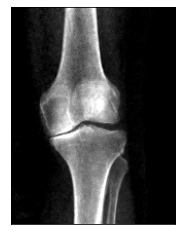

Fake radiographs generated from the above


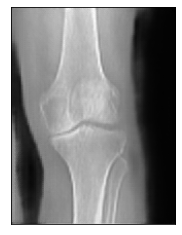

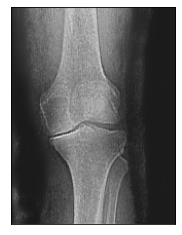

In [202]:
print("Sample DXA Image")
show(dxa_ds[70, 0])
print("Fake radiographs generated from the above")
show(gen_low(dxa_ds[70:71].cuda())[0, 0])
show(gen_high(dxa_ds[70:71].cuda())[0, 0])

Fake DXAs generated from radiographs are of low quality, so we do not use this direction of the cyclegan


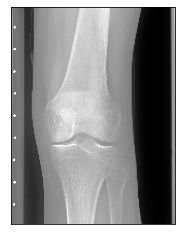

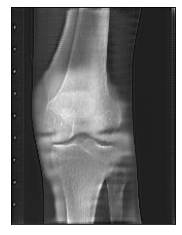

In [203]:
print("Fake DXAs generated from radiographs are of low quality, so we do not use this direction of the cyclegan")
show(radio_ds[76:77].flip(dims=(3,))[0, 0])
show(gen_dx(radio_ds[76:77].flip(dims=(3,)).cuda().float())[0, 0])

In [138]:
with torch.no_grad():
    fake_low = [gen_low(dxa[None].cuda()).cpu() for dxa in dxa_ds]
    fake_low = torch.cat(fake_low)
    
    fake_low = (torch.randn((fake_low.shape[0], 1, 1, 1)) * .2 + .7) * fake_low

    fake_high = [gen_high(dxa[None].cuda()).cpu() for dxa in dxa_ds]
    fake_high = torch.cat(fake_high)

In [12]:
import icon_registration as icon

In [206]:
print("""We build a dataset consisting of:

registration network input  | image used for similarity measure
----------------------------------------------------------------
dxa                         | dxa
fake high energy radiograph | dxa
fake low energy radiograph  | dxa
real radiograph             | real radiograph
""")
augmented_ds = torch.cat([
    torch.cat([
        dxa_ds, dxa_ds, dxa_ds, dxa_ds, dxa_ds, dxa_ds, radio_ds[:100].flip(dims=(3,))
    ], axis=0),
    torch.cat([
        dxa_ds, dxa_ds, dxa_ds, fake_high, fake_low, (fake_high  + fake_low) / 2, radio_ds[:100].flip(dims=(3,))
    ], axis=0),
], axis=1)

We build a dataset consisting of:

registration network input  | image used for similarity measure
----------------------------------------------------------------
dxa                         | dxa
fake high energy radiograph | dxa
fake low energy radiograph  | dxa
real radiograph             | real radiograph



In [144]:
augmented_ds.shape

torch.Size([838, 2, 212, 160])

In [145]:
class SecondChanNet(torch.nn.Module):
    def __init__(self, net):
        super().__init__()
        self.net = net
    def forward(self, x, y):
        return self.net(x[:, 1:2], y[:, 1:2])
    
class FirstChanSim:
    def __init__(self, sim):
        self.sim = sim
    def __call__(self, x, y):
        return self.sim(x[:, :1], y[:, :1])

In [146]:
import icon_registration.networks as networks
BATCH_SIZE = 4
inner_net = icon.FunctionFromVectorField(SecondChanNet(networks.tallUNet2(dimension=2)))
for _ in range(3):
    inner_net = icon.TwoStepRegistration(icon.DownsampleRegistration(inner_net, 2), 
                                         icon.FunctionFromVectorField(SecondChanNet(networks.tallUNet2(dimension=2))))

netGrad = icon.GradientICON(
    inner_net,
    FirstChanSim(icon.LNCC(sigma=5)),
    3
)
input_shape = augmented_ds[:1, :1].size()
netGrad.assign_identity_map(input_shape)
netGrad.cuda()
optimizerGrad = torch.optim.Adam(netGrad.parameters(), lr=0.001)
netGrad.train()

GradientICON(
  (regis_net): TwoStepRegistration(
    (netPhi): DownsampleRegistration(
      (net): TwoStepRegistration(
        (netPhi): DownsampleRegistration(
          (net): TwoStepRegistration(
            (netPhi): DownsampleRegistration(
              (net): FunctionFromVectorField(
                (net): SecondChanNet(
                  (net): UNet2(
                    (downConvs): ModuleList(
                      (0): Conv2d(2, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
                      (1): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
                      (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
                      (3): Conv2d(64, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
                      (4): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
                    )
                    (upConvs): ModuleList(
                      (0): ConvTranspose2d(48, 16, kernel_s

In [147]:
def make_batch():
    idx = range(len(augmented_ds))
    imgs_idx = [random.choice(idx) for _ in range(BATCH_SIZE)]

    imgs = [augmented_ds[i:i+1] for i in imgs_idx]
    return torch.cat(imgs).cuda().float()
    

In [148]:
with torch.no_grad():
    val = netGrad(make_batch(), make_batch())
val

ICONLoss(all_loss=tensor(1.6032, device='cuda:0'), inverse_consistency_loss=tensor(0., device='cuda:0'), similarity_loss=tensor(1.6032, device='cuda:0'), transform_magnitude=tensor(0., device='cuda:0'), flips=tensor(0.))

In [ ]:
icon.train_batchfunction(netGrad, optimizerGrad, lambda : (make_batch(), make_batch()), steps=120000)

ICONLoss(all_loss=1.1086578369140625, inverse_consistency_loss=0.01955336146056652, similarity_loss=1.0499978065490723, transform_magnitude=0.0016578339273110032, flips=0.0)
ICONLoss(all_loss=1.1745033264160156, inverse_consistency_loss=0.01395847462117672, similarity_loss=1.1326278448104858, transform_magnitude=0.00546989357098937, flips=0.0)
ICONLoss(all_loss=1.1656668186187744, inverse_consistency_loss=0.014689842239022255, similarity_loss=1.1215972900390625, transform_magnitude=0.0021647170651704073, flips=0.0)
ICONLoss(all_loss=1.1461288928985596, inverse_consistency_loss=0.018657078966498375, similarity_loss=1.0901576280593872, transform_magnitude=0.001121564651839435, flips=0.0)
ICONLoss(all_loss=1.0881075859069824, inverse_consistency_loss=0.018200775608420372, similarity_loss=1.0335052013397217, transform_magnitude=0.0030391127802431583, flips=0.0)
ICONLoss(all_loss=1.1362637281417847, inverse_consistency_loss=0.02282191812992096, similarity_loss=1.0677980184555054, transform_

ICONLoss(all_loss=1.1567997932434082, inverse_consistency_loss=0.020918715745210648, similarity_loss=1.0940436124801636, transform_magnitude=0.00743627967312932, flips=0.0)
ICONLoss(all_loss=1.1126596927642822, inverse_consistency_loss=0.015287144109606743, similarity_loss=1.066798210144043, transform_magnitude=0.002178574912250042, flips=0.0)
ICONLoss(all_loss=1.0249392986297607, inverse_consistency_loss=0.014037997461855412, similarity_loss=0.9828252792358398, transform_magnitude=0.0037849058862775564, flips=0.0)
ICONLoss(all_loss=1.168673038482666, inverse_consistency_loss=0.014807753264904022, similarity_loss=1.124249815940857, transform_magnitude=0.005187880247831345, flips=0.0)
ICONLoss(all_loss=1.1760300397872925, inverse_consistency_loss=0.017772994935512543, similarity_loss=1.1227110624313354, transform_magnitude=0.003906521946191788, flips=0.0)
ICONLoss(all_loss=1.232134461402893, inverse_consistency_loss=0.017948202788829803, similarity_loss=1.1782898902893066, transform_mag

ICONLoss(all_loss=1.0912892818450928, inverse_consistency_loss=0.018538698554039, similarity_loss=1.0356731414794922, transform_magnitude=0.006788061931729317, flips=0.0)
ICONLoss(all_loss=1.0109195709228516, inverse_consistency_loss=0.012443603947758675, similarity_loss=0.973588764667511, transform_magnitude=0.0022252711933106184, flips=0.0)
ICONLoss(all_loss=1.0763123035430908, inverse_consistency_loss=0.01598970964550972, similarity_loss=1.0283432006835938, transform_magnitude=0.0026030386798083782, flips=0.0)
ICONLoss(all_loss=1.1911550760269165, inverse_consistency_loss=0.01351635716855526, similarity_loss=1.1506060361862183, transform_magnitude=0.004432740155607462, flips=0.0)
ICONLoss(all_loss=1.047154426574707, inverse_consistency_loss=0.013792900368571281, similarity_loss=1.0057756900787354, transform_magnitude=0.002917646197602153, flips=0.0)
ICONLoss(all_loss=1.0944008827209473, inverse_consistency_loss=0.016831301152706146, similarity_loss=1.0439069271087646, transform_magn

ICONLoss(all_loss=1.088847041130066, inverse_consistency_loss=0.012585963122546673, similarity_loss=1.0510891675949097, transform_magnitude=0.0047265756875276566, flips=0.0)
ICONLoss(all_loss=1.148470401763916, inverse_consistency_loss=0.01641581393778324, similarity_loss=1.0992228984832764, transform_magnitude=0.0026750618126243353, flips=0.0)
ICONLoss(all_loss=1.1212235689163208, inverse_consistency_loss=0.015699440613389015, similarity_loss=1.0741252899169922, transform_magnitude=0.00218248856253922, flips=0.0)
ICONLoss(all_loss=1.2427856922149658, inverse_consistency_loss=0.018425405025482178, similarity_loss=1.1875094175338745, transform_magnitude=0.005821821745485067, flips=0.0)
ICONLoss(all_loss=1.165781855583191, inverse_consistency_loss=0.017449021339416504, similarity_loss=1.1134347915649414, transform_magnitude=0.0036904835142195225, flips=0.0)
ICONLoss(all_loss=1.1482833623886108, inverse_consistency_loss=0.01900675892829895, similarity_loss=1.0912630558013916, transform_ma

ICONLoss(all_loss=1.04826819896698, inverse_consistency_loss=0.016757775098085403, similarity_loss=0.9979948401451111, transform_magnitude=0.002849305747076869, flips=0.0)
ICONLoss(all_loss=1.0606679916381836, inverse_consistency_loss=0.010918952524662018, similarity_loss=1.0279111862182617, transform_magnitude=0.0012804929865524173, flips=0.0)
ICONLoss(all_loss=1.1762492656707764, inverse_consistency_loss=0.012597871944308281, similarity_loss=1.1384556293487549, transform_magnitude=0.0019097354961559176, flips=0.0)
ICONLoss(all_loss=1.2303376197814941, inverse_consistency_loss=0.013577474281191826, similarity_loss=1.1896052360534668, transform_magnitude=0.0036765418481081724, flips=0.0)
ICONLoss(all_loss=0.9731041193008423, inverse_consistency_loss=0.01589958369731903, similarity_loss=0.9254053831100464, transform_magnitude=0.008253010921180248, flips=0.0)
ICONLoss(all_loss=1.1242189407348633, inverse_consistency_loss=0.013647206127643585, similarity_loss=1.0832773447036743, transform

ICONLoss(all_loss=1.0878124237060547, inverse_consistency_loss=0.01397077925503254, similarity_loss=1.0459001064300537, transform_magnitude=0.0018628316465765238, flips=0.0)
ICONLoss(all_loss=1.1084967851638794, inverse_consistency_loss=0.014957308769226074, similarity_loss=1.0636248588562012, transform_magnitude=0.0031317498069256544, flips=0.0)
ICONLoss(all_loss=1.1318360567092896, inverse_consistency_loss=0.016466911882162094, similarity_loss=1.0824353694915771, transform_magnitude=0.0036563437897711992, flips=0.0)
ICONLoss(all_loss=1.09619140625, inverse_consistency_loss=0.01415618509054184, similarity_loss=1.053722858428955, transform_magnitude=0.0026187561452388763, flips=0.0)
ICONLoss(all_loss=1.0678141117095947, inverse_consistency_loss=0.014598620124161243, similarity_loss=1.0240182876586914, transform_magnitude=0.0026139921974390745, flips=0.0)
ICONLoss(all_loss=1.1041003465652466, inverse_consistency_loss=0.01318872906267643, similarity_loss=1.0645341873168945, transform_mag

ICONLoss(all_loss=1.2339152097702026, inverse_consistency_loss=0.022859185934066772, similarity_loss=1.1653376817703247, transform_magnitude=0.002683630445972085, flips=0.0)
ICONLoss(all_loss=1.1889245510101318, inverse_consistency_loss=0.016325775533914566, similarity_loss=1.1399471759796143, transform_magnitude=0.0022418193984776735, flips=0.0)
ICONLoss(all_loss=1.224087119102478, inverse_consistency_loss=0.018420102074742317, similarity_loss=1.1688268184661865, transform_magnitude=0.003458819119259715, flips=0.0)
ICONLoss(all_loss=1.1375690698623657, inverse_consistency_loss=0.019358428195118904, similarity_loss=1.079493761062622, transform_magnitude=0.001745812245644629, flips=0.0)
ICONLoss(all_loss=1.1529748439788818, inverse_consistency_loss=0.021938011050224304, similarity_loss=1.0871608257293701, transform_magnitude=0.0049790204502642155, flips=0.0)
ICONLoss(all_loss=1.0679608583450317, inverse_consistency_loss=0.019150838255882263, similarity_loss=1.0105082988739014, transform

ICONLoss(all_loss=1.1131033897399902, inverse_consistency_loss=0.01587502844631672, similarity_loss=1.0654783248901367, transform_magnitude=0.003883074037730694, flips=0.0)
ICONLoss(all_loss=1.0184775590896606, inverse_consistency_loss=0.015136318281292915, similarity_loss=0.9730686545372009, transform_magnitude=0.0035898075439035892, flips=0.0)
ICONLoss(all_loss=1.155064582824707, inverse_consistency_loss=0.015517471358180046, similarity_loss=1.1085121631622314, transform_magnitude=0.0029340717010200024, flips=0.0)
ICONLoss(all_loss=1.1223132610321045, inverse_consistency_loss=0.014560218900442123, similarity_loss=1.0786325931549072, transform_magnitude=0.004224855452775955, flips=0.0)
ICONLoss(all_loss=1.2412258386611938, inverse_consistency_loss=0.021206911653280258, similarity_loss=1.177605152130127, transform_magnitude=0.0015350920148193836, flips=0.0)
ICONLoss(all_loss=1.2517744302749634, inverse_consistency_loss=0.022502630949020386, similarity_loss=1.1842665672302246, transform

ICONLoss(all_loss=1.067286729812622, inverse_consistency_loss=0.01439366303384304, similarity_loss=1.0241057872772217, transform_magnitude=0.0024329202715307474, flips=0.0)
ICONLoss(all_loss=1.1939018964767456, inverse_consistency_loss=0.021548662334680557, similarity_loss=1.1292558908462524, transform_magnitude=0.0036623880732804537, flips=0.0)
ICONLoss(all_loss=1.0848145484924316, inverse_consistency_loss=0.012147956527769566, similarity_loss=1.0483707189559937, transform_magnitude=0.004560228902846575, flips=0.0)
ICONLoss(all_loss=1.0571624040603638, inverse_consistency_loss=0.015493601560592651, similarity_loss=1.0106816291809082, transform_magnitude=0.0035682341549545527, flips=0.0)
ICONLoss(all_loss=1.174617052078247, inverse_consistency_loss=0.017013374716043472, similarity_loss=1.1235768795013428, transform_magnitude=0.0020299970638006926, flips=0.0)
ICONLoss(all_loss=1.0797529220581055, inverse_consistency_loss=0.020206663757562637, similarity_loss=1.0191329717636108, transfor

ICONLoss(all_loss=1.1459687948226929, inverse_consistency_loss=0.018031321465969086, similarity_loss=1.0918748378753662, transform_magnitude=0.001719548599794507, flips=0.0)
ICONLoss(all_loss=1.1917378902435303, inverse_consistency_loss=0.01674799993634224, similarity_loss=1.1414939165115356, transform_magnitude=0.003528084373101592, flips=0.0)
ICONLoss(all_loss=1.082689881324768, inverse_consistency_loss=0.011671844869852066, similarity_loss=1.047674298286438, transform_magnitude=0.002483524614945054, flips=0.0)
ICONLoss(all_loss=1.064773440361023, inverse_consistency_loss=0.013454006053507328, similarity_loss=1.0244114398956299, transform_magnitude=0.0017566211754456162, flips=0.0)
ICONLoss(all_loss=1.0746151208877563, inverse_consistency_loss=0.010732939466834068, similarity_loss=1.0424163341522217, transform_magnitude=0.001998559106141329, flips=0.0)
ICONLoss(all_loss=1.3362914323806763, inverse_consistency_loss=0.01962302252650261, similarity_loss=1.277422308921814, transform_magn

ICONLoss(all_loss=1.1969413757324219, inverse_consistency_loss=0.014045646414160728, similarity_loss=1.1548044681549072, transform_magnitude=0.0030667183455079794, flips=0.0)
ICONLoss(all_loss=1.134462594985962, inverse_consistency_loss=0.022409655153751373, similarity_loss=1.067233681678772, transform_magnitude=0.0025467723608016968, flips=0.0)
ICONLoss(all_loss=1.1811492443084717, inverse_consistency_loss=0.019744371995329857, similarity_loss=1.1219161748886108, transform_magnitude=0.003700577188283205, flips=0.0)
ICONLoss(all_loss=1.121726632118225, inverse_consistency_loss=0.02050737291574478, similarity_loss=1.0602045059204102, transform_magnitude=0.004614110570400953, flips=0.0)
ICONLoss(all_loss=1.1848036050796509, inverse_consistency_loss=0.020816287025809288, similarity_loss=1.1223547458648682, transform_magnitude=0.003923679236322641, flips=0.0)
ICONLoss(all_loss=1.260311484336853, inverse_consistency_loss=0.026494786143302917, similarity_loss=1.1808271408081055, transform_ma

ICONLoss(all_loss=1.0389984846115112, inverse_consistency_loss=0.014125917106866837, similarity_loss=0.996620774269104, transform_magnitude=0.001215399126522243, flips=0.0)
ICONLoss(all_loss=1.1458956003189087, inverse_consistency_loss=0.015795500949025154, similarity_loss=1.0985090732574463, transform_magnitude=0.0026508746668696404, flips=0.0)
ICONLoss(all_loss=1.034538984298706, inverse_consistency_loss=0.010227935388684273, similarity_loss=1.0038552284240723, transform_magnitude=0.004202669952064753, flips=0.0)
ICONLoss(all_loss=1.1061580181121826, inverse_consistency_loss=0.01277756504714489, similarity_loss=1.0678253173828125, transform_magnitude=0.0030900281853973866, flips=0.0)
ICONLoss(all_loss=1.1394656896591187, inverse_consistency_loss=0.014375326223671436, similarity_loss=1.0963397026062012, transform_magnitude=0.00216489564627409, flips=0.0)
ICONLoss(all_loss=1.1379244327545166, inverse_consistency_loss=0.01715225540101528, similarity_loss=1.0864676237106323, transform_ma

ICONLoss(all_loss=1.2710578441619873, inverse_consistency_loss=0.025445599108934402, similarity_loss=1.1947211027145386, transform_magnitude=0.004726585932075977, flips=0.0)
ICONLoss(all_loss=1.1714643239974976, inverse_consistency_loss=0.023525428026914597, similarity_loss=1.1008880138397217, transform_magnitude=0.0013781841844320297, flips=0.0)
ICONLoss(all_loss=1.1551775932312012, inverse_consistency_loss=0.01421942375600338, similarity_loss=1.1125192642211914, transform_magnitude=0.003309153951704502, flips=0.0)
ICONLoss(all_loss=1.1229779720306396, inverse_consistency_loss=0.020522436127066612, similarity_loss=1.061410665512085, transform_magnitude=0.0036827672738581896, flips=0.0)
ICONLoss(all_loss=1.0689979791641235, inverse_consistency_loss=0.01648510806262493, similarity_loss=1.0195426940917969, transform_magnitude=0.0014765142695978284, flips=0.0)
ICONLoss(all_loss=1.2224161624908447, inverse_consistency_loss=0.01837705820798874, similarity_loss=1.1672849655151367, transform_

ICONLoss(all_loss=1.2595653533935547, inverse_consistency_loss=0.02234397456049919, similarity_loss=1.1925334930419922, transform_magnitude=0.0024279530625790358, flips=0.0)
ICONLoss(all_loss=1.0710728168487549, inverse_consistency_loss=0.014585236087441444, similarity_loss=1.0273171663284302, transform_magnitude=0.0032344635110348463, flips=0.0)
ICONLoss(all_loss=1.1226886510849, inverse_consistency_loss=0.017637167125940323, similarity_loss=1.0697771310806274, transform_magnitude=0.0029206720646470785, flips=0.0)
ICONLoss(all_loss=1.217552661895752, inverse_consistency_loss=0.022733669728040695, similarity_loss=1.1493515968322754, transform_magnitude=0.00714390492066741, flips=0.0)
ICONLoss(all_loss=1.2011204957962036, inverse_consistency_loss=0.018655993044376373, similarity_loss=1.1451525688171387, transform_magnitude=0.0034238132648169994, flips=0.0)
ICONLoss(all_loss=1.1081137657165527, inverse_consistency_loss=0.01518526952713728, similarity_loss=1.0625579357147217, transform_ma

ICONLoss(all_loss=1.213984727859497, inverse_consistency_loss=0.015995725989341736, similarity_loss=1.1659975051879883, transform_magnitude=0.004716109484434128, flips=0.0)
ICONLoss(all_loss=1.1165709495544434, inverse_consistency_loss=0.015001339837908745, similarity_loss=1.0715669393539429, transform_magnitude=0.0024218433536589146, flips=0.0)
ICONLoss(all_loss=1.1378310918807983, inverse_consistency_loss=0.01837618090212345, similarity_loss=1.0827025175094604, transform_magnitude=0.005070612300187349, flips=0.0)
ICONLoss(all_loss=1.2672866582870483, inverse_consistency_loss=0.03364376351237297, similarity_loss=1.1663553714752197, transform_magnitude=0.006706033367663622, flips=0.0)
ICONLoss(all_loss=1.0760210752487183, inverse_consistency_loss=0.016904782503843307, similarity_loss=1.0253067016601562, transform_magnitude=0.002470837440341711, flips=0.0)
ICONLoss(all_loss=1.1004664897918701, inverse_consistency_loss=0.01907065138220787, similarity_loss=1.0432544946670532, transform_ma

ICONLoss(all_loss=1.2873460054397583, inverse_consistency_loss=0.01782684028148651, similarity_loss=1.23386549949646, transform_magnitude=0.003404023591428995, flips=0.0)
ICONLoss(all_loss=1.0346523523330688, inverse_consistency_loss=0.013409238308668137, similarity_loss=0.99442458152771, transform_magnitude=0.002886584959924221, flips=0.0)
ICONLoss(all_loss=1.1672353744506836, inverse_consistency_loss=0.010621222667396069, similarity_loss=1.1353716850280762, transform_magnitude=0.0024961279705166817, flips=0.0)
ICONLoss(all_loss=1.120326042175293, inverse_consistency_loss=0.013977015390992165, similarity_loss=1.0783950090408325, transform_magnitude=0.005918565671890974, flips=0.0)
ICONLoss(all_loss=1.1484167575836182, inverse_consistency_loss=0.014720776118338108, similarity_loss=1.1042544841766357, transform_magnitude=0.0038591844495385885, flips=0.0)
ICONLoss(all_loss=1.0681655406951904, inverse_consistency_loss=0.013036089017987251, similarity_loss=1.029057264328003, transform_magn

ICONLoss(all_loss=1.0797091722488403, inverse_consistency_loss=0.014424029737710953, similarity_loss=1.0364370346069336, transform_magnitude=0.006151709705591202, flips=0.0)
ICONLoss(all_loss=1.194260597229004, inverse_consistency_loss=0.017831923440098763, similarity_loss=1.140764832496643, transform_magnitude=0.005036798305809498, flips=0.0)
ICONLoss(all_loss=1.0345423221588135, inverse_consistency_loss=0.014893202111124992, similarity_loss=0.9898626804351807, transform_magnitude=0.0040482752956449986, flips=0.0)
ICONLoss(all_loss=1.121316909790039, inverse_consistency_loss=0.017750976607203484, similarity_loss=1.0680639743804932, transform_magnitude=0.0023620526771992445, flips=0.0)
ICONLoss(all_loss=1.157920479774475, inverse_consistency_loss=0.015785889700055122, similarity_loss=1.110562801361084, transform_magnitude=0.0019019291503354907, flips=0.0)
ICONLoss(all_loss=1.0566743612289429, inverse_consistency_loss=0.014382172375917435, similarity_loss=1.0135278701782227, transform_m

ICONLoss(all_loss=1.0778217315673828, inverse_consistency_loss=0.010191431269049644, similarity_loss=1.0472474098205566, transform_magnitude=0.0022143321111798286, flips=0.0)
ICONLoss(all_loss=1.069638967514038, inverse_consistency_loss=0.014006075449287891, similarity_loss=1.027620792388916, transform_magnitude=0.0027139433659613132, flips=0.0)
ICONLoss(all_loss=1.0797067880630493, inverse_consistency_loss=0.012789754197001457, similarity_loss=1.041337490081787, transform_magnitude=0.0025120824575424194, flips=0.0)
ICONLoss(all_loss=1.1381877660751343, inverse_consistency_loss=0.01455063745379448, similarity_loss=1.0945358276367188, transform_magnitude=0.0027123880572617054, flips=0.0)
ICONLoss(all_loss=1.209806203842163, inverse_consistency_loss=0.014716928824782372, similarity_loss=1.1656553745269775, transform_magnitude=0.0024362136609852314, flips=0.0)
ICONLoss(all_loss=1.1181048154830933, inverse_consistency_loss=0.013055938296020031, similarity_loss=1.07893705368042, transform_m

ICONLoss(all_loss=1.1631652116775513, inverse_consistency_loss=0.01957523822784424, similarity_loss=1.1044394969940186, transform_magnitude=0.0030701449140906334, flips=0.0)
ICONLoss(all_loss=1.1441618204116821, inverse_consistency_loss=0.016957322135567665, similarity_loss=1.093289852142334, transform_magnitude=0.0023691796232014894, flips=0.0)
ICONLoss(all_loss=1.1648718118667603, inverse_consistency_loss=0.01877395436167717, similarity_loss=1.108549952507019, transform_magnitude=0.0035947563592344522, flips=0.0)
ICONLoss(all_loss=1.2112419605255127, inverse_consistency_loss=0.02161303162574768, similarity_loss=1.1464028358459473, transform_magnitude=0.0021275158505886793, flips=0.0)
ICONLoss(all_loss=1.0974026918411255, inverse_consistency_loss=0.014560244977474213, similarity_loss=1.0537219047546387, transform_magnitude=0.0025418889708817005, flips=0.0)
ICONLoss(all_loss=1.1229110956192017, inverse_consistency_loss=0.013140279799699783, similarity_loss=1.083490252494812, transform_

ICONLoss(all_loss=1.0399311780929565, inverse_consistency_loss=0.014633259736001492, similarity_loss=0.9960314035415649, transform_magnitude=0.0021638055332005024, flips=0.0)
ICONLoss(all_loss=1.0553760528564453, inverse_consistency_loss=0.014779811725020409, similarity_loss=1.0110366344451904, transform_magnitude=0.0032433888409286737, flips=0.0)
ICONLoss(all_loss=1.1570972204208374, inverse_consistency_loss=0.014883559197187424, similarity_loss=1.1124465465545654, transform_magnitude=0.0017993104411289096, flips=0.0)
ICONLoss(all_loss=1.1782004833221436, inverse_consistency_loss=0.014745107851922512, similarity_loss=1.1339651346206665, transform_magnitude=0.004291463643312454, flips=0.0)
ICONLoss(all_loss=1.1050167083740234, inverse_consistency_loss=0.0196332186460495, similarity_loss=1.0461170673370361, transform_magnitude=0.0025639026425778866, flips=0.0)
ICONLoss(all_loss=1.1476128101348877, inverse_consistency_loss=0.01667318306863308, similarity_loss=1.0975933074951172, transfor

ICONLoss(all_loss=1.0577081441879272, inverse_consistency_loss=0.013640212826430798, similarity_loss=1.0167875289916992, transform_magnitude=0.0024034157395362854, flips=0.0)
ICONLoss(all_loss=1.2929590940475464, inverse_consistency_loss=0.018809909000992775, similarity_loss=1.2365293502807617, transform_magnitude=0.008170951157808304, flips=0.0)
ICONLoss(all_loss=1.1020209789276123, inverse_consistency_loss=0.015663525089621544, similarity_loss=1.055030345916748, transform_magnitude=0.005631980486214161, flips=0.0)
ICONLoss(all_loss=1.095136046409607, inverse_consistency_loss=0.017080258578062057, similarity_loss=1.0438952445983887, transform_magnitude=0.0033241407945752144, flips=0.0)
ICONLoss(all_loss=1.0326803922653198, inverse_consistency_loss=0.018979329615831375, similarity_loss=0.9757423996925354, transform_magnitude=0.0026232798118144274, flips=0.0)
ICONLoss(all_loss=1.1495182514190674, inverse_consistency_loss=0.015644202008843422, similarity_loss=1.1025856733322144, transfor

ICONLoss(all_loss=1.1781611442565918, inverse_consistency_loss=0.014594333246350288, similarity_loss=1.13437819480896, transform_magnitude=0.004562462214380503, flips=0.0)
ICONLoss(all_loss=1.2247812747955322, inverse_consistency_loss=0.013912364840507507, similarity_loss=1.183044195175171, transform_magnitude=0.0048467800952494144, flips=0.0)
ICONLoss(all_loss=1.0858813524246216, inverse_consistency_loss=0.013514943420886993, similarity_loss=1.0453364849090576, transform_magnitude=0.002897523809224367, flips=0.0)
ICONLoss(all_loss=1.1244077682495117, inverse_consistency_loss=0.016005035489797592, similarity_loss=1.076392650604248, transform_magnitude=0.005544178653508425, flips=0.0)
ICONLoss(all_loss=1.1842551231384277, inverse_consistency_loss=0.0175619013607502, similarity_loss=1.1315693855285645, transform_magnitude=0.004578966647386551, flips=0.0)
ICONLoss(all_loss=1.1544232368469238, inverse_consistency_loss=0.015999162569642067, similarity_loss=1.1064257621765137, transform_magn

ICONLoss(all_loss=1.1549131870269775, inverse_consistency_loss=0.01796620897948742, similarity_loss=1.1010146141052246, transform_magnitude=0.0032577505335211754, flips=0.0)
ICONLoss(all_loss=1.0824857950210571, inverse_consistency_loss=0.012561118230223656, similarity_loss=1.0448024272918701, transform_magnitude=0.003718327498063445, flips=0.0)
ICONLoss(all_loss=1.0257067680358887, inverse_consistency_loss=0.014568343758583069, similarity_loss=0.982001781463623, transform_magnitude=0.003270277986302972, flips=0.0)
ICONLoss(all_loss=1.0324323177337646, inverse_consistency_loss=0.016248807311058044, similarity_loss=0.9836858510971069, transform_magnitude=0.003064356744289398, flips=0.0)
ICONLoss(all_loss=1.1746758222579956, inverse_consistency_loss=0.026566890999674797, similarity_loss=1.0949751138687134, transform_magnitude=0.002147092018276453, flips=0.0)
ICONLoss(all_loss=1.1558711528778076, inverse_consistency_loss=0.02066865935921669, similarity_loss=1.093865156173706, transform_ma

ICONLoss(all_loss=1.219154715538025, inverse_consistency_loss=0.013850872404873371, similarity_loss=1.1776020526885986, transform_magnitude=0.00198673945851624, flips=0.0)
ICONLoss(all_loss=1.119034767150879, inverse_consistency_loss=0.01281379908323288, similarity_loss=1.0805933475494385, transform_magnitude=0.002780104521661997, flips=0.0)
ICONLoss(all_loss=1.1610863208770752, inverse_consistency_loss=0.017066560685634613, similarity_loss=1.109886646270752, transform_magnitude=0.002054479904472828, flips=0.0)
ICONLoss(all_loss=1.1669872999191284, inverse_consistency_loss=0.01891385018825531, similarity_loss=1.110245704650879, transform_magnitude=0.0025583577807992697, flips=0.0)
ICONLoss(all_loss=1.0507440567016602, inverse_consistency_loss=0.01782548613846302, similarity_loss=0.9972676038742065, transform_magnitude=0.0026233107782900333, flips=0.0)
ICONLoss(all_loss=1.114087462425232, inverse_consistency_loss=0.014163282699882984, similarity_loss=1.0715975761413574, transform_magnit

ICONLoss(all_loss=1.135550618171692, inverse_consistency_loss=0.023600555956363678, similarity_loss=1.064749002456665, transform_magnitude=0.0027041917201131582, flips=0.0)
ICONLoss(all_loss=1.091141700744629, inverse_consistency_loss=0.019925445318222046, similarity_loss=1.0313653945922852, transform_magnitude=0.003643731353804469, flips=0.0)
ICONLoss(all_loss=1.0477365255355835, inverse_consistency_loss=0.011818032711744308, similarity_loss=1.012282371520996, transform_magnitude=0.004918765276670456, flips=0.0)
ICONLoss(all_loss=1.1553990840911865, inverse_consistency_loss=0.015283044427633286, similarity_loss=1.1095499992370605, transform_magnitude=0.00475724320858717, flips=0.0)
ICONLoss(all_loss=1.0745750665664673, inverse_consistency_loss=0.012736838310956955, similarity_loss=1.0363645553588867, transform_magnitude=0.0027268787380307913, flips=0.0)
ICONLoss(all_loss=1.2170352935791016, inverse_consistency_loss=0.019011495634913445, similarity_loss=1.1600008010864258, transform_ma

ICONLoss(all_loss=1.1814334392547607, inverse_consistency_loss=0.01734907552599907, similarity_loss=1.1293861865997314, transform_magnitude=0.0031567097175866365, flips=0.0)
ICONLoss(all_loss=1.1065857410430908, inverse_consistency_loss=0.01512574777007103, similarity_loss=1.0612084865570068, transform_magnitude=0.002196245826780796, flips=0.0)
ICONLoss(all_loss=1.0571388006210327, inverse_consistency_loss=0.019947359338402748, similarity_loss=0.9972966909408569, transform_magnitude=0.003474112134426832, flips=0.0)
ICONLoss(all_loss=1.0406173467636108, inverse_consistency_loss=0.014168549329042435, similarity_loss=0.9981117248535156, transform_magnitude=0.004556675441563129, flips=0.0)
ICONLoss(all_loss=1.1426334381103516, inverse_consistency_loss=0.01593087986111641, similarity_loss=1.0948407649993896, transform_magnitude=0.0032016232144087553, flips=0.0)
ICONLoss(all_loss=1.1671613454818726, inverse_consistency_loss=0.017740437760949135, similarity_loss=1.1139400005340576, transform_

ICONLoss(all_loss=1.206288456916809, inverse_consistency_loss=0.011172572150826454, similarity_loss=1.1727707386016846, transform_magnitude=0.0023327949456870556, flips=0.0)
ICONLoss(all_loss=1.162690281867981, inverse_consistency_loss=0.01734437793493271, similarity_loss=1.1106570959091187, transform_magnitude=0.004745808430016041, flips=0.0)
ICONLoss(all_loss=1.0645499229431152, inverse_consistency_loss=0.01284535601735115, similarity_loss=1.0260138511657715, transform_magnitude=0.002988650696352124, flips=0.0)
ICONLoss(all_loss=1.0223095417022705, inverse_consistency_loss=0.013197720050811768, similarity_loss=0.9827163219451904, transform_magnitude=0.0024613146670162678, flips=0.0)
ICONLoss(all_loss=1.1133514642715454, inverse_consistency_loss=0.013253966346383095, similarity_loss=1.073589563369751, transform_magnitude=0.002946944208815694, flips=0.0)
ICONLoss(all_loss=1.2297283411026, inverse_consistency_loss=0.022496093064546585, similarity_loss=1.1622400283813477, transform_magni

ICONLoss(all_loss=1.0788787603378296, inverse_consistency_loss=0.023677363991737366, similarity_loss=1.007846713066101, transform_magnitude=0.003333798609673977, flips=0.0)
ICONLoss(all_loss=1.188359260559082, inverse_consistency_loss=0.020097166299819946, similarity_loss=1.1280677318572998, transform_magnitude=0.0034527028910815716, flips=0.0)
ICONLoss(all_loss=1.1785554885864258, inverse_consistency_loss=0.024083619937300682, similarity_loss=1.10630464553833, transform_magnitude=0.005004641599953175, flips=0.0)
ICONLoss(all_loss=1.1495361328125, inverse_consistency_loss=0.02146291732788086, similarity_loss=1.0851473808288574, transform_magnitude=0.0030843433924019337, flips=0.0)
ICONLoss(all_loss=1.1004153490066528, inverse_consistency_loss=0.01783050037920475, similarity_loss=1.0469238758087158, transform_magnitude=0.003207363188266754, flips=0.0)
ICONLoss(all_loss=1.1761622428894043, inverse_consistency_loss=0.025670349597930908, similarity_loss=1.0991512537002563, transform_magnit

ICONLoss(all_loss=1.1754542589187622, inverse_consistency_loss=0.020240647718310356, similarity_loss=1.114732265472412, transform_magnitude=0.0033796285279095173, flips=0.0)
ICONLoss(all_loss=1.1635823249816895, inverse_consistency_loss=0.015946930274367332, similarity_loss=1.115741491317749, transform_magnitude=0.002601712243631482, flips=0.0)
ICONLoss(all_loss=1.117665410041809, inverse_consistency_loss=0.01577996462583542, similarity_loss=1.070325493812561, transform_magnitude=0.0022923864889889956, flips=0.0)
ICONLoss(all_loss=1.080037236213684, inverse_consistency_loss=0.016496844589710236, similarity_loss=1.0305466651916504, transform_magnitude=0.002356432843953371, flips=0.0)
ICONLoss(all_loss=1.1225035190582275, inverse_consistency_loss=0.015469053760170937, similarity_loss=1.0760962963104248, transform_magnitude=0.0032635319512337446, flips=0.0)
ICONLoss(all_loss=1.1337767839431763, inverse_consistency_loss=0.016189049929380417, similarity_loss=1.085209608078003, transform_mag

ICONLoss(all_loss=1.134321689605713, inverse_consistency_loss=0.014470250345766544, similarity_loss=1.0909109115600586, transform_magnitude=0.004299312364310026, flips=0.0)
ICONLoss(all_loss=1.0082868337631226, inverse_consistency_loss=0.01403715554624796, similarity_loss=0.9661753177642822, transform_magnitude=0.0024904110468924046, flips=0.0)
ICONLoss(all_loss=1.111527681350708, inverse_consistency_loss=0.01512203924357891, similarity_loss=1.0661615133285522, transform_magnitude=0.002115956973284483, flips=0.0)
ICONLoss(all_loss=1.1818478107452393, inverse_consistency_loss=0.013893701136112213, similarity_loss=1.1401667594909668, transform_magnitude=0.00240060081705451, flips=0.0)
ICONLoss(all_loss=1.1400561332702637, inverse_consistency_loss=0.01880069449543953, similarity_loss=1.0836540460586548, transform_magnitude=0.004015043843537569, flips=0.0)
ICONLoss(all_loss=1.0505971908569336, inverse_consistency_loss=0.013079934753477573, similarity_loss=1.0113574266433716, transform_magn

ICONLoss(all_loss=1.1810239553451538, inverse_consistency_loss=0.021452508866786957, similarity_loss=1.1166664361953735, transform_magnitude=0.0028744868468493223, flips=0.0)
ICONLoss(all_loss=1.079886555671692, inverse_consistency_loss=0.01693904586136341, similarity_loss=1.029069423675537, transform_magnitude=0.005305932834744453, flips=0.0)
ICONLoss(all_loss=1.1131097078323364, inverse_consistency_loss=0.016313891857862473, similarity_loss=1.0641679763793945, transform_magnitude=0.005388972349464893, flips=0.0)
ICONLoss(all_loss=1.1106035709381104, inverse_consistency_loss=0.020421011373400688, similarity_loss=1.0493404865264893, transform_magnitude=0.0027015116065740585, flips=0.0)
ICONLoss(all_loss=1.1133543252944946, inverse_consistency_loss=0.016505032777786255, similarity_loss=1.0638391971588135, transform_magnitude=0.004474754445254803, flips=0.0)
ICONLoss(all_loss=1.1365422010421753, inverse_consistency_loss=0.014333005994558334, similarity_loss=1.0935431718826294, transform_

ICONLoss(all_loss=1.0006576776504517, inverse_consistency_loss=0.013183243572711945, similarity_loss=0.9611079692840576, transform_magnitude=0.0027656361926347017, flips=0.0)
ICONLoss(all_loss=1.1837694644927979, inverse_consistency_loss=0.01776415854692459, similarity_loss=1.130476951599121, transform_magnitude=0.0033748748246580362, flips=0.0)
ICONLoss(all_loss=1.1981638669967651, inverse_consistency_loss=0.021588455885648727, similarity_loss=1.1333985328674316, transform_magnitude=0.0032353478018194437, flips=0.0)
ICONLoss(all_loss=1.075034260749817, inverse_consistency_loss=0.012140803039073944, similarity_loss=1.038611888885498, transform_magnitude=0.0034907327499240637, flips=0.0)
ICONLoss(all_loss=1.0185761451721191, inverse_consistency_loss=0.013738153502345085, similarity_loss=0.9773617386817932, transform_magnitude=0.0029605769086629152, flips=0.0)
ICONLoss(all_loss=1.0772156715393066, inverse_consistency_loss=0.018530625849962234, similarity_loss=1.0216238498687744, transfor

ICONLoss(all_loss=1.132995843887329, inverse_consistency_loss=0.014580494724214077, similarity_loss=1.089254379272461, transform_magnitude=0.005778825376182795, flips=0.0)
ICONLoss(all_loss=1.1748188734054565, inverse_consistency_loss=0.018708091229200363, similarity_loss=1.118694543838501, transform_magnitude=0.0024029077030718327, flips=0.0)
ICONLoss(all_loss=1.0951186418533325, inverse_consistency_loss=0.014857802540063858, similarity_loss=1.0505452156066895, transform_magnitude=0.004672021605074406, flips=0.0)
ICONLoss(all_loss=1.192686915397644, inverse_consistency_loss=0.019923744723200798, similarity_loss=1.132915735244751, transform_magnitude=0.006077480502426624, flips=0.0)
ICONLoss(all_loss=1.1443411111831665, inverse_consistency_loss=0.01357218623161316, similarity_loss=1.1036245822906494, transform_magnitude=0.002630433067679405, flips=0.0)
ICONLoss(all_loss=1.0056846141815186, inverse_consistency_loss=0.013352865353226662, similarity_loss=0.965626060962677, transform_magni

ICONLoss(all_loss=1.0382763147354126, inverse_consistency_loss=0.010877657681703568, similarity_loss=1.005643367767334, transform_magnitude=0.004162820056080818, flips=0.0)
ICONLoss(all_loss=0.9999293088912964, inverse_consistency_loss=0.012518389150500298, similarity_loss=0.9623741507530212, transform_magnitude=0.00221249065361917, flips=0.0)
ICONLoss(all_loss=1.048457145690918, inverse_consistency_loss=0.01068214699625969, similarity_loss=1.0164107084274292, transform_magnitude=0.001601619296707213, flips=0.0)
ICONLoss(all_loss=1.0354483127593994, inverse_consistency_loss=0.00864360574632883, similarity_loss=1.0095175504684448, transform_magnitude=0.0026045923586934805, flips=0.0)
ICONLoss(all_loss=1.1305476427078247, inverse_consistency_loss=0.010720573365688324, similarity_loss=1.0983859300613403, transform_magnitude=0.001792391063645482, flips=0.0)
ICONLoss(all_loss=1.0583242177963257, inverse_consistency_loss=0.01314689964056015, similarity_loss=1.018883466720581, transform_magni

ICONLoss(all_loss=1.0823287963867188, inverse_consistency_loss=0.015364964492619038, similarity_loss=1.036233901977539, transform_magnitude=0.004046106711030006, flips=0.0)
ICONLoss(all_loss=1.1288219690322876, inverse_consistency_loss=0.01641807332634926, similarity_loss=1.079567790031433, transform_magnitude=0.0015665931859984994, flips=0.0)
ICONLoss(all_loss=1.1104272603988647, inverse_consistency_loss=0.014274254441261292, similarity_loss=1.0676045417785645, transform_magnitude=0.0019560495857149363, flips=0.0)
ICONLoss(all_loss=1.1832832098007202, inverse_consistency_loss=0.021002082154154778, similarity_loss=1.120276927947998, transform_magnitude=0.005686505232006311, flips=0.0)
ICONLoss(all_loss=1.0934709310531616, inverse_consistency_loss=0.016279179602861404, similarity_loss=1.044633388519287, transform_magnitude=0.003984518349170685, flips=0.0)
ICONLoss(all_loss=1.1604377031326294, inverse_consistency_loss=0.01814854145050049, similarity_loss=1.105992078781128, transform_magn

ICONLoss(all_loss=0.9922694563865662, inverse_consistency_loss=0.01254407037049532, similarity_loss=0.9546372294425964, transform_magnitude=0.0034132436849176884, flips=0.0)
ICONLoss(all_loss=1.0682241916656494, inverse_consistency_loss=0.013647245243191719, similarity_loss=1.027282476425171, transform_magnitude=0.003391626989468932, flips=0.0)
ICONLoss(all_loss=1.0679051876068115, inverse_consistency_loss=0.017219852656126022, similarity_loss=1.0162456035614014, transform_magnitude=0.002421601675450802, flips=0.0)
ICONLoss(all_loss=1.1698907613754272, inverse_consistency_loss=0.014085164293646812, similarity_loss=1.1276352405548096, transform_magnitude=0.005314187612384558, flips=0.0)
ICONLoss(all_loss=1.213434100151062, inverse_consistency_loss=0.01488611288368702, similarity_loss=1.1687757968902588, transform_magnitude=0.007958885282278061, flips=0.0)
ICONLoss(all_loss=1.1022062301635742, inverse_consistency_loss=0.018281854689121246, similarity_loss=1.0473606586456299, transform_ma

ICONLoss(all_loss=1.2086000442504883, inverse_consistency_loss=0.018199965357780457, similarity_loss=1.154000163078308, transform_magnitude=0.0029741465114057064, flips=0.0)
ICONLoss(all_loss=1.1143620014190674, inverse_consistency_loss=0.015950364992022514, similarity_loss=1.0665109157562256, transform_magnitude=0.002955352421849966, flips=0.0)
ICONLoss(all_loss=1.2829322814941406, inverse_consistency_loss=0.03078276664018631, similarity_loss=1.1905839443206787, transform_magnitude=0.0037236413918435574, flips=0.0)
ICONLoss(all_loss=1.0946012735366821, inverse_consistency_loss=0.023028159514069557, similarity_loss=1.0255167484283447, transform_magnitude=0.0035667603369802237, flips=0.0)
ICONLoss(all_loss=1.2705342769622803, inverse_consistency_loss=0.02130318433046341, similarity_loss=1.2066247463226318, transform_magnitude=0.004804825410246849, flips=0.0)
ICONLoss(all_loss=1.2186907529830933, inverse_consistency_loss=0.02206648513674736, similarity_loss=1.1524913311004639, transform_

ICONLoss(all_loss=1.1146855354309082, inverse_consistency_loss=0.026018429547548294, similarity_loss=1.0366302728652954, transform_magnitude=0.003596930531784892, flips=0.0)
ICONLoss(all_loss=1.150590419769287, inverse_consistency_loss=0.0263363104313612, similarity_loss=1.071581482887268, transform_magnitude=0.006233809981495142, flips=0.0)
ICONLoss(all_loss=1.1353814601898193, inverse_consistency_loss=0.012630931101739407, similarity_loss=1.0974886417388916, transform_magnitude=0.0018619736656546593, flips=0.0)
ICONLoss(all_loss=1.2601547241210938, inverse_consistency_loss=0.026916181668639183, similarity_loss=1.1794061660766602, transform_magnitude=0.002500336617231369, flips=0.0)
ICONLoss(all_loss=1.2207947969436646, inverse_consistency_loss=0.02117462456226349, similarity_loss=1.157270908355713, transform_magnitude=0.003781807143241167, flips=0.0)
ICONLoss(all_loss=1.093550682067871, inverse_consistency_loss=0.01699473150074482, similarity_loss=1.0425665378570557, transform_magnit

ICONLoss(all_loss=1.0175648927688599, inverse_consistency_loss=0.02442481555044651, similarity_loss=0.9442903995513916, transform_magnitude=0.00482645770534873, flips=0.0)
ICONLoss(all_loss=1.0974723100662231, inverse_consistency_loss=0.02068442478775978, similarity_loss=1.03541898727417, transform_magnitude=0.0040883999317884445, flips=0.0)
ICONLoss(all_loss=1.163398265838623, inverse_consistency_loss=0.02159785106778145, similarity_loss=1.098604679107666, transform_magnitude=0.0031968760304152966, flips=0.0)
ICONLoss(all_loss=1.2791236639022827, inverse_consistency_loss=0.02894999273121357, similarity_loss=1.192273736000061, transform_magnitude=0.0019055047305300832, flips=0.0)
ICONLoss(all_loss=1.0776474475860596, inverse_consistency_loss=0.025713324546813965, similarity_loss=1.0005074739456177, transform_magnitude=0.003647251520305872, flips=0.0)
ICONLoss(all_loss=1.2399290800094604, inverse_consistency_loss=0.020922139286994934, similarity_loss=1.1771626472473145, transform_magnit

ICONLoss(all_loss=1.1625791788101196, inverse_consistency_loss=0.01837177760899067, similarity_loss=1.1074638366699219, transform_magnitude=0.00130790239199996, flips=0.0)
ICONLoss(all_loss=0.9758723378181458, inverse_consistency_loss=0.017981313169002533, similarity_loss=0.9219284057617188, transform_magnitude=0.0035711154341697693, flips=0.0)
ICONLoss(all_loss=0.9950929880142212, inverse_consistency_loss=0.013466205447912216, similarity_loss=0.954694390296936, transform_magnitude=0.0009579436155036092, flips=0.0)
ICONLoss(all_loss=1.188237190246582, inverse_consistency_loss=0.016780296340584755, similarity_loss=1.1378962993621826, transform_magnitude=0.005422959104180336, flips=0.0)
ICONLoss(all_loss=1.1506361961364746, inverse_consistency_loss=0.0116077596321702, similarity_loss=1.11581289768219, transform_magnitude=0.0029116126243025064, flips=0.0)
ICONLoss(all_loss=1.0090086460113525, inverse_consistency_loss=0.010535570792853832, similarity_loss=0.9774019718170166, transform_magn

ICONLoss(all_loss=1.0823783874511719, inverse_consistency_loss=0.02059822902083397, similarity_loss=1.0205837488174438, transform_magnitude=0.0023846731055527925, flips=0.0)
ICONLoss(all_loss=1.263164758682251, inverse_consistency_loss=0.017766520380973816, similarity_loss=1.2098652124404907, transform_magnitude=0.0015149491373449564, flips=0.0)
ICONLoss(all_loss=1.0052580833435059, inverse_consistency_loss=0.014376040548086166, similarity_loss=0.9621300101280212, transform_magnitude=0.0025480976328253746, flips=0.0)
ICONLoss(all_loss=1.1276524066925049, inverse_consistency_loss=0.016160421073436737, similarity_loss=1.0791711807250977, transform_magnitude=0.0023838875349611044, flips=0.0)
ICONLoss(all_loss=1.0767500400543213, inverse_consistency_loss=0.01629144698381424, similarity_loss=1.0278756618499756, transform_magnitude=0.0019272908102720976, flips=0.0)
ICONLoss(all_loss=1.0717638731002808, inverse_consistency_loss=0.015434077009558678, similarity_loss=1.0254616737365723, transfo

ICONLoss(all_loss=1.0737521648406982, inverse_consistency_loss=0.012573065236210823, similarity_loss=1.0360329151153564, transform_magnitude=0.0024678579065948725, flips=0.0)
ICONLoss(all_loss=1.1356512308120728, inverse_consistency_loss=0.01885690540075302, similarity_loss=1.0790804624557495, transform_magnitude=0.006536419969052076, flips=0.0)
ICONLoss(all_loss=1.1598743200302124, inverse_consistency_loss=0.021052882075309753, similarity_loss=1.0967156887054443, transform_magnitude=0.004834101069718599, flips=0.0)
ICONLoss(all_loss=1.0633189678192139, inverse_consistency_loss=0.01613973081111908, similarity_loss=1.014899730682373, transform_magnitude=0.003576558316126466, flips=0.0)
ICONLoss(all_loss=1.0840755701065063, inverse_consistency_loss=0.02505585178732872, similarity_loss=1.0089080333709717, transform_magnitude=0.004097313154488802, flips=0.0)
ICONLoss(all_loss=1.1033592224121094, inverse_consistency_loss=0.01675550267100334, similarity_loss=1.0530927181243896, transform_mag

ICONLoss(all_loss=1.135758638381958, inverse_consistency_loss=0.020608428865671158, similarity_loss=1.0739333629608154, transform_magnitude=0.004450708162039518, flips=0.0)
ICONLoss(all_loss=1.1569384336471558, inverse_consistency_loss=0.015181788243353367, similarity_loss=1.1113930940628052, transform_magnitude=0.004598217085003853, flips=0.0)
ICONLoss(all_loss=1.1645411252975464, inverse_consistency_loss=0.014158353209495544, similarity_loss=1.1220660209655762, transform_magnitude=0.003196733770892024, flips=0.0)
ICONLoss(all_loss=1.1383657455444336, inverse_consistency_loss=0.016117321327328682, similarity_loss=1.0900137424468994, transform_magnitude=0.0054221730679273605, flips=0.0)
ICONLoss(all_loss=1.1653432846069336, inverse_consistency_loss=0.027211684733629227, similarity_loss=1.0837082862854004, transform_magnitude=0.0018206849927082658, flips=0.0)
ICONLoss(all_loss=1.2607176303863525, inverse_consistency_loss=0.01957489736378193, similarity_loss=1.2019929885864258, transform

ICONLoss(all_loss=1.0767831802368164, inverse_consistency_loss=0.011852188967168331, similarity_loss=1.0412266254425049, transform_magnitude=0.0051211100071668625, flips=0.0)
ICONLoss(all_loss=1.1384928226470947, inverse_consistency_loss=0.015687867999076843, similarity_loss=1.0914292335510254, transform_magnitude=0.007302519399672747, flips=0.0)
ICONLoss(all_loss=1.121556043624878, inverse_consistency_loss=0.015484113246202469, similarity_loss=1.075103759765625, transform_magnitude=0.0017310803523287177, flips=0.0)
ICONLoss(all_loss=1.090946912765503, inverse_consistency_loss=0.011693645268678665, similarity_loss=1.055866003036499, transform_magnitude=0.0027109140064567327, flips=0.0)
ICONLoss(all_loss=1.0722577571868896, inverse_consistency_loss=0.01749519445002079, similarity_loss=1.0197721719741821, transform_magnitude=0.0025951152201741934, flips=0.0)
ICONLoss(all_loss=1.1528600454330444, inverse_consistency_loss=0.017184479162096977, similarity_loss=1.1013065576553345, transform_

ICONLoss(all_loss=0.9777486324310303, inverse_consistency_loss=0.017250588163733482, similarity_loss=0.9259968400001526, transform_magnitude=0.002430745866149664, flips=0.0)
ICONLoss(all_loss=1.0762087106704712, inverse_consistency_loss=0.01463238149881363, similarity_loss=1.0323115587234497, transform_magnitude=0.0047428784891963005, flips=0.0)
ICONLoss(all_loss=1.1213569641113281, inverse_consistency_loss=0.015933899208903313, similarity_loss=1.0735552310943604, transform_magnitude=0.0029673618264496326, flips=0.0)
ICONLoss(all_loss=1.1149990558624268, inverse_consistency_loss=0.014457546174526215, similarity_loss=1.0716264247894287, transform_magnitude=0.002326215850189328, flips=0.0)
ICONLoss(all_loss=1.123121976852417, inverse_consistency_loss=0.015990987420082092, similarity_loss=1.0751490592956543, transform_magnitude=0.0071644107811152935, flips=0.0)
ICONLoss(all_loss=1.0684069395065308, inverse_consistency_loss=0.025301478803157806, similarity_loss=0.9925024509429932, transfor

ICONLoss(all_loss=1.1298288106918335, inverse_consistency_loss=0.015295391902327538, similarity_loss=1.0839426517486572, transform_magnitude=0.0038124958518892527, flips=0.0)
ICONLoss(all_loss=1.0659233331680298, inverse_consistency_loss=0.014978284016251564, similarity_loss=1.0209884643554688, transform_magnitude=0.004003890790045261, flips=0.0)
ICONLoss(all_loss=1.1108545064926147, inverse_consistency_loss=0.015122605487704277, similarity_loss=1.0654866695404053, transform_magnitude=0.0032334555871784687, flips=0.0)
ICONLoss(all_loss=1.0605305433273315, inverse_consistency_loss=0.012427274137735367, similarity_loss=1.0232486724853516, transform_magnitude=0.0027661905623972416, flips=0.0)
ICONLoss(all_loss=1.1128723621368408, inverse_consistency_loss=0.018378818407654762, similarity_loss=1.0577359199523926, transform_magnitude=0.0044159842655062675, flips=0.0)
ICONLoss(all_loss=1.128834843635559, inverse_consistency_loss=0.015280359424650669, similarity_loss=1.082993745803833, transfo

ICONLoss(all_loss=1.120327115058899, inverse_consistency_loss=0.014615487307310104, similarity_loss=1.0764806270599365, transform_magnitude=0.004550744779407978, flips=0.0)
ICONLoss(all_loss=1.239743947982788, inverse_consistency_loss=0.018028751015663147, similarity_loss=1.1856577396392822, transform_magnitude=0.0021647680550813675, flips=0.0)
ICONLoss(all_loss=1.1046078205108643, inverse_consistency_loss=0.011274205520749092, similarity_loss=1.0707851648330688, transform_magnitude=0.001551022520288825, flips=0.0)
ICONLoss(all_loss=1.0597269535064697, inverse_consistency_loss=0.012654196470975876, similarity_loss=1.0217643976211548, transform_magnitude=0.00373437674716115, flips=0.0)
ICONLoss(all_loss=1.076278567314148, inverse_consistency_loss=0.011723291128873825, similarity_loss=1.0411087274551392, transform_magnitude=0.004299113526940346, flips=0.0)
ICONLoss(all_loss=1.1155965328216553, inverse_consistency_loss=0.014164048247039318, similarity_loss=1.0731043815612793, transform_ma

ICONLoss(all_loss=1.015048861503601, inverse_consistency_loss=0.015183612704277039, similarity_loss=0.9694980382919312, transform_magnitude=0.0017362635117024183, flips=0.0)
ICONLoss(all_loss=1.0998297929763794, inverse_consistency_loss=0.017122706398367882, similarity_loss=1.048461675643921, transform_magnitude=0.002144519006833434, flips=0.0)
ICONLoss(all_loss=1.1346278190612793, inverse_consistency_loss=0.017987554892897606, similarity_loss=1.080665111541748, transform_magnitude=0.0035476326011121273, flips=0.0)
ICONLoss(all_loss=1.219343662261963, inverse_consistency_loss=0.016634764149785042, similarity_loss=1.1694393157958984, transform_magnitude=0.0031589525751769543, flips=0.0)
ICONLoss(all_loss=1.0614371299743652, inverse_consistency_loss=0.014672569930553436, similarity_loss=1.017419457435608, transform_magnitude=0.0026175295934081078, flips=0.0)
ICONLoss(all_loss=1.163413166999817, inverse_consistency_loss=0.02175476774573326, similarity_loss=1.0981488227844238, transform_ma

ICONLoss(all_loss=1.1240748167037964, inverse_consistency_loss=0.01522330567240715, similarity_loss=1.0784049034118652, transform_magnitude=0.002542383735999465, flips=0.0)
ICONLoss(all_loss=1.0386220216751099, inverse_consistency_loss=0.011642100289463997, similarity_loss=1.0036957263946533, transform_magnitude=0.0018693073652684689, flips=0.0)
ICONLoss(all_loss=1.0475775003433228, inverse_consistency_loss=0.0115133635699749, similarity_loss=1.0130374431610107, transform_magnitude=0.0038860421627759933, flips=0.0)
ICONLoss(all_loss=1.1247155666351318, inverse_consistency_loss=0.020679226145148277, similarity_loss=1.0626778602600098, transform_magnitude=0.004688262939453125, flips=0.0)
ICONLoss(all_loss=1.0647087097167969, inverse_consistency_loss=0.0134518351405859, similarity_loss=1.0243531465530396, transform_magnitude=0.0036201186012476683, flips=0.0)
ICONLoss(all_loss=1.0492732524871826, inverse_consistency_loss=0.014730513095855713, similarity_loss=1.0050816535949707, transform_m

ICONLoss(all_loss=1.077436089515686, inverse_consistency_loss=0.011941053904592991, similarity_loss=1.041612982749939, transform_magnitude=0.003964963369071484, flips=0.0)
ICONLoss(all_loss=1.0406907796859741, inverse_consistency_loss=0.010515149682760239, similarity_loss=1.0091453790664673, transform_magnitude=0.0017673124093562365, flips=0.0)
ICONLoss(all_loss=0.9522874355316162, inverse_consistency_loss=0.011874629184603691, similarity_loss=0.9166635274887085, transform_magnitude=0.0022377390414476395, flips=0.0)
ICONLoss(all_loss=1.2622586488723755, inverse_consistency_loss=0.019314810633659363, similarity_loss=1.2043142318725586, transform_magnitude=0.004054051358252764, flips=0.0)
ICONLoss(all_loss=1.1600459814071655, inverse_consistency_loss=0.011425371281802654, similarity_loss=1.125769853591919, transform_magnitude=0.0023902428802102804, flips=0.0)
ICONLoss(all_loss=1.241067886352539, inverse_consistency_loss=0.02201288938522339, similarity_loss=1.1750292778015137, transform_m

ICONLoss(all_loss=1.1573035717010498, inverse_consistency_loss=0.015639401972293854, similarity_loss=1.1103854179382324, transform_magnitude=0.0022841140162199736, flips=0.0)
ICONLoss(all_loss=1.0721075534820557, inverse_consistency_loss=0.014621889218688011, similarity_loss=1.0282418727874756, transform_magnitude=0.004140572622418404, flips=0.0)
ICONLoss(all_loss=1.1054507493972778, inverse_consistency_loss=0.012700596824288368, similarity_loss=1.0673489570617676, transform_magnitude=0.002243244322016835, flips=0.0)
ICONLoss(all_loss=1.1436054706573486, inverse_consistency_loss=0.017751729115843773, similarity_loss=1.0903502702713013, transform_magnitude=0.0035396351013332605, flips=0.0)
ICONLoss(all_loss=1.2060450315475464, inverse_consistency_loss=0.023030316457152367, similarity_loss=1.1369540691375732, transform_magnitude=0.0056081246584653854, flips=0.0)
ICONLoss(all_loss=1.1203944683074951, inverse_consistency_loss=0.017613817006349564, similarity_loss=1.0675530433654785, transf

ICONLoss(all_loss=1.1517595052719116, inverse_consistency_loss=0.015576228499412537, similarity_loss=1.1050307750701904, transform_magnitude=0.0037990561686456203, flips=0.0)
ICONLoss(all_loss=1.0338661670684814, inverse_consistency_loss=0.016784343868494034, similarity_loss=0.9835131168365479, transform_magnitude=0.006412508897483349, flips=0.0)
ICONLoss(all_loss=1.1525400876998901, inverse_consistency_loss=0.01484793983399868, similarity_loss=1.1079962253570557, transform_magnitude=0.0041784197092056274, flips=0.0)
ICONLoss(all_loss=1.0511995553970337, inverse_consistency_loss=0.014338073320686817, similarity_loss=1.0081853866577148, transform_magnitude=0.001476540812291205, flips=0.0)
ICONLoss(all_loss=1.1944986581802368, inverse_consistency_loss=0.014351658523082733, similarity_loss=1.1514437198638916, transform_magnitude=0.0027096676640212536, flips=0.0)
ICONLoss(all_loss=0.9783263802528381, inverse_consistency_loss=0.014712379314005375, similarity_loss=0.9341892600059509, transfo

ICONLoss(all_loss=0.9795741438865662, inverse_consistency_loss=0.017527569085359573, similarity_loss=0.9269914627075195, transform_magnitude=0.0024347188882529736, flips=0.0)
ICONLoss(all_loss=1.0216368436813354, inverse_consistency_loss=0.013381831347942352, similarity_loss=0.9814913868904114, transform_magnitude=0.0008476614020764828, flips=0.0)
ICONLoss(all_loss=1.16767156124115, inverse_consistency_loss=0.018552102148532867, similarity_loss=1.1120152473449707, transform_magnitude=0.005781857762485743, flips=0.0)
ICONLoss(all_loss=1.1267837285995483, inverse_consistency_loss=0.01745234988629818, similarity_loss=1.0744266510009766, transform_magnitude=0.00507447961717844, flips=0.0)
ICONLoss(all_loss=1.1243722438812256, inverse_consistency_loss=0.014763042330741882, similarity_loss=1.0800831317901611, transform_magnitude=0.003065600525587797, flips=0.0)
ICONLoss(all_loss=1.1333951950073242, inverse_consistency_loss=0.01509440504014492, similarity_loss=1.0881119966506958, transform_ma

ICONLoss(all_loss=1.0133684873580933, inverse_consistency_loss=0.0141973365098238, similarity_loss=0.9707764387130737, transform_magnitude=0.0035544109996408224, flips=0.0)
ICONLoss(all_loss=1.0779001712799072, inverse_consistency_loss=0.012714691460132599, similarity_loss=1.0397560596466064, transform_magnitude=0.006112647708505392, flips=0.0)
ICONLoss(all_loss=1.188573956489563, inverse_consistency_loss=0.019506152719259262, similarity_loss=1.130055546760559, transform_magnitude=0.002288208343088627, flips=0.0)
ICONLoss(all_loss=1.0174462795257568, inverse_consistency_loss=0.01310488861054182, similarity_loss=0.9781316518783569, transform_magnitude=0.0038711202796548605, flips=0.0)
ICONLoss(all_loss=1.1738619804382324, inverse_consistency_loss=0.015745725482702255, similarity_loss=1.1266248226165771, transform_magnitude=0.0072792754508554935, flips=0.0)
ICONLoss(all_loss=1.1605304479599, inverse_consistency_loss=0.018264828249812126, similarity_loss=1.1057360172271729, transform_magn

ICONLoss(all_loss=1.0687825679779053, inverse_consistency_loss=0.013479135930538177, similarity_loss=1.0283451080322266, transform_magnitude=0.0036476771347224712, flips=0.0)
ICONLoss(all_loss=1.062143087387085, inverse_consistency_loss=0.014891792088747025, similarity_loss=1.017467737197876, transform_magnitude=0.0033933217637240887, flips=0.0)
ICONLoss(all_loss=1.215169906616211, inverse_consistency_loss=0.015512712299823761, similarity_loss=1.1686317920684814, transform_magnitude=0.002663577673956752, flips=0.0)
ICONLoss(all_loss=1.1066447496414185, inverse_consistency_loss=0.014130692929029465, similarity_loss=1.0642526149749756, transform_magnitude=0.003063157433643937, flips=0.0)
ICONLoss(all_loss=1.1697200536727905, inverse_consistency_loss=0.01411249116063118, similarity_loss=1.1273826360702515, transform_magnitude=0.0028893069829791784, flips=0.0)
ICONLoss(all_loss=1.1005561351776123, inverse_consistency_loss=0.013340853154659271, similarity_loss=1.0605335235595703, transform_

ICONLoss(all_loss=1.0403332710266113, inverse_consistency_loss=0.0140449907630682, similarity_loss=0.9981982707977295, transform_magnitude=0.0025026898365467787, flips=0.0)
ICONLoss(all_loss=1.0194110870361328, inverse_consistency_loss=0.010777661576867104, similarity_loss=0.987078070640564, transform_magnitude=0.0022707791067659855, flips=0.0)
ICONLoss(all_loss=1.1413840055465698, inverse_consistency_loss=0.015332920476794243, similarity_loss=1.095385193824768, transform_magnitude=0.0026062859687954187, flips=0.0)
ICONLoss(all_loss=1.149478554725647, inverse_consistency_loss=0.013653269037604332, similarity_loss=1.1085187196731567, transform_magnitude=0.004613359924405813, flips=0.0)
ICONLoss(all_loss=1.0291019678115845, inverse_consistency_loss=0.012205110862851143, similarity_loss=0.9924866557121277, transform_magnitude=0.004162963014096022, flips=0.0)
ICONLoss(all_loss=1.1435017585754395, inverse_consistency_loss=0.012189067900180817, similarity_loss=1.1069345474243164, transform_m

ICONLoss(all_loss=1.1353694200515747, inverse_consistency_loss=0.02560930885374546, similarity_loss=1.0585415363311768, transform_magnitude=0.002132777590304613, flips=0.0)
ICONLoss(all_loss=1.1459847688674927, inverse_consistency_loss=0.019528619945049286, similarity_loss=1.087398886680603, transform_magnitude=0.0029107416048645973, flips=0.0)
ICONLoss(all_loss=1.3042904138565063, inverse_consistency_loss=0.04570910334587097, similarity_loss=1.1671631336212158, transform_magnitude=0.004552960861474276, flips=0.0)
ICONLoss(all_loss=1.1787869930267334, inverse_consistency_loss=0.022382725030183792, similarity_loss=1.1116387844085693, transform_magnitude=0.002698139753192663, flips=0.0)
ICONLoss(all_loss=1.2008309364318848, inverse_consistency_loss=0.02195076271891594, similarity_loss=1.1349786520004272, transform_magnitude=0.004783558193594217, flips=0.0)
ICONLoss(all_loss=1.1440657377243042, inverse_consistency_loss=0.018693555146455765, similarity_loss=1.0879850387573242, transform_ma

ICONLoss(all_loss=1.0883623361587524, inverse_consistency_loss=0.010191553272306919, similarity_loss=1.0577876567840576, transform_magnitude=0.0025881861802190542, flips=0.0)
ICONLoss(all_loss=1.01994788646698, inverse_consistency_loss=0.012212114408612251, similarity_loss=0.9833115339279175, transform_magnitude=0.0038158614188432693, flips=0.0)
ICONLoss(all_loss=1.030413269996643, inverse_consistency_loss=0.01617562398314476, similarity_loss=0.9818863868713379, transform_magnitude=0.0014112868811935186, flips=0.0)
ICONLoss(all_loss=1.0988270044326782, inverse_consistency_loss=0.01499909907579422, similarity_loss=1.0538296699523926, transform_magnitude=0.003680110676214099, flips=0.0)
ICONLoss(all_loss=1.1313484907150269, inverse_consistency_loss=0.016086271032691002, similarity_loss=1.0830897092819214, transform_magnitude=0.0031874370761215687, flips=0.0)
ICONLoss(all_loss=1.0784614086151123, inverse_consistency_loss=0.013558801263570786, similarity_loss=1.0377850532531738, transform_

ICONLoss(all_loss=1.180675983428955, inverse_consistency_loss=0.017428088933229446, similarity_loss=1.1283917427062988, transform_magnitude=0.005179823841899633, flips=0.0)
ICONLoss(all_loss=1.1773453950881958, inverse_consistency_loss=0.02019505389034748, similarity_loss=1.11676025390625, transform_magnitude=0.005319003015756607, flips=0.0)
ICONLoss(all_loss=1.2147504091262817, inverse_consistency_loss=0.02012278139591217, similarity_loss=1.1543821096420288, transform_magnitude=0.003277125768363476, flips=0.0)
ICONLoss(all_loss=1.090444564819336, inverse_consistency_loss=0.015694763511419296, similarity_loss=1.0433602333068848, transform_magnitude=0.0037122999783605337, flips=0.0)
ICONLoss(all_loss=1.0922579765319824, inverse_consistency_loss=0.013893602415919304, similarity_loss=1.050577163696289, transform_magnitude=0.002587930066511035, flips=0.0)
ICONLoss(all_loss=1.1840139627456665, inverse_consistency_loss=0.01827036216855049, similarity_loss=1.1292028427124023, transform_magnit

ICONLoss(all_loss=1.2800277471542358, inverse_consistency_loss=0.037231333553791046, similarity_loss=1.1683337688446045, transform_magnitude=0.0022639730013906956, flips=0.0)
ICONLoss(all_loss=1.093686580657959, inverse_consistency_loss=0.0190676711499691, similarity_loss=1.0364835262298584, transform_magnitude=0.002661278238520026, flips=0.0)
ICONLoss(all_loss=1.1297515630722046, inverse_consistency_loss=0.019103312864899635, similarity_loss=1.072441577911377, transform_magnitude=0.003421969013288617, flips=0.0)
ICONLoss(all_loss=1.0723812580108643, inverse_consistency_loss=0.01560982409864664, similarity_loss=1.0255517959594727, transform_magnitude=0.0031779627315700054, flips=0.0)
ICONLoss(all_loss=1.1218730211257935, inverse_consistency_loss=0.01854640059173107, similarity_loss=1.0662338733673096, transform_magnitude=0.004551763646304607, flips=0.0)
ICONLoss(all_loss=1.1231703758239746, inverse_consistency_loss=0.015294857323169708, similarity_loss=1.0772857666015625, transform_mag

ICONLoss(all_loss=1.1856029033660889, inverse_consistency_loss=0.01427897997200489, similarity_loss=1.142765998840332, transform_magnitude=0.0019770031794905663, flips=0.0)
ICONLoss(all_loss=1.18385648727417, inverse_consistency_loss=0.016301047056913376, similarity_loss=1.1349533796310425, transform_magnitude=0.0031949260737746954, flips=0.0)
ICONLoss(all_loss=1.2253872156143188, inverse_consistency_loss=0.017239224165678024, similarity_loss=1.1736695766448975, transform_magnitude=0.0035341200418770313, flips=0.0)
ICONLoss(all_loss=1.0720332860946655, inverse_consistency_loss=0.01869826391339302, similarity_loss=1.0159385204315186, transform_magnitude=0.002086188644170761, flips=0.0)
ICONLoss(all_loss=1.0689916610717773, inverse_consistency_loss=0.01627500168979168, similarity_loss=1.0201666355133057, transform_magnitude=0.004934052471071482, flips=0.0)
ICONLoss(all_loss=1.0724647045135498, inverse_consistency_loss=0.01670924201607704, similarity_loss=1.0223369598388672, transform_mag

ICONLoss(all_loss=1.0596495866775513, inverse_consistency_loss=0.014219233766198158, similarity_loss=1.0169918537139893, transform_magnitude=0.003687378717586398, flips=0.0)
ICONLoss(all_loss=1.1760421991348267, inverse_consistency_loss=0.015627356246113777, similarity_loss=1.1291601657867432, transform_magnitude=0.0028752980288118124, flips=0.0)
ICONLoss(all_loss=1.1517452001571655, inverse_consistency_loss=0.015153713524341583, similarity_loss=1.1062840223312378, transform_magnitude=0.0030135668348520994, flips=0.0)
ICONLoss(all_loss=1.0773134231567383, inverse_consistency_loss=0.01564919948577881, similarity_loss=1.0303658246994019, transform_magnitude=0.004349380265921354, flips=0.0)
ICONLoss(all_loss=1.0222705602645874, inverse_consistency_loss=0.01592145301401615, similarity_loss=0.9745061993598938, transform_magnitude=0.004228944890201092, flips=0.0)
ICONLoss(all_loss=1.1335150003433228, inverse_consistency_loss=0.011524832807481289, similarity_loss=1.0989404916763306, transform

ICONLoss(all_loss=1.0716334581375122, inverse_consistency_loss=0.009540822356939316, similarity_loss=1.043010950088501, transform_magnitude=0.002981312107294798, flips=0.0)
ICONLoss(all_loss=1.0681803226470947, inverse_consistency_loss=0.012791238725185394, similarity_loss=1.0298066139221191, transform_magnitude=0.0025157080963253975, flips=0.0)
ICONLoss(all_loss=1.1149835586547852, inverse_consistency_loss=0.011992156505584717, similarity_loss=1.0790071487426758, transform_magnitude=0.004161634016782045, flips=0.0)
ICONLoss(all_loss=1.0146961212158203, inverse_consistency_loss=0.018144333735108376, similarity_loss=0.9602631330490112, transform_magnitude=0.0023224945180118084, flips=0.0)
ICONLoss(all_loss=1.0831260681152344, inverse_consistency_loss=0.01478332094848156, similarity_loss=1.038776159286499, transform_magnitude=0.006436915602535009, flips=0.0)
ICONLoss(all_loss=1.0881695747375488, inverse_consistency_loss=0.014434156939387321, similarity_loss=1.0448671579360962, transform_

ICONLoss(all_loss=1.199286699295044, inverse_consistency_loss=0.019536606967449188, similarity_loss=1.1406768560409546, transform_magnitude=0.004580282606184483, flips=0.0)
ICONLoss(all_loss=1.0154298543930054, inverse_consistency_loss=0.014533674344420433, similarity_loss=0.9718288779258728, transform_magnitude=0.002084605395793915, flips=0.0)
ICONLoss(all_loss=1.0414000749588013, inverse_consistency_loss=0.012841014191508293, similarity_loss=1.0028769969940186, transform_magnitude=0.0028924436774104834, flips=0.0)
ICONLoss(all_loss=1.1540038585662842, inverse_consistency_loss=0.012973830103874207, similarity_loss=1.1150823831558228, transform_magnitude=0.0018100806046277285, flips=0.0)
ICONLoss(all_loss=1.10637366771698, inverse_consistency_loss=0.015488188713788986, similarity_loss=1.0599091053009033, transform_magnitude=0.0020963118877261877, flips=0.0)
ICONLoss(all_loss=1.029042363166809, inverse_consistency_loss=0.016757981851696968, similarity_loss=0.9787684082984924, transform_

ICONLoss(all_loss=1.1128801107406616, inverse_consistency_loss=0.012033175677061081, similarity_loss=1.0767805576324463, transform_magnitude=0.003003553720191121, flips=0.0)
ICONLoss(all_loss=1.1594971418380737, inverse_consistency_loss=0.011707431636750698, similarity_loss=1.1243748664855957, transform_magnitude=0.0030385898426175117, flips=0.0)
ICONLoss(all_loss=1.0732042789459229, inverse_consistency_loss=0.009937189519405365, similarity_loss=1.0433926582336426, transform_magnitude=0.0021358346566557884, flips=0.0)
ICONLoss(all_loss=1.0502346754074097, inverse_consistency_loss=0.012762673199176788, similarity_loss=1.011946678161621, transform_magnitude=0.0029875957407057285, flips=0.0)
ICONLoss(all_loss=1.0508065223693848, inverse_consistency_loss=0.012677888385951519, similarity_loss=1.0127729177474976, transform_magnitude=0.0028453234117478132, flips=0.0)
ICONLoss(all_loss=1.3610056638717651, inverse_consistency_loss=0.024550216272473335, similarity_loss=1.2873550653457642, transf

ICONLoss(all_loss=1.0255624055862427, inverse_consistency_loss=0.01260126382112503, similarity_loss=0.9877586364746094, transform_magnitude=0.0006891522207297385, flips=0.0)
ICONLoss(all_loss=1.0307623147964478, inverse_consistency_loss=0.018214605748653412, similarity_loss=0.9761185050010681, transform_magnitude=0.004073742311447859, flips=0.0)
ICONLoss(all_loss=1.1995091438293457, inverse_consistency_loss=0.019805308431386948, similarity_loss=1.140093207359314, transform_magnitude=0.004078140947967768, flips=0.0)
ICONLoss(all_loss=1.1788666248321533, inverse_consistency_loss=0.01292227953672409, similarity_loss=1.1400997638702393, transform_magnitude=0.003936639986932278, flips=0.0)
ICONLoss(all_loss=1.3247323036193848, inverse_consistency_loss=0.030888643115758896, similarity_loss=1.2320663928985596, transform_magnitude=0.004089207388460636, flips=0.0)
ICONLoss(all_loss=1.1968680620193481, inverse_consistency_loss=0.02215062826871872, similarity_loss=1.1304161548614502, transform_ma

ICONLoss(all_loss=1.0522267818450928, inverse_consistency_loss=0.015236901119351387, similarity_loss=1.0065160989761353, transform_magnitude=0.002175478497520089, flips=0.0)
ICONLoss(all_loss=1.0575087070465088, inverse_consistency_loss=0.012860037386417389, similarity_loss=1.0189286470413208, transform_magnitude=0.003422296606004238, flips=0.0)
ICONLoss(all_loss=1.0558297634124756, inverse_consistency_loss=0.01639677584171295, similarity_loss=1.0066394805908203, transform_magnitude=0.0037512299604713917, flips=0.0)
ICONLoss(all_loss=1.0732975006103516, inverse_consistency_loss=0.01550525426864624, similarity_loss=1.0267817974090576, transform_magnitude=0.002555749611929059, flips=0.0)
ICONLoss(all_loss=1.0413178205490112, inverse_consistency_loss=0.019346021115779877, similarity_loss=0.9832797646522522, transform_magnitude=0.002748104277998209, flips=0.0)
ICONLoss(all_loss=1.1901313066482544, inverse_consistency_loss=0.012455420568585396, similarity_loss=1.1527650356292725, transform_

ICONLoss(all_loss=1.1787055730819702, inverse_consistency_loss=0.01815052703022957, similarity_loss=1.1242539882659912, transform_magnitude=0.006937363650649786, flips=0.0)
ICONLoss(all_loss=1.0355712175369263, inverse_consistency_loss=0.011841113679111004, similarity_loss=1.0000479221343994, transform_magnitude=0.005905120633542538, flips=0.0)
ICONLoss(all_loss=1.0372867584228516, inverse_consistency_loss=0.012232191860675812, similarity_loss=1.000590205192566, transform_magnitude=0.0024836654774844646, flips=0.0)
ICONLoss(all_loss=1.0770580768585205, inverse_consistency_loss=0.012776931747794151, similarity_loss=1.0387272834777832, transform_magnitude=0.0032154519576579332, flips=0.0)
ICONLoss(all_loss=1.0224769115447998, inverse_consistency_loss=0.014513700269162655, similarity_loss=0.9789358377456665, transform_magnitude=0.0026706617791205645, flips=0.0)
ICONLoss(all_loss=1.0568227767944336, inverse_consistency_loss=0.0144731430336833, similarity_loss=1.013403296470642, transform_m

ICONLoss(all_loss=1.1009527444839478, inverse_consistency_loss=0.011879176832735538, similarity_loss=1.0653152465820312, transform_magnitude=0.0032434319145977497, flips=0.0)
ICONLoss(all_loss=1.087405800819397, inverse_consistency_loss=0.01701052486896515, similarity_loss=1.0363742113113403, transform_magnitude=0.003179656807333231, flips=0.0)
ICONLoss(all_loss=1.2192846536636353, inverse_consistency_loss=0.02051823027431965, similarity_loss=1.157729983329773, transform_magnitude=0.002516059670597315, flips=0.0)
ICONLoss(all_loss=1.164368748664856, inverse_consistency_loss=0.018831996247172356, similarity_loss=1.107872724533081, transform_magnitude=0.004833863116800785, flips=0.0)
ICONLoss(all_loss=1.1976405382156372, inverse_consistency_loss=0.02876763977110386, similarity_loss=1.111337661743164, transform_magnitude=0.004293940495699644, flips=0.0)
ICONLoss(all_loss=1.0192694664001465, inverse_consistency_loss=0.012948880903422832, similarity_loss=0.9804227948188782, transform_magnit

ICONLoss(all_loss=1.0928161144256592, inverse_consistency_loss=0.01713063381612301, similarity_loss=1.04142427444458, transform_magnitude=0.0013683483703061938, flips=0.0)
ICONLoss(all_loss=1.0207551717758179, inverse_consistency_loss=0.01465988252311945, similarity_loss=0.9767755270004272, transform_magnitude=0.0050281137228012085, flips=0.0)
ICONLoss(all_loss=0.9612037539482117, inverse_consistency_loss=0.011891759000718594, similarity_loss=0.9255284667015076, transform_magnitude=0.0067821345292031765, flips=0.0)
ICONLoss(all_loss=1.1351370811462402, inverse_consistency_loss=0.02208002470433712, similarity_loss=1.068897008895874, transform_magnitude=0.00544782867655158, flips=0.0)
ICONLoss(all_loss=1.0540590286254883, inverse_consistency_loss=0.01765190064907074, similarity_loss=1.0011032819747925, transform_magnitude=0.002878537867218256, flips=0.0)
ICONLoss(all_loss=1.0568835735321045, inverse_consistency_loss=0.013835594058036804, similarity_loss=1.0153768062591553, transform_magn

ICONLoss(all_loss=1.1202460527420044, inverse_consistency_loss=0.02185903862118721, similarity_loss=1.05466890335083, transform_magnitude=0.005801463034003973, flips=0.0)
ICONLoss(all_loss=1.1150057315826416, inverse_consistency_loss=0.013722917065024376, similarity_loss=1.0738370418548584, transform_magnitude=0.005370183382183313, flips=0.0)
ICONLoss(all_loss=1.044417381286621, inverse_consistency_loss=0.012604013085365295, similarity_loss=1.0066053867340088, transform_magnitude=0.005124881863594055, flips=0.0)
ICONLoss(all_loss=1.1043121814727783, inverse_consistency_loss=0.013539759442210197, similarity_loss=1.0636929273605347, transform_magnitude=0.0023829140700399876, flips=0.0)
ICONLoss(all_loss=1.1191171407699585, inverse_consistency_loss=0.01856076717376709, similarity_loss=1.0634348392486572, transform_magnitude=0.004272205289453268, flips=0.0)
ICONLoss(all_loss=1.0905193090438843, inverse_consistency_loss=0.01283680833876133, similarity_loss=1.052008867263794, transform_magni

ICONLoss(all_loss=1.1086890697479248, inverse_consistency_loss=0.015351212583482265, similarity_loss=1.0626354217529297, transform_magnitude=0.005065614357590675, flips=0.0)
ICONLoss(all_loss=1.1475410461425781, inverse_consistency_loss=0.013622786849737167, similarity_loss=1.1066726446151733, transform_magnitude=0.004892158787697554, flips=0.0)
ICONLoss(all_loss=1.1023958921432495, inverse_consistency_loss=0.0126572884619236, similarity_loss=1.0644240379333496, transform_magnitude=0.0013491808203980327, flips=0.0)
ICONLoss(all_loss=1.0731759071350098, inverse_consistency_loss=0.012530343607068062, similarity_loss=1.0355849266052246, transform_magnitude=0.0034819224383682013, flips=0.0)
ICONLoss(all_loss=1.122315764427185, inverse_consistency_loss=0.01570500060915947, similarity_loss=1.0752007961273193, transform_magnitude=0.004599342588335276, flips=0.0)
ICONLoss(all_loss=1.158931016921997, inverse_consistency_loss=0.01580425724387169, similarity_loss=1.1115182638168335, transform_mag

ICONLoss(all_loss=1.1042152643203735, inverse_consistency_loss=0.017545167356729507, similarity_loss=1.0515797138214111, transform_magnitude=0.005435756407678127, flips=0.0)
ICONLoss(all_loss=1.135099172592163, inverse_consistency_loss=0.014715682715177536, similarity_loss=1.0909521579742432, transform_magnitude=0.0032139336690306664, flips=0.0)
ICONLoss(all_loss=1.268500566482544, inverse_consistency_loss=0.01716797798871994, similarity_loss=1.216996669769287, transform_magnitude=0.004449949599802494, flips=0.0)
ICONLoss(all_loss=1.0574225187301636, inverse_consistency_loss=0.01881992071866989, similarity_loss=1.000962734222412, transform_magnitude=0.00265846261754632, flips=0.0)
ICONLoss(all_loss=1.0206823348999023, inverse_consistency_loss=0.012911753728985786, similarity_loss=0.9819470643997192, transform_magnitude=0.002974606119096279, flips=0.0)
ICONLoss(all_loss=1.1323970556259155, inverse_consistency_loss=0.011179404333233833, similarity_loss=1.0988588333129883, transform_magni

ICONLoss(all_loss=0.9920421838760376, inverse_consistency_loss=0.01441028993576765, similarity_loss=0.9488112926483154, transform_magnitude=0.004602516535669565, flips=0.0)
ICONLoss(all_loss=1.1628503799438477, inverse_consistency_loss=0.015652384608983994, similarity_loss=1.1158932447433472, transform_magnitude=0.006317255087196827, flips=0.0)
ICONLoss(all_loss=1.205946445465088, inverse_consistency_loss=0.01461673155426979, similarity_loss=1.1620962619781494, transform_magnitude=0.002477325266227126, flips=0.0)
ICONLoss(all_loss=0.9673789739608765, inverse_consistency_loss=0.012324258685112, similarity_loss=0.9304062128067017, transform_magnitude=0.002476520836353302, flips=0.0)
ICONLoss(all_loss=1.0103979110717773, inverse_consistency_loss=0.00950711965560913, similarity_loss=0.98187655210495, transform_magnitude=0.0012032376835122705, flips=0.0)
ICONLoss(all_loss=1.0768928527832031, inverse_consistency_loss=0.01343163475394249, similarity_loss=1.0365979671478271, transform_magnitud

ICONLoss(all_loss=1.1552172899246216, inverse_consistency_loss=0.01846182718873024, similarity_loss=1.0998318195343018, transform_magnitude=0.006337165832519531, flips=0.0)
ICONLoss(all_loss=1.1451901197433472, inverse_consistency_loss=0.01836247928440571, similarity_loss=1.0901026725769043, transform_magnitude=0.002273380057886243, flips=0.0)
ICONLoss(all_loss=1.1239053010940552, inverse_consistency_loss=0.017214173451066017, similarity_loss=1.0722627639770508, transform_magnitude=0.001936558517627418, flips=0.0)
ICONLoss(all_loss=1.0672645568847656, inverse_consistency_loss=0.015467737801373005, similarity_loss=1.0208613872528076, transform_magnitude=0.005640512332320213, flips=0.0)
ICONLoss(all_loss=1.0687274932861328, inverse_consistency_loss=0.016757234930992126, similarity_loss=1.0184557437896729, transform_magnitude=0.002635359298437834, flips=0.0)
ICONLoss(all_loss=1.0488271713256836, inverse_consistency_loss=0.01664065383374691, similarity_loss=0.9989051818847656, transform_ma

ICONLoss(all_loss=1.132688045501709, inverse_consistency_loss=0.010529115796089172, similarity_loss=1.1011006832122803, transform_magnitude=0.0036525526084005833, flips=0.0)
ICONLoss(all_loss=1.307633399963379, inverse_consistency_loss=0.01963645964860916, similarity_loss=1.2487239837646484, transform_magnitude=0.007072649896144867, flips=0.0)
ICONLoss(all_loss=1.0443289279937744, inverse_consistency_loss=0.00978030078113079, similarity_loss=1.0149880647659302, transform_magnitude=0.0013643217971548438, flips=0.0)
ICONLoss(all_loss=1.1252522468566895, inverse_consistency_loss=0.012579988688230515, similarity_loss=1.0875122547149658, transform_magnitude=0.0021691222209483385, flips=0.0)
ICONLoss(all_loss=1.1452171802520752, inverse_consistency_loss=0.013756347820162773, similarity_loss=1.1039481163024902, transform_magnitude=0.003193241311237216, flips=0.0)
ICONLoss(all_loss=1.1982356309890747, inverse_consistency_loss=0.026124436408281326, similarity_loss=1.1198623180389404, transform_

ICONLoss(all_loss=1.041367530822754, inverse_consistency_loss=0.013688186183571815, similarity_loss=1.000303030014038, transform_magnitude=0.0026155351661145687, flips=0.0)
ICONLoss(all_loss=1.21724534034729, inverse_consistency_loss=0.01730591058731079, similarity_loss=1.1653276681900024, transform_magnitude=0.0036127425264567137, flips=0.0)
ICONLoss(all_loss=1.1211217641830444, inverse_consistency_loss=0.018725821748375893, similarity_loss=1.0649442672729492, transform_magnitude=0.0036287796683609486, flips=0.0)
ICONLoss(all_loss=1.1583949327468872, inverse_consistency_loss=0.018207184970378876, similarity_loss=1.1037733554840088, transform_magnitude=0.006283862516283989, flips=0.0)
ICONLoss(all_loss=1.0937612056732178, inverse_consistency_loss=0.020786531269550323, similarity_loss=1.0314016342163086, transform_magnitude=0.006099906750023365, flips=0.0)
ICONLoss(all_loss=1.0491454601287842, inverse_consistency_loss=0.01266462355852127, similarity_loss=1.0111515522003174, transform_ma

ICONLoss(all_loss=1.0442954301834106, inverse_consistency_loss=0.015564020723104477, similarity_loss=0.9976034164428711, transform_magnitude=0.005564069841057062, flips=0.0)
ICONLoss(all_loss=0.9832558035850525, inverse_consistency_loss=0.014471862465143204, similarity_loss=0.9398401975631714, transform_magnitude=0.0057211159728467464, flips=0.0)
ICONLoss(all_loss=1.184312105178833, inverse_consistency_loss=0.015200786292552948, similarity_loss=1.1387097835540771, transform_magnitude=0.0016154504846781492, flips=0.0)
ICONLoss(all_loss=1.2240653038024902, inverse_consistency_loss=0.03088884800672531, similarity_loss=1.1313987970352173, transform_magnitude=0.002526520285755396, flips=0.0)
ICONLoss(all_loss=1.1155123710632324, inverse_consistency_loss=0.017079666256904602, similarity_loss=1.0642733573913574, transform_magnitude=0.0025201428215950727, flips=0.0)
ICONLoss(all_loss=1.126792073249817, inverse_consistency_loss=0.01749439351260662, similarity_loss=1.0743088722229004, transform_

ICONLoss(all_loss=1.045369267463684, inverse_consistency_loss=0.010298360139131546, similarity_loss=1.0144741535186768, transform_magnitude=0.001615192391909659, flips=0.0)
ICONLoss(all_loss=1.120033621788025, inverse_consistency_loss=0.015409775078296661, similarity_loss=1.073804259300232, transform_magnitude=0.005741711240261793, flips=0.0)
ICONLoss(all_loss=1.145163655281067, inverse_consistency_loss=0.02138969674706459, similarity_loss=1.0809946060180664, transform_magnitude=0.0060542868450284, flips=0.0)
ICONLoss(all_loss=0.9836480021476746, inverse_consistency_loss=0.013307991437613964, similarity_loss=0.9437240362167358, transform_magnitude=0.00472445972263813, flips=0.0)
ICONLoss(all_loss=1.0422180891036987, inverse_consistency_loss=0.011233286932110786, similarity_loss=1.0085182189941406, transform_magnitude=0.0039415787905454636, flips=0.0)
ICONLoss(all_loss=1.0559686422348022, inverse_consistency_loss=0.010509838350117207, similarity_loss=1.0244390964508057, transform_magnit

ICONLoss(all_loss=1.133410930633545, inverse_consistency_loss=0.016581030562520027, similarity_loss=1.0836678743362427, transform_magnitude=0.004775321576744318, flips=0.0)
ICONLoss(all_loss=1.1147491931915283, inverse_consistency_loss=0.01470908336341381, similarity_loss=1.0706219673156738, transform_magnitude=0.005040790885686874, flips=0.0)
ICONLoss(all_loss=1.261350154876709, inverse_consistency_loss=0.021516982465982437, similarity_loss=1.1967991590499878, transform_magnitude=0.007002213969826698, flips=0.0)
ICONLoss(all_loss=1.1520659923553467, inverse_consistency_loss=0.015997890383005142, similarity_loss=1.1040723323822021, transform_magnitude=0.004461559467017651, flips=0.0)
ICONLoss(all_loss=1.1516945362091064, inverse_consistency_loss=0.019412769004702568, similarity_loss=1.0934562683105469, transform_magnitude=0.0035704635083675385, flips=0.0)
ICONLoss(all_loss=1.124753475189209, inverse_consistency_loss=0.01571555808186531, similarity_loss=1.0776067972183228, transform_mag

ICONLoss(all_loss=1.0634852647781372, inverse_consistency_loss=0.014648071490228176, similarity_loss=1.0195410251617432, transform_magnitude=0.0057052504271268845, flips=0.0)
ICONLoss(all_loss=0.9774672389030457, inverse_consistency_loss=0.009876671247184277, similarity_loss=0.947837233543396, transform_magnitude=0.0038953807670623064, flips=0.0)
ICONLoss(all_loss=1.1846566200256348, inverse_consistency_loss=0.01399066112935543, similarity_loss=1.1426846981048584, transform_magnitude=0.003920328337699175, flips=0.0)
ICONLoss(all_loss=1.1226475238800049, inverse_consistency_loss=0.014092981815338135, similarity_loss=1.0803685188293457, transform_magnitude=0.004191346000880003, flips=0.0)
ICONLoss(all_loss=1.0704827308654785, inverse_consistency_loss=0.016062963753938675, similarity_loss=1.0222938060760498, transform_magnitude=0.0035796647425740957, flips=0.0)
ICONLoss(all_loss=1.1154297590255737, inverse_consistency_loss=0.014068489894270897, similarity_loss=1.0732243061065674, transfor

ICONLoss(all_loss=1.1485481262207031, inverse_consistency_loss=0.01975461281836033, similarity_loss=1.0892843008041382, transform_magnitude=0.0051275584846735, flips=0.0)
ICONLoss(all_loss=1.1383665800094604, inverse_consistency_loss=0.02679852582514286, similarity_loss=1.0579710006713867, transform_magnitude=0.006675993092358112, flips=0.0)
ICONLoss(all_loss=1.1936765909194946, inverse_consistency_loss=0.022475451231002808, similarity_loss=1.1262502670288086, transform_magnitude=0.006040172651410103, flips=0.0)
ICONLoss(all_loss=0.9941688179969788, inverse_consistency_loss=0.013565205037593842, similarity_loss=0.9534732103347778, transform_magnitude=0.00379519653506577, flips=0.0)
ICONLoss(all_loss=1.136169195175171, inverse_consistency_loss=0.023185253143310547, similarity_loss=1.0666134357452393, transform_magnitude=0.005628402344882488, flips=0.0)
ICONLoss(all_loss=1.1275666952133179, inverse_consistency_loss=0.019750218838453293, similarity_loss=1.0683159828186035, transform_magni

ICONLoss(all_loss=1.192430019378662, inverse_consistency_loss=0.025171451270580292, similarity_loss=1.1169157028198242, transform_magnitude=0.002987693063914776, flips=0.0)
ICONLoss(all_loss=1.0464460849761963, inverse_consistency_loss=0.017053574323654175, similarity_loss=0.9952853322029114, transform_magnitude=0.002809344558045268, flips=0.0)
ICONLoss(all_loss=1.0411642789840698, inverse_consistency_loss=0.012543718330562115, similarity_loss=1.003533124923706, transform_magnitude=0.0032029086723923683, flips=0.0)
ICONLoss(all_loss=1.119317889213562, inverse_consistency_loss=0.017541034147143364, similarity_loss=1.066694736480713, transform_magnitude=0.006983763538300991, flips=0.0)
ICONLoss(all_loss=1.1883310079574585, inverse_consistency_loss=0.015726881101727486, similarity_loss=1.1411503553390503, transform_magnitude=0.007019165437668562, flips=0.0)
ICONLoss(all_loss=1.0635554790496826, inverse_consistency_loss=0.013267455622553825, similarity_loss=1.0237531661987305, transform_ma

ICONLoss(all_loss=1.0890710353851318, inverse_consistency_loss=0.018079586327075958, similarity_loss=1.034832239151001, transform_magnitude=0.0014853973407298326, flips=0.0)
ICONLoss(all_loss=1.1507664918899536, inverse_consistency_loss=0.016357267275452614, similarity_loss=1.1016947031021118, transform_magnitude=0.00441415561363101, flips=0.0)
ICONLoss(all_loss=0.9282298684120178, inverse_consistency_loss=0.012878896668553352, similarity_loss=0.8895931839942932, transform_magnitude=0.0010642841225489974, flips=0.0)
ICONLoss(all_loss=1.0503395795822144, inverse_consistency_loss=0.015910973772406578, similarity_loss=1.0026066303253174, transform_magnitude=0.0028245290741324425, flips=0.0)
ICONLoss(all_loss=1.0734943151474, inverse_consistency_loss=0.014134768396615982, similarity_loss=1.0310900211334229, transform_magnitude=0.004707220010459423, flips=0.0)
ICONLoss(all_loss=1.082829475402832, inverse_consistency_loss=0.019380947574973106, similarity_loss=1.024686574935913, transform_mag

ICONLoss(all_loss=1.0865776538848877, inverse_consistency_loss=0.012514889240264893, similarity_loss=1.0490330457687378, transform_magnitude=0.0028259549289941788, flips=0.0)
ICONLoss(all_loss=1.0700249671936035, inverse_consistency_loss=0.01488577015697956, similarity_loss=1.0253676176071167, transform_magnitude=0.005675474181771278, flips=0.0)
ICONLoss(all_loss=1.0553672313690186, inverse_consistency_loss=0.01262186374515295, similarity_loss=1.0175015926361084, transform_magnitude=0.0044392854906618595, flips=0.0)
ICONLoss(all_loss=1.1348161697387695, inverse_consistency_loss=0.021361058577895164, similarity_loss=1.0707329511642456, transform_magnitude=0.0036210869438946247, flips=0.0)
ICONLoss(all_loss=1.0456666946411133, inverse_consistency_loss=0.011030581779778004, similarity_loss=1.0125749111175537, transform_magnitude=0.0027936967089772224, flips=0.0)
ICONLoss(all_loss=1.0722918510437012, inverse_consistency_loss=0.01500331237912178, similarity_loss=1.0272818803787231, transfor

ICONLoss(all_loss=1.0963274240493774, inverse_consistency_loss=0.013530673459172249, similarity_loss=1.0557353496551514, transform_magnitude=0.007453842554241419, flips=0.0)
ICONLoss(all_loss=1.183228850364685, inverse_consistency_loss=0.03371084854006767, similarity_loss=1.0820963382720947, transform_magnitude=0.00949070230126381, flips=0.0)
ICONLoss(all_loss=1.0330296754837036, inverse_consistency_loss=0.01373383216559887, similarity_loss=0.991828203201294, transform_magnitude=0.0033845454454421997, flips=0.0)
ICONLoss(all_loss=1.1539150476455688, inverse_consistency_loss=0.015619494020938873, similarity_loss=1.1070566177368164, transform_magnitude=0.004233215469866991, flips=0.0)
ICONLoss(all_loss=1.0598540306091309, inverse_consistency_loss=0.02021888457238674, similarity_loss=0.9991973638534546, transform_magnitude=0.004544760100543499, flips=0.0)
ICONLoss(all_loss=1.1272597312927246, inverse_consistency_loss=0.023682110011577606, similarity_loss=1.05621337890625, transform_magnit

ICONLoss(all_loss=1.0854870080947876, inverse_consistency_loss=0.018344374373555183, similarity_loss=1.0304539203643799, transform_magnitude=0.002083604224026203, flips=0.0)
ICONLoss(all_loss=1.0510327816009521, inverse_consistency_loss=0.01284775696694851, similarity_loss=1.0124895572662354, transform_magnitude=0.0026801195926964283, flips=0.0)
ICONLoss(all_loss=1.1856050491333008, inverse_consistency_loss=0.020810825750231743, similarity_loss=1.1231725215911865, transform_magnitude=0.008585699833929539, flips=0.0)
ICONLoss(all_loss=1.1472704410552979, inverse_consistency_loss=0.018800903111696243, similarity_loss=1.0908677577972412, transform_magnitude=0.003949970938265324, flips=0.0)
ICONLoss(all_loss=1.188103199005127, inverse_consistency_loss=0.01659490540623665, similarity_loss=1.1383185386657715, transform_magnitude=0.004649740643799305, flips=0.0)
ICONLoss(all_loss=1.0592797994613647, inverse_consistency_loss=0.017949219793081284, similarity_loss=1.00543212890625, transform_mag

ICONLoss(all_loss=1.0311098098754883, inverse_consistency_loss=0.01121492125093937, similarity_loss=0.9974650144577026, transform_magnitude=0.0027972469106316566, flips=0.0)
ICONLoss(all_loss=1.1604059934616089, inverse_consistency_loss=0.013710087165236473, similarity_loss=1.119275689125061, transform_magnitude=0.006765731144696474, flips=0.0)
ICONLoss(all_loss=1.1715818643569946, inverse_consistency_loss=0.014215860515832901, similarity_loss=1.1289342641830444, transform_magnitude=0.0029785612132400274, flips=0.0)
ICONLoss(all_loss=1.1975524425506592, inverse_consistency_loss=0.03037191554903984, similarity_loss=1.1064367294311523, transform_magnitude=0.00973448995500803, flips=0.0)
ICONLoss(all_loss=1.0178754329681396, inverse_consistency_loss=0.014721257612109184, similarity_loss=0.9737116098403931, transform_magnitude=0.004691481124609709, flips=0.0)
ICONLoss(all_loss=1.1287100315093994, inverse_consistency_loss=0.021507125347852707, similarity_loss=1.0641885995864868, transform_m

ICONLoss(all_loss=1.1120697259902954, inverse_consistency_loss=0.013938908465206623, similarity_loss=1.0702530145645142, transform_magnitude=0.0037556583993136883, flips=0.0)
ICONLoss(all_loss=1.078969955444336, inverse_consistency_loss=0.018460681661963463, similarity_loss=1.023587942123413, transform_magnitude=0.005929070524871349, flips=0.0)
ICONLoss(all_loss=1.1159905195236206, inverse_consistency_loss=0.019564446061849594, similarity_loss=1.0572972297668457, transform_magnitude=0.00537134800106287, flips=0.0)
ICONLoss(all_loss=1.034879207611084, inverse_consistency_loss=0.01312932837754488, similarity_loss=0.9954912662506104, transform_magnitude=0.0015118211740627885, flips=0.0)
ICONLoss(all_loss=1.067076325416565, inverse_consistency_loss=0.014808444306254387, similarity_loss=1.022650957107544, transform_magnitude=0.0026198786217719316, flips=0.0)
ICONLoss(all_loss=1.144200325012207, inverse_consistency_loss=0.019012996926903725, similarity_loss=1.0871613025665283, transform_magn

ICONLoss(all_loss=1.0682010650634766, inverse_consistency_loss=0.01271977648139, similarity_loss=1.0300416946411133, transform_magnitude=0.003164664376527071, flips=0.0)
ICONLoss(all_loss=1.0194988250732422, inverse_consistency_loss=0.011304443702101707, similarity_loss=0.9855854511260986, transform_magnitude=0.0025903284549713135, flips=0.0)
ICONLoss(all_loss=1.0564804077148438, inverse_consistency_loss=0.014055944979190826, similarity_loss=1.0143126249313354, transform_magnitude=0.003673449158668518, flips=0.0)
ICONLoss(all_loss=0.9967594742774963, inverse_consistency_loss=0.014393938705325127, similarity_loss=0.9535776376724243, transform_magnitude=0.006582353729754686, flips=0.0)
ICONLoss(all_loss=1.0964436531066895, inverse_consistency_loss=0.020515915006399155, similarity_loss=1.034895896911621, transform_magnitude=0.007519816048443317, flips=0.0)
ICONLoss(all_loss=1.1812366247177124, inverse_consistency_loss=0.025822866708040237, similarity_loss=1.103767991065979, transform_magn

ICONLoss(all_loss=1.1542381048202515, inverse_consistency_loss=0.012917549349367619, similarity_loss=1.115485429763794, transform_magnitude=0.004996155388653278, flips=0.0)
ICONLoss(all_loss=1.158862829208374, inverse_consistency_loss=0.01898212730884552, similarity_loss=1.1019164323806763, transform_magnitude=0.0029082875698804855, flips=0.0)
ICONLoss(all_loss=1.185489296913147, inverse_consistency_loss=0.01725754514336586, similarity_loss=1.1337167024612427, transform_magnitude=0.005874883849173784, flips=0.0)
ICONLoss(all_loss=1.171189308166504, inverse_consistency_loss=0.013562386855483055, similarity_loss=1.1305021047592163, transform_magnitude=0.006538049783557653, flips=0.0)
ICONLoss(all_loss=0.9985632300376892, inverse_consistency_loss=0.01228469517081976, similarity_loss=0.9617091417312622, transform_magnitude=0.004078249912708998, flips=0.0)
ICONLoss(all_loss=1.0945308208465576, inverse_consistency_loss=0.012674350291490555, similarity_loss=1.0565078258514404, transform_magni

ICONLoss(all_loss=1.159411907196045, inverse_consistency_loss=0.015603860840201378, similarity_loss=1.112600326538086, transform_magnitude=0.005534289870411158, flips=0.0)
ICONLoss(all_loss=1.0909171104431152, inverse_consistency_loss=0.011367710307240486, similarity_loss=1.0568139553070068, transform_magnitude=0.0021252757869660854, flips=0.0)
ICONLoss(all_loss=1.063583254814148, inverse_consistency_loss=0.012549597769975662, similarity_loss=1.0259344577789307, transform_magnitude=0.004360084887593985, flips=0.0)
ICONLoss(all_loss=1.0570862293243408, inverse_consistency_loss=0.01208505593240261, similarity_loss=1.0208311080932617, transform_magnitude=0.00332737248390913, flips=0.0)
ICONLoss(all_loss=1.0978405475616455, inverse_consistency_loss=0.012034881860017776, similarity_loss=1.0617358684539795, transform_magnitude=0.003786249551922083, flips=0.0)
ICONLoss(all_loss=1.045491099357605, inverse_consistency_loss=0.012784047052264214, similarity_loss=1.007138967514038, transform_magni

ICONLoss(all_loss=1.2920705080032349, inverse_consistency_loss=0.024517782032489777, similarity_loss=1.2185171842575073, transform_magnitude=0.004482402000576258, flips=0.0)
ICONLoss(all_loss=1.1096233129501343, inverse_consistency_loss=0.016700437292456627, similarity_loss=1.059522032737732, transform_magnitude=0.0051608337089419365, flips=0.0)
ICONLoss(all_loss=1.0185357332229614, inverse_consistency_loss=0.015200451947748661, similarity_loss=0.972934365272522, transform_magnitude=0.0028494338039308786, flips=0.0)
ICONLoss(all_loss=1.0966517925262451, inverse_consistency_loss=0.015180901624262333, similarity_loss=1.0511090755462646, transform_magnitude=0.003208927810192108, flips=0.0)
ICONLoss(all_loss=1.0369229316711426, inverse_consistency_loss=0.016795940697193146, similarity_loss=0.9865351319313049, transform_magnitude=0.004827563185244799, flips=0.0)
ICONLoss(all_loss=1.0954151153564453, inverse_consistency_loss=0.014125801622867584, similarity_loss=1.0530377626419067, transform

ICONLoss(all_loss=1.0765526294708252, inverse_consistency_loss=0.014513046480715275, similarity_loss=1.0330134630203247, transform_magnitude=0.00510609382763505, flips=0.0)
ICONLoss(all_loss=1.063717007637024, inverse_consistency_loss=0.011749494820833206, similarity_loss=1.0284684896469116, transform_magnitude=0.0015326046850532293, flips=0.0)
ICONLoss(all_loss=1.136659860610962, inverse_consistency_loss=0.016628006473183632, similarity_loss=1.086775779724121, transform_magnitude=0.0017410290893167257, flips=0.0)
ICONLoss(all_loss=1.109430193901062, inverse_consistency_loss=0.01358214020729065, similarity_loss=1.0686837434768677, transform_magnitude=0.005732252262532711, flips=0.0)
ICONLoss(all_loss=1.054444432258606, inverse_consistency_loss=0.011272156611084938, similarity_loss=1.0206279754638672, transform_magnitude=0.0016433631535619497, flips=0.0)
ICONLoss(all_loss=1.1340703964233398, inverse_consistency_loss=0.012410642579197884, similarity_loss=1.0968384742736816, transform_mag

ICONLoss(all_loss=1.107968807220459, inverse_consistency_loss=0.017618102952837944, similarity_loss=1.055114507675171, transform_magnitude=0.0036826746072620153, flips=0.0)
ICONLoss(all_loss=1.0179027318954468, inverse_consistency_loss=0.012121884152293205, similarity_loss=0.9815371036529541, transform_magnitude=0.0039064884185791016, flips=0.0)
ICONLoss(all_loss=1.116953730583191, inverse_consistency_loss=0.014640536159276962, similarity_loss=1.0730321407318115, transform_magnitude=0.003206882392987609, flips=0.0)
ICONLoss(all_loss=1.0992329120635986, inverse_consistency_loss=0.012931914068758488, similarity_loss=1.0604372024536133, transform_magnitude=0.004002326633781195, flips=0.0)
ICONLoss(all_loss=0.9394994974136353, inverse_consistency_loss=0.01167158130556345, similarity_loss=0.904484748840332, transform_magnitude=0.0024556834250688553, flips=0.0)
ICONLoss(all_loss=1.136924147605896, inverse_consistency_loss=0.013423575088381767, similarity_loss=1.0966534614562988, transform_ma

ICONLoss(all_loss=1.090289831161499, inverse_consistency_loss=0.013464909978210926, similarity_loss=1.0498950481414795, transform_magnitude=0.004891793709248304, flips=0.0)
ICONLoss(all_loss=1.111673355102539, inverse_consistency_loss=0.018366817384958267, similarity_loss=1.0565729141235352, transform_magnitude=0.005716419313102961, flips=0.0)
ICONLoss(all_loss=1.075019121170044, inverse_consistency_loss=0.015818964689970016, similarity_loss=1.0275622606277466, transform_magnitude=0.005706466734409332, flips=0.0)
ICONLoss(all_loss=1.0257083177566528, inverse_consistency_loss=0.014346925541758537, similarity_loss=0.9826675653457642, transform_magnitude=0.0024774482008069754, flips=0.0)
ICONLoss(all_loss=1.0514122247695923, inverse_consistency_loss=0.010415986180305481, similarity_loss=1.0201642513275146, transform_magnitude=0.0022074803709983826, flips=0.0)
ICONLoss(all_loss=1.0073195695877075, inverse_consistency_loss=0.010405869223177433, similarity_loss=0.9761019945144653, transform_

ICONLoss(all_loss=1.1716185808181763, inverse_consistency_loss=0.013395979069173336, similarity_loss=1.1314306259155273, transform_magnitude=0.004370871931314468, flips=0.0)
ICONLoss(all_loss=1.131977915763855, inverse_consistency_loss=0.01308031938970089, similarity_loss=1.0927369594573975, transform_magnitude=0.0023700844030827284, flips=0.0)
ICONLoss(all_loss=1.0352874994277954, inverse_consistency_loss=0.011419497430324554, similarity_loss=1.0010290145874023, transform_magnitude=0.001961497589945793, flips=0.0)
ICONLoss(all_loss=1.2402299642562866, inverse_consistency_loss=0.018933841958642006, similarity_loss=1.183428406715393, transform_magnitude=0.002695372560992837, flips=0.0)
ICONLoss(all_loss=1.06766939163208, inverse_consistency_loss=0.017555860802531242, similarity_loss=1.0150017738342285, transform_magnitude=0.004521598573774099, flips=0.0)
ICONLoss(all_loss=1.0591373443603516, inverse_consistency_loss=0.012462048791348934, similarity_loss=1.0217511653900146, transform_mag

ICONLoss(all_loss=0.9722835421562195, inverse_consistency_loss=0.015269012190401554, similarity_loss=0.9264764785766602, transform_magnitude=0.0066023096442222595, flips=0.0)
ICONLoss(all_loss=1.0278100967407227, inverse_consistency_loss=0.011249559931457043, similarity_loss=0.9940614104270935, transform_magnitude=0.0023001590743660927, flips=0.0)
ICONLoss(all_loss=1.1406733989715576, inverse_consistency_loss=0.014731710776686668, similarity_loss=1.0964782238006592, transform_magnitude=0.005788774695247412, flips=0.0)
ICONLoss(all_loss=1.0236735343933105, inverse_consistency_loss=0.015715135261416435, similarity_loss=0.9765281677246094, transform_magnitude=0.004102595616132021, flips=0.0)
ICONLoss(all_loss=1.0581542253494263, inverse_consistency_loss=0.016590923070907593, similarity_loss=1.0083814859390259, transform_magnitude=0.0058780149556696415, flips=0.0)
ICONLoss(all_loss=0.949643611907959, inverse_consistency_loss=0.011906594038009644, similarity_loss=0.9139237999916077, transfo

ICONLoss(all_loss=1.1466649770736694, inverse_consistency_loss=0.021792547777295113, similarity_loss=1.0812873840332031, transform_magnitude=0.0028003535699099302, flips=0.0)
ICONLoss(all_loss=0.9870967864990234, inverse_consistency_loss=0.009698625653982162, similarity_loss=0.958000898361206, transform_magnitude=0.001959845656529069, flips=0.0)
ICONLoss(all_loss=1.0310745239257812, inverse_consistency_loss=0.018596740439534187, similarity_loss=0.9752842783927917, transform_magnitude=0.004039496183395386, flips=0.0)
ICONLoss(all_loss=1.0674258470535278, inverse_consistency_loss=0.012527655810117722, similarity_loss=1.0298428535461426, transform_magnitude=0.0016796832205727696, flips=0.0)
ICONLoss(all_loss=1.0388104915618896, inverse_consistency_loss=0.013086100108921528, similarity_loss=0.9995521306991577, transform_magnitude=0.0030463594011962414, flips=0.0)
ICONLoss(all_loss=1.1248855590820312, inverse_consistency_loss=0.014086877927184105, similarity_loss=1.082624912261963, transfor

ICONLoss(all_loss=1.0922354459762573, inverse_consistency_loss=0.011224441230297089, similarity_loss=1.058562159538269, transform_magnitude=0.0025805379264056683, flips=0.0)
ICONLoss(all_loss=1.1046727895736694, inverse_consistency_loss=0.018131138756871223, similarity_loss=1.0502793788909912, transform_magnitude=0.0029618695843964815, flips=0.0)
ICONLoss(all_loss=0.943657398223877, inverse_consistency_loss=0.012268779799342155, similarity_loss=0.906851053237915, transform_magnitude=0.0018027008045464754, flips=0.0)
ICONLoss(all_loss=1.1550102233886719, inverse_consistency_loss=0.013208165764808655, similarity_loss=1.1153857707977295, transform_magnitude=0.00355597329325974, flips=0.0)
ICONLoss(all_loss=1.1073615550994873, inverse_consistency_loss=0.016480907797813416, similarity_loss=1.0579187870025635, transform_magnitude=0.007231554482132196, flips=0.0)
ICONLoss(all_loss=1.1104588508605957, inverse_consistency_loss=0.014671731740236282, similarity_loss=1.066443681716919, transform_m

ICONLoss(all_loss=1.0275288820266724, inverse_consistency_loss=0.013831708580255508, similarity_loss=0.9860337972640991, transform_magnitude=0.0047663478180766106, flips=0.0)
ICONLoss(all_loss=1.1768519878387451, inverse_consistency_loss=0.017720762640237808, similarity_loss=1.1236896514892578, transform_magnitude=0.005095879081636667, flips=0.0)
ICONLoss(all_loss=1.0080467462539673, inverse_consistency_loss=0.01280171051621437, similarity_loss=0.9696415662765503, transform_magnitude=0.004040660336613655, flips=0.0)
ICONLoss(all_loss=1.1575416326522827, inverse_consistency_loss=0.013597134500741959, similarity_loss=1.1167502403259277, transform_magnitude=0.003977619111537933, flips=0.0)
ICONLoss(all_loss=1.0706106424331665, inverse_consistency_loss=0.011244967579841614, similarity_loss=1.0368757247924805, transform_magnitude=0.004652154631912708, flips=0.0)
ICONLoss(all_loss=1.0776927471160889, inverse_consistency_loss=0.010606907308101654, similarity_loss=1.0458719730377197, transform

ICONLoss(all_loss=1.1369211673736572, inverse_consistency_loss=0.012000671587884426, similarity_loss=1.1009191274642944, transform_magnitude=0.00187036138959229, flips=0.0)
ICONLoss(all_loss=1.0385782718658447, inverse_consistency_loss=0.0151737155392766, similarity_loss=0.993057131767273, transform_magnitude=0.0038778376765549183, flips=0.0)
ICONLoss(all_loss=1.010541558265686, inverse_consistency_loss=0.014140338636934757, similarity_loss=0.9681205749511719, transform_magnitude=0.004833265207707882, flips=0.0)
ICONLoss(all_loss=1.1126972436904907, inverse_consistency_loss=0.017842696979641914, similarity_loss=1.0591691732406616, transform_magnitude=0.005727576557546854, flips=0.0)
ICONLoss(all_loss=1.168769121170044, inverse_consistency_loss=0.0133000323548913, similarity_loss=1.1288690567016602, transform_magnitude=0.005421613808721304, flips=0.0)
ICONLoss(all_loss=1.0262420177459717, inverse_consistency_loss=0.014823080971837044, similarity_loss=0.981772780418396, transform_magnitu

ICONLoss(all_loss=0.9638821482658386, inverse_consistency_loss=0.014991344884037971, similarity_loss=0.9189081192016602, transform_magnitude=0.0031311684288084507, flips=0.0)
ICONLoss(all_loss=1.117336392402649, inverse_consistency_loss=0.014489443972706795, similarity_loss=1.0738680362701416, transform_magnitude=0.0024972972460091114, flips=0.0)
ICONLoss(all_loss=1.1610817909240723, inverse_consistency_loss=0.014284010976552963, similarity_loss=1.1182297468185425, transform_magnitude=0.004802188370376825, flips=0.0)
ICONLoss(all_loss=1.0367228984832764, inverse_consistency_loss=0.011675182729959488, similarity_loss=1.001697301864624, transform_magnitude=0.003368714591488242, flips=0.0)
ICONLoss(all_loss=1.1316602230072021, inverse_consistency_loss=0.013429025188088417, similarity_loss=1.0913732051849365, transform_magnitude=0.004140801727771759, flips=0.0)
ICONLoss(all_loss=1.1322884559631348, inverse_consistency_loss=0.02348988503217697, similarity_loss=1.0618188381195068, transform_

ICONLoss(all_loss=1.139085292816162, inverse_consistency_loss=0.011793828569352627, similarity_loss=1.1037038564682007, transform_magnitude=0.0026680429000407457, flips=0.0)
ICONLoss(all_loss=1.0704978704452515, inverse_consistency_loss=0.014916200190782547, similarity_loss=1.0257493257522583, transform_magnitude=0.002256810897961259, flips=0.0)
ICONLoss(all_loss=1.099486231803894, inverse_consistency_loss=0.013307992368936539, similarity_loss=1.0595622062683105, transform_magnitude=0.004032658878713846, flips=0.0)
ICONLoss(all_loss=1.0957633256912231, inverse_consistency_loss=0.015310732647776604, similarity_loss=1.0498311519622803, transform_magnitude=0.0052062952890992165, flips=0.0)
ICONLoss(all_loss=1.04248046875, inverse_consistency_loss=0.013311445713043213, similarity_loss=1.0025461912155151, transform_magnitude=0.00281490758061409, flips=0.0)
ICONLoss(all_loss=0.9942998886108398, inverse_consistency_loss=0.01248767226934433, similarity_loss=0.9568368792533875, transform_magnit

ICONLoss(all_loss=1.0789954662322998, inverse_consistency_loss=0.011091722175478935, similarity_loss=1.0457203388214111, transform_magnitude=0.002524801529943943, flips=0.0)
ICONLoss(all_loss=1.1115325689315796, inverse_consistency_loss=0.016261495649814606, similarity_loss=1.0627480745315552, transform_magnitude=0.0027312454767525196, flips=0.0)
ICONLoss(all_loss=1.06734299659729, inverse_consistency_loss=0.01374804973602295, similarity_loss=1.0260988473892212, transform_magnitude=0.002918864134699106, flips=0.0)
ICONLoss(all_loss=1.2264324426651, inverse_consistency_loss=0.01635826751589775, similarity_loss=1.1773576736450195, transform_magnitude=0.0022392049431800842, flips=0.0)
ICONLoss(all_loss=1.0897600650787354, inverse_consistency_loss=0.010674715042114258, similarity_loss=1.0577359199523926, transform_magnitude=0.004578127060085535, flips=0.0)
ICONLoss(all_loss=1.1119905710220337, inverse_consistency_loss=0.013374211266636848, similarity_loss=1.0718679428100586, transform_magn

ICONLoss(all_loss=1.092418909072876, inverse_consistency_loss=0.02011418715119362, similarity_loss=1.032076358795166, transform_magnitude=0.001123820897191763, flips=0.0)
ICONLoss(all_loss=1.1015887260437012, inverse_consistency_loss=0.015002816915512085, similarity_loss=1.0565803050994873, transform_magnitude=0.004285056609660387, flips=0.0)
ICONLoss(all_loss=1.081963062286377, inverse_consistency_loss=0.012000853195786476, similarity_loss=1.045960545539856, transform_magnitude=0.003924963995814323, flips=0.0)
ICONLoss(all_loss=1.0273581743240356, inverse_consistency_loss=0.014642057940363884, similarity_loss=0.9834320545196533, transform_magnitude=0.0016787279164418578, flips=0.0)
ICONLoss(all_loss=1.0481759309768677, inverse_consistency_loss=0.014027029275894165, similarity_loss=1.0060948133468628, transform_magnitude=0.003325763391330838, flips=0.0)
ICONLoss(all_loss=1.1126377582550049, inverse_consistency_loss=0.016895782202482224, similarity_loss=1.061950445175171, transform_magn

ICONLoss(all_loss=1.1671186685562134, inverse_consistency_loss=0.017646823078393936, similarity_loss=1.11417818069458, transform_magnitude=0.0053412336856126785, flips=0.0)
ICONLoss(all_loss=1.0739785432815552, inverse_consistency_loss=0.011439620517194271, similarity_loss=1.0396597385406494, transform_magnitude=0.0029802618082612753, flips=0.0)
ICONLoss(all_loss=1.0815247297286987, inverse_consistency_loss=0.013116404414176941, similarity_loss=1.042175531387329, transform_magnitude=0.004530269652605057, flips=0.0)
ICONLoss(all_loss=1.147430181503296, inverse_consistency_loss=0.013831594958901405, similarity_loss=1.1059353351593018, transform_magnitude=0.003205173183232546, flips=0.0)
ICONLoss(all_loss=1.0966912508010864, inverse_consistency_loss=0.014894217252731323, similarity_loss=1.0520086288452148, transform_magnitude=0.004994613118469715, flips=0.0)
ICONLoss(all_loss=1.0713516473770142, inverse_consistency_loss=0.01707778126001358, similarity_loss=1.0201183557510376, transform_ma

ICONLoss(all_loss=1.0053114891052246, inverse_consistency_loss=0.013344604521989822, similarity_loss=0.9652776718139648, transform_magnitude=0.002747955499216914, flips=0.0)
ICONLoss(all_loss=1.1780606508255005, inverse_consistency_loss=0.01962975040078163, similarity_loss=1.119171380996704, transform_magnitude=0.003688153577968478, flips=0.0)
ICONLoss(all_loss=1.0438048839569092, inverse_consistency_loss=0.013579906895756721, similarity_loss=1.0030651092529297, transform_magnitude=0.0016762291779741645, flips=0.0)
ICONLoss(all_loss=1.0467811822891235, inverse_consistency_loss=0.012083137407898903, similarity_loss=1.0105317831039429, transform_magnitude=0.0019180207746103406, flips=0.0)
ICONLoss(all_loss=1.1416752338409424, inverse_consistency_loss=0.013677739538252354, similarity_loss=1.1006419658660889, transform_magnitude=0.0021797374356538057, flips=0.0)
ICONLoss(all_loss=1.07951021194458, inverse_consistency_loss=0.013025717809796333, similarity_loss=1.0404330492019653, transform_

ICONLoss(all_loss=1.0630288124084473, inverse_consistency_loss=0.00924106314778328, similarity_loss=1.0353056192398071, transform_magnitude=0.003451049095019698, flips=0.0)
ICONLoss(all_loss=1.0635919570922852, inverse_consistency_loss=0.009206848219037056, similarity_loss=1.0359714031219482, transform_magnitude=0.0031398795545101166, flips=0.0)
ICONLoss(all_loss=1.1143823862075806, inverse_consistency_loss=0.013689846731722355, similarity_loss=1.0733128786087036, transform_magnitude=0.003645352553576231, flips=0.0)
ICONLoss(all_loss=1.125654697418213, inverse_consistency_loss=0.01528865471482277, similarity_loss=1.0797886848449707, transform_magnitude=0.006310806609690189, flips=0.0)
ICONLoss(all_loss=1.044602394104004, inverse_consistency_loss=0.010198825038969517, similarity_loss=1.0140058994293213, transform_magnitude=0.0017952508060261607, flips=0.0)
ICONLoss(all_loss=0.9424356818199158, inverse_consistency_loss=0.01086913701146841, similarity_loss=0.909828245639801, transform_mag

ICONLoss(all_loss=1.131807804107666, inverse_consistency_loss=0.018337426707148552, similarity_loss=1.0767955780029297, transform_magnitude=0.004887020215392113, flips=0.0)
ICONLoss(all_loss=1.1975442171096802, inverse_consistency_loss=0.015414473600685596, similarity_loss=1.1513007879257202, transform_magnitude=0.005500778090208769, flips=0.0)
ICONLoss(all_loss=1.1487312316894531, inverse_consistency_loss=0.020994599908590317, similarity_loss=1.085747480392456, transform_magnitude=0.001455797115340829, flips=0.0)
ICONLoss(all_loss=1.0821841955184937, inverse_consistency_loss=0.01551482267677784, similarity_loss=1.035639762878418, transform_magnitude=0.0030739344656467438, flips=0.0)
ICONLoss(all_loss=1.0877909660339355, inverse_consistency_loss=0.01785510592162609, similarity_loss=1.0342257022857666, transform_magnitude=0.0015208091353997588, flips=0.0)
ICONLoss(all_loss=1.0650783777236938, inverse_consistency_loss=0.013480795547366142, similarity_loss=1.0246360301971436, transform_ma

ICONLoss(all_loss=1.115572214126587, inverse_consistency_loss=0.020125485956668854, similarity_loss=1.0551958084106445, transform_magnitude=0.003929799422621727, flips=0.0)
ICONLoss(all_loss=1.1193207502365112, inverse_consistency_loss=0.017656682059168816, similarity_loss=1.0663506984710693, transform_magnitude=0.0030215911101549864, flips=0.0)
ICONLoss(all_loss=1.0845861434936523, inverse_consistency_loss=0.014923419803380966, similarity_loss=1.039815902709961, transform_magnitude=0.0024812198244035244, flips=0.0)
ICONLoss(all_loss=1.1910187005996704, inverse_consistency_loss=0.014690836891531944, similarity_loss=1.1469461917877197, transform_magnitude=0.0028959563933312893, flips=0.0)
ICONLoss(all_loss=0.9655579924583435, inverse_consistency_loss=0.012763631530106068, similarity_loss=0.9272670745849609, transform_magnitude=0.0018936870619654655, flips=0.0)
ICONLoss(all_loss=1.0578628778457642, inverse_consistency_loss=0.012987480498850346, similarity_loss=1.0189003944396973, transfo

ICONLoss(all_loss=1.0722752809524536, inverse_consistency_loss=0.01917874813079834, similarity_loss=1.0147390365600586, transform_magnitude=0.008766412734985352, flips=0.0)
ICONLoss(all_loss=1.1459879875183105, inverse_consistency_loss=0.012839243747293949, similarity_loss=1.1074702739715576, transform_magnitude=0.003290126333013177, flips=0.0)
ICONLoss(all_loss=1.0192476511001587, inverse_consistency_loss=0.012633336707949638, similarity_loss=0.9813476204872131, transform_magnitude=0.002652592957019806, flips=0.0)
ICONLoss(all_loss=1.0261414051055908, inverse_consistency_loss=0.013045819476246834, similarity_loss=0.9870039224624634, transform_magnitude=0.00416745338588953, flips=0.0)
ICONLoss(all_loss=1.138466238975525, inverse_consistency_loss=0.015357432886958122, similarity_loss=1.0923939943313599, transform_magnitude=0.004263074602931738, flips=0.0)
ICONLoss(all_loss=1.142513394355774, inverse_consistency_loss=0.019199656322598457, similarity_loss=1.0849144458770752, transform_mag

ICONLoss(all_loss=1.0305180549621582, inverse_consistency_loss=0.01983446255326271, similarity_loss=0.9710146188735962, transform_magnitude=0.011432643979787827, flips=0.0)
ICONLoss(all_loss=1.085476279258728, inverse_consistency_loss=0.016634730622172356, similarity_loss=1.0355720520019531, transform_magnitude=0.0024810845497995615, flips=0.0)
ICONLoss(all_loss=1.0473037958145142, inverse_consistency_loss=0.01603279821574688, similarity_loss=0.9992053508758545, transform_magnitude=0.004200394731014967, flips=0.0)
ICONLoss(all_loss=1.195875644683838, inverse_consistency_loss=0.022208847105503082, similarity_loss=1.129249095916748, transform_magnitude=0.0038106204010546207, flips=0.0)
ICONLoss(all_loss=1.1239620447158813, inverse_consistency_loss=0.02000555582344532, similarity_loss=1.0639454126358032, transform_magnitude=0.0045043365098536015, flips=0.0)
ICONLoss(all_loss=1.1717888116836548, inverse_consistency_loss=0.017936265096068382, similarity_loss=1.1179800033569336, transform_ma

ICONLoss(all_loss=1.133612871170044, inverse_consistency_loss=0.011245795525610447, similarity_loss=1.0998754501342773, transform_magnitude=0.002532226499170065, flips=0.0)
ICONLoss(all_loss=0.9541371464729309, inverse_consistency_loss=0.010759930126369, similarity_loss=0.9218573570251465, transform_magnitude=0.002282065572217107, flips=0.0)
ICONLoss(all_loss=1.0892184972763062, inverse_consistency_loss=0.012046870775520802, similarity_loss=1.0530779361724854, transform_magnitude=0.002999104792252183, flips=0.0)
ICONLoss(all_loss=1.1236158609390259, inverse_consistency_loss=0.01567814312875271, similarity_loss=1.0765814781188965, transform_magnitude=0.0022275226656347513, flips=0.0)
ICONLoss(all_loss=1.0330839157104492, inverse_consistency_loss=0.011149704456329346, similarity_loss=0.9996347427368164, transform_magnitude=0.002347087487578392, flips=0.0)
ICONLoss(all_loss=1.1615281105041504, inverse_consistency_loss=0.01638897880911827, similarity_loss=1.112361192703247, transform_magni

ICONLoss(all_loss=1.2060515880584717, inverse_consistency_loss=0.019044063985347748, similarity_loss=1.1489193439483643, transform_magnitude=0.00435533095151186, flips=0.0)
ICONLoss(all_loss=0.9648172855377197, inverse_consistency_loss=0.012366136536002159, similarity_loss=0.9277188777923584, transform_magnitude=0.0025187598075717688, flips=0.0)
ICONLoss(all_loss=1.0880303382873535, inverse_consistency_loss=0.014514585956931114, similarity_loss=1.0444865226745605, transform_magnitude=0.004891458433121443, flips=0.0)
ICONLoss(all_loss=0.9938073754310608, inverse_consistency_loss=0.013946879655122757, similarity_loss=0.9519667625427246, transform_magnitude=0.002109672874212265, flips=0.0)
ICONLoss(all_loss=1.0666707754135132, inverse_consistency_loss=0.015673764050006866, similarity_loss=1.0196495056152344, transform_magnitude=0.00374331115745008, flips=0.0)
ICONLoss(all_loss=1.0728338956832886, inverse_consistency_loss=0.0144573412835598, similarity_loss=1.0294618606567383, transform_ma

ICONLoss(all_loss=1.0754597187042236, inverse_consistency_loss=0.01336139626801014, similarity_loss=1.0353754758834839, transform_magnitude=0.0061697764322161674, flips=0.0)
ICONLoss(all_loss=1.120898962020874, inverse_consistency_loss=0.013585740700364113, similarity_loss=1.0801417827606201, transform_magnitude=0.006781912874430418, flips=0.0)
ICONLoss(all_loss=0.9523469805717468, inverse_consistency_loss=0.011833179742097855, similarity_loss=0.9168474674224854, transform_magnitude=0.002301608445122838, flips=0.0)
ICONLoss(all_loss=1.107855200767517, inverse_consistency_loss=0.01362351980060339, similarity_loss=1.0669846534729004, transform_magnitude=0.005489476025104523, flips=0.0)
ICONLoss(all_loss=1.0400278568267822, inverse_consistency_loss=0.012612354941666126, similarity_loss=1.0021908283233643, transform_magnitude=0.0013087312690913677, flips=0.0)
ICONLoss(all_loss=1.1466749906539917, inverse_consistency_loss=0.0184183232486248, similarity_loss=1.09142005443573, transform_magni

ICONLoss(all_loss=1.08563232421875, inverse_consistency_loss=0.014398815110325813, similarity_loss=1.042435884475708, transform_magnitude=0.002493862062692642, flips=0.0)
ICONLoss(all_loss=1.1338342428207397, inverse_consistency_loss=0.021329771727323532, similarity_loss=1.0698449611663818, transform_magnitude=0.002000978449359536, flips=0.0)
ICONLoss(all_loss=1.0749468803405762, inverse_consistency_loss=0.01610732264816761, similarity_loss=1.0266249179840088, transform_magnitude=0.004823291674256325, flips=0.0)
ICONLoss(all_loss=1.1727721691131592, inverse_consistency_loss=0.02473965287208557, similarity_loss=1.09855318069458, transform_magnitude=0.00407708715647459, flips=0.0)
ICONLoss(all_loss=1.0488977432250977, inverse_consistency_loss=0.016994129866361618, similarity_loss=0.9979153275489807, transform_magnitude=0.004971143323928118, flips=0.0)
ICONLoss(all_loss=0.9925621151924133, inverse_consistency_loss=0.014538143761456013, similarity_loss=0.9489476680755615, transform_magnitu

ICONLoss(all_loss=1.0916752815246582, inverse_consistency_loss=0.011630754917860031, similarity_loss=1.0567829608917236, transform_magnitude=0.002861385466530919, flips=0.0)
ICONLoss(all_loss=1.043419361114502, inverse_consistency_loss=0.01023524347692728, similarity_loss=1.0127136707305908, transform_magnitude=0.0020741808693856, flips=0.0)
ICONLoss(all_loss=1.0424809455871582, inverse_consistency_loss=0.009321046993136406, similarity_loss=1.0145177841186523, transform_magnitude=0.0025272888597100973, flips=0.0)
ICONLoss(all_loss=1.1884205341339111, inverse_consistency_loss=0.016148582100868225, similarity_loss=1.13997483253479, transform_magnitude=0.0027202593628317118, flips=0.0)
ICONLoss(all_loss=0.965697169303894, inverse_consistency_loss=0.010826142504811287, similarity_loss=0.9332187175750732, transform_magnitude=0.002892328193411231, flips=0.0)
ICONLoss(all_loss=0.9462301731109619, inverse_consistency_loss=0.014544857665896416, similarity_loss=0.902595579624176, transform_magni

ICONLoss(all_loss=1.1231664419174194, inverse_consistency_loss=0.01688452437520027, similarity_loss=1.0725128650665283, transform_magnitude=0.0020409782882779837, flips=0.0)
ICONLoss(all_loss=1.1118580102920532, inverse_consistency_loss=0.014467916451394558, similarity_loss=1.0684542655944824, transform_magnitude=0.0032221961300820112, flips=0.0)
ICONLoss(all_loss=1.1439428329467773, inverse_consistency_loss=0.01719515025615692, similarity_loss=1.0923573970794678, transform_magnitude=0.004221844952553511, flips=0.0)
ICONLoss(all_loss=1.1227279901504517, inverse_consistency_loss=0.012591715902090073, similarity_loss=1.0849528312683105, transform_magnitude=0.0023988147731870413, flips=0.0)
ICONLoss(all_loss=1.0790458917617798, inverse_consistency_loss=0.015825539827346802, similarity_loss=1.031569242477417, transform_magnitude=0.009831936098635197, flips=0.0)
ICONLoss(all_loss=1.1193132400512695, inverse_consistency_loss=0.014278272166848183, similarity_loss=1.0764784812927246, transform

ICONLoss(all_loss=1.1010723114013672, inverse_consistency_loss=0.021267175674438477, similarity_loss=1.0372707843780518, transform_magnitude=0.004437656607478857, flips=0.0)
ICONLoss(all_loss=1.192140817642212, inverse_consistency_loss=0.015330299735069275, similarity_loss=1.1461498737335205, transform_magnitude=0.003582569072023034, flips=0.0)
ICONLoss(all_loss=1.0817099809646606, inverse_consistency_loss=0.012275384739041328, similarity_loss=1.0448838472366333, transform_magnitude=0.0031929132528603077, flips=0.0)
ICONLoss(all_loss=1.2279154062271118, inverse_consistency_loss=0.02822962775826454, similarity_loss=1.1432265043258667, transform_magnitude=0.005155134480446577, flips=0.0)
ICONLoss(all_loss=1.0748194456100464, inverse_consistency_loss=0.012423951178789139, similarity_loss=1.0375475883483887, transform_magnitude=0.0038812661077827215, flips=0.0)
ICONLoss(all_loss=0.8727875351905823, inverse_consistency_loss=0.011857171542942524, similarity_loss=0.8372160196304321, transform

ICONLoss(all_loss=1.1225916147232056, inverse_consistency_loss=0.01678980514407158, similarity_loss=1.0722222328186035, transform_magnitude=0.004716000519692898, flips=0.0)
ICONLoss(all_loss=1.2971490621566772, inverse_consistency_loss=0.02871716022491455, similarity_loss=1.2109975814819336, transform_magnitude=0.005678507033735514, flips=0.0)
ICONLoss(all_loss=1.2052663564682007, inverse_consistency_loss=0.022316716611385345, similarity_loss=1.1383161544799805, transform_magnitude=0.005439268425107002, flips=0.0)
ICONLoss(all_loss=1.0873712301254272, inverse_consistency_loss=0.024120304733514786, similarity_loss=1.0150103569030762, transform_magnitude=0.003038446418941021, flips=0.0)
ICONLoss(all_loss=1.0963685512542725, inverse_consistency_loss=0.020114433020353317, similarity_loss=1.0360252857208252, transform_magnitude=0.0040635643526911736, flips=0.0)
ICONLoss(all_loss=1.1924874782562256, inverse_consistency_loss=0.028903262689709663, similarity_loss=1.1057777404785156, transform_

ICONLoss(all_loss=1.1508201360702515, inverse_consistency_loss=0.02309759519994259, similarity_loss=1.0815273523330688, transform_magnitude=0.0031804826576262712, flips=0.0)
ICONLoss(all_loss=1.0686213970184326, inverse_consistency_loss=0.012416740879416466, similarity_loss=1.0313711166381836, transform_magnitude=0.0034441063180565834, flips=0.0)
ICONLoss(all_loss=1.1275092363357544, inverse_consistency_loss=0.013650032691657543, similarity_loss=1.0865591764450073, transform_magnitude=0.002333639422431588, flips=0.0)
ICONLoss(all_loss=1.1209560632705688, inverse_consistency_loss=0.012727555818855762, similarity_loss=1.0827734470367432, transform_magnitude=0.0022272542119026184, flips=0.0)
ICONLoss(all_loss=1.0976608991622925, inverse_consistency_loss=0.012442643754184246, similarity_loss=1.060333013534546, transform_magnitude=0.002855240600183606, flips=0.0)
ICONLoss(all_loss=1.057019591331482, inverse_consistency_loss=0.01390364021062851, similarity_loss=1.0153086185455322, transform_

ICONLoss(all_loss=1.057653546333313, inverse_consistency_loss=0.012247026897966862, similarity_loss=1.0209124088287354, transform_magnitude=0.005765604320913553, flips=0.0)
ICONLoss(all_loss=1.0144039392471313, inverse_consistency_loss=0.010522966273128986, similarity_loss=0.9828349947929382, transform_magnitude=0.0028974043671041727, flips=0.0)
ICONLoss(all_loss=1.1315914392471313, inverse_consistency_loss=0.01399427279829979, similarity_loss=1.0896086692810059, transform_magnitude=0.005565341096371412, flips=0.0)
ICONLoss(all_loss=1.1348880529403687, inverse_consistency_loss=0.014519713819026947, similarity_loss=1.0913288593292236, transform_magnitude=0.00651687802746892, flips=0.0)
ICONLoss(all_loss=1.1494669914245605, inverse_consistency_loss=0.01790221594274044, similarity_loss=1.0957603454589844, transform_magnitude=0.0043771760538220406, flips=0.0)
ICONLoss(all_loss=1.0583301782608032, inverse_consistency_loss=0.01818830892443657, similarity_loss=1.0037652254104614, transform_ma

ICONLoss(all_loss=1.1873441934585571, inverse_consistency_loss=0.014069117605686188, similarity_loss=1.145136833190918, transform_magnitude=0.001526564359664917, flips=0.0)
ICONLoss(all_loss=1.0513824224472046, inverse_consistency_loss=0.011670300737023354, similarity_loss=1.016371488571167, transform_magnitude=0.006338653154671192, flips=0.0)
ICONLoss(all_loss=1.0386220216751099, inverse_consistency_loss=0.012813817709684372, similarity_loss=1.0001806020736694, transform_magnitude=0.005577937699854374, flips=0.0)
ICONLoss(all_loss=1.1251311302185059, inverse_consistency_loss=0.015285699628293514, similarity_loss=1.07927405834198, transform_magnitude=0.005457870662212372, flips=0.0)
ICONLoss(all_loss=1.0679869651794434, inverse_consistency_loss=0.012973056174814701, similarity_loss=1.0290677547454834, transform_magnitude=0.002739261370152235, flips=0.0)
ICONLoss(all_loss=0.9470339417457581, inverse_consistency_loss=0.012804810889065266, similarity_loss=0.9086195230484009, transform_mag

ICONLoss(all_loss=1.0559885501861572, inverse_consistency_loss=0.013537733815610409, similarity_loss=1.0153753757476807, transform_magnitude=0.002231284510344267, flips=0.0)
ICONLoss(all_loss=1.0325465202331543, inverse_consistency_loss=0.010328102856874466, similarity_loss=1.001562237739563, transform_magnitude=0.0028261886909604073, flips=0.0)
ICONLoss(all_loss=1.0397034883499146, inverse_consistency_loss=0.016412314027547836, similarity_loss=0.9904665946960449, transform_magnitude=0.003002793062478304, flips=0.0)
ICONLoss(all_loss=1.0557124614715576, inverse_consistency_loss=0.01526990719139576, similarity_loss=1.0099027156829834, transform_magnitude=0.0024255230091512203, flips=0.0)
ICONLoss(all_loss=1.117532730102539, inverse_consistency_loss=0.014952506870031357, similarity_loss=1.0726752281188965, transform_magnitude=0.0037645602133125067, flips=0.0)
ICONLoss(all_loss=1.0332728624343872, inverse_consistency_loss=0.013583417981863022, similarity_loss=0.9925225973129272, transform

ICONLoss(all_loss=1.1041148900985718, inverse_consistency_loss=0.012577233836054802, similarity_loss=1.0663832426071167, transform_magnitude=0.0031125443056225777, flips=0.0)
ICONLoss(all_loss=0.996565043926239, inverse_consistency_loss=0.015577586367726326, similarity_loss=0.9498322606086731, transform_magnitude=0.001901505165733397, flips=0.0)
ICONLoss(all_loss=1.0777450799942017, inverse_consistency_loss=0.018893294036388397, similarity_loss=1.0210652351379395, transform_magnitude=0.004058724734932184, flips=0.0)
ICONLoss(all_loss=1.0570847988128662, inverse_consistency_loss=0.01783871091902256, similarity_loss=1.0035686492919922, transform_magnitude=0.0026963697746396065, flips=0.0)
ICONLoss(all_loss=1.1172388792037964, inverse_consistency_loss=0.017545701935887337, similarity_loss=1.0646017789840698, transform_magnitude=0.004055540543049574, flips=0.0)
ICONLoss(all_loss=1.0163272619247437, inverse_consistency_loss=0.011958788149058819, similarity_loss=0.9804509282112122, transform

ICONLoss(all_loss=1.112492561340332, inverse_consistency_loss=0.010420882143080235, similarity_loss=1.0812299251556396, transform_magnitude=0.001514409319497645, flips=0.0)
ICONLoss(all_loss=1.116955041885376, inverse_consistency_loss=0.015795905143022537, similarity_loss=1.069567322731018, transform_magnitude=0.0042352015152573586, flips=0.0)
ICONLoss(all_loss=1.0894759893417358, inverse_consistency_loss=0.012685198336839676, similarity_loss=1.0514204502105713, transform_magnitude=0.002281073946505785, flips=0.0)
ICONLoss(all_loss=1.1368358135223389, inverse_consistency_loss=0.015027770772576332, similarity_loss=1.091752529144287, transform_magnitude=0.0038843443617224693, flips=0.0)
ICONLoss(all_loss=1.1314653158187866, inverse_consistency_loss=0.01715138368308544, similarity_loss=1.0800111293792725, transform_magnitude=0.006722247693687677, flips=0.0)
ICONLoss(all_loss=1.1981537342071533, inverse_consistency_loss=0.031312309205532074, similarity_loss=1.1042168140411377, transform_ma

ICONLoss(all_loss=1.0540672540664673, inverse_consistency_loss=0.016899175941944122, similarity_loss=1.003369688987732, transform_magnitude=0.006001502741128206, flips=0.0)
ICONLoss(all_loss=1.0820331573486328, inverse_consistency_loss=0.020405519753694534, similarity_loss=1.0208165645599365, transform_magnitude=0.00581329595297575, flips=0.0)
ICONLoss(all_loss=1.0514501333236694, inverse_consistency_loss=0.014355865307152271, similarity_loss=1.0083825588226318, transform_magnitude=0.005764607805758715, flips=0.0)
ICONLoss(all_loss=1.0277363061904907, inverse_consistency_loss=0.011422375217080116, similarity_loss=0.9934691786766052, transform_magnitude=0.0022278407122939825, flips=0.0)
ICONLoss(all_loss=1.1329312324523926, inverse_consistency_loss=0.01294463686645031, similarity_loss=1.094097375869751, transform_magnitude=0.004542605020105839, flips=0.0)
ICONLoss(all_loss=1.0032678842544556, inverse_consistency_loss=0.014007721096277237, similarity_loss=0.9612447023391724, transform_ma

ICONLoss(all_loss=1.1315577030181885, inverse_consistency_loss=0.016701411455869675, similarity_loss=1.0814534425735474, transform_magnitude=0.006179682910442352, flips=0.0)
ICONLoss(all_loss=1.0701050758361816, inverse_consistency_loss=0.012686976231634617, similarity_loss=1.0320441722869873, transform_magnitude=0.0024615188594907522, flips=0.0)
ICONLoss(all_loss=0.946842610836029, inverse_consistency_loss=0.01299795787781477, similarity_loss=0.9078487157821655, transform_magnitude=0.0024589968379586935, flips=0.0)
ICONLoss(all_loss=1.092630386352539, inverse_consistency_loss=0.011526885442435741, similarity_loss=1.0580496788024902, transform_magnitude=0.002688828855752945, flips=0.0)
ICONLoss(all_loss=1.070245623588562, inverse_consistency_loss=0.013221458531916142, similarity_loss=1.0305812358856201, transform_magnitude=0.0028266955632716417, flips=0.0)
ICONLoss(all_loss=1.051094889640808, inverse_consistency_loss=0.011318732984364033, similarity_loss=1.0171387195587158, transform_m

ICONLoss(all_loss=1.11587393283844, inverse_consistency_loss=0.014741543680429459, similarity_loss=1.0716493129730225, transform_magnitude=0.0037628314457833767, flips=0.0)
ICONLoss(all_loss=1.0701929330825806, inverse_consistency_loss=0.011954206973314285, similarity_loss=1.0343303680419922, transform_magnitude=0.004291553981602192, flips=0.0)
ICONLoss(all_loss=1.1715844869613647, inverse_consistency_loss=0.02208642102777958, similarity_loss=1.1053252220153809, transform_magnitude=0.004310518968850374, flips=0.0)
ICONLoss(all_loss=1.2029749155044556, inverse_consistency_loss=0.021863311529159546, similarity_loss=1.1373850107192993, transform_magnitude=0.0031740644481033087, flips=0.0)
ICONLoss(all_loss=1.1503334045410156, inverse_consistency_loss=0.015043657273054123, similarity_loss=1.1052024364471436, transform_magnitude=0.0035936329513788223, flips=0.0)
ICONLoss(all_loss=1.1070302724838257, inverse_consistency_loss=0.014495104551315308, similarity_loss=1.0635449886322021, transform

ICONLoss(all_loss=1.0632002353668213, inverse_consistency_loss=0.015110929496586323, similarity_loss=1.0178674459457397, transform_magnitude=0.004613479599356651, flips=0.0)
ICONLoss(all_loss=1.0484297275543213, inverse_consistency_loss=0.013693610206246376, similarity_loss=1.007348895072937, transform_magnitude=0.006652746349573135, flips=0.0)
ICONLoss(all_loss=1.0044890642166138, inverse_consistency_loss=0.012921426445245743, similarity_loss=0.9657248258590698, transform_magnitude=0.004064937122166157, flips=0.0)
ICONLoss(all_loss=1.1013100147247314, inverse_consistency_loss=0.010644503869116306, similarity_loss=1.0693764686584473, transform_magnitude=0.003548602806404233, flips=0.0)
ICONLoss(all_loss=1.2398604154586792, inverse_consistency_loss=0.020864197984337807, similarity_loss=1.1772677898406982, transform_magnitude=0.003844782244414091, flips=0.0)
ICONLoss(all_loss=1.1062294244766235, inverse_consistency_loss=0.017076533287763596, similarity_loss=1.054999828338623, transform_m

ICONLoss(all_loss=1.1217536926269531, inverse_consistency_loss=0.013055252842605114, similarity_loss=1.0825879573822021, transform_magnitude=0.0018220074707642198, flips=0.0)
ICONLoss(all_loss=0.9494102597236633, inverse_consistency_loss=0.012291206046938896, similarity_loss=0.91253662109375, transform_magnitude=0.002502522198483348, flips=0.0)
ICONLoss(all_loss=1.024278998374939, inverse_consistency_loss=0.018676843494176865, similarity_loss=0.9682484865188599, transform_magnitude=0.003906382247805595, flips=0.0)
ICONLoss(all_loss=1.1343144178390503, inverse_consistency_loss=0.01219817902892828, similarity_loss=1.0977199077606201, transform_magnitude=0.0031951568089425564, flips=0.0)
ICONLoss(all_loss=1.054581642150879, inverse_consistency_loss=0.01836678758263588, similarity_loss=0.9994813203811646, transform_magnitude=0.006991212721914053, flips=0.0)
ICONLoss(all_loss=1.103872537612915, inverse_consistency_loss=0.022239046171307564, similarity_loss=1.0371553897857666, transform_magn

ICONLoss(all_loss=1.0623939037322998, inverse_consistency_loss=0.014282549731433392, similarity_loss=1.0195462703704834, transform_magnitude=0.006503845565021038, flips=0.0)
ICONLoss(all_loss=1.0695959329605103, inverse_consistency_loss=0.012906808406114578, similarity_loss=1.030875563621521, transform_magnitude=0.003823616774752736, flips=0.0)
ICONLoss(all_loss=1.1793954372406006, inverse_consistency_loss=0.017059624195098877, similarity_loss=1.1282165050506592, transform_magnitude=0.006371615920215845, flips=0.0)
ICONLoss(all_loss=0.9755205512046814, inverse_consistency_loss=0.011430280283093452, similarity_loss=0.9412297010421753, transform_magnitude=0.0012521437602117658, flips=0.0)
ICONLoss(all_loss=0.9809070229530334, inverse_consistency_loss=0.01162613183259964, similarity_loss=0.9460286498069763, transform_magnitude=0.002893283264711499, flips=0.0)
ICONLoss(all_loss=1.0110677480697632, inverse_consistency_loss=0.012978369370102882, similarity_loss=0.972132682800293, transform_m

ICONLoss(all_loss=1.005997657775879, inverse_consistency_loss=0.009401504881680012, similarity_loss=0.9777930974960327, transform_magnitude=0.002752077067270875, flips=0.0)
ICONLoss(all_loss=1.1639037132263184, inverse_consistency_loss=0.013131215237081051, similarity_loss=1.1245100498199463, transform_magnitude=0.0029429278802126646, flips=0.0)
ICONLoss(all_loss=1.0177973508834839, inverse_consistency_loss=0.012214183807373047, similarity_loss=0.9811547994613647, transform_magnitude=0.002777575980871916, flips=0.0)
ICONLoss(all_loss=1.0392837524414062, inverse_consistency_loss=0.009538748301565647, similarity_loss=1.0106675624847412, transform_magnitude=0.0017652271781116724, flips=0.0)
ICONLoss(all_loss=1.1281505823135376, inverse_consistency_loss=0.01313420943915844, similarity_loss=1.0887479782104492, transform_magnitude=0.004397139418870211, flips=0.0)
ICONLoss(all_loss=0.9810697436332703, inverse_consistency_loss=0.012494947761297226, similarity_loss=0.9435849189758301, transform

ICONLoss(all_loss=1.062527060508728, inverse_consistency_loss=0.013044755905866623, similarity_loss=1.0233927965164185, transform_magnitude=0.0017232350073754787, flips=0.0)
ICONLoss(all_loss=0.9488815665245056, inverse_consistency_loss=0.013264432549476624, similarity_loss=0.9090882539749146, transform_magnitude=0.0026100073009729385, flips=0.0)
ICONLoss(all_loss=1.159423828125, inverse_consistency_loss=0.019257234409451485, similarity_loss=1.1016521453857422, transform_magnitude=0.0066324565559625626, flips=0.0)
ICONLoss(all_loss=0.9995142817497253, inverse_consistency_loss=0.015332167968153954, similarity_loss=0.9535177946090698, transform_magnitude=0.002772529376670718, flips=0.0)
ICONLoss(all_loss=1.064429521560669, inverse_consistency_loss=0.01787477917969227, similarity_loss=1.0108051300048828, transform_magnitude=0.006727032363414764, flips=0.0)
ICONLoss(all_loss=0.9647614359855652, inverse_consistency_loss=0.014005327597260475, similarity_loss=0.9227454662322998, transform_mag

ICONLoss(all_loss=1.0912216901779175, inverse_consistency_loss=0.01843322068452835, similarity_loss=1.0359220504760742, transform_magnitude=0.0017225645715370774, flips=0.0)
ICONLoss(all_loss=0.9729503989219666, inverse_consistency_loss=0.018456395715475082, similarity_loss=0.9175812005996704, transform_magnitude=0.004758738912642002, flips=0.0)
ICONLoss(all_loss=1.0665425062179565, inverse_consistency_loss=0.015318595804274082, similarity_loss=1.0205867290496826, transform_magnitude=0.0022954947780817747, flips=0.0)
ICONLoss(all_loss=0.9601620435714722, inverse_consistency_loss=0.009756375104188919, similarity_loss=0.9308929443359375, transform_magnitude=0.0018389594042673707, flips=0.0)
ICONLoss(all_loss=0.9324985146522522, inverse_consistency_loss=0.010999144986271858, similarity_loss=0.8995010852813721, transform_magnitude=0.004499760922044516, flips=0.0)
ICONLoss(all_loss=1.0381197929382324, inverse_consistency_loss=0.011828308925032616, similarity_loss=1.002634882926941, transfor

ICONLoss(all_loss=0.965648353099823, inverse_consistency_loss=0.010513666085898876, similarity_loss=0.9341073632240295, transform_magnitude=0.002158462768420577, flips=0.0)
ICONLoss(all_loss=1.0079739093780518, inverse_consistency_loss=0.021556982770562172, similarity_loss=0.9433029890060425, transform_magnitude=0.0030044340528547764, flips=0.0)
ICONLoss(all_loss=0.999475359916687, inverse_consistency_loss=0.010226402431726456, similarity_loss=0.9687961339950562, transform_magnitude=0.0027354005724191666, flips=0.0)
ICONLoss(all_loss=1.2353100776672363, inverse_consistency_loss=0.01863628625869751, similarity_loss=1.179401159286499, transform_magnitude=0.008035309612751007, flips=0.0)
ICONLoss(all_loss=1.0846062898635864, inverse_consistency_loss=0.01279335469007492, similarity_loss=1.0462262630462646, transform_magnitude=0.005161096807569265, flips=0.0)
ICONLoss(all_loss=1.120019555091858, inverse_consistency_loss=0.015358627773821354, similarity_loss=1.0739436149597168, transform_mag

ICONLoss(all_loss=1.0462472438812256, inverse_consistency_loss=0.014855766668915749, similarity_loss=1.0016798973083496, transform_magnitude=0.004378678742796183, flips=0.0)
ICONLoss(all_loss=1.0923583507537842, inverse_consistency_loss=0.010561777278780937, similarity_loss=1.0606729984283447, transform_magnitude=0.002819013549014926, flips=0.0)
ICONLoss(all_loss=1.1460551023483276, inverse_consistency_loss=0.008718516677618027, similarity_loss=1.1198995113372803, transform_magnitude=0.001089744153432548, flips=0.0)
ICONLoss(all_loss=1.034149408340454, inverse_consistency_loss=0.00985621102154255, similarity_loss=1.0045807361602783, transform_magnitude=0.001333486521616578, flips=0.0)
ICONLoss(all_loss=1.0788365602493286, inverse_consistency_loss=0.013228489086031914, similarity_loss=1.0391510725021362, transform_magnitude=0.0031310943886637688, flips=0.0)
ICONLoss(all_loss=1.0080515146255493, inverse_consistency_loss=0.009062958881258965, similarity_loss=0.9808626174926758, transform_

ICONLoss(all_loss=1.0679280757904053, inverse_consistency_loss=0.01805868372321129, similarity_loss=1.0137519836425781, transform_magnitude=0.004086324945092201, flips=0.0)
ICONLoss(all_loss=1.12406587600708, inverse_consistency_loss=0.02014876715838909, similarity_loss=1.063619613647461, transform_magnitude=0.0039696237072348595, flips=0.0)
ICONLoss(all_loss=1.124330759048462, inverse_consistency_loss=0.01651071012020111, similarity_loss=1.074798583984375, transform_magnitude=0.0025602690875530243, flips=0.0)
ICONLoss(all_loss=1.064522385597229, inverse_consistency_loss=0.01790369302034378, similarity_loss=1.0108113288879395, transform_magnitude=0.0023046552669256926, flips=0.0)
ICONLoss(all_loss=1.0814703702926636, inverse_consistency_loss=0.015943076461553574, similarity_loss=1.0336410999298096, transform_magnitude=0.003418820444494486, flips=0.0)
ICONLoss(all_loss=1.075087547302246, inverse_consistency_loss=0.013208845630288124, similarity_loss=1.0354610681533813, transform_magnitu

ICONLoss(all_loss=1.1418049335479736, inverse_consistency_loss=0.01911194995045662, similarity_loss=1.0844690799713135, transform_magnitude=0.004011976532638073, flips=0.0)
ICONLoss(all_loss=1.142817735671997, inverse_consistency_loss=0.014856245368719101, similarity_loss=1.0982489585876465, transform_magnitude=0.0013286577304825187, flips=0.0)
ICONLoss(all_loss=1.0747146606445312, inverse_consistency_loss=0.01573157124221325, similarity_loss=1.027519941329956, transform_magnitude=0.004574427846819162, flips=0.0)
ICONLoss(all_loss=1.0649845600128174, inverse_consistency_loss=0.01242506131529808, similarity_loss=1.0277093648910522, transform_magnitude=0.004804839845746756, flips=0.0)
ICONLoss(all_loss=1.1805331707000732, inverse_consistency_loss=0.016346314921975136, similarity_loss=1.131494164466858, transform_magnitude=0.004287789110094309, flips=0.0)
ICONLoss(all_loss=1.2790303230285645, inverse_consistency_loss=0.036028385162353516, similarity_loss=1.170945167541504, transform_magni

ICONLoss(all_loss=1.2436350584030151, inverse_consistency_loss=0.02986416220664978, similarity_loss=1.1540426015853882, transform_magnitude=0.0075621712021529675, flips=0.0)
ICONLoss(all_loss=1.0346403121948242, inverse_consistency_loss=0.010393146425485611, similarity_loss=1.0034608840942383, transform_magnitude=0.0017134173540398479, flips=0.0)
ICONLoss(all_loss=1.082206130027771, inverse_consistency_loss=0.015409663319587708, similarity_loss=1.0359771251678467, transform_magnitude=0.00290531269274652, flips=0.0)
ICONLoss(all_loss=0.9716196060180664, inverse_consistency_loss=0.011357104405760765, similarity_loss=0.9375482797622681, transform_magnitude=0.002396928844973445, flips=0.0)
ICONLoss(all_loss=1.0605356693267822, inverse_consistency_loss=0.010797329246997833, similarity_loss=1.0281436443328857, transform_magnitude=0.0029481828678399324, flips=0.0)
ICONLoss(all_loss=1.1209264993667603, inverse_consistency_loss=0.012189259752631187, similarity_loss=1.0843586921691895, transform

ICONLoss(all_loss=1.0583964586257935, inverse_consistency_loss=0.016239101067185402, similarity_loss=1.0096791982650757, transform_magnitude=0.0019009837415069342, flips=0.0)
ICONLoss(all_loss=1.0108673572540283, inverse_consistency_loss=0.01861533150076866, similarity_loss=0.9550213813781738, transform_magnitude=0.005508787464350462, flips=0.0)
ICONLoss(all_loss=1.095551609992981, inverse_consistency_loss=0.01597352884709835, similarity_loss=1.047631025314331, transform_magnitude=0.005925706122070551, flips=0.0)
ICONLoss(all_loss=1.0474934577941895, inverse_consistency_loss=0.01313336193561554, similarity_loss=1.0080933570861816, transform_magnitude=0.004035702906548977, flips=0.0)
ICONLoss(all_loss=1.019019603729248, inverse_consistency_loss=0.015383968129754066, similarity_loss=0.9728677272796631, transform_magnitude=0.0013695299858227372, flips=0.0)
ICONLoss(all_loss=1.0604212284088135, inverse_consistency_loss=0.012653223238885403, similarity_loss=1.0224615335464478, transform_mag

ICONLoss(all_loss=1.0243711471557617, inverse_consistency_loss=0.010742578655481339, similarity_loss=0.992143452167511, transform_magnitude=0.004774605855345726, flips=0.0)
ICONLoss(all_loss=0.9999584555625916, inverse_consistency_loss=0.011560700833797455, similarity_loss=0.9652763605117798, transform_magnitude=0.0039141979068517685, flips=0.0)
ICONLoss(all_loss=1.0654910802841187, inverse_consistency_loss=0.011722452938556671, similarity_loss=1.0303237438201904, transform_magnitude=0.006603251211345196, flips=0.0)
ICONLoss(all_loss=1.0166376829147339, inverse_consistency_loss=0.010348569601774216, similarity_loss=0.9855920076370239, transform_magnitude=0.0018219618359580636, flips=0.0)
ICONLoss(all_loss=1.0723754167556763, inverse_consistency_loss=0.011453812941908836, similarity_loss=1.0380139350891113, transform_magnitude=0.0030260037165135145, flips=0.0)
ICONLoss(all_loss=1.0125751495361328, inverse_consistency_loss=0.012129243463277817, similarity_loss=0.9761874675750732, transfo

ICONLoss(all_loss=1.0400663614273071, inverse_consistency_loss=0.010877642780542374, similarity_loss=1.0074334144592285, transform_magnitude=0.0052456785924732685, flips=0.0)
ICONLoss(all_loss=1.1203758716583252, inverse_consistency_loss=0.013159643858671188, similarity_loss=1.0808969736099243, transform_magnitude=0.0025236571673303843, flips=0.0)
ICONLoss(all_loss=1.0513427257537842, inverse_consistency_loss=0.016087552532553673, similarity_loss=1.003080129623413, transform_magnitude=0.003046418307349086, flips=0.0)
ICONLoss(all_loss=1.1432212591171265, inverse_consistency_loss=0.01322098821401596, similarity_loss=1.1035583019256592, transform_magnitude=0.0009489477961324155, flips=0.0)
ICONLoss(all_loss=1.1542091369628906, inverse_consistency_loss=0.013485254719853401, similarity_loss=1.113753318786621, transform_magnitude=0.00240144319832325, flips=0.0)
ICONLoss(all_loss=0.9545496702194214, inverse_consistency_loss=0.009519293904304504, similarity_loss=0.9259917736053467, transform_

ICONLoss(all_loss=1.1695533990859985, inverse_consistency_loss=0.03125546872615814, similarity_loss=1.0757869482040405, transform_magnitude=0.0047238413244485855, flips=0.0)
ICONLoss(all_loss=1.148104190826416, inverse_consistency_loss=0.02254113182425499, similarity_loss=1.0804808139801025, transform_magnitude=0.007855611853301525, flips=0.0)
ICONLoss(all_loss=1.0780757665634155, inverse_consistency_loss=0.020454352721571922, similarity_loss=1.0167126655578613, transform_magnitude=0.003585056634619832, flips=0.0)
ICONLoss(all_loss=1.05681312084198, inverse_consistency_loss=0.013232262805104256, similarity_loss=1.0171163082122803, transform_magnitude=0.0035759476013481617, flips=0.0)
ICONLoss(all_loss=1.0746698379516602, inverse_consistency_loss=0.02078038826584816, similarity_loss=1.0123286247253418, transform_magnitude=0.001956603489816189, flips=0.0)
ICONLoss(all_loss=1.0779368877410889, inverse_consistency_loss=0.017554592341184616, similarity_loss=1.025273084640503, transform_magn

ICONLoss(all_loss=1.1576874256134033, inverse_consistency_loss=0.020726509392261505, similarity_loss=1.0955078601837158, transform_magnitude=0.0052762445993721485, flips=0.0)
ICONLoss(all_loss=1.1162443161010742, inverse_consistency_loss=0.017605606466531754, similarity_loss=1.063427448272705, transform_magnitude=0.004708144813776016, flips=0.0)
ICONLoss(all_loss=1.0276594161987305, inverse_consistency_loss=0.015778878703713417, similarity_loss=0.9803228378295898, transform_magnitude=0.0031049177050590515, flips=0.0)
ICONLoss(all_loss=1.169598937034607, inverse_consistency_loss=0.018657555803656578, similarity_loss=1.11362624168396, transform_magnitude=0.007142482791095972, flips=0.0)
ICONLoss(all_loss=1.0297437906265259, inverse_consistency_loss=0.012495726346969604, similarity_loss=0.9922565817832947, transform_magnitude=0.0026687143836170435, flips=0.0)
ICONLoss(all_loss=0.9959294199943542, inverse_consistency_loss=0.011909831315279007, similarity_loss=0.9601999521255493, transform_

ICONLoss(all_loss=0.9529485106468201, inverse_consistency_loss=0.012421436607837677, similarity_loss=0.9156842231750488, transform_magnitude=0.0010254477383568883, flips=0.0)
ICONLoss(all_loss=1.005810260772705, inverse_consistency_loss=0.018512967973947525, similarity_loss=0.9502713680267334, transform_magnitude=0.0038653176743537188, flips=0.0)
ICONLoss(all_loss=1.0728377103805542, inverse_consistency_loss=0.012627871707081795, similarity_loss=1.0349540710449219, transform_magnitude=0.004125113599002361, flips=0.0)
ICONLoss(all_loss=1.0098599195480347, inverse_consistency_loss=0.010222546756267548, similarity_loss=0.979192316532135, transform_magnitude=0.0028939717449247837, flips=0.0)
ICONLoss(all_loss=1.2148289680480957, inverse_consistency_loss=0.013932857662439346, similarity_loss=1.1730303764343262, transform_magnitude=0.007504364475607872, flips=0.0)
ICONLoss(all_loss=1.0104100704193115, inverse_consistency_loss=0.009359356015920639, similarity_loss=0.9823320508003235, transfor

ICONLoss(all_loss=1.0513582229614258, inverse_consistency_loss=0.021354351192712784, similarity_loss=0.9872951507568359, transform_magnitude=0.003814294235780835, flips=0.0)
ICONLoss(all_loss=1.05277419090271, inverse_consistency_loss=0.010454872623085976, similarity_loss=1.021409511566162, transform_magnitude=0.002964063547551632, flips=0.0)
ICONLoss(all_loss=1.043716311454773, inverse_consistency_loss=0.007992774248123169, similarity_loss=1.019737958908081, transform_magnitude=0.0012345985742285848, flips=0.0)
ICONLoss(all_loss=1.0223184823989868, inverse_consistency_loss=0.012147901579737663, similarity_loss=0.9858747720718384, transform_magnitude=0.004120409023016691, flips=0.0)
ICONLoss(all_loss=1.079208493232727, inverse_consistency_loss=0.01735682040452957, similarity_loss=1.0271379947662354, transform_magnitude=0.005577330011874437, flips=0.0)
ICONLoss(all_loss=1.0840115547180176, inverse_consistency_loss=0.01590496301651001, similarity_loss=1.0362966060638428, transform_magnit

ICONLoss(all_loss=1.127825379371643, inverse_consistency_loss=0.01386215165257454, similarity_loss=1.086238980293274, transform_magnitude=0.00641585374251008, flips=0.0)
ICONLoss(all_loss=1.016278624534607, inverse_consistency_loss=0.015833042562007904, similarity_loss=0.9687795042991638, transform_magnitude=0.0033082093577831984, flips=0.0)
ICONLoss(all_loss=1.1039321422576904, inverse_consistency_loss=0.015601465478539467, similarity_loss=1.0571277141571045, transform_magnitude=0.0017361165955662727, flips=0.0)
ICONLoss(all_loss=1.1797847747802734, inverse_consistency_loss=0.010052118450403214, similarity_loss=1.1496284008026123, transform_magnitude=0.0018593247514218092, flips=0.0)
ICONLoss(all_loss=1.1338706016540527, inverse_consistency_loss=0.010743607766926289, similarity_loss=1.101639747619629, transform_magnitude=0.001611902378499508, flips=0.0)
ICONLoss(all_loss=1.0733920335769653, inverse_consistency_loss=0.013420705683529377, similarity_loss=1.0331299304962158, transform_ma

ICONLoss(all_loss=1.0598448514938354, inverse_consistency_loss=0.016185972839593887, similarity_loss=1.011286973953247, transform_magnitude=0.0035554601345211267, flips=0.0)
ICONLoss(all_loss=1.093349814414978, inverse_consistency_loss=0.016315054148435593, similarity_loss=1.0444046258926392, transform_magnitude=0.00404024962335825, flips=0.0)
ICONLoss(all_loss=1.0557925701141357, inverse_consistency_loss=0.01494605839252472, similarity_loss=1.0109543800354004, transform_magnitude=0.003716080216690898, flips=0.0)
ICONLoss(all_loss=1.109161138534546, inverse_consistency_loss=0.021574247628450394, similarity_loss=1.044438362121582, transform_magnitude=0.004275456070899963, flips=0.0)
ICONLoss(all_loss=1.1340553760528564, inverse_consistency_loss=0.01739322952926159, similarity_loss=1.0818756818771362, transform_magnitude=0.0032184303272515535, flips=0.0)
ICONLoss(all_loss=1.204627513885498, inverse_consistency_loss=0.03197598084807396, similarity_loss=1.1086995601654053, transform_magnit

ICONLoss(all_loss=1.106253981590271, inverse_consistency_loss=0.0162398312240839, similarity_loss=1.0575344562530518, transform_magnitude=0.0036528294440358877, flips=0.0)
ICONLoss(all_loss=1.1493854522705078, inverse_consistency_loss=0.01319856382906437, similarity_loss=1.1097897291183472, transform_magnitude=0.0034134024754166603, flips=0.0)
ICONLoss(all_loss=1.000564455986023, inverse_consistency_loss=0.013862581923604012, similarity_loss=0.9589767456054688, transform_magnitude=0.0028576357290148735, flips=0.0)
ICONLoss(all_loss=1.1016660928726196, inverse_consistency_loss=0.015067696571350098, similarity_loss=1.0564630031585693, transform_magnitude=0.0033938928972929716, flips=0.0)
ICONLoss(all_loss=1.1070384979248047, inverse_consistency_loss=0.01266098115593195, similarity_loss=1.0690555572509766, transform_magnitude=0.003221941413357854, flips=0.0)
ICONLoss(all_loss=1.0287030935287476, inverse_consistency_loss=0.011768094263970852, similarity_loss=0.9933987855911255, transform_m

ICONLoss(all_loss=1.173442006111145, inverse_consistency_loss=0.017936818301677704, similarity_loss=1.1196315288543701, transform_magnitude=0.006114758085459471, flips=0.0)
ICONLoss(all_loss=0.9243122339248657, inverse_consistency_loss=0.010743767023086548, similarity_loss=0.8920809030532837, transform_magnitude=0.0020319840405136347, flips=0.0)
ICONLoss(all_loss=1.0744318962097168, inverse_consistency_loss=0.015707187354564667, similarity_loss=1.0273103713989258, transform_magnitude=0.0041501084342598915, flips=0.0)
ICONLoss(all_loss=1.114875316619873, inverse_consistency_loss=0.018817445263266563, similarity_loss=1.0584230422973633, transform_magnitude=0.00506616709753871, flips=0.0)
ICONLoss(all_loss=1.0991264581680298, inverse_consistency_loss=0.019336232915520668, similarity_loss=1.041117787361145, transform_magnitude=0.004472303669899702, flips=0.0)
ICONLoss(all_loss=1.0702770948410034, inverse_consistency_loss=0.015542061999440193, similarity_loss=1.023650884628296, transform_ma

ICONLoss(all_loss=1.0931382179260254, inverse_consistency_loss=0.015654953196644783, similarity_loss=1.046173334121704, transform_magnitude=0.0018234567251056433, flips=0.0)
ICONLoss(all_loss=1.0361610651016235, inverse_consistency_loss=0.011209306307137012, similarity_loss=1.002533197402954, transform_magnitude=0.004862310364842415, flips=0.0)
ICONLoss(all_loss=1.0792288780212402, inverse_consistency_loss=0.015833374112844467, similarity_loss=1.031728744506836, transform_magnitude=0.003648970043286681, flips=0.0)
ICONLoss(all_loss=0.9876271486282349, inverse_consistency_loss=0.009203405119478703, similarity_loss=0.9600169062614441, transform_magnitude=0.004197791684418917, flips=0.0)
ICONLoss(all_loss=1.0310137271881104, inverse_consistency_loss=0.012232832610607147, similarity_loss=0.9943152666091919, transform_magnitude=0.0031874715350568295, flips=0.0)
ICONLoss(all_loss=1.031946063041687, inverse_consistency_loss=0.01163084153085947, similarity_loss=0.9970535039901733, transform_ma

ICONLoss(all_loss=1.0696665048599243, inverse_consistency_loss=0.01760241761803627, similarity_loss=1.0168592929840088, transform_magnitude=0.004661161452531815, flips=0.0)
ICONLoss(all_loss=1.0885668992996216, inverse_consistency_loss=0.012781089171767235, similarity_loss=1.0502235889434814, transform_magnitude=0.0029343231581151485, flips=0.0)
ICONLoss(all_loss=1.068579077720642, inverse_consistency_loss=0.01758061721920967, similarity_loss=1.0158371925354004, transform_magnitude=0.006249041762202978, flips=0.0)
ICONLoss(all_loss=1.1286789178848267, inverse_consistency_loss=0.022049851715564728, similarity_loss=1.0625293254852295, transform_magnitude=0.005894912406802177, flips=0.0)
ICONLoss(all_loss=1.0189582109451294, inverse_consistency_loss=0.015984250232577324, similarity_loss=0.9710054397583008, transform_magnitude=0.004614589735865593, flips=0.0)
ICONLoss(all_loss=1.132784128189087, inverse_consistency_loss=0.016463562846183777, similarity_loss=1.0833934545516968, transform_ma

ICONLoss(all_loss=1.136629343032837, inverse_consistency_loss=0.021154863759875298, similarity_loss=1.073164701461792, transform_magnitude=0.00445003155618906, flips=0.0)
ICONLoss(all_loss=1.1415252685546875, inverse_consistency_loss=0.020248893648386, similarity_loss=1.0807785987854004, transform_magnitude=0.00493729580193758, flips=0.0)
ICONLoss(all_loss=1.0240556001663208, inverse_consistency_loss=0.015338831581175327, similarity_loss=0.9780391454696655, transform_magnitude=0.002936871722340584, flips=0.0)
ICONLoss(all_loss=1.1248584985733032, inverse_consistency_loss=0.01586892642080784, similarity_loss=1.077251672744751, transform_magnitude=0.0030832188203930855, flips=0.0)
ICONLoss(all_loss=1.1489784717559814, inverse_consistency_loss=0.016867071390151978, similarity_loss=1.0983772277832031, transform_magnitude=0.005596262868493795, flips=0.0)
ICONLoss(all_loss=0.9561152458190918, inverse_consistency_loss=0.010874710977077484, similarity_loss=0.9234911203384399, transform_magnitu

ICONLoss(all_loss=0.9882346391677856, inverse_consistency_loss=0.01091821026057005, similarity_loss=0.9554800391197205, transform_magnitude=0.002902163192629814, flips=0.0)
ICONLoss(all_loss=1.0880104303359985, inverse_consistency_loss=0.014843032695353031, similarity_loss=1.0434813499450684, transform_magnitude=0.0026645225007086992, flips=0.0)
ICONLoss(all_loss=1.0044926404953003, inverse_consistency_loss=0.01595214009284973, similarity_loss=0.9566362500190735, transform_magnitude=0.0031591460574418306, flips=0.0)
ICONLoss(all_loss=0.9478960633277893, inverse_consistency_loss=0.009603599086403847, similarity_loss=0.9190852642059326, transform_magnitude=0.001330793253146112, flips=0.0)
ICONLoss(all_loss=1.0475802421569824, inverse_consistency_loss=0.01408616453409195, similarity_loss=1.005321741104126, transform_magnitude=0.005672423169016838, flips=0.0)
ICONLoss(all_loss=0.9902414083480835, inverse_consistency_loss=0.01195435505360365, similarity_loss=0.9543783664703369, transform_ma

ICONLoss(all_loss=1.028301477432251, inverse_consistency_loss=0.013856702484190464, similarity_loss=0.9867314100265503, transform_magnitude=0.005954836029559374, flips=0.0)
ICONLoss(all_loss=1.1193914413452148, inverse_consistency_loss=0.014831729233264923, similarity_loss=1.074896216392517, transform_magnitude=0.0031554694287478924, flips=0.0)
ICONLoss(all_loss=1.0933482646942139, inverse_consistency_loss=0.0174252986907959, similarity_loss=1.0410723686218262, transform_magnitude=0.006563772913068533, flips=0.0)
ICONLoss(all_loss=1.0384173393249512, inverse_consistency_loss=0.014466376975178719, similarity_loss=0.9950182437896729, transform_magnitude=0.0020484011620283127, flips=0.0)
ICONLoss(all_loss=1.0054360628128052, inverse_consistency_loss=0.01466277800500393, similarity_loss=0.9614477157592773, transform_magnitude=0.005257525015622377, flips=0.0)
ICONLoss(all_loss=1.18960440158844, inverse_consistency_loss=0.016366828233003616, similarity_loss=1.1405038833618164, transform_magn

ICONLoss(all_loss=1.121613621711731, inverse_consistency_loss=0.010239416733384132, similarity_loss=1.090895414352417, transform_magnitude=0.005316099617630243, flips=0.0)
ICONLoss(all_loss=0.9946706891059875, inverse_consistency_loss=0.010779236443340778, similarity_loss=0.9623329639434814, transform_magnitude=0.002062451094388962, flips=0.0)
ICONLoss(all_loss=1.2408337593078613, inverse_consistency_loss=0.020502189174294472, similarity_loss=1.1793272495269775, transform_magnitude=0.004662885330617428, flips=0.0)
ICONLoss(all_loss=1.1410348415374756, inverse_consistency_loss=0.01830901764333248, similarity_loss=1.086107850074768, transform_magnitude=0.004842926748096943, flips=0.0)
ICONLoss(all_loss=1.0219180583953857, inverse_consistency_loss=0.011914635077118874, similarity_loss=0.9861741662025452, transform_magnitude=0.0022832395043224096, flips=0.0)
ICONLoss(all_loss=1.0782841444015503, inverse_consistency_loss=0.012326344847679138, similarity_loss=1.0413050651550293, transform_ma

ICONLoss(all_loss=1.065323829650879, inverse_consistency_loss=0.012046001851558685, similarity_loss=1.0291857719421387, transform_magnitude=0.004009633790701628, flips=0.0)
ICONLoss(all_loss=1.0063121318817139, inverse_consistency_loss=0.011666528880596161, similarity_loss=0.9713125228881836, transform_magnitude=0.003403949085623026, flips=0.0)
ICONLoss(all_loss=1.1381639242172241, inverse_consistency_loss=0.014849318191409111, similarity_loss=1.093616008758545, transform_magnitude=0.003371691796928644, flips=0.0)
ICONLoss(all_loss=0.9807913899421692, inverse_consistency_loss=0.010300260037183762, similarity_loss=0.9498906135559082, transform_magnitude=0.0026352701243013144, flips=0.0)
ICONLoss(all_loss=1.0107853412628174, inverse_consistency_loss=0.01846056804060936, similarity_loss=0.9554036855697632, transform_magnitude=0.003837399184703827, flips=0.0)
ICONLoss(all_loss=1.0873056650161743, inverse_consistency_loss=0.01423520129173994, similarity_loss=1.044600009918213, transform_mag

ICONLoss(all_loss=1.0740349292755127, inverse_consistency_loss=0.013691551052033901, similarity_loss=1.032960295677185, transform_magnitude=0.009688403457403183, flips=0.0)
ICONLoss(all_loss=1.2122678756713867, inverse_consistency_loss=0.01959172450006008, similarity_loss=1.1534926891326904, transform_magnitude=0.011577727273106575, flips=0.0)
ICONLoss(all_loss=1.117660641670227, inverse_consistency_loss=0.018737759441137314, similarity_loss=1.0614473819732666, transform_magnitude=0.003414039732888341, flips=0.0)
ICONLoss(all_loss=0.9767984747886658, inverse_consistency_loss=0.012277893722057343, similarity_loss=0.939964771270752, transform_magnitude=0.002460777061060071, flips=0.0)
ICONLoss(all_loss=1.0846898555755615, inverse_consistency_loss=0.013152937404811382, similarity_loss=1.0452311038970947, transform_magnitude=0.00269103585742414, flips=0.0)
ICONLoss(all_loss=0.9311930537223816, inverse_consistency_loss=0.00931454636156559, similarity_loss=0.9032494425773621, transform_magni

ICONLoss(all_loss=1.0552061796188354, inverse_consistency_loss=0.013059956952929497, similarity_loss=1.016026258468628, transform_magnitude=0.0039366758428514, flips=0.0)
ICONLoss(all_loss=1.0491092205047607, inverse_consistency_loss=0.0162852443754673, similarity_loss=1.000253438949585, transform_magnitude=0.003449541749432683, flips=0.0)
ICONLoss(all_loss=1.1060339212417603, inverse_consistency_loss=0.013371571898460388, similarity_loss=1.0659191608428955, transform_magnitude=0.0016580631490796804, flips=0.0)
ICONLoss(all_loss=0.813728392124176, inverse_consistency_loss=0.012884502299129963, similarity_loss=0.7750748991966248, transform_magnitude=0.006143771577626467, flips=0.0)
ICONLoss(all_loss=1.3244383335113525, inverse_consistency_loss=0.017655760049819946, similarity_loss=1.2714710235595703, transform_magnitude=0.00310127018019557, flips=0.0)
ICONLoss(all_loss=1.080180048942566, inverse_consistency_loss=0.012606015428900719, similarity_loss=1.0423619747161865, transform_magnitu

ICONLoss(all_loss=1.0655101537704468, inverse_consistency_loss=0.011671779677271843, similarity_loss=1.0304948091506958, transform_magnitude=0.0017079736571758986, flips=0.0)
ICONLoss(all_loss=1.0421720743179321, inverse_consistency_loss=0.015297921374440193, similarity_loss=0.9962782859802246, transform_magnitude=0.0021306725684553385, flips=0.0)
ICONLoss(all_loss=1.0542376041412354, inverse_consistency_loss=0.013669004663825035, similarity_loss=1.013230562210083, transform_magnitude=0.0028485767543315887, flips=0.0)
ICONLoss(all_loss=1.0811150074005127, inverse_consistency_loss=0.010945746675133705, similarity_loss=1.048277735710144, transform_magnitude=0.0027377160731703043, flips=0.0)
ICONLoss(all_loss=0.9689266085624695, inverse_consistency_loss=0.011406756937503815, similarity_loss=0.9347063302993774, transform_magnitude=0.003178179496899247, flips=0.0)
ICONLoss(all_loss=1.0524011850357056, inverse_consistency_loss=0.014671599492430687, similarity_loss=1.0083863735198975, transfo

ICONLoss(all_loss=1.1352009773254395, inverse_consistency_loss=0.014786124229431152, similarity_loss=1.090842604637146, transform_magnitude=0.004294028505682945, flips=0.0)
ICONLoss(all_loss=1.1238548755645752, inverse_consistency_loss=0.01616423949599266, similarity_loss=1.075362205505371, transform_magnitude=0.0026094589848071337, flips=0.0)
ICONLoss(all_loss=1.1796209812164307, inverse_consistency_loss=0.0173446387052536, similarity_loss=1.127587080001831, transform_magnitude=0.009494159370660782, flips=0.0)
ICONLoss(all_loss=1.1043870449066162, inverse_consistency_loss=0.01926884427666664, similarity_loss=1.0465805530548096, transform_magnitude=0.003749336814507842, flips=0.0)
ICONLoss(all_loss=0.963222086429596, inverse_consistency_loss=0.010417168959975243, similarity_loss=0.9319705963134766, transform_magnitude=0.0030126238707453012, flips=0.0)
ICONLoss(all_loss=1.0474010705947876, inverse_consistency_loss=0.012310069054365158, similarity_loss=1.0104708671569824, transform_magni

ICONLoss(all_loss=1.0231302976608276, inverse_consistency_loss=0.00923103652894497, similarity_loss=0.9954372048377991, transform_magnitude=0.002739699324592948, flips=0.0)
ICONLoss(all_loss=0.9793511629104614, inverse_consistency_loss=0.012474248185753822, similarity_loss=0.9419283866882324, transform_magnitude=0.004261696245521307, flips=0.0)
ICONLoss(all_loss=1.0604336261749268, inverse_consistency_loss=0.012551208958029747, similarity_loss=1.0227800607681274, transform_magnitude=0.001993495039641857, flips=0.0)
ICONLoss(all_loss=1.130753755569458, inverse_consistency_loss=0.013393161818385124, similarity_loss=1.0905742645263672, transform_magnitude=0.0037895238492637873, flips=0.0)
ICONLoss(all_loss=1.0608158111572266, inverse_consistency_loss=0.014981189742684364, similarity_loss=1.0158722400665283, transform_magnitude=0.0026528737507760525, flips=0.0)
ICONLoss(all_loss=1.0057542324066162, inverse_consistency_loss=0.012507682666182518, similarity_loss=0.9682311415672302, transform

ICONLoss(all_loss=1.0796153545379639, inverse_consistency_loss=0.012256165035068989, similarity_loss=1.042846918106079, transform_magnitude=0.003677672240883112, flips=0.0)
ICONLoss(all_loss=1.126017451286316, inverse_consistency_loss=0.010981899686157703, similarity_loss=1.093071699142456, transform_magnitude=0.001927815144881606, flips=0.0)
ICONLoss(all_loss=1.1149152517318726, inverse_consistency_loss=0.010761202313005924, similarity_loss=1.0826315879821777, transform_magnitude=0.002362160012125969, flips=0.0)
ICONLoss(all_loss=1.130713939666748, inverse_consistency_loss=0.013149112462997437, similarity_loss=1.0912666320800781, transform_magnitude=0.0023187047336250544, flips=0.0)
ICONLoss(all_loss=1.0262060165405273, inverse_consistency_loss=0.013127857819199562, similarity_loss=0.9868224859237671, transform_magnitude=0.0041199494153261185, flips=0.0)
ICONLoss(all_loss=1.018812656402588, inverse_consistency_loss=0.013400938361883163, similarity_loss=0.9786098003387451, transform_ma

ICONLoss(all_loss=1.149019479751587, inverse_consistency_loss=0.01477636955678463, similarity_loss=1.104690432548523, transform_magnitude=0.0031638899818062782, flips=0.0)
ICONLoss(all_loss=1.165191411972046, inverse_consistency_loss=0.01217980869114399, similarity_loss=1.1286519765853882, transform_magnitude=0.003596668364480138, flips=0.0)
ICONLoss(all_loss=1.032071590423584, inverse_consistency_loss=0.01864219270646572, similarity_loss=0.9761450290679932, transform_magnitude=0.0021977315191179514, flips=0.0)
ICONLoss(all_loss=1.0100104808807373, inverse_consistency_loss=0.013128268532454967, similarity_loss=0.970625638961792, transform_magnitude=0.004365240689367056, flips=0.0)
ICONLoss(all_loss=1.1248342990875244, inverse_consistency_loss=0.015882166102528572, similarity_loss=1.0771877765655518, transform_magnitude=0.0023462362587451935, flips=0.0)
ICONLoss(all_loss=1.1412752866744995, inverse_consistency_loss=0.016373611986637115, similarity_loss=1.0921545028686523, transform_magn

ICONLoss(all_loss=1.0260021686553955, inverse_consistency_loss=0.012088486924767494, similarity_loss=0.9897366762161255, transform_magnitude=0.002377791330218315, flips=0.0)
ICONLoss(all_loss=1.0386468172073364, inverse_consistency_loss=0.013164359144866467, similarity_loss=0.9991537928581238, transform_magnitude=0.002498522400856018, flips=0.0)
ICONLoss(all_loss=1.214928388595581, inverse_consistency_loss=0.01573595404624939, similarity_loss=1.1677205562591553, transform_magnitude=0.0056861103512346745, flips=0.0)
ICONLoss(all_loss=1.0332374572753906, inverse_consistency_loss=0.013983594253659248, similarity_loss=0.9912866353988647, transform_magnitude=0.004337137099355459, flips=0.0)
ICONLoss(all_loss=1.0100713968276978, inverse_consistency_loss=0.016162414103746414, similarity_loss=0.9615841507911682, transform_magnitude=0.004785248078405857, flips=0.0)
ICONLoss(all_loss=1.1116148233413696, inverse_consistency_loss=0.01703949086368084, similarity_loss=1.0604963302612305, transform_m

ICONLoss(all_loss=1.0410130023956299, inverse_consistency_loss=0.014729006215929985, similarity_loss=0.9968259334564209, transform_magnitude=0.007815633900463581, flips=0.0)
ICONLoss(all_loss=0.996006965637207, inverse_consistency_loss=0.01131678931415081, similarity_loss=0.962056577205658, transform_magnitude=0.0018651074497029185, flips=0.0)
ICONLoss(all_loss=1.0691179037094116, inverse_consistency_loss=0.011381331831216812, similarity_loss=1.0349738597869873, transform_magnitude=0.007134990766644478, flips=0.0)
ICONLoss(all_loss=0.997505247592926, inverse_consistency_loss=0.012886067852377892, similarity_loss=0.9588470458984375, transform_magnitude=0.0034127095714211464, flips=0.0)
ICONLoss(all_loss=1.054905652999878, inverse_consistency_loss=0.013719693757593632, similarity_loss=1.0137466192245483, transform_magnitude=0.004280076362192631, flips=0.0)
ICONLoss(all_loss=1.0501658916473389, inverse_consistency_loss=0.015379689633846283, similarity_loss=1.0040267705917358, transform_ma

ICONLoss(all_loss=0.9954348802566528, inverse_consistency_loss=0.010939228348433971, similarity_loss=0.9626172184944153, transform_magnitude=0.004460636992007494, flips=0.0)
ICONLoss(all_loss=1.0979326963424683, inverse_consistency_loss=0.013778012245893478, similarity_loss=1.0565986633300781, transform_magnitude=0.010780146345496178, flips=0.0)
ICONLoss(all_loss=1.004530668258667, inverse_consistency_loss=0.01218072883784771, similarity_loss=0.9679884910583496, transform_magnitude=0.0025408694054931402, flips=0.0)
ICONLoss(all_loss=1.1572223901748657, inverse_consistency_loss=0.010442826896905899, similarity_loss=1.1258939504623413, transform_magnitude=0.0018869894556701183, flips=0.0)
ICONLoss(all_loss=1.10067617893219, inverse_consistency_loss=0.011799364350736141, similarity_loss=1.0652780532836914, transform_magnitude=0.004444968421012163, flips=0.0)
ICONLoss(all_loss=1.097314476966858, inverse_consistency_loss=0.015281327068805695, similarity_loss=1.0514705181121826, transform_ma

ICONLoss(all_loss=0.9843974709510803, inverse_consistency_loss=0.011223413050174713, similarity_loss=0.9507272243499756, transform_magnitude=0.008726958185434341, flips=0.0)
ICONLoss(all_loss=1.0694575309753418, inverse_consistency_loss=0.010863534174859524, similarity_loss=1.0368669033050537, transform_magnitude=0.003956042695790529, flips=0.0)
ICONLoss(all_loss=1.072190284729004, inverse_consistency_loss=0.01257533673197031, similarity_loss=1.0344642400741577, transform_magnitude=0.0046052634716033936, flips=0.0)
ICONLoss(all_loss=1.044417142868042, inverse_consistency_loss=0.011891217902302742, similarity_loss=1.0087435245513916, transform_magnitude=0.0034425812773406506, flips=0.0)
ICONLoss(all_loss=1.1992496252059937, inverse_consistency_loss=0.023860225453972816, similarity_loss=1.1276689767837524, transform_magnitude=0.008190260268747807, flips=0.0)
ICONLoss(all_loss=1.1128768920898438, inverse_consistency_loss=0.013457480818033218, similarity_loss=1.0725044012069702, transform_

ICONLoss(all_loss=1.108339548110962, inverse_consistency_loss=0.011670747771859169, similarity_loss=1.0733273029327393, transform_magnitude=0.0019546812400221825, flips=0.0)
ICONLoss(all_loss=1.1872493028640747, inverse_consistency_loss=0.013599595054984093, similarity_loss=1.1464505195617676, transform_magnitude=0.0028574587777256966, flips=0.0)
ICONLoss(all_loss=1.1936912536621094, inverse_consistency_loss=0.01937277987599373, similarity_loss=1.135572910308838, transform_magnitude=0.004731888882815838, flips=0.0)
ICONLoss(all_loss=1.0586174726486206, inverse_consistency_loss=0.014057917520403862, similarity_loss=1.0164437294006348, transform_magnitude=0.004350489005446434, flips=0.0)
ICONLoss(all_loss=0.9047076106071472, inverse_consistency_loss=0.01014397107064724, similarity_loss=0.8742756843566895, transform_magnitude=0.005024538841098547, flips=0.0)
ICONLoss(all_loss=1.0477219820022583, inverse_consistency_loss=0.011475376784801483, similarity_loss=1.0132958889007568, transform_m

ICONLoss(all_loss=1.042619228363037, inverse_consistency_loss=0.011537965387105942, similarity_loss=1.0080053806304932, transform_magnitude=0.003522521583363414, flips=0.0)
ICONLoss(all_loss=1.0020921230316162, inverse_consistency_loss=0.011907229200005531, similarity_loss=0.9663704037666321, transform_magnitude=0.004753527697175741, flips=0.0)
ICONLoss(all_loss=1.0483039617538452, inverse_consistency_loss=0.015942618250846863, similarity_loss=1.0004761219024658, transform_magnitude=0.0066360789351165295, flips=0.0)
ICONLoss(all_loss=0.971196174621582, inverse_consistency_loss=0.013697264716029167, similarity_loss=0.9301043748855591, transform_magnitude=0.0030354580376297235, flips=0.0)
ICONLoss(all_loss=1.129781723022461, inverse_consistency_loss=0.014188958331942558, similarity_loss=1.0872148275375366, transform_magnitude=0.005724289454519749, flips=0.0)
ICONLoss(all_loss=1.07038414478302, inverse_consistency_loss=0.013766894116997719, similarity_loss=1.029083490371704, transform_mag

ICONLoss(all_loss=1.062583088874817, inverse_consistency_loss=0.014321299269795418, similarity_loss=1.0196192264556885, transform_magnitude=0.0038878878112882376, flips=0.0)
ICONLoss(all_loss=1.0841678380966187, inverse_consistency_loss=0.012733913958072662, similarity_loss=1.0459661483764648, transform_magnitude=0.007117555942386389, flips=0.0)
ICONLoss(all_loss=1.0429608821868896, inverse_consistency_loss=0.012490073218941689, similarity_loss=1.0054906606674194, transform_magnitude=0.0040169390849769115, flips=0.0)
ICONLoss(all_loss=1.0215333700180054, inverse_consistency_loss=0.021414024755358696, similarity_loss=0.9572912454605103, transform_magnitude=0.00276472931727767, flips=0.0)
ICONLoss(all_loss=1.109751582145691, inverse_consistency_loss=0.01515576709061861, similarity_loss=1.064284324645996, transform_magnitude=0.00434917863458395, flips=0.0)
ICONLoss(all_loss=1.1011664867401123, inverse_consistency_loss=0.016125816851854324, similarity_loss=1.0527890920639038, transform_mag

ICONLoss(all_loss=1.0278639793395996, inverse_consistency_loss=0.01647275686264038, similarity_loss=0.9784457683563232, transform_magnitude=0.006958117242902517, flips=0.0)
ICONLoss(all_loss=0.9854840040206909, inverse_consistency_loss=0.014205960556864738, similarity_loss=0.9428661465644836, transform_magnitude=0.0068256729282438755, flips=0.0)
ICONLoss(all_loss=1.1103076934814453, inverse_consistency_loss=0.014013135805726051, similarity_loss=1.0682682991027832, transform_magnitude=0.005170899443328381, flips=0.0)
ICONLoss(all_loss=1.0996545553207397, inverse_consistency_loss=0.017136966809630394, similarity_loss=1.0482436418533325, transform_magnitude=0.004465498961508274, flips=0.0)
ICONLoss(all_loss=1.1562554836273193, inverse_consistency_loss=0.01401878148317337, similarity_loss=1.114199161529541, transform_magnitude=0.004514244385063648, flips=0.0)
ICONLoss(all_loss=1.0843487977981567, inverse_consistency_loss=0.016943441703915596, similarity_loss=1.0335184335708618, transform_m

ICONLoss(all_loss=1.0876035690307617, inverse_consistency_loss=0.013551227748394012, similarity_loss=1.046949863433838, transform_magnitude=0.003688009222969413, flips=0.0)
ICONLoss(all_loss=1.1365050077438354, inverse_consistency_loss=0.012633968144655228, similarity_loss=1.0986031293869019, transform_magnitude=0.0022044838406145573, flips=0.0)
ICONLoss(all_loss=1.0332082509994507, inverse_consistency_loss=0.01291562058031559, similarity_loss=0.9944614171981812, transform_magnitude=0.0015535707352682948, flips=0.0)
ICONLoss(all_loss=1.033510684967041, inverse_consistency_loss=0.01656331494450569, similarity_loss=0.9838207960128784, transform_magnitude=0.0026032847817987204, flips=0.0)
ICONLoss(all_loss=1.0346835851669312, inverse_consistency_loss=0.01126315537840128, similarity_loss=1.0008940696716309, transform_magnitude=0.0027411559130996466, flips=0.0)
ICONLoss(all_loss=1.059463381767273, inverse_consistency_loss=0.014558188617229462, similarity_loss=1.0157887935638428, transform_m

ICONLoss(all_loss=1.1509965658187866, inverse_consistency_loss=0.02444174513220787, similarity_loss=1.0776712894439697, transform_magnitude=0.004911275114864111, flips=0.0)
ICONLoss(all_loss=1.1329190731048584, inverse_consistency_loss=0.0157739520072937, similarity_loss=1.085597276687622, transform_magnitude=0.004113877657800913, flips=0.0)
ICONLoss(all_loss=1.0351154804229736, inverse_consistency_loss=0.012442425824701786, similarity_loss=0.9977881908416748, transform_magnitude=0.0028144819661974907, flips=0.0)
ICONLoss(all_loss=1.0488002300262451, inverse_consistency_loss=0.011235624551773071, similarity_loss=1.0150933265686035, transform_magnitude=0.00256223208270967, flips=0.0)
ICONLoss(all_loss=1.0615195035934448, inverse_consistency_loss=0.014364795759320259, similarity_loss=1.0184251070022583, transform_magnitude=0.0040085408836603165, flips=0.0)
ICONLoss(all_loss=1.219366192817688, inverse_consistency_loss=0.015427399426698685, similarity_loss=1.173084020614624, transform_magn

ICONLoss(all_loss=1.047004222869873, inverse_consistency_loss=0.015751460567116737, similarity_loss=0.9997497797012329, transform_magnitude=0.00594689417630434, flips=0.0)
ICONLoss(all_loss=1.167256474494934, inverse_consistency_loss=0.024643976241350174, similarity_loss=1.0933245420455933, transform_magnitude=0.002250619698315859, flips=0.0)
ICONLoss(all_loss=1.140926718711853, inverse_consistency_loss=0.021340038627386093, similarity_loss=1.0769065618515015, transform_magnitude=0.00712453480809927, flips=0.0)
ICONLoss(all_loss=1.1911267042160034, inverse_consistency_loss=0.0202806256711483, similarity_loss=1.1302847862243652, transform_magnitude=0.0039014178328216076, flips=0.0)
ICONLoss(all_loss=1.115582823753357, inverse_consistency_loss=0.015358500182628632, similarity_loss=1.069507360458374, transform_magnitude=0.003940955735743046, flips=0.0)
ICONLoss(all_loss=1.0374975204467773, inverse_consistency_loss=0.013673309236764908, similarity_loss=0.9964776039123535, transform_magnitu

ICONLoss(all_loss=1.0263608694076538, inverse_consistency_loss=0.011497855186462402, similarity_loss=0.9918673038482666, transform_magnitude=0.0034601965453475714, flips=0.0)
ICONLoss(all_loss=1.1303261518478394, inverse_consistency_loss=0.013757895678281784, similarity_loss=1.089052438735962, transform_magnitude=0.0034446222707629204, flips=0.0)
ICONLoss(all_loss=1.0402730703353882, inverse_consistency_loss=0.012511448934674263, similarity_loss=1.0027387142181396, transform_magnitude=0.0020175310783088207, flips=0.0)
ICONLoss(all_loss=1.0201833248138428, inverse_consistency_loss=0.01223776675760746, similarity_loss=0.9834699630737305, transform_magnitude=0.005141319707036018, flips=0.0)
ICONLoss(all_loss=1.0616956949234009, inverse_consistency_loss=0.012711170129477978, similarity_loss=1.0235621929168701, transform_magnitude=0.003753460245206952, flips=0.0)
ICONLoss(all_loss=1.1385656595230103, inverse_consistency_loss=0.017831996083259583, similarity_loss=1.0850696563720703, transfor

ICONLoss(all_loss=1.077077031135559, inverse_consistency_loss=0.013160217553377151, similarity_loss=1.037596344947815, transform_magnitude=0.002204472664743662, flips=0.0)
ICONLoss(all_loss=1.0954351425170898, inverse_consistency_loss=0.011615474708378315, similarity_loss=1.0605887174606323, transform_magnitude=0.0026327406521886587, flips=0.0)
ICONLoss(all_loss=1.133734941482544, inverse_consistency_loss=0.01444641500711441, similarity_loss=1.0903956890106201, transform_magnitude=0.003752631600946188, flips=0.0)
ICONLoss(all_loss=0.9967000484466553, inverse_consistency_loss=0.01065661758184433, similarity_loss=0.9647302031517029, transform_magnitude=0.0014887044671922922, flips=0.0)
ICONLoss(all_loss=1.0671755075454712, inverse_consistency_loss=0.01640094257891178, similarity_loss=1.017972707748413, transform_magnitude=0.004032460041344166, flips=0.0)
ICONLoss(all_loss=1.0961048603057861, inverse_consistency_loss=0.012059103697538376, similarity_loss=1.0599275827407837, transform_magn

ICONLoss(all_loss=1.121632695198059, inverse_consistency_loss=0.010325554758310318, similarity_loss=1.090656042098999, transform_magnitude=0.0020210181828588247, flips=0.0)
ICONLoss(all_loss=0.971993088722229, inverse_consistency_loss=0.015204483643174171, similarity_loss=0.9263796210289001, transform_magnitude=0.004584961105138063, flips=0.0)
ICONLoss(all_loss=1.0848438739776611, inverse_consistency_loss=0.015147898346185684, similarity_loss=1.0394002199172974, transform_magnitude=0.009285831823945045, flips=0.0)
ICONLoss(all_loss=0.9561576843261719, inverse_consistency_loss=0.010096578858792782, similarity_loss=0.9258679747581482, transform_magnitude=0.0031783082522451878, flips=0.0)
ICONLoss(all_loss=1.0358878374099731, inverse_consistency_loss=0.01317597832530737, similarity_loss=0.9963598847389221, transform_magnitude=0.0032643768936395645, flips=0.0)
ICONLoss(all_loss=1.0681054592132568, inverse_consistency_loss=0.009201397188007832, similarity_loss=1.0405012369155884, transform_

ICONLoss(all_loss=1.141797423362732, inverse_consistency_loss=0.01635928452014923, similarity_loss=1.092719554901123, transform_magnitude=0.009436653926968575, flips=0.0)
ICONLoss(all_loss=1.0662364959716797, inverse_consistency_loss=0.010402984917163849, similarity_loss=1.0350275039672852, transform_magnitude=0.005414650775492191, flips=0.0)
ICONLoss(all_loss=1.0271618366241455, inverse_consistency_loss=0.015591618604958057, similarity_loss=0.9803869724273682, transform_magnitude=0.0018915504915639758, flips=0.0)
ICONLoss(all_loss=1.0616024732589722, inverse_consistency_loss=0.015398547053337097, similarity_loss=1.015406847000122, transform_magnitude=0.004937462508678436, flips=0.0)
ICONLoss(all_loss=1.176299810409546, inverse_consistency_loss=0.013750292360782623, similarity_loss=1.1350489854812622, transform_magnitude=0.0036790554877370596, flips=0.0)
ICONLoss(all_loss=1.1940945386886597, inverse_consistency_loss=0.01743962988257408, similarity_loss=1.1417756080627441, transform_mag

ICONLoss(all_loss=1.1657878160476685, inverse_consistency_loss=0.0136051494628191, similarity_loss=1.1249723434448242, transform_magnitude=0.005013282410800457, flips=0.0)
ICONLoss(all_loss=1.1330969333648682, inverse_consistency_loss=0.014399906620383263, similarity_loss=1.0898971557617188, transform_magnitude=0.004323010332882404, flips=0.0)
ICONLoss(all_loss=1.0878111124038696, inverse_consistency_loss=0.012437181547284126, similarity_loss=1.0504995584487915, transform_magnitude=0.0030507890041917562, flips=0.0)
ICONLoss(all_loss=0.9739711880683899, inverse_consistency_loss=0.011089777573943138, similarity_loss=0.9407018423080444, transform_magnitude=0.0016432377742603421, flips=0.0)
ICONLoss(all_loss=1.0902740955352783, inverse_consistency_loss=0.014061061665415764, similarity_loss=1.048090934753418, transform_magnitude=0.004978676792234182, flips=0.0)
ICONLoss(all_loss=1.0394359827041626, inverse_consistency_loss=0.012241799384355545, similarity_loss=1.0027105808258057, transform_

ICONLoss(all_loss=0.9273796081542969, inverse_consistency_loss=0.012273479253053665, similarity_loss=0.890559196472168, transform_magnitude=0.0012663936940953135, flips=0.0)
ICONLoss(all_loss=1.0407668352127075, inverse_consistency_loss=0.012669907882809639, similarity_loss=1.0027570724487305, transform_magnitude=0.003793443087488413, flips=0.0)
ICONLoss(all_loss=0.9736924767494202, inverse_consistency_loss=0.014793924987316132, similarity_loss=0.92931067943573, transform_magnitude=0.008478652685880661, flips=0.0)
ICONLoss(all_loss=1.0433499813079834, inverse_consistency_loss=0.02042202092707157, similarity_loss=0.9820839166641235, transform_magnitude=0.0039849127642810345, flips=0.0)
ICONLoss(all_loss=1.0523743629455566, inverse_consistency_loss=0.01582438312470913, similarity_loss=1.0049011707305908, transform_magnitude=0.0024027482140809298, flips=0.0)
ICONLoss(all_loss=1.029845118522644, inverse_consistency_loss=0.010843666270375252, similarity_loss=0.9973140954971313, transform_ma

ICONLoss(all_loss=1.0369020700454712, inverse_consistency_loss=0.01016724482178688, similarity_loss=1.0064003467559814, transform_magnitude=0.004062156658619642, flips=0.0)
ICONLoss(all_loss=0.9601211547851562, inverse_consistency_loss=0.009545245207846165, similarity_loss=0.9314854145050049, transform_magnitude=0.0025756407994776964, flips=0.0)
ICONLoss(all_loss=1.1261334419250488, inverse_consistency_loss=0.01421069260686636, similarity_loss=1.0835013389587402, transform_magnitude=0.006885226350277662, flips=0.0)
ICONLoss(all_loss=1.0725940465927124, inverse_consistency_loss=0.012310121208429337, similarity_loss=1.0356637239456177, transform_magnitude=0.0031795494724065065, flips=0.0)
ICONLoss(all_loss=0.8957771062850952, inverse_consistency_loss=0.013882274739444256, similarity_loss=0.8541302680969238, transform_magnitude=0.0020382360089570284, flips=0.0)
ICONLoss(all_loss=1.011676549911499, inverse_consistency_loss=0.013265043497085571, similarity_loss=0.9718813896179199, transform

ICONLoss(all_loss=1.0191595554351807, inverse_consistency_loss=0.011104105040431023, similarity_loss=0.9858472347259521, transform_magnitude=0.006310301832854748, flips=0.0)
ICONLoss(all_loss=1.0358171463012695, inverse_consistency_loss=0.014333324506878853, similarity_loss=0.9928171634674072, transform_magnitude=0.0027507732156664133, flips=0.0)
ICONLoss(all_loss=1.0285154581069946, inverse_consistency_loss=0.01018764078617096, similarity_loss=0.9979525208473206, transform_magnitude=0.0017643359024077654, flips=0.0)
ICONLoss(all_loss=1.1409188508987427, inverse_consistency_loss=0.011535296216607094, similarity_loss=1.1063129901885986, transform_magnitude=0.003312822198495269, flips=0.0)
ICONLoss(all_loss=1.0836455821990967, inverse_consistency_loss=0.012276001274585724, similarity_loss=1.0468175411224365, transform_magnitude=0.0024907602928578854, flips=0.0)
ICONLoss(all_loss=1.0269972085952759, inverse_consistency_loss=0.011830968782305717, similarity_loss=0.9915043115615845, transfo

ICONLoss(all_loss=1.048398733139038, inverse_consistency_loss=0.01208573579788208, similarity_loss=1.0121415853500366, transform_magnitude=0.0033249740954488516, flips=0.0)
ICONLoss(all_loss=1.1435787677764893, inverse_consistency_loss=0.011464616283774376, similarity_loss=1.109184980392456, transform_magnitude=0.0032082449179142714, flips=0.0)
ICONLoss(all_loss=1.1391050815582275, inverse_consistency_loss=0.014199286699295044, similarity_loss=1.09650719165802, transform_magnitude=0.0021430407650768757, flips=0.0)
ICONLoss(all_loss=1.1288238763809204, inverse_consistency_loss=0.012711882591247559, similarity_loss=1.0906882286071777, transform_magnitude=0.0023035809863358736, flips=0.0)
ICONLoss(all_loss=1.148768424987793, inverse_consistency_loss=0.015070293098688126, similarity_loss=1.1035575866699219, transform_magnitude=0.004078087862581015, flips=0.0)
ICONLoss(all_loss=1.0403014421463013, inverse_consistency_loss=0.017619550228118896, similarity_loss=0.9874427914619446, transform_m

ICONLoss(all_loss=1.0324205160140991, inverse_consistency_loss=0.012730324640870094, similarity_loss=0.9942295551300049, transform_magnitude=0.004782919771969318, flips=0.0)
ICONLoss(all_loss=1.0519511699676514, inverse_consistency_loss=0.014383936300873756, similarity_loss=1.0087993144989014, transform_magnitude=0.0020541083067655563, flips=0.0)
ICONLoss(all_loss=0.985970675945282, inverse_consistency_loss=0.010504582896828651, similarity_loss=0.9544569253921509, transform_magnitude=0.0025189360603690147, flips=0.0)
ICONLoss(all_loss=1.1152058839797974, inverse_consistency_loss=0.017284460365772247, similarity_loss=1.0633524656295776, transform_magnitude=0.00480326684191823, flips=0.0)
ICONLoss(all_loss=0.9576259851455688, inverse_consistency_loss=0.014540500938892365, similarity_loss=0.9140045046806335, transform_magnitude=0.003003643825650215, flips=0.0)
ICONLoss(all_loss=1.1346203088760376, inverse_consistency_loss=0.016820453107357025, similarity_loss=1.0841588973999023, transform

ICONLoss(all_loss=1.0849006175994873, inverse_consistency_loss=0.013901318423449993, similarity_loss=1.043196678161621, transform_magnitude=0.0055718692019581795, flips=0.0)
ICONLoss(all_loss=1.128576636314392, inverse_consistency_loss=0.015113305300474167, similarity_loss=1.0832366943359375, transform_magnitude=0.0016231145709753036, flips=0.0)
ICONLoss(all_loss=1.0357425212860107, inverse_consistency_loss=0.011650478467345238, similarity_loss=1.000791072845459, transform_magnitude=0.0026215421967208385, flips=0.0)
ICONLoss(all_loss=1.030320405960083, inverse_consistency_loss=0.013485701754689217, similarity_loss=0.9898633360862732, transform_magnitude=0.005532856564968824, flips=0.0)
ICONLoss(all_loss=1.1213191747665405, inverse_consistency_loss=0.015126094222068787, similarity_loss=1.0759408473968506, transform_magnitude=0.0018200593767687678, flips=0.0)
ICONLoss(all_loss=1.1268630027770996, inverse_consistency_loss=0.019811414182186127, similarity_loss=1.067428708076477, transform_

ICONLoss(all_loss=1.0713636875152588, inverse_consistency_loss=0.012656226754188538, similarity_loss=1.0333950519561768, transform_magnitude=0.004321192856878042, flips=0.0)
ICONLoss(all_loss=1.0314977169036865, inverse_consistency_loss=0.01200890727341175, similarity_loss=0.9954710006713867, transform_magnitude=0.003427907358855009, flips=0.0)
ICONLoss(all_loss=0.9889269471168518, inverse_consistency_loss=0.011451629921793938, similarity_loss=0.9545720815658569, transform_magnitude=0.0025317296385765076, flips=0.0)
ICONLoss(all_loss=1.0844978094100952, inverse_consistency_loss=0.010462152771651745, similarity_loss=1.0531113147735596, transform_magnitude=0.0027263886295259, flips=0.0)
ICONLoss(all_loss=1.0701874494552612, inverse_consistency_loss=0.015262207947671413, similarity_loss=1.0244008302688599, transform_magnitude=0.0045097265392541885, flips=0.0)
ICONLoss(all_loss=1.1027939319610596, inverse_consistency_loss=0.014351828023791313, similarity_loss=1.0597383975982666, transform_

ICONLoss(all_loss=1.1159228086471558, inverse_consistency_loss=0.013613024726510048, similarity_loss=1.0750837326049805, transform_magnitude=0.00413513695821166, flips=0.0)
ICONLoss(all_loss=1.2829102277755737, inverse_consistency_loss=0.019644198939204216, similarity_loss=1.2239776849746704, transform_magnitude=0.0031530307605862617, flips=0.0)
ICONLoss(all_loss=1.0099817514419556, inverse_consistency_loss=0.012915450148284435, similarity_loss=0.9712353944778442, transform_magnitude=0.002123026642948389, flips=0.0)
ICONLoss(all_loss=1.0017703771591187, inverse_consistency_loss=0.013430739752948284, similarity_loss=0.9614781737327576, transform_magnitude=0.0020784935913980007, flips=0.0)
ICONLoss(all_loss=1.0577406883239746, inverse_consistency_loss=0.015161389485001564, similarity_loss=1.0122565031051636, transform_magnitude=0.0023043807595968246, flips=0.0)
ICONLoss(all_loss=1.0183203220367432, inverse_consistency_loss=0.011772588826715946, similarity_loss=0.9830026030540466, transfo

ICONLoss(all_loss=1.167435884475708, inverse_consistency_loss=0.010075882077217102, similarity_loss=1.1372082233428955, transform_magnitude=0.0025210371240973473, flips=0.0)
ICONLoss(all_loss=1.0877063274383545, inverse_consistency_loss=0.0228976272046566, similarity_loss=1.0190134048461914, transform_magnitude=0.0013999001821503043, flips=0.0)
ICONLoss(all_loss=1.1654589176177979, inverse_consistency_loss=0.017710354179143906, similarity_loss=1.1123278141021729, transform_magnitude=0.002461315132677555, flips=0.0)
ICONLoss(all_loss=1.0185210704803467, inverse_consistency_loss=0.012991396710276604, similarity_loss=0.979546844959259, transform_magnitude=0.00411981949582696, flips=0.0)
ICONLoss(all_loss=1.1527912616729736, inverse_consistency_loss=0.023020047694444656, similarity_loss=1.0837311744689941, transform_magnitude=0.0065597654320299625, flips=0.0)
ICONLoss(all_loss=1.1164169311523438, inverse_consistency_loss=0.022312235087156296, similarity_loss=1.0494801998138428, transform_m

ICONLoss(all_loss=1.0397869348526, inverse_consistency_loss=0.01272042840719223, similarity_loss=1.001625657081604, transform_magnitude=0.005528510548174381, flips=0.0)
ICONLoss(all_loss=1.0688509941101074, inverse_consistency_loss=0.010849155485630035, similarity_loss=1.0363035202026367, transform_magnitude=0.0028459690511226654, flips=0.0)
ICONLoss(all_loss=0.9324635863304138, inverse_consistency_loss=0.011214387603104115, similarity_loss=0.8988204002380371, transform_magnitude=0.002005532616749406, flips=0.0)
ICONLoss(all_loss=1.0830168724060059, inverse_consistency_loss=0.012788133695721626, similarity_loss=1.0446524620056152, transform_magnitude=0.0025067355018109083, flips=0.0)
ICONLoss(all_loss=1.0122547149658203, inverse_consistency_loss=0.013436028733849525, similarity_loss=0.9719465970993042, transform_magnitude=0.004084330052137375, flips=0.0)
ICONLoss(all_loss=1.0592925548553467, inverse_consistency_loss=0.0210095401853323, similarity_loss=0.9962639808654785, transform_magn

ICONLoss(all_loss=1.119123935699463, inverse_consistency_loss=0.017340973019599915, similarity_loss=1.067101001739502, transform_magnitude=0.005638135131448507, flips=0.0)
ICONLoss(all_loss=1.0440497398376465, inverse_consistency_loss=0.015438951551914215, similarity_loss=0.9977328777313232, transform_magnitude=0.0018196733435615897, flips=0.0)
ICONLoss(all_loss=1.0903332233428955, inverse_consistency_loss=0.015982769429683685, similarity_loss=1.0423848628997803, transform_magnitude=0.004064266104251146, flips=0.0)
ICONLoss(all_loss=1.1925493478775024, inverse_consistency_loss=0.015996409580111504, similarity_loss=1.1445600986480713, transform_magnitude=0.003468193346634507, flips=0.0)
ICONLoss(all_loss=1.0922569036483765, inverse_consistency_loss=0.013307216577231884, similarity_loss=1.052335262298584, transform_magnitude=0.006013443693518639, flips=0.0)
ICONLoss(all_loss=1.1811305284500122, inverse_consistency_loss=0.016595155000686646, similarity_loss=1.1313450336456299, transform_m

ICONLoss(all_loss=0.996585488319397, inverse_consistency_loss=0.010805860161781311, similarity_loss=0.9641678929328918, transform_magnitude=0.0019855620339512825, flips=0.0)
ICONLoss(all_loss=0.8962318897247314, inverse_consistency_loss=0.009166392497718334, similarity_loss=0.8687326908111572, transform_magnitude=0.002265193033963442, flips=0.0)
ICONLoss(all_loss=1.0093750953674316, inverse_consistency_loss=0.012432780116796494, similarity_loss=0.9720767736434937, transform_magnitude=0.00515443691983819, flips=0.0)
ICONLoss(all_loss=1.043337345123291, inverse_consistency_loss=0.011281071230769157, similarity_loss=1.0094941854476929, transform_magnitude=0.005883587524294853, flips=0.0)
ICONLoss(all_loss=1.0760656595230103, inverse_consistency_loss=0.023913487792015076, similarity_loss=1.0043251514434814, transform_magnitude=0.014396663755178452, flips=0.0)
ICONLoss(all_loss=1.042454481124878, inverse_consistency_loss=0.011325265280902386, similarity_loss=1.0084786415100098, transform_ma

ICONLoss(all_loss=1.0073069334030151, inverse_consistency_loss=0.015561820939183235, similarity_loss=0.9606214761734009, transform_magnitude=0.0021964285988360643, flips=0.0)
ICONLoss(all_loss=1.040558934211731, inverse_consistency_loss=0.013332403264939785, similarity_loss=1.0005617141723633, transform_magnitude=0.0024913521483540535, flips=0.0)
ICONLoss(all_loss=0.9995736479759216, inverse_consistency_loss=0.012648621574044228, similarity_loss=0.9616277813911438, transform_magnitude=0.003934480249881744, flips=0.0)
ICONLoss(all_loss=1.1162461042404175, inverse_consistency_loss=0.012828821316361427, similarity_loss=1.0777596235275269, transform_magnitude=0.008546237833797932, flips=0.0)
ICONLoss(all_loss=1.2177238464355469, inverse_consistency_loss=0.028039200231432915, similarity_loss=1.133606195449829, transform_magnitude=0.0033436198718845844, flips=0.0)
ICONLoss(all_loss=1.1221529245376587, inverse_consistency_loss=0.013891078531742096, similarity_loss=1.0804797410964966, transfor

ICONLoss(all_loss=1.377699851989746, inverse_consistency_loss=0.023938752710819244, similarity_loss=1.3058836460113525, transform_magnitude=0.00391768291592598, flips=0.0)
ICONLoss(all_loss=1.0025150775909424, inverse_consistency_loss=0.009969355538487434, similarity_loss=0.9726070165634155, transform_magnitude=0.00217868248000741, flips=0.0)
ICONLoss(all_loss=1.1437996625900269, inverse_consistency_loss=0.01443280279636383, similarity_loss=1.100501298904419, transform_magnitude=0.002060410100966692, flips=0.0)
ICONLoss(all_loss=1.0715159177780151, inverse_consistency_loss=0.019365975633263588, similarity_loss=1.0134179592132568, transform_magnitude=0.004086112137883902, flips=0.0)
ICONLoss(all_loss=1.2142804861068726, inverse_consistency_loss=0.033594563603401184, similarity_loss=1.1134967803955078, transform_magnitude=0.005624505691230297, flips=0.0)
ICONLoss(all_loss=1.091188669204712, inverse_consistency_loss=0.01602840982377529, similarity_loss=1.0431034564971924, transform_magnit

ICONLoss(all_loss=1.0617408752441406, inverse_consistency_loss=0.013819213956594467, similarity_loss=1.0202832221984863, transform_magnitude=0.0035011328291147947, flips=0.0)
ICONLoss(all_loss=1.0857418775558472, inverse_consistency_loss=0.01386653259396553, similarity_loss=1.044142246246338, transform_magnitude=0.0039654383435845375, flips=0.0)
ICONLoss(all_loss=1.0621097087860107, inverse_consistency_loss=0.013230806216597557, similarity_loss=1.0224173069000244, transform_magnitude=0.002469088416546583, flips=0.0)
ICONLoss(all_loss=1.154474139213562, inverse_consistency_loss=0.013848161324858665, similarity_loss=1.1129297018051147, transform_magnitude=0.0038279786240309477, flips=0.0)
ICONLoss(all_loss=1.0500496625900269, inverse_consistency_loss=0.012427209876477718, similarity_loss=1.012768030166626, transform_magnitude=0.004115999210625887, flips=0.0)
ICONLoss(all_loss=1.0438436269760132, inverse_consistency_loss=0.013895036652684212, similarity_loss=1.002158522605896, transform_m

ICONLoss(all_loss=1.1096723079681396, inverse_consistency_loss=0.02010466158390045, similarity_loss=1.0493583679199219, transform_magnitude=0.0028637272771447897, flips=0.0)
ICONLoss(all_loss=1.1111750602722168, inverse_consistency_loss=0.016683025285601616, similarity_loss=1.0611259937286377, transform_magnitude=0.0042577823624014854, flips=0.0)
ICONLoss(all_loss=1.1957982778549194, inverse_consistency_loss=0.02279658243060112, similarity_loss=1.127408504486084, transform_magnitude=0.004935620352625847, flips=0.0)
ICONLoss(all_loss=1.155599594116211, inverse_consistency_loss=0.019467178732156754, similarity_loss=1.0971980094909668, transform_magnitude=0.003070957725867629, flips=0.0)
ICONLoss(all_loss=1.0911893844604492, inverse_consistency_loss=0.017083346843719482, similarity_loss=1.0399394035339355, transform_magnitude=0.0013808110961690545, flips=0.0)
ICONLoss(all_loss=1.0999221801757812, inverse_consistency_loss=0.01510593295097351, similarity_loss=1.054604411125183, transform_ma

ICONLoss(all_loss=1.2784385681152344, inverse_consistency_loss=0.03615332394838333, similarity_loss=1.1699786186218262, transform_magnitude=0.0063606747426092625, flips=0.0)
ICONLoss(all_loss=0.9659137725830078, inverse_consistency_loss=0.012166082859039307, similarity_loss=0.9294155240058899, transform_magnitude=0.0033317834604531527, flips=0.0)
ICONLoss(all_loss=1.0385770797729492, inverse_consistency_loss=0.012068969197571278, similarity_loss=1.0023701190948486, transform_magnitude=0.001672987942583859, flips=0.0)
ICONLoss(all_loss=1.085841417312622, inverse_consistency_loss=0.020495060831308365, similarity_loss=1.0243562459945679, transform_magnitude=0.007658219896256924, flips=0.0)
ICONLoss(all_loss=1.1145527362823486, inverse_consistency_loss=0.012003821320831776, similarity_loss=1.0785412788391113, transform_magnitude=0.0019366682972759008, flips=0.0)
ICONLoss(all_loss=1.0690340995788574, inverse_consistency_loss=0.014324989169836044, similarity_loss=1.0260591506958008, transfor

ICONLoss(all_loss=1.0778270959854126, inverse_consistency_loss=0.011275812052190304, similarity_loss=1.0439996719360352, transform_magnitude=0.005848181899636984, flips=0.0)
ICONLoss(all_loss=0.9853168725967407, inverse_consistency_loss=0.009194405749440193, similarity_loss=0.9577336311340332, transform_magnitude=0.0014377949992194772, flips=0.0)
ICONLoss(all_loss=1.0153560638427734, inverse_consistency_loss=0.01016034185886383, similarity_loss=0.9848750829696655, transform_magnitude=0.0024604348000139, flips=0.0)
ICONLoss(all_loss=1.0050241947174072, inverse_consistency_loss=0.012308843433856964, similarity_loss=0.9680976867675781, transform_magnitude=0.005171380005776882, flips=0.0)
ICONLoss(all_loss=0.9819564819335938, inverse_consistency_loss=0.010297455824911594, similarity_loss=0.9510641098022461, transform_magnitude=0.0023724872153252363, flips=0.0)
ICONLoss(all_loss=0.970755398273468, inverse_consistency_loss=0.015102041885256767, similarity_loss=0.9254492521286011, transform_m

ICONLoss(all_loss=1.1188907623291016, inverse_consistency_loss=0.013113063760101795, similarity_loss=1.0795515775680542, transform_magnitude=0.0020322264172136784, flips=0.0)
ICONLoss(all_loss=0.9898800253868103, inverse_consistency_loss=0.013153739273548126, similarity_loss=0.9504188299179077, transform_magnitude=0.0031306538730859756, flips=0.0)
ICONLoss(all_loss=1.0079290866851807, inverse_consistency_loss=0.012420417740941048, similarity_loss=0.9706677794456482, transform_magnitude=0.0022985944524407387, flips=0.0)
ICONLoss(all_loss=1.1122055053710938, inverse_consistency_loss=0.012929916381835938, similarity_loss=1.073415756225586, transform_magnitude=0.005047554615885019, flips=0.0)
ICONLoss(all_loss=1.1183208227157593, inverse_consistency_loss=0.017019545659422874, similarity_loss=1.0672621726989746, transform_magnitude=0.008912632241845131, flips=0.0)
ICONLoss(all_loss=1.0290021896362305, inverse_consistency_loss=0.015459182672202587, similarity_loss=0.9826246500015259, transfo

ICONLoss(all_loss=1.1211522817611694, inverse_consistency_loss=0.009959541261196136, similarity_loss=1.0912736654281616, transform_magnitude=0.0018381307600066066, flips=0.0)
ICONLoss(all_loss=1.096231460571289, inverse_consistency_loss=0.012108178809285164, similarity_loss=1.0599069595336914, transform_magnitude=0.0018869838677346706, flips=0.0)
ICONLoss(all_loss=0.989851176738739, inverse_consistency_loss=0.01333748921751976, similarity_loss=0.9498386979103088, transform_magnitude=0.002213134430348873, flips=0.0)
ICONLoss(all_loss=1.1540614366531372, inverse_consistency_loss=0.01682743802666664, similarity_loss=1.1035791635513306, transform_magnitude=0.0053302389569580555, flips=0.0)
ICONLoss(all_loss=1.006527066230774, inverse_consistency_loss=0.011297548189759254, similarity_loss=0.9726344347000122, transform_magnitude=0.0023102876730263233, flips=0.0)
ICONLoss(all_loss=1.0965577363967896, inverse_consistency_loss=0.017155997455120087, similarity_loss=1.0450897216796875, transform_

ICONLoss(all_loss=1.068279504776001, inverse_consistency_loss=0.009085830301046371, similarity_loss=1.0410220623016357, transform_magnitude=0.0027830800972878933, flips=0.0)
ICONLoss(all_loss=1.0514459609985352, inverse_consistency_loss=0.012306622229516506, similarity_loss=1.014526128768921, transform_magnitude=0.003957901615649462, flips=0.0)
ICONLoss(all_loss=1.0850356817245483, inverse_consistency_loss=0.011881696060299873, similarity_loss=1.0493905544281006, transform_magnitude=0.0030564002227038145, flips=0.0)
ICONLoss(all_loss=1.0826499462127686, inverse_consistency_loss=0.012429939582943916, similarity_loss=1.0453600883483887, transform_magnitude=0.0044650547206401825, flips=0.0)
ICONLoss(all_loss=1.1731780767440796, inverse_consistency_loss=0.01585989072918892, similarity_loss=1.125598430633545, transform_magnitude=0.012377762235701084, flips=0.0)
ICONLoss(all_loss=1.057926058769226, inverse_consistency_loss=0.01083808671683073, similarity_loss=1.02541184425354, transform_magn

ICONLoss(all_loss=0.9931707382202148, inverse_consistency_loss=0.0129670649766922, similarity_loss=0.954269528388977, transform_magnitude=0.0015948732616379857, flips=0.0)
ICONLoss(all_loss=1.0356355905532837, inverse_consistency_loss=0.011686064302921295, similarity_loss=1.000577449798584, transform_magnitude=0.005027423147112131, flips=0.0)
ICONLoss(all_loss=1.0334612131118774, inverse_consistency_loss=0.022499561309814453, similarity_loss=0.9659625291824341, transform_magnitude=0.0027482211589813232, flips=0.0)
ICONLoss(all_loss=1.0323691368103027, inverse_consistency_loss=0.019742131233215332, similarity_loss=0.973142683506012, transform_magnitude=0.010151905007660389, flips=0.0)
ICONLoss(all_loss=0.9846286773681641, inverse_consistency_loss=0.01181592233479023, similarity_loss=0.9491809010505676, transform_magnitude=0.002219407120719552, flips=0.0)
ICONLoss(all_loss=1.0127170085906982, inverse_consistency_loss=0.008494563400745392, similarity_loss=0.9872332811355591, transform_mag

ICONLoss(all_loss=1.1536083221435547, inverse_consistency_loss=0.01796148531138897, similarity_loss=1.0997238159179688, transform_magnitude=0.004683464299887419, flips=0.0)
ICONLoss(all_loss=1.0903373956680298, inverse_consistency_loss=0.017852846533060074, similarity_loss=1.0367788076400757, transform_magnitude=0.003121754387393594, flips=0.0)
ICONLoss(all_loss=1.0842338800430298, inverse_consistency_loss=0.012490561231970787, similarity_loss=1.046762228012085, transform_magnitude=0.0043619489297270775, flips=0.0)
ICONLoss(all_loss=1.062475323677063, inverse_consistency_loss=0.017688147723674774, similarity_loss=1.0094108581542969, transform_magnitude=0.004356158897280693, flips=0.0)
ICONLoss(all_loss=1.1315665245056152, inverse_consistency_loss=0.014362972229719162, similarity_loss=1.088477611541748, transform_magnitude=0.0025586443953216076, flips=0.0)
ICONLoss(all_loss=1.0138332843780518, inverse_consistency_loss=0.01282823272049427, similarity_loss=0.9753485918045044, transform_ma

ICONLoss(all_loss=1.0007340908050537, inverse_consistency_loss=0.011390834115445614, similarity_loss=0.9665615558624268, transform_magnitude=0.0014346770476549864, flips=0.0)
ICONLoss(all_loss=0.9163739085197449, inverse_consistency_loss=0.012794753536581993, similarity_loss=0.877989649772644, transform_magnitude=0.003397863358259201, flips=0.0)
ICONLoss(all_loss=1.0428611040115356, inverse_consistency_loss=0.012757834047079086, similarity_loss=1.0045876502990723, transform_magnitude=0.002320260973647237, flips=0.0)
ICONLoss(all_loss=1.0147737264633179, inverse_consistency_loss=0.010242875665426254, similarity_loss=0.9840450882911682, transform_magnitude=0.0017898549558594823, flips=0.0)
ICONLoss(all_loss=1.0931906700134277, inverse_consistency_loss=0.020553143694996834, similarity_loss=1.0315312147140503, transform_magnitude=0.01104937493801117, flips=0.0)
ICONLoss(all_loss=1.0728791952133179, inverse_consistency_loss=0.01532453391700983, similarity_loss=1.0269055366516113, transform_

ICONLoss(all_loss=1.0382659435272217, inverse_consistency_loss=0.011926241219043732, similarity_loss=1.0024871826171875, transform_magnitude=0.003993755206465721, flips=0.0)
ICONLoss(all_loss=1.0678744316101074, inverse_consistency_loss=0.009968618862330914, similarity_loss=1.037968635559082, transform_magnitude=0.0039177509024739265, flips=0.0)
ICONLoss(all_loss=1.0895662307739258, inverse_consistency_loss=0.013988429680466652, similarity_loss=1.0476009845733643, transform_magnitude=0.006169348955154419, flips=0.0)
ICONLoss(all_loss=1.063574194908142, inverse_consistency_loss=0.01278024259954691, similarity_loss=1.025233507156372, transform_magnitude=0.0034100390039384365, flips=0.0)
ICONLoss(all_loss=1.0531055927276611, inverse_consistency_loss=0.012174442410469055, similarity_loss=1.0165822505950928, transform_magnitude=0.001645937329158187, flips=0.0)
ICONLoss(all_loss=1.064725637435913, inverse_consistency_loss=0.0132985208183527, similarity_loss=1.0248301029205322, transform_magn

ICONLoss(all_loss=1.0571497678756714, inverse_consistency_loss=0.009709490463137627, similarity_loss=1.0280213356018066, transform_magnitude=0.004515143111348152, flips=0.0)
ICONLoss(all_loss=1.041353464126587, inverse_consistency_loss=0.012112337164580822, similarity_loss=1.0050164461135864, transform_magnitude=0.0060537997633218765, flips=0.0)
ICONLoss(all_loss=1.0423957109451294, inverse_consistency_loss=0.009959661401808262, similarity_loss=1.012516736984253, transform_magnitude=0.002975777955725789, flips=0.0)
ICONLoss(all_loss=1.1777324676513672, inverse_consistency_loss=0.013449542224407196, similarity_loss=1.1373838186264038, transform_magnitude=0.006110656075179577, flips=0.0)
ICONLoss(all_loss=0.9246330261230469, inverse_consistency_loss=0.013864472508430481, similarity_loss=0.8830395936965942, transform_magnitude=0.002551102312281728, flips=0.0)
ICONLoss(all_loss=1.1037262678146362, inverse_consistency_loss=0.01102485042065382, similarity_loss=1.0706517696380615, transform_m

ICONLoss(all_loss=1.0722465515136719, inverse_consistency_loss=0.01242637075483799, similarity_loss=1.0349674224853516, transform_magnitude=0.0028684770222753286, flips=0.0)
ICONLoss(all_loss=1.0957903861999512, inverse_consistency_loss=0.01162558700889349, similarity_loss=1.0609136819839478, transform_magnitude=0.003772610565647483, flips=0.0)
ICONLoss(all_loss=1.0727328062057495, inverse_consistency_loss=0.01602584309875965, similarity_loss=1.0246552228927612, transform_magnitude=0.004943214822560549, flips=0.0)
ICONLoss(all_loss=0.9101641774177551, inverse_consistency_loss=0.01286476943641901, similarity_loss=0.8715698719024658, transform_magnitude=0.0039439075626432896, flips=0.0)
ICONLoss(all_loss=1.031664490699768, inverse_consistency_loss=0.01240934431552887, similarity_loss=0.9944364428520203, transform_magnitude=0.0034380622673779726, flips=0.0)
ICONLoss(all_loss=1.0551872253417969, inverse_consistency_loss=0.01100715808570385, similarity_loss=1.0221657752990723, transform_mag

ICONLoss(all_loss=1.0417029857635498, inverse_consistency_loss=0.01126408763229847, similarity_loss=1.0079107284545898, transform_magnitude=0.002793800551444292, flips=0.0)
ICONLoss(all_loss=1.0619311332702637, inverse_consistency_loss=0.012902902439236641, similarity_loss=1.0232224464416504, transform_magnitude=0.0025752498768270016, flips=0.0)
ICONLoss(all_loss=1.051947832107544, inverse_consistency_loss=0.015749946236610413, similarity_loss=1.0046980381011963, transform_magnitude=0.004227539524435997, flips=0.0)
ICONLoss(all_loss=1.070955753326416, inverse_consistency_loss=0.015318771824240685, similarity_loss=1.0249993801116943, transform_magnitude=0.004764853045344353, flips=0.0)
ICONLoss(all_loss=1.0896481275558472, inverse_consistency_loss=0.013617975637316704, similarity_loss=1.048794150352478, transform_magnitude=0.0033110613003373146, flips=0.0)
ICONLoss(all_loss=1.0918529033660889, inverse_consistency_loss=0.01714096963405609, similarity_loss=1.040429949760437, transform_mag

ICONLoss(all_loss=0.9978700876235962, inverse_consistency_loss=0.012659110128879547, similarity_loss=0.959892749786377, transform_magnitude=0.007245692424476147, flips=0.0)
ICONLoss(all_loss=1.1579039096832275, inverse_consistency_loss=0.016626019030809402, similarity_loss=1.1080259084701538, transform_magnitude=0.008425784297287464, flips=0.0)
ICONLoss(all_loss=1.1036423444747925, inverse_consistency_loss=0.019205469638109207, similarity_loss=1.0460259914398193, transform_magnitude=0.008316941559314728, flips=0.0)
ICONLoss(all_loss=1.1265921592712402, inverse_consistency_loss=0.014149606227874756, similarity_loss=1.0841434001922607, transform_magnitude=0.003435728373005986, flips=0.0)
ICONLoss(all_loss=1.0649749040603638, inverse_consistency_loss=0.014093726873397827, similarity_loss=1.0226937532424927, transform_magnitude=0.004465263336896896, flips=0.0)
ICONLoss(all_loss=1.0883840322494507, inverse_consistency_loss=0.01585935801267624, similarity_loss=1.0408059358596802, transform_m

ICONLoss(all_loss=1.0384492874145508, inverse_consistency_loss=0.012974223122000694, similarity_loss=0.9995265603065491, transform_magnitude=0.005482350941747427, flips=0.0)
ICONLoss(all_loss=1.1192471981048584, inverse_consistency_loss=0.01905340515077114, similarity_loss=1.0620869398117065, transform_magnitude=0.005486322101205587, flips=0.0)
ICONLoss(all_loss=0.9359110593795776, inverse_consistency_loss=0.013255808502435684, similarity_loss=0.8961436152458191, transform_magnitude=0.00566049525514245, flips=0.0)
ICONLoss(all_loss=1.1217541694641113, inverse_consistency_loss=0.021640341728925705, similarity_loss=1.0568331480026245, transform_magnitude=0.00880401860922575, flips=0.0)
ICONLoss(all_loss=1.0376951694488525, inverse_consistency_loss=0.018103811889886856, similarity_loss=0.9833837151527405, transform_magnitude=0.007837092503905296, flips=0.0)
ICONLoss(all_loss=1.166907548904419, inverse_consistency_loss=0.022547336295247078, similarity_loss=1.0992655754089355, transform_mag

ICONLoss(all_loss=0.9955542683601379, inverse_consistency_loss=0.011021116748452187, similarity_loss=0.9624909162521362, transform_magnitude=0.0035405969247221947, flips=0.0)
ICONLoss(all_loss=0.967029869556427, inverse_consistency_loss=0.01219882071018219, similarity_loss=0.9304333925247192, transform_magnitude=0.005071590654551983, flips=0.0)
ICONLoss(all_loss=1.0632840394973755, inverse_consistency_loss=0.01256359089165926, similarity_loss=1.0255932807922363, transform_magnitude=0.002988696563988924, flips=0.0)
ICONLoss(all_loss=1.264265537261963, inverse_consistency_loss=0.019162055104970932, similarity_loss=1.2067793607711792, transform_magnitude=0.011971602216362953, flips=0.0)
ICONLoss(all_loss=1.0788064002990723, inverse_consistency_loss=0.010849257931113243, similarity_loss=1.0462586879730225, transform_magnitude=0.002704169135540724, flips=0.0)
ICONLoss(all_loss=1.071138858795166, inverse_consistency_loss=0.013915395364165306, similarity_loss=1.0293927192687988, transform_mag

ICONLoss(all_loss=1.1239807605743408, inverse_consistency_loss=0.017605140805244446, similarity_loss=1.0711653232574463, transform_magnitude=0.004662678577005863, flips=0.0)
ICONLoss(all_loss=0.9623264074325562, inverse_consistency_loss=0.012014558538794518, similarity_loss=0.9262827038764954, transform_magnitude=0.002905077300965786, flips=0.0)
ICONLoss(all_loss=1.095353364944458, inverse_consistency_loss=0.013201670721173286, similarity_loss=1.0557483434677124, transform_magnitude=0.0029250108636915684, flips=0.0)
ICONLoss(all_loss=1.033463716506958, inverse_consistency_loss=0.009634336456656456, similarity_loss=1.0045607089996338, transform_magnitude=0.002571183256804943, flips=0.0)
ICONLoss(all_loss=1.0030591487884521, inverse_consistency_loss=0.01367991417646408, similarity_loss=0.9620194435119629, transform_magnitude=0.007141193374991417, flips=0.0)
ICONLoss(all_loss=1.0641728639602661, inverse_consistency_loss=0.01304439827799797, similarity_loss=1.0250396728515625, transform_ma

ICONLoss(all_loss=1.1211752891540527, inverse_consistency_loss=0.013010667636990547, similarity_loss=1.0821433067321777, transform_magnitude=0.004123370628803968, flips=0.0)
ICONLoss(all_loss=0.9417086243629456, inverse_consistency_loss=0.008963409811258316, similarity_loss=0.9148184061050415, transform_magnitude=0.0029189703054726124, flips=0.0)
ICONLoss(all_loss=1.029692530632019, inverse_consistency_loss=0.013673719018697739, similarity_loss=0.9886713624000549, transform_magnitude=0.00590990437194705, flips=0.0)
ICONLoss(all_loss=1.0774154663085938, inverse_consistency_loss=0.015821510925889015, similarity_loss=1.0299509763717651, transform_magnitude=0.0034420436713844538, flips=0.0)
ICONLoss(all_loss=1.0944815874099731, inverse_consistency_loss=0.01957414112985134, similarity_loss=1.0357592105865479, transform_magnitude=0.004565396346151829, flips=0.0)
ICONLoss(all_loss=1.1851551532745361, inverse_consistency_loss=0.014947301708161831, similarity_loss=1.1403132677078247, transform_

ICONLoss(all_loss=1.0758308172225952, inverse_consistency_loss=0.014813056215643883, similarity_loss=1.0313916206359863, transform_magnitude=0.0010723312152549624, flips=0.0)
ICONLoss(all_loss=0.9694254994392395, inverse_consistency_loss=0.011666599661111832, similarity_loss=0.9344257116317749, transform_magnitude=0.004878230858594179, flips=0.0)
ICONLoss(all_loss=1.1333640813827515, inverse_consistency_loss=0.013974636793136597, similarity_loss=1.091440200805664, transform_magnitude=0.002137684030458331, flips=0.0)
ICONLoss(all_loss=1.0178964138031006, inverse_consistency_loss=0.013547424226999283, similarity_loss=0.9772541522979736, transform_magnitude=0.005119889508932829, flips=0.0)
ICONLoss(all_loss=1.0840678215026855, inverse_consistency_loss=0.014731772243976593, similarity_loss=1.0398725271224976, transform_magnitude=0.003910765517503023, flips=0.0)
ICONLoss(all_loss=1.0879876613616943, inverse_consistency_loss=0.016005156561732292, similarity_loss=1.039972186088562, transform_

ICONLoss(all_loss=0.9426562190055847, inverse_consistency_loss=0.013493681326508522, similarity_loss=0.9021751880645752, transform_magnitude=0.0019759098067879677, flips=0.0)
ICONLoss(all_loss=1.0636372566223145, inverse_consistency_loss=0.018019774928689003, similarity_loss=1.009577989578247, transform_magnitude=0.0023700217716395855, flips=0.0)
ICONLoss(all_loss=1.1353821754455566, inverse_consistency_loss=0.033589791506528854, similarity_loss=1.034612774848938, transform_magnitude=0.0025647941511124372, flips=0.0)
ICONLoss(all_loss=0.9787505865097046, inverse_consistency_loss=0.013003678992390633, similarity_loss=0.9397395253181458, transform_magnitude=0.003686433658003807, flips=0.0)
ICONLoss(all_loss=1.128680944442749, inverse_consistency_loss=0.015075396746397018, similarity_loss=1.0834547281265259, transform_magnitude=0.00324964034371078, flips=0.0)
ICONLoss(all_loss=1.100855827331543, inverse_consistency_loss=0.020415082573890686, similarity_loss=1.0396106243133545, transform_m

ICONLoss(all_loss=0.9477545619010925, inverse_consistency_loss=0.012212944217026234, similarity_loss=0.9111157059669495, transform_magnitude=0.001949303550645709, flips=0.0)
ICONLoss(all_loss=1.0574249029159546, inverse_consistency_loss=0.00962644163519144, similarity_loss=1.028545618057251, transform_magnitude=0.0015020710416138172, flips=0.0)
ICONLoss(all_loss=0.988777220249176, inverse_consistency_loss=0.012012217193841934, similarity_loss=0.9527405500411987, transform_magnitude=0.002347579225897789, flips=0.0)
ICONLoss(all_loss=0.9949333667755127, inverse_consistency_loss=0.011044459417462349, similarity_loss=0.9617999792098999, transform_magnitude=0.0028582015074789524, flips=0.0)
ICONLoss(all_loss=1.0842063426971436, inverse_consistency_loss=0.014446815475821495, similarity_loss=1.0408658981323242, transform_magnitude=0.004229357931762934, flips=0.0)
ICONLoss(all_loss=1.0709205865859985, inverse_consistency_loss=0.015357153490185738, similarity_loss=1.0248491764068604, transform_

ICONLoss(all_loss=1.0886635780334473, inverse_consistency_loss=0.013794101774692535, similarity_loss=1.047281265258789, transform_magnitude=0.007585338316857815, flips=0.0)
ICONLoss(all_loss=1.1331770420074463, inverse_consistency_loss=0.015474459156394005, similarity_loss=1.0867536067962646, transform_magnitude=0.004792965482920408, flips=0.0)
ICONLoss(all_loss=1.0794037580490112, inverse_consistency_loss=0.01214127242565155, similarity_loss=1.0429799556732178, transform_magnitude=0.0028139573987573385, flips=0.0)
ICONLoss(all_loss=1.1262147426605225, inverse_consistency_loss=0.01229912880808115, similarity_loss=1.0893173217773438, transform_magnitude=0.003581874305382371, flips=0.0)
ICONLoss(all_loss=1.0932544469833374, inverse_consistency_loss=0.012794148176908493, similarity_loss=1.0548720359802246, transform_magnitude=0.007190091535449028, flips=0.0)
ICONLoss(all_loss=1.032273292541504, inverse_consistency_loss=0.012808579951524734, similarity_loss=0.9938476085662842, transform_ma

ICONLoss(all_loss=1.076056718826294, inverse_consistency_loss=0.023962099105119705, similarity_loss=1.0041704177856445, transform_magnitude=0.0033958954736590385, flips=0.0)
ICONLoss(all_loss=1.0778725147247314, inverse_consistency_loss=0.019728735089302063, similarity_loss=1.018686294555664, transform_magnitude=0.005257341545075178, flips=0.0)
ICONLoss(all_loss=1.1064848899841309, inverse_consistency_loss=0.015132660046219826, similarity_loss=1.061086893081665, transform_magnitude=0.005156459286808968, flips=0.0)
ICONLoss(all_loss=1.116589903831482, inverse_consistency_loss=0.014638420194387436, similarity_loss=1.0726746320724487, transform_magnitude=0.0017736833542585373, flips=0.0)
ICONLoss(all_loss=1.0117361545562744, inverse_consistency_loss=0.015205171890556812, similarity_loss=0.9661206007003784, transform_magnitude=0.003119246568530798, flips=0.0)
ICONLoss(all_loss=1.1195570230484009, inverse_consistency_loss=0.014368396252393723, similarity_loss=1.0764517784118652, transform_m

ICONLoss(all_loss=1.0505658388137817, inverse_consistency_loss=0.01154218427836895, similarity_loss=1.0159392356872559, transform_magnitude=0.002708542626351118, flips=0.0)
ICONLoss(all_loss=1.0957239866256714, inverse_consistency_loss=0.0197511725127697, similarity_loss=1.0364704132080078, transform_magnitude=0.004936036188155413, flips=0.0)
ICONLoss(all_loss=1.0501302480697632, inverse_consistency_loss=0.015983982011675835, similarity_loss=1.0021783113479614, transform_magnitude=0.004512402694672346, flips=0.0)
ICONLoss(all_loss=1.0388480424880981, inverse_consistency_loss=0.017649082466959953, similarity_loss=0.9859007596969604, transform_magnitude=0.0039024893194437027, flips=0.0)
ICONLoss(all_loss=1.0152106285095215, inverse_consistency_loss=0.013823370449244976, similarity_loss=0.9737405180931091, transform_magnitude=0.0020067275036126375, flips=0.0)
ICONLoss(all_loss=1.1745495796203613, inverse_consistency_loss=0.01628384180366993, similarity_loss=1.1256980895996094, transform_m

ICONLoss(all_loss=1.0924681425094604, inverse_consistency_loss=0.013451918959617615, similarity_loss=1.052112340927124, transform_magnitude=0.004968100227415562, flips=0.0)
ICONLoss(all_loss=1.120436191558838, inverse_consistency_loss=0.016455112025141716, similarity_loss=1.071070909500122, transform_magnitude=0.005369411315768957, flips=0.0)
ICONLoss(all_loss=0.9875157475471497, inverse_consistency_loss=0.013609076850116253, similarity_loss=0.9466885328292847, transform_magnitude=0.004767867270857096, flips=0.0)
ICONLoss(all_loss=0.9892407655715942, inverse_consistency_loss=0.009883293882012367, similarity_loss=0.9595909118652344, transform_magnitude=0.004176191985607147, flips=0.0)
ICONLoss(all_loss=0.9726304411888123, inverse_consistency_loss=0.011543340049684048, similarity_loss=0.9380004405975342, transform_magnitude=0.002994691487401724, flips=0.0)
ICONLoss(all_loss=1.007075548171997, inverse_consistency_loss=0.011858589947223663, similarity_loss=0.9714998006820679, transform_mag

ICONLoss(all_loss=1.1369287967681885, inverse_consistency_loss=0.011065230704843998, similarity_loss=1.1037330627441406, transform_magnitude=0.0041666594333946705, flips=0.0)
ICONLoss(all_loss=1.1176620721817017, inverse_consistency_loss=0.012596694752573967, similarity_loss=1.0798720121383667, transform_magnitude=0.0044960384257137775, flips=0.0)
ICONLoss(all_loss=1.0460151433944702, inverse_consistency_loss=0.009609993547201157, similarity_loss=1.0171852111816406, transform_magnitude=0.003248957684263587, flips=0.0)
ICONLoss(all_loss=1.068657636642456, inverse_consistency_loss=0.008458583615720272, similarity_loss=1.04328191280365, transform_magnitude=0.0021873628720641136, flips=0.0)
ICONLoss(all_loss=1.0073357820510864, inverse_consistency_loss=0.011007589288055897, similarity_loss=0.9743130207061768, transform_magnitude=0.002914557233452797, flips=0.0)
ICONLoss(all_loss=1.1212350130081177, inverse_consistency_loss=0.016838688403367996, similarity_loss=1.0707190036773682, transform

ICONLoss(all_loss=1.1012848615646362, inverse_consistency_loss=0.014304865151643753, similarity_loss=1.0583702325820923, transform_magnitude=0.002954538445919752, flips=0.0)
ICONLoss(all_loss=0.9802030324935913, inverse_consistency_loss=0.011416510678827763, similarity_loss=0.9459534883499146, transform_magnitude=0.007586807012557983, flips=0.0)
ICONLoss(all_loss=1.068927526473999, inverse_consistency_loss=0.014181127771735191, similarity_loss=1.0263841152191162, transform_magnitude=0.0045110732316970825, flips=0.0)
ICONLoss(all_loss=0.9862958788871765, inverse_consistency_loss=0.014432604424655437, similarity_loss=0.9429980516433716, transform_magnitude=0.006517135072499514, flips=0.0)
ICONLoss(all_loss=1.107221245765686, inverse_consistency_loss=0.011911335401237011, similarity_loss=1.0714871883392334, transform_magnitude=0.005650425795465708, flips=0.0)
ICONLoss(all_loss=1.0230259895324707, inverse_consistency_loss=0.012862389907240868, similarity_loss=0.9844387769699097, transform_

ICONLoss(all_loss=1.0550565719604492, inverse_consistency_loss=0.01395210437476635, similarity_loss=1.013200283050537, transform_magnitude=0.004163379780948162, flips=0.0)
ICONLoss(all_loss=1.0371487140655518, inverse_consistency_loss=0.013476273976266384, similarity_loss=0.9967198371887207, transform_magnitude=0.004307000432163477, flips=0.0)
ICONLoss(all_loss=1.0293866395950317, inverse_consistency_loss=0.010220464318990707, similarity_loss=0.9987252950668335, transform_magnitude=0.004838481545448303, flips=0.0)
ICONLoss(all_loss=0.9969543814659119, inverse_consistency_loss=0.009585167281329632, similarity_loss=0.9681988954544067, transform_magnitude=0.00254933163523674, flips=0.0)
ICONLoss(all_loss=1.0320860147476196, inverse_consistency_loss=0.011847404763102531, similarity_loss=0.9965437650680542, transform_magnitude=0.004324548412114382, flips=0.0)
ICONLoss(all_loss=1.0654222965240479, inverse_consistency_loss=0.010364731773734093, similarity_loss=1.0343281030654907, transform_ma

ICONLoss(all_loss=1.1181846857070923, inverse_consistency_loss=0.014276402071118355, similarity_loss=1.0753555297851562, transform_magnitude=0.003205239539965987, flips=0.0)
ICONLoss(all_loss=1.0810258388519287, inverse_consistency_loss=0.013566512614488602, similarity_loss=1.0403263568878174, transform_magnitude=0.0038212353829294443, flips=0.0)
ICONLoss(all_loss=1.0342508554458618, inverse_consistency_loss=0.009642709977924824, similarity_loss=1.0053226947784424, transform_magnitude=0.0036872923374176025, flips=0.0)
ICONLoss(all_loss=1.0887106657028198, inverse_consistency_loss=0.01534038595855236, similarity_loss=1.042689561843872, transform_magnitude=0.004373454488813877, flips=0.0)
ICONLoss(all_loss=1.1754051446914673, inverse_consistency_loss=0.01922730915248394, similarity_loss=1.1177232265472412, transform_magnitude=0.005028795450925827, flips=0.0)
ICONLoss(all_loss=1.0694085359573364, inverse_consistency_loss=0.01366850733757019, similarity_loss=1.0284030437469482, transform_m

ICONLoss(all_loss=1.1802549362182617, inverse_consistency_loss=0.01646306738257408, similarity_loss=1.1308656930923462, transform_magnitude=0.007455349434167147, flips=0.0)
ICONLoss(all_loss=0.9612321853637695, inverse_consistency_loss=0.009980965405702591, similarity_loss=0.9312893152236938, transform_magnitude=0.0011115545639768243, flips=0.0)
ICONLoss(all_loss=1.1117615699768066, inverse_consistency_loss=0.016266828402876854, similarity_loss=1.0629611015319824, transform_magnitude=0.005546766798943281, flips=0.0)
ICONLoss(all_loss=1.0775649547576904, inverse_consistency_loss=0.012069392949342728, similarity_loss=1.0413568019866943, transform_magnitude=0.0041067712008953094, flips=0.0)
ICONLoss(all_loss=1.0394271612167358, inverse_consistency_loss=0.011513087898492813, similarity_loss=1.0048879384994507, transform_magnitude=0.0035940452944487333, flips=0.0)
ICONLoss(all_loss=1.0058008432388306, inverse_consistency_loss=0.011322146281599998, similarity_loss=0.9718344211578369, transfo

ICONLoss(all_loss=0.9987607002258301, inverse_consistency_loss=0.009931957349181175, similarity_loss=0.9689648151397705, transform_magnitude=0.002584493951871991, flips=0.0)
ICONLoss(all_loss=1.0077898502349854, inverse_consistency_loss=0.012302123010158539, similarity_loss=0.9708834290504456, transform_magnitude=0.0031448404770344496, flips=0.0)
ICONLoss(all_loss=1.067004919052124, inverse_consistency_loss=0.011972684413194656, similarity_loss=1.0310869216918945, transform_magnitude=0.003536595031619072, flips=0.0)
ICONLoss(all_loss=1.0252060890197754, inverse_consistency_loss=0.01300717145204544, similarity_loss=0.9861845970153809, transform_magnitude=0.004571810364723206, flips=0.0)
ICONLoss(all_loss=1.0177239179611206, inverse_consistency_loss=0.013626414351165295, similarity_loss=0.9768446683883667, transform_magnitude=0.0074824197217822075, flips=0.0)
ICONLoss(all_loss=1.0121132135391235, inverse_consistency_loss=0.009579101577401161, similarity_loss=0.9833759069442749, transform

ICONLoss(all_loss=0.9954839944839478, inverse_consistency_loss=0.01375266071408987, similarity_loss=0.954226016998291, transform_magnitude=0.002589443000033498, flips=0.0)
ICONLoss(all_loss=1.0715413093566895, inverse_consistency_loss=0.017252039164304733, similarity_loss=1.0197851657867432, transform_magnitude=0.0077973403967916965, flips=0.0)
ICONLoss(all_loss=1.1723774671554565, inverse_consistency_loss=0.01699589565396309, similarity_loss=1.1213897466659546, transform_magnitude=0.007739095948636532, flips=0.0)
ICONLoss(all_loss=0.9831812977790833, inverse_consistency_loss=0.012225715443491936, similarity_loss=0.9465041756629944, transform_magnitude=0.004582724068313837, flips=0.0)
ICONLoss(all_loss=1.0144827365875244, inverse_consistency_loss=0.013443473726511002, similarity_loss=0.9741522669792175, transform_magnitude=0.004568865988403559, flips=0.0)
ICONLoss(all_loss=1.1079597473144531, inverse_consistency_loss=0.01630912348628044, similarity_loss=1.0590323209762573, transform_ma

ICONLoss(all_loss=1.125187873840332, inverse_consistency_loss=0.014596022665500641, similarity_loss=1.0813997983932495, transform_magnitude=0.0044805025681853294, flips=0.0)
ICONLoss(all_loss=1.0249459743499756, inverse_consistency_loss=0.012613475322723389, similarity_loss=0.9871055483818054, transform_magnitude=0.0031235995702445507, flips=0.0)
ICONLoss(all_loss=1.086830735206604, inverse_consistency_loss=0.015701014548540115, similarity_loss=1.0397276878356934, transform_magnitude=0.0027941821608692408, flips=0.0)
ICONLoss(all_loss=0.9941122531890869, inverse_consistency_loss=0.01062535960227251, similarity_loss=0.9622361660003662, transform_magnitude=0.00445977970957756, flips=0.0)
ICONLoss(all_loss=1.0901052951812744, inverse_consistency_loss=0.01513383723795414, similarity_loss=1.044703722000122, transform_magnitude=0.003466885071247816, flips=0.0)
ICONLoss(all_loss=1.0575863122940063, inverse_consistency_loss=0.012348728254437447, similarity_loss=1.0205401182174683, transform_ma

ICONLoss(all_loss=1.0548967123031616, inverse_consistency_loss=0.013120505958795547, similarity_loss=1.0155352354049683, transform_magnitude=0.007325126323848963, flips=0.0)
ICONLoss(all_loss=0.9996465444564819, inverse_consistency_loss=0.01155663188546896, similarity_loss=0.9649766683578491, transform_magnitude=0.0035684825852513313, flips=0.0)
ICONLoss(all_loss=1.1426504850387573, inverse_consistency_loss=0.011692361906170845, similarity_loss=1.107573390007019, transform_magnitude=0.004327417816966772, flips=0.0)
ICONLoss(all_loss=1.0186767578125, inverse_consistency_loss=0.01080066803842783, similarity_loss=0.9862747192382812, transform_magnitude=0.0029021664522588253, flips=0.0)
ICONLoss(all_loss=1.0168273448944092, inverse_consistency_loss=0.009539186954498291, similarity_loss=0.9882097244262695, transform_magnitude=0.0026449235156178474, flips=0.0)
ICONLoss(all_loss=1.1360664367675781, inverse_consistency_loss=0.017439305782318115, similarity_loss=1.0837485790252686, transform_ma

ICONLoss(all_loss=0.8760027885437012, inverse_consistency_loss=0.008968181908130646, similarity_loss=0.849098265171051, transform_magnitude=0.005042982753366232, flips=0.0)
ICONLoss(all_loss=1.0701930522918701, inverse_consistency_loss=0.012632790952920914, similarity_loss=1.0322946310043335, transform_magnitude=0.0060462625697255135, flips=0.0)
ICONLoss(all_loss=1.0516517162322998, inverse_consistency_loss=0.011323167011141777, similarity_loss=1.0176821947097778, transform_magnitude=0.00422397768124938, flips=0.0)
ICONLoss(all_loss=0.9906949996948242, inverse_consistency_loss=0.011184172704815865, similarity_loss=0.9571424722671509, transform_magnitude=0.0012070939410477877, flips=0.0)
ICONLoss(all_loss=1.0322740077972412, inverse_consistency_loss=0.012601155787706375, similarity_loss=0.9944705367088318, transform_magnitude=0.004783728625625372, flips=0.0)
ICONLoss(all_loss=1.0221290588378906, inverse_consistency_loss=0.013910731300711632, similarity_loss=0.9803968667984009, transform

ICONLoss(all_loss=1.0440583229064941, inverse_consistency_loss=0.010136527940630913, similarity_loss=1.0136487483978271, transform_magnitude=0.00188646640162915, flips=0.0)
ICONLoss(all_loss=1.0438637733459473, inverse_consistency_loss=0.010187078267335892, similarity_loss=1.0133025646209717, transform_magnitude=0.0027601923793554306, flips=0.0)
ICONLoss(all_loss=1.029639482498169, inverse_consistency_loss=0.012045362964272499, similarity_loss=0.9935033321380615, transform_magnitude=0.0027083761524409056, flips=0.0)
ICONLoss(all_loss=1.0877617597579956, inverse_consistency_loss=0.012559691444039345, similarity_loss=1.0500826835632324, transform_magnitude=0.0033838392700999975, flips=0.0)
ICONLoss(all_loss=1.0123225450515747, inverse_consistency_loss=0.01054911594837904, similarity_loss=0.980675220489502, transform_magnitude=0.002700098790228367, flips=0.0)
ICONLoss(all_loss=1.1803174018859863, inverse_consistency_loss=0.019398946315050125, similarity_loss=1.1221206188201904, transform_

ICONLoss(all_loss=1.0078020095825195, inverse_consistency_loss=0.014547603204846382, similarity_loss=0.9641592502593994, transform_magnitude=0.003186535555869341, flips=0.0)
ICONLoss(all_loss=1.0102651119232178, inverse_consistency_loss=0.011364263482391834, similarity_loss=0.9761723279953003, transform_magnitude=0.0016152188181877136, flips=0.0)
ICONLoss(all_loss=1.1085454225540161, inverse_consistency_loss=0.012352808378636837, similarity_loss=1.0714869499206543, transform_magnitude=0.0032674053218215704, flips=0.0)
ICONLoss(all_loss=1.0852386951446533, inverse_consistency_loss=0.010427596978843212, similarity_loss=1.0539559125900269, transform_magnitude=0.0032172738574445248, flips=0.0)
ICONLoss(all_loss=1.110281229019165, inverse_consistency_loss=0.013884533196687698, similarity_loss=1.0686275959014893, transform_magnitude=0.0035098795779049397, flips=0.0)
ICONLoss(all_loss=1.0873665809631348, inverse_consistency_loss=0.015422713942825794, similarity_loss=1.0410984754562378, transf

ICONLoss(all_loss=1.0650180578231812, inverse_consistency_loss=0.01248999871313572, similarity_loss=1.02754807472229, transform_magnitude=0.0027319500222802162, flips=0.0)
ICONLoss(all_loss=1.0582423210144043, inverse_consistency_loss=0.01078963652253151, similarity_loss=1.0258734226226807, transform_magnitude=0.0030385912396013737, flips=0.0)
ICONLoss(all_loss=1.191609501838684, inverse_consistency_loss=0.018207745626568794, similarity_loss=1.136986255645752, transform_magnitude=0.00547738466411829, flips=0.0)
ICONLoss(all_loss=1.1089613437652588, inverse_consistency_loss=0.018351146951317787, similarity_loss=1.053907871246338, transform_magnitude=0.004456738941371441, flips=0.0)
ICONLoss(all_loss=1.0968127250671387, inverse_consistency_loss=0.02130843698978424, similarity_loss=1.0328874588012695, transform_magnitude=0.004025409463793039, flips=0.0)
ICONLoss(all_loss=1.187852382659912, inverse_consistency_loss=0.012792568653821945, similarity_loss=1.1494746208190918, transform_magnitu

ICONLoss(all_loss=1.007286548614502, inverse_consistency_loss=0.013362910598516464, similarity_loss=0.967197835445404, transform_magnitude=0.0032715043053030968, flips=0.0)
ICONLoss(all_loss=0.9845402240753174, inverse_consistency_loss=0.010285023599863052, similarity_loss=0.9536851644515991, transform_magnitude=0.0018724723486229777, flips=0.0)
ICONLoss(all_loss=1.0359402894973755, inverse_consistency_loss=0.010049941018223763, similarity_loss=1.0057904720306396, transform_magnitude=0.002019049134105444, flips=0.0)
ICONLoss(all_loss=1.1843798160552979, inverse_consistency_loss=0.019727075472474098, similarity_loss=1.1251986026763916, transform_magnitude=0.002305182395502925, flips=0.0)
ICONLoss(all_loss=1.1165544986724854, inverse_consistency_loss=0.011840912513434887, similarity_loss=1.0810317993164062, transform_magnitude=0.0045599546283483505, flips=0.0)
ICONLoss(all_loss=0.9505270719528198, inverse_consistency_loss=0.00881762895733118, similarity_loss=0.9240741729736328, transform

ICONLoss(all_loss=0.9786608815193176, inverse_consistency_loss=0.011497636325657368, similarity_loss=0.944167971611023, transform_magnitude=0.0056325336918234825, flips=0.0)
ICONLoss(all_loss=0.999267578125, inverse_consistency_loss=0.013568365946412086, similarity_loss=0.9585624933242798, transform_magnitude=0.00417759083211422, flips=0.0)
ICONLoss(all_loss=1.0648300647735596, inverse_consistency_loss=0.011783747933804989, similarity_loss=1.0294787883758545, transform_magnitude=0.0038228894118219614, flips=0.0)
ICONLoss(all_loss=1.0846929550170898, inverse_consistency_loss=0.013693181797862053, similarity_loss=1.0436134338378906, transform_magnitude=0.007815360091626644, flips=0.0)
ICONLoss(all_loss=1.0362244844436646, inverse_consistency_loss=0.01154186949133873, similarity_loss=1.001598834991455, transform_magnitude=0.002436964539811015, flips=0.0)
ICONLoss(all_loss=1.1188207864761353, inverse_consistency_loss=0.01939808391034603, similarity_loss=1.06062650680542, transform_magnitud

ICONLoss(all_loss=1.0509865283966064, inverse_consistency_loss=0.011863857507705688, similarity_loss=1.015394926071167, transform_magnitude=0.003028112929314375, flips=0.0)
ICONLoss(all_loss=0.9915878772735596, inverse_consistency_loss=0.010078414343297482, similarity_loss=0.9613526463508606, transform_magnitude=0.001967962831258774, flips=0.0)
ICONLoss(all_loss=1.0096279382705688, inverse_consistency_loss=0.011927301995456219, similarity_loss=0.9738460779190063, transform_magnitude=0.0032892078161239624, flips=0.0)
ICONLoss(all_loss=1.0293221473693848, inverse_consistency_loss=0.009892480447888374, similarity_loss=0.9996446967124939, transform_magnitude=0.0022161477245390415, flips=0.0)
ICONLoss(all_loss=1.0311437845230103, inverse_consistency_loss=0.012176603078842163, similarity_loss=0.9946140050888062, transform_magnitude=0.0027692040894180536, flips=0.0)
ICONLoss(all_loss=1.133758783340454, inverse_consistency_loss=0.017794698476791382, similarity_loss=1.0803747177124023, transfor

ICONLoss(all_loss=0.9937987327575684, inverse_consistency_loss=0.010998929850757122, similarity_loss=0.9608019590377808, transform_magnitude=0.002725222846493125, flips=0.0)
ICONLoss(all_loss=1.0800180435180664, inverse_consistency_loss=0.016723250970244408, similarity_loss=1.029848337173462, transform_magnitude=0.0038905104156583548, flips=0.0)
ICONLoss(all_loss=1.059878945350647, inverse_consistency_loss=0.015228243544697762, similarity_loss=1.0141942501068115, transform_magnitude=0.004373086150735617, flips=0.0)
ICONLoss(all_loss=1.0288721323013306, inverse_consistency_loss=0.014925066381692886, similarity_loss=0.984096884727478, transform_magnitude=0.0075578512623906136, flips=0.0)
ICONLoss(all_loss=1.0133084058761597, inverse_consistency_loss=0.016316503286361694, similarity_loss=0.9643588662147522, transform_magnitude=0.00201184069737792, flips=0.0)
ICONLoss(all_loss=1.0596532821655273, inverse_consistency_loss=0.015414654277265072, similarity_loss=1.0134093761444092, transform_m

ICONLoss(all_loss=1.1172198057174683, inverse_consistency_loss=0.011385749094188213, similarity_loss=1.0830625295639038, transform_magnitude=0.004009399563074112, flips=0.0)
ICONLoss(all_loss=1.0581823587417603, inverse_consistency_loss=0.010038738138973713, similarity_loss=1.0280661582946777, transform_magnitude=0.0015455257380381227, flips=0.0)
ICONLoss(all_loss=1.1991891860961914, inverse_consistency_loss=0.03281775116920471, similarity_loss=1.1007359027862549, transform_magnitude=0.0022802078165113926, flips=0.0)
ICONLoss(all_loss=1.1881992816925049, inverse_consistency_loss=0.021797437220811844, similarity_loss=1.1228070259094238, transform_magnitude=0.011332961730659008, flips=0.0)
ICONLoss(all_loss=1.1207557916641235, inverse_consistency_loss=0.01664784923195839, similarity_loss=1.0708122253417969, transform_magnitude=0.003047112375497818, flips=0.0)
ICONLoss(all_loss=1.209395408630371, inverse_consistency_loss=0.014131537638604641, similarity_loss=1.1670007705688477, transform_

ICONLoss(all_loss=1.0735392570495605, inverse_consistency_loss=0.01564524509012699, similarity_loss=1.0266034603118896, transform_magnitude=0.00970760639756918, flips=0.0)
ICONLoss(all_loss=1.0892372131347656, inverse_consistency_loss=0.016299942508339882, similarity_loss=1.0403374433517456, transform_magnitude=0.006233095657080412, flips=0.0)
ICONLoss(all_loss=0.974379301071167, inverse_consistency_loss=0.010732386261224747, similarity_loss=0.9421821236610413, transform_magnitude=0.004034166689962149, flips=0.0)
ICONLoss(all_loss=1.0635820627212524, inverse_consistency_loss=0.015593066811561584, similarity_loss=1.0168029069900513, transform_magnitude=0.003193922806531191, flips=0.0)
ICONLoss(all_loss=1.0652915239334106, inverse_consistency_loss=0.015410002321004868, similarity_loss=1.01906156539917, transform_magnitude=0.006001825910061598, flips=0.0)
ICONLoss(all_loss=1.0463732481002808, inverse_consistency_loss=0.01130538061261177, similarity_loss=1.0124571323394775, transform_magni

ICONLoss(all_loss=1.156752109527588, inverse_consistency_loss=0.0136757493019104, similarity_loss=1.1157249212265015, transform_magnitude=0.004042273852974176, flips=0.0)
ICONLoss(all_loss=1.0024281740188599, inverse_consistency_loss=0.012761501595377922, similarity_loss=0.9641436338424683, transform_magnitude=0.0034558081533759832, flips=0.0)
ICONLoss(all_loss=1.035284399986267, inverse_consistency_loss=0.010827325284481049, similarity_loss=1.0028023719787598, transform_magnitude=0.0033924791496247053, flips=0.0)
ICONLoss(all_loss=1.0518609285354614, inverse_consistency_loss=0.011737531051039696, similarity_loss=1.016648292541504, transform_magnitude=0.0031033537816256285, flips=0.0)
ICONLoss(all_loss=1.0700548887252808, inverse_consistency_loss=0.016837164759635925, similarity_loss=1.0195434093475342, transform_magnitude=0.0031305705197155476, flips=0.0)
ICONLoss(all_loss=1.0935733318328857, inverse_consistency_loss=0.013627291657030582, similarity_loss=1.0526914596557617, transform_

ICONLoss(all_loss=1.0178868770599365, inverse_consistency_loss=0.011037925258278847, similarity_loss=0.9847731590270996, transform_magnitude=0.003019540337845683, flips=0.0)
ICONLoss(all_loss=1.0915415287017822, inverse_consistency_loss=0.013477487489581108, similarity_loss=1.0511090755462646, transform_magnitude=0.0077231694012880325, flips=0.0)
ICONLoss(all_loss=1.0506031513214111, inverse_consistency_loss=0.01063272450119257, similarity_loss=1.0187050104141235, transform_magnitude=0.0020210277289152145, flips=0.0)
ICONLoss(all_loss=1.1089024543762207, inverse_consistency_loss=0.012119080871343613, similarity_loss=1.0725451707839966, transform_magnitude=0.004784193821251392, flips=0.0)
ICONLoss(all_loss=1.0074669122695923, inverse_consistency_loss=0.014581949450075626, similarity_loss=0.9637210965156555, transform_magnitude=0.004662760067731142, flips=0.0)
ICONLoss(all_loss=0.9094442129135132, inverse_consistency_loss=0.009933589026331902, similarity_loss=0.879643440246582, transform

ICONLoss(all_loss=1.07766854763031, inverse_consistency_loss=0.010492506437003613, similarity_loss=1.0461909770965576, transform_magnitude=0.0021416509989649057, flips=0.0)
ICONLoss(all_loss=1.028690218925476, inverse_consistency_loss=0.013654259964823723, similarity_loss=0.9877274632453918, transform_magnitude=0.003799446625635028, flips=0.0)
ICONLoss(all_loss=1.0649726390838623, inverse_consistency_loss=0.021230876445770264, similarity_loss=1.0012800693511963, transform_magnitude=0.00894735474139452, flips=0.0)
ICONLoss(all_loss=1.104437232017517, inverse_consistency_loss=0.014697115868330002, similarity_loss=1.0603458881378174, transform_magnitude=0.0035629980266094208, flips=0.0)
ICONLoss(all_loss=1.0777308940887451, inverse_consistency_loss=0.014816844835877419, similarity_loss=1.033280372619629, transform_magnitude=0.0025213626213371754, flips=0.0)
ICONLoss(all_loss=1.1049402952194214, inverse_consistency_loss=0.015138820745050907, similarity_loss=1.0595238208770752, transform_ma

ICONLoss(all_loss=1.1529597043991089, inverse_consistency_loss=0.013974154368042946, similarity_loss=1.111037254333496, transform_magnitude=0.0024246606044471264, flips=0.0)
ICONLoss(all_loss=0.9840073585510254, inverse_consistency_loss=0.010955056175589561, similarity_loss=0.9511421918869019, transform_magnitude=0.0028709161560982466, flips=0.0)
ICONLoss(all_loss=0.965492844581604, inverse_consistency_loss=0.014791417866945267, similarity_loss=0.9211186170578003, transform_magnitude=0.003013747977092862, flips=0.0)
ICONLoss(all_loss=1.0166420936584473, inverse_consistency_loss=0.012907924130558968, similarity_loss=0.977918267250061, transform_magnitude=0.0029998873360455036, flips=0.0)
ICONLoss(all_loss=1.0376911163330078, inverse_consistency_loss=0.012312736362218857, similarity_loss=1.0007529258728027, transform_magnitude=0.003652083221822977, flips=0.0)
ICONLoss(all_loss=1.1778557300567627, inverse_consistency_loss=0.01974787749350071, similarity_loss=1.1186120510101318, transform_

ICONLoss(all_loss=1.0855512619018555, inverse_consistency_loss=0.013608776964247227, similarity_loss=1.044724941253662, transform_magnitude=0.0015750579768791795, flips=0.0)
ICONLoss(all_loss=1.1736572980880737, inverse_consistency_loss=0.018602250143885612, similarity_loss=1.1178505420684814, transform_magnitude=0.003132034093141556, flips=0.0)
ICONLoss(all_loss=1.05890953540802, inverse_consistency_loss=0.015713173896074295, similarity_loss=1.0117700099945068, transform_magnitude=0.004985275212675333, flips=0.0)
ICONLoss(all_loss=1.069082260131836, inverse_consistency_loss=0.014103686437010765, similarity_loss=1.0267711877822876, transform_magnitude=0.0027318191714584827, flips=0.0)
ICONLoss(all_loss=1.1447978019714355, inverse_consistency_loss=0.02119043655693531, similarity_loss=1.0812264680862427, transform_magnitude=0.005618303082883358, flips=0.0)
ICONLoss(all_loss=1.1182670593261719, inverse_consistency_loss=0.01909726671874523, similarity_loss=1.0609753131866455, transform_mag

ICONLoss(all_loss=1.0171939134597778, inverse_consistency_loss=0.015385761857032776, similarity_loss=0.9710366725921631, transform_magnitude=0.003646598197519779, flips=0.0)
ICONLoss(all_loss=1.1076723337173462, inverse_consistency_loss=0.01711587980389595, similarity_loss=1.0563247203826904, transform_magnitude=0.00324733043089509, flips=0.0)
ICONLoss(all_loss=1.1115857362747192, inverse_consistency_loss=0.014704040251672268, similarity_loss=1.0674736499786377, transform_magnitude=0.0065050311386585236, flips=0.0)
ICONLoss(all_loss=1.1389973163604736, inverse_consistency_loss=0.024466440081596375, similarity_loss=1.0655980110168457, transform_magnitude=0.008320647291839123, flips=0.0)
ICONLoss(all_loss=1.0417602062225342, inverse_consistency_loss=0.014021679759025574, similarity_loss=0.9996951818466187, transform_magnitude=0.005106276832520962, flips=0.0)
ICONLoss(all_loss=1.1221338510513306, inverse_consistency_loss=0.020599626004695892, similarity_loss=1.0603349208831787, transform_

ICONLoss(all_loss=0.9393728971481323, inverse_consistency_loss=0.011112958192825317, similarity_loss=0.906033992767334, transform_magnitude=0.0028756933752447367, flips=0.0)
ICONLoss(all_loss=1.0846093893051147, inverse_consistency_loss=0.015071742236614227, similarity_loss=1.0393941402435303, transform_magnitude=0.00396873289719224, flips=0.0)
ICONLoss(all_loss=1.032462477684021, inverse_consistency_loss=0.013448487967252731, similarity_loss=0.9921170473098755, transform_magnitude=0.007239094469696283, flips=0.0)
ICONLoss(all_loss=1.1169780492782593, inverse_consistency_loss=0.015612410381436348, similarity_loss=1.0701408386230469, transform_magnitude=0.0016895298613235354, flips=0.0)
ICONLoss(all_loss=1.0134519338607788, inverse_consistency_loss=0.010464536026120186, similarity_loss=0.9820582866668701, transform_magnitude=0.0028382057789713144, flips=0.0)
ICONLoss(all_loss=1.0499006509780884, inverse_consistency_loss=0.013224052265286446, similarity_loss=1.0102285146713257, transform

ICONLoss(all_loss=1.0565736293792725, inverse_consistency_loss=0.011558366939425468, similarity_loss=1.0218985080718994, transform_magnitude=0.004654658958315849, flips=0.0)
ICONLoss(all_loss=1.0100187063217163, inverse_consistency_loss=0.008706056512892246, similarity_loss=0.9839005470275879, transform_magnitude=0.004114058334380388, flips=0.0)
ICONLoss(all_loss=1.0208752155303955, inverse_consistency_loss=0.013395958580076694, similarity_loss=0.9806873798370361, transform_magnitude=0.0061202822253108025, flips=0.0)
ICONLoss(all_loss=0.9963951706886292, inverse_consistency_loss=0.010937748476862907, similarity_loss=0.963581919670105, transform_magnitude=0.002608807059004903, flips=0.0)
ICONLoss(all_loss=1.0264317989349365, inverse_consistency_loss=0.01012717466801405, similarity_loss=0.996050238609314, transform_magnitude=0.0019367254571989179, flips=0.0)
ICONLoss(all_loss=1.0237407684326172, inverse_consistency_loss=0.011768159456551075, similarity_loss=0.9884363412857056, transform_

ICONLoss(all_loss=1.1462469100952148, inverse_consistency_loss=0.01737309992313385, similarity_loss=1.0941276550292969, transform_magnitude=0.0054844701662659645, flips=0.0)
ICONLoss(all_loss=1.1071770191192627, inverse_consistency_loss=0.021339386701583862, similarity_loss=1.0431588888168335, transform_magnitude=0.012981968931853771, flips=0.0)
ICONLoss(all_loss=1.1240261793136597, inverse_consistency_loss=0.016891852021217346, similarity_loss=1.0733506679534912, transform_magnitude=0.006261408794671297, flips=0.0)
ICONLoss(all_loss=1.0633114576339722, inverse_consistency_loss=0.014125545509159565, similarity_loss=1.020934820175171, transform_magnitude=0.004047937225550413, flips=0.0)
ICONLoss(all_loss=1.1249158382415771, inverse_consistency_loss=0.018754996359348297, similarity_loss=1.0686508417129517, transform_magnitude=0.007108814548701048, flips=0.0)
ICONLoss(all_loss=1.0844128131866455, inverse_consistency_loss=0.013712272047996521, similarity_loss=1.0432759523391724, transform_

ICONLoss(all_loss=0.9638664722442627, inverse_consistency_loss=0.011324528604745865, similarity_loss=0.929892897605896, transform_magnitude=0.002787234727293253, flips=0.0)
ICONLoss(all_loss=1.0400633811950684, inverse_consistency_loss=0.012589596211910248, similarity_loss=1.0022945404052734, transform_magnitude=0.003203596221283078, flips=0.0)
ICONLoss(all_loss=1.0509721040725708, inverse_consistency_loss=0.01357666403055191, similarity_loss=1.0102421045303345, transform_magnitude=0.004425758495926857, flips=0.0)
ICONLoss(all_loss=0.9861066937446594, inverse_consistency_loss=0.012038057669997215, similarity_loss=0.9499925374984741, transform_magnitude=0.0025004087947309017, flips=0.0)
ICONLoss(all_loss=0.9342972040176392, inverse_consistency_loss=0.013367620296776295, similarity_loss=0.8941943645477295, transform_magnitude=0.004699738696217537, flips=0.0)
ICONLoss(all_loss=1.0817447900772095, inverse_consistency_loss=0.01185300201177597, similarity_loss=1.0461857318878174, transform_m

ICONLoss(all_loss=1.008622646331787, inverse_consistency_loss=0.012414764612913132, similarity_loss=0.9713783860206604, transform_magnitude=0.005479852203279734, flips=0.0)
ICONLoss(all_loss=1.1146202087402344, inverse_consistency_loss=0.012919585220515728, similarity_loss=1.0758614540100098, transform_magnitude=0.004456441383808851, flips=0.0)
ICONLoss(all_loss=1.0572718381881714, inverse_consistency_loss=0.010431736707687378, similarity_loss=1.0259766578674316, transform_magnitude=0.002332789823412895, flips=0.0)
ICONLoss(all_loss=1.0276137590408325, inverse_consistency_loss=0.0140788983553648, similarity_loss=0.9853770732879639, transform_magnitude=0.006638817489147186, flips=0.0)
ICONLoss(all_loss=1.1316981315612793, inverse_consistency_loss=0.016719162464141846, similarity_loss=1.0815407037734985, transform_magnitude=0.0058157374151051044, flips=0.0)
ICONLoss(all_loss=1.1821324825286865, inverse_consistency_loss=0.02165491133928299, similarity_loss=1.1171677112579346, transform_ma

ICONLoss(all_loss=1.1257429122924805, inverse_consistency_loss=0.013251525349915028, similarity_loss=1.0859882831573486, transform_magnitude=0.005404909141361713, flips=0.0)
ICONLoss(all_loss=1.0454906225204468, inverse_consistency_loss=0.01393146999180317, similarity_loss=1.0036962032318115, transform_magnitude=0.006499785929918289, flips=0.0)
ICONLoss(all_loss=1.0224629640579224, inverse_consistency_loss=0.014936540275812149, similarity_loss=0.9776533842086792, transform_magnitude=0.007949570193886757, flips=0.0)
ICONLoss(all_loss=0.9470936059951782, inverse_consistency_loss=0.01201316062361002, similarity_loss=0.9110541343688965, transform_magnitude=0.00376476114615798, flips=0.0)
ICONLoss(all_loss=0.9842424392700195, inverse_consistency_loss=0.01164531335234642, similarity_loss=0.9493064880371094, transform_magnitude=0.004109377507120371, flips=0.0)
ICONLoss(all_loss=0.986074686050415, inverse_consistency_loss=0.01003972627222538, similarity_loss=0.9559555053710938, transform_magni

ICONLoss(all_loss=1.1143416166305542, inverse_consistency_loss=0.016055244952440262, similarity_loss=1.066175937652588, transform_magnitude=0.007839145138859749, flips=0.0)
ICONLoss(all_loss=0.9389657378196716, inverse_consistency_loss=0.012923471629619598, similarity_loss=0.900195300579071, transform_magnitude=0.003357827663421631, flips=0.0)
ICONLoss(all_loss=1.0268833637237549, inverse_consistency_loss=0.012674408964812756, similarity_loss=0.9888601303100586, transform_magnitude=0.005399414803832769, flips=0.0)
ICONLoss(all_loss=1.081526517868042, inverse_consistency_loss=0.012785185128450394, similarity_loss=1.0431709289550781, transform_magnitude=0.0026981295086443424, flips=0.0)
ICONLoss(all_loss=1.1149921417236328, inverse_consistency_loss=0.015539898537099361, similarity_loss=1.0683724880218506, transform_magnitude=0.0034092729911208153, flips=0.0)
ICONLoss(all_loss=1.034690260887146, inverse_consistency_loss=0.013221687637269497, similarity_loss=0.9950251579284668, transform_m

ICONLoss(all_loss=1.0439224243164062, inverse_consistency_loss=0.014759160578250885, similarity_loss=0.9996449947357178, transform_magnitude=0.004426068160682917, flips=0.0)
ICONLoss(all_loss=1.0051419734954834, inverse_consistency_loss=0.012860635295510292, similarity_loss=0.9665600061416626, transform_magnitude=0.005694786086678505, flips=0.0)
ICONLoss(all_loss=1.0286331176757812, inverse_consistency_loss=0.014981131069362164, similarity_loss=0.9836897850036621, transform_magnitude=0.00551085127517581, flips=0.0)
ICONLoss(all_loss=1.027608871459961, inverse_consistency_loss=0.01560988463461399, similarity_loss=0.980779230594635, transform_magnitude=0.0025749283377081156, flips=0.0)
ICONLoss(all_loss=1.0768510103225708, inverse_consistency_loss=0.01767471618950367, similarity_loss=1.0238268375396729, transform_magnitude=0.004485068377107382, flips=0.0)
ICONLoss(all_loss=1.0354361534118652, inverse_consistency_loss=0.010105918161571026, similarity_loss=1.0051183700561523, transform_mag

ICONLoss(all_loss=1.078644871711731, inverse_consistency_loss=0.01314313244074583, similarity_loss=1.0392154455184937, transform_magnitude=0.002226585987955332, flips=0.0)
ICONLoss(all_loss=1.0408024787902832, inverse_consistency_loss=0.01969880610704422, similarity_loss=0.9817060232162476, transform_magnitude=0.003373371670022607, flips=0.0)
ICONLoss(all_loss=1.1282418966293335, inverse_consistency_loss=0.02230902388691902, similarity_loss=1.0613148212432861, transform_magnitude=0.0049690306186676025, flips=0.0)
ICONLoss(all_loss=1.038549780845642, inverse_consistency_loss=0.012269703671336174, similarity_loss=1.0017406940460205, transform_magnitude=0.0024996399879455566, flips=0.0)
ICONLoss(all_loss=1.044981598854065, inverse_consistency_loss=0.024676378816366196, similarity_loss=0.9709524512290955, transform_magnitude=0.0026033937465399504, flips=0.0)
ICONLoss(all_loss=0.984435498714447, inverse_consistency_loss=0.015165145508944988, similarity_loss=0.9389400482177734, transform_mag

ICONLoss(all_loss=1.018219232559204, inverse_consistency_loss=0.011743208393454552, similarity_loss=0.9829895496368408, transform_magnitude=0.001882496871985495, flips=0.0)
ICONLoss(all_loss=1.0396876335144043, inverse_consistency_loss=0.015888256952166557, similarity_loss=0.9920228719711304, transform_magnitude=0.004315334837883711, flips=0.0)
ICONLoss(all_loss=0.9662346243858337, inverse_consistency_loss=0.01399761252105236, similarity_loss=0.9242417812347412, transform_magnitude=0.005088983569294214, flips=0.0)
ICONLoss(all_loss=1.0960742235183716, inverse_consistency_loss=0.011988941580057144, similarity_loss=1.0601073503494263, transform_magnitude=0.0020764670334756374, flips=0.0)
ICONLoss(all_loss=1.0316795110702515, inverse_consistency_loss=0.010855551809072495, similarity_loss=0.9991128444671631, transform_magnitude=0.0019228447927162051, flips=0.0)
ICONLoss(all_loss=1.050529956817627, inverse_consistency_loss=0.01117189321666956, similarity_loss=1.0170142650604248, transform_m

ICONLoss(all_loss=1.0646181106567383, inverse_consistency_loss=0.01428097952157259, similarity_loss=1.0217751264572144, transform_magnitude=0.004224070347845554, flips=0.0)
ICONLoss(all_loss=1.067277193069458, inverse_consistency_loss=0.01121046207845211, similarity_loss=1.033645749092102, transform_magnitude=0.0028196440543979406, flips=0.0)
ICONLoss(all_loss=1.0635576248168945, inverse_consistency_loss=0.013225313276052475, similarity_loss=1.0238816738128662, transform_magnitude=0.0036404726561158895, flips=0.0)
ICONLoss(all_loss=1.1501991748809814, inverse_consistency_loss=0.015879612416028976, similarity_loss=1.10256028175354, transform_magnitude=0.006789738778024912, flips=0.0)
ICONLoss(all_loss=1.0525046586990356, inverse_consistency_loss=0.010912468656897545, similarity_loss=1.0197672843933105, transform_magnitude=0.0041870977729558945, flips=0.0)
ICONLoss(all_loss=1.0284544229507446, inverse_consistency_loss=0.015029983595013618, similarity_loss=0.983364462852478, transform_mag

ICONLoss(all_loss=1.016923427581787, inverse_consistency_loss=0.012100761756300926, similarity_loss=0.9806211590766907, transform_magnitude=0.004572374280542135, flips=0.0)
ICONLoss(all_loss=0.9460381269454956, inverse_consistency_loss=0.010634973645210266, similarity_loss=0.9141331911087036, transform_magnitude=0.004223002586513758, flips=0.0)
ICONLoss(all_loss=1.0970051288604736, inverse_consistency_loss=0.012217444367706776, similarity_loss=1.0603528022766113, transform_magnitude=0.0030578149016946554, flips=0.0)
ICONLoss(all_loss=1.0154478549957275, inverse_consistency_loss=0.01163417473435402, similarity_loss=0.9805452823638916, transform_magnitude=0.004171477630734444, flips=0.0)
ICONLoss(all_loss=0.9265146255493164, inverse_consistency_loss=0.012813640758395195, similarity_loss=0.8880736827850342, transform_magnitude=0.0028753969818353653, flips=0.0)
ICONLoss(all_loss=1.085140347480774, inverse_consistency_loss=0.016877608373761177, similarity_loss=1.0345075130462646, transform_

ICONLoss(all_loss=1.016754388809204, inverse_consistency_loss=0.013666365295648575, similarity_loss=0.9757553339004517, transform_magnitude=0.0026296316646039486, flips=0.0)
ICONLoss(all_loss=1.0300462245941162, inverse_consistency_loss=0.013571953400969505, similarity_loss=0.9893304109573364, transform_magnitude=0.004991076420992613, flips=0.0)
ICONLoss(all_loss=1.0159343481063843, inverse_consistency_loss=0.012836156412959099, similarity_loss=0.9774258732795715, transform_magnitude=0.0033125148620456457, flips=0.0)
ICONLoss(all_loss=0.9956357479095459, inverse_consistency_loss=0.008676258847117424, similarity_loss=0.9696069955825806, transform_magnitude=0.0030006482265889645, flips=0.0)
ICONLoss(all_loss=1.0871037244796753, inverse_consistency_loss=0.01332051306962967, similarity_loss=1.0471421480178833, transform_magnitude=0.007934686727821827, flips=0.0)
ICONLoss(all_loss=0.9585768580436707, inverse_consistency_loss=0.011634799651801586, similarity_loss=0.9236724376678467, transfor

ICONLoss(all_loss=1.0548144578933716, inverse_consistency_loss=0.010203163139522076, similarity_loss=1.024204969406128, transform_magnitude=0.0026465384289622307, flips=0.0)
ICONLoss(all_loss=0.986544132232666, inverse_consistency_loss=0.01152397133409977, similarity_loss=0.951972246170044, transform_magnitude=0.0016646208241581917, flips=0.0)
ICONLoss(all_loss=1.0349277257919312, inverse_consistency_loss=0.01213085651397705, similarity_loss=0.99853515625, transform_magnitude=0.0032654725946485996, flips=0.0)
ICONLoss(all_loss=1.0601593255996704, inverse_consistency_loss=0.011564049869775772, similarity_loss=1.0254671573638916, transform_magnitude=0.00647756876423955, flips=0.0)
ICONLoss(all_loss=1.1819294691085815, inverse_consistency_loss=0.01495305635035038, similarity_loss=1.1370702981948853, transform_magnitude=0.004161683842539787, flips=0.0)
ICONLoss(all_loss=1.0326488018035889, inverse_consistency_loss=0.01260225847363472, similarity_loss=0.9948420524597168, transform_magnitude

ICONLoss(all_loss=1.0614043474197388, inverse_consistency_loss=0.013374962843954563, similarity_loss=1.0212794542312622, transform_magnitude=0.007992508821189404, flips=0.0)
ICONLoss(all_loss=1.1340880393981934, inverse_consistency_loss=0.019369442015886307, similarity_loss=1.0759797096252441, transform_magnitude=0.006254279054701328, flips=0.0)
ICONLoss(all_loss=0.9758466482162476, inverse_consistency_loss=0.010934721678495407, similarity_loss=0.9430424571037292, transform_magnitude=0.002519069006666541, flips=0.0)
ICONLoss(all_loss=0.9145896434783936, inverse_consistency_loss=0.010563267394900322, similarity_loss=0.882899820804596, transform_magnitude=0.0032032609451562166, flips=0.0)
ICONLoss(all_loss=1.023155689239502, inverse_consistency_loss=0.01226911973208189, similarity_loss=0.9863483905792236, transform_magnitude=0.00280617643147707, flips=0.0)
ICONLoss(all_loss=0.9930955171585083, inverse_consistency_loss=0.010663917288184166, similarity_loss=0.9611037969589233, transform_ma

ICONLoss(all_loss=1.124631643295288, inverse_consistency_loss=0.016644097864627838, similarity_loss=1.0746994018554688, transform_magnitude=0.003818327561020851, flips=0.0)
ICONLoss(all_loss=1.0941356420516968, inverse_consistency_loss=0.014518565498292446, similarity_loss=1.0505799055099487, transform_magnitude=0.004056082572788, flips=0.0)
ICONLoss(all_loss=1.037920594215393, inverse_consistency_loss=0.014155752025544643, similarity_loss=0.9954533576965332, transform_magnitude=0.0033748357091099024, flips=0.0)
ICONLoss(all_loss=1.0426021814346313, inverse_consistency_loss=0.014113103970885277, similarity_loss=1.0002628564834595, transform_magnitude=0.004871103912591934, flips=0.0)
ICONLoss(all_loss=1.001575231552124, inverse_consistency_loss=0.013730023056268692, similarity_loss=0.9603852033615112, transform_magnitude=0.0010008637327700853, flips=0.0)
ICONLoss(all_loss=0.9027772545814514, inverse_consistency_loss=0.009272078052163124, similarity_loss=0.8749610185623169, transform_mag

ICONLoss(all_loss=1.0970267057418823, inverse_consistency_loss=0.02657625451683998, similarity_loss=1.0172979831695557, transform_magnitude=0.005163233727216721, flips=0.0)
ICONLoss(all_loss=1.0982595682144165, inverse_consistency_loss=0.017063720151782036, similarity_loss=1.0470683574676514, transform_magnitude=0.0021133890841156244, flips=0.0)
ICONLoss(all_loss=1.0900157690048218, inverse_consistency_loss=0.01628044992685318, similarity_loss=1.0411744117736816, transform_magnitude=0.002768057631328702, flips=0.0)
ICONLoss(all_loss=1.0345737934112549, inverse_consistency_loss=0.013194494880735874, similarity_loss=0.994990348815918, transform_magnitude=0.0027847394812852144, flips=0.0)
ICONLoss(all_loss=1.029687762260437, inverse_consistency_loss=0.014776015654206276, similarity_loss=0.9853596687316895, transform_magnitude=0.003833597060292959, flips=0.0)
ICONLoss(all_loss=0.9748446941375732, inverse_consistency_loss=0.012990880757570267, similarity_loss=0.9358720779418945, transform_m

ICONLoss(all_loss=1.094494104385376, inverse_consistency_loss=0.016566744074225426, similarity_loss=1.0447938442230225, transform_magnitude=0.002049843780696392, flips=0.0)
ICONLoss(all_loss=1.16084623336792, inverse_consistency_loss=0.01804536208510399, similarity_loss=1.1067101955413818, transform_magnitude=0.004829396028071642, flips=0.0)
ICONLoss(all_loss=1.0727715492248535, inverse_consistency_loss=0.01681782677769661, similarity_loss=1.0223181247711182, transform_magnitude=0.0041749244555830956, flips=0.0)
ICONLoss(all_loss=1.0465577840805054, inverse_consistency_loss=0.016065217554569244, similarity_loss=0.9983621835708618, transform_magnitude=0.0027782570105046034, flips=0.0)
ICONLoss(all_loss=1.1097447872161865, inverse_consistency_loss=0.018822437152266502, similarity_loss=1.0532774925231934, transform_magnitude=0.0035425599198788404, flips=0.0)
ICONLoss(all_loss=1.0128393173217773, inverse_consistency_loss=0.01275110337883234, similarity_loss=0.9745859503746033, transform_ma

ICONLoss(all_loss=1.0336323976516724, inverse_consistency_loss=0.015012584626674652, similarity_loss=0.988594651222229, transform_magnitude=0.0022111954167485237, flips=0.0)
ICONLoss(all_loss=1.0518988370895386, inverse_consistency_loss=0.014893593266606331, similarity_loss=1.0072180032730103, transform_magnitude=0.006006269715726376, flips=0.0)
ICONLoss(all_loss=1.1208451986312866, inverse_consistency_loss=0.015147674828767776, similarity_loss=1.0754021406173706, transform_magnitude=0.0066320160403847694, flips=0.0)
ICONLoss(all_loss=1.023655891418457, inverse_consistency_loss=0.013608814217150211, similarity_loss=0.9828293919563293, transform_magnitude=0.0021454652305692434, flips=0.0)
ICONLoss(all_loss=1.0206698179244995, inverse_consistency_loss=0.01394101232290268, similarity_loss=0.9788467288017273, transform_magnitude=0.004770258441567421, flips=0.0)
ICONLoss(all_loss=1.0636533498764038, inverse_consistency_loss=0.01662912778556347, similarity_loss=1.0137659311294556, transform_

ICONLoss(all_loss=1.0625712871551514, inverse_consistency_loss=0.011718589812517166, similarity_loss=1.0274155139923096, transform_magnitude=0.006267909426242113, flips=0.0)
ICONLoss(all_loss=1.031191110610962, inverse_consistency_loss=0.01498708687722683, similarity_loss=0.9862298369407654, transform_magnitude=0.004851285368204117, flips=0.0)
ICONLoss(all_loss=1.0905758142471313, inverse_consistency_loss=0.014836754649877548, similarity_loss=1.0460655689239502, transform_magnitude=0.0037936768494546413, flips=0.0)
ICONLoss(all_loss=1.031925082206726, inverse_consistency_loss=0.014094172045588493, similarity_loss=0.9896425604820251, transform_magnitude=0.003620538394898176, flips=0.0)
ICONLoss(all_loss=1.096924901008606, inverse_consistency_loss=0.017124133184552193, similarity_loss=1.0455524921417236, transform_magnitude=0.008097497746348381, flips=0.0)
ICONLoss(all_loss=1.1514579057693481, inverse_consistency_loss=0.014959510415792465, similarity_loss=1.1065794229507446, transform_ma

ICONLoss(all_loss=0.9501577615737915, inverse_consistency_loss=0.012700365856289864, similarity_loss=0.9120566844940186, transform_magnitude=0.0020059836097061634, flips=0.0)
ICONLoss(all_loss=1.0347623825073242, inverse_consistency_loss=0.014423883520066738, similarity_loss=0.9914907217025757, transform_magnitude=0.005292361136525869, flips=0.0)
ICONLoss(all_loss=0.961986780166626, inverse_consistency_loss=0.011497862637043, similarity_loss=0.9274932146072388, transform_magnitude=0.0024992874823510647, flips=0.0)
ICONLoss(all_loss=0.9797353148460388, inverse_consistency_loss=0.009812813252210617, similarity_loss=0.9502968788146973, transform_magnitude=0.0032259332947432995, flips=0.0)
ICONLoss(all_loss=1.0313726663589478, inverse_consistency_loss=0.010317878797650337, similarity_loss=1.000419020652771, transform_magnitude=0.0019983649253845215, flips=0.0)
ICONLoss(all_loss=1.0807714462280273, inverse_consistency_loss=0.016156820580363274, similarity_loss=1.0323009490966797, transform_

ICONLoss(all_loss=1.020314335823059, inverse_consistency_loss=0.01608041673898697, similarity_loss=0.9720730781555176, transform_magnitude=0.004943133797496557, flips=0.0)
ICONLoss(all_loss=1.003136396408081, inverse_consistency_loss=0.013473303988575935, similarity_loss=0.9627164602279663, transform_magnitude=0.007057188544422388, flips=0.0)
ICONLoss(all_loss=1.1532766819000244, inverse_consistency_loss=0.013234100304543972, similarity_loss=1.1135743856430054, transform_magnitude=0.007729371078312397, flips=0.0)
ICONLoss(all_loss=1.0010637044906616, inverse_consistency_loss=0.011113103479146957, similarity_loss=0.9677244424819946, transform_magnitude=0.004561571404337883, flips=0.0)
ICONLoss(all_loss=1.1131457090377808, inverse_consistency_loss=0.013606203719973564, similarity_loss=1.0723271369934082, transform_magnitude=0.004953268449753523, flips=0.0)
ICONLoss(all_loss=1.002597689628601, inverse_consistency_loss=0.012041045352816582, similarity_loss=0.9664745926856995, transform_mag

ICONLoss(all_loss=0.987205982208252, inverse_consistency_loss=0.012082185596227646, similarity_loss=0.9509594440460205, transform_magnitude=0.0017532343044877052, flips=0.0)
ICONLoss(all_loss=1.080709457397461, inverse_consistency_loss=0.012558922171592712, similarity_loss=1.0430326461791992, transform_magnitude=0.005022580269724131, flips=0.0)
ICONLoss(all_loss=1.109968662261963, inverse_consistency_loss=0.009517020545899868, similarity_loss=1.0814175605773926, transform_magnitude=0.0035643845330923796, flips=0.0)
ICONLoss(all_loss=1.068717360496521, inverse_consistency_loss=0.010157296434044838, similarity_loss=1.038245439529419, transform_magnitude=0.00740984408184886, flips=0.0)
ICONLoss(all_loss=1.1213417053222656, inverse_consistency_loss=0.020418154075741768, similarity_loss=1.0600872039794922, transform_magnitude=0.0064281439408659935, flips=0.0)
ICONLoss(all_loss=1.0164742469787598, inverse_consistency_loss=0.01419659424573183, similarity_loss=0.9738844633102417, transform_mag

ICONLoss(all_loss=1.0029352903366089, inverse_consistency_loss=0.013721838593482971, similarity_loss=0.9617698192596436, transform_magnitude=0.004608020652085543, flips=0.0)
ICONLoss(all_loss=1.0413715839385986, inverse_consistency_loss=0.010837765410542488, similarity_loss=1.008858323097229, transform_magnitude=0.0037416534032672644, flips=0.0)
ICONLoss(all_loss=1.1208369731903076, inverse_consistency_loss=0.00983748771250248, similarity_loss=1.0913245677947998, transform_magnitude=0.0029768862295895815, flips=0.0)
ICONLoss(all_loss=0.9803944826126099, inverse_consistency_loss=0.012331556528806686, similarity_loss=0.9433997869491577, transform_magnitude=0.003072830382734537, flips=0.0)
ICONLoss(all_loss=1.0113215446472168, inverse_consistency_loss=0.01279974915087223, similarity_loss=0.9729223251342773, transform_magnitude=0.007618109695613384, flips=0.0)
ICONLoss(all_loss=1.0978610515594482, inverse_consistency_loss=0.012726802378892899, similarity_loss=1.059680700302124, transform_m

ICONLoss(all_loss=1.0203458070755005, inverse_consistency_loss=0.015070325694978237, similarity_loss=0.9751348495483398, transform_magnitude=0.00802660547196865, flips=0.0)
ICONLoss(all_loss=1.0108698606491089, inverse_consistency_loss=0.01198006235063076, similarity_loss=0.974929690361023, transform_magnitude=0.004510678816586733, flips=0.0)
ICONLoss(all_loss=1.1375013589859009, inverse_consistency_loss=0.015296004712581635, similarity_loss=1.0916132926940918, transform_magnitude=0.0060222819447517395, flips=0.0)
ICONLoss(all_loss=1.0172122716903687, inverse_consistency_loss=0.014003952033817768, similarity_loss=0.9752004146575928, transform_magnitude=0.0033033285290002823, flips=0.0)
ICONLoss(all_loss=1.1086914539337158, inverse_consistency_loss=0.013464643619954586, similarity_loss=1.0682975053787231, transform_magnitude=0.0046554324217140675, flips=0.0)
ICONLoss(all_loss=1.006903052330017, inverse_consistency_loss=0.014856666326522827, similarity_loss=0.9623330235481262, transform_

ICONLoss(all_loss=1.0238161087036133, inverse_consistency_loss=0.012958567589521408, similarity_loss=0.9849403500556946, transform_magnitude=0.0030799079686403275, flips=0.0)
ICONLoss(all_loss=1.0634243488311768, inverse_consistency_loss=0.01124291867017746, similarity_loss=1.0296956300735474, transform_magnitude=0.0026492164470255375, flips=0.0)
ICONLoss(all_loss=1.0937858819961548, inverse_consistency_loss=0.012736255303025246, similarity_loss=1.0555771589279175, transform_magnitude=0.002337881363928318, flips=0.0)
ICONLoss(all_loss=1.1631475687026978, inverse_consistency_loss=0.02504091151058674, similarity_loss=1.0880248546600342, transform_magnitude=0.00405138498172164, flips=0.0)
ICONLoss(all_loss=0.9887173175811768, inverse_consistency_loss=0.011842506006360054, similarity_loss=0.9531897902488708, transform_magnitude=0.0034730425104498863, flips=0.0)
ICONLoss(all_loss=1.0290513038635254, inverse_consistency_loss=0.012358546257019043, similarity_loss=0.9919756054878235, transform

ICONLoss(all_loss=1.1026829481124878, inverse_consistency_loss=0.013776752166450024, similarity_loss=1.0613527297973633, transform_magnitude=0.0062414007261395454, flips=0.0)
ICONLoss(all_loss=1.0847572088241577, inverse_consistency_loss=0.014957480132579803, similarity_loss=1.0398848056793213, transform_magnitude=0.008056827820837498, flips=0.0)
ICONLoss(all_loss=1.1026755571365356, inverse_consistency_loss=0.019478101283311844, similarity_loss=1.0442413091659546, transform_magnitude=0.003718096064403653, flips=0.0)
ICONLoss(all_loss=1.1316049098968506, inverse_consistency_loss=0.015248138457536697, similarity_loss=1.0858604907989502, transform_magnitude=0.001993330894038081, flips=0.0)
ICONLoss(all_loss=1.0968341827392578, inverse_consistency_loss=0.01244567520916462, similarity_loss=1.0594971179962158, transform_magnitude=0.003339583519846201, flips=0.0)
ICONLoss(all_loss=1.0128318071365356, inverse_consistency_loss=0.01188012957572937, similarity_loss=0.9771913886070251, transform_

ICONLoss(all_loss=0.9556919932365417, inverse_consistency_loss=0.012499837204813957, similarity_loss=0.9181925058364868, transform_magnitude=0.003106913762167096, flips=0.0)
ICONLoss(all_loss=1.0271339416503906, inverse_consistency_loss=0.016428440809249878, similarity_loss=0.9778485894203186, transform_magnitude=0.005172891542315483, flips=0.0)
ICONLoss(all_loss=1.0989283323287964, inverse_consistency_loss=0.011126680299639702, similarity_loss=1.065548300743103, transform_magnitude=0.002130110515281558, flips=0.0)
ICONLoss(all_loss=1.0242650508880615, inverse_consistency_loss=0.009339846670627594, similarity_loss=0.9962455630302429, transform_magnitude=0.0036338658537715673, flips=0.0)
ICONLoss(all_loss=0.9214980602264404, inverse_consistency_loss=0.009877724573016167, similarity_loss=0.8918648958206177, transform_magnitude=0.003135223174467683, flips=0.0)
ICONLoss(all_loss=1.0114455223083496, inverse_consistency_loss=0.013092093169689178, similarity_loss=0.9721692204475403, transform

ICONLoss(all_loss=0.9997363686561584, inverse_consistency_loss=0.012049935758113861, similarity_loss=0.9635865688323975, transform_magnitude=0.003178979270160198, flips=0.0)
ICONLoss(all_loss=1.002012848854065, inverse_consistency_loss=0.010787034407258034, similarity_loss=0.9696517586708069, transform_magnitude=0.002929756185039878, flips=0.0)
ICONLoss(all_loss=1.0050132274627686, inverse_consistency_loss=0.012533937580883503, similarity_loss=0.9674113988876343, transform_magnitude=0.002954585710540414, flips=0.0)
ICONLoss(all_loss=1.1122004985809326, inverse_consistency_loss=0.011380622163414955, similarity_loss=1.0780586004257202, transform_magnitude=0.0037304877769201994, flips=0.0)
ICONLoss(all_loss=1.1098552942276, inverse_consistency_loss=0.014215664938092232, similarity_loss=1.0672082901000977, transform_magnitude=0.0032804955262690783, flips=0.0)
ICONLoss(all_loss=1.0921846628189087, inverse_consistency_loss=0.012829607352614403, similarity_loss=1.053695797920227, transform_ma

ICONLoss(all_loss=1.1102792024612427, inverse_consistency_loss=0.01507692039012909, similarity_loss=1.0650484561920166, transform_magnitude=0.005632205866277218, flips=0.0)
ICONLoss(all_loss=1.0599218606948853, inverse_consistency_loss=0.011357812210917473, similarity_loss=1.025848388671875, transform_magnitude=0.003783848602324724, flips=0.0)
ICONLoss(all_loss=1.0945076942443848, inverse_consistency_loss=0.016501041129231453, similarity_loss=1.0450046062469482, transform_magnitude=0.004534820560365915, flips=0.0)
ICONLoss(all_loss=1.0479137897491455, inverse_consistency_loss=0.011932805180549622, similarity_loss=1.0121153593063354, transform_magnitude=0.004719656892120838, flips=0.0)
ICONLoss(all_loss=1.0446289777755737, inverse_consistency_loss=0.015118053182959557, similarity_loss=0.9992748498916626, transform_magnitude=0.004507223144173622, flips=0.0)
ICONLoss(all_loss=1.0790044069290161, inverse_consistency_loss=0.010196102783083916, similarity_loss=1.0484161376953125, transform_m

ICONLoss(all_loss=1.193945050239563, inverse_consistency_loss=0.016333235427737236, similarity_loss=1.1449453830718994, transform_magnitude=0.0024808282032608986, flips=0.0)
ICONLoss(all_loss=1.171583652496338, inverse_consistency_loss=0.013841532170772552, similarity_loss=1.130059003829956, transform_magnitude=0.0045828064903616905, flips=0.0)
ICONLoss(all_loss=1.0956436395645142, inverse_consistency_loss=0.011784665286540985, similarity_loss=1.0602896213531494, transform_magnitude=0.0030989493243396282, flips=0.0)
ICONLoss(all_loss=0.9394450783729553, inverse_consistency_loss=0.01143882516771555, similarity_loss=0.9051285982131958, transform_magnitude=0.0021209712140262127, flips=0.0)
ICONLoss(all_loss=1.1416569948196411, inverse_consistency_loss=0.015210345387458801, similarity_loss=1.0960259437561035, transform_magnitude=0.005931389052420855, flips=0.0)
ICONLoss(all_loss=1.1410071849822998, inverse_consistency_loss=0.012259667739272118, similarity_loss=1.104228138923645, transform_

ICONLoss(all_loss=1.012603521347046, inverse_consistency_loss=0.010753423906862736, similarity_loss=0.9803432822227478, transform_magnitude=0.0028453930281102657, flips=0.0)
ICONLoss(all_loss=1.2496142387390137, inverse_consistency_loss=0.022396892309188843, similarity_loss=1.1824235916137695, transform_magnitude=0.00410435302183032, flips=0.0)
ICONLoss(all_loss=1.0853694677352905, inverse_consistency_loss=0.012433646246790886, similarity_loss=1.0480685234069824, transform_magnitude=0.0031601320952177048, flips=0.0)
ICONLoss(all_loss=0.9870377779006958, inverse_consistency_loss=0.013073407113552094, similarity_loss=0.9478175640106201, transform_magnitude=0.0038214679807424545, flips=0.0)
ICONLoss(all_loss=0.9926011562347412, inverse_consistency_loss=0.010577722452580929, similarity_loss=0.9608680009841919, transform_magnitude=0.002280706772580743, flips=0.0)
ICONLoss(all_loss=1.2361091375350952, inverse_consistency_loss=0.016002129763364792, similarity_loss=1.1881027221679688, transfor

ICONLoss(all_loss=1.0522083044052124, inverse_consistency_loss=0.013829749077558517, similarity_loss=1.0107190608978271, transform_magnitude=0.008348947390913963, flips=0.0)
ICONLoss(all_loss=1.042288064956665, inverse_consistency_loss=0.011522030457854271, similarity_loss=1.007722020149231, transform_magnitude=0.004992175381630659, flips=0.0)
ICONLoss(all_loss=0.998910665512085, inverse_consistency_loss=0.011687688529491425, similarity_loss=0.9638475775718689, transform_magnitude=0.003041271585971117, flips=0.0)
ICONLoss(all_loss=1.096126675605774, inverse_consistency_loss=0.014668338000774384, similarity_loss=1.052121639251709, transform_magnitude=0.004272866994142532, flips=0.0)
ICONLoss(all_loss=1.088146686553955, inverse_consistency_loss=0.010647596791386604, similarity_loss=1.056203842163086, transform_magnitude=0.0033052172511816025, flips=0.0)
ICONLoss(all_loss=1.08138906955719, inverse_consistency_loss=0.01748255081474781, similarity_loss=1.0289413928985596, transform_magnitud

ICONLoss(all_loss=1.021295428276062, inverse_consistency_loss=0.011679497547447681, similarity_loss=0.9862569570541382, transform_magnitude=0.0049511282704770565, flips=0.0)
ICONLoss(all_loss=1.0750380754470825, inverse_consistency_loss=0.012776659801602364, similarity_loss=1.036708116531372, transform_magnitude=0.009516405873000622, flips=0.0)
ICONLoss(all_loss=1.0448920726776123, inverse_consistency_loss=0.01953813247382641, similarity_loss=0.9862776398658752, transform_magnitude=0.0028152146842330694, flips=0.0)
ICONLoss(all_loss=1.0715526342391968, inverse_consistency_loss=0.010655596852302551, similarity_loss=1.039585828781128, transform_magnitude=0.0015863048611208797, flips=0.0)
ICONLoss(all_loss=1.037244200706482, inverse_consistency_loss=0.01149936392903328, similarity_loss=1.0027461051940918, transform_magnitude=0.0019868751987814903, flips=0.0)
ICONLoss(all_loss=1.058524250984192, inverse_consistency_loss=0.012047939002513885, similarity_loss=1.0223804712295532, transform_ma

ICONLoss(all_loss=1.0443814992904663, inverse_consistency_loss=0.011785543523728848, similarity_loss=1.0090248584747314, transform_magnitude=0.0038920645602047443, flips=0.0)
ICONLoss(all_loss=1.0090546607971191, inverse_consistency_loss=0.012717518024146557, similarity_loss=0.970902144908905, transform_magnitude=0.002791214734315872, flips=0.0)
ICONLoss(all_loss=1.0608946084976196, inverse_consistency_loss=0.014404064044356346, similarity_loss=1.017682433128357, transform_magnitude=0.006684781052172184, flips=0.0)
ICONLoss(all_loss=0.960770845413208, inverse_consistency_loss=0.010352694429457188, similarity_loss=0.9297127723693848, transform_magnitude=0.0025453451089560986, flips=0.0)
ICONLoss(all_loss=0.9901437759399414, inverse_consistency_loss=0.013683337718248367, similarity_loss=0.949093759059906, transform_magnitude=0.0035350134130567312, flips=0.0)
ICONLoss(all_loss=1.0530339479446411, inverse_consistency_loss=0.01812870427966118, similarity_loss=0.9986478686332703, transform_m

ICONLoss(all_loss=1.0444200038909912, inverse_consistency_loss=0.016437560319900513, similarity_loss=0.9951072931289673, transform_magnitude=0.005838400684297085, flips=0.0)
ICONLoss(all_loss=0.9348273277282715, inverse_consistency_loss=0.010410821065306664, similarity_loss=0.9035948514938354, transform_magnitude=0.0014569280901923776, flips=0.0)
ICONLoss(all_loss=0.9949671626091003, inverse_consistency_loss=0.011221276596188545, similarity_loss=0.9613033533096313, transform_magnitude=0.003532178932800889, flips=0.0)
ICONLoss(all_loss=1.0585088729858398, inverse_consistency_loss=0.011011124588549137, similarity_loss=1.0254755020141602, transform_magnitude=0.0037135439924895763, flips=0.0)
ICONLoss(all_loss=1.028662085533142, inverse_consistency_loss=0.013688229024410248, similarity_loss=0.9875973463058472, transform_magnitude=0.0073412032797932625, flips=0.0)
ICONLoss(all_loss=1.078489065170288, inverse_consistency_loss=0.01333802379667759, similarity_loss=1.0384750366210938, transform

ICONLoss(all_loss=0.9982997179031372, inverse_consistency_loss=0.010082281194627285, similarity_loss=0.968052864074707, transform_magnitude=0.003038858063519001, flips=0.0)
ICONLoss(all_loss=1.0031638145446777, inverse_consistency_loss=0.010781578719615936, similarity_loss=0.9708191156387329, transform_magnitude=0.004953332245349884, flips=0.0)
ICONLoss(all_loss=1.0480338335037231, inverse_consistency_loss=0.013292777352035046, similarity_loss=1.0081554651260376, transform_magnitude=0.004647265188395977, flips=0.0)
ICONLoss(all_loss=0.9467010498046875, inverse_consistency_loss=0.011546611785888672, similarity_loss=0.9120612144470215, transform_magnitude=0.0031220074743032455, flips=0.0)
ICONLoss(all_loss=1.029988169670105, inverse_consistency_loss=0.01097743958234787, similarity_loss=0.9970558285713196, transform_magnitude=0.0019393167458474636, flips=0.0)
ICONLoss(all_loss=1.0275405645370483, inverse_consistency_loss=0.010814474895596504, similarity_loss=0.9950971603393555, transform_

ICONLoss(all_loss=1.0704706907272339, inverse_consistency_loss=0.01850193925201893, similarity_loss=1.0149648189544678, transform_magnitude=0.005454921629279852, flips=0.0)
ICONLoss(all_loss=1.0655593872070312, inverse_consistency_loss=0.015758581459522247, similarity_loss=1.0182836055755615, transform_magnitude=0.005029329564422369, flips=0.0)
ICONLoss(all_loss=1.0317379236221313, inverse_consistency_loss=0.01314530149102211, similarity_loss=0.9923020601272583, transform_magnitude=0.00387124833650887, flips=0.0)
ICONLoss(all_loss=1.0468976497650146, inverse_consistency_loss=0.012722333893179893, similarity_loss=1.0087306499481201, transform_magnitude=0.0032267067581415176, flips=0.0)
ICONLoss(all_loss=1.0625807046890259, inverse_consistency_loss=0.014567265287041664, similarity_loss=1.0188789367675781, transform_magnitude=0.002507480327039957, flips=0.0)
ICONLoss(all_loss=1.019506573677063, inverse_consistency_loss=0.013282672502100468, similarity_loss=0.9796586036682129, transform_ma

ICONLoss(all_loss=1.0476994514465332, inverse_consistency_loss=0.011438379064202309, similarity_loss=1.0133843421936035, transform_magnitude=0.004775696899741888, flips=0.0)
ICONLoss(all_loss=1.1313867568969727, inverse_consistency_loss=0.020526735112071037, similarity_loss=1.0698065757751465, transform_magnitude=0.004477458540350199, flips=0.0)
ICONLoss(all_loss=0.9892204403877258, inverse_consistency_loss=0.010167460888624191, similarity_loss=0.9587180614471436, transform_magnitude=0.002721906639635563, flips=0.0)
ICONLoss(all_loss=1.0839786529541016, inverse_consistency_loss=0.01295536383986473, similarity_loss=1.0451126098632812, transform_magnitude=0.002319777850061655, flips=0.0)
ICONLoss(all_loss=0.934329092502594, inverse_consistency_loss=0.013010414317250252, similarity_loss=0.8952978253364563, transform_magnitude=0.005240381229668856, flips=0.0)
ICONLoss(all_loss=0.9836984276771545, inverse_consistency_loss=0.014784354716539383, similarity_loss=0.9393453598022461, transform_m

ICONLoss(all_loss=1.006508708000183, inverse_consistency_loss=0.011890565976500511, similarity_loss=0.9708370566368103, transform_magnitude=0.0043916767463088036, flips=0.0)
ICONLoss(all_loss=1.2032009363174438, inverse_consistency_loss=0.015703070908784866, similarity_loss=1.1560916900634766, transform_magnitude=0.0036304988898336887, flips=0.0)
ICONLoss(all_loss=1.0007553100585938, inverse_consistency_loss=0.014653060585260391, similarity_loss=0.9567961692810059, transform_magnitude=0.004999058321118355, flips=0.0)
ICONLoss(all_loss=1.110304594039917, inverse_consistency_loss=0.010521849617362022, similarity_loss=1.078739047050476, transform_magnitude=0.002617152174934745, flips=0.0)
ICONLoss(all_loss=0.9843461513519287, inverse_consistency_loss=0.010978186503052711, similarity_loss=0.9514116048812866, transform_magnitude=0.002330262679606676, flips=0.0)
ICONLoss(all_loss=0.9801846146583557, inverse_consistency_loss=0.010555896908044815, similarity_loss=0.9485169053077698, transform_

ICONLoss(all_loss=1.0115216970443726, inverse_consistency_loss=0.012087978422641754, similarity_loss=0.9752577543258667, transform_magnitude=0.004915366880595684, flips=0.0)
ICONLoss(all_loss=1.0728254318237305, inverse_consistency_loss=0.009237467311322689, similarity_loss=1.0451130867004395, transform_magnitude=0.003316299058496952, flips=0.0)
ICONLoss(all_loss=1.108982801437378, inverse_consistency_loss=0.016720769926905632, similarity_loss=1.0588204860687256, transform_magnitude=0.005563178099691868, flips=0.0)
ICONLoss(all_loss=1.0986449718475342, inverse_consistency_loss=0.011386850848793983, similarity_loss=1.0644843578338623, transform_magnitude=0.0032641966827213764, flips=0.0)
ICONLoss(all_loss=0.9787020683288574, inverse_consistency_loss=0.010106055065989494, similarity_loss=0.9483839273452759, transform_magnitude=0.0018569269450381398, flips=0.0)
ICONLoss(all_loss=1.0675146579742432, inverse_consistency_loss=0.013120649382472038, similarity_loss=1.0281527042388916, transfor

ICONLoss(all_loss=0.9700087904930115, inverse_consistency_loss=0.012178720906376839, similarity_loss=0.9334726333618164, transform_magnitude=0.004834456369280815, flips=0.0)
ICONLoss(all_loss=1.0486321449279785, inverse_consistency_loss=0.008757301606237888, similarity_loss=1.0223602056503296, transform_magnitude=0.003463961649686098, flips=0.0)
ICONLoss(all_loss=1.0388590097427368, inverse_consistency_loss=0.0088655399158597, similarity_loss=1.0122623443603516, transform_magnitude=0.0030177244916558266, flips=0.0)
ICONLoss(all_loss=1.0094516277313232, inverse_consistency_loss=0.008731667883694172, similarity_loss=0.9832565784454346, transform_magnitude=0.0025032281409949064, flips=0.0)
ICONLoss(all_loss=1.0959681272506714, inverse_consistency_loss=0.01754937693476677, similarity_loss=1.0433199405670166, transform_magnitude=0.004248885437846184, flips=0.0)
ICONLoss(all_loss=1.164372444152832, inverse_consistency_loss=0.01203257218003273, similarity_loss=1.12827467918396, transform_magn

ICONLoss(all_loss=1.1385618448257446, inverse_consistency_loss=0.011048046872019768, similarity_loss=1.1054177284240723, transform_magnitude=0.006526651326566935, flips=0.0)
ICONLoss(all_loss=1.029565691947937, inverse_consistency_loss=0.011788606643676758, similarity_loss=0.9941998720169067, transform_magnitude=0.00545088667422533, flips=0.0)
ICONLoss(all_loss=1.0127884149551392, inverse_consistency_loss=0.010995930060744286, similarity_loss=0.9798005819320679, transform_magnitude=0.005731938872486353, flips=0.0)
ICONLoss(all_loss=1.0127360820770264, inverse_consistency_loss=0.012508252635598183, similarity_loss=0.9752113819122314, transform_magnitude=0.0022082559298723936, flips=0.0)
ICONLoss(all_loss=1.03551185131073, inverse_consistency_loss=0.012496663257479668, similarity_loss=0.9980218410491943, transform_magnitude=0.004703059792518616, flips=0.0)
ICONLoss(all_loss=1.0484291315078735, inverse_consistency_loss=0.009710351005196571, similarity_loss=1.0192980766296387, transform_ma

ICONLoss(all_loss=1.083420753479004, inverse_consistency_loss=0.014442134648561478, similarity_loss=1.0400943756103516, transform_magnitude=0.006529365200549364, flips=0.0)
ICONLoss(all_loss=0.9604933857917786, inverse_consistency_loss=0.01032120082527399, similarity_loss=0.9295297861099243, transform_magnitude=0.005118404049426317, flips=0.0)
ICONLoss(all_loss=1.0714938640594482, inverse_consistency_loss=0.012815255671739578, similarity_loss=1.033048152923584, transform_magnitude=0.005414708983153105, flips=0.0)
ICONLoss(all_loss=1.0528262853622437, inverse_consistency_loss=0.01352315116673708, similarity_loss=1.0122568607330322, transform_magnitude=0.0024151874240487814, flips=0.0)
ICONLoss(all_loss=1.0373420715332031, inverse_consistency_loss=0.012824615463614464, similarity_loss=0.9988682270050049, transform_magnitude=0.0030374841298907995, flips=0.0)
ICONLoss(all_loss=1.0246803760528564, inverse_consistency_loss=0.011248305439949036, similarity_loss=0.9909354448318481, transform_m

ICONLoss(all_loss=1.0507636070251465, inverse_consistency_loss=0.011201366782188416, similarity_loss=1.0171594619750977, transform_magnitude=0.005519447382539511, flips=0.0)
ICONLoss(all_loss=1.087280035018921, inverse_consistency_loss=0.014103171415627003, similarity_loss=1.0449705123901367, transform_magnitude=0.0025847211945801973, flips=0.0)
ICONLoss(all_loss=1.1057133674621582, inverse_consistency_loss=0.01389648113399744, similarity_loss=1.0640239715576172, transform_magnitude=0.0032541414257138968, flips=0.0)
ICONLoss(all_loss=1.0556566715240479, inverse_consistency_loss=0.012205922976136208, similarity_loss=1.0190389156341553, transform_magnitude=0.003946947865188122, flips=0.0)
ICONLoss(all_loss=0.9840562343597412, inverse_consistency_loss=0.010554970242083073, similarity_loss=0.9523913264274597, transform_magnitude=0.0031989114359021187, flips=0.0)
ICONLoss(all_loss=1.0843547582626343, inverse_consistency_loss=0.01072201319038868, similarity_loss=1.052188754081726, transform_

ICONLoss(all_loss=1.1611008644104004, inverse_consistency_loss=0.018660753965377808, similarity_loss=1.1051186323165894, transform_magnitude=0.0049904934130609035, flips=0.0)
ICONLoss(all_loss=1.0683242082595825, inverse_consistency_loss=0.010913717560470104, similarity_loss=1.0355830192565918, transform_magnitude=0.004377396311610937, flips=0.0)
ICONLoss(all_loss=1.0451312065124512, inverse_consistency_loss=0.01800958253443241, similarity_loss=0.9911024570465088, transform_magnitude=0.001720976666547358, flips=0.0)
ICONLoss(all_loss=1.1282868385314941, inverse_consistency_loss=0.013667736202478409, similarity_loss=1.0872836112976074, transform_magnitude=0.004533862229436636, flips=0.0)
ICONLoss(all_loss=1.008021354675293, inverse_consistency_loss=0.013765489682555199, similarity_loss=0.9667248725891113, transform_magnitude=0.00854228064417839, flips=0.0)
ICONLoss(all_loss=0.9720479249954224, inverse_consistency_loss=0.011563589796423912, similarity_loss=0.9373571872711182, transform_m

ICONLoss(all_loss=1.0901844501495361, inverse_consistency_loss=0.01235668733716011, similarity_loss=1.053114414215088, transform_magnitude=0.0029971404001116753, flips=0.0)
ICONLoss(all_loss=1.018239974975586, inverse_consistency_loss=0.013707472011446953, similarity_loss=0.9771175384521484, transform_magnitude=0.003600301919505, flips=0.0)
ICONLoss(all_loss=1.1208841800689697, inverse_consistency_loss=0.011398343369364738, similarity_loss=1.0866891145706177, transform_magnitude=0.0035252277739346027, flips=0.0)
ICONLoss(all_loss=0.994083821773529, inverse_consistency_loss=0.011804994195699692, similarity_loss=0.9586688280105591, transform_magnitude=0.003524725791066885, flips=0.0)
ICONLoss(all_loss=1.0170725584030151, inverse_consistency_loss=0.014518109150230885, similarity_loss=0.9735182523727417, transform_magnitude=0.007364381570369005, flips=0.0)
ICONLoss(all_loss=1.093888759613037, inverse_consistency_loss=0.012919910252094269, similarity_loss=1.055129051208496, transform_magnit

ICONLoss(all_loss=0.9641918540000916, inverse_consistency_loss=0.010327042080461979, similarity_loss=0.9332107305526733, transform_magnitude=0.003140021348372102, flips=0.0)
ICONLoss(all_loss=0.9794487953186035, inverse_consistency_loss=0.012828661128878593, similarity_loss=0.9409627914428711, transform_magnitude=0.008584829978644848, flips=0.0)
ICONLoss(all_loss=0.9814974069595337, inverse_consistency_loss=0.011109706945717335, similarity_loss=0.9481682777404785, transform_magnitude=0.00544434878975153, flips=0.0)
ICONLoss(all_loss=1.042417049407959, inverse_consistency_loss=0.012575875967741013, similarity_loss=1.0046894550323486, transform_magnitude=0.0017498362576588988, flips=0.0)
ICONLoss(all_loss=1.0656700134277344, inverse_consistency_loss=0.018159590661525726, similarity_loss=1.0111912488937378, transform_magnitude=0.005623127333819866, flips=0.0)
ICONLoss(all_loss=0.965056836605072, inverse_consistency_loss=0.014340421184897423, similarity_loss=0.9220355749130249, transform_m

ICONLoss(all_loss=0.9687108993530273, inverse_consistency_loss=0.010976320132613182, similarity_loss=0.9357819557189941, transform_magnitude=0.003211726900190115, flips=0.0)
ICONLoss(all_loss=1.0329632759094238, inverse_consistency_loss=0.012151932343840599, similarity_loss=0.996507465839386, transform_magnitude=0.005958740133792162, flips=0.0)
ICONLoss(all_loss=1.033738374710083, inverse_consistency_loss=0.014173423871397972, similarity_loss=0.991218090057373, transform_magnitude=0.005843474064022303, flips=0.0)
ICONLoss(all_loss=1.0855214595794678, inverse_consistency_loss=0.013461282476782799, similarity_loss=1.045137643814087, transform_magnitude=0.0030634610448032618, flips=0.0)
ICONLoss(all_loss=1.0287549495697021, inverse_consistency_loss=0.012226676568388939, similarity_loss=0.9920749664306641, transform_magnitude=0.0036096207331866026, flips=0.0)
ICONLoss(all_loss=1.07322096824646, inverse_consistency_loss=0.012920675799250603, similarity_loss=1.0344589948654175, transform_mag

ICONLoss(all_loss=1.0466277599334717, inverse_consistency_loss=0.014950723387300968, similarity_loss=1.0017756223678589, transform_magnitude=0.004033277742564678, flips=0.0)
ICONLoss(all_loss=1.0780552625656128, inverse_consistency_loss=0.013342882506549358, similarity_loss=1.0380265712738037, transform_magnitude=0.002727618906646967, flips=0.0)
ICONLoss(all_loss=1.0824275016784668, inverse_consistency_loss=0.013539893552660942, similarity_loss=1.041807770729065, transform_magnitude=0.0023816032335162163, flips=0.0)
ICONLoss(all_loss=1.0213478803634644, inverse_consistency_loss=0.017215421423316002, similarity_loss=0.9697016477584839, transform_magnitude=0.004592773970216513, flips=0.0)
ICONLoss(all_loss=0.9544469118118286, inverse_consistency_loss=0.011683155782520771, similarity_loss=0.9193974137306213, transform_magnitude=0.002067598747089505, flips=0.0)
ICONLoss(all_loss=1.0610162019729614, inverse_consistency_loss=0.014529259875416756, similarity_loss=1.0174283981323242, transform

ICONLoss(all_loss=1.0637634992599487, inverse_consistency_loss=0.013246463611721992, similarity_loss=1.0240241289138794, transform_magnitude=0.0041910638101398945, flips=0.0)
ICONLoss(all_loss=1.0650526285171509, inverse_consistency_loss=0.01684129424393177, similarity_loss=1.014528751373291, transform_magnitude=0.005728894378989935, flips=0.0)
ICONLoss(all_loss=1.0150275230407715, inverse_consistency_loss=0.014241300523281097, similarity_loss=0.9723036289215088, transform_magnitude=0.0034606612753123045, flips=0.0)
ICONLoss(all_loss=1.1686595678329468, inverse_consistency_loss=0.020114479586482048, similarity_loss=1.10831618309021, transform_magnitude=0.014090233482420444, flips=0.0)
ICONLoss(all_loss=1.0113123655319214, inverse_consistency_loss=0.013048449531197548, similarity_loss=0.9721670150756836, transform_magnitude=0.002407158026471734, flips=0.0)
ICONLoss(all_loss=1.0258077383041382, inverse_consistency_loss=0.012295190244913101, similarity_loss=0.988922119140625, transform_ma

ICONLoss(all_loss=1.0440369844436646, inverse_consistency_loss=0.014854911714792252, similarity_loss=0.9994722008705139, transform_magnitude=0.003094357205554843, flips=0.0)
ICONLoss(all_loss=1.0482779741287231, inverse_consistency_loss=0.01221898291260004, similarity_loss=1.0116209983825684, transform_magnitude=0.0026705008931457996, flips=0.0)
ICONLoss(all_loss=1.0855913162231445, inverse_consistency_loss=0.015955904498696327, similarity_loss=1.0377235412597656, transform_magnitude=0.00284317834302783, flips=0.0)
ICONLoss(all_loss=0.9356303215026855, inverse_consistency_loss=0.00929208006709814, similarity_loss=0.9077540636062622, transform_magnitude=0.0016220585675910115, flips=0.0)
ICONLoss(all_loss=0.9576919078826904, inverse_consistency_loss=0.01087188720703125, similarity_loss=0.9250762462615967, transform_magnitude=0.0012960195308551192, flips=0.0)
ICONLoss(all_loss=1.0706629753112793, inverse_consistency_loss=0.01677858829498291, similarity_loss=1.0203272104263306, transform_m

ICONLoss(all_loss=0.9482595920562744, inverse_consistency_loss=0.012016847729682922, similarity_loss=0.9122090339660645, transform_magnitude=0.0037501936312764883, flips=0.0)
ICONLoss(all_loss=1.0085991621017456, inverse_consistency_loss=0.009442928247153759, similarity_loss=0.9802703857421875, transform_magnitude=0.0012487218482419848, flips=0.0)
ICONLoss(all_loss=1.1147041320800781, inverse_consistency_loss=0.012449518777430058, similarity_loss=1.0773556232452393, transform_magnitude=0.002861856948584318, flips=0.0)
ICONLoss(all_loss=1.0028557777404785, inverse_consistency_loss=0.011349642649292946, similarity_loss=0.9688068628311157, transform_magnitude=0.002201367635279894, flips=0.0)
ICONLoss(all_loss=1.084692358970642, inverse_consistency_loss=0.01497943326830864, similarity_loss=1.039754033088684, transform_magnitude=0.006587937939912081, flips=0.0)
ICONLoss(all_loss=1.1654094457626343, inverse_consistency_loss=0.011721563525497913, similarity_loss=1.1302447319030762, transform_

ICONLoss(all_loss=1.0598663091659546, inverse_consistency_loss=0.011829650029540062, similarity_loss=1.0243773460388184, transform_magnitude=0.0030495261307805777, flips=0.0)
ICONLoss(all_loss=0.935728907585144, inverse_consistency_loss=0.008791536092758179, similarity_loss=0.9093542695045471, transform_magnitude=0.0017299132887274027, flips=0.0)
ICONLoss(all_loss=1.074871301651001, inverse_consistency_loss=0.012124968692660332, similarity_loss=1.0384963750839233, transform_magnitude=0.0027261837385594845, flips=0.0)
ICONLoss(all_loss=1.022829532623291, inverse_consistency_loss=0.012568235397338867, similarity_loss=0.9851248860359192, transform_magnitude=0.003898859955370426, flips=0.0)
ICONLoss(all_loss=1.0638130903244019, inverse_consistency_loss=0.014810733497142792, similarity_loss=1.0193809270858765, transform_magnitude=0.004981860518455505, flips=0.0)
ICONLoss(all_loss=1.0882201194763184, inverse_consistency_loss=0.010077555663883686, similarity_loss=1.0579874515533447, transform

ICONLoss(all_loss=1.17022705078125, inverse_consistency_loss=0.022578254342079163, similarity_loss=1.102492332458496, transform_magnitude=0.006397172808647156, flips=0.0)
ICONLoss(all_loss=0.9421698451042175, inverse_consistency_loss=0.011114302091300488, similarity_loss=0.9088269472122192, transform_magnitude=0.002487015910446644, flips=0.0)
ICONLoss(all_loss=1.0363850593566895, inverse_consistency_loss=0.018977805972099304, similarity_loss=0.979451596736908, transform_magnitude=0.006788310594856739, flips=0.0)
ICONLoss(all_loss=1.0835790634155273, inverse_consistency_loss=0.015799937769770622, similarity_loss=1.0361793041229248, transform_magnitude=0.0036551051307469606, flips=0.0)
ICONLoss(all_loss=0.9864431619644165, inverse_consistency_loss=0.012983327731490135, similarity_loss=0.9474931955337524, transform_magnitude=0.007642314303666353, flips=0.0)
ICONLoss(all_loss=1.1451162099838257, inverse_consistency_loss=0.015466895885765553, similarity_loss=1.0987155437469482, transform_ma

ICONLoss(all_loss=1.1216884851455688, inverse_consistency_loss=0.014845306053757668, similarity_loss=1.0771526098251343, transform_magnitude=0.005889341235160828, flips=0.0)
ICONLoss(all_loss=1.0600881576538086, inverse_consistency_loss=0.012245357036590576, similarity_loss=1.0233521461486816, transform_magnitude=0.003913721069693565, flips=0.0)
ICONLoss(all_loss=1.1017054319381714, inverse_consistency_loss=0.013479973189532757, similarity_loss=1.061265468597412, transform_magnitude=0.0020377624314278364, flips=0.0)
ICONLoss(all_loss=0.9830501675605774, inverse_consistency_loss=0.010588908568024635, similarity_loss=0.9512834548950195, transform_magnitude=0.001855241134762764, flips=0.0)
ICONLoss(all_loss=1.1172031164169312, inverse_consistency_loss=0.016080554574728012, similarity_loss=1.068961501121521, transform_magnitude=0.008138895966112614, flips=0.0)
ICONLoss(all_loss=1.0273061990737915, inverse_consistency_loss=0.012650905176997185, similarity_loss=0.9893534779548645, transform_

ICONLoss(all_loss=1.180133581161499, inverse_consistency_loss=0.022664470598101616, similarity_loss=1.11214017868042, transform_magnitude=0.009786175563931465, flips=0.0)
ICONLoss(all_loss=1.0489293336868286, inverse_consistency_loss=0.011409595608711243, similarity_loss=1.0147005319595337, transform_magnitude=0.0016252509085461497, flips=0.0)
ICONLoss(all_loss=1.0713862180709839, inverse_consistency_loss=0.012854271568357944, similarity_loss=1.0328234434127808, transform_magnitude=0.002534108003601432, flips=0.0)
ICONLoss(all_loss=1.010408639907837, inverse_consistency_loss=0.01180686242878437, similarity_loss=0.9749880433082581, transform_magnitude=0.00474874023348093, flips=0.0)
ICONLoss(all_loss=1.051979422569275, inverse_consistency_loss=0.011851342394948006, similarity_loss=1.016425371170044, transform_magnitude=0.00238843634724617, flips=0.0)
ICONLoss(all_loss=1.059918761253357, inverse_consistency_loss=0.014381769113242626, similarity_loss=1.0167734622955322, transform_magnitud

ICONLoss(all_loss=0.9416545629501343, inverse_consistency_loss=0.014960799366235733, similarity_loss=0.8967721462249756, transform_magnitude=0.005187466740608215, flips=0.0)
ICONLoss(all_loss=1.0129034519195557, inverse_consistency_loss=0.011129027232527733, similarity_loss=0.979516327381134, transform_magnitude=0.005828340537846088, flips=0.0)
ICONLoss(all_loss=1.0900306701660156, inverse_consistency_loss=0.012131307274103165, similarity_loss=1.0536367893218994, transform_magnitude=0.002056796569377184, flips=0.0)
ICONLoss(all_loss=1.1813764572143555, inverse_consistency_loss=0.017536254599690437, similarity_loss=1.128767728805542, transform_magnitude=0.006390886846929789, flips=0.0)
ICONLoss(all_loss=1.0467023849487305, inverse_consistency_loss=0.015973469242453575, similarity_loss=0.9987819194793701, transform_magnitude=0.002850032877177, flips=0.0)
ICONLoss(all_loss=1.0387530326843262, inverse_consistency_loss=0.00950674433261156, similarity_loss=1.0102328062057495, transform_magni

ICONLoss(all_loss=1.065386414527893, inverse_consistency_loss=0.01339549571275711, similarity_loss=1.0251998901367188, transform_magnitude=0.005937442649155855, flips=0.0)
ICONLoss(all_loss=1.0982686281204224, inverse_consistency_loss=0.014727740548551083, similarity_loss=1.054085373878479, transform_magnitude=0.005188771989196539, flips=0.0)
ICONLoss(all_loss=0.9160022735595703, inverse_consistency_loss=0.010263921692967415, similarity_loss=0.8852105140686035, transform_magnitude=0.002332694362848997, flips=0.0)
ICONLoss(all_loss=0.9878149628639221, inverse_consistency_loss=0.01138923317193985, similarity_loss=0.953647255897522, transform_magnitude=0.003824586747214198, flips=0.0)
ICONLoss(all_loss=0.9891682863235474, inverse_consistency_loss=0.011216440238058567, similarity_loss=0.9555189609527588, transform_magnitude=0.00549209164455533, flips=0.0)
ICONLoss(all_loss=1.0237743854522705, inverse_consistency_loss=0.01584021933376789, similarity_loss=0.9762537479400635, transform_magnit

ICONLoss(all_loss=1.1104083061218262, inverse_consistency_loss=0.012708557769656181, similarity_loss=1.0722826719284058, transform_magnitude=0.0030969062354415655, flips=0.0)
ICONLoss(all_loss=0.9658461213111877, inverse_consistency_loss=0.010111711919307709, similarity_loss=0.9355109930038452, transform_magnitude=0.0022003029007464647, flips=0.0)
ICONLoss(all_loss=1.0403950214385986, inverse_consistency_loss=0.0121230473741889, similarity_loss=1.004025936126709, transform_magnitude=0.002108856337144971, flips=0.0)
ICONLoss(all_loss=0.9365314245223999, inverse_consistency_loss=0.01251291949301958, similarity_loss=0.898992657661438, transform_magnitude=0.0021336579229682684, flips=0.0)
ICONLoss(all_loss=1.0624427795410156, inverse_consistency_loss=0.020129740238189697, similarity_loss=1.0020536184310913, transform_magnitude=0.0040636672638356686, flips=0.0)
ICONLoss(all_loss=1.0521934032440186, inverse_consistency_loss=0.015601132996380329, similarity_loss=1.0053900480270386, transform_

ICONLoss(all_loss=1.0136239528656006, inverse_consistency_loss=0.01280788891017437, similarity_loss=0.9752002954483032, transform_magnitude=0.0064221834763884544, flips=0.0)
ICONLoss(all_loss=1.013324499130249, inverse_consistency_loss=0.011283131316304207, similarity_loss=0.9794750809669495, transform_magnitude=0.0018754824995994568, flips=0.0)
ICONLoss(all_loss=1.0088088512420654, inverse_consistency_loss=0.018419254571199417, similarity_loss=0.9535510540008545, transform_magnitude=0.0030034345109015703, flips=0.0)
ICONLoss(all_loss=1.0523803234100342, inverse_consistency_loss=0.015930283814668655, similarity_loss=1.0045894384384155, transform_magnitude=0.0045470925979316235, flips=0.0)
ICONLoss(all_loss=1.1338117122650146, inverse_consistency_loss=0.013051382265985012, similarity_loss=1.09465754032135, transform_magnitude=0.0032225733157247305, flips=0.0)
ICONLoss(all_loss=0.9118669033050537, inverse_consistency_loss=0.010762343183159828, similarity_loss=0.8795799016952515, transfor

ICONLoss(all_loss=0.9613776803016663, inverse_consistency_loss=0.012991447001695633, similarity_loss=0.9224033355712891, transform_magnitude=0.0059608109295368195, flips=0.0)
ICONLoss(all_loss=1.056117296218872, inverse_consistency_loss=0.015012897551059723, similarity_loss=1.0110785961151123, transform_magnitude=0.005454909522086382, flips=0.0)
ICONLoss(all_loss=1.0614532232284546, inverse_consistency_loss=0.01156674139201641, similarity_loss=1.0267529487609863, transform_magnitude=0.002700709505006671, flips=0.0)
ICONLoss(all_loss=0.9776557683944702, inverse_consistency_loss=0.011563830077648163, similarity_loss=0.9429642558097839, transform_magnitude=0.0023393479641526937, flips=0.0)
ICONLoss(all_loss=1.1907942295074463, inverse_consistency_loss=0.020751390606164932, similarity_loss=1.1285400390625, transform_magnitude=0.009768634103238583, flips=0.0)
ICONLoss(all_loss=1.0859225988388062, inverse_consistency_loss=0.013675102964043617, similarity_loss=1.0448973178863525, transform_ma

ICONLoss(all_loss=1.0901349782943726, inverse_consistency_loss=0.014088572934269905, similarity_loss=1.0478692054748535, transform_magnitude=0.004712274298071861, flips=0.0)
ICONLoss(all_loss=0.99568772315979, inverse_consistency_loss=0.01145121455192566, similarity_loss=0.9613341093063354, transform_magnitude=0.003658222733065486, flips=0.0)
ICONLoss(all_loss=1.045218825340271, inverse_consistency_loss=0.009585343301296234, similarity_loss=1.016462802886963, transform_magnitude=0.0020793622825294733, flips=0.0)
ICONLoss(all_loss=1.002699613571167, inverse_consistency_loss=0.012753820046782494, similarity_loss=0.9644381999969482, transform_magnitude=0.0031556645408272743, flips=0.0)
ICONLoss(all_loss=1.0442849397659302, inverse_consistency_loss=0.014681505039334297, similarity_loss=1.000240445137024, transform_magnitude=0.006646455265581608, flips=0.0)
ICONLoss(all_loss=1.1106352806091309, inverse_consistency_loss=0.014481600373983383, similarity_loss=1.0671905279159546, transform_magn

ICONLoss(all_loss=1.1213804483413696, inverse_consistency_loss=0.01316592562943697, similarity_loss=1.0818827152252197, transform_magnitude=0.009870844893157482, flips=0.0)
ICONLoss(all_loss=0.9796585440635681, inverse_consistency_loss=0.011332806199789047, similarity_loss=0.9456601142883301, transform_magnitude=0.005167634692043066, flips=0.0)
ICONLoss(all_loss=1.1794513463974, inverse_consistency_loss=0.015317686833441257, similarity_loss=1.1334983110427856, transform_magnitude=0.007256547920405865, flips=0.0)
ICONLoss(all_loss=0.9587743282318115, inverse_consistency_loss=0.012939637526869774, similarity_loss=0.9199554324150085, transform_magnitude=0.0009246795671060681, flips=0.0)
ICONLoss(all_loss=1.1225409507751465, inverse_consistency_loss=0.01842844858765602, similarity_loss=1.0672556161880493, transform_magnitude=0.008032294921576977, flips=0.0)
ICONLoss(all_loss=1.05706787109375, inverse_consistency_loss=0.012280235067009926, similarity_loss=1.0202271938323975, transform_magni

ICONLoss(all_loss=0.967100203037262, inverse_consistency_loss=0.01087925024330616, similarity_loss=0.9344624280929565, transform_magnitude=0.003378204070031643, flips=0.0)
ICONLoss(all_loss=1.0568839311599731, inverse_consistency_loss=0.01433393731713295, similarity_loss=1.0138821601867676, transform_magnitude=0.0038358927704393864, flips=0.0)
ICONLoss(all_loss=1.0347892045974731, inverse_consistency_loss=0.009695986285805702, similarity_loss=1.0057013034820557, transform_magnitude=0.0027310021687299013, flips=0.0)
ICONLoss(all_loss=1.0213338136672974, inverse_consistency_loss=0.015735214576125145, similarity_loss=0.9741281270980835, transform_magnitude=0.0074444664642214775, flips=0.0)
ICONLoss(all_loss=1.0915881395339966, inverse_consistency_loss=0.013086529448628426, similarity_loss=1.0523285865783691, transform_magnitude=0.007468436844646931, flips=0.0)
ICONLoss(all_loss=1.0795156955718994, inverse_consistency_loss=0.010057706385850906, similarity_loss=1.0493426322937012, transform

ICONLoss(all_loss=1.0826064348220825, inverse_consistency_loss=0.011519942432641983, similarity_loss=1.048046588897705, transform_magnitude=0.004086016211658716, flips=0.0)
ICONLoss(all_loss=0.9657727479934692, inverse_consistency_loss=0.00950229074805975, similarity_loss=0.9372658729553223, transform_magnitude=0.0017872964963316917, flips=0.0)
ICONLoss(all_loss=1.0896469354629517, inverse_consistency_loss=0.018760476261377335, similarity_loss=1.0333654880523682, transform_magnitude=0.006559132598340511, flips=0.0)
ICONLoss(all_loss=1.0535516738891602, inverse_consistency_loss=0.009276870638132095, similarity_loss=1.0257210731506348, transform_magnitude=0.0018271931912750006, flips=0.0)
ICONLoss(all_loss=1.0600485801696777, inverse_consistency_loss=0.013511570170521736, similarity_loss=1.0195138454437256, transform_magnitude=0.00554489204660058, flips=0.0)
ICONLoss(all_loss=1.069286584854126, inverse_consistency_loss=0.015078559517860413, similarity_loss=1.0240509510040283, transform_m

ICONLoss(all_loss=1.0697548389434814, inverse_consistency_loss=0.010813698172569275, similarity_loss=1.03731369972229, transform_magnitude=0.0026395025197416544, flips=0.0)
ICONLoss(all_loss=0.9640989303588867, inverse_consistency_loss=0.011344602331519127, similarity_loss=0.9300651550292969, transform_magnitude=0.0028283223509788513, flips=0.0)
ICONLoss(all_loss=1.1818927526474, inverse_consistency_loss=0.01823524944484234, similarity_loss=1.1271870136260986, transform_magnitude=0.008717745542526245, flips=0.0)
ICONLoss(all_loss=0.9893779158592224, inverse_consistency_loss=0.010483875870704651, similarity_loss=0.9579262733459473, transform_magnitude=0.00410533556714654, flips=0.0)
ICONLoss(all_loss=1.1246286630630493, inverse_consistency_loss=0.012111585587263107, similarity_loss=1.0882939100265503, transform_magnitude=0.0069309198297560215, flips=0.0)
ICONLoss(all_loss=1.042655348777771, inverse_consistency_loss=0.01298615150153637, similarity_loss=1.0036969184875488, transform_magni

ICONLoss(all_loss=1.0196064710617065, inverse_consistency_loss=0.010541852563619614, similarity_loss=0.9879809617996216, transform_magnitude=0.0023089805617928505, flips=0.0)
ICONLoss(all_loss=1.0247747898101807, inverse_consistency_loss=0.011228501796722412, similarity_loss=0.9910892248153687, transform_magnitude=0.0015825885348021984, flips=0.0)
ICONLoss(all_loss=1.0043418407440186, inverse_consistency_loss=0.014050789177417755, similarity_loss=0.9621894359588623, transform_magnitude=0.003824868705123663, flips=0.0)
ICONLoss(all_loss=1.0406591892242432, inverse_consistency_loss=0.016164124011993408, similarity_loss=0.9921667575836182, transform_magnitude=0.002460251096636057, flips=0.0)
ICONLoss(all_loss=1.0662373304367065, inverse_consistency_loss=0.008983565494418144, similarity_loss=1.0392866134643555, transform_magnitude=0.0033343236427754164, flips=0.0)
ICONLoss(all_loss=0.9656112194061279, inverse_consistency_loss=0.012989718466997147, similarity_loss=0.9266420602798462, transf

ICONLoss(all_loss=1.0737189054489136, inverse_consistency_loss=0.016287732869386673, similarity_loss=1.0248557329177856, transform_magnitude=0.003060119692236185, flips=0.0)
ICONLoss(all_loss=1.0460504293441772, inverse_consistency_loss=0.012688565999269485, similarity_loss=1.0079847574234009, transform_magnitude=0.0031867451034486294, flips=0.0)
ICONLoss(all_loss=1.00265371799469, inverse_consistency_loss=0.012204933911561966, similarity_loss=0.9660389423370361, transform_magnitude=0.004882242996245623, flips=0.0)
ICONLoss(all_loss=1.0317635536193848, inverse_consistency_loss=0.012255653738975525, similarity_loss=0.9949965476989746, transform_magnitude=0.004862973000854254, flips=0.0)
ICONLoss(all_loss=1.052143931388855, inverse_consistency_loss=0.01260871347039938, similarity_loss=1.0143177509307861, transform_magnitude=0.005188842304050922, flips=0.0)
ICONLoss(all_loss=1.0317596197128296, inverse_consistency_loss=0.010780570097267628, similarity_loss=0.9994179010391235, transform_ma

ICONLoss(all_loss=1.0507875680923462, inverse_consistency_loss=0.013364827260375023, similarity_loss=1.010693073272705, transform_magnitude=0.0038932040333747864, flips=0.0)
ICONLoss(all_loss=1.055081844329834, inverse_consistency_loss=0.01297505758702755, similarity_loss=1.0161566734313965, transform_magnitude=0.005627257749438286, flips=0.0)
ICONLoss(all_loss=1.0578666925430298, inverse_consistency_loss=0.014075379818677902, similarity_loss=1.0156404972076416, transform_magnitude=0.0025678863748908043, flips=0.0)
ICONLoss(all_loss=0.9104712009429932, inverse_consistency_loss=0.011379195377230644, similarity_loss=0.8763335943222046, transform_magnitude=0.003716119332239032, flips=0.0)
ICONLoss(all_loss=1.047118902206421, inverse_consistency_loss=0.014697963371872902, similarity_loss=1.0030250549316406, transform_magnitude=0.0037972680293023586, flips=0.0)
ICONLoss(all_loss=0.906806230545044, inverse_consistency_loss=0.009823039174079895, similarity_loss=0.8773370981216431, transform_m

ICONLoss(all_loss=1.0671817064285278, inverse_consistency_loss=0.012605929747223854, similarity_loss=1.0293638706207275, transform_magnitude=0.004301629960536957, flips=0.0)
ICONLoss(all_loss=1.037192463874817, inverse_consistency_loss=0.01608693040907383, similarity_loss=0.9889316558837891, transform_magnitude=0.007948586717247963, flips=0.0)
ICONLoss(all_loss=1.067552924156189, inverse_consistency_loss=0.01308318693190813, similarity_loss=1.0283033847808838, transform_magnitude=0.004447422455996275, flips=0.0)
ICONLoss(all_loss=1.0032775402069092, inverse_consistency_loss=0.016367390751838684, similarity_loss=0.9541753530502319, transform_magnitude=0.003965333569794893, flips=0.0)
ICONLoss(all_loss=1.114929437637329, inverse_consistency_loss=0.012444287538528442, similarity_loss=1.0775965452194214, transform_magnitude=0.006133331451565027, flips=0.0)
ICONLoss(all_loss=1.0309410095214844, inverse_consistency_loss=0.01437273807823658, similarity_loss=0.9878227710723877, transform_magni

ICONLoss(all_loss=1.1018259525299072, inverse_consistency_loss=0.012660818174481392, similarity_loss=1.0638434886932373, transform_magnitude=0.004017729312181473, flips=0.0)
ICONLoss(all_loss=1.0344479084014893, inverse_consistency_loss=0.01140308566391468, similarity_loss=1.0002386569976807, transform_magnitude=0.0018972858088091016, flips=0.0)
ICONLoss(all_loss=1.1457817554473877, inverse_consistency_loss=0.013161725364625454, similarity_loss=1.1062965393066406, transform_magnitude=0.0030957323033362627, flips=0.0)
ICONLoss(all_loss=0.9764558672904968, inverse_consistency_loss=0.01218964159488678, similarity_loss=0.9398869276046753, transform_magnitude=0.0015953168040141463, flips=0.0)
ICONLoss(all_loss=1.0592097043991089, inverse_consistency_loss=0.012375597842037678, similarity_loss=1.0220829248428345, transform_magnitude=0.0027807578444480896, flips=0.0)
ICONLoss(all_loss=0.9482989311218262, inverse_consistency_loss=0.008274173364043236, similarity_loss=0.9234763979911804, transfo

ICONLoss(all_loss=1.069603443145752, inverse_consistency_loss=0.009816737845540047, similarity_loss=1.0401532649993896, transform_magnitude=0.002051476389169693, flips=0.0)
ICONLoss(all_loss=0.9906716346740723, inverse_consistency_loss=0.013694354332983494, similarity_loss=0.9495885968208313, transform_magnitude=0.003042390337213874, flips=0.0)
ICONLoss(all_loss=1.1341930627822876, inverse_consistency_loss=0.021022267639636993, similarity_loss=1.0711262226104736, transform_magnitude=0.010412707924842834, flips=0.0)
ICONLoss(all_loss=0.9837928414344788, inverse_consistency_loss=0.008522741496562958, similarity_loss=0.9582245945930481, transform_magnitude=0.0012102901237085462, flips=0.0)
ICONLoss(all_loss=1.123152494430542, inverse_consistency_loss=0.012289498001337051, similarity_loss=1.0862840414047241, transform_magnitude=0.002850349759683013, flips=0.0)
ICONLoss(all_loss=0.9155360460281372, inverse_consistency_loss=0.013302001170814037, similarity_loss=0.8756300210952759, transform_

ICONLoss(all_loss=1.0461899042129517, inverse_consistency_loss=0.016722116619348526, similarity_loss=0.9960235953330994, transform_magnitude=0.006603095214813948, flips=0.0)
ICONLoss(all_loss=1.0519949197769165, inverse_consistency_loss=0.013552004471421242, similarity_loss=1.0113389492034912, transform_magnitude=0.001894397079013288, flips=0.0)
ICONLoss(all_loss=0.9814040064811707, inverse_consistency_loss=0.013035853393375874, similarity_loss=0.9422964453697205, transform_magnitude=0.0029024030081927776, flips=0.0)
ICONLoss(all_loss=1.0623465776443481, inverse_consistency_loss=0.017303038388490677, similarity_loss=1.0104374885559082, transform_magnitude=0.008048154413700104, flips=0.0)
ICONLoss(all_loss=1.0443713665008545, inverse_consistency_loss=0.011408984661102295, similarity_loss=1.0101444721221924, transform_magnitude=0.003885118057951331, flips=0.0)
ICONLoss(all_loss=1.1134846210479736, inverse_consistency_loss=0.016326135024428368, similarity_loss=1.06450617313385, transform_

ICONLoss(all_loss=1.0158791542053223, inverse_consistency_loss=0.009057968854904175, similarity_loss=0.9887052774429321, transform_magnitude=0.0021626350935548544, flips=0.0)
ICONLoss(all_loss=0.975762665271759, inverse_consistency_loss=0.009981260634958744, similarity_loss=0.9458189010620117, transform_magnitude=0.003954525571316481, flips=0.0)
ICONLoss(all_loss=0.9582834839820862, inverse_consistency_loss=0.01183055154979229, similarity_loss=0.9227918386459351, transform_magnitude=0.0024265956599265337, flips=0.0)
ICONLoss(all_loss=1.0020421743392944, inverse_consistency_loss=0.01419634185731411, similarity_loss=0.9594531059265137, transform_magnitude=0.005735631566494703, flips=0.0)
ICONLoss(all_loss=1.1433342695236206, inverse_consistency_loss=0.020634666085243225, similarity_loss=1.0814303159713745, transform_magnitude=0.003625347977504134, flips=0.0)
ICONLoss(all_loss=1.0163156986236572, inverse_consistency_loss=0.01293211430311203, similarity_loss=0.9775193929672241, transform_m

ICONLoss(all_loss=0.9971212148666382, inverse_consistency_loss=0.011844228953123093, similarity_loss=0.9615885019302368, transform_magnitude=0.0028705396689474583, flips=0.0)
ICONLoss(all_loss=1.0236387252807617, inverse_consistency_loss=0.01372368074953556, similarity_loss=0.9824676513671875, transform_magnitude=0.006927210837602615, flips=0.0)
ICONLoss(all_loss=1.110479474067688, inverse_consistency_loss=0.017601728439331055, similarity_loss=1.0576742887496948, transform_magnitude=0.00708726653829217, flips=0.0)
ICONLoss(all_loss=0.9838500022888184, inverse_consistency_loss=0.016892390325665474, similarity_loss=0.9331728219985962, transform_magnitude=0.008354905061423779, flips=0.0)
ICONLoss(all_loss=1.0515497922897339, inverse_consistency_loss=0.012018991634249687, similarity_loss=1.0154927968978882, transform_magnitude=0.0026419993955641985, flips=0.0)
ICONLoss(all_loss=1.1529680490493774, inverse_consistency_loss=0.013842401094734669, similarity_loss=1.111440896987915, transform_m

ICONLoss(all_loss=1.0382226705551147, inverse_consistency_loss=0.01230607833713293, similarity_loss=1.0013043880462646, transform_magnitude=0.0027072306256741285, flips=0.0)
ICONLoss(all_loss=1.091947078704834, inverse_consistency_loss=0.01931094191968441, similarity_loss=1.0340142250061035, transform_magnitude=0.0058404686860740185, flips=0.0)
ICONLoss(all_loss=1.0198286771774292, inverse_consistency_loss=0.01072104275226593, similarity_loss=0.9876655340194702, transform_magnitude=0.0029426557011902332, flips=0.0)
ICONLoss(all_loss=1.0942414999008179, inverse_consistency_loss=0.010426165536046028, similarity_loss=1.0629630088806152, transform_magnitude=0.003998817875981331, flips=0.0)
ICONLoss(all_loss=0.9245877265930176, inverse_consistency_loss=0.016573870554566383, similarity_loss=0.8748661279678345, transform_magnitude=0.003048054873943329, flips=0.0)
ICONLoss(all_loss=1.0421127080917358, inverse_consistency_loss=0.017067067325115204, similarity_loss=0.9909115433692932, transform_

ICONLoss(all_loss=1.0343952178955078, inverse_consistency_loss=0.010975778102874756, similarity_loss=1.0014678239822388, transform_magnitude=0.003233854891732335, flips=0.0)
ICONLoss(all_loss=1.0351828336715698, inverse_consistency_loss=0.012783447280526161, similarity_loss=0.9968324899673462, transform_magnitude=0.002311228308826685, flips=0.0)
ICONLoss(all_loss=1.0202046632766724, inverse_consistency_loss=0.016475122421979904, similarity_loss=0.970779299736023, transform_magnitude=0.004103020764887333, flips=0.0)
ICONLoss(all_loss=1.1078450679779053, inverse_consistency_loss=0.017678115516901016, similarity_loss=1.0548107624053955, transform_magnitude=0.005431491881608963, flips=0.0)
ICONLoss(all_loss=1.0406177043914795, inverse_consistency_loss=0.014052867889404297, similarity_loss=0.9984590411186218, transform_magnitude=0.007398594170808792, flips=0.0)
ICONLoss(all_loss=1.168233036994934, inverse_consistency_loss=0.019016781821846962, similarity_loss=1.111182689666748, transform_ma

ICONLoss(all_loss=1.103649377822876, inverse_consistency_loss=0.013028452172875404, similarity_loss=1.0645639896392822, transform_magnitude=0.002406056970357895, flips=0.0)
ICONLoss(all_loss=1.0833605527877808, inverse_consistency_loss=0.016791634261608124, similarity_loss=1.0329856872558594, transform_magnitude=0.003836937714368105, flips=0.0)
ICONLoss(all_loss=1.084572196006775, inverse_consistency_loss=0.012679839506745338, similarity_loss=1.0465326309204102, transform_magnitude=0.005116162821650505, flips=0.0)
ICONLoss(all_loss=1.0931038856506348, inverse_consistency_loss=0.014300575479865074, similarity_loss=1.0502021312713623, transform_magnitude=0.003118405817076564, flips=0.0)
ICONLoss(all_loss=1.028678059577942, inverse_consistency_loss=0.014261521399021149, similarity_loss=0.9858934879302979, transform_magnitude=0.0030162346083670855, flips=0.0)
ICONLoss(all_loss=1.0895963907241821, inverse_consistency_loss=0.01621076837182045, similarity_loss=1.040964126586914, transform_mag

ICONLoss(all_loss=1.0580148696899414, inverse_consistency_loss=0.012014469131827354, similarity_loss=1.0219714641571045, transform_magnitude=0.004434943664819002, flips=0.0)
ICONLoss(all_loss=1.0271391868591309, inverse_consistency_loss=0.01299235038459301, similarity_loss=0.988162100315094, transform_magnitude=0.0040131863206624985, flips=0.0)
ICONLoss(all_loss=1.0983562469482422, inverse_consistency_loss=0.015314316377043724, similarity_loss=1.0524133443832397, transform_magnitude=0.005712112411856651, flips=0.0)
ICONLoss(all_loss=1.1356353759765625, inverse_consistency_loss=0.014285096898674965, similarity_loss=1.0927801132202148, transform_magnitude=0.004171811509877443, flips=0.0)
ICONLoss(all_loss=1.0453938245773315, inverse_consistency_loss=0.013803629204630852, similarity_loss=1.0039829015731812, transform_magnitude=0.006005999632179737, flips=0.0)
ICONLoss(all_loss=1.0348480939865112, inverse_consistency_loss=0.011217084713280201, similarity_loss=1.0011968612670898, transform_

ICONLoss(all_loss=0.999499499797821, inverse_consistency_loss=0.013356703333556652, similarity_loss=0.9594293832778931, transform_magnitude=0.004782461561262608, flips=0.0)
ICONLoss(all_loss=0.9825291037559509, inverse_consistency_loss=0.01046083029359579, similarity_loss=0.9511466026306152, transform_magnitude=0.0020870985463261604, flips=0.0)
ICONLoss(all_loss=1.0193971395492554, inverse_consistency_loss=0.011803219094872475, similarity_loss=0.9839874505996704, transform_magnitude=0.004772109445184469, flips=0.0)
ICONLoss(all_loss=1.0822652578353882, inverse_consistency_loss=0.012969683855772018, similarity_loss=1.04335618019104, transform_magnitude=0.0027095740661025047, flips=0.0)
ICONLoss(all_loss=1.043471097946167, inverse_consistency_loss=0.010448700748383999, similarity_loss=1.012125015258789, transform_magnitude=0.005261131562292576, flips=0.0)
ICONLoss(all_loss=1.0006844997406006, inverse_consistency_loss=0.009808648377656937, similarity_loss=0.9712585210800171, transform_mag

ICONLoss(all_loss=1.0314816236495972, inverse_consistency_loss=0.011690791696310043, similarity_loss=0.9964092373847961, transform_magnitude=0.0032151294872164726, flips=0.0)
ICONLoss(all_loss=1.0428261756896973, inverse_consistency_loss=0.015904882922768593, similarity_loss=0.9951114654541016, transform_magnitude=0.007790733128786087, flips=0.0)
ICONLoss(all_loss=0.9687324166297913, inverse_consistency_loss=0.009829072281718254, similarity_loss=0.9392452239990234, transform_magnitude=0.001161021995358169, flips=0.0)
ICONLoss(all_loss=0.9374585151672363, inverse_consistency_loss=0.011579007841646671, similarity_loss=0.9027214646339417, transform_magnitude=0.0027364182751625776, flips=0.0)
ICONLoss(all_loss=1.0854688882827759, inverse_consistency_loss=0.01356910727918148, similarity_loss=1.0447615385055542, transform_magnitude=0.00445193238556385, flips=0.0)
ICONLoss(all_loss=1.093637228012085, inverse_consistency_loss=0.011395063251256943, similarity_loss=1.0594520568847656, transform_

ICONLoss(all_loss=1.057838797569275, inverse_consistency_loss=0.013949250802397728, similarity_loss=1.0159910917282104, transform_magnitude=0.0027234393637627363, flips=0.0)
ICONLoss(all_loss=1.1011871099472046, inverse_consistency_loss=0.017864329740405083, similarity_loss=1.0475940704345703, transform_magnitude=0.0040857018902897835, flips=0.0)
ICONLoss(all_loss=1.0248559713363647, inverse_consistency_loss=0.01211925595998764, similarity_loss=0.9884981513023376, transform_magnitude=0.004164741840213537, flips=0.0)
ICONLoss(all_loss=1.028762936592102, inverse_consistency_loss=0.01253801491111517, similarity_loss=0.9911488890647888, transform_magnitude=0.005076008848845959, flips=0.0)
ICONLoss(all_loss=1.110490322113037, inverse_consistency_loss=0.020068461075425148, similarity_loss=1.0502849817276, transform_magnitude=0.010489587672054768, flips=0.0)
ICONLoss(all_loss=1.114608883857727, inverse_consistency_loss=0.011959746479988098, similarity_loss=1.0787296295166016, transform_magnit

ICONLoss(all_loss=0.9909005165100098, inverse_consistency_loss=0.010985927656292915, similarity_loss=0.9579427242279053, transform_magnitude=0.004274296574294567, flips=0.0)
ICONLoss(all_loss=1.1057088375091553, inverse_consistency_loss=0.01657838001847267, similarity_loss=1.0559736490249634, transform_magnitude=0.0022111672442406416, flips=0.0)
ICONLoss(all_loss=1.057480812072754, inverse_consistency_loss=0.014628956094384193, similarity_loss=1.0135939121246338, transform_magnitude=0.004857284016907215, flips=0.0)
ICONLoss(all_loss=1.0807878971099854, inverse_consistency_loss=0.015148255974054337, similarity_loss=1.0353431701660156, transform_magnitude=0.001915404456667602, flips=0.0)
ICONLoss(all_loss=0.9489158391952515, inverse_consistency_loss=0.011989714577794075, similarity_loss=0.9129467010498047, transform_magnitude=0.004535258747637272, flips=0.0)
ICONLoss(all_loss=1.0253958702087402, inverse_consistency_loss=0.01144273392856121, similarity_loss=0.99106764793396, transform_mag

ICONLoss(all_loss=1.0577551126480103, inverse_consistency_loss=0.009820648469030857, similarity_loss=1.0282931327819824, transform_magnitude=0.007595915347337723, flips=0.0)
ICONLoss(all_loss=0.9796319007873535, inverse_consistency_loss=0.011061755940318108, similarity_loss=0.9464466571807861, transform_magnitude=0.004607598762959242, flips=0.0)
ICONLoss(all_loss=0.99630206823349, inverse_consistency_loss=0.013977589085698128, similarity_loss=0.954369306564331, transform_magnitude=0.003209523856639862, flips=0.0)
ICONLoss(all_loss=1.0426937341690063, inverse_consistency_loss=0.01167912594974041, similarity_loss=1.0076563358306885, transform_magnitude=0.0031957081519067287, flips=0.0)
ICONLoss(all_loss=1.0557258129119873, inverse_consistency_loss=0.011438204906880856, similarity_loss=1.0214111804962158, transform_magnitude=0.002285389229655266, flips=0.0)
ICONLoss(all_loss=1.005699872970581, inverse_consistency_loss=0.00896221399307251, similarity_loss=0.9788131713867188, transform_magn

ICONLoss(all_loss=0.9401580095291138, inverse_consistency_loss=0.011161001399159431, similarity_loss=0.9066749811172485, transform_magnitude=0.0035075002815574408, flips=0.0)
ICONLoss(all_loss=1.1519497632980347, inverse_consistency_loss=0.01203584298491478, similarity_loss=1.1158422231674194, transform_magnitude=0.0014835258480161428, flips=0.0)
ICONLoss(all_loss=0.9712439775466919, inverse_consistency_loss=0.012195363640785217, similarity_loss=0.934657871723175, transform_magnitude=0.004298444837331772, flips=0.0)
ICONLoss(all_loss=0.9735164642333984, inverse_consistency_loss=0.010723312385380268, similarity_loss=0.9413465261459351, transform_magnitude=0.00315560819581151, flips=0.0)
ICONLoss(all_loss=0.9951269626617432, inverse_consistency_loss=0.011745503172278404, similarity_loss=0.9598904252052307, transform_magnitude=0.004160693846642971, flips=0.0)
ICONLoss(all_loss=1.042955994606018, inverse_consistency_loss=0.009787335991859436, similarity_loss=1.0135940313339233, transform_m

ICONLoss(all_loss=1.0752214193344116, inverse_consistency_loss=0.01831790804862976, similarity_loss=1.0202677249908447, transform_magnitude=0.004019651096314192, flips=0.0)
ICONLoss(all_loss=1.0230716466903687, inverse_consistency_loss=0.01153901219367981, similarity_loss=0.9884545803070068, transform_magnitude=0.004049014765769243, flips=0.0)
ICONLoss(all_loss=0.9971909523010254, inverse_consistency_loss=0.01367136649787426, similarity_loss=0.9561768770217896, transform_magnitude=0.006637886632233858, flips=0.0)
ICONLoss(all_loss=1.0171855688095093, inverse_consistency_loss=0.01647917367517948, similarity_loss=0.9677480459213257, transform_magnitude=0.008121958933770657, flips=0.0)
ICONLoss(all_loss=1.0291904211044312, inverse_consistency_loss=0.015234271064400673, similarity_loss=0.983487606048584, transform_magnitude=0.0027844361029565334, flips=0.0)
ICONLoss(all_loss=0.9388604164123535, inverse_consistency_loss=0.012456688098609447, similarity_loss=0.901490330696106, transform_magn

ICONLoss(all_loss=1.0409274101257324, inverse_consistency_loss=0.012339985929429531, similarity_loss=1.0039074420928955, transform_magnitude=0.004774903412908316, flips=0.0)
ICONLoss(all_loss=1.101601004600525, inverse_consistency_loss=0.012541032396256924, similarity_loss=1.0639779567718506, transform_magnitude=0.0030630845576524734, flips=0.0)
ICONLoss(all_loss=1.0906295776367188, inverse_consistency_loss=0.011356472037732601, similarity_loss=1.0565601587295532, transform_magnitude=0.004406096879392862, flips=0.0)
ICONLoss(all_loss=1.0815458297729492, inverse_consistency_loss=0.010557649657130241, similarity_loss=1.049872875213623, transform_magnitude=0.0024910075590014458, flips=0.0)
ICONLoss(all_loss=1.0811423063278198, inverse_consistency_loss=0.012875648215413094, similarity_loss=1.0425153970718384, transform_magnitude=0.0021814547944813967, flips=0.0)
ICONLoss(all_loss=1.0102545022964478, inverse_consistency_loss=0.010287508368492126, similarity_loss=0.9793919920921326, transfor

ICONLoss(all_loss=1.056823492050171, inverse_consistency_loss=0.009447857737541199, similarity_loss=1.0284799337387085, transform_magnitude=0.0033499200362712145, flips=0.0)
ICONLoss(all_loss=1.0079307556152344, inverse_consistency_loss=0.009652700275182724, similarity_loss=0.9789726734161377, transform_magnitude=0.002583336317911744, flips=0.0)
ICONLoss(all_loss=1.0082550048828125, inverse_consistency_loss=0.009639833122491837, similarity_loss=0.9793355464935303, transform_magnitude=0.0037368759512901306, flips=0.0)
ICONLoss(all_loss=1.0251704454421997, inverse_consistency_loss=0.015254847705364227, similarity_loss=0.9794058799743652, transform_magnitude=0.002958392258733511, flips=0.0)
ICONLoss(all_loss=1.0942275524139404, inverse_consistency_loss=0.011248497292399406, similarity_loss=1.0604820251464844, transform_magnitude=0.0031418364960700274, flips=0.0)
ICONLoss(all_loss=1.0538339614868164, inverse_consistency_loss=0.011460025794804096, similarity_loss=1.0194538831710815, transfo

ICONLoss(all_loss=0.987747311592102, inverse_consistency_loss=0.01178706157952547, similarity_loss=0.9523861408233643, transform_magnitude=0.004748274572193623, flips=0.0)
ICONLoss(all_loss=0.959253191947937, inverse_consistency_loss=0.009456994943320751, similarity_loss=0.9308822154998779, transform_magnitude=0.0021731031592935324, flips=0.0)
ICONLoss(all_loss=1.0297600030899048, inverse_consistency_loss=0.012207871302962303, similarity_loss=0.9931364059448242, transform_magnitude=0.003161589615046978, flips=0.0)
ICONLoss(all_loss=1.0122212171554565, inverse_consistency_loss=0.016633514314889908, similarity_loss=0.9623206853866577, transform_magnitude=0.006916023790836334, flips=0.0)
ICONLoss(all_loss=0.9514982104301453, inverse_consistency_loss=0.009908363223075867, similarity_loss=0.9217731356620789, transform_magnitude=0.004205925855785608, flips=0.0)
ICONLoss(all_loss=1.1466244459152222, inverse_consistency_loss=0.02021060511469841, similarity_loss=1.0859925746917725, transform_ma

ICONLoss(all_loss=1.0967342853546143, inverse_consistency_loss=0.013715030625462532, similarity_loss=1.055589199066162, transform_magnitude=0.004667310044169426, flips=0.0)
ICONLoss(all_loss=1.0627741813659668, inverse_consistency_loss=0.010862652212381363, similarity_loss=1.0301861763000488, transform_magnitude=0.004511944483965635, flips=0.0)
ICONLoss(all_loss=0.9785902500152588, inverse_consistency_loss=0.013312175869941711, similarity_loss=0.9386537075042725, transform_magnitude=0.003957940731197596, flips=0.0)
ICONLoss(all_loss=1.1907684803009033, inverse_consistency_loss=0.01217491365969181, similarity_loss=1.1542437076568604, transform_magnitude=0.002651439281180501, flips=0.0)
ICONLoss(all_loss=1.0566551685333252, inverse_consistency_loss=0.011498183012008667, similarity_loss=1.0221606492996216, transform_magnitude=0.0031660052482038736, flips=0.0)
ICONLoss(all_loss=1.0282126665115356, inverse_consistency_loss=0.013883191160857677, similarity_loss=0.9865630865097046, transform_

ICONLoss(all_loss=1.118783950805664, inverse_consistency_loss=0.014127479866147041, similarity_loss=1.0764014720916748, transform_magnitude=0.004876302555203438, flips=0.0)
ICONLoss(all_loss=1.0570356845855713, inverse_consistency_loss=0.01708800159394741, similarity_loss=1.0057716369628906, transform_magnitude=0.0037890966050326824, flips=0.0)
ICONLoss(all_loss=1.1066899299621582, inverse_consistency_loss=0.019918661564588547, similarity_loss=1.046933889389038, transform_magnitude=0.006344051565974951, flips=0.0)
ICONLoss(all_loss=0.9305244088172913, inverse_consistency_loss=0.014557860791683197, similarity_loss=0.8868508338928223, transform_magnitude=0.0017380028730258346, flips=0.0)
ICONLoss(all_loss=0.9851977825164795, inverse_consistency_loss=0.016529079526662827, similarity_loss=0.9356105327606201, transform_magnitude=0.001642352668568492, flips=0.0)
ICONLoss(all_loss=1.056357979774475, inverse_consistency_loss=0.022690586745738983, similarity_loss=0.9882862567901611, transform_m

ICONLoss(all_loss=1.0342129468917847, inverse_consistency_loss=0.010546707548201084, similarity_loss=1.002572774887085, transform_magnitude=0.0009358996758237481, flips=0.0)
ICONLoss(all_loss=1.1014387607574463, inverse_consistency_loss=0.013529583811759949, similarity_loss=1.0608500242233276, transform_magnitude=0.00417354516685009, flips=0.0)
ICONLoss(all_loss=1.020197868347168, inverse_consistency_loss=0.010534015484154224, similarity_loss=0.9885958433151245, transform_magnitude=0.003893030807375908, flips=0.0)
ICONLoss(all_loss=1.0514934062957764, inverse_consistency_loss=0.013797524385154247, similarity_loss=1.0101008415222168, transform_magnitude=0.004467977210879326, flips=0.0)
ICONLoss(all_loss=0.9683128595352173, inverse_consistency_loss=0.01405363343656063, similarity_loss=0.9261519908905029, transform_magnitude=0.00338359409943223, flips=0.0)
ICONLoss(all_loss=1.0374336242675781, inverse_consistency_loss=0.0123080313205719, similarity_loss=1.00050950050354, transform_magnitu

ICONLoss(all_loss=0.997352659702301, inverse_consistency_loss=0.009314880706369877, similarity_loss=0.9694080352783203, transform_magnitude=0.0024369005113840103, flips=0.0)
ICONLoss(all_loss=1.0308412313461304, inverse_consistency_loss=0.01105991005897522, similarity_loss=0.9976614713668823, transform_magnitude=0.004058173857629299, flips=0.0)
ICONLoss(all_loss=1.069729208946228, inverse_consistency_loss=0.011099470779299736, similarity_loss=1.036430835723877, transform_magnitude=0.0032731108367443085, flips=0.0)
ICONLoss(all_loss=1.0863401889801025, inverse_consistency_loss=0.010756869800388813, similarity_loss=1.0540696382522583, transform_magnitude=0.0032071347814053297, flips=0.0)
ICONLoss(all_loss=1.003235101699829, inverse_consistency_loss=0.011432366445660591, similarity_loss=0.9689380526542664, transform_magnitude=0.0032518634106963873, flips=0.0)
ICONLoss(all_loss=1.000993251800537, inverse_consistency_loss=0.011645772494375706, similarity_loss=0.9660559892654419, transform_m

ICONLoss(all_loss=0.98408442735672, inverse_consistency_loss=0.010700386017560959, similarity_loss=0.9519832730293274, transform_magnitude=0.0024653070140630007, flips=0.0)
ICONLoss(all_loss=1.1228878498077393, inverse_consistency_loss=0.01579900272190571, similarity_loss=1.0754908323287964, transform_magnitude=0.002891749842092395, flips=0.0)
ICONLoss(all_loss=1.0246487855911255, inverse_consistency_loss=0.009938258677721024, similarity_loss=0.9948340654373169, transform_magnitude=0.00255959271453321, flips=0.0)
ICONLoss(all_loss=1.0047621726989746, inverse_consistency_loss=0.012279968708753586, similarity_loss=0.9679222106933594, transform_magnitude=0.003590536769479513, flips=0.0)
ICONLoss(all_loss=1.0099037885665894, inverse_consistency_loss=0.011002738028764725, similarity_loss=0.9768955707550049, transform_magnitude=0.002412376692518592, flips=0.0)
ICONLoss(all_loss=0.9578145742416382, inverse_consistency_loss=0.01118810661137104, similarity_loss=0.9242502450942993, transform_mag

ICONLoss(all_loss=0.9473598599433899, inverse_consistency_loss=0.010975094512104988, similarity_loss=0.914434552192688, transform_magnitude=0.002546328119933605, flips=0.0)
ICONLoss(all_loss=1.0257192850112915, inverse_consistency_loss=0.013886595144867897, similarity_loss=0.9840594530105591, transform_magnitude=0.003290633438155055, flips=0.0)
ICONLoss(all_loss=1.0159502029418945, inverse_consistency_loss=0.011483030393719673, similarity_loss=0.9815011024475098, transform_magnitude=0.00418850127607584, flips=0.0)
ICONLoss(all_loss=1.0016155242919922, inverse_consistency_loss=0.012455204501748085, similarity_loss=0.9642499685287476, transform_magnitude=0.00485360948368907, flips=0.0)
ICONLoss(all_loss=1.0235631465911865, inverse_consistency_loss=0.010851195082068443, similarity_loss=0.9910095930099487, transform_magnitude=0.006017879117280245, flips=0.0)
ICONLoss(all_loss=1.0269160270690918, inverse_consistency_loss=0.008738884702324867, similarity_loss=1.0006994009017944, transform_ma

ICONLoss(all_loss=0.9572779536247253, inverse_consistency_loss=0.011839418672025204, similarity_loss=0.9217597246170044, transform_magnitude=0.001357654808089137, flips=0.0)
ICONLoss(all_loss=0.9612122774124146, inverse_consistency_loss=0.010947071015834808, similarity_loss=0.9283710718154907, transform_magnitude=0.002999252872541547, flips=0.0)
ICONLoss(all_loss=1.0246484279632568, inverse_consistency_loss=0.011603639461100101, similarity_loss=0.9898375272750854, transform_magnitude=0.005567212589085102, flips=0.0)
ICONLoss(all_loss=0.9815685153007507, inverse_consistency_loss=0.010714149102568626, similarity_loss=0.9494260549545288, transform_magnitude=0.0028192088939249516, flips=0.0)
ICONLoss(all_loss=1.0768862962722778, inverse_consistency_loss=0.00964752584695816, similarity_loss=1.0479437112808228, transform_magnitude=0.0037514828145503998, flips=0.0)
ICONLoss(all_loss=1.0276612043380737, inverse_consistency_loss=0.012801695615053177, similarity_loss=0.9892560839653015, transfor

ICONLoss(all_loss=1.0851656198501587, inverse_consistency_loss=0.009790726006031036, similarity_loss=1.0557934045791626, transform_magnitude=0.0025513903237879276, flips=0.0)
ICONLoss(all_loss=0.9494495987892151, inverse_consistency_loss=0.009013539180159569, similarity_loss=0.9224089980125427, transform_magnitude=0.004353946540504694, flips=0.0)
ICONLoss(all_loss=1.0107237100601196, inverse_consistency_loss=0.009991230443120003, similarity_loss=0.9807499647140503, transform_magnitude=0.0028154905885457993, flips=0.0)
ICONLoss(all_loss=1.0067166090011597, inverse_consistency_loss=0.01094060204923153, similarity_loss=0.9738948345184326, transform_magnitude=0.002991753164678812, flips=0.0)
ICONLoss(all_loss=1.0723923444747925, inverse_consistency_loss=0.011720282956957817, similarity_loss=1.0372314453125, transform_magnitude=0.005030260421335697, flips=0.0)
ICONLoss(all_loss=1.1196532249450684, inverse_consistency_loss=0.015070762485265732, similarity_loss=1.0744409561157227, transform_m

ICONLoss(all_loss=1.1058634519577026, inverse_consistency_loss=0.013536816462874413, similarity_loss=1.0652530193328857, transform_magnitude=0.00374661129899323, flips=0.0)
ICONLoss(all_loss=1.0121674537658691, inverse_consistency_loss=0.010475444607436657, similarity_loss=0.9807411432266235, transform_magnitude=0.0018603915814310312, flips=0.0)
ICONLoss(all_loss=1.0053861141204834, inverse_consistency_loss=0.011121038347482681, similarity_loss=0.9720230102539062, transform_magnitude=0.003861276200041175, flips=0.0)
ICONLoss(all_loss=1.0589855909347534, inverse_consistency_loss=0.01243051327764988, similarity_loss=1.0216940641403198, transform_magnitude=0.00245663826353848, flips=0.0)
ICONLoss(all_loss=1.089874505996704, inverse_consistency_loss=0.017840083688497543, similarity_loss=1.0363543033599854, transform_magnitude=0.004721289966255426, flips=0.0)
ICONLoss(all_loss=1.030739188194275, inverse_consistency_loss=0.015191644430160522, similarity_loss=0.9851642847061157, transform_mag

ICONLoss(all_loss=0.9525240659713745, inverse_consistency_loss=0.011397888883948326, similarity_loss=0.9183304309844971, transform_magnitude=0.005590557586401701, flips=0.0)
ICONLoss(all_loss=1.0298877954483032, inverse_consistency_loss=0.011683088727295399, similarity_loss=0.9948384761810303, transform_magnitude=0.0020698090083897114, flips=0.0)
ICONLoss(all_loss=1.0798231363296509, inverse_consistency_loss=0.014269396662712097, similarity_loss=1.0370149612426758, transform_magnitude=0.0027601823676377535, flips=0.0)
ICONLoss(all_loss=1.0255107879638672, inverse_consistency_loss=0.01296313852071762, similarity_loss=0.9866213798522949, transform_magnitude=0.004786760546267033, flips=0.0)
ICONLoss(all_loss=0.9924872517585754, inverse_consistency_loss=0.013902682811021805, similarity_loss=0.9507791996002197, transform_magnitude=0.0060416883789002895, flips=0.0)
ICONLoss(all_loss=1.016342282295227, inverse_consistency_loss=0.011321766301989555, similarity_loss=0.9823769330978394, transfor

ICONLoss(all_loss=1.1438379287719727, inverse_consistency_loss=0.016936711966991425, similarity_loss=1.0930278301239014, transform_magnitude=0.007635990157723427, flips=0.0)
ICONLoss(all_loss=1.0351669788360596, inverse_consistency_loss=0.012650095857679844, similarity_loss=0.9972167015075684, transform_magnitude=0.0029294579289853573, flips=0.0)
ICONLoss(all_loss=1.089996576309204, inverse_consistency_loss=0.011880790814757347, similarity_loss=1.054354190826416, transform_magnitude=0.009988903068006039, flips=0.0)
ICONLoss(all_loss=1.0287587642669678, inverse_consistency_loss=0.010994947515428066, similarity_loss=0.9957739114761353, transform_magnitude=0.002543939044699073, flips=0.0)
ICONLoss(all_loss=1.1040531396865845, inverse_consistency_loss=0.012156685814261436, similarity_loss=1.0675830841064453, transform_magnitude=0.0036218047607690096, flips=0.0)
ICONLoss(all_loss=1.0563892126083374, inverse_consistency_loss=0.012499378994107246, similarity_loss=1.0188910961151123, transform

ICONLoss(all_loss=1.0145007371902466, inverse_consistency_loss=0.01374777965247631, similarity_loss=0.9732574224472046, transform_magnitude=0.006719665601849556, flips=0.0)
ICONLoss(all_loss=0.9473366141319275, inverse_consistency_loss=0.013357744552195072, similarity_loss=0.9072633981704712, transform_magnitude=0.0037851000670343637, flips=0.0)
ICONLoss(all_loss=0.9321947693824768, inverse_consistency_loss=0.013371361419558525, similarity_loss=0.8920806646347046, transform_magnitude=0.007692357059568167, flips=0.0)
ICONLoss(all_loss=1.0599130392074585, inverse_consistency_loss=0.012210656888782978, similarity_loss=1.0232810974121094, transform_magnitude=0.005088216159492731, flips=0.0)
ICONLoss(all_loss=1.0920876264572144, inverse_consistency_loss=0.015194637700915337, similarity_loss=1.0465036630630493, transform_magnitude=0.0033080074936151505, flips=0.0)
ICONLoss(all_loss=1.0221248865127563, inverse_consistency_loss=0.009995458647608757, similarity_loss=0.9921385645866394, transfor

ICONLoss(all_loss=1.0828827619552612, inverse_consistency_loss=0.009895825758576393, similarity_loss=1.0531952381134033, transform_magnitude=0.004272500518709421, flips=0.0)
ICONLoss(all_loss=1.0901144742965698, inverse_consistency_loss=0.012523514218628407, similarity_loss=1.0525438785552979, transform_magnitude=0.0036658095195889473, flips=0.0)
ICONLoss(all_loss=1.062205195426941, inverse_consistency_loss=0.01080997847020626, similarity_loss=1.0297752618789673, transform_magnitude=0.006318923085927963, flips=0.0)
ICONLoss(all_loss=1.0564519166946411, inverse_consistency_loss=0.009380615316331387, similarity_loss=1.0283100605010986, transform_magnitude=0.002690816530957818, flips=0.0)
ICONLoss(all_loss=1.0085277557373047, inverse_consistency_loss=0.00952694471925497, similarity_loss=0.9799469709396362, transform_magnitude=0.0024875171948224306, flips=0.0)
ICONLoss(all_loss=1.0599849224090576, inverse_consistency_loss=0.01207301951944828, similarity_loss=1.0237658023834229, transform_m

ICONLoss(all_loss=0.9565054178237915, inverse_consistency_loss=0.010425727814435959, similarity_loss=0.9252282381057739, transform_magnitude=0.0018996403086930513, flips=0.0)
ICONLoss(all_loss=1.0538195371627808, inverse_consistency_loss=0.011348078027367592, similarity_loss=1.0197752714157104, transform_magnitude=0.005513953045010567, flips=0.0)
ICONLoss(all_loss=0.9715402126312256, inverse_consistency_loss=0.010778634808957577, similarity_loss=0.9392043352127075, transform_magnitude=0.0016824261983856559, flips=0.0)
ICONLoss(all_loss=0.9152305126190186, inverse_consistency_loss=0.010191489942371845, similarity_loss=0.8846560716629028, transform_magnitude=0.0016420951578766108, flips=0.0)
ICONLoss(all_loss=0.9988681674003601, inverse_consistency_loss=0.015885885804891586, similarity_loss=0.9512104988098145, transform_magnitude=0.004338434431701899, flips=0.0)
ICONLoss(all_loss=1.0756155252456665, inverse_consistency_loss=0.011141355149447918, similarity_loss=1.042191505432129, transfo

ICONLoss(all_loss=1.0737448930740356, inverse_consistency_loss=0.013536974787712097, similarity_loss=1.0331339836120605, transform_magnitude=0.005822856444865465, flips=0.0)
ICONLoss(all_loss=1.0418516397476196, inverse_consistency_loss=0.013131443411111832, similarity_loss=1.0024572610855103, transform_magnitude=0.005146539304405451, flips=0.0)
ICONLoss(all_loss=1.0517727136611938, inverse_consistency_loss=0.010330394841730595, similarity_loss=1.0207815170288086, transform_magnitude=0.00155253813136369, flips=0.0)
ICONLoss(all_loss=0.9925576448440552, inverse_consistency_loss=0.013755608350038528, similarity_loss=0.9512908458709717, transform_magnitude=0.004407390486449003, flips=0.0)
ICONLoss(all_loss=1.0563597679138184, inverse_consistency_loss=0.013031627982854843, similarity_loss=1.0172648429870605, transform_magnitude=0.0036377222277224064, flips=0.0)
ICONLoss(all_loss=0.976962149143219, inverse_consistency_loss=0.009443141520023346, similarity_loss=0.9486327171325684, transform_

ICONLoss(all_loss=1.0073354244232178, inverse_consistency_loss=0.01528213545680046, similarity_loss=0.9614889621734619, transform_magnitude=0.007033559028059244, flips=0.0)
ICONLoss(all_loss=1.2007611989974976, inverse_consistency_loss=0.017647717148065567, similarity_loss=1.1478180885314941, transform_magnitude=0.006376580335199833, flips=0.0)
ICONLoss(all_loss=0.9624673128128052, inverse_consistency_loss=0.01241579931229353, similarity_loss=0.9252198934555054, transform_magnitude=0.0036299952771514654, flips=0.0)
ICONLoss(all_loss=1.0331056118011475, inverse_consistency_loss=0.015485981479287148, similarity_loss=0.9866476058959961, transform_magnitude=0.007954971864819527, flips=0.0)
ICONLoss(all_loss=1.0367395877838135, inverse_consistency_loss=0.012449785135686398, similarity_loss=0.9993902444839478, transform_magnitude=0.005668050609529018, flips=0.0)
ICONLoss(all_loss=1.1178209781646729, inverse_consistency_loss=0.015109462663531303, similarity_loss=1.0724925994873047, transform_

ICONLoss(all_loss=1.0400229692459106, inverse_consistency_loss=0.012664476409554482, similarity_loss=1.002029538154602, transform_magnitude=0.004086086992174387, flips=0.0)
ICONLoss(all_loss=1.0486782789230347, inverse_consistency_loss=0.0146629698574543, similarity_loss=1.004689335823059, transform_magnitude=0.005578007083386183, flips=0.0)
ICONLoss(all_loss=0.972471296787262, inverse_consistency_loss=0.015057967975735664, similarity_loss=0.9272974133491516, transform_magnitude=0.00431057857349515, flips=0.0)
ICONLoss(all_loss=0.9829644560813904, inverse_consistency_loss=0.013215608894824982, similarity_loss=0.9433176517486572, transform_magnitude=0.0032422617077827454, flips=0.0)
ICONLoss(all_loss=0.9923772215843201, inverse_consistency_loss=0.00982099212706089, similarity_loss=0.962914228439331, transform_magnitude=0.0036872418131679296, flips=0.0)
ICONLoss(all_loss=1.0105873346328735, inverse_consistency_loss=0.011149715632200241, similarity_loss=0.9771381616592407, transform_magni

ICONLoss(all_loss=1.0672391653060913, inverse_consistency_loss=0.011963250115513802, similarity_loss=1.0313494205474854, transform_magnitude=0.0026378545444458723, flips=0.0)
ICONLoss(all_loss=0.8969993591308594, inverse_consistency_loss=0.013111001811921597, similarity_loss=0.8576663732528687, transform_magnitude=0.003062872216105461, flips=0.0)
ICONLoss(all_loss=1.0709831714630127, inverse_consistency_loss=0.013567122630774975, similarity_loss=1.0302817821502686, transform_magnitude=0.002671079942956567, flips=0.0)
ICONLoss(all_loss=0.9907060265541077, inverse_consistency_loss=0.013625603169202805, similarity_loss=0.9498292207717896, transform_magnitude=0.004906406160444021, flips=0.0)
ICONLoss(all_loss=1.0309326648712158, inverse_consistency_loss=0.013142706826329231, similarity_loss=0.9915044903755188, transform_magnitude=0.0023890521842986345, flips=0.0)
ICONLoss(all_loss=1.091208815574646, inverse_consistency_loss=0.01064581423997879, similarity_loss=1.0592713356018066, transform

ICONLoss(all_loss=1.10603666305542, inverse_consistency_loss=0.0112001933157444, similarity_loss=1.0724360942840576, transform_magnitude=0.004135533701628447, flips=0.0)
ICONLoss(all_loss=1.0011837482452393, inverse_consistency_loss=0.01051180437207222, similarity_loss=0.9696483016014099, transform_magnitude=0.0026858532801270485, flips=0.0)
ICONLoss(all_loss=1.0972862243652344, inverse_consistency_loss=0.013497477397322655, similarity_loss=1.0567938089370728, transform_magnitude=0.0035046334378421307, flips=0.0)
ICONLoss(all_loss=1.0690548419952393, inverse_consistency_loss=0.01034613698720932, similarity_loss=1.038016438484192, transform_magnitude=0.004056560806930065, flips=0.0)
ICONLoss(all_loss=1.0886951684951782, inverse_consistency_loss=0.01308172382414341, similarity_loss=1.0494500398635864, transform_magnitude=0.0031771413050591946, flips=0.0)
ICONLoss(all_loss=0.9882199168205261, inverse_consistency_loss=0.011008301749825478, similarity_loss=0.9551950097084045, transform_magn

ICONLoss(all_loss=0.9600645899772644, inverse_consistency_loss=0.013543438166379929, similarity_loss=0.9194342494010925, transform_magnitude=0.004599374253302813, flips=0.0)
ICONLoss(all_loss=1.0438824892044067, inverse_consistency_loss=0.012421492487192154, similarity_loss=1.0066180229187012, transform_magnitude=0.006095586810261011, flips=0.0)
ICONLoss(all_loss=0.9902476072311401, inverse_consistency_loss=0.011468141339719296, similarity_loss=0.9558432102203369, transform_magnitude=0.005746784154325724, flips=0.0)
ICONLoss(all_loss=1.0085291862487793, inverse_consistency_loss=0.008938213810324669, similarity_loss=0.9817144870758057, transform_magnitude=0.0036090274807065725, flips=0.0)
ICONLoss(all_loss=0.9865460991859436, inverse_consistency_loss=0.012237569317221642, similarity_loss=0.9498333930969238, transform_magnitude=0.006452692672610283, flips=0.0)
ICONLoss(all_loss=0.9470467567443848, inverse_consistency_loss=0.009348073974251747, similarity_loss=0.9190025329589844, transfor

ICONLoss(all_loss=1.1349226236343384, inverse_consistency_loss=0.012550339102745056, similarity_loss=1.0972715616226196, transform_magnitude=0.00265457178466022, flips=0.0)
ICONLoss(all_loss=1.0184478759765625, inverse_consistency_loss=0.012151602655649185, similarity_loss=0.9819930791854858, transform_magnitude=0.003034943016245961, flips=0.0)
ICONLoss(all_loss=0.9311796426773071, inverse_consistency_loss=0.009380525909364223, similarity_loss=0.9030380845069885, transform_magnitude=0.003521886421367526, flips=0.0)
ICONLoss(all_loss=1.0318231582641602, inverse_consistency_loss=0.012461216188967228, similarity_loss=0.9944394826889038, transform_magnitude=0.005744183901697397, flips=0.0)
ICONLoss(all_loss=0.9680754542350769, inverse_consistency_loss=0.013853119686245918, similarity_loss=0.9265161156654358, transform_magnitude=0.0075237927958369255, flips=0.0)
ICONLoss(all_loss=1.0179392099380493, inverse_consistency_loss=0.011915238574147224, similarity_loss=0.9821935296058655, transform

ICONLoss(all_loss=1.0204694271087646, inverse_consistency_loss=0.009907899424433708, similarity_loss=0.9907457232475281, transform_magnitude=0.0021889989729970694, flips=0.0)
ICONLoss(all_loss=1.0888855457305908, inverse_consistency_loss=0.014073383994400501, similarity_loss=1.0466654300689697, transform_magnitude=0.004962113220244646, flips=0.0)
ICONLoss(all_loss=0.9969707727432251, inverse_consistency_loss=0.011328306049108505, similarity_loss=0.9629858732223511, transform_magnitude=0.004663839470595121, flips=0.0)
ICONLoss(all_loss=1.042124629020691, inverse_consistency_loss=0.011718792840838432, similarity_loss=1.0069682598114014, transform_magnitude=0.003422567155212164, flips=0.0)
ICONLoss(all_loss=1.0334134101867676, inverse_consistency_loss=0.014214073307812214, similarity_loss=0.9907711744308472, transform_magnitude=0.004533643834292889, flips=0.0)
ICONLoss(all_loss=0.8934556245803833, inverse_consistency_loss=0.012659493833780289, similarity_loss=0.8554771542549133, transform

ICONLoss(all_loss=1.0191066265106201, inverse_consistency_loss=0.01149661559611559, similarity_loss=0.984616756439209, transform_magnitude=0.004240717273205519, flips=0.0)
ICONLoss(all_loss=1.046758770942688, inverse_consistency_loss=0.008969603106379509, similarity_loss=1.0198500156402588, transform_magnitude=0.0022182937245815992, flips=0.0)
ICONLoss(all_loss=1.0272903442382812, inverse_consistency_loss=0.019454875960946083, similarity_loss=0.9689257144927979, transform_magnitude=0.006700494792312384, flips=0.0)
ICONLoss(all_loss=1.0428192615509033, inverse_consistency_loss=0.010709653608500957, similarity_loss=1.0106903314590454, transform_magnitude=0.0021846932359039783, flips=0.0)
ICONLoss(all_loss=1.0295237302780151, inverse_consistency_loss=0.011643340811133385, similarity_loss=0.9945937395095825, transform_magnitude=0.004144656006246805, flips=0.0)
ICONLoss(all_loss=1.0006332397460938, inverse_consistency_loss=0.011049583554267883, similarity_loss=0.9674844741821289, transform_

ICONLoss(all_loss=0.9786891937255859, inverse_consistency_loss=0.008187655359506607, similarity_loss=0.954126238822937, transform_magnitude=0.002074546180665493, flips=0.0)
ICONLoss(all_loss=1.0702136754989624, inverse_consistency_loss=0.009515874087810516, similarity_loss=1.041666030883789, transform_magnitude=0.002036093967035413, flips=0.0)
ICONLoss(all_loss=1.1497708559036255, inverse_consistency_loss=0.020888376981019974, similarity_loss=1.0871057510375977, transform_magnitude=0.005371110048145056, flips=0.0)
ICONLoss(all_loss=0.9352631568908691, inverse_consistency_loss=0.010973293334245682, similarity_loss=0.9023432731628418, transform_magnitude=0.006084995344281197, flips=0.0)
ICONLoss(all_loss=1.0929933786392212, inverse_consistency_loss=0.014494852162897587, similarity_loss=1.049508810043335, transform_magnitude=0.006207988131791353, flips=0.0)
ICONLoss(all_loss=1.073404312133789, inverse_consistency_loss=0.01563318260014057, similarity_loss=1.0265047550201416, transform_magn

ICONLoss(all_loss=1.1617635488510132, inverse_consistency_loss=0.01723095215857029, similarity_loss=1.1100707054138184, transform_magnitude=0.002954623429104686, flips=0.0)
ICONLoss(all_loss=1.1830226182937622, inverse_consistency_loss=0.01639924943447113, similarity_loss=1.1338248252868652, transform_magnitude=0.006236470304429531, flips=0.0)
ICONLoss(all_loss=1.0053621530532837, inverse_consistency_loss=0.014771782793104649, similarity_loss=0.9610468149185181, transform_magnitude=0.0065998779609799385, flips=0.0)
ICONLoss(all_loss=1.070009708404541, inverse_consistency_loss=0.013595888391137123, similarity_loss=1.029222011566162, transform_magnitude=0.004415500443428755, flips=0.0)
ICONLoss(all_loss=1.086666464805603, inverse_consistency_loss=0.015213306993246078, similarity_loss=1.0410265922546387, transform_magnitude=0.009622445330023766, flips=0.0)
ICONLoss(all_loss=1.0636392831802368, inverse_consistency_loss=0.011164387688040733, similarity_loss=1.0301461219787598, transform_mag

ICONLoss(all_loss=0.8548910021781921, inverse_consistency_loss=0.009762628003954887, similarity_loss=0.8256031274795532, transform_magnitude=0.004026979207992554, flips=0.0)
ICONLoss(all_loss=1.053107738494873, inverse_consistency_loss=0.01367884874343872, similarity_loss=1.012071132659912, transform_magnitude=0.00136705138720572, flips=0.0)
ICONLoss(all_loss=0.9626268744468689, inverse_consistency_loss=0.011815322563052177, similarity_loss=0.9271808862686157, transform_magnitude=0.0025877661537379026, flips=0.0)
ICONLoss(all_loss=0.9947938919067383, inverse_consistency_loss=0.014673847705125809, similarity_loss=0.9507723450660706, transform_magnitude=0.0033299729693681, flips=0.0)
ICONLoss(all_loss=1.0592317581176758, inverse_consistency_loss=0.0156440120190382, similarity_loss=1.0122997760772705, transform_magnitude=0.004876629915088415, flips=0.0)
ICONLoss(all_loss=1.040578007698059, inverse_consistency_loss=0.017829930409789085, similarity_loss=0.9870882630348206, transform_magnitu

ICONLoss(all_loss=1.1627854108810425, inverse_consistency_loss=0.03003029339015484, similarity_loss=1.0726945400238037, transform_magnitude=0.006545358803123236, flips=0.0)
ICONLoss(all_loss=1.1177681684494019, inverse_consistency_loss=0.022675417363643646, similarity_loss=1.0497418642044067, transform_magnitude=0.0065785241313278675, flips=0.0)
ICONLoss(all_loss=1.015763282775879, inverse_consistency_loss=0.018561454489827156, similarity_loss=0.9600789546966553, transform_magnitude=0.002403303049504757, flips=0.0)
ICONLoss(all_loss=1.087411642074585, inverse_consistency_loss=0.025468334555625916, similarity_loss=1.0110065937042236, transform_magnitude=0.004718174692243338, flips=0.0)
ICONLoss(all_loss=1.1451197862625122, inverse_consistency_loss=0.024331573396921158, similarity_loss=1.0721250772476196, transform_magnitude=0.005840605590492487, flips=0.0)
ICONLoss(all_loss=1.0736687183380127, inverse_consistency_loss=0.020257771015167236, similarity_loss=1.0128953456878662, transform_m

ICONLoss(all_loss=1.0545600652694702, inverse_consistency_loss=0.010778634808957577, similarity_loss=1.0222241878509521, transform_magnitude=0.0027956536505371332, flips=0.0)
ICONLoss(all_loss=0.9782562851905823, inverse_consistency_loss=0.011876525357365608, similarity_loss=0.9426267147064209, transform_magnitude=0.006139286793768406, flips=0.0)
ICONLoss(all_loss=1.0347601175308228, inverse_consistency_loss=0.012005806900560856, similarity_loss=0.9987426400184631, transform_magnitude=0.0030573680996894836, flips=0.0)
ICONLoss(all_loss=0.9774770140647888, inverse_consistency_loss=0.010189535096287727, similarity_loss=0.9469084143638611, transform_magnitude=0.0031504982616752386, flips=0.0)
ICONLoss(all_loss=0.9601598978042603, inverse_consistency_loss=0.011341135948896408, similarity_loss=0.9261364936828613, transform_magnitude=0.0037320218980312347, flips=0.0)
ICONLoss(all_loss=1.1379823684692383, inverse_consistency_loss=0.011743372306227684, similarity_loss=1.1027522087097168, trans

ICONLoss(all_loss=0.9983494281768799, inverse_consistency_loss=0.009944561868906021, similarity_loss=0.9685157537460327, transform_magnitude=0.003952536266297102, flips=0.0)
ICONLoss(all_loss=1.0990173816680908, inverse_consistency_loss=0.017631949856877327, similarity_loss=1.0461214780807495, transform_magnitude=0.010086912661790848, flips=0.0)
ICONLoss(all_loss=0.9796142578125, inverse_consistency_loss=0.011544471606612206, similarity_loss=0.9449808597564697, transform_magnitude=0.004783234558999538, flips=0.0)
ICONLoss(all_loss=1.0927376747131348, inverse_consistency_loss=0.012639225460588932, similarity_loss=1.054819941520691, transform_magnitude=0.002633452881127596, flips=0.0)
ICONLoss(all_loss=1.1065219640731812, inverse_consistency_loss=0.014527377672493458, similarity_loss=1.0629398822784424, transform_magnitude=0.0053732432425022125, flips=0.0)
ICONLoss(all_loss=1.061968207359314, inverse_consistency_loss=0.013362612575292587, similarity_loss=1.0218803882598877, transform_mag

ICONLoss(all_loss=0.9158042669296265, inverse_consistency_loss=0.011392862536013126, similarity_loss=0.8816256523132324, transform_magnitude=0.0035921745002269745, flips=0.0)
ICONLoss(all_loss=1.2521488666534424, inverse_consistency_loss=0.020027149468660355, similarity_loss=1.1920673847198486, transform_magnitude=0.005259332712739706, flips=0.0)
ICONLoss(all_loss=1.0130248069763184, inverse_consistency_loss=0.013051329180598259, similarity_loss=0.9738708734512329, transform_magnitude=0.004333804361522198, flips=0.0)
ICONLoss(all_loss=0.9861742258071899, inverse_consistency_loss=0.010784615762531757, similarity_loss=0.9538203477859497, transform_magnitude=0.004140082746744156, flips=0.0)
ICONLoss(all_loss=1.0221072435379028, inverse_consistency_loss=0.011593499220907688, similarity_loss=0.9873267412185669, transform_magnitude=0.0028985675889998674, flips=0.0)
ICONLoss(all_loss=1.0384804010391235, inverse_consistency_loss=0.012289405800402164, similarity_loss=1.0016121864318848, transfo

ICONLoss(all_loss=1.0067058801651, inverse_consistency_loss=0.010961989872157574, similarity_loss=0.97381991147995, transform_magnitude=0.006841042544692755, flips=0.0)
ICONLoss(all_loss=0.9905123710632324, inverse_consistency_loss=0.010842651128768921, similarity_loss=0.957984447479248, transform_magnitude=0.00198487751185894, flips=0.0)
ICONLoss(all_loss=0.9833024740219116, inverse_consistency_loss=0.008503008633852005, similarity_loss=0.9577934741973877, transform_magnitude=0.0026501319371163845, flips=0.0)
ICONLoss(all_loss=1.0699467658996582, inverse_consistency_loss=0.01056588627398014, similarity_loss=1.038249135017395, transform_magnitude=0.0068802377209067345, flips=0.0)
ICONLoss(all_loss=1.1451810598373413, inverse_consistency_loss=0.014176201075315475, similarity_loss=1.1026524305343628, transform_magnitude=0.008665141649544239, flips=0.0)
ICONLoss(all_loss=0.9974249005317688, inverse_consistency_loss=0.013782757334411144, similarity_loss=0.9560766220092773, transform_magnit

ICONLoss(all_loss=1.0514302253723145, inverse_consistency_loss=0.011515416204929352, similarity_loss=1.0168839693069458, transform_magnitude=0.003634885186329484, flips=0.0)
ICONLoss(all_loss=1.0613930225372314, inverse_consistency_loss=0.009988141246140003, similarity_loss=1.031428575515747, transform_magnitude=0.0032118763774633408, flips=0.0)
ICONLoss(all_loss=1.0467264652252197, inverse_consistency_loss=0.012101156637072563, similarity_loss=1.010422945022583, transform_magnitude=0.005322837736457586, flips=0.0)
ICONLoss(all_loss=1.0526556968688965, inverse_consistency_loss=0.020253313705325127, similarity_loss=0.9918957948684692, transform_magnitude=0.004191234707832336, flips=0.0)
ICONLoss(all_loss=1.044307827949524, inverse_consistency_loss=0.011570027098059654, similarity_loss=1.0095977783203125, transform_magnitude=0.004264386836439371, flips=0.0)
ICONLoss(all_loss=1.1473684310913086, inverse_consistency_loss=0.01585553213953972, similarity_loss=1.099801778793335, transform_mag

ICONLoss(all_loss=0.9589948654174805, inverse_consistency_loss=0.009877092204988003, similarity_loss=0.9293636083602905, transform_magnitude=0.0027945812325924635, flips=0.0)
ICONLoss(all_loss=1.058200716972351, inverse_consistency_loss=0.011591769754886627, similarity_loss=1.0234254598617554, transform_magnitude=0.0059735397808253765, flips=0.0)
ICONLoss(all_loss=1.0047266483306885, inverse_consistency_loss=0.009531877003610134, similarity_loss=0.9761309623718262, transform_magnitude=0.00560313556343317, flips=0.0)
ICONLoss(all_loss=1.0397980213165283, inverse_consistency_loss=0.014426250010728836, similarity_loss=0.9965192675590515, transform_magnitude=0.007162812165915966, flips=0.0)
ICONLoss(all_loss=1.1257071495056152, inverse_consistency_loss=0.014889894053339958, similarity_loss=1.0810375213623047, transform_magnitude=0.005775726865977049, flips=0.0)
ICONLoss(all_loss=1.0369685888290405, inverse_consistency_loss=0.01055344007909298, similarity_loss=1.0053082704544067, transform_

ICONLoss(all_loss=1.0403741598129272, inverse_consistency_loss=0.00961532536894083, similarity_loss=1.0115281343460083, transform_magnitude=0.0022283734288066626, flips=0.0)
ICONLoss(all_loss=1.1314526796340942, inverse_consistency_loss=0.012550728395581245, similarity_loss=1.0938005447387695, transform_magnitude=0.006580150220543146, flips=0.0)
ICONLoss(all_loss=0.9471805691719055, inverse_consistency_loss=0.010828432627022266, similarity_loss=0.9146952629089355, transform_magnitude=0.006931496784090996, flips=0.0)
ICONLoss(all_loss=1.10574471950531, inverse_consistency_loss=0.014797857031226158, similarity_loss=1.0613511800765991, transform_magnitude=0.006061525084078312, flips=0.0)
ICONLoss(all_loss=1.075260877609253, inverse_consistency_loss=0.014529642648994923, similarity_loss=1.0316720008850098, transform_magnitude=0.004701725207269192, flips=0.0)
ICONLoss(all_loss=1.0435880422592163, inverse_consistency_loss=0.01839619129896164, similarity_loss=0.9883995056152344, transform_mag

ICONLoss(all_loss=1.018255352973938, inverse_consistency_loss=0.012285205535590649, similarity_loss=0.9813997745513916, transform_magnitude=0.0037033846601843834, flips=0.0)
ICONLoss(all_loss=1.1027617454528809, inverse_consistency_loss=0.01300218515098095, similarity_loss=1.0637551546096802, transform_magnitude=0.004844678565859795, flips=0.0)
ICONLoss(all_loss=1.0576903820037842, inverse_consistency_loss=0.010759814642369747, similarity_loss=1.0254108905792236, transform_magnitude=0.0016113732708618045, flips=0.0)
ICONLoss(all_loss=1.020443320274353, inverse_consistency_loss=0.01124346163123846, similarity_loss=0.9867129325866699, transform_magnitude=0.0016574105247855186, flips=0.0)
ICONLoss(all_loss=1.0542256832122803, inverse_consistency_loss=0.010395912453532219, similarity_loss=1.0230379104614258, transform_magnitude=0.0020718497689813375, flips=0.0)
ICONLoss(all_loss=1.0283783674240112, inverse_consistency_loss=0.011309847235679626, similarity_loss=0.9944487810134888, transform

ICONLoss(all_loss=0.9576161503791809, inverse_consistency_loss=0.012863018549978733, similarity_loss=0.9190270900726318, transform_magnitude=0.0023287292569875717, flips=0.0)
ICONLoss(all_loss=1.1408677101135254, inverse_consistency_loss=0.01503664068877697, similarity_loss=1.0957578420639038, transform_magnitude=0.005471000913530588, flips=0.0)
ICONLoss(all_loss=1.0080124139785767, inverse_consistency_loss=0.010551517829298973, similarity_loss=0.9763578772544861, transform_magnitude=0.0015232270816341043, flips=0.0)
ICONLoss(all_loss=0.9918898940086365, inverse_consistency_loss=0.014008397236466408, similarity_loss=0.9498646855354309, transform_magnitude=0.006635407917201519, flips=0.0)
ICONLoss(all_loss=1.0620522499084473, inverse_consistency_loss=0.013972540386021137, similarity_loss=1.020134687423706, transform_magnitude=0.0029397299513220787, flips=0.0)
ICONLoss(all_loss=1.0972133874893188, inverse_consistency_loss=0.01352403312921524, similarity_loss=1.0566413402557373, transform

ICONLoss(all_loss=0.9961195588111877, inverse_consistency_loss=0.012877761386334896, similarity_loss=0.9574862718582153, transform_magnitude=0.002755233319476247, flips=0.0)
ICONLoss(all_loss=1.1075866222381592, inverse_consistency_loss=0.014298394322395325, similarity_loss=1.064691424369812, transform_magnitude=0.003053107298910618, flips=0.0)
ICONLoss(all_loss=0.9615826606750488, inverse_consistency_loss=0.011860320344567299, similarity_loss=0.9260016679763794, transform_magnitude=0.003477561753243208, flips=0.0)
ICONLoss(all_loss=0.987157940864563, inverse_consistency_loss=0.014175851829349995, similarity_loss=0.9446303844451904, transform_magnitude=0.0034739661496132612, flips=0.0)
ICONLoss(all_loss=1.016858696937561, inverse_consistency_loss=0.01126338541507721, similarity_loss=0.983068585395813, transform_magnitude=0.0048745861276984215, flips=0.0)
ICONLoss(all_loss=0.9680756330490112, inverse_consistency_loss=0.01571493223309517, similarity_loss=0.9209308624267578, transform_mag

ICONLoss(all_loss=1.1022700071334839, inverse_consistency_loss=0.012212797999382019, similarity_loss=1.065631628036499, transform_magnitude=0.005681806243956089, flips=0.0)
ICONLoss(all_loss=1.096928358078003, inverse_consistency_loss=0.019889414310455322, similarity_loss=1.0372600555419922, transform_magnitude=0.011247414164245129, flips=0.0)
ICONLoss(all_loss=1.037022590637207, inverse_consistency_loss=0.012745380401611328, similarity_loss=0.998786449432373, transform_magnitude=0.0027891816571354866, flips=0.0)
ICONLoss(all_loss=1.0672529935836792, inverse_consistency_loss=0.012944357469677925, similarity_loss=1.0284199714660645, transform_magnitude=0.0049128057435154915, flips=0.0)
ICONLoss(all_loss=1.0117340087890625, inverse_consistency_loss=0.012951120734214783, similarity_loss=0.9728806614875793, transform_magnitude=0.0018750587478280067, flips=0.0)
ICONLoss(all_loss=0.9923588633537292, inverse_consistency_loss=0.011910861358046532, similarity_loss=0.956626296043396, transform_m

ICONLoss(all_loss=1.1120305061340332, inverse_consistency_loss=0.013913799077272415, similarity_loss=1.070289134979248, transform_magnitude=0.004599122330546379, flips=0.0)
ICONLoss(all_loss=1.0965272188186646, inverse_consistency_loss=0.013734875246882439, similarity_loss=1.0553226470947266, transform_magnitude=0.00300438329577446, flips=0.0)
ICONLoss(all_loss=1.0336530208587646, inverse_consistency_loss=0.016526907682418823, similarity_loss=0.9840723276138306, transform_magnitude=0.004441412631422281, flips=0.0)
ICONLoss(all_loss=1.0677210092544556, inverse_consistency_loss=0.014566974714398384, similarity_loss=1.0240200757980347, transform_magnitude=0.0036469916813075542, flips=0.0)
ICONLoss(all_loss=1.0445058345794678, inverse_consistency_loss=0.0127177182585001, similarity_loss=1.0063526630401611, transform_magnitude=0.0023944333661347628, flips=0.0)
ICONLoss(all_loss=0.9946954846382141, inverse_consistency_loss=0.012758630327880383, similarity_loss=0.9564195871353149, transform_m

ICONLoss(all_loss=1.0693963766098022, inverse_consistency_loss=0.01513223722577095, similarity_loss=1.0239996910095215, transform_magnitude=0.0029881815426051617, flips=0.0)
ICONLoss(all_loss=1.0351377725601196, inverse_consistency_loss=0.009596465155482292, similarity_loss=1.0063483715057373, transform_magnitude=0.00424977345392108, flips=0.0)
ICONLoss(all_loss=0.9469640851020813, inverse_consistency_loss=0.011115454137325287, similarity_loss=0.913617730140686, transform_magnitude=0.004661252722144127, flips=0.0)
ICONLoss(all_loss=1.0878275632858276, inverse_consistency_loss=0.012499146163463593, similarity_loss=1.0503301620483398, transform_magnitude=0.003006290877237916, flips=0.0)
ICONLoss(all_loss=0.9972610473632812, inverse_consistency_loss=0.010581809096038342, similarity_loss=0.9655156135559082, transform_magnitude=0.0038390273693948984, flips=0.0)
ICONLoss(all_loss=1.0589320659637451, inverse_consistency_loss=0.01321304589509964, similarity_loss=1.019292950630188, transform_ma

ICONLoss(all_loss=1.0372951030731201, inverse_consistency_loss=0.012142501771450043, similarity_loss=1.0008676052093506, transform_magnitude=0.0011451331665739417, flips=0.0)
ICONLoss(all_loss=1.0791311264038086, inverse_consistency_loss=0.014997383579611778, similarity_loss=1.0341390371322632, transform_magnitude=0.004387702792882919, flips=0.0)
ICONLoss(all_loss=1.0589388608932495, inverse_consistency_loss=0.019147656857967377, similarity_loss=1.0014958381652832, transform_magnitude=0.004118433687835932, flips=0.0)
ICONLoss(all_loss=1.040140986442566, inverse_consistency_loss=0.018079247325658798, similarity_loss=0.9859032034873962, transform_magnitude=0.004282815381884575, flips=0.0)
ICONLoss(all_loss=1.0800864696502686, inverse_consistency_loss=0.014757802709937096, similarity_loss=1.0358130931854248, transform_magnitude=0.004309677518904209, flips=0.0)
ICONLoss(all_loss=1.0289578437805176, inverse_consistency_loss=0.010994557291269302, similarity_loss=0.9959741830825806, transform

ICONLoss(all_loss=1.0775713920593262, inverse_consistency_loss=0.010271625593304634, similarity_loss=1.0467565059661865, transform_magnitude=0.005166360177099705, flips=0.0)
ICONLoss(all_loss=1.068079948425293, inverse_consistency_loss=0.01796487718820572, similarity_loss=1.0141853094100952, transform_magnitude=0.008004455827176571, flips=0.0)
ICONLoss(all_loss=0.9775183200836182, inverse_consistency_loss=0.011955730617046356, similarity_loss=0.9416511058807373, transform_magnitude=0.004513847641646862, flips=0.0)
ICONLoss(all_loss=1.0048986673355103, inverse_consistency_loss=0.011951877735555172, similarity_loss=0.9690430760383606, transform_magnitude=0.0023386753164231777, flips=0.0)
ICONLoss(all_loss=1.0081113576889038, inverse_consistency_loss=0.0162282045930624, similarity_loss=0.959426760673523, transform_magnitude=0.005442953202873468, flips=0.0)
ICONLoss(all_loss=1.2277817726135254, inverse_consistency_loss=0.017012666910886765, similarity_loss=1.176743745803833, transform_magn

ICONLoss(all_loss=1.0347728729248047, inverse_consistency_loss=0.010684906505048275, similarity_loss=1.002718210220337, transform_magnitude=0.004367023706436157, flips=0.0)
ICONLoss(all_loss=1.1013199090957642, inverse_consistency_loss=0.010851732455193996, similarity_loss=1.0687646865844727, transform_magnitude=0.003685835748910904, flips=0.0)
ICONLoss(all_loss=1.042415976524353, inverse_consistency_loss=0.014724266715347767, similarity_loss=0.9982432126998901, transform_magnitude=0.007409582380205393, flips=0.0)
ICONLoss(all_loss=1.0837111473083496, inverse_consistency_loss=0.016649974510073662, similarity_loss=1.0337612628936768, transform_magnitude=0.0036097040865570307, flips=0.0)
ICONLoss(all_loss=0.9827603697776794, inverse_consistency_loss=0.010687212459743023, similarity_loss=0.950698733329773, transform_magnitude=0.003161903005093336, flips=0.0)
ICONLoss(all_loss=1.1409977674484253, inverse_consistency_loss=0.014133887365460396, similarity_loss=1.0985960960388184, transform_m

ICONLoss(all_loss=1.004008412361145, inverse_consistency_loss=0.010801037773489952, similarity_loss=0.9716053009033203, transform_magnitude=0.004369898699223995, flips=0.0)
ICONLoss(all_loss=1.0767799615859985, inverse_consistency_loss=0.011989131569862366, similarity_loss=1.040812611579895, transform_magnitude=0.005052668042480946, flips=0.0)
ICONLoss(all_loss=1.0017333030700684, inverse_consistency_loss=0.01181396096944809, similarity_loss=0.9662914276123047, transform_magnitude=0.0015025273896753788, flips=0.0)
ICONLoss(all_loss=1.0386570692062378, inverse_consistency_loss=0.011569235473871231, similarity_loss=1.0039494037628174, transform_magnitude=0.005953824147582054, flips=0.0)
ICONLoss(all_loss=1.095463752746582, inverse_consistency_loss=0.010005555115640163, similarity_loss=1.0654470920562744, transform_magnitude=0.0018663404043763876, flips=0.0)
ICONLoss(all_loss=1.0304850339889526, inverse_consistency_loss=0.011797390878200531, similarity_loss=0.9950928092002869, transform_m

ICONLoss(all_loss=1.0801479816436768, inverse_consistency_loss=0.013171669095754623, similarity_loss=1.040632963180542, transform_magnitude=0.004971957299858332, flips=0.0)
ICONLoss(all_loss=0.9933510422706604, inverse_consistency_loss=0.009130585938692093, similarity_loss=0.9659593105316162, transform_magnitude=0.00373279070481658, flips=0.0)
ICONLoss(all_loss=0.9888884425163269, inverse_consistency_loss=0.012783989310264587, similarity_loss=0.9505364894866943, transform_magnitude=0.005728370975703001, flips=0.0)
ICONLoss(all_loss=0.9879156947135925, inverse_consistency_loss=0.013457046821713448, similarity_loss=0.9475445747375488, transform_magnitude=0.002582969143986702, flips=0.0)
ICONLoss(all_loss=1.025274634361267, inverse_consistency_loss=0.01255142129957676, similarity_loss=0.9876203536987305, transform_magnitude=0.0026364109944552183, flips=0.0)
ICONLoss(all_loss=1.0428320169448853, inverse_consistency_loss=0.012818360701203346, similarity_loss=1.0043768882751465, transform_ma

ICONLoss(all_loss=0.9986608028411865, inverse_consistency_loss=0.010613519698381424, similarity_loss=0.966820240020752, transform_magnitude=0.004923555999994278, flips=0.0)
ICONLoss(all_loss=0.9959762096405029, inverse_consistency_loss=0.010544423013925552, similarity_loss=0.9643429517745972, transform_magnitude=0.0035673317033797503, flips=0.0)
ICONLoss(all_loss=1.062063455581665, inverse_consistency_loss=0.010894368402659893, similarity_loss=1.0293803215026855, transform_magnitude=0.0033128811046481133, flips=0.0)
ICONLoss(all_loss=1.0690933465957642, inverse_consistency_loss=0.010297698900103569, similarity_loss=1.0382002592086792, transform_magnitude=0.004571628291159868, flips=0.0)
ICONLoss(all_loss=0.9919384717941284, inverse_consistency_loss=0.012343678623437881, similarity_loss=0.9549074172973633, transform_magnitude=0.0037811805959790945, flips=0.0)
ICONLoss(all_loss=1.0175743103027344, inverse_consistency_loss=0.015307914465665817, similarity_loss=0.9716506004333496, transfor

ICONLoss(all_loss=1.0397700071334839, inverse_consistency_loss=0.015516265295445919, similarity_loss=0.9932211637496948, transform_magnitude=0.006288993172347546, flips=0.0)
ICONLoss(all_loss=0.9772850871086121, inverse_consistency_loss=0.01250210590660572, similarity_loss=0.939778745174408, transform_magnitude=0.006320403888821602, flips=0.0)
ICONLoss(all_loss=1.0502948760986328, inverse_consistency_loss=0.013244817033410072, similarity_loss=1.010560393333435, transform_magnitude=0.0037439139559865, flips=0.0)
ICONLoss(all_loss=1.041247844696045, inverse_consistency_loss=0.01475349348038435, similarity_loss=0.9969873428344727, transform_magnitude=0.003419077256694436, flips=0.0)
ICONLoss(all_loss=0.9427450299263, inverse_consistency_loss=0.012215175665915012, similarity_loss=0.9060994982719421, transform_magnitude=0.004010196775197983, flips=0.0)
ICONLoss(all_loss=1.070878267288208, inverse_consistency_loss=0.019840853288769722, similarity_loss=1.0113557577133179, transform_magnitude=

ICONLoss(all_loss=0.999353289604187, inverse_consistency_loss=0.010493757203221321, similarity_loss=0.9678720235824585, transform_magnitude=0.0016194265335798264, flips=0.0)
ICONLoss(all_loss=0.9604000449180603, inverse_consistency_loss=0.011368452571332455, similarity_loss=0.9262946844100952, transform_magnitude=0.0027526544872671366, flips=0.0)
ICONLoss(all_loss=0.9593513011932373, inverse_consistency_loss=0.010095715522766113, similarity_loss=0.929064154624939, transform_magnitude=0.002760383766144514, flips=0.0)
ICONLoss(all_loss=1.0257158279418945, inverse_consistency_loss=0.010949136689305305, similarity_loss=0.9928683638572693, transform_magnitude=0.006400688085705042, flips=0.0)
ICONLoss(all_loss=1.1249397993087769, inverse_consistency_loss=0.012855582870543003, similarity_loss=1.0863730907440186, transform_magnitude=0.006259136833250523, flips=0.0)
ICONLoss(all_loss=0.9955254793167114, inverse_consistency_loss=0.010085453279316425, similarity_loss=0.965269148349762, transform_

ICONLoss(all_loss=0.9662060737609863, inverse_consistency_loss=0.009587200358510017, similarity_loss=0.9374444484710693, transform_magnitude=0.0031876168213784695, flips=0.0)
ICONLoss(all_loss=1.0557992458343506, inverse_consistency_loss=0.012962164357304573, similarity_loss=1.0169126987457275, transform_magnitude=0.0054850103333592415, flips=0.0)
ICONLoss(all_loss=1.1670328378677368, inverse_consistency_loss=0.015068579465150833, similarity_loss=1.1218271255493164, transform_magnitude=0.0056776683777570724, flips=0.0)
ICONLoss(all_loss=0.9793862700462341, inverse_consistency_loss=0.01205096859484911, similarity_loss=0.9432333707809448, transform_magnitude=0.0051552243530750275, flips=0.0)
ICONLoss(all_loss=1.0666694641113281, inverse_consistency_loss=0.011212142184376717, similarity_loss=1.033033013343811, transform_magnitude=0.002757055452093482, flips=0.0)
ICONLoss(all_loss=1.0496894121170044, inverse_consistency_loss=0.010269907303154469, similarity_loss=1.0188796520233154, transfo

ICONLoss(all_loss=1.0745303630828857, inverse_consistency_loss=0.014109700918197632, similarity_loss=1.0322012901306152, transform_magnitude=0.0035083252005279064, flips=0.0)
ICONLoss(all_loss=0.9696987867355347, inverse_consistency_loss=0.011487651616334915, similarity_loss=0.935235857963562, transform_magnitude=0.0030592025723308325, flips=0.0)
ICONLoss(all_loss=1.058670163154602, inverse_consistency_loss=0.011745153926312923, similarity_loss=1.0234347581863403, transform_magnitude=0.0032110754400491714, flips=0.0)
ICONLoss(all_loss=0.9651304483413696, inverse_consistency_loss=0.018269548192620277, similarity_loss=0.9103217720985413, transform_magnitude=0.0034788057673722506, flips=0.0)
ICONLoss(all_loss=1.1436606645584106, inverse_consistency_loss=0.02266000583767891, similarity_loss=1.0756806135177612, transform_magnitude=0.004924350418150425, flips=0.0)
ICONLoss(all_loss=1.2202162742614746, inverse_consistency_loss=0.02182638645172119, similarity_loss=1.154737114906311, transform_

ICONLoss(all_loss=1.0081056356430054, inverse_consistency_loss=0.01236500684171915, similarity_loss=0.9710105657577515, transform_magnitude=0.004799006041139364, flips=0.0)
ICONLoss(all_loss=1.068961501121521, inverse_consistency_loss=0.01841612532734871, similarity_loss=1.0137131214141846, transform_magnitude=0.0044860937632620335, flips=0.0)
ICONLoss(all_loss=1.0064271688461304, inverse_consistency_loss=0.01637788489460945, similarity_loss=0.9572935104370117, transform_magnitude=0.0032987594604492188, flips=0.0)
ICONLoss(all_loss=1.1626462936401367, inverse_consistency_loss=0.03955578804016113, similarity_loss=1.0439789295196533, transform_magnitude=0.006319891195744276, flips=0.0)
ICONLoss(all_loss=1.091892957687378, inverse_consistency_loss=0.012059608474373817, similarity_loss=1.0557141304016113, transform_magnitude=0.00332169933244586, flips=0.0)
ICONLoss(all_loss=1.0397379398345947, inverse_consistency_loss=0.015418645925819874, similarity_loss=0.9934819936752319, transform_magn

ICONLoss(all_loss=1.025872826576233, inverse_consistency_loss=0.010327983647584915, similarity_loss=0.9948889017105103, transform_magnitude=0.0018746259156614542, flips=0.0)
ICONLoss(all_loss=0.9770026206970215, inverse_consistency_loss=0.01276024617254734, similarity_loss=0.9387218952178955, transform_magnitude=0.0054373908787965775, flips=0.0)
ICONLoss(all_loss=1.015494704246521, inverse_consistency_loss=0.013836764730513096, similarity_loss=0.97398442029953, transform_magnitude=0.004648961126804352, flips=0.0)
ICONLoss(all_loss=1.0477203130722046, inverse_consistency_loss=0.01386196631938219, similarity_loss=1.0061343908309937, transform_magnitude=0.002269828924909234, flips=0.0)
ICONLoss(all_loss=0.9869725108146667, inverse_consistency_loss=0.01110945362597704, similarity_loss=0.9536441564559937, transform_magnitude=0.004178159404546022, flips=0.0)
ICONLoss(all_loss=1.035462498664856, inverse_consistency_loss=0.011518029496073723, similarity_loss=1.000908374786377, transform_magnit

ICONLoss(all_loss=1.0332287549972534, inverse_consistency_loss=0.009929102845489979, similarity_loss=1.0034414529800415, transform_magnitude=0.0032939231023192406, flips=0.0)
ICONLoss(all_loss=1.050592064857483, inverse_consistency_loss=0.015195496380329132, similarity_loss=1.0050055980682373, transform_magnitude=0.001594850909896195, flips=0.0)
ICONLoss(all_loss=1.0689730644226074, inverse_consistency_loss=0.011813711374998093, similarity_loss=1.033531904220581, transform_magnitude=0.002610841765999794, flips=0.0)
ICONLoss(all_loss=1.0394448041915894, inverse_consistency_loss=0.010338971391320229, similarity_loss=1.0084278583526611, transform_magnitude=0.0026874064933508635, flips=0.0)
ICONLoss(all_loss=1.118093490600586, inverse_consistency_loss=0.014792593196034431, similarity_loss=1.0737156867980957, transform_magnitude=0.003734098980203271, flips=0.0)
ICONLoss(all_loss=1.0810099840164185, inverse_consistency_loss=0.010518651455640793, similarity_loss=1.0494539737701416, transform_

ICONLoss(all_loss=0.9986155033111572, inverse_consistency_loss=0.00971332285553217, similarity_loss=0.969475507736206, transform_magnitude=0.003217390738427639, flips=0.0)
ICONLoss(all_loss=1.0724315643310547, inverse_consistency_loss=0.011489875614643097, similarity_loss=1.0379619598388672, transform_magnitude=0.0049132383428514, flips=0.0)
ICONLoss(all_loss=1.0483791828155518, inverse_consistency_loss=0.01093435287475586, similarity_loss=1.0155761241912842, transform_magnitude=0.005685675889253616, flips=0.0)
ICONLoss(all_loss=1.131937026977539, inverse_consistency_loss=0.013514378108084202, similarity_loss=1.0913939476013184, transform_magnitude=0.004523122683167458, flips=0.0)
ICONLoss(all_loss=1.0736827850341797, inverse_consistency_loss=0.015492928214371204, similarity_loss=1.0272040367126465, transform_magnitude=0.006804852746427059, flips=0.0)
ICONLoss(all_loss=1.0615607500076294, inverse_consistency_loss=0.010477871634066105, similarity_loss=1.0301271677017212, transform_magni

ICONLoss(all_loss=1.0812398195266724, inverse_consistency_loss=0.012037243694067001, similarity_loss=1.0451281070709229, transform_magnitude=0.0036545938346534967, flips=0.0)
ICONLoss(all_loss=1.0221093893051147, inverse_consistency_loss=0.01219087652862072, similarity_loss=0.9855367541313171, transform_magnitude=0.004146696999669075, flips=0.0)
ICONLoss(all_loss=1.015193223953247, inverse_consistency_loss=0.011283740401268005, similarity_loss=0.9813419580459595, transform_magnitude=0.006923185661435127, flips=0.0)
ICONLoss(all_loss=1.131188154220581, inverse_consistency_loss=0.012771222740411758, similarity_loss=1.092874526977539, transform_magnitude=0.0039735222235322, flips=0.0)
ICONLoss(all_loss=0.9676759243011475, inverse_consistency_loss=0.010493912734091282, similarity_loss=0.9361941814422607, transform_magnitude=0.00264779943972826, flips=0.0)
ICONLoss(all_loss=1.0990290641784668, inverse_consistency_loss=0.012209402397274971, similarity_loss=1.0624008178710938, transform_magni

ICONLoss(all_loss=1.115695834159851, inverse_consistency_loss=0.017381779849529266, similarity_loss=1.0635504722595215, transform_magnitude=0.007022979203611612, flips=0.0)
ICONLoss(all_loss=0.9621697068214417, inverse_consistency_loss=0.011052904650568962, similarity_loss=0.9290109872817993, transform_magnitude=0.0047762710601091385, flips=0.0)
ICONLoss(all_loss=0.9883978962898254, inverse_consistency_loss=0.010664844885468483, similarity_loss=0.956403374671936, transform_magnitude=0.00609521334990859, flips=0.0)
ICONLoss(all_loss=1.112723708152771, inverse_consistency_loss=0.01256444863975048, similarity_loss=1.0750303268432617, transform_magnitude=0.0029952970799058676, flips=0.0)
ICONLoss(all_loss=0.9699057936668396, inverse_consistency_loss=0.010243036784231663, similarity_loss=0.9391766786575317, transform_magnitude=0.0036205684300512075, flips=0.0)
ICONLoss(all_loss=1.0943723917007446, inverse_consistency_loss=0.011091873049736023, similarity_loss=1.0610967874526978, transform_m

ICONLoss(all_loss=0.974791407585144, inverse_consistency_loss=0.011029910296201706, similarity_loss=0.9417016506195068, transform_magnitude=0.006264583207666874, flips=0.0)
ICONLoss(all_loss=1.0405998229980469, inverse_consistency_loss=0.00967860221862793, similarity_loss=1.011564016342163, transform_magnitude=0.0030687537509948015, flips=0.0)
ICONLoss(all_loss=1.0648430585861206, inverse_consistency_loss=0.009924836456775665, similarity_loss=1.0350685119628906, transform_magnitude=0.002576011698693037, flips=0.0)
ICONLoss(all_loss=1.1053067445755005, inverse_consistency_loss=0.011751281097531319, similarity_loss=1.0700528621673584, transform_magnitude=0.005020907148718834, flips=0.0)
ICONLoss(all_loss=1.031731128692627, inverse_consistency_loss=0.011895865201950073, similarity_loss=0.9960435628890991, transform_magnitude=0.0021224189549684525, flips=0.0)
ICONLoss(all_loss=1.0115034580230713, inverse_consistency_loss=0.010885997675359249, similarity_loss=0.978845477104187, transform_ma

ICONLoss(all_loss=1.0038543939590454, inverse_consistency_loss=0.009643128141760826, similarity_loss=0.9749250411987305, transform_magnitude=0.0032877621706575155, flips=0.0)
ICONLoss(all_loss=1.0318821668624878, inverse_consistency_loss=0.009512186050415039, similarity_loss=1.0033456087112427, transform_magnitude=0.0032373429276049137, flips=0.0)
ICONLoss(all_loss=1.024551272392273, inverse_consistency_loss=0.009917841292917728, similarity_loss=0.9947977662086487, transform_magnitude=0.0029427565168589354, flips=0.0)
ICONLoss(all_loss=1.0037140846252441, inverse_consistency_loss=0.010493669658899307, similarity_loss=0.9722330570220947, transform_magnitude=0.005388480611145496, flips=0.0)
ICONLoss(all_loss=1.0119889974594116, inverse_consistency_loss=0.013773996382951736, similarity_loss=0.9706670045852661, transform_magnitude=0.005551923997700214, flips=0.0)
ICONLoss(all_loss=0.9959295988082886, inverse_consistency_loss=0.009614099748432636, similarity_loss=0.9670872688293457, transfo

ICONLoss(all_loss=1.0202757120132446, inverse_consistency_loss=0.009921548888087273, similarity_loss=0.9905110597610474, transform_magnitude=0.007381878327578306, flips=0.0)
ICONLoss(all_loss=1.0139491558074951, inverse_consistency_loss=0.011741502210497856, similarity_loss=0.9787246584892273, transform_magnitude=0.005083865020424128, flips=0.0)
ICONLoss(all_loss=0.9472026824951172, inverse_consistency_loss=0.009718189015984535, similarity_loss=0.9180481433868408, transform_magnitude=0.004428280983120203, flips=0.0)
ICONLoss(all_loss=0.9649778604507446, inverse_consistency_loss=0.01193293184041977, similarity_loss=0.9291790723800659, transform_magnitude=0.0033808236476033926, flips=0.0)
ICONLoss(all_loss=1.0435404777526855, inverse_consistency_loss=0.01202807854861021, similarity_loss=1.0074561834335327, transform_magnitude=0.0032020178623497486, flips=0.0)
ICONLoss(all_loss=1.088898777961731, inverse_consistency_loss=0.017402037978172302, similarity_loss=1.0366926193237305, transform_

ICONLoss(all_loss=1.056348204612732, inverse_consistency_loss=0.010844141244888306, similarity_loss=1.0238157510757446, transform_magnitude=0.002944139065220952, flips=0.0)
ICONLoss(all_loss=1.0429497957229614, inverse_consistency_loss=0.01415024884045124, similarity_loss=1.0004990100860596, transform_magnitude=0.005347459577023983, flips=0.0)
ICONLoss(all_loss=1.0708950757980347, inverse_consistency_loss=0.011546753346920013, similarity_loss=1.0362547636032104, transform_magnitude=0.003089610952883959, flips=0.0)
ICONLoss(all_loss=0.9999470114707947, inverse_consistency_loss=0.0122140534222126, similarity_loss=0.963304877281189, transform_magnitude=0.0024069580249488354, flips=0.0)
ICONLoss(all_loss=1.0900863409042358, inverse_consistency_loss=0.014159681275486946, similarity_loss=1.0476073026657104, transform_magnitude=0.004776747897267342, flips=0.0)
ICONLoss(all_loss=0.944313108921051, inverse_consistency_loss=0.008893066085875034, similarity_loss=0.9176338911056519, transform_magn

ICONLoss(all_loss=1.0099419355392456, inverse_consistency_loss=0.010457947850227356, similarity_loss=0.9785680770874023, transform_magnitude=0.0018945946358144283, flips=0.0)
ICONLoss(all_loss=1.0563809871673584, inverse_consistency_loss=0.012637542560696602, similarity_loss=1.0184683799743652, transform_magnitude=0.006199120078235865, flips=0.0)
ICONLoss(all_loss=0.982627272605896, inverse_consistency_loss=0.013408705592155457, similarity_loss=0.9424011707305908, transform_magnitude=0.007784305606037378, flips=0.0)
ICONLoss(all_loss=0.9753536581993103, inverse_consistency_loss=0.011579976417124271, similarity_loss=0.9406137466430664, transform_magnitude=0.002820486668497324, flips=0.0)
ICONLoss(all_loss=0.9793221950531006, inverse_consistency_loss=0.009591973386704922, similarity_loss=0.9505462646484375, transform_magnitude=0.002141776727512479, flips=0.0)
ICONLoss(all_loss=1.0241645574569702, inverse_consistency_loss=0.011749926954507828, similarity_loss=0.9889147281646729, transform

ICONLoss(all_loss=1.0085362195968628, inverse_consistency_loss=0.011355206370353699, similarity_loss=0.9744706153869629, transform_magnitude=0.006820398848503828, flips=0.0)
ICONLoss(all_loss=1.0907732248306274, inverse_consistency_loss=0.011931897141039371, similarity_loss=1.054977536201477, transform_magnitude=0.0018169221002608538, flips=0.0)
ICONLoss(all_loss=1.018939733505249, inverse_consistency_loss=0.011892814189195633, similarity_loss=0.9832613468170166, transform_magnitude=0.005569708999246359, flips=0.0)
ICONLoss(all_loss=1.0126309394836426, inverse_consistency_loss=0.012023824267089367, similarity_loss=0.9765594601631165, transform_magnitude=0.0021351054310798645, flips=0.0)
ICONLoss(all_loss=1.129300832748413, inverse_consistency_loss=0.012490466237068176, similarity_loss=1.0918294191360474, transform_magnitude=0.005124370101839304, flips=0.0)
ICONLoss(all_loss=1.050304651260376, inverse_consistency_loss=0.014050565659999847, similarity_loss=1.008152961730957, transform_ma

ICONLoss(all_loss=1.0470813512802124, inverse_consistency_loss=0.011757520958781242, similarity_loss=1.0118087530136108, transform_magnitude=0.004757407121360302, flips=0.0)
ICONLoss(all_loss=0.9481823444366455, inverse_consistency_loss=0.010531019419431686, similarity_loss=0.9165892601013184, transform_magnitude=0.004043889697641134, flips=0.0)
ICONLoss(all_loss=0.928706705570221, inverse_consistency_loss=0.00846884772181511, similarity_loss=0.9033001661300659, transform_magnitude=0.0010213458444923162, flips=0.0)
ICONLoss(all_loss=0.9134350419044495, inverse_consistency_loss=0.010735735297203064, similarity_loss=0.8812278509140015, transform_magnitude=0.003953373525291681, flips=0.0)
ICONLoss(all_loss=0.9482499361038208, inverse_consistency_loss=0.010619686916470528, similarity_loss=0.9163908958435059, transform_magnitude=0.0038757710717618465, flips=0.0)
ICONLoss(all_loss=1.0361143350601196, inverse_consistency_loss=0.013804307207465172, similarity_loss=0.9947014451026917, transform

ICONLoss(all_loss=1.0607013702392578, inverse_consistency_loss=0.013343432918190956, similarity_loss=1.020671010017395, transform_magnitude=0.0018023841548711061, flips=0.0)
ICONLoss(all_loss=0.9362050890922546, inverse_consistency_loss=0.01307692565023899, similarity_loss=0.8969743251800537, transform_magnitude=0.002318635117262602, flips=0.0)
ICONLoss(all_loss=1.0833611488342285, inverse_consistency_loss=0.02052696794271469, similarity_loss=1.021780252456665, transform_magnitude=0.003065036376938224, flips=0.0)
ICONLoss(all_loss=0.9907112717628479, inverse_consistency_loss=0.011278494261205196, similarity_loss=0.9568758010864258, transform_magnitude=0.004336007870733738, flips=0.0)
ICONLoss(all_loss=1.0713037252426147, inverse_consistency_loss=0.010591460391879082, similarity_loss=1.0395293235778809, transform_magnitude=0.0034294191282242537, flips=0.0)
ICONLoss(all_loss=1.0458418130874634, inverse_consistency_loss=0.009516943246126175, similarity_loss=1.0172909498214722, transform_m

ICONLoss(all_loss=1.0544816255569458, inverse_consistency_loss=0.011336937546730042, similarity_loss=1.0204708576202393, transform_magnitude=0.007199161686003208, flips=0.0)
ICONLoss(all_loss=1.0743650197982788, inverse_consistency_loss=0.013693573884665966, similarity_loss=1.033284306526184, transform_magnitude=0.003864250611513853, flips=0.0)
ICONLoss(all_loss=1.0075774192810059, inverse_consistency_loss=0.01219762023538351, similarity_loss=0.9709845781326294, transform_magnitude=0.002043605549260974, flips=0.0)
ICONLoss(all_loss=1.0714623928070068, inverse_consistency_loss=0.01678171381354332, similarity_loss=1.0211172103881836, transform_magnitude=0.005311112850904465, flips=0.0)
ICONLoss(all_loss=1.1656941175460815, inverse_consistency_loss=0.02147088013589382, similarity_loss=1.1012815237045288, transform_magnitude=0.005827127490192652, flips=0.0)
ICONLoss(all_loss=1.0036259889602661, inverse_consistency_loss=0.01910630613565445, similarity_loss=0.9463070631027222, transform_magn

ICONLoss(all_loss=1.0048003196716309, inverse_consistency_loss=0.011021599173545837, similarity_loss=0.9717354774475098, transform_magnitude=0.0033753409516066313, flips=0.0)
ICONLoss(all_loss=1.0852422714233398, inverse_consistency_loss=0.013303430750966072, similarity_loss=1.0453319549560547, transform_magnitude=0.0032769006211310625, flips=0.0)
ICONLoss(all_loss=1.0140811204910278, inverse_consistency_loss=0.01200680248439312, similarity_loss=0.9780607223510742, transform_magnitude=0.0030795233324170113, flips=0.0)
ICONLoss(all_loss=1.0515775680541992, inverse_consistency_loss=0.010442124679684639, similarity_loss=1.0202511548995972, transform_magnitude=0.005104409996420145, flips=0.0)
ICONLoss(all_loss=0.975645899772644, inverse_consistency_loss=0.008725713938474655, similarity_loss=0.949468731880188, transform_magnitude=0.0017099836841225624, flips=0.0)
ICONLoss(all_loss=1.1210453510284424, inverse_consistency_loss=0.012165769934654236, similarity_loss=1.084547996520996, transform

ICONLoss(all_loss=0.9956729412078857, inverse_consistency_loss=0.010989923030138016, similarity_loss=0.9627031683921814, transform_magnitude=0.003039447357878089, flips=0.0)
ICONLoss(all_loss=1.0453507900238037, inverse_consistency_loss=0.012244604527950287, similarity_loss=1.0086169242858887, transform_magnitude=0.0024708074051886797, flips=0.0)
ICONLoss(all_loss=0.9821420907974243, inverse_consistency_loss=0.014331696555018425, similarity_loss=0.9391469955444336, transform_magnitude=0.006140413228422403, flips=0.0)
ICONLoss(all_loss=1.0164746046066284, inverse_consistency_loss=0.01113549992442131, similarity_loss=0.9830681085586548, transform_magnitude=0.0029161081183701754, flips=0.0)
ICONLoss(all_loss=1.0077437162399292, inverse_consistency_loss=0.010531437583267689, similarity_loss=0.9761494398117065, transform_magnitude=0.004330567549914122, flips=0.0)
ICONLoss(all_loss=1.025357723236084, inverse_consistency_loss=0.01077093556523323, similarity_loss=0.9930449724197388, transform_

ICONLoss(all_loss=0.9881757497787476, inverse_consistency_loss=0.011899301782250404, similarity_loss=0.9524778127670288, transform_magnitude=0.002492890227586031, flips=0.0)
ICONLoss(all_loss=1.0200024843215942, inverse_consistency_loss=0.01730308309197426, similarity_loss=0.9680932760238647, transform_magnitude=0.003531593596562743, flips=0.0)
ICONLoss(all_loss=1.0561327934265137, inverse_consistency_loss=0.012192241847515106, similarity_loss=1.0195560455322266, transform_magnitude=0.0069579146802425385, flips=0.0)
ICONLoss(all_loss=1.0521740913391113, inverse_consistency_loss=0.013082693330943584, similarity_loss=1.0129259824752808, transform_magnitude=0.005181863438338041, flips=0.0)
ICONLoss(all_loss=1.036462426185608, inverse_consistency_loss=0.01434469036757946, similarity_loss=0.9934283494949341, transform_magnitude=0.003302538301795721, flips=0.0)
ICONLoss(all_loss=1.0164546966552734, inverse_consistency_loss=0.012516498565673828, similarity_loss=0.978905200958252, transform_ma

ICONLoss(all_loss=0.9908761978149414, inverse_consistency_loss=0.013476219028234482, similarity_loss=0.9504475593566895, transform_magnitude=0.0050252582877874374, flips=0.0)
ICONLoss(all_loss=0.916208028793335, inverse_consistency_loss=0.011303705163300037, similarity_loss=0.8822969198226929, transform_magnitude=0.0015940677840262651, flips=0.0)
ICONLoss(all_loss=1.1300368309020996, inverse_consistency_loss=0.012443709187209606, similarity_loss=1.0927057266235352, transform_magnitude=0.002924359170719981, flips=0.0)
ICONLoss(all_loss=1.062538981437683, inverse_consistency_loss=0.016530841588974, similarity_loss=1.0129464864730835, transform_magnitude=0.006762239616364241, flips=0.0)
ICONLoss(all_loss=1.075049638748169, inverse_consistency_loss=0.020292695611715317, similarity_loss=1.0141716003417969, transform_magnitude=0.0027162430342286825, flips=0.0)
ICONLoss(all_loss=1.064768671989441, inverse_consistency_loss=0.014079839922487736, similarity_loss=1.022529125213623, transform_magn

ICONLoss(all_loss=1.0173414945602417, inverse_consistency_loss=0.011886388063430786, similarity_loss=0.981682300567627, transform_magnitude=0.002911901567131281, flips=0.0)
ICONLoss(all_loss=0.9928673505783081, inverse_consistency_loss=0.012460153549909592, similarity_loss=0.9554868936538696, transform_magnitude=0.008576073683798313, flips=0.0)
ICONLoss(all_loss=0.9991323351860046, inverse_consistency_loss=0.015337474644184113, similarity_loss=0.9531199336051941, transform_magnitude=0.003789450041949749, flips=0.0)
ICONLoss(all_loss=1.087185025215149, inverse_consistency_loss=0.01435650885105133, similarity_loss=1.0441155433654785, transform_magnitude=0.004346827976405621, flips=0.0)
ICONLoss(all_loss=0.9690119028091431, inverse_consistency_loss=0.012162089347839355, similarity_loss=0.932525634765625, transform_magnitude=0.005633150693029165, flips=0.0)
ICONLoss(all_loss=0.9948973655700684, inverse_consistency_loss=0.010120224207639694, similarity_loss=0.9645366668701172, transform_mag

ICONLoss(all_loss=1.0222201347351074, inverse_consistency_loss=0.010600185953080654, similarity_loss=0.9904196262359619, transform_magnitude=0.0036435716319829226, flips=0.0)
ICONLoss(all_loss=0.9827326536178589, inverse_consistency_loss=0.011283276602625847, similarity_loss=0.9488828182220459, transform_magnitude=0.0032794498838484287, flips=0.0)
ICONLoss(all_loss=1.0582913160324097, inverse_consistency_loss=0.013903839513659477, similarity_loss=1.0165797472000122, transform_magnitude=0.0024704700335860252, flips=0.0)
ICONLoss(all_loss=1.0595347881317139, inverse_consistency_loss=0.015358369797468185, similarity_loss=1.0134596824645996, transform_magnitude=0.0018684540409594774, flips=0.0)
ICONLoss(all_loss=1.038676381111145, inverse_consistency_loss=0.016772473230957985, similarity_loss=0.9883589744567871, transform_magnitude=0.0027637856546789408, flips=0.0)
ICONLoss(all_loss=0.9869637489318848, inverse_consistency_loss=0.011200830340385437, similarity_loss=0.9533612728118896, trans

ICONLoss(all_loss=1.0356476306915283, inverse_consistency_loss=0.017117444425821304, similarity_loss=0.9842952489852905, transform_magnitude=0.005592634901404381, flips=0.0)
ICONLoss(all_loss=0.9402585029602051, inverse_consistency_loss=0.011198483407497406, similarity_loss=0.9066630601882935, transform_magnitude=0.004665151238441467, flips=0.0)
ICONLoss(all_loss=0.9895292520523071, inverse_consistency_loss=0.010347683914005756, similarity_loss=0.9584861993789673, transform_magnitude=0.001227904693223536, flips=0.0)
ICONLoss(all_loss=0.9704805612564087, inverse_consistency_loss=0.012096161022782326, similarity_loss=0.9341920614242554, transform_magnitude=0.006173825357109308, flips=0.0)
ICONLoss(all_loss=0.9993105530738831, inverse_consistency_loss=0.00892207957804203, similarity_loss=0.9725443124771118, transform_magnitude=0.0015571992844343185, flips=0.0)
ICONLoss(all_loss=1.1209917068481445, inverse_consistency_loss=0.01335143018513918, similarity_loss=1.080937385559082, transform_m

ICONLoss(all_loss=1.064855933189392, inverse_consistency_loss=0.01653359644114971, similarity_loss=1.015255093574524, transform_magnitude=0.006084916647523642, flips=0.0)
ICONLoss(all_loss=1.0525314807891846, inverse_consistency_loss=0.010000541806221008, similarity_loss=1.0225298404693604, transform_magnitude=0.0024395997170358896, flips=0.0)
ICONLoss(all_loss=1.0139052867889404, inverse_consistency_loss=0.01040598377585411, similarity_loss=0.9826872944831848, transform_magnitude=0.0038396771997213364, flips=0.0)
ICONLoss(all_loss=1.1205121278762817, inverse_consistency_loss=0.012662917375564575, similarity_loss=1.0825233459472656, transform_magnitude=0.002134732436388731, flips=0.0)
ICONLoss(all_loss=1.0623925924301147, inverse_consistency_loss=0.010769261978566647, similarity_loss=1.0300848484039307, transform_magnitude=0.0038065470289438963, flips=0.0)
ICONLoss(all_loss=1.0932525396347046, inverse_consistency_loss=0.015732401981949806, similarity_loss=1.0460553169250488, transform_

ICONLoss(all_loss=1.1134778261184692, inverse_consistency_loss=0.012986470013856888, similarity_loss=1.0745184421539307, transform_magnitude=0.006925715133547783, flips=0.0)
ICONLoss(all_loss=1.1937705278396606, inverse_consistency_loss=0.017888784408569336, similarity_loss=1.1401041746139526, transform_magnitude=0.011373838409781456, flips=0.0)
ICONLoss(all_loss=1.024883508682251, inverse_consistency_loss=0.009619596414268017, similarity_loss=0.9960247278213501, transform_magnitude=0.0019737130496650934, flips=0.0)
ICONLoss(all_loss=0.9879083633422852, inverse_consistency_loss=0.009541081264615059, similarity_loss=0.9592851400375366, transform_magnitude=0.0030418315436691046, flips=0.0)
ICONLoss(all_loss=1.011418342590332, inverse_consistency_loss=0.012906794436275959, similarity_loss=0.9726979732513428, transform_magnitude=0.004520199727267027, flips=0.0)
ICONLoss(all_loss=1.0282151699066162, inverse_consistency_loss=0.010343236848711967, similarity_loss=0.997185468673706, transform_

ICONLoss(all_loss=0.978413999080658, inverse_consistency_loss=0.011007867753505707, similarity_loss=0.9453904032707214, transform_magnitude=0.003850628389045596, flips=0.0)
ICONLoss(all_loss=1.0263787508010864, inverse_consistency_loss=0.0152967544272542, similarity_loss=0.9804885387420654, transform_magnitude=0.002738516079261899, flips=0.0)
ICONLoss(all_loss=1.0096235275268555, inverse_consistency_loss=0.012606341391801834, similarity_loss=0.9718044996261597, transform_magnitude=0.002836041385307908, flips=0.0)
ICONLoss(all_loss=0.9758832454681396, inverse_consistency_loss=0.008551284670829773, similarity_loss=0.9502294063568115, transform_magnitude=0.0023183836601674557, flips=0.0)
ICONLoss(all_loss=1.0385785102844238, inverse_consistency_loss=0.01072772592306137, similarity_loss=1.0063953399658203, transform_magnitude=0.0039893751963973045, flips=0.0)
ICONLoss(all_loss=0.8873940706253052, inverse_consistency_loss=0.012884356081485748, similarity_loss=0.8487409949302673, transform_m

ICONLoss(all_loss=1.0190892219543457, inverse_consistency_loss=0.009997408837080002, similarity_loss=0.989096999168396, transform_magnitude=0.003849927568808198, flips=0.0)
ICONLoss(all_loss=1.0632047653198242, inverse_consistency_loss=0.01244056224822998, similarity_loss=1.0258830785751343, transform_magnitude=0.0038904950488358736, flips=0.0)
ICONLoss(all_loss=1.050108551979065, inverse_consistency_loss=0.013117057271301746, similarity_loss=1.010757327079773, transform_magnitude=0.004972648806869984, flips=0.0)
ICONLoss(all_loss=1.113497018814087, inverse_consistency_loss=0.015058668330311775, similarity_loss=1.0683209896087646, transform_magnitude=0.004383503925055265, flips=0.0)
ICONLoss(all_loss=1.0499449968338013, inverse_consistency_loss=0.013894842006266117, similarity_loss=1.0082604885101318, transform_magnitude=0.0054257940500974655, flips=0.0)
ICONLoss(all_loss=1.0570628643035889, inverse_consistency_loss=0.009376270696520805, similarity_loss=1.0289340019226074, transform_ma

ICONLoss(all_loss=1.1372394561767578, inverse_consistency_loss=0.015187704935669899, similarity_loss=1.0916763544082642, transform_magnitude=0.009755780920386314, flips=0.0)
ICONLoss(all_loss=1.0600886344909668, inverse_consistency_loss=0.013846349902451038, similarity_loss=1.0185495615005493, transform_magnitude=0.006671798415482044, flips=0.0)
ICONLoss(all_loss=1.074898362159729, inverse_consistency_loss=0.010203439742326736, similarity_loss=1.0442880392074585, transform_magnitude=0.002734796144068241, flips=0.0)
ICONLoss(all_loss=1.0946052074432373, inverse_consistency_loss=0.011776931583881378, similarity_loss=1.059274435043335, transform_magnitude=0.006775763351470232, flips=0.0)
ICONLoss(all_loss=0.9931901097297668, inverse_consistency_loss=0.008871017955243587, similarity_loss=0.9665770530700684, transform_magnitude=0.0036895894445478916, flips=0.0)
ICONLoss(all_loss=1.0428470373153687, inverse_consistency_loss=0.009587453678250313, similarity_loss=1.0140846967697144, transform_

ICONLoss(all_loss=0.8875328898429871, inverse_consistency_loss=0.009702924638986588, similarity_loss=0.8584241271018982, transform_magnitude=0.003983946517109871, flips=0.0)
ICONLoss(all_loss=1.1423405408859253, inverse_consistency_loss=0.01199759729206562, similarity_loss=1.1063477993011475, transform_magnitude=0.005526434164494276, flips=0.0)
ICONLoss(all_loss=1.064306378364563, inverse_consistency_loss=0.017889458686113358, similarity_loss=1.0106379985809326, transform_magnitude=0.009894810616970062, flips=0.0)
ICONLoss(all_loss=0.9712584018707275, inverse_consistency_loss=0.01169021800160408, similarity_loss=0.936187744140625, transform_magnitude=0.0015033903764560819, flips=0.0)
ICONLoss(all_loss=1.066391944885254, inverse_consistency_loss=0.016896545886993408, similarity_loss=1.015702247619629, transform_magnitude=0.004530561156570911, flips=0.0)
ICONLoss(all_loss=1.0043964385986328, inverse_consistency_loss=0.010939771309494972, similarity_loss=0.9715771675109863, transform_magn

ICONLoss(all_loss=1.0755010843276978, inverse_consistency_loss=0.009979531168937683, similarity_loss=1.045562505722046, transform_magnitude=0.005000042729079723, flips=0.0)
ICONLoss(all_loss=1.0559388399124146, inverse_consistency_loss=0.01067966129630804, similarity_loss=1.0238999128341675, transform_magnitude=0.004772023297846317, flips=0.0)
ICONLoss(all_loss=0.9901559352874756, inverse_consistency_loss=0.009958339855074883, similarity_loss=0.9602808952331543, transform_magnitude=0.0017108548199757934, flips=0.0)
ICONLoss(all_loss=1.027764081954956, inverse_consistency_loss=0.008833970874547958, similarity_loss=1.0012621879577637, transform_magnitude=0.003432782366871834, flips=0.0)
ICONLoss(all_loss=1.0520025491714478, inverse_consistency_loss=0.012090658769011497, similarity_loss=1.015730619430542, transform_magnitude=0.002107911044731736, flips=0.0)
ICONLoss(all_loss=0.9590737819671631, inverse_consistency_loss=0.012434475123882294, similarity_loss=0.9217703342437744, transform_ma

ICONLoss(all_loss=1.0356303453445435, inverse_consistency_loss=0.01112067885696888, similarity_loss=1.0022683143615723, transform_magnitude=0.00483939703553915, flips=0.0)
ICONLoss(all_loss=1.0289510488510132, inverse_consistency_loss=0.012010421603918076, similarity_loss=0.9929198026657104, transform_magnitude=0.006125814747065306, flips=0.0)
ICONLoss(all_loss=1.0960193872451782, inverse_consistency_loss=0.013384927064180374, similarity_loss=1.0558645725250244, transform_magnitude=0.0026778429746627808, flips=0.0)
ICONLoss(all_loss=1.0404736995697021, inverse_consistency_loss=0.013235166668891907, similarity_loss=1.0007681846618652, transform_magnitude=0.003987131640315056, flips=0.0)
ICONLoss(all_loss=1.0484273433685303, inverse_consistency_loss=0.01598072424530983, similarity_loss=1.0004851818084717, transform_magnitude=0.004527957644313574, flips=0.0)
ICONLoss(all_loss=1.0009262561798096, inverse_consistency_loss=0.010471483692526817, similarity_loss=0.969511866569519, transform_ma

ICONLoss(all_loss=1.1188713312149048, inverse_consistency_loss=0.012784667313098907, similarity_loss=1.080517292022705, transform_magnitude=0.00535523472353816, flips=0.0)
ICONLoss(all_loss=0.9020318388938904, inverse_consistency_loss=0.010351335629820824, similarity_loss=0.8709778189659119, transform_magnitude=0.0016013109125196934, flips=0.0)
ICONLoss(all_loss=1.0005087852478027, inverse_consistency_loss=0.011719362810254097, similarity_loss=0.9653507471084595, transform_magnitude=0.0029608465265482664, flips=0.0)
ICONLoss(all_loss=0.9378805160522461, inverse_consistency_loss=0.01342839002609253, similarity_loss=0.8975953459739685, transform_magnitude=0.003033406799659133, flips=0.0)
ICONLoss(all_loss=0.9597166776657104, inverse_consistency_loss=0.01161047164350748, similarity_loss=0.9248852729797363, transform_magnitude=0.002025014953687787, flips=0.0)
ICONLoss(all_loss=1.1304283142089844, inverse_consistency_loss=0.02259596809744835, similarity_loss=1.0626404285430908, transform_ma

ICONLoss(all_loss=0.9741244316101074, inverse_consistency_loss=0.013644705526530743, similarity_loss=0.9331903457641602, transform_magnitude=0.004296318627893925, flips=0.0)
ICONLoss(all_loss=1.0797353982925415, inverse_consistency_loss=0.014936541207134724, similarity_loss=1.0349258184432983, transform_magnitude=0.0068975575268268585, flips=0.0)
ICONLoss(all_loss=0.9520406723022461, inverse_consistency_loss=0.015018273144960403, similarity_loss=0.906985878944397, transform_magnitude=0.003158229636028409, flips=0.0)
ICONLoss(all_loss=1.0501854419708252, inverse_consistency_loss=0.012920830398797989, similarity_loss=1.0114229917526245, transform_magnitude=0.0020775506272912025, flips=0.0)
ICONLoss(all_loss=1.0427155494689941, inverse_consistency_loss=0.01401558518409729, similarity_loss=1.0006687641143799, transform_magnitude=0.007955532521009445, flips=0.0)
ICONLoss(all_loss=1.193029522895813, inverse_consistency_loss=0.020997604355216026, similarity_loss=1.13003671169281, transform_ma

ICONLoss(all_loss=0.9753063917160034, inverse_consistency_loss=0.012757822871208191, similarity_loss=0.93703293800354, transform_magnitude=0.0022428010124713182, flips=0.0)
ICONLoss(all_loss=0.9790544509887695, inverse_consistency_loss=0.013913348317146301, similarity_loss=0.9373143911361694, transform_magnitude=0.0024511455558240414, flips=0.0)
ICONLoss(all_loss=1.0799986124038696, inverse_consistency_loss=0.017667431384325027, similarity_loss=1.026996374130249, transform_magnitude=0.006330096162855625, flips=0.0)
ICONLoss(all_loss=0.974724531173706, inverse_consistency_loss=0.015247346833348274, similarity_loss=0.9289824962615967, transform_magnitude=0.002589981071650982, flips=0.0)
ICONLoss(all_loss=1.0607134103775024, inverse_consistency_loss=0.016180597245693207, similarity_loss=1.0121716260910034, transform_magnitude=0.004122061189264059, flips=0.0)
ICONLoss(all_loss=1.0675740242004395, inverse_consistency_loss=0.020358076319098473, similarity_loss=1.0064997673034668, transform_m

ICONLoss(all_loss=0.991508424282074, inverse_consistency_loss=0.018447769805788994, similarity_loss=0.9361650943756104, transform_magnitude=0.007311972323805094, flips=0.0)
ICONLoss(all_loss=1.0108168125152588, inverse_consistency_loss=0.01570703089237213, similarity_loss=0.963695764541626, transform_magnitude=0.003599689807742834, flips=0.0)
ICONLoss(all_loss=1.0434331893920898, inverse_consistency_loss=0.012013187631964684, similarity_loss=1.0073935985565186, transform_magnitude=0.0029362724162638187, flips=0.0)
ICONLoss(all_loss=1.0768215656280518, inverse_consistency_loss=0.01711723767220974, similarity_loss=1.0254698991775513, transform_magnitude=0.0061449152417480946, flips=0.0)
ICONLoss(all_loss=0.9700825214385986, inverse_consistency_loss=0.01320839487016201, similarity_loss=0.930457353591919, transform_magnitude=0.0030893879011273384, flips=0.0)
ICONLoss(all_loss=1.0522851943969727, inverse_consistency_loss=0.013798906467854977, similarity_loss=1.0108884572982788, transform_ma

ICONLoss(all_loss=1.0684618949890137, inverse_consistency_loss=0.015196233987808228, similarity_loss=1.0228731632232666, transform_magnitude=0.002256904961541295, flips=0.0)
ICONLoss(all_loss=1.0746784210205078, inverse_consistency_loss=0.017585590481758118, similarity_loss=1.0219216346740723, transform_magnitude=0.004635354038327932, flips=0.0)
ICONLoss(all_loss=1.1068364381790161, inverse_consistency_loss=0.016362637281417847, similarity_loss=1.057748556137085, transform_magnitude=0.0018933176761493087, flips=0.0)
ICONLoss(all_loss=1.1194415092468262, inverse_consistency_loss=0.021596495062112808, similarity_loss=1.0546519756317139, transform_magnitude=0.005097045097500086, flips=0.0)
ICONLoss(all_loss=1.0252546072006226, inverse_consistency_loss=0.016482222825288773, similarity_loss=0.9758079051971436, transform_magnitude=0.004384977277368307, flips=0.0)
ICONLoss(all_loss=1.0969963073730469, inverse_consistency_loss=0.015068527311086655, similarity_loss=1.051790714263916, transform_

ICONLoss(all_loss=1.0090724229812622, inverse_consistency_loss=0.016685672104358673, similarity_loss=0.9590153694152832, transform_magnitude=0.011143369600176811, flips=0.0)
ICONLoss(all_loss=1.0450518131256104, inverse_consistency_loss=0.01659017987549305, similarity_loss=0.9952812194824219, transform_magnitude=0.0073470487259328365, flips=0.0)
ICONLoss(all_loss=1.0991384983062744, inverse_consistency_loss=0.01512049324810505, similarity_loss=1.0537769794464111, transform_magnitude=0.005570124369114637, flips=0.0)
ICONLoss(all_loss=1.215461254119873, inverse_consistency_loss=0.025238435715436935, similarity_loss=1.1397459506988525, transform_magnitude=0.01049015112221241, flips=0.0)
ICONLoss(all_loss=1.1059435606002808, inverse_consistency_loss=0.013478169217705727, similarity_loss=1.0655090808868408, transform_magnitude=0.0019390659872442484, flips=0.0)
ICONLoss(all_loss=1.0853222608566284, inverse_consistency_loss=0.010578511282801628, similarity_loss=1.053586721420288, transform_ma

ICONLoss(all_loss=1.6848957538604736, inverse_consistency_loss=0.04740438982844353, similarity_loss=1.5426826477050781, transform_magnitude=0.0013510985299944878, flips=9.75)
ICONLoss(all_loss=1.6877580881118774, inverse_consistency_loss=0.050080806016922, similarity_loss=1.537515640258789, transform_magnitude=0.003034192370250821, flips=6.75)
ICONLoss(all_loss=1.3773200511932373, inverse_consistency_loss=0.03707925230264664, similarity_loss=1.2660822868347168, transform_magnitude=0.0005655941204167902, flips=1.25)
ICONLoss(all_loss=1.3578693866729736, inverse_consistency_loss=0.03526873141527176, similarity_loss=1.2520631551742554, transform_magnitude=0.0005789309507235885, flips=4.75)
ICONLoss(all_loss=1.5726779699325562, inverse_consistency_loss=0.04030598700046539, similarity_loss=1.4517600536346436, transform_magnitude=0.0019546193070709705, flips=3.75)
ICONLoss(all_loss=1.5761052370071411, inverse_consistency_loss=0.03857305645942688, similarity_loss=1.460386037826538, transform_

ICONLoss(all_loss=1.494225025177002, inverse_consistency_loss=0.030574467033147812, similarity_loss=1.4025015830993652, transform_magnitude=0.001493142219260335, flips=0.0)
ICONLoss(all_loss=1.2782858610153198, inverse_consistency_loss=0.021693583577871323, similarity_loss=1.213205099105835, transform_magnitude=0.00136298849247396, flips=0.0)
ICONLoss(all_loss=1.425771713256836, inverse_consistency_loss=0.021581657230854034, similarity_loss=1.3610267639160156, transform_magnitude=0.0011915448121726513, flips=0.0)
ICONLoss(all_loss=1.4336851835250854, inverse_consistency_loss=0.023946020752191544, similarity_loss=1.361847162246704, transform_magnitude=0.002074252115562558, flips=0.0)
ICONLoss(all_loss=1.5442317724227905, inverse_consistency_loss=0.03289303928613663, similarity_loss=1.4455527067184448, transform_magnitude=0.002562739886343479, flips=0.5)
ICONLoss(all_loss=1.3637864589691162, inverse_consistency_loss=0.029873372986912727, similarity_loss=1.2741663455963135, transform_magn

ICONLoss(all_loss=1.2711544036865234, inverse_consistency_loss=0.027373163029551506, similarity_loss=1.1890349388122559, transform_magnitude=0.0020023342221975327, flips=0.0)
ICONLoss(all_loss=1.3059526681900024, inverse_consistency_loss=0.02770010381937027, similarity_loss=1.222852349281311, transform_magnitude=0.001996258506551385, flips=0.0)
ICONLoss(all_loss=1.3195202350616455, inverse_consistency_loss=0.02570900321006775, similarity_loss=1.2423932552337646, transform_magnitude=0.0015518930740654469, flips=0.0)
ICONLoss(all_loss=1.2880843877792358, inverse_consistency_loss=0.02803790755569935, similarity_loss=1.2039706707000732, transform_magnitude=0.003221561200916767, flips=0.0)
ICONLoss(all_loss=1.244645118713379, inverse_consistency_loss=0.02120639756321907, similarity_loss=1.1810259819030762, transform_magnitude=0.002536054700613022, flips=0.0)
ICONLoss(all_loss=1.311458945274353, inverse_consistency_loss=0.024912454187870026, similarity_loss=1.2367216348648071, transform_magn

ICONLoss(all_loss=1.1987098455429077, inverse_consistency_loss=0.029696078971028328, similarity_loss=1.1096216440200806, transform_magnitude=0.0017893625190481544, flips=0.0)
ICONLoss(all_loss=1.377197504043579, inverse_consistency_loss=0.026595527306199074, similarity_loss=1.2974109649658203, transform_magnitude=0.003383634379133582, flips=0.0)
ICONLoss(all_loss=1.1954727172851562, inverse_consistency_loss=0.028908580541610718, similarity_loss=1.1087470054626465, transform_magnitude=0.003250863403081894, flips=0.0)
ICONLoss(all_loss=1.2636984586715698, inverse_consistency_loss=0.02072269096970558, similarity_loss=1.2015303373336792, transform_magnitude=0.0014794606249779463, flips=0.0)
ICONLoss(all_loss=1.2153348922729492, inverse_consistency_loss=0.0279315784573555, similarity_loss=1.1315401792526245, transform_magnitude=0.0059839473105967045, flips=0.0)
ICONLoss(all_loss=1.14095938205719, inverse_consistency_loss=0.023673642426729202, similarity_loss=1.0699384212493896, transform_ma

ICONLoss(all_loss=1.1871733665466309, inverse_consistency_loss=0.02910544164478779, similarity_loss=1.0998570919036865, transform_magnitude=0.005009508226066828, flips=0.0)
ICONLoss(all_loss=1.155888557434082, inverse_consistency_loss=0.026651140302419662, similarity_loss=1.0759351253509521, transform_magnitude=0.0011566438479349017, flips=0.0)
ICONLoss(all_loss=1.128951907157898, inverse_consistency_loss=0.023580091074109077, similarity_loss=1.0582116842269897, transform_magnitude=0.0027240654453635216, flips=0.0)
ICONLoss(all_loss=1.1896612644195557, inverse_consistency_loss=0.018903600051999092, similarity_loss=1.1329504251480103, transform_magnitude=0.005607425235211849, flips=0.0)
ICONLoss(all_loss=1.3282413482666016, inverse_consistency_loss=0.02951192483305931, similarity_loss=1.2397055625915527, transform_magnitude=0.005331112537533045, flips=0.0)
ICONLoss(all_loss=1.302384614944458, inverse_consistency_loss=0.03562372922897339, similarity_loss=1.1955134868621826, transform_mag

ICONLoss(all_loss=1.1692092418670654, inverse_consistency_loss=0.017772767692804337, similarity_loss=1.1158909797668457, transform_magnitude=0.003003449412062764, flips=0.0)
ICONLoss(all_loss=1.098556637763977, inverse_consistency_loss=0.02125203050673008, similarity_loss=1.0348005294799805, transform_magnitude=0.002624884946271777, flips=0.0)
ICONLoss(all_loss=1.1126856803894043, inverse_consistency_loss=0.02051664888858795, similarity_loss=1.051135778427124, transform_magnitude=0.003930536564439535, flips=0.0)
ICONLoss(all_loss=1.0614994764328003, inverse_consistency_loss=0.015912098810076714, similarity_loss=1.013763189315796, transform_magnitude=0.0033126375637948513, flips=0.0)
ICONLoss(all_loss=1.334854245185852, inverse_consistency_loss=0.03175414353609085, similarity_loss=1.2395918369293213, transform_magnitude=0.005508380010724068, flips=0.0)
ICONLoss(all_loss=1.1259632110595703, inverse_consistency_loss=0.019952919334173203, similarity_loss=1.0661044120788574, transform_magni

ICONLoss(all_loss=1.1743896007537842, inverse_consistency_loss=0.03240736573934555, similarity_loss=1.0771675109863281, transform_magnitude=0.003323195269331336, flips=0.0)
ICONLoss(all_loss=1.152571678161621, inverse_consistency_loss=0.03681404888629913, similarity_loss=1.0421295166015625, transform_magnitude=0.004508626647293568, flips=0.0)
ICONLoss(all_loss=1.1811105012893677, inverse_consistency_loss=0.032697275280952454, similarity_loss=1.0830186605453491, transform_magnitude=0.003427867777645588, flips=0.0)
ICONLoss(all_loss=1.3490443229675293, inverse_consistency_loss=0.04653521627187729, similarity_loss=1.209438681602478, transform_magnitude=0.00970485433936119, flips=0.0)
ICONLoss(all_loss=1.3536136150360107, inverse_consistency_loss=0.033635206520557404, similarity_loss=1.2527079582214355, transform_magnitude=0.0029062589164823294, flips=0.0)
ICONLoss(all_loss=1.0877362489700317, inverse_consistency_loss=0.025213034823536873, similarity_loss=1.0120971202850342, transform_magn

ICONLoss(all_loss=1.2088818550109863, inverse_consistency_loss=0.021526016294956207, similarity_loss=1.144303798675537, transform_magnitude=0.004740803502500057, flips=0.0)
ICONLoss(all_loss=1.1646801233291626, inverse_consistency_loss=0.017210204154253006, similarity_loss=1.1130495071411133, transform_magnitude=0.0022181624080985785, flips=0.0)
ICONLoss(all_loss=1.1729408502578735, inverse_consistency_loss=0.01949957013130188, similarity_loss=1.1144421100616455, transform_magnitude=0.004195758141577244, flips=0.0)
ICONLoss(all_loss=1.2743265628814697, inverse_consistency_loss=0.03280625492334366, similarity_loss=1.175907850265503, transform_magnitude=0.005959712900221348, flips=0.0)
ICONLoss(all_loss=1.1405751705169678, inverse_consistency_loss=0.01749701425433159, similarity_loss=1.088084101676941, transform_magnitude=0.003106845775619149, flips=0.0)
ICONLoss(all_loss=1.163080096244812, inverse_consistency_loss=0.02220899984240532, similarity_loss=1.096453070640564, transform_magnitu

ICONLoss(all_loss=1.1010404825210571, inverse_consistency_loss=0.033575668931007385, similarity_loss=1.0003135204315186, transform_magnitude=0.0036295014433562756, flips=0.0)
ICONLoss(all_loss=1.178091049194336, inverse_consistency_loss=0.037568338215351105, similarity_loss=1.0653860569000244, transform_magnitude=0.004825759679079056, flips=0.0)
ICONLoss(all_loss=1.21137273311615, inverse_consistency_loss=0.035503264516592026, similarity_loss=1.104862928390503, transform_magnitude=0.0035304343327879906, flips=0.0)
ICONLoss(all_loss=1.2881386280059814, inverse_consistency_loss=0.031039714813232422, similarity_loss=1.1950194835662842, transform_magnitude=0.004233961924910545, flips=0.0)
ICONLoss(all_loss=1.2574201822280884, inverse_consistency_loss=0.035497263073921204, similarity_loss=1.1509283781051636, transform_magnitude=0.004970208741724491, flips=0.0)
ICONLoss(all_loss=1.1998506784439087, inverse_consistency_loss=0.024957474321126938, similarity_loss=1.1249783039093018, transform_m

ICONLoss(all_loss=1.0833611488342285, inverse_consistency_loss=0.01931818015873432, similarity_loss=1.0254065990447998, transform_magnitude=0.008478319272398949, flips=0.0)
ICONLoss(all_loss=1.1412934064865112, inverse_consistency_loss=0.01708074100315571, similarity_loss=1.0900511741638184, transform_magnitude=0.0034038887824863195, flips=0.0)
ICONLoss(all_loss=1.1862797737121582, inverse_consistency_loss=0.018910963088274002, similarity_loss=1.129546880722046, transform_magnitude=0.003009498119354248, flips=0.0)
ICONLoss(all_loss=1.0299993753433228, inverse_consistency_loss=0.017748812213540077, similarity_loss=0.9767529368400574, transform_magnitude=0.004502900876104832, flips=0.0)
ICONLoss(all_loss=1.0781232118606567, inverse_consistency_loss=0.01368030346930027, similarity_loss=1.037082314491272, transform_magnitude=0.002125923056155443, flips=0.0)
ICONLoss(all_loss=1.0134789943695068, inverse_consistency_loss=0.014897121116518974, similarity_loss=0.968787670135498, transform_magn

ICONLoss(all_loss=0.9547027945518494, inverse_consistency_loss=0.013120578601956367, similarity_loss=0.9153410792350769, transform_magnitude=0.0036183027550578117, flips=0.0)
ICONLoss(all_loss=1.0013465881347656, inverse_consistency_loss=0.015527719631791115, similarity_loss=0.9547634124755859, transform_magnitude=0.002144232392311096, flips=0.0)
ICONLoss(all_loss=1.0436975955963135, inverse_consistency_loss=0.014443870633840561, similarity_loss=1.000365972518921, transform_magnitude=0.003695352701470256, flips=0.0)
ICONLoss(all_loss=1.0965708494186401, inverse_consistency_loss=0.019750474020838737, similarity_loss=1.0373194217681885, transform_magnitude=0.005510510411113501, flips=0.0)
ICONLoss(all_loss=1.1916877031326294, inverse_consistency_loss=0.02541721612215042, similarity_loss=1.11543607711792, transform_magnitude=0.007618297822773457, flips=0.0)
ICONLoss(all_loss=1.1307257413864136, inverse_consistency_loss=0.023389620706439018, similarity_loss=1.0605568885803223, transform_ma

ICONLoss(all_loss=1.0871669054031372, inverse_consistency_loss=0.01611541211605072, similarity_loss=1.0388206243515015, transform_magnitude=0.0042015002109110355, flips=0.0)
ICONLoss(all_loss=1.14301598072052, inverse_consistency_loss=0.02387288212776184, similarity_loss=1.071397304534912, transform_magnitude=0.005594744812697172, flips=0.0)
ICONLoss(all_loss=1.051487922668457, inverse_consistency_loss=0.020036257803440094, similarity_loss=0.9913791418075562, transform_magnitude=0.003875759430229664, flips=0.0)
ICONLoss(all_loss=1.165366768836975, inverse_consistency_loss=0.023840870708227158, similarity_loss=1.0938441753387451, transform_magnitude=0.007966678589582443, flips=0.0)
ICONLoss(all_loss=1.103679895401001, inverse_consistency_loss=0.01610349304974079, similarity_loss=1.0553693771362305, transform_magnitude=0.0042913490906357765, flips=0.0)
ICONLoss(all_loss=1.0598859786987305, inverse_consistency_loss=0.019259773194789886, similarity_loss=1.0021066665649414, transform_magnit

ICONLoss(all_loss=0.995408833026886, inverse_consistency_loss=0.01420721784234047, similarity_loss=0.9527871608734131, transform_magnitude=0.002603032859042287, flips=0.0)
ICONLoss(all_loss=1.034549355506897, inverse_consistency_loss=0.018448106944561005, similarity_loss=0.9792050123214722, transform_magnitude=0.003900471841916442, flips=0.0)
ICONLoss(all_loss=1.1770559549331665, inverse_consistency_loss=0.02037336677312851, similarity_loss=1.1159358024597168, transform_magnitude=0.005454849451780319, flips=0.0)
ICONLoss(all_loss=1.159844160079956, inverse_consistency_loss=0.01596764847636223, similarity_loss=1.1119412183761597, transform_magnitude=0.00536538427695632, flips=0.0)
ICONLoss(all_loss=1.1029201745986938, inverse_consistency_loss=0.01701495051383972, similarity_loss=1.051875352859497, transform_magnitude=0.0027491007931530476, flips=0.0)
ICONLoss(all_loss=1.107299566268921, inverse_consistency_loss=0.017876766622066498, similarity_loss=1.0536692142486572, transform_magnitud

ICONLoss(all_loss=1.1892259120941162, inverse_consistency_loss=0.021110039204359055, similarity_loss=1.1258958578109741, transform_magnitude=0.004018890671432018, flips=0.0)
ICONLoss(all_loss=1.023879051208496, inverse_consistency_loss=0.014922121539711952, similarity_loss=0.9791126847267151, transform_magnitude=0.006798426155000925, flips=0.0)
ICONLoss(all_loss=1.1569578647613525, inverse_consistency_loss=0.02099265530705452, similarity_loss=1.093979835510254, transform_magnitude=0.004151997622102499, flips=0.0)
ICONLoss(all_loss=1.1989110708236694, inverse_consistency_loss=0.018574804067611694, similarity_loss=1.1431866884231567, transform_magnitude=0.0027944694738835096, flips=0.0)
ICONLoss(all_loss=1.067180871963501, inverse_consistency_loss=0.014377284795045853, similarity_loss=1.0240490436553955, transform_magnitude=0.0028309321496635675, flips=0.0)
ICONLoss(all_loss=1.018479824066162, inverse_consistency_loss=0.015493478626012802, similarity_loss=0.9719993472099304, transform_ma

ICONLoss(all_loss=1.0817580223083496, inverse_consistency_loss=0.01202025543898344, similarity_loss=1.0456972122192383, transform_magnitude=0.0019604458939284086, flips=0.0)
ICONLoss(all_loss=1.0383192300796509, inverse_consistency_loss=0.012097883969545364, similarity_loss=1.0020256042480469, transform_magnitude=0.002253699814900756, flips=0.0)
ICONLoss(all_loss=1.138087511062622, inverse_consistency_loss=0.01990673877298832, similarity_loss=1.0783672332763672, transform_magnitude=0.006741976365447044, flips=0.0)
ICONLoss(all_loss=1.1228241920471191, inverse_consistency_loss=0.017848962917923927, similarity_loss=1.069277286529541, transform_magnitude=0.008271249942481518, flips=0.0)
ICONLoss(all_loss=0.9677736163139343, inverse_consistency_loss=0.01228136382997036, similarity_loss=0.9309295415878296, transform_magnitude=0.0032776000443845987, flips=0.0)
ICONLoss(all_loss=1.1318162679672241, inverse_consistency_loss=0.01780816912651062, similarity_loss=1.0783917903900146, transform_mag

ICONLoss(all_loss=1.0513108968734741, inverse_consistency_loss=0.012550381943583488, similarity_loss=1.0136597156524658, transform_magnitude=0.005030973814427853, flips=0.0)
ICONLoss(all_loss=1.1029762029647827, inverse_consistency_loss=0.013781205751001835, similarity_loss=1.0616326332092285, transform_magnitude=0.002929483773186803, flips=0.0)
ICONLoss(all_loss=1.0728819370269775, inverse_consistency_loss=0.015328466892242432, similarity_loss=1.0268964767456055, transform_magnitude=0.00569985480979085, flips=0.0)
ICONLoss(all_loss=0.9645071029663086, inverse_consistency_loss=0.011280106380581856, similarity_loss=0.9306668043136597, transform_magnitude=0.0028521958738565445, flips=0.0)
ICONLoss(all_loss=1.0419100522994995, inverse_consistency_loss=0.015199624001979828, similarity_loss=0.9963111281394958, transform_magnitude=0.004809164442121983, flips=0.0)
ICONLoss(all_loss=1.0167583227157593, inverse_consistency_loss=0.01360662467777729, similarity_loss=0.9759384393692017, transform_

ICONLoss(all_loss=1.0231914520263672, inverse_consistency_loss=0.014458052814006805, similarity_loss=0.979817271232605, transform_magnitude=0.0048012747429311275, flips=0.0)
ICONLoss(all_loss=1.0311697721481323, inverse_consistency_loss=0.014922356233000755, similarity_loss=0.9864027500152588, transform_magnitude=0.00673864409327507, flips=0.0)
ICONLoss(all_loss=1.1052725315093994, inverse_consistency_loss=0.01742466911673546, similarity_loss=1.0529985427856445, transform_magnitude=0.005029515363276005, flips=0.0)
ICONLoss(all_loss=1.035094141960144, inverse_consistency_loss=0.015804875642061234, similarity_loss=0.9876795411109924, transform_magnitude=0.005310423206537962, flips=0.0)
ICONLoss(all_loss=1.0706489086151123, inverse_consistency_loss=0.013356120325624943, similarity_loss=1.0305805206298828, transform_magnitude=0.002874885918572545, flips=0.0)
ICONLoss(all_loss=0.9941800236701965, inverse_consistency_loss=0.015354183502495289, similarity_loss=0.9481174945831299, transform_ma

ICONLoss(all_loss=1.0186054706573486, inverse_consistency_loss=0.012841816991567612, similarity_loss=0.9800800085067749, transform_magnitude=0.005085753742605448, flips=0.0)
ICONLoss(all_loss=1.0417948961257935, inverse_consistency_loss=0.014291082508862019, similarity_loss=0.9989216327667236, transform_magnitude=0.004887998569756746, flips=0.0)
ICONLoss(all_loss=1.085017204284668, inverse_consistency_loss=0.018852461129426956, similarity_loss=1.0284597873687744, transform_magnitude=0.005022651050239801, flips=0.0)
ICONLoss(all_loss=1.0346384048461914, inverse_consistency_loss=0.011065179482102394, similarity_loss=1.0014429092407227, transform_magnitude=0.0019118479685857892, flips=0.0)
ICONLoss(all_loss=1.0103743076324463, inverse_consistency_loss=0.011437613517045975, similarity_loss=0.9760614633560181, transform_magnitude=0.0035738360602408648, flips=0.0)
ICONLoss(all_loss=1.1516220569610596, inverse_consistency_loss=0.016740787774324417, similarity_loss=1.1013996601104736, transfor

ICONLoss(all_loss=0.9931430220603943, inverse_consistency_loss=0.013969617895781994, similarity_loss=0.9512341618537903, transform_magnitude=0.005585637409240007, flips=0.0)
ICONLoss(all_loss=1.0606544017791748, inverse_consistency_loss=0.016428634524345398, similarity_loss=1.0113685131072998, transform_magnitude=0.007599459029734135, flips=0.0)
ICONLoss(all_loss=1.064922571182251, inverse_consistency_loss=0.011673521250486374, similarity_loss=1.0299019813537598, transform_magnitude=0.0034401786979287863, flips=0.0)
ICONLoss(all_loss=1.0535471439361572, inverse_consistency_loss=0.015053605660796165, similarity_loss=1.0083863735198975, transform_magnitude=0.002882405649870634, flips=0.0)
ICONLoss(all_loss=1.0499287843704224, inverse_consistency_loss=0.017687702551484108, similarity_loss=0.9968656301498413, transform_magnitude=0.006241027265787125, flips=0.0)
ICONLoss(all_loss=1.0452120304107666, inverse_consistency_loss=0.021710891276597977, similarity_loss=0.9800792932510376, transform

ICONLoss(all_loss=1.1189563274383545, inverse_consistency_loss=0.016294563189148903, similarity_loss=1.0700726509094238, transform_magnitude=0.004634655546396971, flips=0.0)
ICONLoss(all_loss=1.0795377492904663, inverse_consistency_loss=0.013679632917046547, similarity_loss=1.038498878479004, transform_magnitude=0.002655324526131153, flips=0.0)
ICONLoss(all_loss=1.0165104866027832, inverse_consistency_loss=0.014803281053900719, similarity_loss=0.9721006155014038, transform_magnitude=0.001941989059560001, flips=0.0)
ICONLoss(all_loss=1.0191553831100464, inverse_consistency_loss=0.012758107855916023, similarity_loss=0.9808810353279114, transform_magnitude=0.005475599318742752, flips=0.0)
ICONLoss(all_loss=1.0221763849258423, inverse_consistency_loss=0.01601419597864151, similarity_loss=0.9741338491439819, transform_magnitude=0.007618596311658621, flips=0.0)
ICONLoss(all_loss=1.0209612846374512, inverse_consistency_loss=0.01336289569735527, similarity_loss=0.9808725714683533, transform_ma

ICONLoss(all_loss=1.090031623840332, inverse_consistency_loss=0.014084896072745323, similarity_loss=1.0477769374847412, transform_magnitude=0.004820891190320253, flips=0.0)
ICONLoss(all_loss=1.0579233169555664, inverse_consistency_loss=0.01063553337007761, similarity_loss=1.0260167121887207, transform_magnitude=0.0024027449544519186, flips=0.0)
ICONLoss(all_loss=1.0689791440963745, inverse_consistency_loss=0.011626109480857849, similarity_loss=1.0341007709503174, transform_magnitude=0.003386823693290353, flips=0.0)
ICONLoss(all_loss=1.0020534992218018, inverse_consistency_loss=0.013502473011612892, similarity_loss=0.9615460634231567, transform_magnitude=0.0028432582039386034, flips=0.0)
ICONLoss(all_loss=1.0480308532714844, inverse_consistency_loss=0.013164356350898743, similarity_loss=1.008537769317627, transform_magnitude=0.0027720360085368156, flips=0.0)
ICONLoss(all_loss=1.0770208835601807, inverse_consistency_loss=0.013964515179395676, similarity_loss=1.0351272821426392, transform

ICONLoss(all_loss=1.1057612895965576, inverse_consistency_loss=0.013265701942145824, similarity_loss=1.0659642219543457, transform_magnitude=0.0021017061080783606, flips=0.0)
ICONLoss(all_loss=1.0664377212524414, inverse_consistency_loss=0.013429900631308556, similarity_loss=1.0261479616165161, transform_magnitude=0.008120395243167877, flips=0.0)
ICONLoss(all_loss=1.0581371784210205, inverse_consistency_loss=0.013742943294346333, similarity_loss=1.0169084072113037, transform_magnitude=0.004535839892923832, flips=0.0)
ICONLoss(all_loss=0.9766401052474976, inverse_consistency_loss=0.009486625902354717, similarity_loss=0.9481801986694336, transform_magnitude=0.0014452631585299969, flips=0.0)
ICONLoss(all_loss=1.0725101232528687, inverse_consistency_loss=0.012939046137034893, similarity_loss=1.0336929559707642, transform_magnitude=0.0038046305999159813, flips=0.0)
ICONLoss(all_loss=1.112423300743103, inverse_consistency_loss=0.014085096307098866, similarity_loss=1.0701680183410645, transfo

ICONLoss(all_loss=1.0035252571105957, inverse_consistency_loss=0.011828480288386345, similarity_loss=0.968039870262146, transform_magnitude=0.002537273336201906, flips=0.0)
ICONLoss(all_loss=0.9913917779922485, inverse_consistency_loss=0.0111530227586627, similarity_loss=0.957932710647583, transform_magnitude=0.0028298168908804655, flips=0.0)
ICONLoss(all_loss=1.0312576293945312, inverse_consistency_loss=0.010620455257594585, similarity_loss=0.9993962049484253, transform_magnitude=0.003983883652836084, flips=0.0)
ICONLoss(all_loss=1.0710338354110718, inverse_consistency_loss=0.014567225240170956, similarity_loss=1.0273321866989136, transform_magnitude=0.0038082178216427565, flips=0.0)
ICONLoss(all_loss=0.9371368885040283, inverse_consistency_loss=0.012301230803132057, similarity_loss=0.9002332091331482, transform_magnitude=0.004772253334522247, flips=0.0)
ICONLoss(all_loss=1.0599576234817505, inverse_consistency_loss=0.014775533229112625, similarity_loss=1.015631079673767, transform_ma

ICONLoss(all_loss=1.1013103723526, inverse_consistency_loss=0.011167479678988457, similarity_loss=1.067807912826538, transform_magnitude=0.0028026397339999676, flips=0.0)
ICONLoss(all_loss=1.059865951538086, inverse_consistency_loss=0.014310288242995739, similarity_loss=1.016935110092163, transform_magnitude=0.006587750744074583, flips=0.0)
ICONLoss(all_loss=1.060605525970459, inverse_consistency_loss=0.012922277674078941, similarity_loss=1.021838665008545, transform_magnitude=0.0026948272716253996, flips=0.0)
ICONLoss(all_loss=1.034435749053955, inverse_consistency_loss=0.013105498626828194, similarity_loss=0.9951192140579224, transform_magnitude=0.005425552371889353, flips=0.0)
ICONLoss(all_loss=1.0222002267837524, inverse_consistency_loss=0.013418350368738174, similarity_loss=0.9819452166557312, transform_magnitude=0.0065632532350718975, flips=0.0)
ICONLoss(all_loss=1.0096806287765503, inverse_consistency_loss=0.013065367937088013, similarity_loss=0.9704844951629639, transform_magni

ICONLoss(all_loss=1.148685336112976, inverse_consistency_loss=0.016838254407048225, similarity_loss=1.098170518875122, transform_magnitude=0.003331345273181796, flips=0.0)
ICONLoss(all_loss=1.0374053716659546, inverse_consistency_loss=0.01489519327878952, similarity_loss=0.992719829082489, transform_magnitude=0.004094916395843029, flips=0.0)
ICONLoss(all_loss=0.9839472770690918, inverse_consistency_loss=0.01277814619243145, similarity_loss=0.9456128478050232, transform_magnitude=0.003896130248904228, flips=0.0)
ICONLoss(all_loss=0.9608911275863647, inverse_consistency_loss=0.011867338791489601, similarity_loss=0.9252890944480896, transform_magnitude=0.0045332396402955055, flips=0.0)
ICONLoss(all_loss=1.1054421663284302, inverse_consistency_loss=0.01013131532818079, similarity_loss=1.0750482082366943, transform_magnitude=0.0024463473819196224, flips=0.0)
ICONLoss(all_loss=1.0420575141906738, inverse_consistency_loss=0.014158327132463455, similarity_loss=0.9995825290679932, transform_mag

ICONLoss(all_loss=1.045740008354187, inverse_consistency_loss=0.011298712342977524, similarity_loss=1.0118439197540283, transform_magnitude=0.0016412923578172922, flips=0.0)
ICONLoss(all_loss=1.0618553161621094, inverse_consistency_loss=0.016119224950671196, similarity_loss=1.0134975910186768, transform_magnitude=0.006308563053607941, flips=0.0)
ICONLoss(all_loss=1.0176599025726318, inverse_consistency_loss=0.015626870095729828, similarity_loss=0.970779299736023, transform_magnitude=0.004567807540297508, flips=0.0)
ICONLoss(all_loss=1.1682796478271484, inverse_consistency_loss=0.03501209244132042, similarity_loss=1.0632433891296387, transform_magnitude=0.003616741858422756, flips=0.0)
ICONLoss(all_loss=1.087581992149353, inverse_consistency_loss=0.020266979932785034, similarity_loss=1.0267810821533203, transform_magnitude=0.0016955110477283597, flips=0.0)
ICONLoss(all_loss=1.2355467081069946, inverse_consistency_loss=0.045121535658836365, similarity_loss=1.100182056427002, transform_ma

ICONLoss(all_loss=1.1081254482269287, inverse_consistency_loss=0.014613267034292221, similarity_loss=1.0642856359481812, transform_magnitude=0.0017946455627679825, flips=0.0)
ICONLoss(all_loss=1.118343472480774, inverse_consistency_loss=0.018950168043375015, similarity_loss=1.061492919921875, transform_magnitude=0.003517854493111372, flips=0.0)
ICONLoss(all_loss=1.045911192893982, inverse_consistency_loss=0.024384047836065292, similarity_loss=0.9727590084075928, transform_magnitude=0.009530320763587952, flips=0.0)
ICONLoss(all_loss=1.0725326538085938, inverse_consistency_loss=0.016257358714938164, similarity_loss=1.0237605571746826, transform_magnitude=0.007756988983601332, flips=0.0)
ICONLoss(all_loss=1.0552517175674438, inverse_consistency_loss=0.017621178179979324, similarity_loss=1.0023882389068604, transform_magnitude=0.005171423312276602, flips=0.0)
ICONLoss(all_loss=0.9536163806915283, inverse_consistency_loss=0.012768322601914406, similarity_loss=0.9153113961219788, transform_m

ICONLoss(all_loss=0.9598134160041809, inverse_consistency_loss=0.010412625968456268, similarity_loss=0.9285755157470703, transform_magnitude=0.0030975802801549435, flips=0.0)
ICONLoss(all_loss=0.9851857423782349, inverse_consistency_loss=0.009713091887533665, similarity_loss=0.956046462059021, transform_magnitude=0.0026662424206733704, flips=0.0)
ICONLoss(all_loss=1.0156006813049316, inverse_consistency_loss=0.01630578003823757, similarity_loss=0.9666833281517029, transform_magnitude=0.0020832810550928116, flips=0.0)
ICONLoss(all_loss=1.0525537729263306, inverse_consistency_loss=0.017035074532032013, similarity_loss=1.0014485120773315, transform_magnitude=0.005319003481417894, flips=0.0)
ICONLoss(all_loss=1.156090259552002, inverse_consistency_loss=0.018162496387958527, similarity_loss=1.1016027927398682, transform_magnitude=0.004648498725146055, flips=0.0)
ICONLoss(all_loss=1.0590132474899292, inverse_consistency_loss=0.014785461127758026, similarity_loss=1.014656901359558, transform_

ICONLoss(all_loss=1.0495383739471436, inverse_consistency_loss=0.01710057072341442, similarity_loss=0.9982366561889648, transform_magnitude=0.003980981186032295, flips=0.0)
ICONLoss(all_loss=1.077282428741455, inverse_consistency_loss=0.013338468968868256, similarity_loss=1.0372669696807861, transform_magnitude=0.0034627974964678288, flips=0.0)
ICONLoss(all_loss=1.0425240993499756, inverse_consistency_loss=0.012586035765707493, similarity_loss=1.0047659873962402, transform_magnitude=0.0024230715353041887, flips=0.0)
ICONLoss(all_loss=1.1137421131134033, inverse_consistency_loss=0.020094219595193863, similarity_loss=1.0534594058990479, transform_magnitude=0.004868820775300264, flips=0.0)
ICONLoss(all_loss=1.1016621589660645, inverse_consistency_loss=0.015494339168071747, similarity_loss=1.0551791191101074, transform_magnitude=0.004915959667414427, flips=0.0)
ICONLoss(all_loss=0.9697960615158081, inverse_consistency_loss=0.011250289157032967, similarity_loss=0.9360451698303223, transform

ICONLoss(all_loss=1.0733023881912231, inverse_consistency_loss=0.013137126341462135, similarity_loss=1.033890962600708, transform_magnitude=0.0017125009326264262, flips=0.0)
ICONLoss(all_loss=0.9982014298439026, inverse_consistency_loss=0.015620972961187363, similarity_loss=0.951338529586792, transform_magnitude=0.005484145600348711, flips=0.0)
ICONLoss(all_loss=1.1597869396209717, inverse_consistency_loss=0.015294166281819344, similarity_loss=1.1139044761657715, transform_magnitude=0.003162677399814129, flips=0.0)
ICONLoss(all_loss=1.066465139389038, inverse_consistency_loss=0.012868515215814114, similarity_loss=1.0278595685958862, transform_magnitude=0.004971683025360107, flips=0.0)
ICONLoss(all_loss=0.862208366394043, inverse_consistency_loss=0.011193068698048592, similarity_loss=0.8286291360855103, transform_magnitude=0.0025508804246783257, flips=0.0)
ICONLoss(all_loss=0.9714428782463074, inverse_consistency_loss=0.01315322145819664, similarity_loss=0.931983232498169, transform_mag

ICONLoss(all_loss=1.0500118732452393, inverse_consistency_loss=0.014231758192181587, similarity_loss=1.0073165893554688, transform_magnitude=0.007152550388127565, flips=0.0)
ICONLoss(all_loss=0.9480306506156921, inverse_consistency_loss=0.010397855192422867, similarity_loss=0.9168370962142944, transform_magnitude=0.0032262864988297224, flips=0.0)
ICONLoss(all_loss=1.0719971656799316, inverse_consistency_loss=0.012770111672580242, similarity_loss=1.033686876296997, transform_magnitude=0.0032126018777489662, flips=0.0)
ICONLoss(all_loss=1.08884596824646, inverse_consistency_loss=0.013559486716985703, similarity_loss=1.0481674671173096, transform_magnitude=0.004402976017445326, flips=0.0)
ICONLoss(all_loss=1.0632137060165405, inverse_consistency_loss=0.010986041277647018, similarity_loss=1.0302555561065674, transform_magnitude=0.004563038237392902, flips=0.0)
ICONLoss(all_loss=1.055919885635376, inverse_consistency_loss=0.011149153113365173, similarity_loss=1.0224723815917969, transform_m

ICONLoss(all_loss=1.0181479454040527, inverse_consistency_loss=0.011414035223424435, similarity_loss=0.9839058518409729, transform_magnitude=0.0038264747709035873, flips=0.0)
ICONLoss(all_loss=1.0007870197296143, inverse_consistency_loss=0.010422095656394958, similarity_loss=0.9695206880569458, transform_magnitude=0.001439781510271132, flips=0.0)
ICONLoss(all_loss=1.0435147285461426, inverse_consistency_loss=0.013622336089611053, similarity_loss=1.0026477575302124, transform_magnitude=0.0037435698322951794, flips=0.0)
ICONLoss(all_loss=0.9876149892807007, inverse_consistency_loss=0.010984758846461773, similarity_loss=0.9546607136726379, transform_magnitude=0.003909774124622345, flips=0.0)
ICONLoss(all_loss=1.027725338935852, inverse_consistency_loss=0.01206841878592968, similarity_loss=0.9915200471878052, transform_magnitude=0.00244516390375793, flips=0.0)
ICONLoss(all_loss=1.0390617847442627, inverse_consistency_loss=0.011571815237402916, similarity_loss=1.0043463706970215, transform_

ICONLoss(all_loss=1.120715856552124, inverse_consistency_loss=0.016452640295028687, similarity_loss=1.0713579654693604, transform_magnitude=0.012111161835491657, flips=0.0)
ICONLoss(all_loss=1.0604193210601807, inverse_consistency_loss=0.014517635107040405, similarity_loss=1.0168664455413818, transform_magnitude=0.004125320352613926, flips=0.0)
ICONLoss(all_loss=1.0575593709945679, inverse_consistency_loss=0.012786604464054108, similarity_loss=1.0191996097564697, transform_magnitude=0.003978121094405651, flips=0.0)
ICONLoss(all_loss=1.0442839860916138, inverse_consistency_loss=0.011901718564331532, similarity_loss=1.0085787773132324, transform_magnitude=0.0038245958276093006, flips=0.0)
ICONLoss(all_loss=1.0649545192718506, inverse_consistency_loss=0.014809127897024155, similarity_loss=1.0205271244049072, transform_magnitude=0.0032040004152804613, flips=0.0)
ICONLoss(all_loss=0.9640262722969055, inverse_consistency_loss=0.011485062539577484, similarity_loss=0.9295710921287537, transfor

ICONLoss(all_loss=1.0638970136642456, inverse_consistency_loss=0.015405526384711266, similarity_loss=1.0176804065704346, transform_magnitude=0.0035883139353245497, flips=0.0)
ICONLoss(all_loss=1.0423930883407593, inverse_consistency_loss=0.01328986044973135, similarity_loss=1.0025235414505005, transform_magnitude=0.004854964558035135, flips=0.0)
ICONLoss(all_loss=1.029846429824829, inverse_consistency_loss=0.014847898855805397, similarity_loss=0.9853026866912842, transform_magnitude=0.0038434776943176985, flips=0.0)
ICONLoss(all_loss=1.0375778675079346, inverse_consistency_loss=0.011305699124932289, similarity_loss=1.003660798072815, transform_magnitude=0.003500531893223524, flips=0.0)
ICONLoss(all_loss=1.0233741998672485, inverse_consistency_loss=0.015955297276377678, similarity_loss=0.9755082726478577, transform_magnitude=0.0029924451373517513, flips=0.0)
ICONLoss(all_loss=1.0530951023101807, inverse_consistency_loss=0.013017265126109123, similarity_loss=1.0140433311462402, transform

ICONLoss(all_loss=0.9012386202812195, inverse_consistency_loss=0.010873641818761826, similarity_loss=0.8686177134513855, transform_magnitude=0.0016949032433331013, flips=0.0)
ICONLoss(all_loss=0.9423810839653015, inverse_consistency_loss=0.01035919226706028, similarity_loss=0.9113035202026367, transform_magnitude=0.0027617441955953836, flips=0.0)
ICONLoss(all_loss=0.9638543128967285, inverse_consistency_loss=0.012357132509350777, similarity_loss=0.9267829060554504, transform_magnitude=0.0043792203068733215, flips=0.0)
ICONLoss(all_loss=1.024222493171692, inverse_consistency_loss=0.010950637981295586, similarity_loss=0.9913706183433533, transform_magnitude=0.0038650513160973787, flips=0.0)
ICONLoss(all_loss=0.9917362332344055, inverse_consistency_loss=0.009238054975867271, similarity_loss=0.9640220403671265, transform_magnitude=0.0015975880669429898, flips=0.0)
ICONLoss(all_loss=1.0260899066925049, inverse_consistency_loss=0.011796414852142334, similarity_loss=0.9907007217407227, transf

ICONLoss(all_loss=1.059777021408081, inverse_consistency_loss=0.00996394082903862, similarity_loss=1.029885172843933, transform_magnitude=0.002515335800126195, flips=0.0)
ICONLoss(all_loss=0.9930543303489685, inverse_consistency_loss=0.012813471257686615, similarity_loss=0.9546139240264893, transform_magnitude=0.00500690471380949, flips=0.0)
ICONLoss(all_loss=1.022842288017273, inverse_consistency_loss=0.010857146233320236, similarity_loss=0.9902707934379578, transform_magnitude=0.0036747136618942022, flips=0.0)
ICONLoss(all_loss=1.0698509216308594, inverse_consistency_loss=0.009971696883440018, similarity_loss=1.039935827255249, transform_magnitude=0.0035808200482279062, flips=0.0)
ICONLoss(all_loss=1.0514312982559204, inverse_consistency_loss=0.009972880594432354, similarity_loss=1.0215126276016235, transform_magnitude=0.003039776114746928, flips=0.0)
ICONLoss(all_loss=1.068812370300293, inverse_consistency_loss=0.013380460441112518, similarity_loss=1.0286710262298584, transform_magn

ICONLoss(all_loss=1.0552215576171875, inverse_consistency_loss=0.015969183295965195, similarity_loss=1.0073139667510986, transform_magnitude=0.008165482431650162, flips=0.0)
ICONLoss(all_loss=1.0836101770401, inverse_consistency_loss=0.012250950559973717, similarity_loss=1.0468573570251465, transform_magnitude=0.004243011586368084, flips=0.0)
ICONLoss(all_loss=0.9454501867294312, inverse_consistency_loss=0.008833639323711395, similarity_loss=0.9189492464065552, transform_magnitude=0.003188311355188489, flips=0.0)
ICONLoss(all_loss=1.1118282079696655, inverse_consistency_loss=0.011232170276343822, similarity_loss=1.0781316757202148, transform_magnitude=0.0034684331621974707, flips=0.0)
ICONLoss(all_loss=1.0287007093429565, inverse_consistency_loss=0.013689281418919563, similarity_loss=0.9876328706741333, transform_magnitude=0.005778750870376825, flips=0.0)
ICONLoss(all_loss=1.0185827016830444, inverse_consistency_loss=0.013153903186321259, similarity_loss=0.9791209697723389, transform_m

ICONLoss(all_loss=0.9909077882766724, inverse_consistency_loss=0.013500810600817204, similarity_loss=0.9504053592681885, transform_magnitude=0.0018215234158560634, flips=0.0)
ICONLoss(all_loss=0.9758404493331909, inverse_consistency_loss=0.013087328523397446, similarity_loss=0.9365784525871277, transform_magnitude=0.001989836571738124, flips=0.0)
ICONLoss(all_loss=1.0483052730560303, inverse_consistency_loss=0.015221808105707169, similarity_loss=1.002639889717102, transform_magnitude=0.006170324515551329, flips=0.0)
ICONLoss(all_loss=0.9707939624786377, inverse_consistency_loss=0.01196110900491476, similarity_loss=0.9349106550216675, transform_magnitude=0.0016062884824350476, flips=0.0)
ICONLoss(all_loss=1.014509916305542, inverse_consistency_loss=0.013168138451874256, similarity_loss=0.9750054478645325, transform_magnitude=0.002834306564182043, flips=0.0)
ICONLoss(all_loss=0.9840883016586304, inverse_consistency_loss=0.013278795406222343, similarity_loss=0.9442518949508667, transform_

ICONLoss(all_loss=1.0728156566619873, inverse_consistency_loss=0.01443803496658802, similarity_loss=1.0295015573501587, transform_magnitude=0.005245694424957037, flips=0.0)
ICONLoss(all_loss=1.0090594291687012, inverse_consistency_loss=0.01083295326679945, similarity_loss=0.9765605926513672, transform_magnitude=0.0033062014263123274, flips=0.0)
ICONLoss(all_loss=1.0221912860870361, inverse_consistency_loss=0.014979669824242592, similarity_loss=0.9772523045539856, transform_magnitude=0.005463053938001394, flips=0.0)
ICONLoss(all_loss=1.0360995531082153, inverse_consistency_loss=0.012457199394702911, similarity_loss=0.9987279176712036, transform_magnitude=0.00398586830124259, flips=0.0)
ICONLoss(all_loss=0.9973521828651428, inverse_consistency_loss=0.010148894041776657, similarity_loss=0.9669054746627808, transform_magnitude=0.00175988650880754, flips=0.0)
ICONLoss(all_loss=1.029862642288208, inverse_consistency_loss=0.009171565063297749, similarity_loss=1.0023479461669922, transform_mag

ICONLoss(all_loss=0.8652934432029724, inverse_consistency_loss=0.008405301719903946, similarity_loss=0.8400775194168091, transform_magnitude=0.001147590228356421, flips=0.0)
ICONLoss(all_loss=1.0512491464614868, inverse_consistency_loss=0.01854957453906536, similarity_loss=0.9956004619598389, transform_magnitude=0.009829791262745857, flips=0.0)
ICONLoss(all_loss=1.0116304159164429, inverse_consistency_loss=0.010344065725803375, similarity_loss=0.9805982112884521, transform_magnitude=0.0018528657965362072, flips=0.0)
ICONLoss(all_loss=0.9447780847549438, inverse_consistency_loss=0.015446033328771591, similarity_loss=0.8984400033950806, transform_magnitude=0.0038801589980721474, flips=0.0)
ICONLoss(all_loss=1.072657823562622, inverse_consistency_loss=0.012562841176986694, similarity_loss=1.0349693298339844, transform_magnitude=0.002055200282484293, flips=0.0)
ICONLoss(all_loss=0.9738226532936096, inverse_consistency_loss=0.013648374006152153, similarity_loss=0.9328775405883789, transform

ICONLoss(all_loss=0.9909282922744751, inverse_consistency_loss=0.01134132407605648, similarity_loss=0.9569042921066284, transform_magnitude=0.003501882078126073, flips=0.0)
ICONLoss(all_loss=1.0948820114135742, inverse_consistency_loss=0.012562377378344536, similarity_loss=1.0571948289871216, transform_magnitude=0.005543106235563755, flips=0.0)
ICONLoss(all_loss=1.043028712272644, inverse_consistency_loss=0.011705422773957253, similarity_loss=1.0079123973846436, transform_magnitude=0.0024785655550658703, flips=0.0)
ICONLoss(all_loss=0.9484110474586487, inverse_consistency_loss=0.011594407260417938, similarity_loss=0.9136278033256531, transform_magnitude=0.001978115411475301, flips=0.0)
ICONLoss(all_loss=0.9607660174369812, inverse_consistency_loss=0.01113090105354786, similarity_loss=0.9273732900619507, transform_magnitude=0.0035873192828148603, flips=0.0)
ICONLoss(all_loss=0.9137099981307983, inverse_consistency_loss=0.014384670183062553, similarity_loss=0.8705559968948364, transform_

ICONLoss(all_loss=0.9830989241600037, inverse_consistency_loss=0.010792015120387077, similarity_loss=0.950722873210907, transform_magnitude=0.005251198075711727, flips=0.0)
ICONLoss(all_loss=0.9579445123672485, inverse_consistency_loss=0.010917147621512413, similarity_loss=0.9251930713653564, transform_magnitude=0.0035323689226061106, flips=0.0)
ICONLoss(all_loss=1.0027143955230713, inverse_consistency_loss=0.013290762901306152, similarity_loss=0.9628421664237976, transform_magnitude=0.007976522669196129, flips=0.0)
ICONLoss(all_loss=1.0370891094207764, inverse_consistency_loss=0.01725318655371666, similarity_loss=0.9853295087814331, transform_magnitude=0.006339097395539284, flips=0.0)
ICONLoss(all_loss=1.0393500328063965, inverse_consistency_loss=0.009381449781358242, similarity_loss=1.0112056732177734, transform_magnitude=0.0022681676782667637, flips=0.0)
ICONLoss(all_loss=1.0200164318084717, inverse_consistency_loss=0.011046433821320534, similarity_loss=0.9868770837783813, transform

ICONLoss(all_loss=1.0298669338226318, inverse_consistency_loss=0.009695823304355145, similarity_loss=1.0007795095443726, transform_magnitude=0.004034443758428097, flips=0.0)
ICONLoss(all_loss=1.0976353883743286, inverse_consistency_loss=0.012314594350755215, similarity_loss=1.0606915950775146, transform_magnitude=0.0026580600533634424, flips=0.0)
ICONLoss(all_loss=0.9502933025360107, inverse_consistency_loss=0.010635768994688988, similarity_loss=0.9183859825134277, transform_magnitude=0.004203703720122576, flips=0.0)
ICONLoss(all_loss=1.0372767448425293, inverse_consistency_loss=0.011848852038383484, similarity_loss=1.00173020362854, transform_magnitude=0.003258367767557502, flips=0.0)
ICONLoss(all_loss=0.9759852290153503, inverse_consistency_loss=0.009963642805814743, similarity_loss=0.946094274520874, transform_magnitude=0.002110525267198682, flips=0.0)
ICONLoss(all_loss=1.1003227233886719, inverse_consistency_loss=0.011794261634349823, similarity_loss=1.0649399757385254, transform_m

ICONLoss(all_loss=0.9716371297836304, inverse_consistency_loss=0.013021579012274742, similarity_loss=0.9325723648071289, transform_magnitude=0.005721919238567352, flips=0.0)
ICONLoss(all_loss=1.0008087158203125, inverse_consistency_loss=0.011630517430603504, similarity_loss=0.96591717004776, transform_magnitude=0.0030402629636228085, flips=0.0)
ICONLoss(all_loss=1.0713132619857788, inverse_consistency_loss=0.012964099645614624, similarity_loss=1.0324209928512573, transform_magnitude=0.00637359032407403, flips=0.0)
ICONLoss(all_loss=1.022814393043518, inverse_consistency_loss=0.01100260578095913, similarity_loss=0.9898065328598022, transform_magnitude=0.002929679350927472, flips=0.0)
ICONLoss(all_loss=1.0231126546859741, inverse_consistency_loss=0.011485721915960312, similarity_loss=0.9886554479598999, transform_magnitude=0.006083356682211161, flips=0.0)
ICONLoss(all_loss=1.0173858404159546, inverse_consistency_loss=0.013648876920342445, similarity_loss=0.9764391779899597, transform_mag

ICONLoss(all_loss=1.0031675100326538, inverse_consistency_loss=0.009358439594507217, similarity_loss=0.9750921726226807, transform_magnitude=0.0020390532445162535, flips=0.0)
ICONLoss(all_loss=1.0273313522338867, inverse_consistency_loss=0.01452670432627201, similarity_loss=0.9837511777877808, transform_magnitude=0.0031100206542760134, flips=0.0)
ICONLoss(all_loss=0.9973272681236267, inverse_consistency_loss=0.010611610487103462, similarity_loss=0.9654924273490906, transform_magnitude=0.004903338849544525, flips=0.0)
ICONLoss(all_loss=1.1139475107192993, inverse_consistency_loss=0.010509910993278027, similarity_loss=1.0824177265167236, transform_magnitude=0.005438870284706354, flips=0.0)
ICONLoss(all_loss=1.0253652334213257, inverse_consistency_loss=0.010225418955087662, similarity_loss=0.9946889877319336, transform_magnitude=0.0029256786219775677, flips=0.0)
ICONLoss(all_loss=0.9420941472053528, inverse_consistency_loss=0.010702602565288544, similarity_loss=0.9099863171577454, transfo

ICONLoss(all_loss=1.0541725158691406, inverse_consistency_loss=0.011606854386627674, similarity_loss=1.0193519592285156, transform_magnitude=0.004795406013727188, flips=0.0)
ICONLoss(all_loss=1.0181350708007812, inverse_consistency_loss=0.01170479878783226, similarity_loss=0.9830207228660583, transform_magnitude=0.0029109856113791466, flips=0.0)
ICONLoss(all_loss=1.013551950454712, inverse_consistency_loss=0.010634558275341988, similarity_loss=0.981648325920105, transform_magnitude=0.004265632480382919, flips=0.0)
ICONLoss(all_loss=1.0015100240707397, inverse_consistency_loss=0.011588232591748238, similarity_loss=0.9667453765869141, transform_magnitude=0.004477968905121088, flips=0.0)
ICONLoss(all_loss=1.0391128063201904, inverse_consistency_loss=0.009368915110826492, similarity_loss=1.0110061168670654, transform_magnitude=0.0028780344873666763, flips=0.0)
ICONLoss(all_loss=1.023924708366394, inverse_consistency_loss=0.01123062614351511, similarity_loss=0.9902328252792358, transform_ma

ICONLoss(all_loss=1.0556694269180298, inverse_consistency_loss=0.010520572774112225, similarity_loss=1.0241076946258545, transform_magnitude=0.004993957933038473, flips=0.0)
ICONLoss(all_loss=1.0530915260314941, inverse_consistency_loss=0.010610843077301979, similarity_loss=1.0212589502334595, transform_magnitude=0.0032380600459873676, flips=0.0)
ICONLoss(all_loss=0.9813454151153564, inverse_consistency_loss=0.00993390940129757, similarity_loss=0.9515436887741089, transform_magnitude=0.003932683262974024, flips=0.0)
ICONLoss(all_loss=1.0576536655426025, inverse_consistency_loss=0.011783614754676819, similarity_loss=1.0223028659820557, transform_magnitude=0.005906916689127684, flips=0.0)
ICONLoss(all_loss=0.9851621389389038, inverse_consistency_loss=0.00999346375465393, similarity_loss=0.9551817178726196, transform_magnitude=0.0030176604632288218, flips=0.0)
ICONLoss(all_loss=1.050732135772705, inverse_consistency_loss=0.011108964681625366, similarity_loss=1.0174052715301514, transform_

ICONLoss(all_loss=0.9617557525634766, inverse_consistency_loss=0.0139344222843647, similarity_loss=0.9199525117874146, transform_magnitude=0.0072876689955592155, flips=0.0)
ICONLoss(all_loss=1.0307092666625977, inverse_consistency_loss=0.0137898875400424, similarity_loss=0.9893396496772766, transform_magnitude=0.003013510024175048, flips=0.0)
ICONLoss(all_loss=1.0294744968414307, inverse_consistency_loss=0.012076931074261665, similarity_loss=0.9932437539100647, transform_magnitude=0.005984891671687365, flips=0.0)
ICONLoss(all_loss=1.0476466417312622, inverse_consistency_loss=0.016596857458353043, similarity_loss=0.9978560209274292, transform_magnitude=0.004996954929083586, flips=0.0)
ICONLoss(all_loss=1.1136270761489868, inverse_consistency_loss=0.014350855723023415, similarity_loss=1.0705745220184326, transform_magnitude=0.003579061944037676, flips=0.0)
ICONLoss(all_loss=0.9806531667709351, inverse_consistency_loss=0.007873492315411568, similarity_loss=0.9570326805114746, transform_ma

ICONLoss(all_loss=0.9941660165786743, inverse_consistency_loss=0.01071831677109003, similarity_loss=0.9620110392570496, transform_magnitude=0.004925210494548082, flips=0.0)
ICONLoss(all_loss=1.048836350440979, inverse_consistency_loss=0.013240372762084007, similarity_loss=1.009115219116211, transform_magnitude=0.0028857646975666285, flips=0.0)
ICONLoss(all_loss=1.08254873752594, inverse_consistency_loss=0.013688384555280209, similarity_loss=1.0414836406707764, transform_magnitude=0.005321964155882597, flips=0.0)
ICONLoss(all_loss=1.0465564727783203, inverse_consistency_loss=0.010164223611354828, similarity_loss=1.0160638093948364, transform_magnitude=0.004708237946033478, flips=0.0)
ICONLoss(all_loss=1.0562502145767212, inverse_consistency_loss=0.010286055505275726, similarity_loss=1.0253920555114746, transform_magnitude=0.005317274946719408, flips=0.0)
ICONLoss(all_loss=0.9846047759056091, inverse_consistency_loss=0.01468810997903347, similarity_loss=0.9405404329299927, transform_magn

ICONLoss(all_loss=1.1074585914611816, inverse_consistency_loss=0.012543660588562489, similarity_loss=1.0698275566101074, transform_magnitude=0.007743699010461569, flips=0.0)
ICONLoss(all_loss=0.9588971138000488, inverse_consistency_loss=0.013399332761764526, similarity_loss=0.9186990857124329, transform_magnitude=0.0040834033861756325, flips=0.0)
ICONLoss(all_loss=1.0612705945968628, inverse_consistency_loss=0.013089865446090698, similarity_loss=1.022001028060913, transform_magnitude=0.004360465332865715, flips=0.0)
ICONLoss(all_loss=1.1901557445526123, inverse_consistency_loss=0.015691423788666725, similarity_loss=1.1430814266204834, transform_magnitude=0.003802352584898472, flips=0.0)
ICONLoss(all_loss=1.0559978485107422, inverse_consistency_loss=0.012962358072400093, similarity_loss=1.017110824584961, transform_magnitude=0.004137418232858181, flips=0.0)
ICONLoss(all_loss=1.029433012008667, inverse_consistency_loss=0.01186533272266388, similarity_loss=0.9938369989395142, transform_ma

ICONLoss(all_loss=1.0053316354751587, inverse_consistency_loss=0.008966335095465183, similarity_loss=0.9784326553344727, transform_magnitude=0.004006823990494013, flips=0.0)
ICONLoss(all_loss=1.1025735139846802, inverse_consistency_loss=0.010959290899336338, similarity_loss=1.0696955919265747, transform_magnitude=0.005066966637969017, flips=0.0)
ICONLoss(all_loss=0.9690921306610107, inverse_consistency_loss=0.013245983049273491, similarity_loss=0.929354190826416, transform_magnitude=0.002549966797232628, flips=0.0)
ICONLoss(all_loss=0.9996767640113831, inverse_consistency_loss=0.010601455345749855, similarity_loss=0.9678723812103271, transform_magnitude=0.0035047202836722136, flips=0.0)
ICONLoss(all_loss=1.0095558166503906, inverse_consistency_loss=0.012307832017540932, similarity_loss=0.9726322889328003, transform_magnitude=0.002745905425399542, flips=0.0)
ICONLoss(all_loss=1.0199869871139526, inverse_consistency_loss=0.009067533537745476, similarity_loss=0.9927843809127808, transform

ICONLoss(all_loss=0.9732227921485901, inverse_consistency_loss=0.008458191528916359, similarity_loss=0.9478482007980347, transform_magnitude=0.002231467515230179, flips=0.0)
ICONLoss(all_loss=1.0607153177261353, inverse_consistency_loss=0.01238310243934393, similarity_loss=1.0235660076141357, transform_magnitude=0.001868618419393897, flips=0.0)
ICONLoss(all_loss=1.0762500762939453, inverse_consistency_loss=0.01170426793396473, similarity_loss=1.0411372184753418, transform_magnitude=0.004015202634036541, flips=0.0)
ICONLoss(all_loss=0.9630374312400818, inverse_consistency_loss=0.01043078675866127, similarity_loss=0.9317450523376465, transform_magnitude=0.004844355396926403, flips=0.0)
ICONLoss(all_loss=1.0788806676864624, inverse_consistency_loss=0.012814255431294441, similarity_loss=1.040437936782837, transform_magnitude=0.004102596081793308, flips=0.0)
ICONLoss(all_loss=1.0463085174560547, inverse_consistency_loss=0.009697914123535156, similarity_loss=1.0172147750854492, transform_mag

ICONLoss(all_loss=1.0130702257156372, inverse_consistency_loss=0.0148021774366498, similarity_loss=0.9686636924743652, transform_magnitude=0.002565974136814475, flips=0.0)
ICONLoss(all_loss=1.189778447151184, inverse_consistency_loss=0.01680012419819832, similarity_loss=1.1393780708312988, transform_magnitude=0.004190584644675255, flips=0.0)
ICONLoss(all_loss=1.0792208909988403, inverse_consistency_loss=0.015027474611997604, similarity_loss=1.0341384410858154, transform_magnitude=0.0038492896128445864, flips=0.0)
ICONLoss(all_loss=0.9912176728248596, inverse_consistency_loss=0.013420039787888527, similarity_loss=0.9509575366973877, transform_magnitude=0.005957640241831541, flips=0.0)
ICONLoss(all_loss=1.1056890487670898, inverse_consistency_loss=0.022363245487213135, similarity_loss=1.0385993719100952, transform_magnitude=0.005525112152099609, flips=0.0)
ICONLoss(all_loss=0.8781121969223022, inverse_consistency_loss=0.0118025504052639, similarity_loss=0.8427045345306396, transform_magn

ICONLoss(all_loss=1.1001065969467163, inverse_consistency_loss=0.01183278113603592, similarity_loss=1.0646082162857056, transform_magnitude=0.0038135366048663855, flips=0.0)
ICONLoss(all_loss=1.0362353324890137, inverse_consistency_loss=0.01273046899586916, similarity_loss=0.9980438947677612, transform_magnitude=0.0027207033708691597, flips=0.0)
ICONLoss(all_loss=0.9715003371238708, inverse_consistency_loss=0.010476740077137947, similarity_loss=0.9400700926780701, transform_magnitude=0.0023573674261569977, flips=0.0)
ICONLoss(all_loss=1.0718395709991455, inverse_consistency_loss=0.01591687835752964, similarity_loss=1.024088978767395, transform_magnitude=0.004813562612980604, flips=0.0)
ICONLoss(all_loss=0.9712765216827393, inverse_consistency_loss=0.009858204051852226, similarity_loss=0.9417018890380859, transform_magnitude=0.003818205324932933, flips=0.0)
ICONLoss(all_loss=1.0192934274673462, inverse_consistency_loss=0.009587175212800503, similarity_loss=0.990531861782074, transform_m

ICONLoss(all_loss=1.0663431882858276, inverse_consistency_loss=0.012330187484622002, similarity_loss=1.0293526649475098, transform_magnitude=0.0032997087109833956, flips=0.0)
ICONLoss(all_loss=1.0217958688735962, inverse_consistency_loss=0.014005104079842567, similarity_loss=0.9797805547714233, transform_magnitude=0.003899181727319956, flips=0.0)
ICONLoss(all_loss=1.0058808326721191, inverse_consistency_loss=0.01586027443408966, similarity_loss=0.9583000540733337, transform_magnitude=0.00692230649292469, flips=0.0)
ICONLoss(all_loss=1.0412589311599731, inverse_consistency_loss=0.013111951760947704, similarity_loss=1.0019230842590332, transform_magnitude=0.0029999695252627134, flips=0.0)
ICONLoss(all_loss=0.9712384343147278, inverse_consistency_loss=0.009745381772518158, similarity_loss=0.9420022964477539, transform_magnitude=0.002942201914265752, flips=0.0)
ICONLoss(all_loss=1.0923196077346802, inverse_consistency_loss=0.016977999359369278, similarity_loss=1.0413856506347656, transform

ICONLoss(all_loss=0.9627317190170288, inverse_consistency_loss=0.010920608416199684, similarity_loss=0.9299699068069458, transform_magnitude=0.0027230216655880213, flips=0.0)
ICONLoss(all_loss=1.0594638586044312, inverse_consistency_loss=0.012119494378566742, similarity_loss=1.0231053829193115, transform_magnitude=0.005954360589385033, flips=0.0)
ICONLoss(all_loss=1.131131887435913, inverse_consistency_loss=0.01368196215480566, similarity_loss=1.0900859832763672, transform_magnitude=0.008576661348342896, flips=0.0)
ICONLoss(all_loss=1.0495496988296509, inverse_consistency_loss=0.013249044306576252, similarity_loss=1.0098025798797607, transform_magnitude=0.0014098460087552667, flips=0.0)
ICONLoss(all_loss=1.065118670463562, inverse_consistency_loss=0.009423197247087955, similarity_loss=1.036849021911621, transform_magnitude=0.001516801887191832, flips=0.0)
ICONLoss(all_loss=0.9951001405715942, inverse_consistency_loss=0.009218530729413033, similarity_loss=0.9674445390701294, transform_m

ICONLoss(all_loss=1.0123121738433838, inverse_consistency_loss=0.011354822665452957, similarity_loss=0.9782477617263794, transform_magnitude=0.002383112907409668, flips=0.0)
ICONLoss(all_loss=1.0123188495635986, inverse_consistency_loss=0.01203539501875639, similarity_loss=0.9762126803398132, transform_magnitude=0.0023423279635608196, flips=0.0)
ICONLoss(all_loss=1.008256196975708, inverse_consistency_loss=0.010414272546768188, similarity_loss=0.977013349533081, transform_magnitude=0.004032239317893982, flips=0.0)
ICONLoss(all_loss=0.9759454131126404, inverse_consistency_loss=0.011364154517650604, similarity_loss=0.9418529272079468, transform_magnitude=0.0026621599681675434, flips=0.0)
ICONLoss(all_loss=1.1164156198501587, inverse_consistency_loss=0.01074217539280653, similarity_loss=1.0841890573501587, transform_magnitude=0.005556883290410042, flips=0.0)
ICONLoss(all_loss=1.0545979738235474, inverse_consistency_loss=0.00966372899711132, similarity_loss=1.0256067514419556, transform_ma

ICONLoss(all_loss=0.9459672570228577, inverse_consistency_loss=0.010266607627272606, similarity_loss=0.9151674509048462, transform_magnitude=0.0037472511176019907, flips=0.0)
ICONLoss(all_loss=1.0631283521652222, inverse_consistency_loss=0.015097983181476593, similarity_loss=1.0178344249725342, transform_magnitude=0.0017751144478097558, flips=0.0)
ICONLoss(all_loss=1.0517992973327637, inverse_consistency_loss=0.008772840723395348, similarity_loss=1.0254807472229004, transform_magnitude=0.0013239148538559675, flips=0.0)
ICONLoss(all_loss=1.03880774974823, inverse_consistency_loss=0.011812974698841572, similarity_loss=1.003368854522705, transform_magnitude=0.002881348365917802, flips=0.0)
ICONLoss(all_loss=1.0197618007659912, inverse_consistency_loss=0.010620500892400742, similarity_loss=0.9879003167152405, transform_magnitude=0.004070113878697157, flips=0.0)
ICONLoss(all_loss=1.1153194904327393, inverse_consistency_loss=0.013816682621836662, similarity_loss=1.0738694667816162, transform

ICONLoss(all_loss=1.0651297569274902, inverse_consistency_loss=0.01177360862493515, similarity_loss=1.0298088788986206, transform_magnitude=0.004477938171476126, flips=0.0)
ICONLoss(all_loss=1.0371744632720947, inverse_consistency_loss=0.011963666416704655, similarity_loss=1.0012834072113037, transform_magnitude=0.003978440072387457, flips=0.0)
ICONLoss(all_loss=1.1122193336486816, inverse_consistency_loss=0.014748148620128632, similarity_loss=1.0679749250411987, transform_magnitude=0.002697811694815755, flips=0.0)
ICONLoss(all_loss=1.037063479423523, inverse_consistency_loss=0.01079339999705553, similarity_loss=1.004683256149292, transform_magnitude=0.0021467239130288363, flips=0.0)
ICONLoss(all_loss=0.9503176212310791, inverse_consistency_loss=0.008417250588536263, similarity_loss=0.9250658750534058, transform_magnitude=0.004171053413301706, flips=0.0)
ICONLoss(all_loss=1.0591051578521729, inverse_consistency_loss=0.010634852573275566, similarity_loss=1.0272005796432495, transform_ma

ICONLoss(all_loss=1.2230372428894043, inverse_consistency_loss=0.01821020431816578, similarity_loss=1.16840660572052, transform_magnitude=0.00735953263938427, flips=0.0)
ICONLoss(all_loss=1.05299973487854, inverse_consistency_loss=0.014028342440724373, similarity_loss=1.01091468334198, transform_magnitude=0.0023762043565511703, flips=0.0)
ICONLoss(all_loss=1.0530283451080322, inverse_consistency_loss=0.011785462498664856, similarity_loss=1.0176719427108765, transform_magnitude=0.0031070695258677006, flips=0.0)
ICONLoss(all_loss=0.9626314043998718, inverse_consistency_loss=0.010708294808864594, similarity_loss=0.9305065274238586, transform_magnitude=0.0018589395331218839, flips=0.0)
ICONLoss(all_loss=0.949650764465332, inverse_consistency_loss=0.015957549214363098, similarity_loss=0.9017781019210815, transform_magnitude=0.006289241835474968, flips=0.0)
ICONLoss(all_loss=0.9825230240821838, inverse_consistency_loss=0.010085565969347954, similarity_loss=0.9522663354873657, transform_magni

ICONLoss(all_loss=1.0301698446273804, inverse_consistency_loss=0.013771031983196735, similarity_loss=0.9888567924499512, transform_magnitude=0.005260874051600695, flips=0.0)
ICONLoss(all_loss=0.987991213798523, inverse_consistency_loss=0.010553237050771713, similarity_loss=0.9563314914703369, transform_magnitude=0.005994506645947695, flips=0.0)
ICONLoss(all_loss=1.099326252937317, inverse_consistency_loss=0.015814080834388733, similarity_loss=1.0518840551376343, transform_magnitude=0.00595135148614645, flips=0.0)
ICONLoss(all_loss=1.131386637687683, inverse_consistency_loss=0.012551547959446907, similarity_loss=1.0937319993972778, transform_magnitude=0.004372212570160627, flips=0.0)
ICONLoss(all_loss=1.05271577835083, inverse_consistency_loss=0.011851794086396694, similarity_loss=1.017160415649414, transform_magnitude=0.004159561358392239, flips=0.0)
ICONLoss(all_loss=1.0105230808258057, inverse_consistency_loss=0.012094380334019661, similarity_loss=0.9742399454116821, transform_magnit

ICONLoss(all_loss=0.9691588282585144, inverse_consistency_loss=0.010851149447262287, similarity_loss=0.9366053938865662, transform_magnitude=0.005025115329772234, flips=0.0)
ICONLoss(all_loss=0.952613353729248, inverse_consistency_loss=0.010841062292456627, similarity_loss=0.9200901985168457, transform_magnitude=0.0032448642887175083, flips=0.0)
ICONLoss(all_loss=0.9910373091697693, inverse_consistency_loss=0.010116307064890862, similarity_loss=0.9606884121894836, transform_magnitude=0.005466215778142214, flips=0.0)
ICONLoss(all_loss=0.9941320419311523, inverse_consistency_loss=0.008376199752092361, similarity_loss=0.969003438949585, transform_magnitude=0.0030970668885856867, flips=0.0)
ICONLoss(all_loss=1.0570886135101318, inverse_consistency_loss=0.011270362883806229, similarity_loss=1.0232775211334229, transform_magnitude=0.0024356914218515158, flips=0.0)
ICONLoss(all_loss=1.0006184577941895, inverse_consistency_loss=0.009363104589283466, similarity_loss=0.9725291728973389, transfor

ICONLoss(all_loss=1.0314518213272095, inverse_consistency_loss=0.012447355315089226, similarity_loss=0.9941097497940063, transform_magnitude=0.0036052875220775604, flips=0.0)
ICONLoss(all_loss=1.033251166343689, inverse_consistency_loss=0.010095872916281223, similarity_loss=1.0029635429382324, transform_magnitude=0.00174102617893368, flips=0.0)
ICONLoss(all_loss=1.0212913751602173, inverse_consistency_loss=0.013424525037407875, similarity_loss=0.9810178279876709, transform_magnitude=0.007175092119723558, flips=0.0)
ICONLoss(all_loss=1.0610804557800293, inverse_consistency_loss=0.01269419863820076, similarity_loss=1.0229978561401367, transform_magnitude=0.004472522065043449, flips=0.0)
ICONLoss(all_loss=0.9735228419303894, inverse_consistency_loss=0.01113564521074295, similarity_loss=0.9401159286499023, transform_magnitude=0.0075082904659211636, flips=0.0)
ICONLoss(all_loss=0.9596431851387024, inverse_consistency_loss=0.009421678259968758, similarity_loss=0.9313781261444092, transform_m

ICONLoss(all_loss=1.0763213634490967, inverse_consistency_loss=0.011264164000749588, similarity_loss=1.0425288677215576, transform_magnitude=0.004040067549794912, flips=0.0)
ICONLoss(all_loss=0.882576584815979, inverse_consistency_loss=0.014204543083906174, similarity_loss=0.8399629592895508, transform_magnitude=0.0025945547968149185, flips=0.0)
ICONLoss(all_loss=1.0919203758239746, inverse_consistency_loss=0.013374587520956993, similarity_loss=1.051796555519104, transform_magnitude=0.004163934383541346, flips=0.0)
ICONLoss(all_loss=1.0212839841842651, inverse_consistency_loss=0.010909996926784515, similarity_loss=0.9885540008544922, transform_magnitude=0.00296982005238533, flips=0.0)
ICONLoss(all_loss=1.1112442016601562, inverse_consistency_loss=0.016334690153598785, similarity_loss=1.0622401237487793, transform_magnitude=0.005847589112818241, flips=0.0)
ICONLoss(all_loss=0.971126914024353, inverse_consistency_loss=0.01230744831264019, similarity_loss=0.9342045783996582, transform_mag

ICONLoss(all_loss=1.0711534023284912, inverse_consistency_loss=0.011731976643204689, similarity_loss=1.0359574556350708, transform_magnitude=0.004507785197347403, flips=0.0)
ICONLoss(all_loss=1.1439528465270996, inverse_consistency_loss=0.012747377157211304, similarity_loss=1.105710744857788, transform_magnitude=0.0041332850232720375, flips=0.0)
ICONLoss(all_loss=1.0006991624832153, inverse_consistency_loss=0.00864977017045021, similarity_loss=0.9747498035430908, transform_magnitude=0.0018893721280619502, flips=0.0)
ICONLoss(all_loss=1.0960296392440796, inverse_consistency_loss=0.013108374550938606, similarity_loss=1.0567045211791992, transform_magnitude=0.005371791310608387, flips=0.0)
ICONLoss(all_loss=0.998847246170044, inverse_consistency_loss=0.009046869352459908, similarity_loss=0.9717066287994385, transform_magnitude=0.002335578203201294, flips=0.0)
ICONLoss(all_loss=1.003466010093689, inverse_consistency_loss=0.011868603527545929, similarity_loss=0.9678601622581482, transform_m

ICONLoss(all_loss=1.0122119188308716, inverse_consistency_loss=0.011223739013075829, similarity_loss=0.9785406589508057, transform_magnitude=0.0027230936102569103, flips=0.0)
ICONLoss(all_loss=1.0408153533935547, inverse_consistency_loss=0.01083109900355339, similarity_loss=1.00832200050354, transform_magnitude=0.0030332510359585285, flips=0.0)
ICONLoss(all_loss=0.9781655073165894, inverse_consistency_loss=0.010181347839534283, similarity_loss=0.9476214647293091, transform_magnitude=0.0014670182717964053, flips=0.0)
ICONLoss(all_loss=0.9176751375198364, inverse_consistency_loss=0.01076841726899147, similarity_loss=0.8853698968887329, transform_magnitude=0.0028555605094879866, flips=0.0)
ICONLoss(all_loss=0.9410139918327332, inverse_consistency_loss=0.013072308152914047, similarity_loss=0.9017970561981201, transform_magnitude=0.0038576761726289988, flips=0.0)
ICONLoss(all_loss=1.0061662197113037, inverse_consistency_loss=0.010675322264432907, similarity_loss=0.9741402864456177, transfor

ICONLoss(all_loss=0.9360825419425964, inverse_consistency_loss=0.009097080677747726, similarity_loss=0.9087913036346436, transform_magnitude=0.0038585574366152287, flips=0.0)
ICONLoss(all_loss=0.781934380531311, inverse_consistency_loss=0.012426975183188915, similarity_loss=0.7446534633636475, transform_magnitude=0.002243416616693139, flips=0.0)
ICONLoss(all_loss=1.0526151657104492, inverse_consistency_loss=0.011475799605250359, similarity_loss=1.0181877613067627, transform_magnitude=0.003529475536197424, flips=0.0)
ICONLoss(all_loss=1.055967926979065, inverse_consistency_loss=0.014014782384037971, similarity_loss=1.0139235258102417, transform_magnitude=0.002416119910776615, flips=0.0)
ICONLoss(all_loss=0.9193305969238281, inverse_consistency_loss=0.013581321574747562, similarity_loss=0.8785866498947144, transform_magnitude=0.0033878718968480825, flips=0.0)
ICONLoss(all_loss=1.0279508829116821, inverse_consistency_loss=0.012332053855061531, similarity_loss=0.9909547567367554, transform

ICONLoss(all_loss=1.0143910646438599, inverse_consistency_loss=0.010783262550830841, similarity_loss=0.9820412397384644, transform_magnitude=0.0019655826035887003, flips=0.0)
ICONLoss(all_loss=1.0671015977859497, inverse_consistency_loss=0.012288886122405529, similarity_loss=1.030234932899475, transform_magnitude=0.004130824934691191, flips=0.0)
ICONLoss(all_loss=0.983966052532196, inverse_consistency_loss=0.010463186539709568, similarity_loss=0.9525765180587769, transform_magnitude=0.0028297656681388617, flips=0.0)
ICONLoss(all_loss=1.0837037563323975, inverse_consistency_loss=0.01709877699613571, similarity_loss=1.0324074029922485, transform_magnitude=0.005117174703627825, flips=0.0)
ICONLoss(all_loss=0.9444079995155334, inverse_consistency_loss=0.010971682146191597, similarity_loss=0.9114929437637329, transform_magnitude=0.003933670464903116, flips=0.0)
ICONLoss(all_loss=1.0580554008483887, inverse_consistency_loss=0.010270901024341583, similarity_loss=1.027242660522461, transform_m

ICONLoss(all_loss=1.0294736623764038, inverse_consistency_loss=0.012340951710939407, similarity_loss=0.9924508333206177, transform_magnitude=0.006367522291839123, flips=0.0)
ICONLoss(all_loss=1.0214401483535767, inverse_consistency_loss=0.013947324827313423, similarity_loss=0.9795982241630554, transform_magnitude=0.0018903943710029125, flips=0.0)
ICONLoss(all_loss=1.0886114835739136, inverse_consistency_loss=0.016281012445688248, similarity_loss=1.0397684574127197, transform_magnitude=0.0029761488549411297, flips=0.0)
ICONLoss(all_loss=0.9996179938316345, inverse_consistency_loss=0.014649372547864914, similarity_loss=0.9556698799133301, transform_magnitude=0.007310593966394663, flips=0.0)
ICONLoss(all_loss=1.1230355501174927, inverse_consistency_loss=0.01445456687361002, similarity_loss=1.079671859741211, transform_magnitude=0.005190109368413687, flips=0.0)
ICONLoss(all_loss=1.0908924341201782, inverse_consistency_loss=0.014361729845404625, similarity_loss=1.047807216644287, transform_

ICONLoss(all_loss=1.0284003019332886, inverse_consistency_loss=0.011467227712273598, similarity_loss=0.993998646736145, transform_magnitude=0.0032127895392477512, flips=0.0)
ICONLoss(all_loss=1.042533040046692, inverse_consistency_loss=0.011131804436445236, similarity_loss=1.0091376304626465, transform_magnitude=0.005221172701567411, flips=0.0)
ICONLoss(all_loss=0.9438750147819519, inverse_consistency_loss=0.011325983330607414, similarity_loss=0.9098970890045166, transform_magnitude=0.0026967148296535015, flips=0.0)
ICONLoss(all_loss=0.9948597550392151, inverse_consistency_loss=0.010929089039564133, similarity_loss=0.962072491645813, transform_magnitude=0.004421726800501347, flips=0.0)
ICONLoss(all_loss=1.0153322219848633, inverse_consistency_loss=0.011091722175478935, similarity_loss=0.9820570349693298, transform_magnitude=0.0033897198736667633, flips=0.0)
ICONLoss(all_loss=0.9443731307983398, inverse_consistency_loss=0.010176626965403557, similarity_loss=0.9138432741165161, transform

ICONLoss(all_loss=1.0290428400039673, inverse_consistency_loss=0.011232612654566765, similarity_loss=0.9953449964523315, transform_magnitude=0.004406044725328684, flips=0.0)
ICONLoss(all_loss=1.036908507347107, inverse_consistency_loss=0.012817788869142532, similarity_loss=0.9984551668167114, transform_magnitude=0.0032925030682235956, flips=0.0)
ICONLoss(all_loss=1.0191799402236938, inverse_consistency_loss=0.0115582887083292, similarity_loss=0.9845050573348999, transform_magnitude=0.003240335499867797, flips=0.0)
ICONLoss(all_loss=1.07338285446167, inverse_consistency_loss=0.015562862157821655, similarity_loss=1.0266942977905273, transform_magnitude=0.002901859348639846, flips=0.0)
ICONLoss(all_loss=0.9571191072463989, inverse_consistency_loss=0.012055718339979649, similarity_loss=0.9209519624710083, transform_magnitude=0.004029099829494953, flips=0.0)
ICONLoss(all_loss=0.9416172504425049, inverse_consistency_loss=0.00959309097379446, similarity_loss=0.9128379821777344, transform_magn

ICONLoss(all_loss=0.9921962022781372, inverse_consistency_loss=0.010958392173051834, similarity_loss=0.9593210220336914, transform_magnitude=0.002156435279175639, flips=0.0)
ICONLoss(all_loss=1.0428308248519897, inverse_consistency_loss=0.012646323069930077, similarity_loss=1.0048918724060059, transform_magnitude=0.002772604115307331, flips=0.0)
ICONLoss(all_loss=0.9819694757461548, inverse_consistency_loss=0.011200904846191406, similarity_loss=0.9483667612075806, transform_magnitude=0.004213409032672644, flips=0.0)
ICONLoss(all_loss=1.0171383619308472, inverse_consistency_loss=0.011927453801035881, similarity_loss=0.9813559651374817, transform_magnitude=0.0030973271932452917, flips=0.0)
ICONLoss(all_loss=0.9737293124198914, inverse_consistency_loss=0.009366815909743309, similarity_loss=0.9456288814544678, transform_magnitude=0.002522541442885995, flips=0.0)
ICONLoss(all_loss=0.9855942130088806, inverse_consistency_loss=0.011416374705731869, similarity_loss=0.9513450860977173, transfor

ICONLoss(all_loss=1.0248397588729858, inverse_consistency_loss=0.013058114796876907, similarity_loss=0.9856654405593872, transform_magnitude=0.012881550006568432, flips=0.0)
ICONLoss(all_loss=1.0175368785858154, inverse_consistency_loss=0.010878423228859901, similarity_loss=0.9849015474319458, transform_magnitude=0.00651561887934804, flips=0.0)
ICONLoss(all_loss=0.9082406759262085, inverse_consistency_loss=0.013068517670035362, similarity_loss=0.8690351247787476, transform_magnitude=0.0061008320190012455, flips=0.0)
ICONLoss(all_loss=1.0174416303634644, inverse_consistency_loss=0.012956349179148674, similarity_loss=0.9785725474357605, transform_magnitude=0.0036397615913301706, flips=0.0)
ICONLoss(all_loss=0.9705333113670349, inverse_consistency_loss=0.009946994483470917, similarity_loss=0.9406923055648804, transform_magnitude=0.004928209353238344, flips=0.0)
ICONLoss(all_loss=0.9811031818389893, inverse_consistency_loss=0.010090748779475689, similarity_loss=0.9508309364318848, transfor

ICONLoss(all_loss=1.0588891506195068, inverse_consistency_loss=0.017436077818274498, similarity_loss=1.0065809488296509, transform_magnitude=0.0036733595188707113, flips=0.0)
ICONLoss(all_loss=1.0333625078201294, inverse_consistency_loss=0.012448526918888092, similarity_loss=0.9960169792175293, transform_magnitude=0.005301098804920912, flips=0.0)
ICONLoss(all_loss=1.1923696994781494, inverse_consistency_loss=0.020406179130077362, similarity_loss=1.1311511993408203, transform_magnitude=0.0068833795376122, flips=0.0)
ICONLoss(all_loss=0.951256513595581, inverse_consistency_loss=0.01059646438807249, similarity_loss=0.9194670915603638, transform_magnitude=0.0019054547883570194, flips=0.0)
ICONLoss(all_loss=1.040575385093689, inverse_consistency_loss=0.011806891299784184, similarity_loss=1.0051547288894653, transform_magnitude=0.003111853264272213, flips=0.0)
ICONLoss(all_loss=0.9350706338882446, inverse_consistency_loss=0.010575614869594574, similarity_loss=0.9033437967300415, transform_ma

ICONLoss(all_loss=1.1267131567001343, inverse_consistency_loss=0.013039407320320606, similarity_loss=1.087594985961914, transform_magnitude=0.0033348093274980783, flips=0.0)
ICONLoss(all_loss=1.1436748504638672, inverse_consistency_loss=0.015685494989156723, similarity_loss=1.096618413925171, transform_magnitude=0.006270861253142357, flips=0.0)
ICONLoss(all_loss=0.9957090020179749, inverse_consistency_loss=0.010719971731305122, similarity_loss=0.9635490775108337, transform_magnitude=0.00502440519630909, flips=0.0)
ICONLoss(all_loss=0.970090389251709, inverse_consistency_loss=0.010796180926263332, similarity_loss=0.9377018213272095, transform_magnitude=0.0019769668579101562, flips=0.0)
ICONLoss(all_loss=0.9913210272789001, inverse_consistency_loss=0.015522109344601631, similarity_loss=0.9447547197341919, transform_magnitude=0.009593939408659935, flips=0.0)
ICONLoss(all_loss=1.137513279914856, inverse_consistency_loss=0.012206683866679668, similarity_loss=1.100893259048462, transform_mag

ICONLoss(all_loss=1.035883903503418, inverse_consistency_loss=0.011975079774856567, similarity_loss=0.9999586343765259, transform_magnitude=0.004262976348400116, flips=0.0)
ICONLoss(all_loss=1.073678970336914, inverse_consistency_loss=0.014572525396943092, similarity_loss=1.029961347579956, transform_magnitude=0.00615164078772068, flips=0.0)
ICONLoss(all_loss=1.0213643312454224, inverse_consistency_loss=0.010952599346637726, similarity_loss=0.988506555557251, transform_magnitude=0.003150905715301633, flips=0.0)
ICONLoss(all_loss=1.017338514328003, inverse_consistency_loss=0.023429453372955322, similarity_loss=0.9470502138137817, transform_magnitude=0.007388930302113295, flips=0.0)
ICONLoss(all_loss=1.095088243484497, inverse_consistency_loss=0.011312426999211311, similarity_loss=1.0611509084701538, transform_magnitude=0.0028384895995259285, flips=0.0)
ICONLoss(all_loss=1.0102758407592773, inverse_consistency_loss=0.010543699376285076, similarity_loss=0.9786447286605835, transform_magni

ICONLoss(all_loss=1.0680674314498901, inverse_consistency_loss=0.012387302704155445, similarity_loss=1.0309054851531982, transform_magnitude=0.002737842733040452, flips=0.0)
ICONLoss(all_loss=0.9893068075180054, inverse_consistency_loss=0.012746697291731834, similarity_loss=0.9510667324066162, transform_magnitude=0.00267236796207726, flips=0.0)
ICONLoss(all_loss=0.9873383641242981, inverse_consistency_loss=0.010186959058046341, similarity_loss=0.9567775130271912, transform_magnitude=0.003733026795089245, flips=0.0)
ICONLoss(all_loss=0.9997855424880981, inverse_consistency_loss=0.011034559458494186, similarity_loss=0.9666818380355835, transform_magnitude=0.005092252511531115, flips=0.0)
ICONLoss(all_loss=1.080631971359253, inverse_consistency_loss=0.01116926595568657, similarity_loss=1.0471241474151611, transform_magnitude=0.003840244607999921, flips=0.0)
ICONLoss(all_loss=0.9989710450172424, inverse_consistency_loss=0.011297937482595444, similarity_loss=0.9650772213935852, transform_ma

ICONLoss(all_loss=0.9526088833808899, inverse_consistency_loss=0.010728931054472923, similarity_loss=0.9204220771789551, transform_magnitude=0.004306595306843519, flips=0.0)
ICONLoss(all_loss=1.0437480211257935, inverse_consistency_loss=0.011604538187384605, similarity_loss=1.0089343786239624, transform_magnitude=0.002141332719475031, flips=0.0)
ICONLoss(all_loss=1.0621639490127563, inverse_consistency_loss=0.012985816225409508, similarity_loss=1.0232064723968506, transform_magnitude=0.004638167098164558, flips=0.0)
ICONLoss(all_loss=1.0049649477005005, inverse_consistency_loss=0.02070976421236992, similarity_loss=0.9428356885910034, transform_magnitude=0.004700212739408016, flips=0.0)
ICONLoss(all_loss=0.9792807698249817, inverse_consistency_loss=0.012823209166526794, similarity_loss=0.9408111572265625, transform_magnitude=0.0040526967495679855, flips=0.0)
ICONLoss(all_loss=0.9587793946266174, inverse_consistency_loss=0.011013878509402275, similarity_loss=0.925737738609314, transform_

ICONLoss(all_loss=0.950928270816803, inverse_consistency_loss=0.010548300109803677, similarity_loss=0.919283390045166, transform_magnitude=0.004230472259223461, flips=0.0)
ICONLoss(all_loss=0.9042317867279053, inverse_consistency_loss=0.009646802209317684, similarity_loss=0.8752914071083069, transform_magnitude=0.0026159146800637245, flips=0.0)
ICONLoss(all_loss=0.9800921678543091, inverse_consistency_loss=0.008991764858365059, similarity_loss=0.9531168937683105, transform_magnitude=0.0031361684668809175, flips=0.0)
ICONLoss(all_loss=0.9987369179725647, inverse_consistency_loss=0.012076977640390396, similarity_loss=0.9625059962272644, transform_magnitude=0.009272349998354912, flips=0.0)
ICONLoss(all_loss=0.9083473086357117, inverse_consistency_loss=0.010084938257932663, similarity_loss=0.8780924677848816, transform_magnitude=0.00338922836817801, flips=0.0)
ICONLoss(all_loss=0.9906604290008545, inverse_consistency_loss=0.01044904999434948, similarity_loss=0.9593132734298706, transform_m

ICONLoss(all_loss=0.9949507117271423, inverse_consistency_loss=0.014646774157881737, similarity_loss=0.9510104060173035, transform_magnitude=0.006522068753838539, flips=0.0)
ICONLoss(all_loss=1.0361500978469849, inverse_consistency_loss=0.011716127395629883, similarity_loss=1.0010017156600952, transform_magnitude=0.002832408295944333, flips=0.0)
ICONLoss(all_loss=1.01215398311615, inverse_consistency_loss=0.012963209301233292, similarity_loss=0.9732643365859985, transform_magnitude=0.0028006467036902905, flips=0.0)
ICONLoss(all_loss=1.0621157884597778, inverse_consistency_loss=0.012947569601237774, similarity_loss=1.0232731103897095, transform_magnitude=0.004633816424757242, flips=0.0)
ICONLoss(all_loss=1.022857904434204, inverse_consistency_loss=0.013394290581345558, similarity_loss=0.9826750159263611, transform_magnitude=0.0054770163260400295, flips=0.0)
ICONLoss(all_loss=1.0279479026794434, inverse_consistency_loss=0.012972842901945114, similarity_loss=0.9890293478965759, transform_

ICONLoss(all_loss=1.0589205026626587, inverse_consistency_loss=0.00985951628535986, similarity_loss=1.0293419361114502, transform_magnitude=0.005697750486433506, flips=0.0)
ICONLoss(all_loss=1.0414551496505737, inverse_consistency_loss=0.011989784426987171, similarity_loss=1.0054857730865479, transform_magnitude=0.002598358551040292, flips=0.0)
ICONLoss(all_loss=1.0918608903884888, inverse_consistency_loss=0.012975979596376419, similarity_loss=1.0529329776763916, transform_magnitude=0.004629720468074083, flips=0.0)
ICONLoss(all_loss=1.0851894617080688, inverse_consistency_loss=0.013726352714002132, similarity_loss=1.0440104007720947, transform_magnitude=0.005695859901607037, flips=0.0)
ICONLoss(all_loss=1.0233705043792725, inverse_consistency_loss=0.012483763508498669, similarity_loss=0.9859192371368408, transform_magnitude=0.0053652492351830006, flips=0.0)
ICONLoss(all_loss=1.0311847925186157, inverse_consistency_loss=0.011779735796153545, similarity_loss=0.9958455562591553, transform

ICONLoss(all_loss=1.0413317680358887, inverse_consistency_loss=0.014198058284819126, similarity_loss=0.9987375736236572, transform_magnitude=0.003887765808030963, flips=0.0)
ICONLoss(all_loss=1.1260864734649658, inverse_consistency_loss=0.014426855370402336, similarity_loss=1.082805871963501, transform_magnitude=0.003098312532529235, flips=0.0)
ICONLoss(all_loss=0.9675601720809937, inverse_consistency_loss=0.012284088879823685, similarity_loss=0.9307079315185547, transform_magnitude=0.004158209078013897, flips=0.0)
ICONLoss(all_loss=1.0924550294876099, inverse_consistency_loss=0.015581807121634483, similarity_loss=1.0457096099853516, transform_magnitude=0.00535550806671381, flips=0.0)
ICONLoss(all_loss=1.0204706192016602, inverse_consistency_loss=0.014203887432813644, similarity_loss=0.9778589010238647, transform_magnitude=0.0016396947903558612, flips=0.0)
ICONLoss(all_loss=1.1204824447631836, inverse_consistency_loss=0.013779420405626297, similarity_loss=1.0791442394256592, transform_

ICONLoss(all_loss=1.0256389379501343, inverse_consistency_loss=0.012953462079167366, similarity_loss=0.9867784976959229, transform_magnitude=0.004625430330634117, flips=0.0)
ICONLoss(all_loss=0.961577832698822, inverse_consistency_loss=0.008515147492289543, similarity_loss=0.9360324144363403, transform_magnitude=0.0028536356985569, flips=0.0)
ICONLoss(all_loss=1.0009766817092896, inverse_consistency_loss=0.011002474464476109, similarity_loss=0.9679692387580872, transform_magnitude=0.002351772040128708, flips=0.0)
ICONLoss(all_loss=1.0111596584320068, inverse_consistency_loss=0.010560529306530952, similarity_loss=0.979478120803833, transform_magnitude=0.004463954363018274, flips=0.0)
ICONLoss(all_loss=0.9773472547531128, inverse_consistency_loss=0.013505981303751469, similarity_loss=0.9368293285369873, transform_magnitude=0.007951884530484676, flips=0.0)
ICONLoss(all_loss=1.046793818473816, inverse_consistency_loss=0.009954897686839104, similarity_loss=1.0169291496276855, transform_magn

ICONLoss(all_loss=0.9973118305206299, inverse_consistency_loss=0.010746907442808151, similarity_loss=0.9650710821151733, transform_magnitude=0.0033916360698640347, flips=0.0)
ICONLoss(all_loss=1.1042633056640625, inverse_consistency_loss=0.01376786082983017, similarity_loss=1.0629596710205078, transform_magnitude=0.005564546212553978, flips=0.0)
ICONLoss(all_loss=1.1675374507904053, inverse_consistency_loss=0.018096303567290306, similarity_loss=1.113248586654663, transform_magnitude=0.005728160031139851, flips=0.0)
ICONLoss(all_loss=0.9770116209983826, inverse_consistency_loss=0.014712903648614883, similarity_loss=0.9328728914260864, transform_magnitude=0.004094529431313276, flips=0.0)
ICONLoss(all_loss=1.0068261623382568, inverse_consistency_loss=0.01130068302154541, similarity_loss=0.9729241132736206, transform_magnitude=0.004020701162517071, flips=0.0)
ICONLoss(all_loss=1.0273146629333496, inverse_consistency_loss=0.010715740732848644, similarity_loss=0.9951674938201904, transform_m

ICONLoss(all_loss=1.053518295288086, inverse_consistency_loss=0.012913769111037254, similarity_loss=1.0147769451141357, transform_magnitude=0.006101760547608137, flips=0.0)
ICONLoss(all_loss=0.9750504493713379, inverse_consistency_loss=0.011137610301375389, similarity_loss=0.9416376352310181, transform_magnitude=0.004029667004942894, flips=0.0)
ICONLoss(all_loss=0.9860531687736511, inverse_consistency_loss=0.01223384216427803, similarity_loss=0.9493516683578491, transform_magnitude=0.00569608760997653, flips=0.0)
ICONLoss(all_loss=1.0312501192092896, inverse_consistency_loss=0.010462507605552673, similarity_loss=0.999862551689148, transform_magnitude=0.0037738292012363672, flips=0.0)
ICONLoss(all_loss=1.053066611289978, inverse_consistency_loss=0.012632899917662144, similarity_loss=1.0151679515838623, transform_magnitude=0.006245224736630917, flips=0.0)
ICONLoss(all_loss=0.9964798092842102, inverse_consistency_loss=0.011803733184933662, similarity_loss=0.9610686302185059, transform_mag

ICONLoss(all_loss=0.9573466181755066, inverse_consistency_loss=0.008754212409257889, similarity_loss=0.9310839772224426, transform_magnitude=0.0029345564544200897, flips=0.0)
ICONLoss(all_loss=0.9791259169578552, inverse_consistency_loss=0.010465925559401512, similarity_loss=0.947728157043457, transform_magnitude=0.0018031232757493854, flips=0.0)
ICONLoss(all_loss=0.9345850944519043, inverse_consistency_loss=0.011063053272664547, similarity_loss=0.9013959169387817, transform_magnitude=0.00415246794000268, flips=0.0)
ICONLoss(all_loss=1.038461685180664, inverse_consistency_loss=0.012985030189156532, similarity_loss=0.9995066523551941, transform_magnitude=0.006673162803053856, flips=0.0)
ICONLoss(all_loss=1.0513473749160767, inverse_consistency_loss=0.011189652606844902, similarity_loss=1.0177783966064453, transform_magnitude=0.002877160906791687, flips=0.0)
ICONLoss(all_loss=1.0271353721618652, inverse_consistency_loss=0.009591840207576752, similarity_loss=0.9983597993850708, transform_

ICONLoss(all_loss=1.0826404094696045, inverse_consistency_loss=0.015656551346182823, similarity_loss=1.0356707572937012, transform_magnitude=0.008019240573048592, flips=0.0)
ICONLoss(all_loss=1.0600088834762573, inverse_consistency_loss=0.014541970565915108, similarity_loss=1.0163829326629639, transform_magnitude=0.005819997284561396, flips=0.0)
ICONLoss(all_loss=1.1436034440994263, inverse_consistency_loss=0.024265678599476814, similarity_loss=1.0708063840866089, transform_magnitude=0.006961271166801453, flips=0.0)
ICONLoss(all_loss=1.0383964776992798, inverse_consistency_loss=0.013588027097284794, similarity_loss=0.9976324439048767, transform_magnitude=0.0036189258098602295, flips=0.0)
ICONLoss(all_loss=1.0779480934143066, inverse_consistency_loss=0.013447921723127365, similarity_loss=1.0376043319702148, transform_magnitude=0.0037665069103240967, flips=0.0)
ICONLoss(all_loss=0.9750515818595886, inverse_consistency_loss=0.009253420867025852, similarity_loss=0.9472913146018982, transfo

ICONLoss(all_loss=1.044291615486145, inverse_consistency_loss=0.01196083053946495, similarity_loss=1.0084091424942017, transform_magnitude=0.0024522608146071434, flips=0.0)
ICONLoss(all_loss=1.0143914222717285, inverse_consistency_loss=0.011400120332837105, similarity_loss=0.9801911115646362, transform_magnitude=0.003904033685103059, flips=0.0)
ICONLoss(all_loss=0.9633600115776062, inverse_consistency_loss=0.014731104485690594, similarity_loss=0.9191666841506958, transform_magnitude=0.0065024602226912975, flips=0.0)
ICONLoss(all_loss=1.0040699243545532, inverse_consistency_loss=0.011154613457620144, similarity_loss=0.9706060886383057, transform_magnitude=0.0025366635527461767, flips=0.0)
ICONLoss(all_loss=1.0099036693572998, inverse_consistency_loss=0.01115766167640686, similarity_loss=0.9764306545257568, transform_magnitude=0.005461337510496378, flips=0.0)
ICONLoss(all_loss=1.091355323791504, inverse_consistency_loss=0.012455315329134464, similarity_loss=1.0539894104003906, transform_

ICONLoss(all_loss=1.0459305047988892, inverse_consistency_loss=0.0124489925801754, similarity_loss=1.0085835456848145, transform_magnitude=0.006225279066711664, flips=0.0)
ICONLoss(all_loss=1.0497006177902222, inverse_consistency_loss=0.014968115836381912, similarity_loss=1.0047962665557861, transform_magnitude=0.007374050561338663, flips=0.0)
ICONLoss(all_loss=1.0052839517593384, inverse_consistency_loss=0.012418120168149471, similarity_loss=0.9680296182632446, transform_magnitude=0.003382984781637788, flips=0.0)
ICONLoss(all_loss=1.0999479293823242, inverse_consistency_loss=0.011679410934448242, similarity_loss=1.0649096965789795, transform_magnitude=0.003972112666815519, flips=0.0)
ICONLoss(all_loss=1.0662357807159424, inverse_consistency_loss=0.009825877845287323, similarity_loss=1.0367581844329834, transform_magnitude=0.002657006960362196, flips=0.0)
ICONLoss(all_loss=0.9922425150871277, inverse_consistency_loss=0.011462189257144928, similarity_loss=0.9578559398651123, transform_m

ICONLoss(all_loss=0.9815973043441772, inverse_consistency_loss=0.013678411021828651, similarity_loss=0.9405620694160461, transform_magnitude=0.004081782419234514, flips=0.0)
ICONLoss(all_loss=1.1084086894989014, inverse_consistency_loss=0.011927667073905468, similarity_loss=1.0726256370544434, transform_magnitude=0.0033568087965250015, flips=0.0)
ICONLoss(all_loss=1.0056437253952026, inverse_consistency_loss=0.011241444386541843, similarity_loss=0.9719193577766418, transform_magnitude=0.0020157452672719955, flips=0.0)
ICONLoss(all_loss=1.0220242738723755, inverse_consistency_loss=0.010071750730276108, similarity_loss=0.9918090105056763, transform_magnitude=0.0034839564468711615, flips=0.0)
ICONLoss(all_loss=0.9811325669288635, inverse_consistency_loss=0.012278502807021141, similarity_loss=0.9442970752716064, transform_magnitude=0.006315332837402821, flips=0.0)
ICONLoss(all_loss=1.096133828163147, inverse_consistency_loss=0.014251735992729664, similarity_loss=1.0533785820007324, transfo

ICONLoss(all_loss=1.0251649618148804, inverse_consistency_loss=0.010946298018097878, similarity_loss=0.992326021194458, transform_magnitude=0.003280220553278923, flips=0.0)
ICONLoss(all_loss=1.0099133253097534, inverse_consistency_loss=0.012080458924174309, similarity_loss=0.9736719131469727, transform_magnitude=0.004438887815922499, flips=0.0)
ICONLoss(all_loss=1.016980528831482, inverse_consistency_loss=0.012163130566477776, similarity_loss=0.9804911613464355, transform_magnitude=0.006656718906015158, flips=0.0)
ICONLoss(all_loss=0.9946243762969971, inverse_consistency_loss=0.01151181198656559, similarity_loss=0.9600889682769775, transform_magnitude=0.006612815428525209, flips=0.0)
ICONLoss(all_loss=1.0655328035354614, inverse_consistency_loss=0.01277323067188263, similarity_loss=1.0272130966186523, transform_magnitude=0.005201194901019335, flips=0.0)
ICONLoss(all_loss=0.9733176827430725, inverse_consistency_loss=0.011462471447885036, similarity_loss=0.9389302730560303, transform_mag

ICONLoss(all_loss=1.0040175914764404, inverse_consistency_loss=0.011239429004490376, similarity_loss=0.9702993631362915, transform_magnitude=0.0030563282780349255, flips=0.0)
ICONLoss(all_loss=0.9854573011398315, inverse_consistency_loss=0.011844588443636894, similarity_loss=0.9499235153198242, transform_magnitude=0.003168191760778427, flips=0.0)
ICONLoss(all_loss=1.0679881572723389, inverse_consistency_loss=0.016157062724232674, similarity_loss=1.019516944885254, transform_magnitude=0.005474407691508532, flips=0.0)
ICONLoss(all_loss=1.0328818559646606, inverse_consistency_loss=0.010188208892941475, similarity_loss=1.002317190170288, transform_magnitude=0.006417911499738693, flips=0.0)
ICONLoss(all_loss=1.0350086688995361, inverse_consistency_loss=0.011139166541397572, similarity_loss=1.0015912055969238, transform_magnitude=0.003705678740516305, flips=0.0)
ICONLoss(all_loss=1.0125126838684082, inverse_consistency_loss=0.012007385492324829, similarity_loss=0.9764904975891113, transform_

ICONLoss(all_loss=0.987869143486023, inverse_consistency_loss=0.013811574317514896, similarity_loss=0.9464344382286072, transform_magnitude=0.00612771837040782, flips=0.0)
ICONLoss(all_loss=1.010846734046936, inverse_consistency_loss=0.011480645276606083, similarity_loss=0.9764047861099243, transform_magnitude=0.005825727246701717, flips=0.0)
ICONLoss(all_loss=1.0343965291976929, inverse_consistency_loss=0.01231645978987217, similarity_loss=0.99744713306427, transform_magnitude=0.004015985876321793, flips=0.0)
ICONLoss(all_loss=1.0739233493804932, inverse_consistency_loss=0.02033027447760105, similarity_loss=1.012932538986206, transform_magnitude=0.005567277316004038, flips=0.0)
ICONLoss(all_loss=1.1000661849975586, inverse_consistency_loss=0.011511332355439663, similarity_loss=1.0655322074890137, transform_magnitude=0.0016877385787665844, flips=0.0)
ICONLoss(all_loss=1.0829331874847412, inverse_consistency_loss=0.013164183124899864, similarity_loss=1.043440580368042, transform_magnitu

ICONLoss(all_loss=0.9155950546264648, inverse_consistency_loss=0.010617796331644058, similarity_loss=0.8837416768074036, transform_magnitude=0.0025473469868302345, flips=0.0)
ICONLoss(all_loss=1.0079731941223145, inverse_consistency_loss=0.013305334374308586, similarity_loss=0.9680571556091309, transform_magnitude=0.004813351668417454, flips=0.0)
ICONLoss(all_loss=0.9849346876144409, inverse_consistency_loss=0.012545740231871605, similarity_loss=0.9472974538803101, transform_magnitude=0.00463357986882329, flips=0.0)
ICONLoss(all_loss=1.0717902183532715, inverse_consistency_loss=0.015002595260739326, similarity_loss=1.0267823934555054, transform_magnitude=0.003920114133507013, flips=0.0)
ICONLoss(all_loss=1.120185375213623, inverse_consistency_loss=0.01251087337732315, similarity_loss=1.0826528072357178, transform_magnitude=0.00495125912129879, flips=0.0)
ICONLoss(all_loss=0.9577843546867371, inverse_consistency_loss=0.00901696365326643, similarity_loss=0.9307334423065186, transform_mag

ICONLoss(all_loss=0.941731870174408, inverse_consistency_loss=0.00879857037216425, similarity_loss=0.9153361320495605, transform_magnitude=0.0018358053639531136, flips=0.0)
ICONLoss(all_loss=1.022986650466919, inverse_consistency_loss=0.010628574527800083, similarity_loss=0.9911009073257446, transform_magnitude=0.003919318784028292, flips=0.0)
ICONLoss(all_loss=1.0000157356262207, inverse_consistency_loss=0.010968754068017006, similarity_loss=0.9671095013618469, transform_magnitude=0.006705383770167828, flips=0.0)
ICONLoss(all_loss=0.980280339717865, inverse_consistency_loss=0.008655320852994919, similarity_loss=0.9543143510818481, transform_magnitude=0.0017668764339759946, flips=0.0)
ICONLoss(all_loss=1.0078086853027344, inverse_consistency_loss=0.013695023953914642, similarity_loss=0.9667235612869263, transform_magnitude=0.007115622982382774, flips=0.0)
ICONLoss(all_loss=1.0047811269760132, inverse_consistency_loss=0.011722956784069538, similarity_loss=0.9696122407913208, transform_m

ICONLoss(all_loss=1.0372345447540283, inverse_consistency_loss=0.01594378799200058, similarity_loss=0.9894031882286072, transform_magnitude=0.0022216271609067917, flips=0.0)
ICONLoss(all_loss=0.9557622671127319, inverse_consistency_loss=0.01285901851952076, similarity_loss=0.9171851873397827, transform_magnitude=0.002461545867845416, flips=0.0)
ICONLoss(all_loss=1.0117700099945068, inverse_consistency_loss=0.010731993243098259, similarity_loss=0.9795740246772766, transform_magnitude=0.005957224406301975, flips=0.0)
ICONLoss(all_loss=0.9644973874092102, inverse_consistency_loss=0.010515710338950157, similarity_loss=0.9329502582550049, transform_magnitude=0.0023559771943837404, flips=0.0)
ICONLoss(all_loss=1.0467535257339478, inverse_consistency_loss=0.012051556259393692, similarity_loss=1.01059889793396, transform_magnitude=0.0034148164559155703, flips=0.0)
ICONLoss(all_loss=1.0805130004882812, inverse_consistency_loss=0.01136702299118042, similarity_loss=1.0464118719100952, transform_m

ICONLoss(all_loss=0.9665483236312866, inverse_consistency_loss=0.008185047656297684, similarity_loss=0.9419931769371033, transform_magnitude=0.004742647986859083, flips=0.0)
ICONLoss(all_loss=1.0543217658996582, inverse_consistency_loss=0.01143699325621128, similarity_loss=1.0200108289718628, transform_magnitude=0.006587168201804161, flips=0.0)
ICONLoss(all_loss=1.2057335376739502, inverse_consistency_loss=0.012637303210794926, similarity_loss=1.1678216457366943, transform_magnitude=0.003359484486281872, flips=0.0)
ICONLoss(all_loss=0.9545095562934875, inverse_consistency_loss=0.010646005161106586, similarity_loss=0.9225715398788452, transform_magnitude=0.003975459840148687, flips=0.0)
ICONLoss(all_loss=1.0038442611694336, inverse_consistency_loss=0.013723774813115597, similarity_loss=0.9626729488372803, transform_magnitude=0.0032618199475109577, flips=0.0)
ICONLoss(all_loss=0.9447511434555054, inverse_consistency_loss=0.008834769017994404, similarity_loss=0.918246865272522, transform_

ICONLoss(all_loss=1.1272940635681152, inverse_consistency_loss=0.018312927335500717, similarity_loss=1.0723552703857422, transform_magnitude=0.005148190539330244, flips=0.0)
ICONLoss(all_loss=1.018201470375061, inverse_consistency_loss=0.0128290094435215, similarity_loss=0.9797143936157227, transform_magnitude=0.003790083574131131, flips=0.0)
ICONLoss(all_loss=1.1157501935958862, inverse_consistency_loss=0.017635807394981384, similarity_loss=1.0628427267074585, transform_magnitude=0.003719080239534378, flips=0.0)
ICONLoss(all_loss=1.0901663303375244, inverse_consistency_loss=0.01758553460240364, similarity_loss=1.037409782409668, transform_magnitude=0.005352796521037817, flips=0.0)
ICONLoss(all_loss=1.0913430452346802, inverse_consistency_loss=0.017386116087436676, similarity_loss=1.0391846895217896, transform_magnitude=0.00531601021066308, flips=0.0)
ICONLoss(all_loss=0.9304808974266052, inverse_consistency_loss=0.011833690106868744, similarity_loss=0.8949798345565796, transform_magni

ICONLoss(all_loss=1.023472547531128, inverse_consistency_loss=0.010783582925796509, similarity_loss=0.991121768951416, transform_magnitude=0.0017689854139462113, flips=0.0)
ICONLoss(all_loss=0.9411191940307617, inverse_consistency_loss=0.009229074232280254, similarity_loss=0.9134319424629211, transform_magnitude=0.002056988188996911, flips=0.0)
ICONLoss(all_loss=1.0825608968734741, inverse_consistency_loss=0.013480160385370255, similarity_loss=1.0421204566955566, transform_magnitude=0.003754138946533203, flips=0.0)
ICONLoss(all_loss=1.018104076385498, inverse_consistency_loss=0.011813787743449211, similarity_loss=0.9826626777648926, transform_magnitude=0.004570077173411846, flips=0.0)
ICONLoss(all_loss=1.0022848844528198, inverse_consistency_loss=0.01256219670176506, similarity_loss=0.9645982980728149, transform_magnitude=0.003585471771657467, flips=0.0)
ICONLoss(all_loss=1.0386136770248413, inverse_consistency_loss=0.012915559113025665, similarity_loss=0.9998670220375061, transform_ma

ICONLoss(all_loss=1.0818203687667847, inverse_consistency_loss=0.016504885628819466, similarity_loss=1.0323057174682617, transform_magnitude=0.0067587001249194145, flips=0.0)
ICONLoss(all_loss=0.983600378036499, inverse_consistency_loss=0.011969376355409622, similarity_loss=0.9476922750473022, transform_magnitude=0.006839529145509005, flips=0.0)
ICONLoss(all_loss=0.9707849621772766, inverse_consistency_loss=0.012038037180900574, similarity_loss=0.9346708655357361, transform_magnitude=0.0031784975435584784, flips=0.0)
ICONLoss(all_loss=1.0077465772628784, inverse_consistency_loss=0.012184873223304749, similarity_loss=0.9711920022964478, transform_magnitude=0.0022949492558836937, flips=0.0)
ICONLoss(all_loss=1.0391004085540771, inverse_consistency_loss=0.01160389743745327, similarity_loss=1.004288673400879, transform_magnitude=0.0038565329741686583, flips=0.0)
ICONLoss(all_loss=1.0137447118759155, inverse_consistency_loss=0.011988836340606213, similarity_loss=0.9777781963348389, transfor

ICONLoss(all_loss=1.0739524364471436, inverse_consistency_loss=0.011558592319488525, similarity_loss=1.0392765998840332, transform_magnitude=0.003956853877753019, flips=0.0)
ICONLoss(all_loss=1.046156406402588, inverse_consistency_loss=0.012055730447173119, similarity_loss=1.0099892616271973, transform_magnitude=0.004545038565993309, flips=0.0)
ICONLoss(all_loss=0.989463746547699, inverse_consistency_loss=0.01110436487942934, similarity_loss=0.9561506509780884, transform_magnitude=0.0023427449632436037, flips=0.0)
ICONLoss(all_loss=0.938198447227478, inverse_consistency_loss=0.013270175084471703, similarity_loss=0.8983879089355469, transform_magnitude=0.003497177269309759, flips=0.0)
ICONLoss(all_loss=0.9799056053161621, inverse_consistency_loss=0.010260114446282387, similarity_loss=0.9491252899169922, transform_magnitude=0.006362989079207182, flips=0.0)
ICONLoss(all_loss=1.1706821918487549, inverse_consistency_loss=0.01582935079932213, similarity_loss=1.1231940984725952, transform_mag

ICONLoss(all_loss=1.047492504119873, inverse_consistency_loss=0.013166338205337524, similarity_loss=1.007993459701538, transform_magnitude=0.005673360079526901, flips=0.0)
ICONLoss(all_loss=1.0002665519714355, inverse_consistency_loss=0.012520482763648033, similarity_loss=0.962705135345459, transform_magnitude=0.0021118740551173687, flips=0.0)
ICONLoss(all_loss=1.0398656129837036, inverse_consistency_loss=0.011886325664818287, similarity_loss=1.004206657409668, transform_magnitude=0.0022599659860134125, flips=0.0)
ICONLoss(all_loss=0.8980458974838257, inverse_consistency_loss=0.010576494038105011, similarity_loss=0.8663164377212524, transform_magnitude=0.0054113236255943775, flips=0.0)
ICONLoss(all_loss=0.9304247498512268, inverse_consistency_loss=0.01179036870598793, similarity_loss=0.8950536251068115, transform_magnitude=0.006348787806928158, flips=0.0)
ICONLoss(all_loss=1.0938738584518433, inverse_consistency_loss=0.014227421954274178, similarity_loss=1.0511915683746338, transform_m

ICONLoss(all_loss=1.0671558380126953, inverse_consistency_loss=0.0106879323720932, similarity_loss=1.0350919961929321, transform_magnitude=0.0022248977329581976, flips=0.0)
ICONLoss(all_loss=0.9314152002334595, inverse_consistency_loss=0.011242124252021313, similarity_loss=0.8976888060569763, transform_magnitude=0.002960805781185627, flips=0.0)
ICONLoss(all_loss=0.9951888918876648, inverse_consistency_loss=0.008120337501168251, similarity_loss=0.9708278775215149, transform_magnitude=0.0030495424289256334, flips=0.0)
ICONLoss(all_loss=1.0489028692245483, inverse_consistency_loss=0.009691941551864147, similarity_loss=1.0198270082473755, transform_magnitude=0.0028825521003454924, flips=0.0)
ICONLoss(all_loss=1.036267638206482, inverse_consistency_loss=0.011840227991342545, similarity_loss=1.0007469654083252, transform_magnitude=0.002238036133348942, flips=0.0)
ICONLoss(all_loss=1.0107413530349731, inverse_consistency_loss=0.01287822239100933, similarity_loss=0.9721066951751709, transform_

ICONLoss(all_loss=0.96175616979599, inverse_consistency_loss=0.011280562728643417, similarity_loss=0.9279145002365112, transform_magnitude=0.004310774616897106, flips=0.0)
ICONLoss(all_loss=1.0434879064559937, inverse_consistency_loss=0.01251901127398014, similarity_loss=1.0059309005737305, transform_magnitude=0.0018585140351206064, flips=0.0)
ICONLoss(all_loss=0.9932579398155212, inverse_consistency_loss=0.011134281754493713, similarity_loss=0.9598550796508789, transform_magnitude=0.0028744926676154137, flips=0.0)
ICONLoss(all_loss=0.9855725765228271, inverse_consistency_loss=0.011034105904400349, similarity_loss=0.9524702429771423, transform_magnitude=0.003601368051022291, flips=0.0)
ICONLoss(all_loss=1.0063194036483765, inverse_consistency_loss=0.010208181105554104, similarity_loss=0.9756948947906494, transform_magnitude=0.002248885342851281, flips=0.0)
ICONLoss(all_loss=1.077858805656433, inverse_consistency_loss=0.00993585865944624, similarity_loss=1.0480512380599976, transform_ma

ICONLoss(all_loss=1.0324583053588867, inverse_consistency_loss=0.013871120288968086, similarity_loss=0.9908449053764343, transform_magnitude=0.0026377716567367315, flips=0.0)
ICONLoss(all_loss=1.0741865634918213, inverse_consistency_loss=0.012156503275036812, similarity_loss=1.0377171039581299, transform_magnitude=0.0045331683941185474, flips=0.0)
ICONLoss(all_loss=0.9234419465065002, inverse_consistency_loss=0.00961022637784481, similarity_loss=0.8946112394332886, transform_magnitude=0.0018721615197136998, flips=0.0)
ICONLoss(all_loss=1.0459094047546387, inverse_consistency_loss=0.012722575105726719, similarity_loss=1.0077416896820068, transform_magnitude=0.0030678054317831993, flips=0.0)
ICONLoss(all_loss=1.066672921180725, inverse_consistency_loss=0.01472518965601921, similarity_loss=1.022497296333313, transform_magnitude=0.00789517443627119, flips=0.0)
ICONLoss(all_loss=0.9662753343582153, inverse_consistency_loss=0.009114347398281097, similarity_loss=0.9389322996139526, transform_

ICONLoss(all_loss=1.0639451742172241, inverse_consistency_loss=0.012011345475912094, similarity_loss=1.0279111862182617, transform_magnitude=0.005224658641964197, flips=0.0)
ICONLoss(all_loss=1.0843464136123657, inverse_consistency_loss=0.012709630653262138, similarity_loss=1.0462175607681274, transform_magnitude=0.002511446364223957, flips=0.0)
ICONLoss(all_loss=1.0524861812591553, inverse_consistency_loss=0.014614833518862724, similarity_loss=1.0086417198181152, transform_magnitude=0.002555840415880084, flips=0.0)
ICONLoss(all_loss=0.9747583270072937, inverse_consistency_loss=0.01349613443017006, similarity_loss=0.934269905090332, transform_magnitude=0.0033223277423530817, flips=0.0)
ICONLoss(all_loss=1.0443404912948608, inverse_consistency_loss=0.010417471639811993, similarity_loss=1.0130881071090698, transform_magnitude=0.004479741211980581, flips=0.0)
ICONLoss(all_loss=1.117790699005127, inverse_consistency_loss=0.019161388278007507, similarity_loss=1.0603065490722656, transform_m

ICONLoss(all_loss=1.0135775804519653, inverse_consistency_loss=0.013770079240202904, similarity_loss=0.9722673892974854, transform_magnitude=0.00359241827391088, flips=0.0)
ICONLoss(all_loss=1.0677289962768555, inverse_consistency_loss=0.013733136467635632, similarity_loss=1.0265295505523682, transform_magnitude=0.0035906024277210236, flips=0.0)
ICONLoss(all_loss=0.9875024557113647, inverse_consistency_loss=0.011872513219714165, similarity_loss=0.951884925365448, transform_magnitude=0.003910330589860678, flips=0.0)
ICONLoss(all_loss=0.9848536252975464, inverse_consistency_loss=0.015880022197961807, similarity_loss=0.9372135400772095, transform_magnitude=0.003829322289675474, flips=0.0)
ICONLoss(all_loss=0.9572271704673767, inverse_consistency_loss=0.01154758594930172, similarity_loss=0.9225844144821167, transform_magnitude=0.0019812872633337975, flips=0.0)
ICONLoss(all_loss=0.9363197088241577, inverse_consistency_loss=0.011048605665564537, similarity_loss=0.9031739234924316, transform_

ICONLoss(all_loss=1.0321420431137085, inverse_consistency_loss=0.009728750213980675, similarity_loss=1.0029557943344116, transform_magnitude=0.003703322960063815, flips=0.0)
ICONLoss(all_loss=1.0997394323349, inverse_consistency_loss=0.016424719244241714, similarity_loss=1.0504652261734009, transform_magnitude=0.006402062717825174, flips=0.0)
ICONLoss(all_loss=1.1152281761169434, inverse_consistency_loss=0.012512346729636192, similarity_loss=1.0776910781860352, transform_magnitude=0.00538996234536171, flips=0.0)
ICONLoss(all_loss=1.0822594165802002, inverse_consistency_loss=0.011996418237686157, similarity_loss=1.0462701320648193, transform_magnitude=0.008124918676912785, flips=0.0)
ICONLoss(all_loss=0.9662939310073853, inverse_consistency_loss=0.01227196492254734, similarity_loss=0.9294780492782593, transform_magnitude=0.003179018385708332, flips=0.0)
ICONLoss(all_loss=0.998663604259491, inverse_consistency_loss=0.011813817545771599, similarity_loss=0.9632221460342407, transform_magni

ICONLoss(all_loss=1.1266562938690186, inverse_consistency_loss=0.010130241513252258, similarity_loss=1.0962655544281006, transform_magnitude=0.0028968430124223232, flips=0.0)
ICONLoss(all_loss=1.050464391708374, inverse_consistency_loss=0.014557509683072567, similarity_loss=1.0067918300628662, transform_magnitude=0.006899419706314802, flips=0.0)
ICONLoss(all_loss=1.1107474565505981, inverse_consistency_loss=0.017044808715581894, similarity_loss=1.0596129894256592, transform_magnitude=0.0059187510050833225, flips=0.0)
ICONLoss(all_loss=0.9633373022079468, inverse_consistency_loss=0.009655484929680824, similarity_loss=0.9343708753585815, transform_magnitude=0.004587136674672365, flips=0.0)
ICONLoss(all_loss=1.0113595724105835, inverse_consistency_loss=0.015336200594902039, similarity_loss=0.9653509259223938, transform_magnitude=0.0058057839050889015, flips=0.0)
ICONLoss(all_loss=1.1257123947143555, inverse_consistency_loss=0.019657433032989502, similarity_loss=1.0667400360107422, transfo

ICONLoss(all_loss=1.0497393608093262, inverse_consistency_loss=0.012148289009928703, similarity_loss=1.0132944583892822, transform_magnitude=0.0057958266697824, flips=0.0)
ICONLoss(all_loss=1.0001102685928345, inverse_consistency_loss=0.008758557960391045, similarity_loss=0.9738346338272095, transform_magnitude=0.0014947163872420788, flips=0.0)
ICONLoss(all_loss=1.0344091653823853, inverse_consistency_loss=0.012706446461379528, similarity_loss=0.996289849281311, transform_magnitude=0.0023109535686671734, flips=0.0)
ICONLoss(all_loss=0.9735032916069031, inverse_consistency_loss=0.00955655425786972, similarity_loss=0.9448336362838745, transform_magnitude=0.0024057442788034678, flips=0.0)
ICONLoss(all_loss=1.001410722732544, inverse_consistency_loss=0.010365588590502739, similarity_loss=0.9703139662742615, transform_magnitude=0.002102430211380124, flips=0.0)
ICONLoss(all_loss=1.0062315464019775, inverse_consistency_loss=0.01076575554907322, similarity_loss=0.9739342331886292, transform_ma

ICONLoss(all_loss=1.0373878479003906, inverse_consistency_loss=0.01440497487783432, similarity_loss=0.9941729307174683, transform_magnitude=0.005733896512538195, flips=0.0)
ICONLoss(all_loss=1.147566795349121, inverse_consistency_loss=0.012852510437369347, similarity_loss=1.1090092658996582, transform_magnitude=0.005776003934442997, flips=0.0)
ICONLoss(all_loss=1.0387874841690063, inverse_consistency_loss=0.01052017044275999, similarity_loss=1.0072269439697266, transform_magnitude=0.003950673155486584, flips=0.0)
ICONLoss(all_loss=1.131955623626709, inverse_consistency_loss=0.013140439987182617, similarity_loss=1.0925343036651611, transform_magnitude=0.0025654612109065056, flips=0.0)
ICONLoss(all_loss=0.9506480097770691, inverse_consistency_loss=0.011519134044647217, similarity_loss=0.9160906076431274, transform_magnitude=0.0028487772215157747, flips=0.0)
ICONLoss(all_loss=1.0039007663726807, inverse_consistency_loss=0.00998737383633852, similarity_loss=0.9739387035369873, transform_ma

ICONLoss(all_loss=0.9647060036659241, inverse_consistency_loss=0.009864388033747673, similarity_loss=0.9351128339767456, transform_magnitude=0.0030178658198565245, flips=0.0)
ICONLoss(all_loss=1.1214646100997925, inverse_consistency_loss=0.013690011575818062, similarity_loss=1.0803946256637573, transform_magnitude=0.005627985578030348, flips=0.0)
ICONLoss(all_loss=0.9521381258964539, inverse_consistency_loss=0.009410486556589603, similarity_loss=0.923906683921814, transform_magnitude=0.007883318699896336, flips=0.0)
ICONLoss(all_loss=0.9920434355735779, inverse_consistency_loss=0.009509979747235775, similarity_loss=0.9635134935379028, transform_magnitude=0.0017238783184438944, flips=0.0)
ICONLoss(all_loss=1.046017050743103, inverse_consistency_loss=0.011224998161196709, similarity_loss=1.012342095375061, transform_magnitude=0.004368079360574484, flips=0.0)
ICONLoss(all_loss=1.1202565431594849, inverse_consistency_loss=0.019411426037549973, similarity_loss=1.0620222091674805, transform_

ICONLoss(all_loss=1.066355586051941, inverse_consistency_loss=0.01303799171000719, similarity_loss=1.027241587638855, transform_magnitude=0.004623287357389927, flips=0.0)
ICONLoss(all_loss=1.1497268676757812, inverse_consistency_loss=0.014596127904951572, similarity_loss=1.10593843460083, transform_magnitude=0.0035908932331949472, flips=0.0)
ICONLoss(all_loss=1.0037111043930054, inverse_consistency_loss=0.020447224378585815, similarity_loss=0.9423694610595703, transform_magnitude=0.006056476850062609, flips=0.0)
ICONLoss(all_loss=1.0532269477844238, inverse_consistency_loss=0.01493496261537075, similarity_loss=1.0084220170974731, transform_magnitude=0.002955378731712699, flips=0.0)
ICONLoss(all_loss=1.0609673261642456, inverse_consistency_loss=0.014067614451050758, similarity_loss=1.0187644958496094, transform_magnitude=0.0054371594451367855, flips=0.0)
ICONLoss(all_loss=1.0949418544769287, inverse_consistency_loss=0.01677338220179081, similarity_loss=1.0446217060089111, transform_magn

ICONLoss(all_loss=1.0365817546844482, inverse_consistency_loss=0.048626288771629333, similarity_loss=0.8907028436660767, transform_magnitude=0.001536816474981606, flips=0.0)
ICONLoss(all_loss=1.1411820650100708, inverse_consistency_loss=0.043847378343343735, similarity_loss=1.0096399784088135, transform_magnitude=0.00546006066724658, flips=0.0)
ICONLoss(all_loss=1.087202548980713, inverse_consistency_loss=0.03010893613100052, similarity_loss=0.9968757629394531, transform_magnitude=0.003331355517730117, flips=0.0)
ICONLoss(all_loss=1.1271991729736328, inverse_consistency_loss=0.027451511472463608, similarity_loss=1.044844627380371, transform_magnitude=0.0055165677331388, flips=0.0)
ICONLoss(all_loss=1.0408525466918945, inverse_consistency_loss=0.02265166863799095, similarity_loss=0.9728975892066956, transform_magnitude=0.005733136087656021, flips=0.0)
ICONLoss(all_loss=1.0259437561035156, inverse_consistency_loss=0.024182630702853203, similarity_loss=0.9533959031105042, transform_magnit

ICONLoss(all_loss=1.1055153608322144, inverse_consistency_loss=0.015138493850827217, similarity_loss=1.0600998401641846, transform_magnitude=0.003655193140730262, flips=0.0)
ICONLoss(all_loss=1.0382661819458008, inverse_consistency_loss=0.009240161627531052, similarity_loss=1.0105457305908203, transform_magnitude=0.003836394753307104, flips=0.0)
ICONLoss(all_loss=1.0296472311019897, inverse_consistency_loss=0.012788353487849236, similarity_loss=0.9912822246551514, transform_magnitude=0.00459671625867486, flips=0.0)
ICONLoss(all_loss=1.014940619468689, inverse_consistency_loss=0.012301716953516006, similarity_loss=0.9780354499816895, transform_magnitude=0.004732308443635702, flips=0.0)
ICONLoss(all_loss=1.0405882596969604, inverse_consistency_loss=0.010143006220459938, similarity_loss=1.0101592540740967, transform_magnitude=0.0027336888015270233, flips=0.0)
ICONLoss(all_loss=1.0105516910552979, inverse_consistency_loss=0.010829433798789978, similarity_loss=0.9780633449554443, transform_

ICONLoss(all_loss=1.1010501384735107, inverse_consistency_loss=0.013325154781341553, similarity_loss=1.0610747337341309, transform_magnitude=0.006850188132375479, flips=0.0)
ICONLoss(all_loss=1.0627528429031372, inverse_consistency_loss=0.01040947437286377, similarity_loss=1.031524419784546, transform_magnitude=0.00373269896954298, flips=0.0)
ICONLoss(all_loss=1.0663164854049683, inverse_consistency_loss=0.013611585833132267, similarity_loss=1.0254817008972168, transform_magnitude=0.00486014224588871, flips=0.0)
ICONLoss(all_loss=1.0023698806762695, inverse_consistency_loss=0.014272869564592838, similarity_loss=0.959551215171814, transform_magnitude=0.005856046453118324, flips=0.0)
ICONLoss(all_loss=1.112668752670288, inverse_consistency_loss=0.013484606519341469, similarity_loss=1.072214961051941, transform_magnitude=0.0033141011372208595, flips=0.0)
ICONLoss(all_loss=1.0472749471664429, inverse_consistency_loss=0.013500088825821877, similarity_loss=1.006774663925171, transform_magnit

ICONLoss(all_loss=1.1417109966278076, inverse_consistency_loss=0.013846216723322868, similarity_loss=1.1001724004745483, transform_magnitude=0.004223851952701807, flips=0.0)
ICONLoss(all_loss=1.0581761598587036, inverse_consistency_loss=0.013159232214093208, similarity_loss=1.0186984539031982, transform_magnitude=0.0029574348591268063, flips=0.0)
ICONLoss(all_loss=1.0225781202316284, inverse_consistency_loss=0.009757042862474918, similarity_loss=0.9933069944381714, transform_magnitude=0.0048869699239730835, flips=0.0)
ICONLoss(all_loss=0.9810165166854858, inverse_consistency_loss=0.00933256559073925, similarity_loss=0.953018844127655, transform_magnitude=0.0038898377679288387, flips=0.0)
ICONLoss(all_loss=0.969753086566925, inverse_consistency_loss=0.00985560193657875, similarity_loss=0.9401862621307373, transform_magnitude=0.006200795527547598, flips=0.0)
ICONLoss(all_loss=0.9454731345176697, inverse_consistency_loss=0.009640790522098541, similarity_loss=0.9165507555007935, transform_

ICONLoss(all_loss=1.0320334434509277, inverse_consistency_loss=0.014013492502272129, similarity_loss=0.9899929761886597, transform_magnitude=0.006006243638694286, flips=0.0)
ICONLoss(all_loss=1.022350788116455, inverse_consistency_loss=0.018162190914154053, similarity_loss=0.9678642153739929, transform_magnitude=0.002505912911146879, flips=0.0)
ICONLoss(all_loss=0.9992418885231018, inverse_consistency_loss=0.012678179889917374, similarity_loss=0.9612073302268982, transform_magnitude=0.0027385398279875517, flips=0.0)
ICONLoss(all_loss=1.057755947113037, inverse_consistency_loss=0.013112896122038364, similarity_loss=1.018417239189148, transform_magnitude=0.0028644271660596132, flips=0.0)
ICONLoss(all_loss=1.0343248844146729, inverse_consistency_loss=0.01063208281993866, similarity_loss=1.002428650856018, transform_magnitude=0.0030799456872045994, flips=0.0)
ICONLoss(all_loss=1.2393344640731812, inverse_consistency_loss=0.016897493973374367, similarity_loss=1.1886420249938965, transform_m

ICONLoss(all_loss=0.9708523750305176, inverse_consistency_loss=0.0128684276714921, similarity_loss=0.9322471022605896, transform_magnitude=0.006779648829251528, flips=0.0)
ICONLoss(all_loss=1.07381272315979, inverse_consistency_loss=0.014536935836076736, similarity_loss=1.0302019119262695, transform_magnitude=0.0014574250672012568, flips=0.0)
ICONLoss(all_loss=1.0401041507720947, inverse_consistency_loss=0.011659445241093636, similarity_loss=1.0051257610321045, transform_magnitude=0.0033345480915158987, flips=0.0)
ICONLoss(all_loss=1.0507200956344604, inverse_consistency_loss=0.015500018373131752, similarity_loss=1.0042200088500977, transform_magnitude=0.004399827681481838, flips=0.0)
ICONLoss(all_loss=0.9469521045684814, inverse_consistency_loss=0.009535668417811394, similarity_loss=0.9183450937271118, transform_magnitude=0.0008613009704276919, flips=0.0)
ICONLoss(all_loss=0.9505269527435303, inverse_consistency_loss=0.012979434803128242, similarity_loss=0.9115886688232422, transform_

ICONLoss(all_loss=1.0153131484985352, inverse_consistency_loss=0.010602368973195553, similarity_loss=0.9835060238838196, transform_magnitude=0.0031342338770627975, flips=0.0)
ICONLoss(all_loss=0.9608981609344482, inverse_consistency_loss=0.01323731243610382, similarity_loss=0.9211862087249756, transform_magnitude=0.0016325340839102864, flips=0.0)
ICONLoss(all_loss=1.0048483610153198, inverse_consistency_loss=0.010221006348729134, similarity_loss=0.9741853475570679, transform_magnitude=0.0027528947684913874, flips=0.0)
ICONLoss(all_loss=1.011867642402649, inverse_consistency_loss=0.011925328522920609, similarity_loss=0.9760916829109192, transform_magnitude=0.0033894372172653675, flips=0.0)
ICONLoss(all_loss=1.0900472402572632, inverse_consistency_loss=0.01343277096748352, similarity_loss=1.0497488975524902, transform_magnitude=0.006623484194278717, flips=0.0)
ICONLoss(all_loss=1.0758239030838013, inverse_consistency_loss=0.012273844331502914, similarity_loss=1.0390024185180664, transfor

ICONLoss(all_loss=0.983546793460846, inverse_consistency_loss=0.010405993089079857, similarity_loss=0.9523288011550903, transform_magnitude=0.002288899850100279, flips=0.0)
ICONLoss(all_loss=1.0748361349105835, inverse_consistency_loss=0.013842051848769188, similarity_loss=1.0333099365234375, transform_magnitude=0.005824701394885778, flips=0.0)
ICONLoss(all_loss=1.0899052619934082, inverse_consistency_loss=0.012175092473626137, similarity_loss=1.053380012512207, transform_magnitude=0.00510674761608243, flips=0.0)
ICONLoss(all_loss=1.036590576171875, inverse_consistency_loss=0.013277867808938026, similarity_loss=0.9967570304870605, transform_magnitude=0.00649401405826211, flips=0.0)
ICONLoss(all_loss=0.9793151617050171, inverse_consistency_loss=0.011481458321213722, similarity_loss=0.9448707699775696, transform_magnitude=0.0028993559535592794, flips=0.0)
ICONLoss(all_loss=1.0447355508804321, inverse_consistency_loss=0.01333612110465765, similarity_loss=1.0047272443771362, transform_magn

ICONLoss(all_loss=0.9503895044326782, inverse_consistency_loss=0.014737916179001331, similarity_loss=0.9061757326126099, transform_magnitude=0.001600312301889062, flips=0.0)
ICONLoss(all_loss=1.0824503898620605, inverse_consistency_loss=0.014597197994589806, similarity_loss=1.0386587381362915, transform_magnitude=0.004945993889123201, flips=0.0)
ICONLoss(all_loss=1.024428367614746, inverse_consistency_loss=0.01124313659965992, similarity_loss=0.9906989336013794, transform_magnitude=0.006656166166067123, flips=0.0)
ICONLoss(all_loss=1.0678783655166626, inverse_consistency_loss=0.011453419923782349, similarity_loss=1.0335180759429932, transform_magnitude=0.004557332023978233, flips=0.0)
ICONLoss(all_loss=1.133029818534851, inverse_consistency_loss=0.014004558324813843, similarity_loss=1.091016173362732, transform_magnitude=0.0061306520365178585, flips=0.0)
ICONLoss(all_loss=1.0346767902374268, inverse_consistency_loss=0.010628899559378624, similarity_loss=1.002790093421936, transform_mag

ICONLoss(all_loss=0.9519120454788208, inverse_consistency_loss=0.014396971091628075, similarity_loss=0.9087211489677429, transform_magnitude=0.0031440386082977057, flips=0.0)
ICONLoss(all_loss=0.9941787719726562, inverse_consistency_loss=0.011640030890703201, similarity_loss=0.9592586755752563, transform_magnitude=0.0036293857265263796, flips=0.0)
ICONLoss(all_loss=0.9501546621322632, inverse_consistency_loss=0.009327501058578491, similarity_loss=0.9221721887588501, transform_magnitude=0.003075479296967387, flips=0.0)
ICONLoss(all_loss=1.0352892875671387, inverse_consistency_loss=0.018140822649002075, similarity_loss=0.9808667898178101, transform_magnitude=0.006318377330899239, flips=0.0)
ICONLoss(all_loss=1.1168380975723267, inverse_consistency_loss=0.01935463398694992, similarity_loss=1.0587742328643799, transform_magnitude=0.0026245894841849804, flips=0.0)
ICONLoss(all_loss=0.9919089674949646, inverse_consistency_loss=0.01093128602951765, similarity_loss=0.9591150879859924, transfor

ICONLoss(all_loss=1.0135527849197388, inverse_consistency_loss=0.015049412846565247, similarity_loss=0.9684045314788818, transform_magnitude=0.003591499524191022, flips=0.0)
ICONLoss(all_loss=0.9887802004814148, inverse_consistency_loss=0.01756391115486622, similarity_loss=0.9360884428024292, transform_magnitude=0.0031186549458652735, flips=0.0)
ICONLoss(all_loss=1.0670689344406128, inverse_consistency_loss=0.015150006860494614, similarity_loss=1.0216189622879028, transform_magnitude=0.0036993147805333138, flips=0.0)
ICONLoss(all_loss=1.0125221014022827, inverse_consistency_loss=0.014800431206822395, similarity_loss=0.9681207537651062, transform_magnitude=0.005159240681678057, flips=0.0)
ICONLoss(all_loss=0.9992929100990295, inverse_consistency_loss=0.01406953763216734, similarity_loss=0.9570842981338501, transform_magnitude=0.005259964615106583, flips=0.0)
ICONLoss(all_loss=1.0220544338226318, inverse_consistency_loss=0.011856602504849434, similarity_loss=0.9864846467971802, transform

ICONLoss(all_loss=0.9205314517021179, inverse_consistency_loss=0.012634936720132828, similarity_loss=0.8826266527175903, transform_magnitude=0.0030002661515027285, flips=0.0)
ICONLoss(all_loss=0.9458869695663452, inverse_consistency_loss=0.010073194280266762, similarity_loss=0.9156674146652222, transform_magnitude=0.0035630594938993454, flips=0.0)
ICONLoss(all_loss=1.091576099395752, inverse_consistency_loss=0.020250756293535233, similarity_loss=1.030823826789856, transform_magnitude=0.006440224125981331, flips=0.0)
ICONLoss(all_loss=1.02042555809021, inverse_consistency_loss=0.012791009619832039, similarity_loss=0.9820525646209717, transform_magnitude=0.0054114512167871, flips=0.0)
ICONLoss(all_loss=1.1117887496948242, inverse_consistency_loss=0.01150872278958559, similarity_loss=1.0772626399993896, transform_magnitude=0.004647073335945606, flips=0.0)
ICONLoss(all_loss=1.1501553058624268, inverse_consistency_loss=0.017889026552438736, similarity_loss=1.0964882373809814, transform_magn

ICONLoss(all_loss=1.0651183128356934, inverse_consistency_loss=0.01132279820740223, similarity_loss=1.0311498641967773, transform_magnitude=0.003265978302806616, flips=0.0)
ICONLoss(all_loss=0.9957410097122192, inverse_consistency_loss=0.011042153462767601, similarity_loss=0.9626145362854004, transform_magnitude=0.002964448882266879, flips=0.0)
ICONLoss(all_loss=1.0896551609039307, inverse_consistency_loss=0.008291288278996944, similarity_loss=1.0647813081741333, transform_magnitude=0.003989477176219225, flips=0.0)
ICONLoss(all_loss=1.0392091274261475, inverse_consistency_loss=0.011338523589074612, similarity_loss=1.0051935911178589, transform_magnitude=0.004669959656894207, flips=0.0)
ICONLoss(all_loss=1.0343258380889893, inverse_consistency_loss=0.009899931028485298, similarity_loss=1.0046260356903076, transform_magnitude=0.002344672102481127, flips=0.0)
ICONLoss(all_loss=1.0544308423995972, inverse_consistency_loss=0.017593739554286003, similarity_loss=1.0016496181488037, transform_

ICONLoss(all_loss=0.9836613535881042, inverse_consistency_loss=0.012040351517498493, similarity_loss=0.947540283203125, transform_magnitude=0.0036978241987526417, flips=0.0)
ICONLoss(all_loss=0.9442642331123352, inverse_consistency_loss=0.009698852896690369, similarity_loss=0.9151676893234253, transform_magnitude=0.0032764957286417484, flips=0.0)
ICONLoss(all_loss=0.9971340894699097, inverse_consistency_loss=0.01169729232788086, similarity_loss=0.9620422124862671, transform_magnitude=0.0024600874166935682, flips=0.0)
ICONLoss(all_loss=0.9802438616752625, inverse_consistency_loss=0.010248832404613495, similarity_loss=0.9494973421096802, transform_magnitude=0.0013906625099480152, flips=0.0)
ICONLoss(all_loss=1.1184664964675903, inverse_consistency_loss=0.01315654069185257, similarity_loss=1.0789968967437744, transform_magnitude=0.0038439049385488033, flips=0.0)
ICONLoss(all_loss=1.051296353340149, inverse_consistency_loss=0.018629446625709534, similarity_loss=0.9954079985618591, transfor

ICONLoss(all_loss=1.0563124418258667, inverse_consistency_loss=0.015017461962997913, similarity_loss=1.0112600326538086, transform_magnitude=0.0027994178235530853, flips=0.0)
ICONLoss(all_loss=0.9457501769065857, inverse_consistency_loss=0.010237797163426876, similarity_loss=0.9150367975234985, transform_magnitude=0.005895107053220272, flips=0.0)
ICONLoss(all_loss=1.0875353813171387, inverse_consistency_loss=0.01279197447001934, similarity_loss=1.0491594076156616, transform_magnitude=0.0031270377803593874, flips=0.0)
ICONLoss(all_loss=1.019934058189392, inverse_consistency_loss=0.011404862627387047, similarity_loss=0.9857195019721985, transform_magnitude=0.0034361372236162424, flips=0.0)
ICONLoss(all_loss=1.0619269609451294, inverse_consistency_loss=0.011966671794652939, similarity_loss=1.026026964187622, transform_magnitude=0.0036879878025501966, flips=0.0)
ICONLoss(all_loss=0.9915925860404968, inverse_consistency_loss=0.010885966941714287, similarity_loss=0.9589346647262573, transfor

ICONLoss(all_loss=1.090156078338623, inverse_consistency_loss=0.013190990313887596, similarity_loss=1.0505831241607666, transform_magnitude=0.003538805991411209, flips=0.0)
ICONLoss(all_loss=0.9679067134857178, inverse_consistency_loss=0.00999047327786684, similarity_loss=0.9379352927207947, transform_magnitude=0.0039369272999465466, flips=0.0)
ICONLoss(all_loss=0.9985934495925903, inverse_consistency_loss=0.01171201653778553, similarity_loss=0.9634574055671692, transform_magnitude=0.006854142062366009, flips=0.0)
ICONLoss(all_loss=1.063654899597168, inverse_consistency_loss=0.013772665522992611, similarity_loss=1.0223369598388672, transform_magnitude=0.0032323955092579126, flips=0.0)
ICONLoss(all_loss=1.0547213554382324, inverse_consistency_loss=0.011546137742698193, similarity_loss=1.020082950592041, transform_magnitude=0.002306415932253003, flips=0.0)
ICONLoss(all_loss=1.0911301374435425, inverse_consistency_loss=0.013180388137698174, similarity_loss=1.051589012145996, transform_mag

ICONLoss(all_loss=1.0113275051116943, inverse_consistency_loss=0.00944441556930542, similarity_loss=0.9829943180084229, transform_magnitude=0.0035879062488675117, flips=0.0)
ICONLoss(all_loss=1.144191861152649, inverse_consistency_loss=0.013013102114200592, similarity_loss=1.1051526069641113, transform_magnitude=0.005420018918812275, flips=0.0)
ICONLoss(all_loss=0.9979589581489563, inverse_consistency_loss=0.012483024969696999, similarity_loss=0.9605098962783813, transform_magnitude=0.004625337198376656, flips=0.0)
ICONLoss(all_loss=1.1108747720718384, inverse_consistency_loss=0.012775151059031487, similarity_loss=1.0725493431091309, transform_magnitude=0.0043845707550644875, flips=0.0)
ICONLoss(all_loss=1.0987757444381714, inverse_consistency_loss=0.017348501831293106, similarity_loss=1.0467302799224854, transform_magnitude=0.004101655911654234, flips=0.0)
ICONLoss(all_loss=0.9541304707527161, inverse_consistency_loss=0.009734105318784714, similarity_loss=0.9249281287193298, transform

ICONLoss(all_loss=1.0448169708251953, inverse_consistency_loss=0.010832268744707108, similarity_loss=1.0123201608657837, transform_magnitude=0.0018817608943209052, flips=0.0)
ICONLoss(all_loss=1.0398451089859009, inverse_consistency_loss=0.010528034530580044, similarity_loss=1.00826096534729, transform_magnitude=0.0066419364884495735, flips=0.0)
ICONLoss(all_loss=1.005007266998291, inverse_consistency_loss=0.011587245389819145, similarity_loss=0.9702454805374146, transform_magnitude=0.0061759939417243, flips=0.0)
ICONLoss(all_loss=1.048187494277954, inverse_consistency_loss=0.011425190605223179, similarity_loss=1.0139119625091553, transform_magnitude=0.007045729551464319, flips=0.0)
ICONLoss(all_loss=1.0258612632751465, inverse_consistency_loss=0.01220488827675581, similarity_loss=0.9892466068267822, transform_magnitude=0.00340208038687706, flips=0.0)
ICONLoss(all_loss=0.9784952998161316, inverse_consistency_loss=0.011377854272723198, similarity_loss=0.9443617463111877, transform_magni

ICONLoss(all_loss=1.0875637531280518, inverse_consistency_loss=0.020533178001642227, similarity_loss=1.0259642601013184, transform_magnitude=0.0021721560042351484, flips=0.0)
ICONLoss(all_loss=1.0964868068695068, inverse_consistency_loss=0.01187344454228878, similarity_loss=1.0608664751052856, transform_magnitude=0.004031228367239237, flips=0.0)
ICONLoss(all_loss=0.9775716066360474, inverse_consistency_loss=0.008953483775258064, similarity_loss=0.9507111310958862, transform_magnitude=0.0037041346076875925, flips=0.0)
ICONLoss(all_loss=1.0551496744155884, inverse_consistency_loss=0.011614742688834667, similarity_loss=1.0203053951263428, transform_magnitude=0.005177577957510948, flips=0.0)
ICONLoss(all_loss=1.0812329053878784, inverse_consistency_loss=0.011787306517362595, similarity_loss=1.0458710193634033, transform_magnitude=0.0038964555133134127, flips=0.0)
ICONLoss(all_loss=1.1354414224624634, inverse_consistency_loss=0.01687583327293396, similarity_loss=1.0848139524459839, transfor

ICONLoss(all_loss=1.0768625736236572, inverse_consistency_loss=0.013565996661782265, similarity_loss=1.03616464138031, transform_magnitude=0.004290763288736343, flips=0.0)
ICONLoss(all_loss=0.9734277725219727, inverse_consistency_loss=0.011330107226967812, similarity_loss=0.9394374489784241, transform_magnitude=0.005257447250187397, flips=0.0)
ICONLoss(all_loss=0.9618954062461853, inverse_consistency_loss=0.01076342724263668, similarity_loss=0.9296051263809204, transform_magnitude=0.00461604306474328, flips=0.0)
ICONLoss(all_loss=0.8994616270065308, inverse_consistency_loss=0.011616669595241547, similarity_loss=0.8646116256713867, transform_magnitude=0.0011529054027050734, flips=0.0)
ICONLoss(all_loss=0.9882996082305908, inverse_consistency_loss=0.013110808096826077, similarity_loss=0.9489671587944031, transform_magnitude=0.0060225739143788815, flips=0.0)
ICONLoss(all_loss=1.0617992877960205, inverse_consistency_loss=0.01774149015545845, similarity_loss=1.0085748434066772, transform_ma

ICONLoss(all_loss=0.9931476712226868, inverse_consistency_loss=0.010174649767577648, similarity_loss=0.9626237154006958, transform_magnitude=0.0033504697494208813, flips=0.0)
ICONLoss(all_loss=1.004500389099121, inverse_consistency_loss=0.011025589890778065, similarity_loss=0.9714236259460449, transform_magnitude=0.005449058022350073, flips=0.0)
ICONLoss(all_loss=1.0042685270309448, inverse_consistency_loss=0.013742844574153423, similarity_loss=0.9630399942398071, transform_magnitude=0.004955644253641367, flips=0.0)
ICONLoss(all_loss=1.0327777862548828, inverse_consistency_loss=0.009340407326817513, similarity_loss=1.0047565698623657, transform_magnitude=0.002157157752662897, flips=0.0)
ICONLoss(all_loss=1.0806059837341309, inverse_consistency_loss=0.014031726866960526, similarity_loss=1.038510799407959, transform_magnitude=0.005573413334786892, flips=0.0)
ICONLoss(all_loss=1.065427541732788, inverse_consistency_loss=0.015040414407849312, similarity_loss=1.0203063488006592, transform_m

ICONLoss(all_loss=1.0590879917144775, inverse_consistency_loss=0.011806108988821507, similarity_loss=1.023669719696045, transform_magnitude=0.0045441510155797005, flips=0.0)
ICONLoss(all_loss=1.0931915044784546, inverse_consistency_loss=0.013290992006659508, similarity_loss=1.0533185005187988, transform_magnitude=0.0062867822125554085, flips=0.0)
ICONLoss(all_loss=1.0400224924087524, inverse_consistency_loss=0.012593689374625683, similarity_loss=1.0022413730621338, transform_magnitude=0.0029904532711952925, flips=0.0)
ICONLoss(all_loss=1.0935776233673096, inverse_consistency_loss=0.01567886956036091, similarity_loss=1.0465409755706787, transform_magnitude=0.006643874570727348, flips=0.0)
ICONLoss(all_loss=1.0380966663360596, inverse_consistency_loss=0.008805853314697742, similarity_loss=1.0116790533065796, transform_magnitude=0.0031925165094435215, flips=0.0)
ICONLoss(all_loss=0.9286659359931946, inverse_consistency_loss=0.011341355741024017, similarity_loss=0.8946418762207031, transfo

ICONLoss(all_loss=1.0342018604278564, inverse_consistency_loss=0.010447543114423752, similarity_loss=1.0028592348098755, transform_magnitude=0.003701749024912715, flips=0.0)
ICONLoss(all_loss=1.043144941329956, inverse_consistency_loss=0.01346649695187807, similarity_loss=1.0027453899383545, transform_magnitude=0.009151640348136425, flips=0.0)
ICONLoss(all_loss=1.1096422672271729, inverse_consistency_loss=0.01219763420522213, similarity_loss=1.0730493068695068, transform_magnitude=0.003107186406850815, flips=0.0)
ICONLoss(all_loss=0.974043071269989, inverse_consistency_loss=0.009884210303425789, similarity_loss=0.9443904161453247, transform_magnitude=0.0034794507082551718, flips=0.0)
ICONLoss(all_loss=0.95189368724823, inverse_consistency_loss=0.01129859033972025, similarity_loss=0.9179978966712952, transform_magnitude=0.0029920334927737713, flips=0.0)
ICONLoss(all_loss=1.0311861038208008, inverse_consistency_loss=0.008184066973626614, similarity_loss=1.0066338777542114, transform_magn

ICONLoss(all_loss=0.9371569752693176, inverse_consistency_loss=0.013919129967689514, similarity_loss=0.8953995704650879, transform_magnitude=0.003229426918551326, flips=0.0)
ICONLoss(all_loss=1.0577006340026855, inverse_consistency_loss=0.015679962933063507, similarity_loss=1.0106607675552368, transform_magnitude=0.008084092289209366, flips=0.0)
ICONLoss(all_loss=1.0711268186569214, inverse_consistency_loss=0.012459419667720795, similarity_loss=1.0337485074996948, transform_magnitude=0.0071504260413348675, flips=0.0)
ICONLoss(all_loss=1.0450396537780762, inverse_consistency_loss=0.011782940477132797, similarity_loss=1.0096908807754517, transform_magnitude=0.004114264156669378, flips=0.0)
ICONLoss(all_loss=1.0132256746292114, inverse_consistency_loss=0.016477499157190323, similarity_loss=0.9637932181358337, transform_magnitude=0.009583702310919762, flips=0.0)
ICONLoss(all_loss=0.980894148349762, inverse_consistency_loss=0.010913411155343056, similarity_loss=0.9481539130210876, transform

ICONLoss(all_loss=0.9427108764648438, inverse_consistency_loss=0.009318791329860687, similarity_loss=0.9147545099258423, transform_magnitude=0.0027602668851614, flips=0.0)
ICONLoss(all_loss=0.948377251625061, inverse_consistency_loss=0.01139792799949646, similarity_loss=0.914183497428894, transform_magnitude=0.007075553759932518, flips=0.0)
ICONLoss(all_loss=1.0608340501785278, inverse_consistency_loss=0.011277943849563599, similarity_loss=1.0270001888275146, transform_magnitude=0.005861411802470684, flips=0.0)
ICONLoss(all_loss=1.0364750623703003, inverse_consistency_loss=0.013919197022914886, similarity_loss=0.9947174787521362, transform_magnitude=0.003926311153918505, flips=0.0)
ICONLoss(all_loss=0.999180793762207, inverse_consistency_loss=0.01083129458129406, similarity_loss=0.9666869044303894, transform_magnitude=0.0013613234041258693, flips=0.0)
ICONLoss(all_loss=0.9930065274238586, inverse_consistency_loss=0.012751871719956398, similarity_loss=0.9547508955001831, transform_magni

ICONLoss(all_loss=1.0567651987075806, inverse_consistency_loss=0.01384422741830349, similarity_loss=1.0152325630187988, transform_magnitude=0.0056282998993992805, flips=0.0)
ICONLoss(all_loss=1.0379517078399658, inverse_consistency_loss=0.012571506202220917, similarity_loss=1.000237226486206, transform_magnitude=0.004733999725431204, flips=0.0)
ICONLoss(all_loss=1.0584728717803955, inverse_consistency_loss=0.011182276532053947, similarity_loss=1.0249260663986206, transform_magnitude=0.00209987536072731, flips=0.0)
ICONLoss(all_loss=1.0922731161117554, inverse_consistency_loss=0.014932258985936642, similarity_loss=1.0474762916564941, transform_magnitude=0.005275395233184099, flips=0.0)
ICONLoss(all_loss=0.9982045888900757, inverse_consistency_loss=0.01141834445297718, similarity_loss=0.9639495611190796, transform_magnitude=0.0042923190630972385, flips=0.0)
ICONLoss(all_loss=1.0569864511489868, inverse_consistency_loss=0.010267376899719238, similarity_loss=1.026184320449829, transform_ma

ICONLoss(all_loss=1.0214159488677979, inverse_consistency_loss=0.0110405832529068, similarity_loss=0.9882941842079163, transform_magnitude=0.004338551312685013, flips=0.0)
ICONLoss(all_loss=1.0199636220932007, inverse_consistency_loss=0.013009078800678253, similarity_loss=0.9809364080429077, transform_magnitude=0.002724301302805543, flips=0.0)
ICONLoss(all_loss=0.9318260550498962, inverse_consistency_loss=0.007927285507321358, similarity_loss=0.9080442190170288, transform_magnitude=0.0027894258964806795, flips=0.0)
ICONLoss(all_loss=0.9846811294555664, inverse_consistency_loss=0.0107886902987957, similarity_loss=0.9523150324821472, transform_magnitude=0.006500886753201485, flips=0.0)
ICONLoss(all_loss=0.9323088526725769, inverse_consistency_loss=0.011240831576287746, similarity_loss=0.8985863327980042, transform_magnitude=0.005769404582679272, flips=0.0)
ICONLoss(all_loss=1.0213104486465454, inverse_consistency_loss=0.010314506478607655, similarity_loss=0.9903668761253357, transform_ma

ICONLoss(all_loss=1.0615825653076172, inverse_consistency_loss=0.014267604798078537, similarity_loss=1.0187797546386719, transform_magnitude=0.004634940065443516, flips=0.0)
ICONLoss(all_loss=1.0063811540603638, inverse_consistency_loss=0.012904183939099312, similarity_loss=0.9676686525344849, transform_magnitude=0.005053324159234762, flips=0.0)
ICONLoss(all_loss=1.1330506801605225, inverse_consistency_loss=0.01811649277806282, similarity_loss=1.0787012577056885, transform_magnitude=0.007371816318482161, flips=0.0)
ICONLoss(all_loss=0.9933273792266846, inverse_consistency_loss=0.010511266067624092, similarity_loss=0.9617936015129089, transform_magnitude=0.0034687223378568888, flips=0.0)
ICONLoss(all_loss=1.0957775115966797, inverse_consistency_loss=0.013362951576709747, similarity_loss=1.0556886196136475, transform_magnitude=0.0036991932429373264, flips=0.0)
ICONLoss(all_loss=0.9735590815544128, inverse_consistency_loss=0.010760802775621414, similarity_loss=0.9412766695022583, transfor

ICONLoss(all_loss=0.9909377098083496, inverse_consistency_loss=0.01016291044652462, similarity_loss=0.9604489803314209, transform_magnitude=0.0033597443252801895, flips=0.0)
ICONLoss(all_loss=0.9918354749679565, inverse_consistency_loss=0.01767372526228428, similarity_loss=0.9388142824172974, transform_magnitude=0.006519708316773176, flips=0.0)
ICONLoss(all_loss=0.9588419198989868, inverse_consistency_loss=0.0098048010841012, similarity_loss=0.9294275045394897, transform_magnitude=0.004012411925941706, flips=0.0)
ICONLoss(all_loss=0.9839776754379272, inverse_consistency_loss=0.01080310344696045, similarity_loss=0.9515683650970459, transform_magnitude=0.004237213637679815, flips=0.0)
ICONLoss(all_loss=1.0491607189178467, inverse_consistency_loss=0.011276477947831154, similarity_loss=1.0153312683105469, transform_magnitude=0.005705624353140593, flips=0.0)
ICONLoss(all_loss=1.0270209312438965, inverse_consistency_loss=0.012966187670826912, similarity_loss=0.9881223440170288, transform_mag

ICONLoss(all_loss=0.9545907378196716, inverse_consistency_loss=0.017787035554647446, similarity_loss=0.9012296199798584, transform_magnitude=0.009898986667394638, flips=0.0)
ICONLoss(all_loss=1.0484588146209717, inverse_consistency_loss=0.01258132979273796, similarity_loss=1.0107147693634033, transform_magnitude=0.004612200893461704, flips=0.0)
ICONLoss(all_loss=1.0624021291732788, inverse_consistency_loss=0.012674365192651749, similarity_loss=1.024379014968872, transform_magnitude=0.0022660407703369856, flips=0.0)
ICONLoss(all_loss=0.9915502071380615, inverse_consistency_loss=0.01276988722383976, similarity_loss=0.9532405138015747, transform_magnitude=0.004239229019731283, flips=0.0)
ICONLoss(all_loss=1.0025941133499146, inverse_consistency_loss=0.010004924610257149, similarity_loss=0.9725793600082397, transform_magnitude=0.00344114750623703, flips=0.0)
ICONLoss(all_loss=1.046146035194397, inverse_consistency_loss=0.011946706101298332, similarity_loss=1.0103058815002441, transform_mag

ICONLoss(all_loss=1.1075021028518677, inverse_consistency_loss=0.011769087985157967, similarity_loss=1.0721948146820068, transform_magnitude=0.0022402259055525064, flips=0.0)
ICONLoss(all_loss=1.0017168521881104, inverse_consistency_loss=0.01276807114481926, similarity_loss=0.9634125828742981, transform_magnitude=0.0036149260122328997, flips=0.0)
ICONLoss(all_loss=1.0232312679290771, inverse_consistency_loss=0.013417985290288925, similarity_loss=0.9829772710800171, transform_magnitude=0.00334021239541471, flips=0.0)
ICONLoss(all_loss=0.9318093657493591, inverse_consistency_loss=0.010252106003463268, similarity_loss=0.9010530710220337, transform_magnitude=0.004310750402510166, flips=0.0)
ICONLoss(all_loss=0.9999032020568848, inverse_consistency_loss=0.011426381766796112, similarity_loss=0.9656240344047546, transform_magnitude=0.007365475874394178, flips=0.0)
ICONLoss(all_loss=1.0830546617507935, inverse_consistency_loss=0.013130959123373032, similarity_loss=1.0436618328094482, transform

ICONLoss(all_loss=1.0714807510375977, inverse_consistency_loss=0.010593553073704243, similarity_loss=1.0397000312805176, transform_magnitude=0.005487845279276371, flips=0.0)
ICONLoss(all_loss=0.9290593862533569, inverse_consistency_loss=0.011898745782673359, similarity_loss=0.8933631181716919, transform_magnitude=0.006009933538734913, flips=0.0)
ICONLoss(all_loss=1.034831166267395, inverse_consistency_loss=0.016153080388903618, similarity_loss=0.9863718748092651, transform_magnitude=0.0020940450485795736, flips=0.0)
ICONLoss(all_loss=1.0413424968719482, inverse_consistency_loss=0.00954183004796505, similarity_loss=1.0127170085906982, transform_magnitude=0.0020783734507858753, flips=0.0)
ICONLoss(all_loss=1.0110547542572021, inverse_consistency_loss=0.011521659791469574, similarity_loss=0.976489782333374, transform_magnitude=0.004853243939578533, flips=0.0)
ICONLoss(all_loss=0.9902080297470093, inverse_consistency_loss=0.012760832905769348, similarity_loss=0.95192551612854, transform_ma

ICONLoss(all_loss=1.0648770332336426, inverse_consistency_loss=0.011729149147868156, similarity_loss=1.0296895503997803, transform_magnitude=0.0020496074575930834, flips=0.0)
ICONLoss(all_loss=1.1160141229629517, inverse_consistency_loss=0.013710470870137215, similarity_loss=1.0748827457427979, transform_magnitude=0.005153941456228495, flips=0.0)
ICONLoss(all_loss=0.9930727481842041, inverse_consistency_loss=0.01289158035069704, similarity_loss=0.9543980360031128, transform_magnitude=0.0025569789577275515, flips=0.0)
ICONLoss(all_loss=1.0392338037490845, inverse_consistency_loss=0.012189429253339767, similarity_loss=1.0026655197143555, transform_magnitude=0.002419521799311042, flips=0.0)
ICONLoss(all_loss=0.964306652545929, inverse_consistency_loss=0.010421608574688435, similarity_loss=0.9330418109893799, transform_magnitude=0.0026195792015641928, flips=0.0)
ICONLoss(all_loss=0.9807212352752686, inverse_consistency_loss=0.013087529689073563, similarity_loss=0.9414586424827576, transfor

ICONLoss(all_loss=1.180892825126648, inverse_consistency_loss=0.020127255469560623, similarity_loss=1.1205110549926758, transform_magnitude=0.006354103330522776, flips=0.0)
ICONLoss(all_loss=1.0290721654891968, inverse_consistency_loss=0.015431564301252365, similarity_loss=0.98277747631073, transform_magnitude=0.0020240487065166235, flips=0.0)
ICONLoss(all_loss=1.1149201393127441, inverse_consistency_loss=0.027195841073989868, similarity_loss=1.0333325862884521, transform_magnitude=0.007953276857733727, flips=0.0)
ICONLoss(all_loss=1.1015770435333252, inverse_consistency_loss=0.01750260777771473, similarity_loss=1.0490691661834717, transform_magnitude=0.0025244546122848988, flips=0.0)
ICONLoss(all_loss=1.033668875694275, inverse_consistency_loss=0.017435509711503983, similarity_loss=0.9813624024391174, transform_magnitude=0.0015248848358169198, flips=0.0)
ICONLoss(all_loss=1.1968265771865845, inverse_consistency_loss=0.02184043824672699, similarity_loss=1.13130521774292, transform_magn

ICONLoss(all_loss=1.089776873588562, inverse_consistency_loss=0.016226181760430336, similarity_loss=1.0410983562469482, transform_magnitude=0.006035196594893932, flips=0.0)
ICONLoss(all_loss=1.084766149520874, inverse_consistency_loss=0.0174387339502573, similarity_loss=1.0324499607086182, transform_magnitude=0.004629216156899929, flips=0.0)
ICONLoss(all_loss=1.181849718093872, inverse_consistency_loss=0.02116648107767105, similarity_loss=1.1183502674102783, transform_magnitude=0.008371812291443348, flips=0.0)
ICONLoss(all_loss=1.0831986665725708, inverse_consistency_loss=0.023788558319211006, similarity_loss=1.0118329524993896, transform_magnitude=0.004404468461871147, flips=0.0)
ICONLoss(all_loss=1.0622093677520752, inverse_consistency_loss=0.02261604741215706, similarity_loss=0.994361162185669, transform_magnitude=0.003156965598464012, flips=0.0)
ICONLoss(all_loss=1.0353877544403076, inverse_consistency_loss=0.01954117976129055, similarity_loss=0.9767642021179199, transform_magnitud

ICONLoss(all_loss=1.0182709693908691, inverse_consistency_loss=0.011663006618618965, similarity_loss=0.9832819700241089, transform_magnitude=0.002621556632220745, flips=0.0)
ICONLoss(all_loss=1.0610679388046265, inverse_consistency_loss=0.013436445966362953, similarity_loss=1.0207586288452148, transform_magnitude=0.005685565061867237, flips=0.0)
ICONLoss(all_loss=1.0943775177001953, inverse_consistency_loss=0.01532103680074215, similarity_loss=1.0484144687652588, transform_magnitude=0.004583416506648064, flips=0.0)
ICONLoss(all_loss=0.9631074070930481, inverse_consistency_loss=0.008305193856358528, similarity_loss=0.938191831111908, transform_magnitude=0.003556660143658519, flips=0.0)
ICONLoss(all_loss=0.9076536893844604, inverse_consistency_loss=0.010484037920832634, similarity_loss=0.8762015700340271, transform_magnitude=0.0030556812416762114, flips=0.0)
ICONLoss(all_loss=1.033036708831787, inverse_consistency_loss=0.010381825268268585, similarity_loss=1.0018912553787231, transform_m

ICONLoss(all_loss=0.9932925701141357, inverse_consistency_loss=0.013862617313861847, similarity_loss=0.951704740524292, transform_magnitude=0.004797963425517082, flips=0.0)
ICONLoss(all_loss=0.9068538546562195, inverse_consistency_loss=0.010104271583259106, similarity_loss=0.876541018486023, transform_magnitude=0.002371487906202674, flips=0.0)
ICONLoss(all_loss=1.0304173231124878, inverse_consistency_loss=0.009345119819045067, similarity_loss=1.0023819208145142, transform_magnitude=0.0016180743696168065, flips=0.0)
ICONLoss(all_loss=1.0798332691192627, inverse_consistency_loss=0.013699120841920376, similarity_loss=1.0387358665466309, transform_magnitude=0.004559936001896858, flips=0.0)
ICONLoss(all_loss=1.0164874792099, inverse_consistency_loss=0.0101153664290905, similarity_loss=0.9861413240432739, transform_magnitude=0.004031828138977289, flips=0.0)
ICONLoss(all_loss=1.0499331951141357, inverse_consistency_loss=0.010280036367475986, similarity_loss=1.0190930366516113, transform_magni

ICONLoss(all_loss=1.0393249988555908, inverse_consistency_loss=0.009060063399374485, similarity_loss=1.0121448040008545, transform_magnitude=0.0029420251958072186, flips=0.0)
ICONLoss(all_loss=0.9814026951789856, inverse_consistency_loss=0.012687569484114647, similarity_loss=0.943340003490448, transform_magnitude=0.0024687156546860933, flips=0.0)
ICONLoss(all_loss=0.9569987654685974, inverse_consistency_loss=0.011637679301202297, similarity_loss=0.922085702419281, transform_magnitude=0.0022139176726341248, flips=0.0)
ICONLoss(all_loss=1.0083497762680054, inverse_consistency_loss=0.011154348030686378, similarity_loss=0.9748867750167847, transform_magnitude=0.0034074001014232635, flips=0.0)
ICONLoss(all_loss=1.1249775886535645, inverse_consistency_loss=0.012952691875398159, similarity_loss=1.086119532585144, transform_magnitude=0.004967465531080961, flips=0.0)
ICONLoss(all_loss=1.0727499723434448, inverse_consistency_loss=0.015009220689535141, similarity_loss=1.0277223587036133, transfor

ICONLoss(all_loss=0.9946328997612, inverse_consistency_loss=0.011297453194856644, similarity_loss=0.9607405662536621, transform_magnitude=0.0026526476722210646, flips=0.0)
ICONLoss(all_loss=1.0268393754959106, inverse_consistency_loss=0.011738358065485954, similarity_loss=0.9916242957115173, transform_magnitude=0.0064123389311134815, flips=0.0)
ICONLoss(all_loss=0.9821911454200745, inverse_consistency_loss=0.010526049882173538, similarity_loss=0.9506130218505859, transform_magnitude=0.005620091687887907, flips=0.0)
ICONLoss(all_loss=1.1239515542984009, inverse_consistency_loss=0.01417919248342514, similarity_loss=1.081413984298706, transform_magnitude=0.005375873763114214, flips=0.0)
ICONLoss(all_loss=1.1245273351669312, inverse_consistency_loss=0.01268005184829235, similarity_loss=1.0864871740341187, transform_magnitude=0.0036449460312724113, flips=0.0)
ICONLoss(all_loss=1.0763635635375977, inverse_consistency_loss=0.009983059950172901, similarity_loss=1.0464143753051758, transform_ma

ICONLoss(all_loss=1.1394846439361572, inverse_consistency_loss=0.016088388860225677, similarity_loss=1.091219425201416, transform_magnitude=0.007728021591901779, flips=0.0)
ICONLoss(all_loss=0.9915940761566162, inverse_consistency_loss=0.011237191036343575, similarity_loss=0.9578825235366821, transform_magnitude=0.0031867441721260548, flips=0.0)
ICONLoss(all_loss=1.0411068201065063, inverse_consistency_loss=0.014090053737163544, similarity_loss=0.9988366365432739, transform_magnitude=0.007060319185256958, flips=0.0)
ICONLoss(all_loss=0.9799343347549438, inverse_consistency_loss=0.010450519621372223, similarity_loss=0.9485827684402466, transform_magnitude=0.0008779208874329925, flips=0.0)
ICONLoss(all_loss=1.0499857664108276, inverse_consistency_loss=0.008130135014653206, similarity_loss=1.0255953073501587, transform_magnitude=0.002536628395318985, flips=0.0)
ICONLoss(all_loss=1.0664118528366089, inverse_consistency_loss=0.011838704347610474, similarity_loss=1.030895709991455, transform

ICONLoss(all_loss=0.957111656665802, inverse_consistency_loss=0.008603955619037151, similarity_loss=0.9312998056411743, transform_magnitude=0.0028264527209103107, flips=0.0)
ICONLoss(all_loss=0.9658956527709961, inverse_consistency_loss=0.009637960232794285, similarity_loss=0.9369817972183228, transform_magnitude=0.003246491076424718, flips=0.0)
ICONLoss(all_loss=0.9928464889526367, inverse_consistency_loss=0.01172829419374466, similarity_loss=0.9576616287231445, transform_magnitude=0.006231845822185278, flips=0.0)
ICONLoss(all_loss=1.1631094217300415, inverse_consistency_loss=0.016870634630322456, similarity_loss=1.1124975681304932, transform_magnitude=0.00493017490953207, flips=0.0)
ICONLoss(all_loss=0.9701506495475769, inverse_consistency_loss=0.009454544633626938, similarity_loss=0.9417870044708252, transform_magnitude=0.003406770760193467, flips=0.0)
ICONLoss(all_loss=1.0065146684646606, inverse_consistency_loss=0.011103230528533459, similarity_loss=0.9732049703598022, transform_m

ICONLoss(all_loss=0.9155554175376892, inverse_consistency_loss=0.009119657799601555, similarity_loss=0.8881964683532715, transform_magnitude=0.0036656889133155346, flips=0.0)
ICONLoss(all_loss=1.0917261838912964, inverse_consistency_loss=0.0097502451390028, similarity_loss=1.0624754428863525, transform_magnitude=0.006450638175010681, flips=0.0)
ICONLoss(all_loss=1.0943355560302734, inverse_consistency_loss=0.011512607336044312, similarity_loss=1.059797763824463, transform_magnitude=0.010690084658563137, flips=0.0)
ICONLoss(all_loss=1.0862786769866943, inverse_consistency_loss=0.010628454387187958, similarity_loss=1.0543932914733887, transform_magnitude=0.0034266894217580557, flips=0.0)
ICONLoss(all_loss=0.8929782509803772, inverse_consistency_loss=0.011646011844277382, similarity_loss=0.8580402135848999, transform_magnitude=0.0021161199547350407, flips=0.0)
ICONLoss(all_loss=0.9704485535621643, inverse_consistency_loss=0.017467672005295753, similarity_loss=0.9180455207824707, transform

ICONLoss(all_loss=1.002303123474121, inverse_consistency_loss=0.011902706697583199, similarity_loss=0.9665950536727905, transform_magnitude=0.005069805774837732, flips=0.0)
ICONLoss(all_loss=1.0409306287765503, inverse_consistency_loss=0.010202537290751934, similarity_loss=1.0103230476379395, transform_magnitude=0.0038533273618668318, flips=0.0)
ICONLoss(all_loss=1.1030476093292236, inverse_consistency_loss=0.01580403372645378, similarity_loss=1.0556354522705078, transform_magnitude=0.004895324818789959, flips=0.0)
ICONLoss(all_loss=0.9357297420501709, inverse_consistency_loss=0.01081296056509018, similarity_loss=0.903290867805481, transform_magnitude=0.0068550510331988335, flips=0.0)
ICONLoss(all_loss=1.0357029438018799, inverse_consistency_loss=0.010834597051143646, similarity_loss=1.0031991004943848, transform_magnitude=0.0037417178973555565, flips=0.0)
ICONLoss(all_loss=1.062351942062378, inverse_consistency_loss=0.011337501928210258, similarity_loss=1.0283393859863281, transform_m

ICONLoss(all_loss=0.9683917760848999, inverse_consistency_loss=0.013238722458481789, similarity_loss=0.9286755919456482, transform_magnitude=0.004961909260600805, flips=0.0)
ICONLoss(all_loss=1.0456995964050293, inverse_consistency_loss=0.013212691992521286, similarity_loss=1.0060615539550781, transform_magnitude=0.004965565633028746, flips=0.0)
ICONLoss(all_loss=1.1340521574020386, inverse_consistency_loss=0.015794936567544937, similarity_loss=1.0866672992706299, transform_magnitude=0.010980186052620411, flips=0.0)
ICONLoss(all_loss=1.0574989318847656, inverse_consistency_loss=0.014608848839998245, similarity_loss=1.0136723518371582, transform_magnitude=0.0037869263906031847, flips=0.0)
ICONLoss(all_loss=1.0147366523742676, inverse_consistency_loss=0.014920255169272423, similarity_loss=0.9699759483337402, transform_magnitude=0.005378691479563713, flips=0.0)
ICONLoss(all_loss=0.9594439268112183, inverse_consistency_loss=0.009624992497265339, similarity_loss=0.9305689334869385, transfor

ICONLoss(all_loss=1.0372977256774902, inverse_consistency_loss=0.009737157262861729, similarity_loss=1.0080862045288086, transform_magnitude=0.0021353927440941334, flips=0.0)
ICONLoss(all_loss=1.0667301416397095, inverse_consistency_loss=0.009910322725772858, similarity_loss=1.036999225616455, transform_magnitude=0.0046152956783771515, flips=0.0)
ICONLoss(all_loss=1.0373060703277588, inverse_consistency_loss=0.011002764105796814, similarity_loss=1.0042977333068848, transform_magnitude=0.0034186902921646833, flips=0.0)
ICONLoss(all_loss=0.9353700876235962, inverse_consistency_loss=0.010379583574831486, similarity_loss=0.9042313098907471, transform_magnitude=0.002408939879387617, flips=0.0)
ICONLoss(all_loss=1.1436131000518799, inverse_consistency_loss=0.013059848919510841, similarity_loss=1.104433536529541, transform_magnitude=0.00625039916485548, flips=0.0)
ICONLoss(all_loss=1.0093804597854614, inverse_consistency_loss=0.009821882471442223, similarity_loss=0.9799147844314575, transform

ICONLoss(all_loss=1.030278205871582, inverse_consistency_loss=0.010220897383987904, similarity_loss=0.9996155500411987, transform_magnitude=0.0010790638625621796, flips=0.0)
ICONLoss(all_loss=0.9861530065536499, inverse_consistency_loss=0.010973897762596607, similarity_loss=0.9532313346862793, transform_magnitude=0.004239285830408335, flips=0.0)
ICONLoss(all_loss=1.0667108297348022, inverse_consistency_loss=0.011524006724357605, similarity_loss=1.0321388244628906, transform_magnitude=0.008241585455834866, flips=0.0)
ICONLoss(all_loss=1.049678921699524, inverse_consistency_loss=0.011854702606797218, similarity_loss=1.0141148567199707, transform_magnitude=0.0036940756253898144, flips=0.0)
ICONLoss(all_loss=1.025283694267273, inverse_consistency_loss=0.008865290321409702, similarity_loss=0.9986878037452698, transform_magnitude=0.0033511375077068806, flips=0.0)
ICONLoss(all_loss=1.0354410409927368, inverse_consistency_loss=0.009984362870454788, similarity_loss=1.0054879188537598, transform

ICONLoss(all_loss=1.0229065418243408, inverse_consistency_loss=0.010065604001283646, similarity_loss=0.992709755897522, transform_magnitude=0.006525546312332153, flips=0.0)
ICONLoss(all_loss=0.9894944429397583, inverse_consistency_loss=0.009958336129784584, similarity_loss=0.9596194624900818, transform_magnitude=0.0033601296599954367, flips=0.0)
ICONLoss(all_loss=1.1443513631820679, inverse_consistency_loss=0.016186822205781937, similarity_loss=1.0957908630371094, transform_magnitude=0.004169874358922243, flips=0.0)
ICONLoss(all_loss=0.9904323220252991, inverse_consistency_loss=0.01272677630186081, similarity_loss=0.9522519707679749, transform_magnitude=0.004372168332338333, flips=0.0)
ICONLoss(all_loss=0.9915737509727478, inverse_consistency_loss=0.010210733860731125, similarity_loss=0.9609415531158447, transform_magnitude=0.0027405149303376675, flips=0.0)
ICONLoss(all_loss=0.9860572814941406, inverse_consistency_loss=0.009832650423049927, similarity_loss=0.9565593004226685, transform

ICONLoss(all_loss=1.0527541637420654, inverse_consistency_loss=0.010757542215287685, similarity_loss=1.0204815864562988, transform_magnitude=0.0019509680569171906, flips=0.0)
ICONLoss(all_loss=1.0625195503234863, inverse_consistency_loss=0.010629488155245781, similarity_loss=1.0306310653686523, transform_magnitude=0.0031708241440355778, flips=0.0)
ICONLoss(all_loss=1.1393078565597534, inverse_consistency_loss=0.014467280358076096, similarity_loss=1.0959060192108154, transform_magnitude=0.0027008759789168835, flips=0.0)
ICONLoss(all_loss=1.0155773162841797, inverse_consistency_loss=0.008603634312748909, similarity_loss=0.9897663593292236, transform_magnitude=0.002255497733131051, flips=0.0)
ICONLoss(all_loss=1.0712400674819946, inverse_consistency_loss=0.011914484202861786, similarity_loss=1.0354965925216675, transform_magnitude=0.004213226027786732, flips=0.0)
ICONLoss(all_loss=1.0125235319137573, inverse_consistency_loss=0.009447729215025902, similarity_loss=0.9841803908348083, transf

ICONLoss(all_loss=1.0159733295440674, inverse_consistency_loss=0.009794654324650764, similarity_loss=0.9865893125534058, transform_magnitude=0.004061806946992874, flips=0.0)
ICONLoss(all_loss=0.9772863984107971, inverse_consistency_loss=0.01062594261020422, similarity_loss=0.9454085826873779, transform_magnitude=0.0023941469844430685, flips=0.0)
ICONLoss(all_loss=1.0087069272994995, inverse_consistency_loss=0.01984802633523941, similarity_loss=0.9491628408432007, transform_magnitude=0.005340653471648693, flips=0.0)
ICONLoss(all_loss=1.0866135358810425, inverse_consistency_loss=0.01638217084109783, similarity_loss=1.0374670028686523, transform_magnitude=0.0064475745894014835, flips=0.0)
ICONLoss(all_loss=0.9679269790649414, inverse_consistency_loss=0.009982668794691563, similarity_loss=0.937978982925415, transform_magnitude=0.0032798920292407274, flips=0.0)
ICONLoss(all_loss=0.955109715461731, inverse_consistency_loss=0.00975015852600336, similarity_loss=0.9258592128753662, transform_ma

ICONLoss(all_loss=1.028127908706665, inverse_consistency_loss=0.012887274846434593, similarity_loss=0.9894660711288452, transform_magnitude=0.0036517768166959286, flips=0.0)
ICONLoss(all_loss=1.046690821647644, inverse_consistency_loss=0.01126302219927311, similarity_loss=1.012901782989502, transform_magnitude=0.003759165061637759, flips=0.0)
ICONLoss(all_loss=1.0583477020263672, inverse_consistency_loss=0.011679096147418022, similarity_loss=1.0233104228973389, transform_magnitude=0.004021323751658201, flips=0.0)
ICONLoss(all_loss=0.9243720769882202, inverse_consistency_loss=0.011724775657057762, similarity_loss=0.8891977667808533, transform_magnitude=0.0017805214738473296, flips=0.0)
ICONLoss(all_loss=1.0278396606445312, inverse_consistency_loss=0.01047709584236145, similarity_loss=0.9964083433151245, transform_magnitude=0.00560671417042613, flips=0.0)
ICONLoss(all_loss=1.001882553100586, inverse_consistency_loss=0.011186957359313965, similarity_loss=0.968321681022644, transform_magni

ICONLoss(all_loss=0.982954204082489, inverse_consistency_loss=0.007998412474989891, similarity_loss=0.9589589834213257, transform_magnitude=0.001584801822900772, flips=0.0)
ICONLoss(all_loss=0.954268753528595, inverse_consistency_loss=0.013294563628733158, similarity_loss=0.9143850803375244, transform_magnitude=0.005010334309190512, flips=0.0)
ICONLoss(all_loss=1.0270662307739258, inverse_consistency_loss=0.014393950812518597, similarity_loss=0.983884334564209, transform_magnitude=0.0022653937339782715, flips=0.0)
ICONLoss(all_loss=1.0708650350570679, inverse_consistency_loss=0.012843182310461998, similarity_loss=1.0323355197906494, transform_magnitude=0.004257703199982643, flips=0.0)
ICONLoss(all_loss=1.0115768909454346, inverse_consistency_loss=0.010153037495911121, similarity_loss=0.9811177849769592, transform_magnitude=0.004967963322997093, flips=0.0)
ICONLoss(all_loss=1.024250864982605, inverse_consistency_loss=0.013396361842751503, similarity_loss=0.9840617775917053, transform_ma

ICONLoss(all_loss=1.057159423828125, inverse_consistency_loss=0.012835327535867691, similarity_loss=1.018653392791748, transform_magnitude=0.010835611261427402, flips=0.0)
ICONLoss(all_loss=1.0748038291931152, inverse_consistency_loss=0.01410914771258831, similarity_loss=1.0324764251708984, transform_magnitude=0.00423600384965539, flips=0.0)
ICONLoss(all_loss=1.0031282901763916, inverse_consistency_loss=0.012684166431427002, similarity_loss=0.9650757312774658, transform_magnitude=0.004644322209060192, flips=0.0)
ICONLoss(all_loss=1.0684611797332764, inverse_consistency_loss=0.013947468250989914, similarity_loss=1.0266187191009521, transform_magnitude=0.0031956571619957685, flips=0.0)
ICONLoss(all_loss=1.001007080078125, inverse_consistency_loss=0.01227651722729206, similarity_loss=0.9641774892807007, transform_magnitude=0.005322019103914499, flips=0.0)
ICONLoss(all_loss=1.0230143070220947, inverse_consistency_loss=0.013192381709814072, similarity_loss=0.983437180519104, transform_magni

ICONLoss(all_loss=1.0306559801101685, inverse_consistency_loss=0.01726330816745758, similarity_loss=0.9788661003112793, transform_magnitude=0.002649063942953944, flips=0.0)
ICONLoss(all_loss=1.0025620460510254, inverse_consistency_loss=0.01106116734445095, similarity_loss=0.9693785905838013, transform_magnitude=0.0018412263598293066, flips=0.0)
ICONLoss(all_loss=1.0697963237762451, inverse_consistency_loss=0.012143677100539207, similarity_loss=1.033365249633789, transform_magnitude=0.002489265752956271, flips=0.0)
ICONLoss(all_loss=1.004677176475525, inverse_consistency_loss=0.012258213013410568, similarity_loss=0.9679025411605835, transform_magnitude=0.00354191055521369, flips=0.0)
ICONLoss(all_loss=0.9809248447418213, inverse_consistency_loss=0.014901837334036827, similarity_loss=0.936219334602356, transform_magnitude=0.004011861979961395, flips=0.0)
ICONLoss(all_loss=1.0328079462051392, inverse_consistency_loss=0.01325724832713604, similarity_loss=0.993036150932312, transform_magnit

ICONLoss(all_loss=0.9588798880577087, inverse_consistency_loss=0.010752135887742043, similarity_loss=0.9266234636306763, transform_magnitude=0.0036424638237804174, flips=0.0)
ICONLoss(all_loss=1.021187424659729, inverse_consistency_loss=0.013590171933174133, similarity_loss=0.9804169535636902, transform_magnitude=0.0046973866410553455, flips=0.0)
ICONLoss(all_loss=1.0395456552505493, inverse_consistency_loss=0.013250758871436119, similarity_loss=0.9997934103012085, transform_magnitude=0.002714281203225255, flips=0.0)
ICONLoss(all_loss=0.9722473621368408, inverse_consistency_loss=0.015681058168411255, similarity_loss=0.9252041578292847, transform_magnitude=0.004489980638027191, flips=0.0)
ICONLoss(all_loss=1.051142930984497, inverse_consistency_loss=0.011734994128346443, similarity_loss=1.0159379243850708, transform_magnitude=0.0035156947560608387, flips=0.0)
ICONLoss(all_loss=1.0243185758590698, inverse_consistency_loss=0.015461781062185764, similarity_loss=0.9779332876205444, transfor

ICONLoss(all_loss=1.0267798900604248, inverse_consistency_loss=0.01099427230656147, similarity_loss=0.9937970638275146, transform_magnitude=0.0022043809294700623, flips=0.0)
ICONLoss(all_loss=0.9446810483932495, inverse_consistency_loss=0.010411061346530914, similarity_loss=0.9134478569030762, transform_magnitude=0.0035791578702628613, flips=0.0)
ICONLoss(all_loss=1.0329697132110596, inverse_consistency_loss=0.017361802980303764, similarity_loss=0.980884313583374, transform_magnitude=0.003075465327128768, flips=0.0)
ICONLoss(all_loss=1.2161924839019775, inverse_consistency_loss=0.016450943425297737, similarity_loss=1.166839599609375, transform_magnitude=0.003972816281020641, flips=0.0)
ICONLoss(all_loss=1.0534917116165161, inverse_consistency_loss=0.014878466725349426, similarity_loss=1.0088562965393066, transform_magnitude=0.008856717497110367, flips=0.0)
ICONLoss(all_loss=0.9994743466377258, inverse_consistency_loss=0.012092450633645058, similarity_loss=0.9631969928741455, transform_

ICONLoss(all_loss=1.043972373008728, inverse_consistency_loss=0.01154770702123642, similarity_loss=1.0093291997909546, transform_magnitude=0.003043051576241851, flips=0.0)
ICONLoss(all_loss=1.0322493314743042, inverse_consistency_loss=0.012684003449976444, similarity_loss=0.9941973686218262, transform_magnitude=0.004386953078210354, flips=0.0)
ICONLoss(all_loss=1.0132863521575928, inverse_consistency_loss=0.009891621768474579, similarity_loss=0.9836114645004272, transform_magnitude=0.0032455394975841045, flips=0.0)
ICONLoss(all_loss=1.0162136554718018, inverse_consistency_loss=0.013549702242016792, similarity_loss=0.9755645990371704, transform_magnitude=0.004727358464151621, flips=0.0)
ICONLoss(all_loss=1.0285207033157349, inverse_consistency_loss=0.009572268463671207, similarity_loss=0.999803900718689, transform_magnitude=0.0027398299425840378, flips=0.0)
ICONLoss(all_loss=1.0031720399856567, inverse_consistency_loss=0.01025642640888691, similarity_loss=0.972402811050415, transform_ma

ICONLoss(all_loss=1.145606517791748, inverse_consistency_loss=0.016032852232456207, similarity_loss=1.0975079536437988, transform_magnitude=0.006626381538808346, flips=0.0)
ICONLoss(all_loss=1.0209013223648071, inverse_consistency_loss=0.01363949291408062, similarity_loss=0.9799827933311462, transform_magnitude=0.006047803442925215, flips=0.0)
ICONLoss(all_loss=0.9711250066757202, inverse_consistency_loss=0.009068742394447327, similarity_loss=0.943918764591217, transform_magnitude=0.0027051414363086224, flips=0.0)
ICONLoss(all_loss=1.0125441551208496, inverse_consistency_loss=0.010875342413783073, similarity_loss=0.9799181222915649, transform_magnitude=0.003785669105127454, flips=0.0)
ICONLoss(all_loss=1.0723819732666016, inverse_consistency_loss=0.012083861976861954, similarity_loss=1.036130428314209, transform_magnitude=0.0036590215750038624, flips=0.0)
ICONLoss(all_loss=0.9166321158409119, inverse_consistency_loss=0.011058343574404716, similarity_loss=0.8834570646286011, transform_m

ICONLoss(all_loss=0.9699032306671143, inverse_consistency_loss=0.01001584529876709, similarity_loss=0.939855694770813, transform_magnitude=0.0039520831778645515, flips=0.0)
ICONLoss(all_loss=0.9254976511001587, inverse_consistency_loss=0.009071786887943745, similarity_loss=0.8982822895050049, transform_magnitude=0.002621048130095005, flips=0.0)
ICONLoss(all_loss=1.0361437797546387, inverse_consistency_loss=0.011684131808578968, similarity_loss=1.0010913610458374, transform_magnitude=0.004874879028648138, flips=0.0)
ICONLoss(all_loss=0.958658754825592, inverse_consistency_loss=0.012024201452732086, similarity_loss=0.9225861430168152, transform_magnitude=0.00851222313940525, flips=0.0)
ICONLoss(all_loss=1.0240291357040405, inverse_consistency_loss=0.015458615496754646, similarity_loss=0.9776532649993896, transform_magnitude=0.00413803244009614, flips=0.0)
ICONLoss(all_loss=1.013077974319458, inverse_consistency_loss=0.013284575194120407, similarity_loss=0.9732242822647095, transform_magn

ICONLoss(all_loss=1.0400935411453247, inverse_consistency_loss=0.01566174067556858, similarity_loss=0.993108332157135, transform_magnitude=0.005455262027680874, flips=0.0)
ICONLoss(all_loss=1.021294355392456, inverse_consistency_loss=0.015162516385316849, similarity_loss=0.9758068323135376, transform_magnitude=0.004890375304967165, flips=0.0)
ICONLoss(all_loss=1.059528112411499, inverse_consistency_loss=0.013375058770179749, similarity_loss=1.0194029808044434, transform_magnitude=0.0031960608903318644, flips=0.0)
ICONLoss(all_loss=1.0192029476165771, inverse_consistency_loss=0.012618957087397575, similarity_loss=0.981346070766449, transform_magnitude=0.0020838729105889797, flips=0.0)
ICONLoss(all_loss=0.9686141014099121, inverse_consistency_loss=0.011780867353081703, similarity_loss=0.9332714676856995, transform_magnitude=0.0043915254063904285, flips=0.0)
ICONLoss(all_loss=1.0223181247711182, inverse_consistency_loss=0.009951787069439888, similarity_loss=0.9924627542495728, transform_m

ICONLoss(all_loss=0.9970436096191406, inverse_consistency_loss=0.0214442890137434, similarity_loss=0.9327107667922974, transform_magnitude=0.0041024694219231606, flips=0.0)
ICONLoss(all_loss=1.0805299282073975, inverse_consistency_loss=0.012285327538847923, similarity_loss=1.0436739921569824, transform_magnitude=0.0045661646872758865, flips=0.0)
ICONLoss(all_loss=1.0110316276550293, inverse_consistency_loss=0.014476683922111988, similarity_loss=0.9676015377044678, transform_magnitude=0.006227452307939529, flips=0.0)
ICONLoss(all_loss=1.0661693811416626, inverse_consistency_loss=0.014097563922405243, similarity_loss=1.023876667022705, transform_magnitude=0.003426954383030534, flips=0.0)
ICONLoss(all_loss=1.0011135339736938, inverse_consistency_loss=0.009394536726176739, similarity_loss=0.9729298949241638, transform_magnitude=0.0029597857501357794, flips=0.0)
ICONLoss(all_loss=1.0261088609695435, inverse_consistency_loss=0.0125065166503191, similarity_loss=0.9885892868041992, transform_m

ICONLoss(all_loss=1.0024943351745605, inverse_consistency_loss=0.012795154005289078, similarity_loss=0.9641088247299194, transform_magnitude=0.0036465339362621307, flips=0.0)
ICONLoss(all_loss=1.04049551486969, inverse_consistency_loss=0.014992278069257736, similarity_loss=0.9955186247825623, transform_magnitude=0.007968582212924957, flips=0.0)
ICONLoss(all_loss=1.0022304058074951, inverse_consistency_loss=0.009758885949850082, similarity_loss=0.9729537963867188, transform_magnitude=0.0017465376295149326, flips=0.0)
ICONLoss(all_loss=0.9932202696800232, inverse_consistency_loss=0.01208990253508091, similarity_loss=0.9569505453109741, transform_magnitude=0.003233671421185136, flips=0.0)
ICONLoss(all_loss=1.0811017751693726, inverse_consistency_loss=0.01576881855726242, similarity_loss=1.0337953567504883, transform_magnitude=0.008763154037296772, flips=0.0)
ICONLoss(all_loss=0.9656862020492554, inverse_consistency_loss=0.011994095519185066, similarity_loss=0.9297038912773132, transform_m

ICONLoss(all_loss=1.1078948974609375, inverse_consistency_loss=0.019787415862083435, similarity_loss=1.0485326051712036, transform_magnitude=0.003373114624992013, flips=0.0)
ICONLoss(all_loss=1.022746205329895, inverse_consistency_loss=0.013476231135427952, similarity_loss=0.9823175668716431, transform_magnitude=0.003591505577787757, flips=0.0)
ICONLoss(all_loss=0.9900891184806824, inverse_consistency_loss=0.011379105970263481, similarity_loss=0.9559518098831177, transform_magnitude=0.002648057881742716, flips=0.0)
ICONLoss(all_loss=1.0335956811904907, inverse_consistency_loss=0.012323664501309395, similarity_loss=0.9966246485710144, transform_magnitude=0.003184662666171789, flips=0.0)
ICONLoss(all_loss=1.0616658926010132, inverse_consistency_loss=0.016532551497220993, similarity_loss=1.012068271636963, transform_magnitude=0.004021030850708485, flips=0.0)
ICONLoss(all_loss=0.9734323620796204, inverse_consistency_loss=0.011178425513207912, similarity_loss=0.9398970603942871, transform_m

ICONLoss(all_loss=0.9954990148544312, inverse_consistency_loss=0.010186910629272461, similarity_loss=0.9649382829666138, transform_magnitude=0.0026056149508804083, flips=0.0)
ICONLoss(all_loss=0.9739599823951721, inverse_consistency_loss=0.010553059168159962, similarity_loss=0.9423007965087891, transform_magnitude=0.004254381638020277, flips=0.0)
ICONLoss(all_loss=0.982232928276062, inverse_consistency_loss=0.026167582720518112, similarity_loss=0.9037301540374756, transform_magnitude=0.0013209475437179208, flips=0.0)
ICONLoss(all_loss=1.1552504301071167, inverse_consistency_loss=0.011184463277459145, similarity_loss=1.1216970682144165, transform_magnitude=0.003665946889668703, flips=0.0)
ICONLoss(all_loss=1.1676980257034302, inverse_consistency_loss=0.020099690183997154, similarity_loss=1.1073989868164062, transform_magnitude=0.0068159266375005245, flips=0.0)
ICONLoss(all_loss=0.9671288132667542, inverse_consistency_loss=0.008787769824266434, similarity_loss=0.9407655000686646, transfo

ICONLoss(all_loss=0.9994491934776306, inverse_consistency_loss=0.012058155611157417, similarity_loss=0.9632747173309326, transform_magnitude=0.0029962481930851936, flips=0.0)
ICONLoss(all_loss=1.0110597610473633, inverse_consistency_loss=0.012042634189128876, similarity_loss=0.9749318361282349, transform_magnitude=0.003844109596684575, flips=0.0)
ICONLoss(all_loss=0.9765927791595459, inverse_consistency_loss=0.01275118999183178, similarity_loss=0.9383392333984375, transform_magnitude=0.0049368953332304955, flips=0.0)
ICONLoss(all_loss=1.038286805152893, inverse_consistency_loss=0.010674571618437767, similarity_loss=1.0062631368637085, transform_magnitude=0.0035716311540454626, flips=0.0)
ICONLoss(all_loss=0.9331257343292236, inverse_consistency_loss=0.010958547703921795, similarity_loss=0.9002500772476196, transform_magnitude=0.005973220337182283, flips=0.0)
ICONLoss(all_loss=0.91051185131073, inverse_consistency_loss=0.012998264282941818, similarity_loss=0.8715170621871948, transform_

ICONLoss(all_loss=0.9461732506752014, inverse_consistency_loss=0.011551348492503166, similarity_loss=0.9115192294120789, transform_magnitude=0.0030149915255606174, flips=0.0)
ICONLoss(all_loss=0.9534934759140015, inverse_consistency_loss=0.011001591570675373, similarity_loss=0.920488715171814, transform_magnitude=0.00347150769084692, flips=0.0)
ICONLoss(all_loss=1.033969759941101, inverse_consistency_loss=0.01250511221587658, similarity_loss=0.9964544773101807, transform_magnitude=0.004702098201960325, flips=0.0)
ICONLoss(all_loss=1.0241483449935913, inverse_consistency_loss=0.010293044149875641, similarity_loss=0.9932692050933838, transform_magnitude=0.0019042447675019503, flips=0.0)
ICONLoss(all_loss=0.9871829748153687, inverse_consistency_loss=0.010850546881556511, similarity_loss=0.9546313285827637, transform_magnitude=0.005295457784086466, flips=0.0)
ICONLoss(all_loss=1.0195786952972412, inverse_consistency_loss=0.010184351354837418, similarity_loss=0.9890256524085999, transform_m

ICONLoss(all_loss=0.9518778920173645, inverse_consistency_loss=0.011318201199173927, similarity_loss=0.9179232716560364, transform_magnitude=0.0030170197132974863, flips=0.0)
ICONLoss(all_loss=1.0695748329162598, inverse_consistency_loss=0.012365110218524933, similarity_loss=1.0324795246124268, transform_magnitude=0.004445254802703857, flips=0.0)
ICONLoss(all_loss=1.0106040239334106, inverse_consistency_loss=0.015336083248257637, similarity_loss=0.9645957350730896, transform_magnitude=0.010390275157988071, flips=0.0)
ICONLoss(all_loss=1.1054552793502808, inverse_consistency_loss=0.009862445294857025, similarity_loss=1.0758678913116455, transform_magnitude=0.0036933752708137035, flips=0.0)
ICONLoss(all_loss=1.1029402017593384, inverse_consistency_loss=0.015078892931342125, similarity_loss=1.0577034950256348, transform_magnitude=0.00869157537817955, flips=0.0)
ICONLoss(all_loss=0.9660806059837341, inverse_consistency_loss=0.009899061173200607, similarity_loss=0.9363834261894226, transfor

ICONLoss(all_loss=0.9680899381637573, inverse_consistency_loss=0.010909326374530792, similarity_loss=0.9353619813919067, transform_magnitude=0.004402379505336285, flips=0.0)
ICONLoss(all_loss=1.0286389589309692, inverse_consistency_loss=0.011195589788258076, similarity_loss=0.99505215883255, transform_magnitude=0.0045537203550338745, flips=0.0)
ICONLoss(all_loss=1.0362976789474487, inverse_consistency_loss=0.01682620495557785, similarity_loss=0.9858191013336182, transform_magnitude=0.005553431808948517, flips=0.0)
ICONLoss(all_loss=0.9817394018173218, inverse_consistency_loss=0.013506877236068249, similarity_loss=0.9412187933921814, transform_magnitude=0.00329704862087965, flips=0.0)
ICONLoss(all_loss=1.1560662984848022, inverse_consistency_loss=0.017541218549013138, similarity_loss=1.103442668914795, transform_magnitude=0.006998396012932062, flips=0.0)
ICONLoss(all_loss=1.0545538663864136, inverse_consistency_loss=0.011677490547299385, similarity_loss=1.0195213556289673, transform_mag

ICONLoss(all_loss=1.0968250036239624, inverse_consistency_loss=0.012319951318204403, similarity_loss=1.059865117073059, transform_magnitude=0.004384809639304876, flips=0.0)
ICONLoss(all_loss=1.0481297969818115, inverse_consistency_loss=0.012076247483491898, similarity_loss=1.0119010210037231, transform_magnitude=0.0030078627169132233, flips=0.0)
ICONLoss(all_loss=1.0352295637130737, inverse_consistency_loss=0.012064200825989246, similarity_loss=0.9990369081497192, transform_magnitude=0.004845845978707075, flips=0.0)
ICONLoss(all_loss=1.0630816221237183, inverse_consistency_loss=0.010962428525090218, similarity_loss=1.0301942825317383, transform_magnitude=0.009143109433352947, flips=0.0)
ICONLoss(all_loss=0.9689544439315796, inverse_consistency_loss=0.01369044091552496, similarity_loss=0.9278831481933594, transform_magnitude=0.0022584020625799894, flips=0.0)
ICONLoss(all_loss=0.9334864020347595, inverse_consistency_loss=0.00890292227268219, similarity_loss=0.9067776203155518, transform_

ICONLoss(all_loss=0.9670729637145996, inverse_consistency_loss=0.0108829690143466, similarity_loss=0.9344240427017212, transform_magnitude=0.002401527017354965, flips=0.0)
ICONLoss(all_loss=0.9724213480949402, inverse_consistency_loss=0.010660864412784576, similarity_loss=0.9404387474060059, transform_magnitude=0.0028712176717817783, flips=0.0)
ICONLoss(all_loss=0.95158451795578, inverse_consistency_loss=0.012810843996703625, similarity_loss=0.9131519794464111, transform_magnitude=0.0043627978302538395, flips=0.0)
ICONLoss(all_loss=1.0016005039215088, inverse_consistency_loss=0.012095406651496887, similarity_loss=0.9653142690658569, transform_magnitude=0.007152967154979706, flips=0.0)
ICONLoss(all_loss=1.0729695558547974, inverse_consistency_loss=0.011363551951944828, similarity_loss=1.0388789176940918, transform_magnitude=0.004128583241254091, flips=0.0)
ICONLoss(all_loss=1.0478841066360474, inverse_consistency_loss=0.014863088726997375, similarity_loss=1.003294825553894, transform_ma

ICONLoss(all_loss=0.9622558951377869, inverse_consistency_loss=0.013691272586584091, similarity_loss=0.9211820960044861, transform_magnitude=0.0022359960712492466, flips=0.0)
ICONLoss(all_loss=0.9562323093414307, inverse_consistency_loss=0.010801446624100208, similarity_loss=0.9238279461860657, transform_magnitude=0.004629731643944979, flips=0.0)
ICONLoss(all_loss=1.0486444234848022, inverse_consistency_loss=0.010410125367343426, similarity_loss=1.0174140930175781, transform_magnitude=0.004661165177822113, flips=0.0)
ICONLoss(all_loss=0.9669584631919861, inverse_consistency_loss=0.009270086884498596, similarity_loss=0.9391481876373291, transform_magnitude=0.004332131240516901, flips=0.0)
ICONLoss(all_loss=0.9931915402412415, inverse_consistency_loss=0.009250374510884285, similarity_loss=0.9654403924942017, transform_magnitude=0.0033775940537452698, flips=0.0)
ICONLoss(all_loss=1.0365790128707886, inverse_consistency_loss=0.011532846838235855, similarity_loss=1.0019804239273071, transfo

ICONLoss(all_loss=1.0459402799606323, inverse_consistency_loss=0.009526354260742664, similarity_loss=1.0173611640930176, transform_magnitude=0.00351740256883204, flips=0.0)
ICONLoss(all_loss=1.1275742053985596, inverse_consistency_loss=0.013980134390294552, similarity_loss=1.0856337547302246, transform_magnitude=0.011831390671432018, flips=0.0)
ICONLoss(all_loss=1.0155130624771118, inverse_consistency_loss=0.010815983638167381, similarity_loss=0.983065128326416, transform_magnitude=0.0025143753737211227, flips=0.0)
ICONLoss(all_loss=1.006189227104187, inverse_consistency_loss=0.014188939705491066, similarity_loss=0.9636224508285522, transform_magnitude=0.007699092850089073, flips=0.0)
ICONLoss(all_loss=0.9805746674537659, inverse_consistency_loss=0.008510037325322628, similarity_loss=0.9550445675849915, transform_magnitude=0.0021978921722620726, flips=0.0)
ICONLoss(all_loss=1.0152891874313354, inverse_consistency_loss=0.011891249567270279, similarity_loss=0.9796154499053955, transform_

ICONLoss(all_loss=1.121103286743164, inverse_consistency_loss=0.010447023436427116, similarity_loss=1.0897622108459473, transform_magnitude=0.0016701715067029, flips=0.0)
ICONLoss(all_loss=1.093612790107727, inverse_consistency_loss=0.013735209591686726, similarity_loss=1.052407145500183, transform_magnitude=0.011330912820994854, flips=0.0)
ICONLoss(all_loss=1.0555193424224854, inverse_consistency_loss=0.010181369259953499, similarity_loss=1.0249751806259155, transform_magnitude=0.0028473003767430782, flips=0.0)
ICONLoss(all_loss=1.1113213300704956, inverse_consistency_loss=0.013960674405097961, similarity_loss=1.0694392919540405, transform_magnitude=0.008852655068039894, flips=0.0)
ICONLoss(all_loss=1.0215178728103638, inverse_consistency_loss=0.012686317786574364, similarity_loss=0.9834588766098022, transform_magnitude=0.003931904677301645, flips=0.0)
ICONLoss(all_loss=0.9815652966499329, inverse_consistency_loss=0.009202064014971256, similarity_loss=0.9539591073989868, transform_mag

ICONLoss(all_loss=1.0422793626785278, inverse_consistency_loss=0.011025134474039078, similarity_loss=1.0092039108276367, transform_magnitude=0.007495326455682516, flips=0.0)
ICONLoss(all_loss=1.0877318382263184, inverse_consistency_loss=0.01040671393275261, similarity_loss=1.056511640548706, transform_magnitude=0.0036495786625891924, flips=0.0)
ICONLoss(all_loss=1.0551693439483643, inverse_consistency_loss=0.011375971138477325, similarity_loss=1.0210413932800293, transform_magnitude=0.004330356139689684, flips=0.0)
ICONLoss(all_loss=1.009314775466919, inverse_consistency_loss=0.020054880529642105, similarity_loss=0.9491500854492188, transform_magnitude=0.0071168746799230576, flips=0.0)
ICONLoss(all_loss=1.0425798892974854, inverse_consistency_loss=0.012352652847766876, similarity_loss=1.0055218935012817, transform_magnitude=0.0053093614988029, flips=0.0)
ICONLoss(all_loss=1.0417557954788208, inverse_consistency_loss=0.011232330463826656, similarity_loss=1.008058786392212, transform_mag

ICONLoss(all_loss=0.9933351874351501, inverse_consistency_loss=0.009468015283346176, similarity_loss=0.9649311304092407, transform_magnitude=0.004054719116538763, flips=0.0)
ICONLoss(all_loss=1.0321404933929443, inverse_consistency_loss=0.012264573946595192, similarity_loss=0.9953467845916748, transform_magnitude=0.003570459084585309, flips=0.0)
ICONLoss(all_loss=0.9831929206848145, inverse_consistency_loss=0.008442026562988758, similarity_loss=0.9578668475151062, transform_magnitude=0.003192964242771268, flips=0.0)
ICONLoss(all_loss=1.1041278839111328, inverse_consistency_loss=0.009809027425944805, similarity_loss=1.0747008323669434, transform_magnitude=0.00201733922585845, flips=0.0)
ICONLoss(all_loss=1.0063350200653076, inverse_consistency_loss=0.011610695160925388, similarity_loss=0.9715029001235962, transform_magnitude=0.005055869929492474, flips=0.0)
ICONLoss(all_loss=1.0498093366622925, inverse_consistency_loss=0.011419691145420074, similarity_loss=1.0155502557754517, transform_

ICONLoss(all_loss=1.0858914852142334, inverse_consistency_loss=0.013359785079956055, similarity_loss=1.0458121299743652, transform_magnitude=0.007593441288918257, flips=0.0)
ICONLoss(all_loss=0.9595222473144531, inverse_consistency_loss=0.01120682805776596, similarity_loss=0.9259017705917358, transform_magnitude=0.0043515730649232864, flips=0.0)
ICONLoss(all_loss=1.0050058364868164, inverse_consistency_loss=0.01307663694024086, similarity_loss=0.9657759666442871, transform_magnitude=0.009178082458674908, flips=0.0)
ICONLoss(all_loss=0.9273795485496521, inverse_consistency_loss=0.010612898506224155, similarity_loss=0.8955408334732056, transform_magnitude=0.005154388025403023, flips=0.0)
ICONLoss(all_loss=1.049153208732605, inverse_consistency_loss=0.011258173733949661, similarity_loss=1.015378713607788, transform_magnitude=0.002628911752253771, flips=0.0)
ICONLoss(all_loss=0.9759950637817383, inverse_consistency_loss=0.011092275381088257, similarity_loss=0.9427182674407959, transform_ma

ICONLoss(all_loss=1.0294342041015625, inverse_consistency_loss=0.011141009628772736, similarity_loss=0.9960111975669861, transform_magnitude=0.0027237506583333015, flips=0.0)
ICONLoss(all_loss=1.0058155059814453, inverse_consistency_loss=0.011312084272503853, similarity_loss=0.971879243850708, transform_magnitude=0.005940000526607037, flips=0.0)
ICONLoss(all_loss=0.9299721717834473, inverse_consistency_loss=0.011598559096455574, similarity_loss=0.8951764702796936, transform_magnitude=0.004412511829286814, flips=0.0)
ICONLoss(all_loss=1.032557487487793, inverse_consistency_loss=0.012284364551305771, similarity_loss=0.9957044124603271, transform_magnitude=0.005266302265226841, flips=0.0)
ICONLoss(all_loss=1.0674680471420288, inverse_consistency_loss=0.01326063834130764, similarity_loss=1.0276861190795898, transform_magnitude=0.004550470504909754, flips=0.0)
ICONLoss(all_loss=1.0445133447647095, inverse_consistency_loss=0.012277534231543541, similarity_loss=1.0076807737350464, transform_m

ICONLoss(all_loss=0.9218361377716064, inverse_consistency_loss=0.009294978342950344, similarity_loss=0.8939511775970459, transform_magnitude=0.006773005239665508, flips=0.0)
ICONLoss(all_loss=1.0304231643676758, inverse_consistency_loss=0.011833922937512398, similarity_loss=0.9949214458465576, transform_magnitude=0.004412722308188677, flips=0.0)
ICONLoss(all_loss=0.9937105774879456, inverse_consistency_loss=0.008678961545228958, similarity_loss=0.9676737189292908, transform_magnitude=0.0029115192592144012, flips=0.0)
ICONLoss(all_loss=1.0172609090805054, inverse_consistency_loss=0.01105356402695179, similarity_loss=0.9841002225875854, transform_magnitude=0.0039169276133179665, flips=0.0)
ICONLoss(all_loss=1.0188255310058594, inverse_consistency_loss=0.00866602547466755, similarity_loss=0.9928274154663086, transform_magnitude=0.006839764304459095, flips=0.0)
ICONLoss(all_loss=1.0290789604187012, inverse_consistency_loss=0.012888416647911072, similarity_loss=0.9904136657714844, transform

ICONLoss(all_loss=1.0772192478179932, inverse_consistency_loss=0.012317594140768051, similarity_loss=1.040266513824463, transform_magnitude=0.003995147068053484, flips=0.0)
ICONLoss(all_loss=1.0857784748077393, inverse_consistency_loss=0.012116271071135998, similarity_loss=1.0494296550750732, transform_magnitude=0.0031531169079244137, flips=0.0)
ICONLoss(all_loss=1.0409008264541626, inverse_consistency_loss=0.01792183332145214, similarity_loss=0.9871352910995483, transform_magnitude=0.008873527869582176, flips=0.0)
ICONLoss(all_loss=1.0529582500457764, inverse_consistency_loss=0.012036471627652645, similarity_loss=1.0168488025665283, transform_magnitude=0.004107946064323187, flips=0.0)
ICONLoss(all_loss=1.031396746635437, inverse_consistency_loss=0.01134414505213499, similarity_loss=0.997364342212677, transform_magnitude=0.0028444898780435324, flips=0.0)
ICONLoss(all_loss=1.1683111190795898, inverse_consistency_loss=0.015898138284683228, similarity_loss=1.1206166744232178, transform_ma

ICONLoss(all_loss=1.0454071760177612, inverse_consistency_loss=0.012990430928766727, similarity_loss=1.0064358711242676, transform_magnitude=0.004195417743176222, flips=0.0)
ICONLoss(all_loss=0.9100075960159302, inverse_consistency_loss=0.009431271813809872, similarity_loss=0.8817138075828552, transform_magnitude=0.006661804858595133, flips=0.0)
ICONLoss(all_loss=1.0566896200180054, inverse_consistency_loss=0.00985347107052803, similarity_loss=1.0271291732788086, transform_magnitude=0.0025588723365217447, flips=0.0)
ICONLoss(all_loss=0.9228104948997498, inverse_consistency_loss=0.009173850528895855, similarity_loss=0.8952889442443848, transform_magnitude=0.002093744231387973, flips=0.0)
ICONLoss(all_loss=0.9338719844818115, inverse_consistency_loss=0.011486241593956947, similarity_loss=0.8994132876396179, transform_magnitude=0.00498186144977808, flips=0.0)
ICONLoss(all_loss=1.0420196056365967, inverse_consistency_loss=0.01276303082704544, similarity_loss=1.0037305355072021, transform_m

ICONLoss(all_loss=1.0467090606689453, inverse_consistency_loss=0.01185911800712347, similarity_loss=1.011131763458252, transform_magnitude=0.007275253068655729, flips=0.0)
ICONLoss(all_loss=1.0410963296890259, inverse_consistency_loss=0.01598481461405754, similarity_loss=0.9931418299674988, transform_magnitude=0.004575216677039862, flips=0.0)
ICONLoss(all_loss=0.9466031789779663, inverse_consistency_loss=0.010579708963632584, similarity_loss=0.9148640632629395, transform_magnitude=0.007602211553603411, flips=0.0)
ICONLoss(all_loss=1.041007161140442, inverse_consistency_loss=0.012763632461428642, similarity_loss=1.002716302871704, transform_magnitude=0.003580119926482439, flips=0.0)
ICONLoss(all_loss=0.9520318508148193, inverse_consistency_loss=0.008242865093052387, similarity_loss=0.9273032546043396, transform_magnitude=0.002503558062016964, flips=0.0)
ICONLoss(all_loss=1.038221001625061, inverse_consistency_loss=0.013675566762685776, similarity_loss=0.9971942901611328, transform_magni

ICONLoss(all_loss=0.9919272661209106, inverse_consistency_loss=0.010468404740095139, similarity_loss=0.9605220556259155, transform_magnitude=0.0011035233037546277, flips=0.0)
ICONLoss(all_loss=0.9135603308677673, inverse_consistency_loss=0.008937044069170952, similarity_loss=0.8867492079734802, transform_magnitude=0.003920768387615681, flips=0.0)
ICONLoss(all_loss=0.9592018723487854, inverse_consistency_loss=0.009130102582275867, similarity_loss=0.9318115711212158, transform_magnitude=0.0032643028534948826, flips=0.0)
ICONLoss(all_loss=1.010772943496704, inverse_consistency_loss=0.009319462813436985, similarity_loss=0.982814610004425, transform_magnitude=0.0035123045090585947, flips=0.0)
ICONLoss(all_loss=1.086582899093628, inverse_consistency_loss=0.011068038642406464, similarity_loss=1.0533788204193115, transform_magnitude=0.004413927439600229, flips=0.0)
ICONLoss(all_loss=1.1418102979660034, inverse_consistency_loss=0.013749733567237854, similarity_loss=1.1005611419677734, transform

ICONLoss(all_loss=1.057748556137085, inverse_consistency_loss=0.011938540264964104, similarity_loss=1.0219329595565796, transform_magnitude=0.004080832004547119, flips=0.0)
ICONLoss(all_loss=0.9406401515007019, inverse_consistency_loss=0.009969884529709816, similarity_loss=0.9107304811477661, transform_magnitude=0.002909558592364192, flips=0.0)
ICONLoss(all_loss=0.9713841676712036, inverse_consistency_loss=0.011378724128007889, similarity_loss=0.9372479915618896, transform_magnitude=0.006306530442088842, flips=0.0)
ICONLoss(all_loss=1.2163406610488892, inverse_consistency_loss=0.02544986829161644, similarity_loss=1.139991044998169, transform_magnitude=0.00915942806750536, flips=0.0)
ICONLoss(all_loss=1.0401502847671509, inverse_consistency_loss=0.01270659826695919, similarity_loss=1.0020304918289185, transform_magnitude=0.006253352854400873, flips=0.0)
ICONLoss(all_loss=1.0181424617767334, inverse_consistency_loss=0.01228257641196251, similarity_loss=0.9812947511672974, transform_magni

ICONLoss(all_loss=1.1134134531021118, inverse_consistency_loss=0.018273793160915375, similarity_loss=1.0585920810699463, transform_magnitude=0.0026579375844448805, flips=0.0)
ICONLoss(all_loss=0.9827273488044739, inverse_consistency_loss=0.01773570291697979, similarity_loss=0.9295202493667603, transform_magnitude=0.00975100975483656, flips=0.0)
ICONLoss(all_loss=0.9938219785690308, inverse_consistency_loss=0.011610457673668861, similarity_loss=0.9589906334877014, transform_magnitude=0.0022010314278304577, flips=0.0)
ICONLoss(all_loss=1.1085495948791504, inverse_consistency_loss=0.013074207119643688, similarity_loss=1.0693269968032837, transform_magnitude=0.005400705151259899, flips=0.0)
ICONLoss(all_loss=0.9704272150993347, inverse_consistency_loss=0.012426969595253468, similarity_loss=0.9331462979316711, transform_magnitude=0.004248117562383413, flips=0.0)
ICONLoss(all_loss=1.030176043510437, inverse_consistency_loss=0.01158268190920353, similarity_loss=0.9954280257225037, transform_m

ICONLoss(all_loss=1.107602596282959, inverse_consistency_loss=0.014204416424036026, similarity_loss=1.0649893283843994, transform_magnitude=0.004923002794384956, flips=0.0)
ICONLoss(all_loss=1.0390938520431519, inverse_consistency_loss=0.011847696267068386, similarity_loss=1.0035507678985596, transform_magnitude=0.005847735796123743, flips=0.0)
ICONLoss(all_loss=1.077642560005188, inverse_consistency_loss=0.012267010286450386, similarity_loss=1.0408415794372559, transform_magnitude=0.007702402770519257, flips=0.0)
ICONLoss(all_loss=1.0116510391235352, inverse_consistency_loss=0.012522386386990547, similarity_loss=0.9740839004516602, transform_magnitude=0.00904153659939766, flips=0.0)
ICONLoss(all_loss=0.9717546701431274, inverse_consistency_loss=0.010087964124977589, similarity_loss=0.9414907693862915, transform_magnitude=0.0038257883861660957, flips=0.0)
ICONLoss(all_loss=0.9774736166000366, inverse_consistency_loss=0.012503620237112045, similarity_loss=0.9399627447128296, transform_m

ICONLoss(all_loss=0.8989256620407104, inverse_consistency_loss=0.009838167577981949, similarity_loss=0.8694111704826355, transform_magnitude=0.003217217745259404, flips=0.0)
ICONLoss(all_loss=1.0772219896316528, inverse_consistency_loss=0.010645103640854359, similarity_loss=1.0452866554260254, transform_magnitude=0.004012427292764187, flips=0.0)
ICONLoss(all_loss=0.9412950277328491, inverse_consistency_loss=0.011800732463598251, similarity_loss=0.9058928489685059, transform_magnitude=0.003668419551104307, flips=0.0)
ICONLoss(all_loss=0.9843260645866394, inverse_consistency_loss=0.01024235412478447, similarity_loss=0.9535989761352539, transform_magnitude=0.0015736703062430024, flips=0.0)
ICONLoss(all_loss=1.0095274448394775, inverse_consistency_loss=0.01397729478776455, similarity_loss=0.9675955772399902, transform_magnitude=0.004556512925773859, flips=0.0)
ICONLoss(all_loss=0.9176933765411377, inverse_consistency_loss=0.014226308092474937, similarity_loss=0.8750144243240356, transform_

ICONLoss(all_loss=1.046322226524353, inverse_consistency_loss=0.012815559282898903, similarity_loss=1.0078755617141724, transform_magnitude=0.010605682618916035, flips=0.0)
ICONLoss(all_loss=1.126776933670044, inverse_consistency_loss=0.014022131450474262, similarity_loss=1.0847104787826538, transform_magnitude=0.004538611508905888, flips=0.0)
ICONLoss(all_loss=1.0240284204483032, inverse_consistency_loss=0.010411933064460754, similarity_loss=0.9927926063537598, transform_magnitude=0.0030812204349786043, flips=0.0)
ICONLoss(all_loss=0.9482981562614441, inverse_consistency_loss=0.008704766631126404, similarity_loss=0.9221838712692261, transform_magnitude=0.002724463352933526, flips=0.0)
ICONLoss(all_loss=1.0454427003860474, inverse_consistency_loss=0.010485258884727955, similarity_loss=1.0139869451522827, transform_magnitude=0.003953230567276478, flips=0.0)
ICONLoss(all_loss=0.9547948837280273, inverse_consistency_loss=0.01106648426502943, similarity_loss=0.9215954542160034, transform_m

ICONLoss(all_loss=1.0538465976715088, inverse_consistency_loss=0.014071177691221237, similarity_loss=1.011633038520813, transform_magnitude=0.006233395542949438, flips=0.0)
ICONLoss(all_loss=1.077183485031128, inverse_consistency_loss=0.013043733313679695, similarity_loss=1.0380523204803467, transform_magnitude=0.00332679133862257, flips=0.0)
ICONLoss(all_loss=1.0753620862960815, inverse_consistency_loss=0.017524471506476402, similarity_loss=1.022788643836975, transform_magnitude=0.010732969269156456, flips=0.0)
ICONLoss(all_loss=1.0811247825622559, inverse_consistency_loss=0.011112120002508163, similarity_loss=1.047788381576538, transform_magnitude=0.003596777329221368, flips=0.0)
ICONLoss(all_loss=0.9624450206756592, inverse_consistency_loss=0.010052201338112354, similarity_loss=0.932288408279419, transform_magnitude=0.00288781407289207, flips=0.0)
ICONLoss(all_loss=1.1463587284088135, inverse_consistency_loss=0.014719108119606972, similarity_loss=1.1022014617919922, transform_magnit

ICONLoss(all_loss=1.0539730787277222, inverse_consistency_loss=0.012880254536867142, similarity_loss=1.0153323411941528, transform_magnitude=0.005230388604104519, flips=0.0)
ICONLoss(all_loss=0.9434540867805481, inverse_consistency_loss=0.012663202360272408, similarity_loss=0.9054644703865051, transform_magnitude=0.00429117726162076, flips=0.0)
ICONLoss(all_loss=0.9898786544799805, inverse_consistency_loss=0.012989132665097713, similarity_loss=0.950911283493042, transform_magnitude=0.00354977510869503, flips=0.0)
ICONLoss(all_loss=1.0493097305297852, inverse_consistency_loss=0.013681507669389248, similarity_loss=1.0082652568817139, transform_magnitude=0.006359228864312172, flips=0.0)
ICONLoss(all_loss=1.0916415452957153, inverse_consistency_loss=0.012289484031498432, similarity_loss=1.0547730922698975, transform_magnitude=0.003265679581090808, flips=0.0)
ICONLoss(all_loss=1.0333037376403809, inverse_consistency_loss=0.01027568057179451, similarity_loss=1.002476692199707, transform_magn

ICONLoss(all_loss=1.088746190071106, inverse_consistency_loss=0.02062132954597473, similarity_loss=1.0268821716308594, transform_magnitude=0.008793620392680168, flips=0.0)
ICONLoss(all_loss=1.0771390199661255, inverse_consistency_loss=0.013107335194945335, similarity_loss=1.0378170013427734, transform_magnitude=0.005573151167482138, flips=0.0)
ICONLoss(all_loss=1.079058051109314, inverse_consistency_loss=0.01463274471461773, similarity_loss=1.0351598262786865, transform_magnitude=0.005916227586567402, flips=0.0)
ICONLoss(all_loss=1.0061506032943726, inverse_consistency_loss=0.012304944917559624, similarity_loss=0.9692357778549194, transform_magnitude=0.004288173280656338, flips=0.0)
ICONLoss(all_loss=0.9668496251106262, inverse_consistency_loss=0.012135649099946022, similarity_loss=0.9304426908493042, transform_magnitude=0.002732667839154601, flips=0.0)
ICONLoss(all_loss=1.0380449295043945, inverse_consistency_loss=0.016159633174538612, similarity_loss=0.9895660877227783, transform_mag

ICONLoss(all_loss=1.0120645761489868, inverse_consistency_loss=0.009478677995502949, similarity_loss=0.983628511428833, transform_magnitude=0.0015345546416938305, flips=0.0)
ICONLoss(all_loss=0.9506685137748718, inverse_consistency_loss=0.012173528783023357, similarity_loss=0.9141479134559631, transform_magnitude=0.0075720930472016335, flips=0.0)
ICONLoss(all_loss=1.049588918685913, inverse_consistency_loss=0.010600579902529716, similarity_loss=1.017787218093872, transform_magnitude=0.002932123374193907, flips=0.0)
ICONLoss(all_loss=1.031728744506836, inverse_consistency_loss=0.012157360091805458, similarity_loss=0.9952566623687744, transform_magnitude=0.004113050643354654, flips=0.0)
ICONLoss(all_loss=1.103729009628296, inverse_consistency_loss=0.013982785865664482, similarity_loss=1.0617806911468506, transform_magnitude=0.005042640492320061, flips=0.0)
ICONLoss(all_loss=1.0805860757827759, inverse_consistency_loss=0.01394299790263176, similarity_loss=1.038757085800171, transform_magn

ICONLoss(all_loss=0.9367063641548157, inverse_consistency_loss=0.009643333032727242, similarity_loss=0.9077763557434082, transform_magnitude=0.003255767747759819, flips=0.0)
ICONLoss(all_loss=1.0205856561660767, inverse_consistency_loss=0.009647857397794724, similarity_loss=0.9916420578956604, transform_magnitude=0.0032472030725330114, flips=0.0)
ICONLoss(all_loss=0.9858266711235046, inverse_consistency_loss=0.010620340704917908, similarity_loss=0.9539656639099121, transform_magnitude=0.0033286253456026316, flips=0.0)
ICONLoss(all_loss=1.0233385562896729, inverse_consistency_loss=0.012193139642477036, similarity_loss=0.9867591261863708, transform_magnitude=0.004536475520581007, flips=0.0)
ICONLoss(all_loss=1.0663028955459595, inverse_consistency_loss=0.010343607515096664, similarity_loss=1.0352721214294434, transform_magnitude=0.004949219059199095, flips=0.0)
ICONLoss(all_loss=0.9919004440307617, inverse_consistency_loss=0.01055472157895565, similarity_loss=0.9602363109588623, transfor

ICONLoss(all_loss=1.0694928169250488, inverse_consistency_loss=0.014701670035719872, similarity_loss=1.0253877639770508, transform_magnitude=0.006142638623714447, flips=0.0)
ICONLoss(all_loss=0.9889394044876099, inverse_consistency_loss=0.012455455958843231, similarity_loss=0.9515730142593384, transform_magnitude=0.005919122137129307, flips=0.0)
ICONLoss(all_loss=0.9863441586494446, inverse_consistency_loss=0.00951558630913496, similarity_loss=0.9577974081039429, transform_magnitude=0.003205301705747843, flips=0.0)
ICONLoss(all_loss=1.1009061336517334, inverse_consistency_loss=0.01497220154851675, similarity_loss=1.0559895038604736, transform_magnitude=0.010077165439724922, flips=0.0)
ICONLoss(all_loss=1.0686945915222168, inverse_consistency_loss=0.01217578537762165, similarity_loss=1.0321671962738037, transform_magnitude=0.00200837105512619, flips=0.0)
ICONLoss(all_loss=1.0552353858947754, inverse_consistency_loss=0.01804671809077263, similarity_loss=1.001095175743103, transform_magni

ICONLoss(all_loss=1.1182552576065063, inverse_consistency_loss=0.011487426236271858, similarity_loss=1.0837929248809814, transform_magnitude=0.004145119804888964, flips=0.0)
ICONLoss(all_loss=0.9815252423286438, inverse_consistency_loss=0.009572296403348446, similarity_loss=0.9528083801269531, transform_magnitude=0.002083138795569539, flips=0.0)
ICONLoss(all_loss=1.0879384279251099, inverse_consistency_loss=0.010945955291390419, similarity_loss=1.0551005601882935, transform_magnitude=0.004179288167506456, flips=0.0)
ICONLoss(all_loss=1.0721068382263184, inverse_consistency_loss=0.013327047228813171, similarity_loss=1.03212571144104, transform_magnitude=0.009088692255318165, flips=0.0)
ICONLoss(all_loss=0.9779812693595886, inverse_consistency_loss=0.012365836650133133, similarity_loss=0.9408837556838989, transform_magnitude=0.005438695661723614, flips=0.0)
ICONLoss(all_loss=0.9621893167495728, inverse_consistency_loss=0.012317454442381859, similarity_loss=0.9252369403839111, transform_m

ICONLoss(all_loss=0.966116189956665, inverse_consistency_loss=0.009821295738220215, similarity_loss=0.9366523027420044, transform_magnitude=0.0020527474116533995, flips=0.0)
ICONLoss(all_loss=0.9662511944770813, inverse_consistency_loss=0.011129876598715782, similarity_loss=0.9328615665435791, transform_magnitude=0.005944489501416683, flips=0.0)
ICONLoss(all_loss=1.0228012800216675, inverse_consistency_loss=0.012868547812104225, similarity_loss=0.9841955900192261, transform_magnitude=0.004397881682962179, flips=0.0)
ICONLoss(all_loss=1.0730822086334229, inverse_consistency_loss=0.009946653619408607, similarity_loss=1.0432422161102295, transform_magnitude=0.002409291686490178, flips=0.0)
ICONLoss(all_loss=1.1604835987091064, inverse_consistency_loss=0.016221608966588974, similarity_loss=1.111818790435791, transform_magnitude=0.005019256379455328, flips=0.0)
ICONLoss(all_loss=1.0579578876495361, inverse_consistency_loss=0.014838842675089836, similarity_loss=1.0134413242340088, transform_

ICONLoss(all_loss=1.0666519403457642, inverse_consistency_loss=0.011712560430169106, similarity_loss=1.031514286994934, transform_magnitude=0.008290506899356842, flips=0.0)
ICONLoss(all_loss=0.9818527698516846, inverse_consistency_loss=0.011193126440048218, similarity_loss=0.9482734203338623, transform_magnitude=0.002941615879535675, flips=0.0)
ICONLoss(all_loss=1.0719003677368164, inverse_consistency_loss=0.012456914409995079, similarity_loss=1.0345295667648315, transform_magnitude=0.003612834494560957, flips=0.0)
ICONLoss(all_loss=1.059185266494751, inverse_consistency_loss=0.010815238580107689, similarity_loss=1.0267395973205566, transform_magnitude=0.006029562558978796, flips=0.0)
ICONLoss(all_loss=1.1003108024597168, inverse_consistency_loss=0.011293547227978706, similarity_loss=1.0664302110671997, transform_magnitude=0.004766644444316626, flips=0.0)
ICONLoss(all_loss=1.0014961957931519, inverse_consistency_loss=0.010200787335634232, similarity_loss=0.9708938598632812, transform_m

ICONLoss(all_loss=1.0670100450515747, inverse_consistency_loss=0.012795576825737953, similarity_loss=1.028623342514038, transform_magnitude=0.004833112470805645, flips=0.0)
ICONLoss(all_loss=0.9987207651138306, inverse_consistency_loss=0.01221429742872715, similarity_loss=0.9620778560638428, transform_magnitude=0.005414246581494808, flips=0.0)
ICONLoss(all_loss=1.0690257549285889, inverse_consistency_loss=0.014914104714989662, similarity_loss=1.0242834091186523, transform_magnitude=0.004827964119613171, flips=0.0)
ICONLoss(all_loss=0.9755692481994629, inverse_consistency_loss=0.012930598109960556, similarity_loss=0.9367774724960327, transform_magnitude=0.005227664019912481, flips=0.0)
ICONLoss(all_loss=1.026648759841919, inverse_consistency_loss=0.011983055621385574, similarity_loss=0.9906995892524719, transform_magnitude=0.012583889998495579, flips=0.0)
ICONLoss(all_loss=1.037325143814087, inverse_consistency_loss=0.011739790439605713, similarity_loss=1.0021058320999146, transform_mag

ICONLoss(all_loss=0.9659125804901123, inverse_consistency_loss=0.01172725297510624, similarity_loss=0.9307308197021484, transform_magnitude=0.0019841615576297045, flips=0.0)
ICONLoss(all_loss=1.1015151739120483, inverse_consistency_loss=0.015606191009283066, similarity_loss=1.0546965599060059, transform_magnitude=0.006901618093252182, flips=0.0)
ICONLoss(all_loss=1.021661639213562, inverse_consistency_loss=0.009722916409373283, similarity_loss=0.9924929141998291, transform_magnitude=0.004626084119081497, flips=0.0)
ICONLoss(all_loss=1.0023157596588135, inverse_consistency_loss=0.013319014571607113, similarity_loss=0.9623587727546692, transform_magnitude=0.004639920778572559, flips=0.0)
ICONLoss(all_loss=0.970953106880188, inverse_consistency_loss=0.011653618887066841, similarity_loss=0.9359922409057617, transform_magnitude=0.001681520720012486, flips=0.0)
ICONLoss(all_loss=1.043116569519043, inverse_consistency_loss=0.023061197251081467, similarity_loss=0.9739330410957336, transform_ma

ICONLoss(all_loss=1.0042558908462524, inverse_consistency_loss=0.011737080290913582, similarity_loss=0.9690446257591248, transform_magnitude=0.0038603998254984617, flips=0.0)
ICONLoss(all_loss=1.0688230991363525, inverse_consistency_loss=0.013073276728391647, similarity_loss=1.0296032428741455, transform_magnitude=0.0034411470405757427, flips=0.0)
ICONLoss(all_loss=1.0810892581939697, inverse_consistency_loss=0.020287740975618362, similarity_loss=1.020226001739502, transform_magnitude=0.007120349444448948, flips=0.0)
ICONLoss(all_loss=0.9853801131248474, inverse_consistency_loss=0.009310266934335232, similarity_loss=0.9574493169784546, transform_magnitude=0.0023422492668032646, flips=0.0)
ICONLoss(all_loss=1.0361988544464111, inverse_consistency_loss=0.01828874461352825, similarity_loss=0.9813326597213745, transform_magnitude=0.008835935033857822, flips=0.0)
ICONLoss(all_loss=1.041494607925415, inverse_consistency_loss=0.011717060580849648, similarity_loss=1.0063433647155762, transform

ICONLoss(all_loss=0.8962081074714661, inverse_consistency_loss=0.012596817687153816, similarity_loss=0.8584176301956177, transform_magnitude=0.0031915628351271152, flips=0.0)
ICONLoss(all_loss=0.9556580185890198, inverse_consistency_loss=0.010025866329669952, similarity_loss=0.9255804419517517, transform_magnitude=0.002416628645732999, flips=0.0)
ICONLoss(all_loss=1.0711389780044556, inverse_consistency_loss=0.011451032012701035, similarity_loss=1.0367858409881592, transform_magnitude=0.004270554520189762, flips=0.0)
ICONLoss(all_loss=0.9887882471084595, inverse_consistency_loss=0.011725997552275658, similarity_loss=0.9536102414131165, transform_magnitude=0.0032461886294186115, flips=0.0)
ICONLoss(all_loss=1.0285288095474243, inverse_consistency_loss=0.01082408893853426, similarity_loss=0.9960565567016602, transform_magnitude=0.0030801903922110796, flips=0.0)
ICONLoss(all_loss=1.0133825540542603, inverse_consistency_loss=0.013524794951081276, similarity_loss=0.9728081822395325, transfo

ICONLoss(all_loss=1.009948492050171, inverse_consistency_loss=0.010269318707287312, similarity_loss=0.9791405200958252, transform_magnitude=0.002308853669092059, flips=0.0)
ICONLoss(all_loss=0.8848384618759155, inverse_consistency_loss=0.008409494534134865, similarity_loss=0.8596099615097046, transform_magnitude=0.0018809199100360274, flips=0.0)
ICONLoss(all_loss=0.9537864327430725, inverse_consistency_loss=0.009924902580678463, similarity_loss=0.9240117073059082, transform_magnitude=0.0027803906705230474, flips=0.0)
ICONLoss(all_loss=0.9728931784629822, inverse_consistency_loss=0.010440911166369915, similarity_loss=0.9415704607963562, transform_magnitude=0.003397142980247736, flips=0.0)
ICONLoss(all_loss=0.9512782692909241, inverse_consistency_loss=0.010604547336697578, similarity_loss=0.919464647769928, transform_magnitude=0.005293404683470726, flips=0.0)
ICONLoss(all_loss=0.9754733443260193, inverse_consistency_loss=0.010997737757861614, similarity_loss=0.9424801468849182, transform

ICONLoss(all_loss=1.2013638019561768, inverse_consistency_loss=0.013831373304128647, similarity_loss=1.15986967086792, transform_magnitude=0.005183130968362093, flips=0.0)
ICONLoss(all_loss=0.9622330665588379, inverse_consistency_loss=0.011467495933175087, similarity_loss=0.9278305768966675, transform_magnitude=0.002838450949639082, flips=0.0)
ICONLoss(all_loss=1.096435785293579, inverse_consistency_loss=0.0115547776222229, similarity_loss=1.0617713928222656, transform_magnitude=0.0018330593593418598, flips=0.0)
ICONLoss(all_loss=1.0399655103683472, inverse_consistency_loss=0.016224294900894165, similarity_loss=0.9912925958633423, transform_magnitude=0.009047609753906727, flips=0.0)
ICONLoss(all_loss=0.9668570160865784, inverse_consistency_loss=0.008634787984192371, similarity_loss=0.9409526586532593, transform_magnitude=0.002462041098624468, flips=0.0)
ICONLoss(all_loss=0.9210575222969055, inverse_consistency_loss=0.009838376194238663, similarity_loss=0.891542375087738, transform_magn

ICONLoss(all_loss=0.9576438069343567, inverse_consistency_loss=0.010056596249341965, similarity_loss=0.9274740219116211, transform_magnitude=0.004332851618528366, flips=0.0)
ICONLoss(all_loss=0.9248066544532776, inverse_consistency_loss=0.008868271484971046, similarity_loss=0.8982018232345581, transform_magnitude=0.001814232673496008, flips=0.0)
ICONLoss(all_loss=1.0453327894210815, inverse_consistency_loss=0.009788977913558483, similarity_loss=1.0159658193588257, transform_magnitude=0.003999419044703245, flips=0.0)
ICONLoss(all_loss=1.0229791402816772, inverse_consistency_loss=0.012118036858737469, similarity_loss=0.9866250157356262, transform_magnitude=0.003558444557711482, flips=0.0)
ICONLoss(all_loss=0.9660454988479614, inverse_consistency_loss=0.009491082280874252, similarity_loss=0.9375722408294678, transform_magnitude=0.0028206282295286655, flips=0.0)
ICONLoss(all_loss=0.9571664929389954, inverse_consistency_loss=0.008182233199477196, similarity_loss=0.9326198101043701, transfor

ICONLoss(all_loss=1.0431218147277832, inverse_consistency_loss=0.009707183577120304, similarity_loss=1.0140002965927124, transform_magnitude=0.00420474773272872, flips=0.0)
ICONLoss(all_loss=1.1385453939437866, inverse_consistency_loss=0.01608080416917801, similarity_loss=1.0903029441833496, transform_magnitude=0.00568244606256485, flips=0.0)
ICONLoss(all_loss=1.0059553384780884, inverse_consistency_loss=0.008298005908727646, similarity_loss=0.9810613393783569, transform_magnitude=0.003940645605325699, flips=0.0)
ICONLoss(all_loss=1.1361608505249023, inverse_consistency_loss=0.01152944378554821, similarity_loss=1.1015725135803223, transform_magnitude=0.004000572487711906, flips=0.0)
ICONLoss(all_loss=1.0419182777404785, inverse_consistency_loss=0.011638149619102478, similarity_loss=1.0070037841796875, transform_magnitude=0.004328452050685883, flips=0.0)
ICONLoss(all_loss=1.0191987752914429, inverse_consistency_loss=0.01030290499329567, similarity_loss=0.9882900714874268, transform_magn

ICONLoss(all_loss=0.9617301225662231, inverse_consistency_loss=0.010931380093097687, similarity_loss=0.9289360046386719, transform_magnitude=0.0022919883485883474, flips=0.0)
ICONLoss(all_loss=1.0175870656967163, inverse_consistency_loss=0.010727791115641594, similarity_loss=0.9854036569595337, transform_magnitude=0.002176889218389988, flips=0.0)
ICONLoss(all_loss=1.0022799968719482, inverse_consistency_loss=0.013605588115751743, similarity_loss=0.961463212966919, transform_magnitude=0.007882681675255299, flips=0.0)
ICONLoss(all_loss=1.1330945491790771, inverse_consistency_loss=0.013980066403746605, similarity_loss=1.0911543369293213, transform_magnitude=0.0044502997770905495, flips=0.0)
ICONLoss(all_loss=0.9768247008323669, inverse_consistency_loss=0.012443898245692253, similarity_loss=0.9394930005073547, transform_magnitude=0.002934019546955824, flips=0.0)
ICONLoss(all_loss=0.9382356405258179, inverse_consistency_loss=0.01161499135196209, similarity_loss=0.903390645980835, transform_

ICONLoss(all_loss=0.9641510844230652, inverse_consistency_loss=0.008546896278858185, similarity_loss=0.9385104179382324, transform_magnitude=0.006019532680511475, flips=0.0)
ICONLoss(all_loss=1.08409583568573, inverse_consistency_loss=0.011532695963978767, similarity_loss=1.0494977235794067, transform_magnitude=0.00149845564737916, flips=0.0)
ICONLoss(all_loss=1.0341824293136597, inverse_consistency_loss=0.00919711496680975, similarity_loss=1.0065910816192627, transform_magnitude=0.005780263803899288, flips=0.0)
ICONLoss(all_loss=1.0098180770874023, inverse_consistency_loss=0.00959114357829094, similarity_loss=0.981044590473175, transform_magnitude=0.0027896398678421974, flips=0.0)
ICONLoss(all_loss=0.9883102178573608, inverse_consistency_loss=0.01061327289789915, similarity_loss=0.9564703702926636, transform_magnitude=0.0024225753732025623, flips=0.0)
ICONLoss(all_loss=1.0773563385009766, inverse_consistency_loss=0.008910640142858028, similarity_loss=1.0506243705749512, transform_magn

ICONLoss(all_loss=1.008034348487854, inverse_consistency_loss=0.010302139446139336, similarity_loss=0.9771279096603394, transform_magnitude=0.004859647247940302, flips=0.0)
ICONLoss(all_loss=0.9607394337654114, inverse_consistency_loss=0.012185954488813877, similarity_loss=0.9241815805435181, transform_magnitude=0.0033122962340712547, flips=0.0)
ICONLoss(all_loss=0.9891912341117859, inverse_consistency_loss=0.0131862573325634, similarity_loss=0.949632465839386, transform_magnitude=0.002213004743680358, flips=0.0)
ICONLoss(all_loss=0.9749505519866943, inverse_consistency_loss=0.00994920078665018, similarity_loss=0.9451029300689697, transform_magnitude=0.0023558891844004393, flips=0.0)
ICONLoss(all_loss=1.0013060569763184, inverse_consistency_loss=0.011188890784978867, similarity_loss=0.9677393436431885, transform_magnitude=0.0036536394618451595, flips=0.0)
ICONLoss(all_loss=0.9842990636825562, inverse_consistency_loss=0.012490995228290558, similarity_loss=0.9468261003494263, transform_m

ICONLoss(all_loss=1.0941816568374634, inverse_consistency_loss=0.01139901950955391, similarity_loss=1.059984564781189, transform_magnitude=0.0038907600101083517, flips=0.0)
ICONLoss(all_loss=1.050765872001648, inverse_consistency_loss=0.010519471950829029, similarity_loss=1.01920747756958, transform_magnitude=0.001988894073292613, flips=0.0)
ICONLoss(all_loss=0.9899264574050903, inverse_consistency_loss=0.010660532861948013, similarity_loss=0.9579448699951172, transform_magnitude=0.0016574164619669318, flips=0.0)
ICONLoss(all_loss=1.0485674142837524, inverse_consistency_loss=0.011341448873281479, similarity_loss=1.014543056488037, transform_magnitude=0.003686320735141635, flips=0.0)
ICONLoss(all_loss=0.9930698871612549, inverse_consistency_loss=0.009105881676077843, similarity_loss=0.9657522439956665, transform_magnitude=0.004111367277801037, flips=0.0)
ICONLoss(all_loss=1.0327808856964111, inverse_consistency_loss=0.011339236982166767, similarity_loss=0.9987632036209106, transform_mag

ICONLoss(all_loss=0.9676933884620667, inverse_consistency_loss=0.013643157668411732, similarity_loss=0.9267638921737671, transform_magnitude=0.004929356276988983, flips=0.0)
ICONLoss(all_loss=0.905519425868988, inverse_consistency_loss=0.010665199719369411, similarity_loss=0.8735238313674927, transform_magnitude=0.0071813915856182575, flips=0.0)
ICONLoss(all_loss=1.0237319469451904, inverse_consistency_loss=0.012353397905826569, similarity_loss=0.9866718053817749, transform_magnitude=0.005372599698603153, flips=0.0)
ICONLoss(all_loss=0.9966428875923157, inverse_consistency_loss=0.011160716414451599, similarity_loss=0.9631607532501221, transform_magnitude=0.0045595234259963036, flips=0.0)
ICONLoss(all_loss=1.0068867206573486, inverse_consistency_loss=0.012281578034162521, similarity_loss=0.9700419902801514, transform_magnitude=0.005100063048303127, flips=0.0)
ICONLoss(all_loss=1.047335147857666, inverse_consistency_loss=0.012691265903413296, similarity_loss=1.0092613697052002, transform

ICONLoss(all_loss=1.0827100276947021, inverse_consistency_loss=0.013474375009536743, similarity_loss=1.0422868728637695, transform_magnitude=0.006643522530794144, flips=0.0)
ICONLoss(all_loss=1.076197624206543, inverse_consistency_loss=0.012294287793338299, similarity_loss=1.0393147468566895, transform_magnitude=0.003937223926186562, flips=0.0)
ICONLoss(all_loss=1.0500729084014893, inverse_consistency_loss=0.011593993753194809, similarity_loss=1.0152909755706787, transform_magnitude=0.005514765623956919, flips=0.0)
ICONLoss(all_loss=0.9769594669342041, inverse_consistency_loss=0.0111948661506176, similarity_loss=0.9433748722076416, transform_magnitude=0.0024058017879724503, flips=0.0)
ICONLoss(all_loss=1.0380065441131592, inverse_consistency_loss=0.01061771996319294, similarity_loss=1.0061533451080322, transform_magnitude=0.005899079144001007, flips=0.0)
ICONLoss(all_loss=1.0070340633392334, inverse_consistency_loss=0.014443933963775635, similarity_loss=0.9637022614479065, transform_ma

ICONLoss(all_loss=1.0772826671600342, inverse_consistency_loss=0.012663285247981548, similarity_loss=1.039292812347412, transform_magnitude=0.009321559220552444, flips=0.0)
ICONLoss(all_loss=1.0484862327575684, inverse_consistency_loss=0.011179415509104729, similarity_loss=1.0149480104446411, transform_magnitude=0.0026165167801082134, flips=0.0)
ICONLoss(all_loss=1.0771559476852417, inverse_consistency_loss=0.01544665265828371, similarity_loss=1.0308159589767456, transform_magnitude=0.0047709401696920395, flips=0.0)
ICONLoss(all_loss=1.0619840621948242, inverse_consistency_loss=0.012402505613863468, similarity_loss=1.024776577949524, transform_magnitude=0.0028077024035155773, flips=0.0)
ICONLoss(all_loss=0.9849948883056641, inverse_consistency_loss=0.012742124497890472, similarity_loss=0.9467685222625732, transform_magnitude=0.007807235233485699, flips=0.0)
ICONLoss(all_loss=0.9119051098823547, inverse_consistency_loss=0.012967057526111603, similarity_loss=0.8730039596557617, transform

ICONLoss(all_loss=1.0822808742523193, inverse_consistency_loss=0.012286759912967682, similarity_loss=1.0454206466674805, transform_magnitude=0.0021768484730273485, flips=0.0)
ICONLoss(all_loss=0.9967101812362671, inverse_consistency_loss=0.010734634473919868, similarity_loss=0.9645062685012817, transform_magnitude=0.002111109672114253, flips=0.0)
ICONLoss(all_loss=0.8840038180351257, inverse_consistency_loss=0.01137012429535389, similarity_loss=0.8498934507369995, transform_magnitude=0.0025431409012526274, flips=0.0)
ICONLoss(all_loss=0.9517680406570435, inverse_consistency_loss=0.010376405902206898, similarity_loss=0.9206387996673584, transform_magnitude=0.0026137144304811954, flips=0.0)
ICONLoss(all_loss=1.011880874633789, inverse_consistency_loss=0.009641749784350395, similarity_loss=0.9829555749893188, transform_magnitude=0.0034261993132531643, flips=0.0)
ICONLoss(all_loss=0.9821691513061523, inverse_consistency_loss=0.010549473576247692, similarity_loss=0.9505207538604736, transfo

ICONLoss(all_loss=0.9744246602058411, inverse_consistency_loss=0.013499287888407707, similarity_loss=0.9339268207550049, transform_magnitude=0.004935050383210182, flips=0.0)
ICONLoss(all_loss=0.9704305529594421, inverse_consistency_loss=0.012140200473368168, similarity_loss=0.9340099692344666, transform_magnitude=0.0075118280947208405, flips=0.0)
ICONLoss(all_loss=1.0909265279769897, inverse_consistency_loss=0.023158777505159378, similarity_loss=1.021450161933899, transform_magnitude=0.0027212463319301605, flips=0.0)
ICONLoss(all_loss=0.9584660530090332, inverse_consistency_loss=0.011252837255597115, similarity_loss=0.9247075319290161, transform_magnitude=0.0026057064533233643, flips=0.0)
ICONLoss(all_loss=1.057234525680542, inverse_consistency_loss=0.011026011779904366, similarity_loss=1.0241564512252808, transform_magnitude=0.005371559876948595, flips=0.0)
ICONLoss(all_loss=1.0487861633300781, inverse_consistency_loss=0.009731359779834747, similarity_loss=1.019592046737671, transform

ICONLoss(all_loss=1.1030030250549316, inverse_consistency_loss=0.01176395546644926, similarity_loss=1.0677111148834229, transform_magnitude=0.004288955125957727, flips=0.0)
ICONLoss(all_loss=0.9810832738876343, inverse_consistency_loss=0.01155158318579197, similarity_loss=0.9464285373687744, transform_magnitude=0.009113442152738571, flips=0.0)
ICONLoss(all_loss=0.9835136532783508, inverse_consistency_loss=0.009452667087316513, similarity_loss=0.9551556706428528, transform_magnitude=0.0033071094658225775, flips=0.0)
ICONLoss(all_loss=0.9712423086166382, inverse_consistency_loss=0.00928451307117939, similarity_loss=0.9433887600898743, transform_magnitude=0.000703384866937995, flips=0.0)
ICONLoss(all_loss=1.043648600578308, inverse_consistency_loss=0.010886885225772858, similarity_loss=1.0109879970550537, transform_magnitude=0.0036519630812108517, flips=0.0)
ICONLoss(all_loss=1.0815364122390747, inverse_consistency_loss=0.015402604825794697, similarity_loss=1.0353286266326904, transform_m

ICONLoss(all_loss=1.008251667022705, inverse_consistency_loss=0.012767395004630089, similarity_loss=0.9699495434761047, transform_magnitude=0.005134994629770517, flips=0.0)
ICONLoss(all_loss=1.1064045429229736, inverse_consistency_loss=0.016481999307870865, similarity_loss=1.056958556175232, transform_magnitude=0.007553365081548691, flips=0.0)
ICONLoss(all_loss=0.9498392343521118, inverse_consistency_loss=0.015561271458864212, similarity_loss=0.9031554460525513, transform_magnitude=0.006900767795741558, flips=0.0)
ICONLoss(all_loss=1.002355694770813, inverse_consistency_loss=0.010622614994645119, similarity_loss=0.9704878330230713, transform_magnitude=0.0017009694129228592, flips=0.0)
ICONLoss(all_loss=1.0386593341827393, inverse_consistency_loss=0.011243030428886414, similarity_loss=1.0049302577972412, transform_magnitude=0.0032873472664505243, flips=0.0)
ICONLoss(all_loss=1.066278100013733, inverse_consistency_loss=0.010215871036052704, similarity_loss=1.035630464553833, transform_ma

ICONLoss(all_loss=1.0550873279571533, inverse_consistency_loss=0.012749265879392624, similarity_loss=1.0168395042419434, transform_magnitude=0.008997512981295586, flips=0.0)
ICONLoss(all_loss=1.0254286527633667, inverse_consistency_loss=0.013138120993971825, similarity_loss=0.9860142469406128, transform_magnitude=0.005944062490016222, flips=0.0)
ICONLoss(all_loss=1.115950345993042, inverse_consistency_loss=0.013978110626339912, similarity_loss=1.0740159749984741, transform_magnitude=0.004755401983857155, flips=0.0)
ICONLoss(all_loss=1.0225085020065308, inverse_consistency_loss=0.010976310819387436, similarity_loss=0.9895795583724976, transform_magnitude=0.004219504538923502, flips=0.0)
ICONLoss(all_loss=1.0080969333648682, inverse_consistency_loss=0.014353252947330475, similarity_loss=0.9650371670722961, transform_magnitude=0.00287637859582901, flips=0.0)
ICONLoss(all_loss=1.0095727443695068, inverse_consistency_loss=0.014994721859693527, similarity_loss=0.9645885229110718, transform_m

ICONLoss(all_loss=0.9467291831970215, inverse_consistency_loss=0.009721038863062859, similarity_loss=0.9175660610198975, transform_magnitude=0.002162865363061428, flips=0.0)
ICONLoss(all_loss=0.9317335486412048, inverse_consistency_loss=0.009046688675880432, similarity_loss=0.9045934677124023, transform_magnitude=0.004769393242895603, flips=0.0)
ICONLoss(all_loss=1.0279600620269775, inverse_consistency_loss=0.010929644107818604, similarity_loss=0.9951711893081665, transform_magnitude=0.0020865309052169323, flips=0.0)
ICONLoss(all_loss=0.9433924555778503, inverse_consistency_loss=0.008799182251095772, similarity_loss=0.9169949293136597, transform_magnitude=0.0019627236761152744, flips=0.0)
ICONLoss(all_loss=0.9813812375068665, inverse_consistency_loss=0.010313926264643669, similarity_loss=0.950439453125, transform_magnitude=0.00797660369426012, flips=0.0)
ICONLoss(all_loss=1.027270793914795, inverse_consistency_loss=0.012133833020925522, similarity_loss=0.9908692836761475, transform_mag

ICONLoss(all_loss=1.08816397190094, inverse_consistency_loss=0.01085960678756237, similarity_loss=1.0555851459503174, transform_magnitude=0.0028163872193545103, flips=0.0)
ICONLoss(all_loss=1.099071741104126, inverse_consistency_loss=0.013491775840520859, similarity_loss=1.0585963726043701, transform_magnitude=0.0036293980665504932, flips=0.0)
ICONLoss(all_loss=1.0514756441116333, inverse_consistency_loss=0.011312272399663925, similarity_loss=1.0175387859344482, transform_magnitude=0.003963462542742491, flips=0.0)
ICONLoss(all_loss=1.0159552097320557, inverse_consistency_loss=0.00948328711092472, similarity_loss=0.9875053763389587, transform_magnitude=0.002406054874882102, flips=0.0)
ICONLoss(all_loss=1.028099775314331, inverse_consistency_loss=0.009739398956298828, similarity_loss=0.9988816380500793, transform_magnitude=0.0016029251273721457, flips=0.0)
ICONLoss(all_loss=1.0268666744232178, inverse_consistency_loss=0.013789228163659573, similarity_loss=0.9854990243911743, transform_ma

ICONLoss(all_loss=1.108522891998291, inverse_consistency_loss=0.014897989109158516, similarity_loss=1.063828945159912, transform_magnitude=0.002658104058355093, flips=0.0)
ICONLoss(all_loss=0.9858828783035278, inverse_consistency_loss=0.009196318686008453, similarity_loss=0.9582939147949219, transform_magnitude=0.0028422728646546602, flips=0.0)
ICONLoss(all_loss=1.0021812915802002, inverse_consistency_loss=0.014096498489379883, similarity_loss=0.9598917961120605, transform_magnitude=0.006712530739605427, flips=0.0)
ICONLoss(all_loss=0.9917078018188477, inverse_consistency_loss=0.015467382967472076, similarity_loss=0.9453056454658508, transform_magnitude=0.00407777726650238, flips=0.0)
ICONLoss(all_loss=0.9435112476348877, inverse_consistency_loss=0.010727593675255775, similarity_loss=0.9113284349441528, transform_magnitude=0.0024085459299385548, flips=0.0)
ICONLoss(all_loss=1.0263886451721191, inverse_consistency_loss=0.010776428505778313, similarity_loss=0.9940593242645264, transform_

ICONLoss(all_loss=1.0237865447998047, inverse_consistency_loss=0.011814805679023266, similarity_loss=0.9883421659469604, transform_magnitude=0.001945150550454855, flips=0.0)
ICONLoss(all_loss=1.0961570739746094, inverse_consistency_loss=0.014123789966106415, similarity_loss=1.0537856817245483, transform_magnitude=0.00643079774454236, flips=0.0)
ICONLoss(all_loss=1.090520977973938, inverse_consistency_loss=0.024257292971014977, similarity_loss=1.0177490711212158, transform_magnitude=0.007213371340185404, flips=0.0)
ICONLoss(all_loss=1.0532352924346924, inverse_consistency_loss=0.020190047100186348, similarity_loss=0.99266517162323, transform_magnitude=0.0039171939715743065, flips=0.0)
ICONLoss(all_loss=1.0482596158981323, inverse_consistency_loss=0.014606189914047718, similarity_loss=1.0044410228729248, transform_magnitude=0.0038046895060688257, flips=0.0)
ICONLoss(all_loss=1.0263053178787231, inverse_consistency_loss=0.01264265738427639, similarity_loss=0.9883773326873779, transform_ma

ICONLoss(all_loss=1.0698431730270386, inverse_consistency_loss=0.013430342078208923, similarity_loss=1.0295521020889282, transform_magnitude=0.004149141721427441, flips=0.0)
ICONLoss(all_loss=1.0248639583587646, inverse_consistency_loss=0.011421581730246544, similarity_loss=0.9905992150306702, transform_magnitude=0.003037811256945133, flips=0.0)
ICONLoss(all_loss=1.0586014986038208, inverse_consistency_loss=0.02032855898141861, similarity_loss=0.9976158738136292, transform_magnitude=0.005648213438689709, flips=0.0)
ICONLoss(all_loss=1.109095811843872, inverse_consistency_loss=0.018842363730072975, similarity_loss=1.0525686740875244, transform_magnitude=0.00577175198122859, flips=0.0)
ICONLoss(all_loss=1.118809461593628, inverse_consistency_loss=0.01870044693350792, similarity_loss=1.0627081394195557, transform_magnitude=0.003420763649046421, flips=0.0)
ICONLoss(all_loss=1.1239492893218994, inverse_consistency_loss=0.021278467029333115, similarity_loss=1.0601139068603516, transform_magn

ICONLoss(all_loss=1.0201762914657593, inverse_consistency_loss=0.01415901631116867, similarity_loss=0.9776992201805115, transform_magnitude=0.0032873977907001972, flips=0.0)
ICONLoss(all_loss=0.9645425081253052, inverse_consistency_loss=0.01175760105252266, similarity_loss=0.9292697310447693, transform_magnitude=0.0035884033422917128, flips=0.0)
ICONLoss(all_loss=1.0900027751922607, inverse_consistency_loss=0.016386741772294044, similarity_loss=1.0408425331115723, transform_magnitude=0.004451812244951725, flips=0.0)
ICONLoss(all_loss=1.0352693796157837, inverse_consistency_loss=0.013048289343714714, similarity_loss=0.9961245059967041, transform_magnitude=0.0027723636012524366, flips=0.0)
ICONLoss(all_loss=1.069727897644043, inverse_consistency_loss=0.014304488897323608, similarity_loss=1.0268144607543945, transform_magnitude=0.005811850540339947, flips=0.0)
ICONLoss(all_loss=0.9910110235214233, inverse_consistency_loss=0.012399962171912193, similarity_loss=0.9538111090660095, transform

ICONLoss(all_loss=1.0147767066955566, inverse_consistency_loss=0.01051669754087925, similarity_loss=0.9832266569137573, transform_magnitude=0.002732733031734824, flips=0.0)
ICONLoss(all_loss=1.082372784614563, inverse_consistency_loss=0.012661654502153397, similarity_loss=1.0443878173828125, transform_magnitude=0.002644688356667757, flips=0.0)
ICONLoss(all_loss=0.9823042154312134, inverse_consistency_loss=0.012558616697788239, similarity_loss=0.9446283578872681, transform_magnitude=0.004734126850962639, flips=0.0)
ICONLoss(all_loss=1.0374711751937866, inverse_consistency_loss=0.010626496747136116, similarity_loss=1.005591630935669, transform_magnitude=0.006143233273178339, flips=0.0)
ICONLoss(all_loss=1.0167076587677002, inverse_consistency_loss=0.011589746922254562, similarity_loss=0.9819384217262268, transform_magnitude=0.0046156938187778, flips=0.0)
ICONLoss(all_loss=0.9355050325393677, inverse_consistency_loss=0.013728726655244827, similarity_loss=0.8943188786506653, transform_magn

ICONLoss(all_loss=1.0795419216156006, inverse_consistency_loss=0.01294693909585476, similarity_loss=1.040701150894165, transform_magnitude=0.007049160078167915, flips=0.0)
ICONLoss(all_loss=1.0046614408493042, inverse_consistency_loss=0.014209473505616188, similarity_loss=0.9620329737663269, transform_magnitude=0.006330547388643026, flips=0.0)
ICONLoss(all_loss=1.0030242204666138, inverse_consistency_loss=0.014563732780516148, similarity_loss=0.9593330025672913, transform_magnitude=0.006884421221911907, flips=0.0)
ICONLoss(all_loss=0.9453736543655396, inverse_consistency_loss=0.01092272624373436, similarity_loss=0.9126054644584656, transform_magnitude=0.0019075659802183509, flips=0.0)
ICONLoss(all_loss=0.9110413193702698, inverse_consistency_loss=0.011525891721248627, similarity_loss=0.8764636516571045, transform_magnitude=0.004027271177619696, flips=0.0)
ICONLoss(all_loss=0.9479220509529114, inverse_consistency_loss=0.012286650016903877, similarity_loss=0.9110621213912964, transform_m

ICONLoss(all_loss=0.9940841197967529, inverse_consistency_loss=0.013189073652029037, similarity_loss=0.9545168876647949, transform_magnitude=0.00496153486892581, flips=0.0)
ICONLoss(all_loss=1.013168215751648, inverse_consistency_loss=0.014062585309147835, similarity_loss=0.9709804058074951, transform_magnitude=0.0036510981153696775, flips=0.0)
ICONLoss(all_loss=0.9242154359817505, inverse_consistency_loss=0.011507387273013592, similarity_loss=0.8896932601928711, transform_magnitude=0.0059353928081691265, flips=0.0)
ICONLoss(all_loss=1.0289825201034546, inverse_consistency_loss=0.015074344351887703, similarity_loss=0.9837594628334045, transform_magnitude=0.002672587288543582, flips=0.0)
ICONLoss(all_loss=1.0200062990188599, inverse_consistency_loss=0.017960870638489723, similarity_loss=0.966123640537262, transform_magnitude=0.0049400730058550835, flips=0.0)
ICONLoss(all_loss=1.0155388116836548, inverse_consistency_loss=0.016455039381980896, similarity_loss=0.9661737084388733, transform

ICONLoss(all_loss=1.1197619438171387, inverse_consistency_loss=0.0191444493830204, similarity_loss=1.062328577041626, transform_magnitude=0.0032433634623885155, flips=0.0)
ICONLoss(all_loss=0.9625133872032166, inverse_consistency_loss=0.010824223980307579, similarity_loss=0.930040717124939, transform_magnitude=0.0017422387609258294, flips=0.0)
ICONLoss(all_loss=0.959229588508606, inverse_consistency_loss=0.010617684572935104, similarity_loss=0.9273765087127686, transform_magnitude=0.0028067489620298147, flips=0.0)
ICONLoss(all_loss=1.0855703353881836, inverse_consistency_loss=0.016498222947120667, similarity_loss=1.0360757112503052, transform_magnitude=0.006742950063198805, flips=0.0)
ICONLoss(all_loss=1.0990968942642212, inverse_consistency_loss=0.012017817236483097, similarity_loss=1.063043475151062, transform_magnitude=0.0035548813175410032, flips=0.0)
ICONLoss(all_loss=1.0125060081481934, inverse_consistency_loss=0.00944140087813139, similarity_loss=0.9841817617416382, transform_ma

ICONLoss(all_loss=0.96211177110672, inverse_consistency_loss=0.01075281947851181, similarity_loss=0.9298533201217651, transform_magnitude=0.0066263251937925816, flips=0.0)
ICONLoss(all_loss=1.214780330657959, inverse_consistency_loss=0.019939284771680832, similarity_loss=1.154962420463562, transform_magnitude=0.0038536549545824528, flips=0.0)
ICONLoss(all_loss=0.9974855780601501, inverse_consistency_loss=0.010826492682099342, similarity_loss=0.9650061130523682, transform_magnitude=0.0054642679169774055, flips=0.0)
ICONLoss(all_loss=1.1057298183441162, inverse_consistency_loss=0.013483606278896332, similarity_loss=1.0652790069580078, transform_magnitude=0.004643005784600973, flips=0.0)
ICONLoss(all_loss=0.9911380410194397, inverse_consistency_loss=0.014306608587503433, similarity_loss=0.9482182264328003, transform_magnitude=0.00455750385299325, flips=0.0)
ICONLoss(all_loss=0.9444363117218018, inverse_consistency_loss=0.010883565992116928, similarity_loss=0.9117856025695801, transform_ma

ICONLoss(all_loss=1.1191399097442627, inverse_consistency_loss=0.010241914540529251, similarity_loss=1.088414192199707, transform_magnitude=0.0027958028949797153, flips=0.0)
ICONLoss(all_loss=1.02940833568573, inverse_consistency_loss=0.015112802386283875, similarity_loss=0.9840699434280396, transform_magnitude=0.007783982437103987, flips=0.0)
ICONLoss(all_loss=1.01384699344635, inverse_consistency_loss=0.011857914738357067, similarity_loss=0.9782732725143433, transform_magnitude=0.00594359589740634, flips=0.0)
ICONLoss(all_loss=0.9988331198692322, inverse_consistency_loss=0.01178436167538166, similarity_loss=0.9634800553321838, transform_magnitude=0.0028414493426680565, flips=0.0)
ICONLoss(all_loss=1.0159105062484741, inverse_consistency_loss=0.014487640000879765, similarity_loss=0.9724476337432861, transform_magnitude=0.005904840305447578, flips=0.0)
ICONLoss(all_loss=1.0790694952011108, inverse_consistency_loss=0.011457243002951145, similarity_loss=1.0446977615356445, transform_magn

ICONLoss(all_loss=1.0251150131225586, inverse_consistency_loss=0.012392177246510983, similarity_loss=0.9879385232925415, transform_magnitude=0.005219945218414068, flips=0.0)
ICONLoss(all_loss=1.0293844938278198, inverse_consistency_loss=0.0116497203707695, similarity_loss=0.9944353103637695, transform_magnitude=0.006419153418391943, flips=0.0)
ICONLoss(all_loss=0.9673010110855103, inverse_consistency_loss=0.011067083105444908, similarity_loss=0.9340997934341431, transform_magnitude=0.004435727372765541, flips=0.0)
ICONLoss(all_loss=1.003691554069519, inverse_consistency_loss=0.009062068536877632, similarity_loss=0.9765053987503052, transform_magnitude=0.002790016122162342, flips=0.0)
ICONLoss(all_loss=0.943264901638031, inverse_consistency_loss=0.012139933183789253, similarity_loss=0.9068450927734375, transform_magnitude=0.0012343458365648985, flips=0.0)
ICONLoss(all_loss=1.0057785511016846, inverse_consistency_loss=0.013952155597507954, similarity_loss=0.9639221429824829, transform_ma

ICONLoss(all_loss=1.0003629922866821, inverse_consistency_loss=0.01196190994232893, similarity_loss=0.9644773006439209, transform_magnitude=0.0025223400443792343, flips=0.0)
ICONLoss(all_loss=1.0911085605621338, inverse_consistency_loss=0.01516435295343399, similarity_loss=1.045615553855896, transform_magnitude=0.0051770564168691635, flips=0.0)
ICONLoss(all_loss=0.8801478743553162, inverse_consistency_loss=0.012016542255878448, similarity_loss=0.8440982699394226, transform_magnitude=0.004488945007324219, flips=0.0)
ICONLoss(all_loss=1.059525728225708, inverse_consistency_loss=0.012195190414786339, similarity_loss=1.0229401588439941, transform_magnitude=0.005337866954505444, flips=0.0)
ICONLoss(all_loss=1.026520013809204, inverse_consistency_loss=0.011867489665746689, similarity_loss=0.9909175634384155, transform_magnitude=0.004072387237101793, flips=0.0)
ICONLoss(all_loss=0.99090176820755, inverse_consistency_loss=0.011233312077820301, similarity_loss=0.9572018384933472, transform_magn

ICONLoss(all_loss=0.9975433945655823, inverse_consistency_loss=0.01281324215233326, similarity_loss=0.9591036438941956, transform_magnitude=0.007223519030958414, flips=0.0)
ICONLoss(all_loss=0.9102678298950195, inverse_consistency_loss=0.011042715981602669, similarity_loss=0.877139687538147, transform_magnitude=0.0038964771665632725, flips=0.0)
ICONLoss(all_loss=0.9922519326210022, inverse_consistency_loss=0.009507800452411175, similarity_loss=0.9637285470962524, transform_magnitude=0.001652283826842904, flips=0.0)
ICONLoss(all_loss=1.0725985765457153, inverse_consistency_loss=0.012362606823444366, similarity_loss=1.035510778427124, transform_magnitude=0.004217660985887051, flips=0.0)
ICONLoss(all_loss=0.9981382489204407, inverse_consistency_loss=0.010605334304273129, similarity_loss=0.9663222432136536, transform_magnitude=0.002295513404533267, flips=0.0)
ICONLoss(all_loss=0.9912163019180298, inverse_consistency_loss=0.014036010950803757, similarity_loss=0.9491082429885864, transform_m

ICONLoss(all_loss=1.069316029548645, inverse_consistency_loss=0.01326900627464056, similarity_loss=1.0295090675354004, transform_magnitude=0.0048298402689397335, flips=0.0)
ICONLoss(all_loss=1.00214684009552, inverse_consistency_loss=0.013980071060359478, similarity_loss=0.9602066278457642, transform_magnitude=0.004371269606053829, flips=0.0)
ICONLoss(all_loss=0.9918219447135925, inverse_consistency_loss=0.010724924504756927, similarity_loss=0.9596471786499023, transform_magnitude=0.003405333263799548, flips=0.0)
ICONLoss(all_loss=0.9912671446800232, inverse_consistency_loss=0.010468937456607819, similarity_loss=0.9598603248596191, transform_magnitude=0.003355833003297448, flips=0.0)
ICONLoss(all_loss=0.928601086139679, inverse_consistency_loss=0.012237463146448135, similarity_loss=0.8918886780738831, transform_magnitude=0.004849020857363939, flips=0.0)
ICONLoss(all_loss=1.0275517702102661, inverse_consistency_loss=0.010523900389671326, similarity_loss=0.9959800243377686, transform_mag

ICONLoss(all_loss=0.939052939414978, inverse_consistency_loss=0.01054755412042141, similarity_loss=0.9074102640151978, transform_magnitude=0.005259155761450529, flips=0.0)
ICONLoss(all_loss=0.9703585505485535, inverse_consistency_loss=0.009850111790001392, similarity_loss=0.9408082365989685, transform_magnitude=0.0033333979081362486, flips=0.0)
ICONLoss(all_loss=0.9320167303085327, inverse_consistency_loss=0.012900415807962418, similarity_loss=0.8933154940605164, transform_magnitude=0.004815149586647749, flips=0.0)
ICONLoss(all_loss=1.040352463722229, inverse_consistency_loss=0.010396413505077362, similarity_loss=1.0091632604599, transform_magnitude=0.002039722166955471, flips=0.0)
ICONLoss(all_loss=1.0667870044708252, inverse_consistency_loss=0.011197172105312347, similarity_loss=1.0331954956054688, transform_magnitude=0.003901432268321514, flips=0.0)
ICONLoss(all_loss=1.0993067026138306, inverse_consistency_loss=0.015285763889551163, similarity_loss=1.0534493923187256, transform_magn

ICONLoss(all_loss=1.0691941976547241, inverse_consistency_loss=0.009342169389128685, similarity_loss=1.0411677360534668, transform_magnitude=0.0033269887790083885, flips=0.0)
ICONLoss(all_loss=0.9998884797096252, inverse_consistency_loss=0.010360071435570717, similarity_loss=0.9688082933425903, transform_magnitude=0.0036200229078531265, flips=0.0)
ICONLoss(all_loss=1.0230218172073364, inverse_consistency_loss=0.010514235123991966, similarity_loss=0.9914791584014893, transform_magnitude=0.003367966040968895, flips=0.0)
ICONLoss(all_loss=1.0447607040405273, inverse_consistency_loss=0.0121742133051157, similarity_loss=1.0082380771636963, transform_magnitude=0.0053929914720356464, flips=0.0)
ICONLoss(all_loss=1.0675653219223022, inverse_consistency_loss=0.00941860768944025, similarity_loss=1.0393095016479492, transform_magnitude=0.003769057337194681, flips=0.0)
ICONLoss(all_loss=1.0761343240737915, inverse_consistency_loss=0.012465711683034897, similarity_loss=1.038737177848816, transform_

ICONLoss(all_loss=1.113012671470642, inverse_consistency_loss=0.011671962216496468, similarity_loss=1.0779967308044434, transform_magnitude=0.004019325133413076, flips=0.0)
ICONLoss(all_loss=1.020613431930542, inverse_consistency_loss=0.011000288650393486, similarity_loss=0.9876126050949097, transform_magnitude=0.0029963175766170025, flips=0.0)
ICONLoss(all_loss=0.9965179562568665, inverse_consistency_loss=0.020055532455444336, similarity_loss=0.9363513588905334, transform_magnitude=0.004692991729825735, flips=0.0)
ICONLoss(all_loss=0.9971793293952942, inverse_consistency_loss=0.010964285582304, similarity_loss=0.9642864465713501, transform_magnitude=0.001876360853202641, flips=0.0)
ICONLoss(all_loss=0.9779651165008545, inverse_consistency_loss=0.008939552120864391, similarity_loss=0.9511464834213257, transform_magnitude=0.0033832441549748182, flips=0.0)
ICONLoss(all_loss=1.051398754119873, inverse_consistency_loss=0.013984279707074165, similarity_loss=1.0094459056854248, transform_mag

ICONLoss(all_loss=1.0095065832138062, inverse_consistency_loss=0.011082678101956844, similarity_loss=0.9762585759162903, transform_magnitude=0.0013470567064359784, flips=0.0)
ICONLoss(all_loss=0.9269735217094421, inverse_consistency_loss=0.007929095067083836, similarity_loss=0.9031862616539001, transform_magnitude=0.0017703359480947256, flips=0.0)
ICONLoss(all_loss=0.9640516042709351, inverse_consistency_loss=0.009827874600887299, similarity_loss=0.9345679879188538, transform_magnitude=0.0024299437645822763, flips=0.0)
ICONLoss(all_loss=0.9124645590782166, inverse_consistency_loss=0.009738028049468994, similarity_loss=0.8832504749298096, transform_magnitude=0.0013717665569856763, flips=0.0)
ICONLoss(all_loss=1.1364442110061646, inverse_consistency_loss=0.010920763947069645, similarity_loss=1.1036819219589233, transform_magnitude=0.004486082121729851, flips=0.0)
ICONLoss(all_loss=0.9806354641914368, inverse_consistency_loss=0.009961269795894623, similarity_loss=0.9507516622543335, trans

ICONLoss(all_loss=0.9658933877944946, inverse_consistency_loss=0.012936745770275593, similarity_loss=0.9270831346511841, transform_magnitude=0.00300266919657588, flips=0.0)
ICONLoss(all_loss=0.9378699064254761, inverse_consistency_loss=0.010792141780257225, similarity_loss=0.9054934978485107, transform_magnitude=0.0018206300446763635, flips=0.0)
ICONLoss(all_loss=1.059319019317627, inverse_consistency_loss=0.010517156682908535, similarity_loss=1.027767539024353, transform_magnitude=0.002181890420615673, flips=0.0)
ICONLoss(all_loss=1.0219025611877441, inverse_consistency_loss=0.010067982599139214, similarity_loss=0.9916986227035522, transform_magnitude=0.004076773766428232, flips=0.0)
ICONLoss(all_loss=1.0093605518341064, inverse_consistency_loss=0.010732374154031277, similarity_loss=0.9771634340286255, transform_magnitude=0.005625136196613312, flips=0.0)
ICONLoss(all_loss=0.9522311091423035, inverse_consistency_loss=0.009437857195734978, similarity_loss=0.9239175319671631, transform_m

ICONLoss(all_loss=0.9723890423774719, inverse_consistency_loss=0.012881585396826267, similarity_loss=0.9337443113327026, transform_magnitude=0.0034395449329167604, flips=0.0)
ICONLoss(all_loss=0.9491122961044312, inverse_consistency_loss=0.010136849246919155, similarity_loss=0.9187017679214478, transform_magnitude=0.003907822538167238, flips=0.0)
ICONLoss(all_loss=1.0033243894577026, inverse_consistency_loss=0.009539324790239334, similarity_loss=0.9747064709663391, transform_magnitude=0.0031061891932040453, flips=0.0)
ICONLoss(all_loss=1.060806393623352, inverse_consistency_loss=0.01114085502922535, similarity_loss=1.027383804321289, transform_magnitude=0.004036396741867065, flips=0.0)
ICONLoss(all_loss=1.002663493156433, inverse_consistency_loss=0.010797503404319286, similarity_loss=0.9702709317207336, transform_magnitude=0.0030309073626995087, flips=0.0)
ICONLoss(all_loss=1.0399739742279053, inverse_consistency_loss=0.012747279368340969, similarity_loss=1.0017321109771729, transform_

ICONLoss(all_loss=0.9655997157096863, inverse_consistency_loss=0.013431758619844913, similarity_loss=0.9253044128417969, transform_magnitude=0.007780842483043671, flips=0.0)
ICONLoss(all_loss=1.008307933807373, inverse_consistency_loss=0.010320458561182022, similarity_loss=0.9773465394973755, transform_magnitude=0.0026738073211163282, flips=0.0)
ICONLoss(all_loss=1.018319845199585, inverse_consistency_loss=0.011365330778062344, similarity_loss=0.9842238426208496, transform_magnitude=0.007817218080163002, flips=0.0)
ICONLoss(all_loss=1.091363787651062, inverse_consistency_loss=0.01303384080529213, similarity_loss=1.052262306213379, transform_magnitude=0.004941330291330814, flips=0.0)
ICONLoss(all_loss=0.9367923736572266, inverse_consistency_loss=0.010114545002579689, similarity_loss=0.9064487218856812, transform_magnitude=0.003042129799723625, flips=0.0)
ICONLoss(all_loss=1.1681898832321167, inverse_consistency_loss=0.011916520074009895, similarity_loss=1.1324403285980225, transform_mag

ICONLoss(all_loss=0.9597092270851135, inverse_consistency_loss=0.011481430381536484, similarity_loss=0.9252649545669556, transform_magnitude=0.003050921019166708, flips=0.0)
ICONLoss(all_loss=1.132617473602295, inverse_consistency_loss=0.015494344756007195, similarity_loss=1.086134433746338, transform_magnitude=0.003912888001650572, flips=0.0)
ICONLoss(all_loss=1.0139731168746948, inverse_consistency_loss=0.010581497102975845, similarity_loss=0.9822285771369934, transform_magnitude=0.00889491569250822, flips=0.0)
ICONLoss(all_loss=0.8596813082695007, inverse_consistency_loss=0.010265369899570942, similarity_loss=0.8288851976394653, transform_magnitude=0.002207749057561159, flips=0.0)
ICONLoss(all_loss=0.996355414390564, inverse_consistency_loss=0.009588400833308697, similarity_loss=0.9675902128219604, transform_magnitude=0.004619566258043051, flips=0.0)
ICONLoss(all_loss=1.1061956882476807, inverse_consistency_loss=0.01517193578183651, similarity_loss=1.0606799125671387, transform_magn

ICONLoss(all_loss=1.0626137256622314, inverse_consistency_loss=0.016599589958786964, similarity_loss=1.012814998626709, transform_magnitude=0.00531108770519495, flips=0.0)
ICONLoss(all_loss=1.0182992219924927, inverse_consistency_loss=0.0113883838057518, similarity_loss=0.9841340780258179, transform_magnitude=0.002643098123371601, flips=0.0)
ICONLoss(all_loss=1.0664420127868652, inverse_consistency_loss=0.013444840908050537, similarity_loss=1.0261075496673584, transform_magnitude=0.0035702246241271496, flips=0.0)
ICONLoss(all_loss=1.076267957687378, inverse_consistency_loss=0.01580379344522953, similarity_loss=1.0288565158843994, transform_magnitude=0.002835202496498823, flips=0.0)
ICONLoss(all_loss=1.0626438856124878, inverse_consistency_loss=0.01986204832792282, similarity_loss=1.0030577182769775, transform_magnitude=0.0029931101016700268, flips=0.0)
ICONLoss(all_loss=1.2097352743148804, inverse_consistency_loss=0.02266029641032219, similarity_loss=1.141754388809204, transform_magnit

ICONLoss(all_loss=1.019095540046692, inverse_consistency_loss=0.016096921637654305, similarity_loss=0.9708048105239868, transform_magnitude=0.008240437135100365, flips=0.0)
ICONLoss(all_loss=1.0324431657791138, inverse_consistency_loss=0.013460221700370312, similarity_loss=0.9920624494552612, transform_magnitude=0.002731459680944681, flips=0.0)
ICONLoss(all_loss=0.944420337677002, inverse_consistency_loss=0.010137345641851425, similarity_loss=0.9140083193778992, transform_magnitude=0.004476968664675951, flips=0.0)
ICONLoss(all_loss=0.9120942950248718, inverse_consistency_loss=0.010989324189722538, similarity_loss=0.8791263103485107, transform_magnitude=0.004559425637125969, flips=0.0)
ICONLoss(all_loss=1.053276777267456, inverse_consistency_loss=0.017471641302108765, similarity_loss=1.0008618831634521, transform_magnitude=0.006722433492541313, flips=0.0)
ICONLoss(all_loss=1.0162845849990845, inverse_consistency_loss=0.011080469004809856, similarity_loss=0.9830431938171387, transform_ma

ICONLoss(all_loss=1.0609872341156006, inverse_consistency_loss=0.011056916788220406, similarity_loss=1.0278165340423584, transform_magnitude=0.00394816230982542, flips=0.0)
ICONLoss(all_loss=0.971798300743103, inverse_consistency_loss=0.010469553992152214, similarity_loss=0.9403896331787109, transform_magnitude=0.004081828519701958, flips=0.0)
ICONLoss(all_loss=0.9096012711524963, inverse_consistency_loss=0.014251448214054108, similarity_loss=0.8668469190597534, transform_magnitude=0.00575242517516017, flips=0.0)
ICONLoss(all_loss=1.0210589170455933, inverse_consistency_loss=0.01093711331486702, similarity_loss=0.9882475733757019, transform_magnitude=0.007019940763711929, flips=0.0)
ICONLoss(all_loss=1.0820785760879517, inverse_consistency_loss=0.012106687761843204, similarity_loss=1.0457584857940674, transform_magnitude=0.0049086264334619045, flips=0.0)
ICONLoss(all_loss=1.0320228338241577, inverse_consistency_loss=0.011238524690270424, similarity_loss=0.9983072280883789, transform_ma

ICONLoss(all_loss=0.9848114252090454, inverse_consistency_loss=0.016223184764385223, similarity_loss=0.936141848564148, transform_magnitude=0.003391514765098691, flips=0.0)
ICONLoss(all_loss=1.0425124168395996, inverse_consistency_loss=0.010886813513934612, similarity_loss=1.0098519325256348, transform_magnitude=0.009531236253678799, flips=0.0)
ICONLoss(all_loss=1.0155638456344604, inverse_consistency_loss=0.010586556047201157, similarity_loss=0.9838042259216309, transform_magnitude=0.004645936191082001, flips=0.0)
ICONLoss(all_loss=1.0479469299316406, inverse_consistency_loss=0.012857794761657715, similarity_loss=1.0093735456466675, transform_magnitude=0.0068628122098743916, flips=0.0)
ICONLoss(all_loss=1.006265640258789, inverse_consistency_loss=0.014217630960047245, similarity_loss=0.9636127948760986, transform_magnitude=0.007481555454432964, flips=0.0)
ICONLoss(all_loss=0.9987790584564209, inverse_consistency_loss=0.01149190217256546, similarity_loss=0.9643033742904663, transform_m

ICONLoss(all_loss=1.0361906290054321, inverse_consistency_loss=0.01087089255452156, similarity_loss=1.0035779476165771, transform_magnitude=0.0028611922170966864, flips=0.0)
ICONLoss(all_loss=1.0009795427322388, inverse_consistency_loss=0.010676978155970573, similarity_loss=0.9689486026763916, transform_magnitude=0.0020790628623217344, flips=0.0)
ICONLoss(all_loss=1.0012954473495483, inverse_consistency_loss=0.014251726679503918, similarity_loss=0.9585403203964233, transform_magnitude=0.00367385963909328, flips=0.0)
ICONLoss(all_loss=1.0268617868423462, inverse_consistency_loss=0.009934845380485058, similarity_loss=0.9970572590827942, transform_magnitude=0.0038461878430098295, flips=0.0)
ICONLoss(all_loss=1.0670899152755737, inverse_consistency_loss=0.018590733408927917, similarity_loss=1.0113177299499512, transform_magnitude=0.004230603575706482, flips=0.0)
ICONLoss(all_loss=1.0116658210754395, inverse_consistency_loss=0.010630849748849869, similarity_loss=0.9797732830047607, transfor

ICONLoss(all_loss=1.0637259483337402, inverse_consistency_loss=0.009575136937201023, similarity_loss=1.0350005626678467, transform_magnitude=0.001696513732895255, flips=0.0)
ICONLoss(all_loss=0.968058705329895, inverse_consistency_loss=0.009623120538890362, similarity_loss=0.9391893148422241, transform_magnitude=0.004685972351580858, flips=0.0)
ICONLoss(all_loss=1.0977118015289307, inverse_consistency_loss=0.017443403601646423, similarity_loss=1.0453815460205078, transform_magnitude=0.0049799103289842606, flips=0.0)
ICONLoss(all_loss=1.082938551902771, inverse_consistency_loss=0.011178863234817982, similarity_loss=1.0494019985198975, transform_magnitude=0.004207542631775141, flips=0.0)
ICONLoss(all_loss=1.054728388786316, inverse_consistency_loss=0.012221060693264008, similarity_loss=1.0180652141571045, transform_magnitude=0.00417316984385252, flips=0.0)
ICONLoss(all_loss=1.115207314491272, inverse_consistency_loss=0.016613109037280083, similarity_loss=1.0653679370880127, transform_mag

ICONLoss(all_loss=1.004014492034912, inverse_consistency_loss=0.011602774262428284, similarity_loss=0.9692061543464661, transform_magnitude=0.0028281989507377148, flips=0.0)
ICONLoss(all_loss=1.083540678024292, inverse_consistency_loss=0.012247382663190365, similarity_loss=1.046798586845398, transform_magnitude=0.006489902269095182, flips=0.0)
ICONLoss(all_loss=0.944837749004364, inverse_consistency_loss=0.00785034615546465, similarity_loss=0.9212867021560669, transform_magnitude=0.0021503211464732885, flips=0.0)
ICONLoss(all_loss=1.0174472332000732, inverse_consistency_loss=0.009258987382054329, similarity_loss=0.9896702766418457, transform_magnitude=0.0022553056478500366, flips=0.0)
ICONLoss(all_loss=0.9939725399017334, inverse_consistency_loss=0.011265009641647339, similarity_loss=0.9601775407791138, transform_magnitude=0.002323758788406849, flips=0.0)
ICONLoss(all_loss=1.0741288661956787, inverse_consistency_loss=0.016271650791168213, similarity_loss=1.0253139734268188, transform_m

ICONLoss(all_loss=1.0429160594940186, inverse_consistency_loss=0.01482485607266426, similarity_loss=0.9984414577484131, transform_magnitude=0.007651825901120901, flips=0.0)
ICONLoss(all_loss=1.0135681629180908, inverse_consistency_loss=0.011650803498923779, similarity_loss=0.9786157011985779, transform_magnitude=0.00460993405431509, flips=0.0)
ICONLoss(all_loss=1.0504194498062134, inverse_consistency_loss=0.01117490604519844, similarity_loss=1.0168946981430054, transform_magnitude=0.0018083079485222697, flips=0.0)
ICONLoss(all_loss=0.9780173897743225, inverse_consistency_loss=0.011569931171834469, similarity_loss=0.9433075785636902, transform_magnitude=0.0027640601620078087, flips=0.0)
ICONLoss(all_loss=0.991347074508667, inverse_consistency_loss=0.012029868550598621, similarity_loss=0.9552574753761292, transform_magnitude=0.0014611381338909268, flips=0.0)
ICONLoss(all_loss=1.0711225271224976, inverse_consistency_loss=0.011413069441914558, similarity_loss=1.0368833541870117, transform_

ICONLoss(all_loss=1.0287501811981201, inverse_consistency_loss=0.010280194692313671, similarity_loss=0.9979095458984375, transform_magnitude=0.002928587608039379, flips=0.0)
ICONLoss(all_loss=1.032956838607788, inverse_consistency_loss=0.011812377721071243, similarity_loss=0.9975196719169617, transform_magnitude=0.0036154049448668957, flips=0.0)
ICONLoss(all_loss=1.0370320081710815, inverse_consistency_loss=0.010696841403841972, similarity_loss=1.004941463470459, transform_magnitude=0.005071974825114012, flips=0.0)
ICONLoss(all_loss=0.9383398294448853, inverse_consistency_loss=0.013548014685511589, similarity_loss=0.897695779800415, transform_magnitude=0.004364734515547752, flips=0.0)
ICONLoss(all_loss=1.0381273031234741, inverse_consistency_loss=0.013334394432604313, similarity_loss=0.9981240630149841, transform_magnitude=0.009623975493013859, flips=0.0)
ICONLoss(all_loss=1.0964550971984863, inverse_consistency_loss=0.014939822256565094, similarity_loss=1.0516356229782104, transform_m

ICONLoss(all_loss=0.9138877391815186, inverse_consistency_loss=0.00931224599480629, similarity_loss=0.8859509825706482, transform_magnitude=0.0044172476045787334, flips=0.0)
ICONLoss(all_loss=1.0698795318603516, inverse_consistency_loss=0.01766003854572773, similarity_loss=1.0168994665145874, transform_magnitude=0.002736833179369569, flips=0.0)
ICONLoss(all_loss=0.9744393825531006, inverse_consistency_loss=0.00925140269100666, similarity_loss=0.9466851949691772, transform_magnitude=0.0034456357825547457, flips=0.0)
ICONLoss(all_loss=0.9365484714508057, inverse_consistency_loss=0.009993094950914383, similarity_loss=0.9065691828727722, transform_magnitude=0.007018779870122671, flips=0.0)
ICONLoss(all_loss=0.945111870765686, inverse_consistency_loss=0.01407535094767809, similarity_loss=0.9028857946395874, transform_magnitude=0.006563485600054264, flips=0.0)
ICONLoss(all_loss=1.0175790786743164, inverse_consistency_loss=0.013288653455674648, similarity_loss=0.9777131080627441, transform_ma

ICONLoss(all_loss=0.9736319184303284, inverse_consistency_loss=0.01161631103605032, similarity_loss=0.9387829899787903, transform_magnitude=0.005783401429653168, flips=0.0)
ICONLoss(all_loss=1.0638731718063354, inverse_consistency_loss=0.010976891964673996, similarity_loss=1.030942440032959, transform_magnitude=0.004999175202101469, flips=0.0)
ICONLoss(all_loss=0.9089732766151428, inverse_consistency_loss=0.009282300248742104, similarity_loss=0.8811264038085938, transform_magnitude=0.0038920282386243343, flips=0.0)
ICONLoss(all_loss=1.0222172737121582, inverse_consistency_loss=0.011222722940146923, similarity_loss=0.9885491132736206, transform_magnitude=0.0030393716879189014, flips=0.0)
ICONLoss(all_loss=0.9735298156738281, inverse_consistency_loss=0.011006426066160202, similarity_loss=0.9405105113983154, transform_magnitude=0.005475565791130066, flips=0.0)
ICONLoss(all_loss=1.0375763177871704, inverse_consistency_loss=0.015752244740724564, similarity_loss=0.9903196096420288, transform

ICONLoss(all_loss=1.069322109222412, inverse_consistency_loss=0.017960324883461, similarity_loss=1.0154411792755127, transform_magnitude=0.0035753881093114614, flips=0.0)
ICONLoss(all_loss=1.0762608051300049, inverse_consistency_loss=0.0251770056784153, similarity_loss=1.0007297992706299, transform_magnitude=0.004376149736344814, flips=0.0)
ICONLoss(all_loss=0.9612740874290466, inverse_consistency_loss=0.014145460911095142, similarity_loss=0.9188377261161804, transform_magnitude=0.003742711152881384, flips=0.0)
ICONLoss(all_loss=1.1865181922912598, inverse_consistency_loss=0.032567113637924194, similarity_loss=1.0888168811798096, transform_magnitude=0.0066282302141189575, flips=0.0)
ICONLoss(all_loss=1.0091452598571777, inverse_consistency_loss=0.014535307884216309, similarity_loss=0.9655393362045288, transform_magnitude=0.003984000068157911, flips=0.0)
ICONLoss(all_loss=1.0772837400436401, inverse_consistency_loss=0.018153510987758636, similarity_loss=1.0228232145309448, transform_mag

ICONLoss(all_loss=0.9789645671844482, inverse_consistency_loss=0.014044053852558136, similarity_loss=0.9368324279785156, transform_magnitude=0.0025959182530641556, flips=0.0)
ICONLoss(all_loss=0.9052700400352478, inverse_consistency_loss=0.011073999106884003, similarity_loss=0.872048020362854, transform_magnitude=0.0017663772450760007, flips=0.0)
ICONLoss(all_loss=0.9482792019844055, inverse_consistency_loss=0.011855069547891617, similarity_loss=0.9127140045166016, transform_magnitude=0.003874698653817177, flips=0.0)
ICONLoss(all_loss=1.0360093116760254, inverse_consistency_loss=0.011689640581607819, similarity_loss=1.0009404420852661, transform_magnitude=0.004432045854628086, flips=0.0)
ICONLoss(all_loss=1.0482701063156128, inverse_consistency_loss=0.014893172308802605, similarity_loss=1.0035905838012695, transform_magnitude=0.0058093322440981865, flips=0.0)
ICONLoss(all_loss=1.0754436254501343, inverse_consistency_loss=0.016572723165154457, similarity_loss=1.0257254838943481, transfo

ICONLoss(all_loss=0.9947047233581543, inverse_consistency_loss=0.010436663404107094, similarity_loss=0.9633947610855103, transform_magnitude=0.0015080452430993319, flips=0.0)
ICONLoss(all_loss=1.0886461734771729, inverse_consistency_loss=0.012308351695537567, similarity_loss=1.0517210960388184, transform_magnitude=0.0029158315155655146, flips=0.0)
ICONLoss(all_loss=0.9557012915611267, inverse_consistency_loss=0.012004602700471878, similarity_loss=0.9196875095367432, transform_magnitude=0.004497532267123461, flips=0.0)
ICONLoss(all_loss=0.9032778739929199, inverse_consistency_loss=0.01001548022031784, similarity_loss=0.8732314109802246, transform_magnitude=0.0030606796499341726, flips=0.0)
ICONLoss(all_loss=1.0593103170394897, inverse_consistency_loss=0.013389251194894314, similarity_loss=1.019142508506775, transform_magnitude=0.005199050065129995, flips=0.0)
ICONLoss(all_loss=1.0769211053848267, inverse_consistency_loss=0.00902731716632843, similarity_loss=1.0498391389846802, transform

ICONLoss(all_loss=1.0488409996032715, inverse_consistency_loss=0.012176262214779854, similarity_loss=1.0123121738433838, transform_magnitude=0.004204626195132732, flips=0.0)
ICONLoss(all_loss=1.005353569984436, inverse_consistency_loss=0.008544211275875568, similarity_loss=0.979720950126648, transform_magnitude=0.0033458364196121693, flips=0.0)
ICONLoss(all_loss=1.0740431547164917, inverse_consistency_loss=0.012873461470007896, similarity_loss=1.0354228019714355, transform_magnitude=0.007772005628794432, flips=0.0)
ICONLoss(all_loss=0.8953853845596313, inverse_consistency_loss=0.009844056330621243, similarity_loss=0.8658531904220581, transform_magnitude=0.002940225414931774, flips=0.0)
ICONLoss(all_loss=0.9643597602844238, inverse_consistency_loss=0.010498052462935448, similarity_loss=0.9328656196594238, transform_magnitude=0.003043260658159852, flips=0.0)
ICONLoss(all_loss=0.9966905117034912, inverse_consistency_loss=0.011725111864507198, similarity_loss=0.9615151882171631, transform_

ICONLoss(all_loss=0.9935798645019531, inverse_consistency_loss=0.014154549688100815, similarity_loss=0.9511162042617798, transform_magnitude=0.006813046522438526, flips=0.0)
ICONLoss(all_loss=0.9885052442550659, inverse_consistency_loss=0.010672811418771744, similarity_loss=0.9564868211746216, transform_magnitude=0.0026137775275856256, flips=0.0)
ICONLoss(all_loss=1.144271969795227, inverse_consistency_loss=0.01608273573219776, similarity_loss=1.0960237979888916, transform_magnitude=0.0073349918238818645, flips=0.0)
ICONLoss(all_loss=0.9288334846496582, inverse_consistency_loss=0.009517749771475792, similarity_loss=0.900280237197876, transform_magnitude=0.0029020525980740786, flips=0.0)
ICONLoss(all_loss=0.9558237791061401, inverse_consistency_loss=0.012145401909947395, similarity_loss=0.9193875789642334, transform_magnitude=0.0011976989917457104, flips=0.0)
ICONLoss(all_loss=1.0211946964263916, inverse_consistency_loss=0.011981173418462276, similarity_loss=0.9852511882781982, transfor

ICONLoss(all_loss=0.987338125705719, inverse_consistency_loss=0.011133333668112755, similarity_loss=0.9539381265640259, transform_magnitude=0.0074485186487436295, flips=0.0)
ICONLoss(all_loss=1.033398985862732, inverse_consistency_loss=0.009971966966986656, similarity_loss=1.0034830570220947, transform_magnitude=0.003906506113708019, flips=0.0)
ICONLoss(all_loss=0.9576984643936157, inverse_consistency_loss=0.010409475304186344, similarity_loss=0.9264700412750244, transform_magnitude=0.0030777344945818186, flips=0.0)
ICONLoss(all_loss=1.0257288217544556, inverse_consistency_loss=0.012367291375994682, similarity_loss=0.9886268973350525, transform_magnitude=0.0035519227385520935, flips=0.0)
ICONLoss(all_loss=1.0570622682571411, inverse_consistency_loss=0.011192980222404003, similarity_loss=1.0234832763671875, transform_magnitude=0.003890657564625144, flips=0.0)
ICONLoss(all_loss=1.0868927240371704, inverse_consistency_loss=0.020750872790813446, similarity_loss=1.0246400833129883, transfor

ICONLoss(all_loss=0.9831917881965637, inverse_consistency_loss=0.01147855818271637, similarity_loss=0.9487560987472534, transform_magnitude=0.0029319266323000193, flips=0.0)
ICONLoss(all_loss=1.0081311464309692, inverse_consistency_loss=0.015188055112957954, similarity_loss=0.9625669717788696, transform_magnitude=0.0073760212399065495, flips=0.0)
ICONLoss(all_loss=0.9262806177139282, inverse_consistency_loss=0.010414969176054, similarity_loss=0.8950356841087341, transform_magnitude=0.0024535059928894043, flips=0.0)
ICONLoss(all_loss=0.9677000641822815, inverse_consistency_loss=0.012586813420057297, similarity_loss=0.9299396276473999, transform_magnitude=0.00813367124646902, flips=0.0)
ICONLoss(all_loss=0.9955688714981079, inverse_consistency_loss=0.010374605655670166, similarity_loss=0.9644450545310974, transform_magnitude=0.0031500905752182007, flips=0.0)
ICONLoss(all_loss=1.0497231483459473, inverse_consistency_loss=0.010461960919201374, similarity_loss=1.0183372497558594, transform_

ICONLoss(all_loss=1.0000331401824951, inverse_consistency_loss=0.010860919021070004, similarity_loss=0.9674503803253174, transform_magnitude=0.0027199487667530775, flips=0.0)
ICONLoss(all_loss=1.0206794738769531, inverse_consistency_loss=0.012827134691178799, similarity_loss=0.9821980595588684, transform_magnitude=0.0058150384575128555, flips=0.0)
ICONLoss(all_loss=0.968094527721405, inverse_consistency_loss=0.011509222909808159, similarity_loss=0.9335668683052063, transform_magnitude=0.005167196039110422, flips=0.0)
ICONLoss(all_loss=1.1096982955932617, inverse_consistency_loss=0.017107322812080383, similarity_loss=1.0583763122558594, transform_magnitude=0.01097655575722456, flips=0.0)
ICONLoss(all_loss=1.035973310470581, inverse_consistency_loss=0.012054702267050743, similarity_loss=0.9998091459274292, transform_magnitude=0.004083561711013317, flips=0.0)
ICONLoss(all_loss=0.9432945847511292, inverse_consistency_loss=0.012249143794178963, similarity_loss=0.9065471291542053, transform_

ICONLoss(all_loss=1.0128487348556519, inverse_consistency_loss=0.011321328580379486, similarity_loss=0.9788846969604492, transform_magnitude=0.004297072999179363, flips=0.0)
ICONLoss(all_loss=1.0387797355651855, inverse_consistency_loss=0.014022564515471458, similarity_loss=0.9967120885848999, transform_magnitude=0.006942444480955601, flips=0.0)
ICONLoss(all_loss=1.0360710620880127, inverse_consistency_loss=0.012062987312674522, similarity_loss=0.9998821020126343, transform_magnitude=0.004230307415127754, flips=0.0)
ICONLoss(all_loss=0.9151684641838074, inverse_consistency_loss=0.009178536012768745, similarity_loss=0.8876328468322754, transform_magnitude=0.0026774725411087275, flips=0.0)
ICONLoss(all_loss=0.9791115522384644, inverse_consistency_loss=0.012493272311985493, similarity_loss=0.9416317343711853, transform_magnitude=0.001841662684455514, flips=0.0)
ICONLoss(all_loss=0.9095519781112671, inverse_consistency_loss=0.009225700981914997, similarity_loss=0.8818748593330383, transfor

ICONLoss(all_loss=0.9968083500862122, inverse_consistency_loss=0.012873779982328415, similarity_loss=0.9581869840621948, transform_magnitude=0.0024081855081021786, flips=0.0)
ICONLoss(all_loss=1.0372722148895264, inverse_consistency_loss=0.018503338098526, similarity_loss=0.981762170791626, transform_magnitude=0.004324803128838539, flips=0.0)
ICONLoss(all_loss=1.0412237644195557, inverse_consistency_loss=0.014501245692372322, similarity_loss=0.9977200031280518, transform_magnitude=0.00582819664850831, flips=0.0)
ICONLoss(all_loss=1.0149891376495361, inverse_consistency_loss=0.011052120476961136, similarity_loss=0.98183274269104, transform_magnitude=0.0030069234780967236, flips=0.0)
ICONLoss(all_loss=1.0761146545410156, inverse_consistency_loss=0.013067623600363731, similarity_loss=1.0369118452072144, transform_magnitude=0.0035378874745219946, flips=0.0)
ICONLoss(all_loss=1.0054124593734741, inverse_consistency_loss=0.0115229282528162, similarity_loss=0.9708436727523804, transform_magni

ICONLoss(all_loss=0.9834051132202148, inverse_consistency_loss=0.014413413591682911, similarity_loss=0.9401648640632629, transform_magnitude=0.005782213062047958, flips=0.0)
ICONLoss(all_loss=0.961446225643158, inverse_consistency_loss=0.009128633886575699, similarity_loss=0.9340603351593018, transform_magnitude=0.004762719850987196, flips=0.0)
ICONLoss(all_loss=0.9958105683326721, inverse_consistency_loss=0.011385397985577583, similarity_loss=0.9616543650627136, transform_magnitude=0.004650244489312172, flips=0.0)
ICONLoss(all_loss=0.9744296669960022, inverse_consistency_loss=0.010104363784193993, similarity_loss=0.9441165924072266, transform_magnitude=0.003934909123927355, flips=0.0)
ICONLoss(all_loss=1.019773006439209, inverse_consistency_loss=0.011742183938622475, similarity_loss=0.984546422958374, transform_magnitude=0.0033142974134534597, flips=0.0)
ICONLoss(all_loss=0.9817471504211426, inverse_consistency_loss=0.010043050162494183, similarity_loss=0.9516180157661438, transform_m

ICONLoss(all_loss=0.9512016773223877, inverse_consistency_loss=0.012577886693179607, similarity_loss=0.9134680032730103, transform_magnitude=0.007138852495700121, flips=0.0)
ICONLoss(all_loss=0.9589956998825073, inverse_consistency_loss=0.014266829937696457, similarity_loss=0.9161952137947083, transform_magnitude=0.001083781593479216, flips=0.0)
ICONLoss(all_loss=1.0715444087982178, inverse_consistency_loss=0.010197802446782589, similarity_loss=1.0409510135650635, transform_magnitude=0.0039007512386888266, flips=0.0)
ICONLoss(all_loss=1.0605093240737915, inverse_consistency_loss=0.012532963417470455, similarity_loss=1.022910475730896, transform_magnitude=0.002106454921886325, flips=0.0)
ICONLoss(all_loss=1.1283982992172241, inverse_consistency_loss=0.017402408644557, similarity_loss=1.0761910676956177, transform_magnitude=0.005485618487000465, flips=0.0)
ICONLoss(all_loss=1.048122525215149, inverse_consistency_loss=0.013707602396607399, similarity_loss=1.0069997310638428, transform_mag

ICONLoss(all_loss=0.98553466796875, inverse_consistency_loss=0.009420543909072876, similarity_loss=0.9572730660438538, transform_magnitude=0.0018168480601161718, flips=0.0)
ICONLoss(all_loss=0.9889964461326599, inverse_consistency_loss=0.012361155822873116, similarity_loss=0.9519129991531372, transform_magnitude=0.004073531832545996, flips=0.0)
ICONLoss(all_loss=1.0178799629211426, inverse_consistency_loss=0.013351479545235634, similarity_loss=0.9778254628181458, transform_magnitude=0.003624282544478774, flips=0.0)
ICONLoss(all_loss=1.0512787103652954, inverse_consistency_loss=0.010951733216643333, similarity_loss=1.0184235572814941, transform_magnitude=0.0027784339617937803, flips=0.0)
ICONLoss(all_loss=0.9781511425971985, inverse_consistency_loss=0.010677460581064224, similarity_loss=0.9461187720298767, transform_magnitude=0.0036656707525253296, flips=0.0)
ICONLoss(all_loss=0.9745851159095764, inverse_consistency_loss=0.009929542429745197, similarity_loss=0.9447965025901794, transfor

ICONLoss(all_loss=0.9475483894348145, inverse_consistency_loss=0.010616961866617203, similarity_loss=0.9156975150108337, transform_magnitude=0.002037354512140155, flips=0.0)
ICONLoss(all_loss=1.0852982997894287, inverse_consistency_loss=0.015090785920619965, similarity_loss=1.0400259494781494, transform_magnitude=0.010301332920789719, flips=0.0)
ICONLoss(all_loss=1.0407812595367432, inverse_consistency_loss=0.011843884363770485, similarity_loss=1.0052496194839478, transform_magnitude=0.007495778147131205, flips=0.0)
ICONLoss(all_loss=0.9246447086334229, inverse_consistency_loss=0.011597445234656334, similarity_loss=0.8898524045944214, transform_magnitude=0.0026211487129330635, flips=0.0)
ICONLoss(all_loss=0.9672832489013672, inverse_consistency_loss=0.010142378509044647, similarity_loss=0.9368560910224915, transform_magnitude=0.005244490224868059, flips=0.0)
ICONLoss(all_loss=0.9879930019378662, inverse_consistency_loss=0.010179314762353897, similarity_loss=0.957455039024353, transform

ICONLoss(all_loss=0.9380493760108948, inverse_consistency_loss=0.010385997593402863, similarity_loss=0.906891405582428, transform_magnitude=0.0031323139555752277, flips=0.0)
ICONLoss(all_loss=1.1034404039382935, inverse_consistency_loss=0.016214540228247643, similarity_loss=1.054796814918518, transform_magnitude=0.008527570404112339, flips=0.0)
ICONLoss(all_loss=0.9817135334014893, inverse_consistency_loss=0.010217244736850262, similarity_loss=0.9510617852210999, transform_magnitude=0.0017233950784429908, flips=0.0)
ICONLoss(all_loss=1.0045337677001953, inverse_consistency_loss=0.013854749500751495, similarity_loss=0.9629695415496826, transform_magnitude=0.005891568958759308, flips=0.0)
ICONLoss(all_loss=1.004167079925537, inverse_consistency_loss=0.010467146523296833, similarity_loss=0.9727656245231628, transform_magnitude=0.0028001172468066216, flips=0.0)
ICONLoss(all_loss=0.9744914174079895, inverse_consistency_loss=0.012741683050990105, similarity_loss=0.9362663626670837, transform

ICONLoss(all_loss=0.9211500883102417, inverse_consistency_loss=0.013909660279750824, similarity_loss=0.8794211149215698, transform_magnitude=0.0023788223043084145, flips=0.0)
ICONLoss(all_loss=1.0530121326446533, inverse_consistency_loss=0.012310510501265526, similarity_loss=1.016080617904663, transform_magnitude=0.004138934891670942, flips=0.0)
ICONLoss(all_loss=0.9425580501556396, inverse_consistency_loss=0.012648625299334526, similarity_loss=0.9046121835708618, transform_magnitude=0.002589845098555088, flips=0.0)
ICONLoss(all_loss=0.8925238847732544, inverse_consistency_loss=0.008498630486428738, similarity_loss=0.867027997970581, transform_magnitude=0.002024558838456869, flips=0.0)
ICONLoss(all_loss=0.9835457801818848, inverse_consistency_loss=0.008864298462867737, similarity_loss=0.9569528698921204, transform_magnitude=0.0018166739027947187, flips=0.0)
ICONLoss(all_loss=1.0592296123504639, inverse_consistency_loss=0.008627964183688164, similarity_loss=1.0333456993103027, transform

ICONLoss(all_loss=1.0145913362503052, inverse_consistency_loss=0.011335711926221848, similarity_loss=0.9805841445922852, transform_magnitude=0.0027512835804373026, flips=0.0)
ICONLoss(all_loss=1.00966215133667, inverse_consistency_loss=0.014485359191894531, similarity_loss=0.9662060141563416, transform_magnitude=0.008366442285478115, flips=0.0)
ICONLoss(all_loss=1.1149309873580933, inverse_consistency_loss=0.010106449946761131, similarity_loss=1.0846116542816162, transform_magnitude=0.0051582627929747105, flips=0.0)
ICONLoss(all_loss=0.9576094746589661, inverse_consistency_loss=0.010224524885416031, similarity_loss=0.9269359111785889, transform_magnitude=0.0025448515079915524, flips=0.0)
ICONLoss(all_loss=0.9829817414283752, inverse_consistency_loss=0.011229334399104118, similarity_loss=0.9492937326431274, transform_magnitude=0.00435573048889637, flips=0.0)
ICONLoss(all_loss=1.0596314668655396, inverse_consistency_loss=0.012499130330979824, similarity_loss=1.0221340656280518, transform

ICONLoss(all_loss=0.9793668389320374, inverse_consistency_loss=0.012744603678584099, similarity_loss=0.9411330223083496, transform_magnitude=0.0038982981350272894, flips=0.0)
ICONLoss(all_loss=1.004274606704712, inverse_consistency_loss=0.015530049800872803, similarity_loss=0.9576845169067383, transform_magnitude=0.003498881822451949, flips=0.0)
ICONLoss(all_loss=1.0177686214447021, inverse_consistency_loss=0.00989147461950779, similarity_loss=0.9880942106246948, transform_magnitude=0.002916268538683653, flips=0.0)
ICONLoss(all_loss=1.0616555213928223, inverse_consistency_loss=0.011477958410978317, similarity_loss=1.0272216796875, transform_magnitude=0.009419206529855728, flips=0.0)
ICONLoss(all_loss=0.9636633992195129, inverse_consistency_loss=0.010135477408766747, similarity_loss=0.933256983757019, transform_magnitude=0.0032559961546212435, flips=0.0)
ICONLoss(all_loss=1.0477192401885986, inverse_consistency_loss=0.011210915632545948, similarity_loss=1.0140864849090576, transform_mag

ICONLoss(all_loss=0.9694929718971252, inverse_consistency_loss=0.012021209113299847, similarity_loss=0.9334293603897095, transform_magnitude=0.0022527065593749285, flips=0.0)
ICONLoss(all_loss=0.9802159667015076, inverse_consistency_loss=0.012244798243045807, similarity_loss=0.9434815645217896, transform_magnitude=0.0031761566642671824, flips=0.0)
ICONLoss(all_loss=0.9760518074035645, inverse_consistency_loss=0.013690382242202759, similarity_loss=0.9349806308746338, transform_magnitude=0.009317828342318535, flips=0.0)
ICONLoss(all_loss=1.1200945377349854, inverse_consistency_loss=0.01453329622745514, similarity_loss=1.0764946937561035, transform_magnitude=0.004575625993311405, flips=0.0)
ICONLoss(all_loss=0.9699770212173462, inverse_consistency_loss=0.007890759035944939, similarity_loss=0.9463047385215759, transform_magnitude=0.0019368719076737761, flips=0.0)
ICONLoss(all_loss=1.0690476894378662, inverse_consistency_loss=0.011988800019025803, similarity_loss=1.033081293106079, transfor

ICONLoss(all_loss=0.9633529782295227, inverse_consistency_loss=0.01584162749350071, similarity_loss=0.9158281087875366, transform_magnitude=0.009900320321321487, flips=0.0)
ICONLoss(all_loss=0.9322835206985474, inverse_consistency_loss=0.012053380720317364, similarity_loss=0.8961234092712402, transform_magnitude=0.004805327393114567, flips=0.0)
ICONLoss(all_loss=1.0286375284194946, inverse_consistency_loss=0.014566641300916672, similarity_loss=0.9849375486373901, transform_magnitude=0.00479894271120429, flips=0.0)
ICONLoss(all_loss=0.9550138711929321, inverse_consistency_loss=0.01369791105389595, similarity_loss=0.9139201641082764, transform_magnitude=0.0022344111930578947, flips=0.0)
ICONLoss(all_loss=0.9823660850524902, inverse_consistency_loss=0.020590975880622864, similarity_loss=0.9205931425094604, transform_magnitude=0.00388905918225646, flips=0.0)
ICONLoss(all_loss=0.9396588206291199, inverse_consistency_loss=0.009175918996334076, similarity_loss=0.9121310710906982, transform_ma

ICONLoss(all_loss=1.0328477621078491, inverse_consistency_loss=0.016597868874669075, similarity_loss=0.9830541610717773, transform_magnitude=0.01386195793747902, flips=0.0)
ICONLoss(all_loss=1.040650725364685, inverse_consistency_loss=0.012316534295678139, similarity_loss=1.003701090812683, transform_magnitude=0.0021031824871897697, flips=0.0)
ICONLoss(all_loss=1.0274041891098022, inverse_consistency_loss=0.008390308357775211, similarity_loss=1.0022332668304443, transform_magnitude=0.002645005937665701, flips=0.0)
ICONLoss(all_loss=1.0379822254180908, inverse_consistency_loss=0.010301169939339161, similarity_loss=1.007078766822815, transform_magnitude=0.0029343327041715384, flips=0.0)
ICONLoss(all_loss=0.9529820084571838, inverse_consistency_loss=0.012584440410137177, similarity_loss=0.9152286648750305, transform_magnitude=0.0033380615059286356, flips=0.0)
ICONLoss(all_loss=1.1939014196395874, inverse_consistency_loss=0.017564957961440086, similarity_loss=1.1412065029144287, transform_

ICONLoss(all_loss=1.2153414487838745, inverse_consistency_loss=0.020948439836502075, similarity_loss=1.152496099472046, transform_magnitude=0.002926936373114586, flips=0.0)
ICONLoss(all_loss=0.9640119075775146, inverse_consistency_loss=0.010107159614562988, similarity_loss=0.9336904287338257, transform_magnitude=0.0029746009968221188, flips=0.0)
ICONLoss(all_loss=1.0693542957305908, inverse_consistency_loss=0.01313592866063118, similarity_loss=1.0299465656280518, transform_magnitude=0.008189018815755844, flips=0.0)
ICONLoss(all_loss=0.9731529951095581, inverse_consistency_loss=0.01160706952214241, similarity_loss=0.9383317828178406, transform_magnitude=0.006185013335198164, flips=0.0)
ICONLoss(all_loss=1.02280855178833, inverse_consistency_loss=0.011420956812798977, similarity_loss=0.9885456562042236, transform_magnitude=0.010499763302505016, flips=0.0)
ICONLoss(all_loss=0.9760518074035645, inverse_consistency_loss=0.009800750762224197, similarity_loss=0.9466495513916016, transform_mag

ICONLoss(all_loss=1.1021260023117065, inverse_consistency_loss=0.011419421061873436, similarity_loss=1.0678677558898926, transform_magnitude=0.0033243875950574875, flips=0.0)
ICONLoss(all_loss=0.9953046441078186, inverse_consistency_loss=0.009378080256283283, similarity_loss=0.9671704173088074, transform_magnitude=0.0032008085399866104, flips=0.0)
ICONLoss(all_loss=0.976687490940094, inverse_consistency_loss=0.012700014747679234, similarity_loss=0.9385874271392822, transform_magnitude=0.00404337840154767, flips=0.0)
ICONLoss(all_loss=0.9146915078163147, inverse_consistency_loss=0.010394823737442493, similarity_loss=0.8835070133209229, transform_magnitude=0.003743046661838889, flips=0.0)
ICONLoss(all_loss=1.0447267293930054, inverse_consistency_loss=0.012195286341011524, similarity_loss=1.0081409215927124, transform_magnitude=0.0038737747818231583, flips=0.0)
ICONLoss(all_loss=1.0688804388046265, inverse_consistency_loss=0.013198128901422024, similarity_loss=1.0292860269546509, transfor

ICONLoss(all_loss=0.9822548627853394, inverse_consistency_loss=0.011077078059315681, similarity_loss=0.9490236043930054, transform_magnitude=0.004692913964390755, flips=0.0)
ICONLoss(all_loss=1.0806366205215454, inverse_consistency_loss=0.012710824608802795, similarity_loss=1.0425041913986206, transform_magnitude=0.003739368636161089, flips=0.0)
ICONLoss(all_loss=0.9688518047332764, inverse_consistency_loss=0.010866882279515266, similarity_loss=0.936251163482666, transform_magnitude=0.003113402519375086, flips=0.0)
ICONLoss(all_loss=0.9856606125831604, inverse_consistency_loss=0.009979156777262688, similarity_loss=0.9557231664657593, transform_magnitude=0.003493292722851038, flips=0.0)
ICONLoss(all_loss=1.0486292839050293, inverse_consistency_loss=0.014765272848308086, similarity_loss=1.00433349609375, transform_magnitude=0.006546068005263805, flips=0.0)
ICONLoss(all_loss=1.0501340627670288, inverse_consistency_loss=0.009743642061948776, similarity_loss=1.0209031105041504, transform_ma

ICONLoss(all_loss=0.992884635925293, inverse_consistency_loss=0.0083999615162611, similarity_loss=0.9676847457885742, transform_magnitude=0.002960911486297846, flips=0.0)
ICONLoss(all_loss=0.9738606810569763, inverse_consistency_loss=0.013283537700772285, similarity_loss=0.9340100884437561, transform_magnitude=0.008981924504041672, flips=0.0)
ICONLoss(all_loss=1.021440029144287, inverse_consistency_loss=0.012033233419060707, similarity_loss=0.9853402972221375, transform_magnitude=0.00352297630161047, flips=0.0)
ICONLoss(all_loss=1.1131945848464966, inverse_consistency_loss=0.012782704085111618, similarity_loss=1.0748465061187744, transform_magnitude=0.0038419237826019526, flips=0.0)
ICONLoss(all_loss=0.9869505167007446, inverse_consistency_loss=0.011888634413480759, similarity_loss=0.9512845873832703, transform_magnitude=0.007374864537268877, flips=0.0)
ICONLoss(all_loss=0.9142307043075562, inverse_consistency_loss=0.008092128671705723, similarity_loss=0.8899543285369873, transform_mag

ICONLoss(all_loss=1.0782885551452637, inverse_consistency_loss=0.011587582528591156, similarity_loss=1.0435258150100708, transform_magnitude=0.008522389456629753, flips=0.0)
ICONLoss(all_loss=0.9476450085639954, inverse_consistency_loss=0.010463584214448929, similarity_loss=0.9162542819976807, transform_magnitude=0.0028357666451483965, flips=0.0)
ICONLoss(all_loss=1.0591692924499512, inverse_consistency_loss=0.010611061006784439, similarity_loss=1.0273361206054688, transform_magnitude=0.0026759447064250708, flips=0.0)
ICONLoss(all_loss=1.0454323291778564, inverse_consistency_loss=0.02032291144132614, similarity_loss=0.9844635725021362, transform_magnitude=0.005506437737494707, flips=0.0)
ICONLoss(all_loss=0.987542986869812, inverse_consistency_loss=0.010345389135181904, similarity_loss=0.9565068483352661, transform_magnitude=0.006946170702576637, flips=0.0)
ICONLoss(all_loss=1.0191247463226318, inverse_consistency_loss=0.011394433677196503, similarity_loss=0.9849414825439453, transform

ICONLoss(all_loss=1.0268151760101318, inverse_consistency_loss=0.010457366704940796, similarity_loss=0.9954431056976318, transform_magnitude=0.002918135840445757, flips=0.0)
ICONLoss(all_loss=0.9309839010238647, inverse_consistency_loss=0.013546431437134743, similarity_loss=0.8903446197509766, transform_magnitude=0.004439582582563162, flips=0.0)
ICONLoss(all_loss=0.9453259706497192, inverse_consistency_loss=0.008501565083861351, similarity_loss=0.9198212623596191, transform_magnitude=0.004849362187087536, flips=0.0)
ICONLoss(all_loss=1.070784330368042, inverse_consistency_loss=0.012785665690898895, similarity_loss=1.0324273109436035, transform_magnitude=0.0044868201948702335, flips=0.0)
ICONLoss(all_loss=0.9789122939109802, inverse_consistency_loss=0.011002840474247932, similarity_loss=0.9459037780761719, transform_magnitude=0.006245689932256937, flips=0.0)
ICONLoss(all_loss=1.0353790521621704, inverse_consistency_loss=0.009643139317631721, similarity_loss=1.006449580192566, transform_

ICONLoss(all_loss=0.9430969953536987, inverse_consistency_loss=0.01152889709919691, similarity_loss=0.9085103273391724, transform_magnitude=0.006111594382673502, flips=0.0)
ICONLoss(all_loss=1.0818005800247192, inverse_consistency_loss=0.01407002005726099, similarity_loss=1.0395904779434204, transform_magnitude=0.005915578920394182, flips=0.0)
ICONLoss(all_loss=1.0532923936843872, inverse_consistency_loss=0.011327500455081463, similarity_loss=1.0193098783493042, transform_magnitude=0.004307381808757782, flips=0.0)
ICONLoss(all_loss=0.9933547973632812, inverse_consistency_loss=0.013868508860468864, similarity_loss=0.9517492651939392, transform_magnitude=0.004209659527987242, flips=0.0)
ICONLoss(all_loss=0.8688319325447083, inverse_consistency_loss=0.009448492899537086, similarity_loss=0.840486466884613, transform_magnitude=0.0016958501655608416, flips=0.0)
ICONLoss(all_loss=0.9367387890815735, inverse_consistency_loss=0.007597271353006363, similarity_loss=0.9139469861984253, transform_m

ICONLoss(all_loss=0.9678016901016235, inverse_consistency_loss=0.008893721736967564, similarity_loss=0.9411205053329468, transform_magnitude=0.00585141172632575, flips=0.0)
ICONLoss(all_loss=0.9973236918449402, inverse_consistency_loss=0.010335978120565414, similarity_loss=0.966315746307373, transform_magnitude=0.00279194675385952, flips=0.0)
ICONLoss(all_loss=0.9740187525749207, inverse_consistency_loss=0.012945663183927536, similarity_loss=0.935181736946106, transform_magnitude=0.0057619670405983925, flips=0.0)
ICONLoss(all_loss=1.0699084997177124, inverse_consistency_loss=0.011956595815718174, similarity_loss=1.0340386629104614, transform_magnitude=0.006361678242683411, flips=0.0)
ICONLoss(all_loss=1.0485551357269287, inverse_consistency_loss=0.011408784426748753, similarity_loss=1.0143288373947144, transform_magnitude=0.004684100393205881, flips=0.0)
ICONLoss(all_loss=1.0070271492004395, inverse_consistency_loss=0.010425461456179619, similarity_loss=0.975750744342804, transform_mag

ICONLoss(all_loss=1.004703402519226, inverse_consistency_loss=0.010130852460861206, similarity_loss=0.9743108153343201, transform_magnitude=0.005075498484075069, flips=0.0)
ICONLoss(all_loss=0.9600368142127991, inverse_consistency_loss=0.008659737184643745, similarity_loss=0.9340575933456421, transform_magnitude=0.0029613999649882317, flips=0.0)
ICONLoss(all_loss=0.9997673034667969, inverse_consistency_loss=0.010443439707159996, similarity_loss=0.9684370160102844, transform_magnitude=0.004054858814924955, flips=0.0)
ICONLoss(all_loss=0.9975667595863342, inverse_consistency_loss=0.01296140905469656, similarity_loss=0.9586825370788574, transform_magnitude=0.004293509293347597, flips=0.0)
ICONLoss(all_loss=0.9473887085914612, inverse_consistency_loss=0.008538868278265, similarity_loss=0.9217721223831177, transform_magnitude=0.0027507999911904335, flips=0.0)
ICONLoss(all_loss=1.0131534337997437, inverse_consistency_loss=0.011721331626176834, similarity_loss=0.9779894351959229, transform_ma

ICONLoss(all_loss=0.9430032968521118, inverse_consistency_loss=0.01140456460416317, similarity_loss=0.9087896347045898, transform_magnitude=0.0031001281458884478, flips=0.0)
ICONLoss(all_loss=0.9871898889541626, inverse_consistency_loss=0.011994310654699802, similarity_loss=0.9512069821357727, transform_magnitude=0.005038673058152199, flips=0.0)
ICONLoss(all_loss=1.0745407342910767, inverse_consistency_loss=0.011783087626099586, similarity_loss=1.039191484451294, transform_magnitude=0.004777877125889063, flips=0.0)
ICONLoss(all_loss=1.0378199815750122, inverse_consistency_loss=0.009168440476059914, similarity_loss=1.010314702987671, transform_magnitude=0.004098677542060614, flips=0.0)
ICONLoss(all_loss=0.8913306593894958, inverse_consistency_loss=0.012313390150666237, similarity_loss=0.8543905019760132, transform_magnitude=0.007261375896632671, flips=0.0)
ICONLoss(all_loss=1.0581376552581787, inverse_consistency_loss=0.012773257680237293, similarity_loss=1.01981782913208, transform_mag

ICONLoss(all_loss=0.9633597135543823, inverse_consistency_loss=0.01039702445268631, similarity_loss=0.9321686625480652, transform_magnitude=0.001916523091495037, flips=0.0)
ICONLoss(all_loss=1.0923402309417725, inverse_consistency_loss=0.016862159594893456, similarity_loss=1.0417537689208984, transform_magnitude=0.00801511388272047, flips=0.0)
ICONLoss(all_loss=0.9925323128700256, inverse_consistency_loss=0.011155026033520699, similarity_loss=0.9590672254562378, transform_magnitude=0.0020213068928569555, flips=0.0)
ICONLoss(all_loss=1.025565266609192, inverse_consistency_loss=0.011810926720499992, similarity_loss=0.9901324510574341, transform_magnitude=0.0035235779359936714, flips=0.0)
ICONLoss(all_loss=1.1242550611495972, inverse_consistency_loss=0.014365917071700096, similarity_loss=1.0811573266983032, transform_magnitude=0.003896495560184121, flips=0.0)
ICONLoss(all_loss=1.0872132778167725, inverse_consistency_loss=0.011653201654553413, similarity_loss=1.0522537231445312, transform_

ICONLoss(all_loss=0.9948803782463074, inverse_consistency_loss=0.010746954008936882, similarity_loss=0.9626395106315613, transform_magnitude=0.004707347135990858, flips=0.0)
ICONLoss(all_loss=0.9442133903503418, inverse_consistency_loss=0.0103880874812603, similarity_loss=0.9130491018295288, transform_magnitude=0.0027409980539232492, flips=0.0)
ICONLoss(all_loss=0.9418596625328064, inverse_consistency_loss=0.010071542114019394, similarity_loss=0.9116450548171997, transform_magnitude=0.0027900750283151865, flips=0.0)
ICONLoss(all_loss=1.0431467294692993, inverse_consistency_loss=0.010797286406159401, similarity_loss=1.0107548236846924, transform_magnitude=0.0035149180330336094, flips=0.0)
ICONLoss(all_loss=0.9632925987243652, inverse_consistency_loss=0.008937870152294636, similarity_loss=0.9364789724349976, transform_magnitude=0.004567266907542944, flips=0.0)
ICONLoss(all_loss=1.0723812580108643, inverse_consistency_loss=0.010714912787079811, similarity_loss=1.040236473083496, transform

ICONLoss(all_loss=1.1617971658706665, inverse_consistency_loss=0.015653012320399284, similarity_loss=1.1148381233215332, transform_magnitude=0.00776653503999114, flips=0.0)
ICONLoss(all_loss=1.0154703855514526, inverse_consistency_loss=0.014194704592227936, similarity_loss=0.972886323928833, transform_magnitude=0.004359598737210035, flips=0.0)
ICONLoss(all_loss=1.0502418279647827, inverse_consistency_loss=0.0182001031935215, similarity_loss=0.9956415295600891, transform_magnitude=0.0041243815794587135, flips=0.0)
ICONLoss(all_loss=1.0840098857879639, inverse_consistency_loss=0.01687786355614662, similarity_loss=1.0333763360977173, transform_magnitude=0.005626339465379715, flips=0.0)
ICONLoss(all_loss=1.0263102054595947, inverse_consistency_loss=0.009424537420272827, similarity_loss=0.9980366230010986, transform_magnitude=0.0029073224868625402, flips=0.0)
ICONLoss(all_loss=0.9489990472793579, inverse_consistency_loss=0.009158683940768242, similarity_loss=0.9215229749679565, transform_ma

ICONLoss(all_loss=1.1303976774215698, inverse_consistency_loss=0.014337081462144852, similarity_loss=1.0873864889144897, transform_magnitude=0.003015450667589903, flips=0.0)
ICONLoss(all_loss=0.94939786195755, inverse_consistency_loss=0.015443822368979454, similarity_loss=0.9030663967132568, transform_magnitude=0.005364529322832823, flips=0.0)
ICONLoss(all_loss=1.0355585813522339, inverse_consistency_loss=0.015038818120956421, similarity_loss=0.990442156791687, transform_magnitude=0.003961379639804363, flips=0.0)
ICONLoss(all_loss=1.0095341205596924, inverse_consistency_loss=0.011229339987039566, similarity_loss=0.9758460521697998, transform_magnitude=0.007181105203926563, flips=0.0)
ICONLoss(all_loss=1.0804582834243774, inverse_consistency_loss=0.010779660195112228, similarity_loss=1.048119306564331, transform_magnitude=0.00258577149361372, flips=0.0)
ICONLoss(all_loss=0.997937023639679, inverse_consistency_loss=0.013443177565932274, similarity_loss=0.9576075077056885, transform_magni

ICONLoss(all_loss=1.0814176797866821, inverse_consistency_loss=0.01056705042719841, similarity_loss=1.0497164726257324, transform_magnitude=0.006673647090792656, flips=0.0)
ICONLoss(all_loss=0.9759663343429565, inverse_consistency_loss=0.009763353504240513, similarity_loss=0.9466762542724609, transform_magnitude=0.003715819213539362, flips=0.0)
ICONLoss(all_loss=1.0453053712844849, inverse_consistency_loss=0.013224943540990353, similarity_loss=1.0056304931640625, transform_magnitude=0.007250012829899788, flips=0.0)
ICONLoss(all_loss=1.0836784839630127, inverse_consistency_loss=0.018340595066547394, similarity_loss=1.0286567211151123, transform_magnitude=0.007431690115481615, flips=0.0)
ICONLoss(all_loss=1.06644868850708, inverse_consistency_loss=0.012522688135504723, similarity_loss=1.0288805961608887, transform_magnitude=0.005014814902096987, flips=0.0)
ICONLoss(all_loss=1.0627834796905518, inverse_consistency_loss=0.016749409958720207, similarity_loss=1.0125352144241333, transform_ma

ICONLoss(all_loss=0.9964343309402466, inverse_consistency_loss=0.012186529114842415, similarity_loss=0.9598747491836548, transform_magnitude=0.0026057211216539145, flips=0.0)
ICONLoss(all_loss=0.9572120904922485, inverse_consistency_loss=0.012423553504049778, similarity_loss=0.9199414253234863, transform_magnitude=0.004219822585582733, flips=0.0)
ICONLoss(all_loss=1.0181670188903809, inverse_consistency_loss=0.013456705957651138, similarity_loss=0.9777969121932983, transform_magnitude=0.0023695079144090414, flips=0.0)
ICONLoss(all_loss=0.9735857248306274, inverse_consistency_loss=0.01092288177460432, similarity_loss=0.9408170580863953, transform_magnitude=0.0013517227489501238, flips=0.0)
ICONLoss(all_loss=1.0985459089279175, inverse_consistency_loss=0.015465933829545975, similarity_loss=1.0521481037139893, transform_magnitude=0.0025322195142507553, flips=0.0)
ICONLoss(all_loss=1.0960932970046997, inverse_consistency_loss=0.01422972697764635, similarity_loss=1.0534040927886963, transfo

ICONLoss(all_loss=1.0657384395599365, inverse_consistency_loss=0.01165739819407463, similarity_loss=1.030766248703003, transform_magnitude=0.004491216037422419, flips=0.0)
ICONLoss(all_loss=0.992712676525116, inverse_consistency_loss=0.013295706361532211, similarity_loss=0.9528255462646484, transform_magnitude=0.005869371350854635, flips=0.0)
ICONLoss(all_loss=0.9627957344055176, inverse_consistency_loss=0.012821389362215996, similarity_loss=0.924331545829773, transform_magnitude=0.0018473974196240306, flips=0.0)
ICONLoss(all_loss=0.9558689594268799, inverse_consistency_loss=0.013034498319029808, similarity_loss=0.9167654514312744, transform_magnitude=0.0019321077270433307, flips=0.0)
ICONLoss(all_loss=0.9424476623535156, inverse_consistency_loss=0.01232494879513979, similarity_loss=0.9054728150367737, transform_magnitude=0.003664809511974454, flips=0.0)
ICONLoss(all_loss=0.9687504768371582, inverse_consistency_loss=0.012233370915055275, similarity_loss=0.932050347328186, transform_mag

ICONLoss(all_loss=1.0085052251815796, inverse_consistency_loss=0.010493754409253597, similarity_loss=0.9770239591598511, transform_magnitude=0.0036641512997448444, flips=0.0)
ICONLoss(all_loss=0.944058895111084, inverse_consistency_loss=0.01066609937697649, similarity_loss=0.9120606184005737, transform_magnitude=0.003559865290299058, flips=0.0)
ICONLoss(all_loss=1.0958669185638428, inverse_consistency_loss=0.01372159831225872, similarity_loss=1.0547021627426147, transform_magnitude=0.0027613567654043436, flips=0.0)
ICONLoss(all_loss=0.9453566074371338, inverse_consistency_loss=0.008037257008254528, similarity_loss=0.9212448596954346, transform_magnitude=0.0018538261065259576, flips=0.0)
ICONLoss(all_loss=1.0481014251708984, inverse_consistency_loss=0.011515695601701736, similarity_loss=1.013554334640503, transform_magnitude=0.0077468170784413815, flips=0.0)
ICONLoss(all_loss=1.0256115198135376, inverse_consistency_loss=0.009994066320359707, similarity_loss=0.9956293106079102, transform

ICONLoss(all_loss=0.9783740639686584, inverse_consistency_loss=0.012881260365247726, similarity_loss=0.9397302865982056, transform_magnitude=0.0064811403863132, flips=0.0)
ICONLoss(all_loss=0.9768189191818237, inverse_consistency_loss=0.011368298903107643, similarity_loss=0.9427140355110168, transform_magnitude=0.002933765295892954, flips=0.0)
ICONLoss(all_loss=0.9819308519363403, inverse_consistency_loss=0.009251443669199944, similarity_loss=0.9541765451431274, transform_magnitude=0.004479504190385342, flips=0.0)
ICONLoss(all_loss=0.9773927927017212, inverse_consistency_loss=0.009821194224059582, similarity_loss=0.9479292035102844, transform_magnitude=0.004561644978821278, flips=0.0)
ICONLoss(all_loss=1.0700846910476685, inverse_consistency_loss=0.014557505026459694, similarity_loss=1.0264121294021606, transform_magnitude=0.0039998916909098625, flips=0.0)
ICONLoss(all_loss=0.9907039403915405, inverse_consistency_loss=0.011498136445879936, similarity_loss=0.9562095403671265, transform_

ICONLoss(all_loss=0.9738096594810486, inverse_consistency_loss=0.011301273480057716, similarity_loss=0.9399058222770691, transform_magnitude=0.00535030011087656, flips=0.0)
ICONLoss(all_loss=0.9627230763435364, inverse_consistency_loss=0.013019422069191933, similarity_loss=0.9236648082733154, transform_magnitude=0.003372733946889639, flips=0.0)
ICONLoss(all_loss=1.0417121648788452, inverse_consistency_loss=0.010233351029455662, similarity_loss=1.011012077331543, transform_magnitude=0.003907097037881613, flips=0.0)
ICONLoss(all_loss=1.0804911851882935, inverse_consistency_loss=0.01150762289762497, similarity_loss=1.0459682941436768, transform_magnitude=0.005240499973297119, flips=0.0)
ICONLoss(all_loss=0.9829019904136658, inverse_consistency_loss=0.010274063795804977, similarity_loss=0.9520797729492188, transform_magnitude=0.0037710564211010933, flips=0.0)
ICONLoss(all_loss=1.09135901927948, inverse_consistency_loss=0.014677838422358036, similarity_loss=1.0473254919052124, transform_mag

ICONLoss(all_loss=1.1235789060592651, inverse_consistency_loss=0.015197651460766792, similarity_loss=1.0779860019683838, transform_magnitude=0.009544922970235348, flips=0.0)
ICONLoss(all_loss=0.9567159414291382, inverse_consistency_loss=0.013461106456816196, similarity_loss=0.9163326025009155, transform_magnitude=0.0050601535476744175, flips=0.0)
ICONLoss(all_loss=0.9872718453407288, inverse_consistency_loss=0.013433901593089104, similarity_loss=0.9469701647758484, transform_magnitude=0.004390312824398279, flips=0.0)
ICONLoss(all_loss=0.9174244403839111, inverse_consistency_loss=0.010871745645999908, similarity_loss=0.8848091959953308, transform_magnitude=0.0008632758399471641, flips=0.0)
ICONLoss(all_loss=1.0630900859832764, inverse_consistency_loss=0.012413905933499336, similarity_loss=1.025848388671875, transform_magnitude=0.003773948410525918, flips=0.0)
ICONLoss(all_loss=0.9775092601776123, inverse_consistency_loss=0.008328644558787346, similarity_loss=0.9525233507156372, transfor

ICONLoss(all_loss=1.1004976034164429, inverse_consistency_loss=0.017443092539906502, similarity_loss=1.0481683015823364, transform_magnitude=0.0053892191499471664, flips=0.0)
ICONLoss(all_loss=1.0497031211853027, inverse_consistency_loss=0.012472174130380154, similarity_loss=1.0122865438461304, transform_magnitude=0.005005179904401302, flips=0.0)
ICONLoss(all_loss=1.0821306705474854, inverse_consistency_loss=0.01190091110765934, similarity_loss=1.0464279651641846, transform_magnitude=0.004680554382503033, flips=0.0)
ICONLoss(all_loss=0.9838650226593018, inverse_consistency_loss=0.013491909950971603, similarity_loss=0.9433892965316772, transform_magnitude=0.002498354995623231, flips=0.0)
ICONLoss(all_loss=1.0954878330230713, inverse_consistency_loss=0.012194015085697174, similarity_loss=1.058905839920044, transform_magnitude=0.004173561930656433, flips=0.0)
ICONLoss(all_loss=1.0175851583480835, inverse_consistency_loss=0.012960655614733696, similarity_loss=0.9787032008171082, transform_

ICONLoss(all_loss=0.9122852087020874, inverse_consistency_loss=0.007798590697348118, similarity_loss=0.8888894319534302, transform_magnitude=0.003809565445408225, flips=0.0)
ICONLoss(all_loss=1.0353078842163086, inverse_consistency_loss=0.01264654379338026, similarity_loss=0.9973682165145874, transform_magnitude=0.0037776303943246603, flips=0.0)
ICONLoss(all_loss=0.9422093629837036, inverse_consistency_loss=0.013619454577565193, similarity_loss=0.9013509750366211, transform_magnitude=0.009781510569155216, flips=0.0)
ICONLoss(all_loss=0.9610277414321899, inverse_consistency_loss=0.01197672076523304, similarity_loss=0.9250975847244263, transform_magnitude=0.006178595591336489, flips=0.0)
ICONLoss(all_loss=0.9792642593383789, inverse_consistency_loss=0.010030475445091724, similarity_loss=0.949172854423523, transform_magnitude=0.0029329510871320963, flips=0.0)
ICONLoss(all_loss=0.9699411988258362, inverse_consistency_loss=0.011647326871752739, similarity_loss=0.9349992275238037, transform_

ICONLoss(all_loss=0.9824607968330383, inverse_consistency_loss=0.011904578655958176, similarity_loss=0.9467470645904541, transform_magnitude=0.005023350939154625, flips=0.0)
ICONLoss(all_loss=1.0188547372817993, inverse_consistency_loss=0.01037626713514328, similarity_loss=0.9877259731292725, transform_magnitude=0.0032735550776124, flips=0.0)
ICONLoss(all_loss=1.0034027099609375, inverse_consistency_loss=0.011725819669663906, similarity_loss=0.9682252407073975, transform_magnitude=0.008169818669557571, flips=0.0)
ICONLoss(all_loss=0.9793344736099243, inverse_consistency_loss=0.008485276252031326, similarity_loss=0.95387864112854, transform_magnitude=0.0019030353287234902, flips=0.0)
ICONLoss(all_loss=0.9590392708778381, inverse_consistency_loss=0.009759088978171349, similarity_loss=0.9297620058059692, transform_magnitude=0.002046053297817707, flips=0.0)
ICONLoss(all_loss=1.1103479862213135, inverse_consistency_loss=0.01189560629427433, similarity_loss=1.074661135673523, transform_magni

ICONLoss(all_loss=1.142861008644104, inverse_consistency_loss=0.015445526689291, similarity_loss=1.0965244770050049, transform_magnitude=0.008117866702377796, flips=0.0)
ICONLoss(all_loss=0.9810683131217957, inverse_consistency_loss=0.010663090273737907, similarity_loss=0.9490790367126465, transform_magnitude=0.00361361145041883, flips=0.0)
ICONLoss(all_loss=1.1116235256195068, inverse_consistency_loss=0.014756936579942703, similarity_loss=1.0673527717590332, transform_magnitude=0.003374720923602581, flips=0.0)
ICONLoss(all_loss=1.0540121793746948, inverse_consistency_loss=0.010370844043791294, similarity_loss=1.0228996276855469, transform_magnitude=0.002032866468653083, flips=0.0)
ICONLoss(all_loss=0.9017491936683655, inverse_consistency_loss=0.0113446693867445, similarity_loss=0.8677151799201965, transform_magnitude=0.002313245553523302, flips=0.0)
ICONLoss(all_loss=1.0153096914291382, inverse_consistency_loss=0.011500932276248932, similarity_loss=0.9808069467544556, transform_magnit

ICONLoss(all_loss=0.9785650968551636, inverse_consistency_loss=0.0153998713940382, similarity_loss=0.9323654770851135, transform_magnitude=0.004739479627460241, flips=0.0)
ICONLoss(all_loss=0.9652389883995056, inverse_consistency_loss=0.010384532622992992, similarity_loss=0.9340853691101074, transform_magnitude=0.004043665714561939, flips=0.0)
ICONLoss(all_loss=0.9532824158668518, inverse_consistency_loss=0.009539065882563591, similarity_loss=0.9246652126312256, transform_magnitude=0.0029416093602776527, flips=0.0)
ICONLoss(all_loss=0.9180189967155457, inverse_consistency_loss=0.010071237571537495, similarity_loss=0.8878052830696106, transform_magnitude=0.0014704419299960136, flips=0.0)
ICONLoss(all_loss=1.0705913305282593, inverse_consistency_loss=0.011719265021383762, similarity_loss=1.0354335308074951, transform_magnitude=0.0030944813042879105, flips=0.0)
ICONLoss(all_loss=1.06584632396698, inverse_consistency_loss=0.011679762974381447, similarity_loss=1.0308070182800293, transform_

ICONLoss(all_loss=1.1590698957443237, inverse_consistency_loss=0.01894875429570675, similarity_loss=1.1022236347198486, transform_magnitude=0.0035965123679488897, flips=0.0)
ICONLoss(all_loss=0.9239189028739929, inverse_consistency_loss=0.009633639827370644, similarity_loss=0.8950179815292358, transform_magnitude=0.0016085058450698853, flips=0.0)
ICONLoss(all_loss=1.0723307132720947, inverse_consistency_loss=0.013326133601367474, similarity_loss=1.032352328300476, transform_magnitude=0.005064781289547682, flips=0.0)
ICONLoss(all_loss=0.9983179569244385, inverse_consistency_loss=0.011674446985125542, similarity_loss=0.9632946252822876, transform_magnitude=0.004228801466524601, flips=0.0)
ICONLoss(all_loss=0.9528434872627258, inverse_consistency_loss=0.014342572540044785, similarity_loss=0.909815788269043, transform_magnitude=0.011421497911214828, flips=0.0)
ICONLoss(all_loss=0.982025146484375, inverse_consistency_loss=0.011622695252299309, similarity_loss=0.947157084941864, transform_ma

ICONLoss(all_loss=0.9797156453132629, inverse_consistency_loss=0.010898895561695099, similarity_loss=0.9470189809799194, transform_magnitude=0.0028974146116524935, flips=0.0)
ICONLoss(all_loss=1.017851710319519, inverse_consistency_loss=0.011794179677963257, similarity_loss=0.9824692010879517, transform_magnitude=0.005465662106871605, flips=0.0)
ICONLoss(all_loss=0.9010373950004578, inverse_consistency_loss=0.014504841528832912, similarity_loss=0.8575228452682495, transform_magnitude=0.0024011661298573017, flips=0.0)
ICONLoss(all_loss=0.9902993440628052, inverse_consistency_loss=0.010198142379522324, similarity_loss=0.9597049355506897, transform_magnitude=0.005555072333663702, flips=0.0)
ICONLoss(all_loss=0.9476979374885559, inverse_consistency_loss=0.010762928053736687, similarity_loss=0.9154091477394104, transform_magnitude=0.0044662244617938995, flips=0.0)
ICONLoss(all_loss=0.9932978749275208, inverse_consistency_loss=0.008650632575154305, similarity_loss=0.9673459529876709, transfo

ICONLoss(all_loss=1.078051209449768, inverse_consistency_loss=0.014871954917907715, similarity_loss=1.033435344696045, transform_magnitude=0.005635141860693693, flips=0.0)
ICONLoss(all_loss=0.9596828818321228, inverse_consistency_loss=0.008991120383143425, similarity_loss=0.9327095150947571, transform_magnitude=0.0025913906283676624, flips=0.0)
ICONLoss(all_loss=0.989559531211853, inverse_consistency_loss=0.015962060540914536, similarity_loss=0.9416733384132385, transform_magnitude=0.0034723517019301653, flips=0.0)
ICONLoss(all_loss=1.0014146566390991, inverse_consistency_loss=0.011747190728783607, similarity_loss=0.9661730527877808, transform_magnitude=0.0026307664811611176, flips=0.0)
ICONLoss(all_loss=1.074889063835144, inverse_consistency_loss=0.013454797677695751, similarity_loss=1.03452467918396, transform_magnitude=0.0049922773614525795, flips=0.0)
ICONLoss(all_loss=1.0186856985092163, inverse_consistency_loss=0.011528530158102512, similarity_loss=0.9841001033782959, transform_m

ICONLoss(all_loss=1.019299864768982, inverse_consistency_loss=0.012986669316887856, similarity_loss=0.9803398847579956, transform_magnitude=0.0026160909328609705, flips=0.0)
ICONLoss(all_loss=1.0019760131835938, inverse_consistency_loss=0.015950968489050865, similarity_loss=0.9541231393814087, transform_magnitude=0.006629420444369316, flips=0.0)
ICONLoss(all_loss=1.00216805934906, inverse_consistency_loss=0.012408442795276642, similarity_loss=0.9649426937103271, transform_magnitude=0.0036206082440912724, flips=0.0)
ICONLoss(all_loss=1.0453757047653198, inverse_consistency_loss=0.014647778123617172, similarity_loss=1.0014324188232422, transform_magnitude=0.0026252754032611847, flips=0.0)
ICONLoss(all_loss=0.9882392883300781, inverse_consistency_loss=0.015307914465665817, similarity_loss=0.9423155188560486, transform_magnitude=0.0023410338908433914, flips=0.0)
ICONLoss(all_loss=1.040833592414856, inverse_consistency_loss=0.01339389756321907, similarity_loss=1.0006519556045532, transform_

ICONLoss(all_loss=0.8999555706977844, inverse_consistency_loss=0.009177625179290771, similarity_loss=0.8724226951599121, transform_magnitude=0.003327658399939537, flips=0.0)
ICONLoss(all_loss=1.0809500217437744, inverse_consistency_loss=0.01860029064118862, similarity_loss=1.0251491069793701, transform_magnitude=0.008403686806559563, flips=0.0)
ICONLoss(all_loss=1.0096216201782227, inverse_consistency_loss=0.012327729724347591, similarity_loss=0.9726384282112122, transform_magnitude=0.0029373811557888985, flips=0.0)
ICONLoss(all_loss=0.9774913191795349, inverse_consistency_loss=0.010142548941075802, similarity_loss=0.947063684463501, transform_magnitude=0.0017091532936319709, flips=0.0)
ICONLoss(all_loss=1.13181471824646, inverse_consistency_loss=0.016435690224170685, similarity_loss=1.082507610321045, transform_magnitude=0.005088838282972574, flips=0.0)
ICONLoss(all_loss=1.0011240243911743, inverse_consistency_loss=0.01242971234023571, similarity_loss=0.9638348817825317, transform_mag

ICONLoss(all_loss=1.0200666189193726, inverse_consistency_loss=0.017184481024742126, similarity_loss=0.9685131907463074, transform_magnitude=0.00809023343026638, flips=0.0)
ICONLoss(all_loss=0.9198094010353088, inverse_consistency_loss=0.015237128362059593, similarity_loss=0.874098002910614, transform_magnitude=0.00476650008931756, flips=0.0)
ICONLoss(all_loss=0.956311047077179, inverse_consistency_loss=0.01606713980436325, similarity_loss=0.9081096053123474, transform_magnitude=0.0021325412672013044, flips=0.0)
ICONLoss(all_loss=1.0257153511047363, inverse_consistency_loss=0.01421470008790493, similarity_loss=0.9830712080001831, transform_magnitude=0.002780288690701127, flips=0.0)
ICONLoss(all_loss=0.9859926700592041, inverse_consistency_loss=0.014461125247180462, similarity_loss=0.9426093101501465, transform_magnitude=0.004918809048831463, flips=0.0)
ICONLoss(all_loss=0.9921265840530396, inverse_consistency_loss=0.01612493023276329, similarity_loss=0.9437518119812012, transform_magni

ICONLoss(all_loss=1.0147613286972046, inverse_consistency_loss=0.011084794998168945, similarity_loss=0.9815069437026978, transform_magnitude=0.0023497457150369883, flips=0.0)
ICONLoss(all_loss=0.9775295853614807, inverse_consistency_loss=0.011372014880180359, similarity_loss=0.9434135556221008, transform_magnitude=0.006046922877430916, flips=0.0)
ICONLoss(all_loss=1.1312456130981445, inverse_consistency_loss=0.012247072532773018, similarity_loss=1.0945043563842773, transform_magnitude=0.008712795563042164, flips=0.0)
ICONLoss(all_loss=0.9480995535850525, inverse_consistency_loss=0.009792274795472622, similarity_loss=0.9187227487564087, transform_magnitude=0.004664119333028793, flips=0.0)
ICONLoss(all_loss=1.0056705474853516, inverse_consistency_loss=0.01412820816040039, similarity_loss=0.9632858633995056, transform_magnitude=0.004918984603136778, flips=0.0)
ICONLoss(all_loss=1.1205713748931885, inverse_consistency_loss=0.014838204719126225, similarity_loss=1.076056718826294, transform_

ICONLoss(all_loss=1.0041632652282715, inverse_consistency_loss=0.011027728207409382, similarity_loss=0.9710800647735596, transform_magnitude=0.0035983696579933167, flips=0.0)
ICONLoss(all_loss=1.035518765449524, inverse_consistency_loss=0.012152349576354027, similarity_loss=0.9990617036819458, transform_magnitude=0.004597105085849762, flips=0.0)
ICONLoss(all_loss=1.0634328126907349, inverse_consistency_loss=0.01239665225148201, similarity_loss=1.0262428522109985, transform_magnitude=0.0029075415804982185, flips=0.0)
ICONLoss(all_loss=1.027465581893921, inverse_consistency_loss=0.013071298599243164, similarity_loss=0.9882516860961914, transform_magnitude=0.004410986788570881, flips=0.0)
ICONLoss(all_loss=1.0294159650802612, inverse_consistency_loss=0.013020722195506096, similarity_loss=0.9903538227081299, transform_magnitude=0.004110296722501516, flips=0.0)
ICONLoss(all_loss=1.0098011493682861, inverse_consistency_loss=0.011076727882027626, similarity_loss=0.9765709638595581, transform_

ICONLoss(all_loss=0.9897477030754089, inverse_consistency_loss=0.00919549260288477, similarity_loss=0.9621612429618835, transform_magnitude=0.002911929041147232, flips=0.0)
ICONLoss(all_loss=1.016249418258667, inverse_consistency_loss=0.010195227339863777, similarity_loss=0.9856637716293335, transform_magnitude=0.006573433522135019, flips=0.0)
ICONLoss(all_loss=0.998353898525238, inverse_consistency_loss=0.010226431302726269, similarity_loss=0.9676746129989624, transform_magnitude=0.0033315757755190134, flips=0.0)
ICONLoss(all_loss=1.0461405515670776, inverse_consistency_loss=0.01331757940351963, similarity_loss=1.0061877965927124, transform_magnitude=0.0040602730587124825, flips=0.0)
ICONLoss(all_loss=0.9993926286697388, inverse_consistency_loss=0.014662781730294228, similarity_loss=0.9554042816162109, transform_magnitude=0.00510389031842351, flips=0.0)
ICONLoss(all_loss=0.969611644744873, inverse_consistency_loss=0.009342879056930542, similarity_loss=0.9415830373764038, transform_mag

ICONLoss(all_loss=1.011421799659729, inverse_consistency_loss=0.012252384796738625, similarity_loss=0.9746646881103516, transform_magnitude=0.006763875018805265, flips=0.0)
ICONLoss(all_loss=1.0418657064437866, inverse_consistency_loss=0.013541251420974731, similarity_loss=1.00124192237854, transform_magnitude=0.003742627799510956, flips=0.0)
ICONLoss(all_loss=0.9931244850158691, inverse_consistency_loss=0.013966796919703484, similarity_loss=0.9512240886688232, transform_magnitude=0.0025324150919914246, flips=0.0)
ICONLoss(all_loss=1.0032163858413696, inverse_consistency_loss=0.012932643294334412, similarity_loss=0.9644184112548828, transform_magnitude=0.005476292222738266, flips=0.0)
ICONLoss(all_loss=1.0579200983047485, inverse_consistency_loss=0.024117130786180496, similarity_loss=0.9855687022209167, transform_magnitude=0.005889995023608208, flips=0.0)
ICONLoss(all_loss=1.020864725112915, inverse_consistency_loss=0.012478307820856571, similarity_loss=0.9834297895431519, transform_ma

ICONLoss(all_loss=0.9268245697021484, inverse_consistency_loss=0.009719351306557655, similarity_loss=0.8976665139198303, transform_magnitude=0.0029537458904087543, flips=0.0)
ICONLoss(all_loss=0.9917135834693909, inverse_consistency_loss=0.010336659848690033, similarity_loss=0.9607036113739014, transform_magnitude=0.003261446487158537, flips=0.0)
ICONLoss(all_loss=0.9918028712272644, inverse_consistency_loss=0.01629851758480072, similarity_loss=0.9429073333740234, transform_magnitude=0.007195933256298304, flips=0.0)
ICONLoss(all_loss=1.0088711977005005, inverse_consistency_loss=0.010933376848697662, similarity_loss=0.9760711193084717, transform_magnitude=0.004868875723332167, flips=0.0)
ICONLoss(all_loss=1.0221457481384277, inverse_consistency_loss=0.01234501414000988, similarity_loss=0.9851107597351074, transform_magnitude=0.002367997309193015, flips=0.0)
ICONLoss(all_loss=1.0300793647766113, inverse_consistency_loss=0.011592978611588478, similarity_loss=0.9953004717826843, transform_

ICONLoss(all_loss=0.9383283257484436, inverse_consistency_loss=0.012158149853348732, similarity_loss=0.9018538594245911, transform_magnitude=0.005802392028272152, flips=0.0)
ICONLoss(all_loss=1.1121113300323486, inverse_consistency_loss=0.012420391663908958, similarity_loss=1.0748502016067505, transform_magnitude=0.007085776887834072, flips=0.0)
ICONLoss(all_loss=0.9910026788711548, inverse_consistency_loss=0.012603765353560448, similarity_loss=0.9531913995742798, transform_magnitude=0.003201293060556054, flips=0.0)
ICONLoss(all_loss=1.003437876701355, inverse_consistency_loss=0.014255327172577381, similarity_loss=0.9606719017028809, transform_magnitude=0.005379742477089167, flips=0.0)
ICONLoss(all_loss=0.9496132731437683, inverse_consistency_loss=0.012863862328231335, similarity_loss=0.9110217094421387, transform_magnitude=0.004650258459150791, flips=0.0)
ICONLoss(all_loss=1.1015079021453857, inverse_consistency_loss=0.012544877827167511, similarity_loss=1.063873291015625, transform_m

ICONLoss(all_loss=1.0234910249710083, inverse_consistency_loss=0.013019984588027, similarity_loss=0.9844310879707336, transform_magnitude=0.0048521701246500015, flips=0.0)
ICONLoss(all_loss=1.0232023000717163, inverse_consistency_loss=0.011588011868298054, similarity_loss=0.9884382486343384, transform_magnitude=0.002117541152983904, flips=0.0)
ICONLoss(all_loss=0.9760512113571167, inverse_consistency_loss=0.019581235945224762, similarity_loss=0.9173074960708618, transform_magnitude=0.006029410287737846, flips=0.0)
ICONLoss(all_loss=1.06067955493927, inverse_consistency_loss=0.013657143339514732, similarity_loss=1.0197081565856934, transform_magnitude=0.004105516709387302, flips=0.0)
ICONLoss(all_loss=0.9560479521751404, inverse_consistency_loss=0.009930114261806011, similarity_loss=0.9262576103210449, transform_magnitude=0.002277754945680499, flips=0.0)
ICONLoss(all_loss=0.9892235398292542, inverse_consistency_loss=0.009283313527703285, similarity_loss=0.9613736271858215, transform_mag

ICONLoss(all_loss=1.1364529132843018, inverse_consistency_loss=0.014186308719217777, similarity_loss=1.0938940048217773, transform_magnitude=0.0033703164663165808, flips=0.0)
ICONLoss(all_loss=1.037198781967163, inverse_consistency_loss=0.011291494593024254, similarity_loss=1.003324270248413, transform_magnitude=0.004042639862746, flips=0.0)
ICONLoss(all_loss=0.9556259512901306, inverse_consistency_loss=0.012696877121925354, similarity_loss=0.9175353050231934, transform_magnitude=0.004765940830111504, flips=0.0)
ICONLoss(all_loss=0.9589623212814331, inverse_consistency_loss=0.010145971551537514, similarity_loss=0.9285244345664978, transform_magnitude=0.0018838138785213232, flips=0.0)
ICONLoss(all_loss=1.0367655754089355, inverse_consistency_loss=0.017038853839039803, similarity_loss=0.985649049282074, transform_magnitude=0.005719311069697142, flips=0.0)
ICONLoss(all_loss=0.9810940027236938, inverse_consistency_loss=0.010663984343409538, similarity_loss=0.9491020441055298, transform_mag

ICONLoss(all_loss=1.1283754110336304, inverse_consistency_loss=0.013128313235938549, similarity_loss=1.0889904499053955, transform_magnitude=0.003592645050957799, flips=0.0)
ICONLoss(all_loss=0.9284910559654236, inverse_consistency_loss=0.010086572729051113, similarity_loss=0.8982313275337219, transform_magnitude=0.0017572714714333415, flips=0.0)
ICONLoss(all_loss=1.0413438081741333, inverse_consistency_loss=0.011178545653820038, similarity_loss=1.0078082084655762, transform_magnitude=0.007466167211532593, flips=0.0)
ICONLoss(all_loss=1.019522786140442, inverse_consistency_loss=0.014300970360636711, similarity_loss=0.9766198396682739, transform_magnitude=0.004120144061744213, flips=0.0)
ICONLoss(all_loss=1.0504125356674194, inverse_consistency_loss=0.011146530508995056, similarity_loss=1.0169728994369507, transform_magnitude=0.001931440900079906, flips=0.0)
ICONLoss(all_loss=1.06229829788208, inverse_consistency_loss=0.010572925209999084, similarity_loss=1.0305795669555664, transform_m

ICONLoss(all_loss=1.0359772443771362, inverse_consistency_loss=0.014098331332206726, similarity_loss=0.9936822056770325, transform_magnitude=0.005200162995606661, flips=0.0)
ICONLoss(all_loss=0.9643397927284241, inverse_consistency_loss=0.008454708382487297, similarity_loss=0.9389756917953491, transform_magnitude=0.003082796698436141, flips=0.0)
ICONLoss(all_loss=1.0087451934814453, inverse_consistency_loss=0.012048224918544292, similarity_loss=0.9726005792617798, transform_magnitude=0.0020982022397220135, flips=0.0)
ICONLoss(all_loss=1.0005940198898315, inverse_consistency_loss=0.00998765043914318, similarity_loss=0.9706311225891113, transform_magnitude=0.007413700222969055, flips=0.0)
ICONLoss(all_loss=1.0520042181015015, inverse_consistency_loss=0.01611950621008873, similarity_loss=1.003645658493042, transform_magnitude=0.006238334346562624, flips=0.0)
ICONLoss(all_loss=0.886722207069397, inverse_consistency_loss=0.008551880717277527, similarity_loss=0.8610665798187256, transform_ma

ICONLoss(all_loss=1.0227230787277222, inverse_consistency_loss=0.011553680524230003, similarity_loss=0.9880620837211609, transform_magnitude=0.004987136460840702, flips=0.0)
ICONLoss(all_loss=0.942265510559082, inverse_consistency_loss=0.013229242525994778, similarity_loss=0.9025777578353882, transform_magnitude=0.006554684601724148, flips=0.0)
ICONLoss(all_loss=0.9843367338180542, inverse_consistency_loss=0.011005806736648083, similarity_loss=0.9513193368911743, transform_magnitude=0.005721911787986755, flips=0.0)
ICONLoss(all_loss=1.060538411140442, inverse_consistency_loss=0.011190341785550117, similarity_loss=1.0269674062728882, transform_magnitude=0.00459739426150918, flips=0.0)
ICONLoss(all_loss=0.9245142340660095, inverse_consistency_loss=0.008112979121506214, similarity_loss=0.9001752734184265, transform_magnitude=0.002215893007814884, flips=0.0)
ICONLoss(all_loss=0.8845040798187256, inverse_consistency_loss=0.010306388139724731, similarity_loss=0.853584885597229, transform_mag

ICONLoss(all_loss=1.0588185787200928, inverse_consistency_loss=0.010558713227510452, similarity_loss=1.0271424055099487, transform_magnitude=0.004720963072031736, flips=0.0)
ICONLoss(all_loss=1.0770035982131958, inverse_consistency_loss=0.015707438811659813, similarity_loss=1.029881238937378, transform_magnitude=0.005224643740803003, flips=0.0)
ICONLoss(all_loss=0.9398878216743469, inverse_consistency_loss=0.009899189695715904, similarity_loss=0.910190224647522, transform_magnitude=0.002280868822708726, flips=0.0)
ICONLoss(all_loss=0.9848325848579407, inverse_consistency_loss=0.01486485917121172, similarity_loss=0.9402379989624023, transform_magnitude=0.006895883474498987, flips=0.0)
ICONLoss(all_loss=1.0166335105895996, inverse_consistency_loss=0.016560710966587067, similarity_loss=0.9669513702392578, transform_magnitude=0.002693824004381895, flips=0.0)
ICONLoss(all_loss=1.0003182888031006, inverse_consistency_loss=0.01610424555838108, similarity_loss=0.9520055651664734, transform_mag

ICONLoss(all_loss=1.085368275642395, inverse_consistency_loss=0.011540590785443783, similarity_loss=1.0507465600967407, transform_magnitude=0.0031286892481148243, flips=0.0)
ICONLoss(all_loss=1.0121161937713623, inverse_consistency_loss=0.012341829016804695, similarity_loss=0.975090742111206, transform_magnitude=0.0052413311786949635, flips=0.0)
ICONLoss(all_loss=0.9819777011871338, inverse_consistency_loss=0.014608073979616165, similarity_loss=0.9381535053253174, transform_magnitude=0.0029682577587664127, flips=0.0)
ICONLoss(all_loss=1.066694974899292, inverse_consistency_loss=0.013489976525306702, similarity_loss=1.0262250900268555, transform_magnitude=0.007480972446501255, flips=0.0)
ICONLoss(all_loss=0.967484712600708, inverse_consistency_loss=0.011724530719220638, similarity_loss=0.9323111176490784, transform_magnitude=0.002141388365998864, flips=0.0)
ICONLoss(all_loss=0.9928650856018066, inverse_consistency_loss=0.013139447197318077, similarity_loss=0.9534467458724976, transform_

ICONLoss(all_loss=0.935515820980072, inverse_consistency_loss=0.010781430639326572, similarity_loss=0.9031715393066406, transform_magnitude=0.0018660746281966567, flips=0.0)
ICONLoss(all_loss=0.9927451014518738, inverse_consistency_loss=0.012674916535615921, similarity_loss=0.9547203779220581, transform_magnitude=0.00594433955848217, flips=0.0)
ICONLoss(all_loss=1.1140294075012207, inverse_consistency_loss=0.014669425785541534, similarity_loss=1.070021152496338, transform_magnitude=0.004386654123663902, flips=0.0)
ICONLoss(all_loss=0.9545543789863586, inverse_consistency_loss=0.008648211136460304, similarity_loss=0.9286097288131714, transform_magnitude=0.00416915025562048, flips=0.0)
ICONLoss(all_loss=1.0116713047027588, inverse_consistency_loss=0.011834196746349335, similarity_loss=0.9761687517166138, transform_magnitude=0.004725584294646978, flips=0.0)
ICONLoss(all_loss=0.9607139229774475, inverse_consistency_loss=0.009818905964493752, similarity_loss=0.9312571883201599, transform_ma

ICONLoss(all_loss=0.9537911415100098, inverse_consistency_loss=0.008611797355115414, similarity_loss=0.9279557466506958, transform_magnitude=0.0028189525473862886, flips=0.0)
ICONLoss(all_loss=1.0115242004394531, inverse_consistency_loss=0.011605070903897285, similarity_loss=0.9767090082168579, transform_magnitude=0.007326298858970404, flips=0.0)
ICONLoss(all_loss=1.0670230388641357, inverse_consistency_loss=0.012190500274300575, similarity_loss=1.0304515361785889, transform_magnitude=0.00825717393308878, flips=0.0)
ICONLoss(all_loss=1.0176316499710083, inverse_consistency_loss=0.01371055468916893, similarity_loss=0.9765000343322754, transform_magnitude=0.006732005160301924, flips=0.0)
ICONLoss(all_loss=0.9960839748382568, inverse_consistency_loss=0.008968555368483067, similarity_loss=0.969178318977356, transform_magnitude=0.0036421127151697874, flips=0.0)
ICONLoss(all_loss=1.0639396905899048, inverse_consistency_loss=0.010516198351979256, similarity_loss=1.03239107131958, transform_ma

ICONLoss(all_loss=1.0349844694137573, inverse_consistency_loss=0.01663626916706562, similarity_loss=0.9850757122039795, transform_magnitude=0.00572065357118845, flips=0.0)
ICONLoss(all_loss=1.0140142440795898, inverse_consistency_loss=0.010168183594942093, similarity_loss=0.9835096597671509, transform_magnitude=0.003176897531375289, flips=0.0)
ICONLoss(all_loss=0.9615100622177124, inverse_consistency_loss=0.01015731692314148, similarity_loss=0.9310381412506104, transform_magnitude=0.004343542270362377, flips=0.0)
ICONLoss(all_loss=1.0261434316635132, inverse_consistency_loss=0.01055675558745861, similarity_loss=0.9944732189178467, transform_magnitude=0.003425822127610445, flips=0.0)
ICONLoss(all_loss=0.9595468044281006, inverse_consistency_loss=0.009779778309166431, similarity_loss=0.9302074909210205, transform_magnitude=0.004591681063175201, flips=0.0)
ICONLoss(all_loss=1.0513231754302979, inverse_consistency_loss=0.012868312187492847, similarity_loss=1.0127182006835938, transform_mag

ICONLoss(all_loss=1.0280113220214844, inverse_consistency_loss=0.014239121228456497, similarity_loss=0.985293984413147, transform_magnitude=0.005257577169686556, flips=0.0)
ICONLoss(all_loss=1.0627250671386719, inverse_consistency_loss=0.0167673509567976, similarity_loss=1.012423038482666, transform_magnitude=0.006955163087695837, flips=0.0)
ICONLoss(all_loss=1.0296704769134521, inverse_consistency_loss=0.01053271722048521, similarity_loss=0.9980722665786743, transform_magnitude=0.006951623130589724, flips=0.0)
ICONLoss(all_loss=0.9631542563438416, inverse_consistency_loss=0.00968291237950325, similarity_loss=0.9341055154800415, transform_magnitude=0.004607656970620155, flips=0.0)
ICONLoss(all_loss=1.0026779174804688, inverse_consistency_loss=0.017582742497324944, similarity_loss=0.9499297142028809, transform_magnitude=0.010805866681039333, flips=0.0)
ICONLoss(all_loss=1.1021798849105835, inverse_consistency_loss=0.013381745666265488, similarity_loss=1.0620346069335938, transform_magni

ICONLoss(all_loss=1.0792723894119263, inverse_consistency_loss=0.011837138794362545, similarity_loss=1.0437610149383545, transform_magnitude=0.005406749434769154, flips=0.0)
ICONLoss(all_loss=0.9499196410179138, inverse_consistency_loss=0.010181134566664696, similarity_loss=0.9193762540817261, transform_magnitude=0.004179896786808968, flips=0.0)
ICONLoss(all_loss=1.0427743196487427, inverse_consistency_loss=0.011199038475751877, similarity_loss=1.0091772079467773, transform_magnitude=0.0035438942722976208, flips=0.0)
ICONLoss(all_loss=1.0128843784332275, inverse_consistency_loss=0.00986969843506813, similarity_loss=0.983275294303894, transform_magnitude=0.003426260780543089, flips=0.0)
ICONLoss(all_loss=0.9595376253128052, inverse_consistency_loss=0.010952996090054512, similarity_loss=0.9266786575317383, transform_magnitude=0.004829049576073885, flips=0.0)
ICONLoss(all_loss=0.9359843730926514, inverse_consistency_loss=0.013964890502393246, similarity_loss=0.8940896987915039, transform_

ICONLoss(all_loss=1.0585353374481201, inverse_consistency_loss=0.013833470642566681, similarity_loss=1.017034888267517, transform_magnitude=0.004140262957662344, flips=0.0)
ICONLoss(all_loss=1.0216913223266602, inverse_consistency_loss=0.014188971370458603, similarity_loss=0.9791243672370911, transform_magnitude=0.0038924135733395815, flips=0.0)
ICONLoss(all_loss=1.194285273551941, inverse_consistency_loss=0.012329379096627235, similarity_loss=1.157297134399414, transform_magnitude=0.0031171320006251335, flips=0.0)
ICONLoss(all_loss=0.9140446782112122, inverse_consistency_loss=0.009194033220410347, similarity_loss=0.8864625692367554, transform_magnitude=0.002465243451297283, flips=0.0)
ICONLoss(all_loss=1.0660269260406494, inverse_consistency_loss=0.016195327043533325, similarity_loss=1.017440915107727, transform_magnitude=0.011830746196210384, flips=0.0)
ICONLoss(all_loss=1.0420057773590088, inverse_consistency_loss=0.0117088183760643, similarity_loss=1.0068793296813965, transform_mag

ICONLoss(all_loss=1.0290147066116333, inverse_consistency_loss=0.011757479049265385, similarity_loss=0.9937422871589661, transform_magnitude=0.0025645571295171976, flips=0.0)
ICONLoss(all_loss=0.943176805973053, inverse_consistency_loss=0.01386084221303463, similarity_loss=0.9015942811965942, transform_magnitude=0.0072258287109434605, flips=0.0)
ICONLoss(all_loss=1.024828314781189, inverse_consistency_loss=0.01466972567141056, similarity_loss=0.9808191061019897, transform_magnitude=0.008479747921228409, flips=0.0)
ICONLoss(all_loss=1.0412583351135254, inverse_consistency_loss=0.012657595798373222, similarity_loss=1.003285527229309, transform_magnitude=0.006313505582511425, flips=0.0)
ICONLoss(all_loss=0.996504545211792, inverse_consistency_loss=0.008984090760350227, similarity_loss=0.9695522785186768, transform_magnitude=0.002764397766441107, flips=0.0)
ICONLoss(all_loss=1.0934141874313354, inverse_consistency_loss=0.014227521605789661, similarity_loss=1.0507316589355469, transform_mag

ICONLoss(all_loss=1.0292837619781494, inverse_consistency_loss=0.012430330738425255, similarity_loss=0.991992712020874, transform_magnitude=0.0061781336553394794, flips=0.0)
ICONLoss(all_loss=1.0144528150558472, inverse_consistency_loss=0.014888163655996323, similarity_loss=0.9697883129119873, transform_magnitude=0.007307996973395348, flips=0.0)
ICONLoss(all_loss=0.9985408186912537, inverse_consistency_loss=0.011796556413173676, similarity_loss=0.9631511569023132, transform_magnitude=0.004739159718155861, flips=0.0)
ICONLoss(all_loss=1.01042902469635, inverse_consistency_loss=0.019812259823083878, similarity_loss=0.9509922862052917, transform_magnitude=0.008845866657793522, flips=0.0)
ICONLoss(all_loss=0.9943111538887024, inverse_consistency_loss=0.01366632804274559, similarity_loss=0.9533121585845947, transform_magnitude=0.007585276383906603, flips=0.0)
ICONLoss(all_loss=1.1157126426696777, inverse_consistency_loss=0.019721845164895058, similarity_loss=1.0565471649169922, transform_ma

ICONLoss(all_loss=1.205359697341919, inverse_consistency_loss=0.022479847073554993, similarity_loss=1.1379201412200928, transform_magnitude=0.0050998590886592865, flips=0.0)
ICONLoss(all_loss=1.0136464834213257, inverse_consistency_loss=0.01499912515282631, similarity_loss=0.96864914894104, transform_magnitude=0.0038219676353037357, flips=0.0)
ICONLoss(all_loss=1.0917526483535767, inverse_consistency_loss=0.015833992511034012, similarity_loss=1.044250726699829, transform_magnitude=0.0036710856948047876, flips=0.0)
ICONLoss(all_loss=1.0626981258392334, inverse_consistency_loss=0.01497230026870966, similarity_loss=1.0177812576293945, transform_magnitude=0.004692744463682175, flips=0.0)
ICONLoss(all_loss=1.0696568489074707, inverse_consistency_loss=0.010813557542860508, similarity_loss=1.0372161865234375, transform_magnitude=0.0015142356278374791, flips=0.0)
ICONLoss(all_loss=1.069577693939209, inverse_consistency_loss=0.013494185172021389, similarity_loss=1.02909517288208, transform_magn

ICONLoss(all_loss=1.0978626012802124, inverse_consistency_loss=0.017856329679489136, similarity_loss=1.0442936420440674, transform_magnitude=0.015231790952384472, flips=0.0)
ICONLoss(all_loss=0.9837775826454163, inverse_consistency_loss=0.009867649525403976, similarity_loss=0.9541746377944946, transform_magnitude=0.0017083274433389306, flips=0.0)
ICONLoss(all_loss=1.0786762237548828, inverse_consistency_loss=0.011343076825141907, similarity_loss=1.044646978378296, transform_magnitude=0.004211206454783678, flips=0.0)
ICONLoss(all_loss=0.986102283000946, inverse_consistency_loss=0.0136221032589674, similarity_loss=0.9452359676361084, transform_magnitude=0.001957818167284131, flips=0.0)
ICONLoss(all_loss=0.9712750911712646, inverse_consistency_loss=0.012633870355784893, similarity_loss=0.9333734512329102, transform_magnitude=0.010436451993882656, flips=0.0)
ICONLoss(all_loss=0.9430701732635498, inverse_consistency_loss=0.011561273597180843, similarity_loss=0.9083863496780396, transform_ma

ICONLoss(all_loss=0.9414052963256836, inverse_consistency_loss=0.010423589497804642, similarity_loss=0.9101345539093018, transform_magnitude=0.006038934923708439, flips=0.0)
ICONLoss(all_loss=1.0229378938674927, inverse_consistency_loss=0.012217361479997635, similarity_loss=0.9862858653068542, transform_magnitude=0.003587455954402685, flips=0.0)
ICONLoss(all_loss=1.0299036502838135, inverse_consistency_loss=0.009572044014930725, similarity_loss=1.0011875629425049, transform_magnitude=0.003223053878173232, flips=0.0)
ICONLoss(all_loss=1.0615293979644775, inverse_consistency_loss=0.014357469975948334, similarity_loss=1.0184569358825684, transform_magnitude=0.008014843799173832, flips=0.0)
ICONLoss(all_loss=1.0907648801803589, inverse_consistency_loss=0.01303383894264698, similarity_loss=1.0516633987426758, transform_magnitude=0.007021616213023663, flips=0.0)
ICONLoss(all_loss=0.9274535179138184, inverse_consistency_loss=0.009677357971668243, similarity_loss=0.8984214663505554, transform_

ICONLoss(all_loss=0.9342017769813538, inverse_consistency_loss=0.016419831663370132, similarity_loss=0.8849422931671143, transform_magnitude=0.007475022692233324, flips=0.0)
ICONLoss(all_loss=0.9897394180297852, inverse_consistency_loss=0.011096635833382607, similarity_loss=0.9564495086669922, transform_magnitude=0.002475438639521599, flips=0.0)
ICONLoss(all_loss=1.0058419704437256, inverse_consistency_loss=0.009159762412309647, similarity_loss=0.9783626794815063, transform_magnitude=0.002066287212073803, flips=0.0)
ICONLoss(all_loss=1.0616748332977295, inverse_consistency_loss=0.013627362437546253, similarity_loss=1.0207927227020264, transform_magnitude=0.005234763491898775, flips=0.0)
ICONLoss(all_loss=1.0268583297729492, inverse_consistency_loss=0.010608009994029999, similarity_loss=0.9950343370437622, transform_magnitude=0.002811216749250889, flips=0.0)
ICONLoss(all_loss=0.9460336565971375, inverse_consistency_loss=0.009241409599781036, similarity_loss=0.9183094501495361, transform

ICONLoss(all_loss=0.957772970199585, inverse_consistency_loss=0.008767448365688324, similarity_loss=0.9314706325531006, transform_magnitude=0.003989335615187883, flips=0.0)
ICONLoss(all_loss=0.9791218042373657, inverse_consistency_loss=0.01540008932352066, similarity_loss=0.9329215288162231, transform_magnitude=0.0061916145496070385, flips=0.0)
ICONLoss(all_loss=1.024519443511963, inverse_consistency_loss=0.013654678128659725, similarity_loss=0.9835554361343384, transform_magnitude=0.00429735891520977, flips=0.0)
ICONLoss(all_loss=1.0697053670883179, inverse_consistency_loss=0.011520822532474995, similarity_loss=1.0351428985595703, transform_magnitude=0.006985167041420937, flips=0.0)
ICONLoss(all_loss=1.019542932510376, inverse_consistency_loss=0.013909339904785156, similarity_loss=0.9778149127960205, transform_magnitude=0.003354710293933749, flips=0.0)
ICONLoss(all_loss=0.9820324778556824, inverse_consistency_loss=0.016132546588778496, similarity_loss=0.9336348176002502, transform_mag

ICONLoss(all_loss=1.0489617586135864, inverse_consistency_loss=0.013052433729171753, similarity_loss=1.0098044872283936, transform_magnitude=0.004494088236242533, flips=0.0)
ICONLoss(all_loss=0.9092686772346497, inverse_consistency_loss=0.010385334491729736, similarity_loss=0.8781126737594604, transform_magnitude=0.004269000142812729, flips=0.0)
ICONLoss(all_loss=1.0414197444915771, inverse_consistency_loss=0.012161092832684517, similarity_loss=1.0049364566802979, transform_magnitude=0.004781581461429596, flips=0.0)
ICONLoss(all_loss=1.1079233884811401, inverse_consistency_loss=0.0136597640812397, similarity_loss=1.0669441223144531, transform_magnitude=0.008047150447964668, flips=0.0)
ICONLoss(all_loss=1.0191903114318848, inverse_consistency_loss=0.020253287628293037, similarity_loss=0.9584304094314575, transform_magnitude=0.00852760300040245, flips=0.0)
ICONLoss(all_loss=1.0565073490142822, inverse_consistency_loss=0.018018722534179688, similarity_loss=1.0024511814117432, transform_ma

ICONLoss(all_loss=1.0318310260772705, inverse_consistency_loss=0.012299285270273685, similarity_loss=0.9949331879615784, transform_magnitude=0.0030468301847577095, flips=0.0)
ICONLoss(all_loss=0.9536706805229187, inverse_consistency_loss=0.011929738335311413, similarity_loss=0.9178814888000488, transform_magnitude=0.007003496866673231, flips=0.0)
ICONLoss(all_loss=1.0723662376403809, inverse_consistency_loss=0.010044367052614689, similarity_loss=1.0422331094741821, transform_magnitude=0.0033668552059680223, flips=0.0)
ICONLoss(all_loss=1.0808359384536743, inverse_consistency_loss=0.012414036318659782, similarity_loss=1.0435938835144043, transform_magnitude=0.0032632441725581884, flips=0.0)
ICONLoss(all_loss=1.009470820426941, inverse_consistency_loss=0.009305387735366821, similarity_loss=0.9815546274185181, transform_magnitude=0.003131570527330041, flips=0.0)
ICONLoss(all_loss=0.9620749354362488, inverse_consistency_loss=0.007869800552725792, similarity_loss=0.9384655356407166, transfo

ICONLoss(all_loss=0.9827120304107666, inverse_consistency_loss=0.01187054067850113, similarity_loss=0.9471004009246826, transform_magnitude=0.004354671109467745, flips=0.0)
ICONLoss(all_loss=0.9515310525894165, inverse_consistency_loss=0.010225003585219383, similarity_loss=0.9208560585975647, transform_magnitude=0.004898659884929657, flips=0.0)
ICONLoss(all_loss=1.0057672262191772, inverse_consistency_loss=0.011071493849158287, similarity_loss=0.9725527167320251, transform_magnitude=0.0052205645479261875, flips=0.0)
ICONLoss(all_loss=0.9895309805870056, inverse_consistency_loss=0.009906178340315819, similarity_loss=0.9598124623298645, transform_magnitude=0.0033858998212963343, flips=0.0)
ICONLoss(all_loss=1.1487997770309448, inverse_consistency_loss=0.013168705627322197, similarity_loss=1.1092936992645264, transform_magnitude=0.005561281461268663, flips=0.0)
ICONLoss(all_loss=1.002747893333435, inverse_consistency_loss=0.008111964911222458, similarity_loss=0.9784120321273804, transform

ICONLoss(all_loss=1.0469838380813599, inverse_consistency_loss=0.012738320976495743, similarity_loss=1.008768916130066, transform_magnitude=0.004813025705516338, flips=0.0)
ICONLoss(all_loss=0.8889909386634827, inverse_consistency_loss=0.010425742715597153, similarity_loss=0.8577136993408203, transform_magnitude=0.001845157821662724, flips=0.0)
ICONLoss(all_loss=1.0154038667678833, inverse_consistency_loss=0.014295018278062344, similarity_loss=0.972518801689148, transform_magnitude=0.00353612401522696, flips=0.0)
ICONLoss(all_loss=1.0282065868377686, inverse_consistency_loss=0.011233292520046234, similarity_loss=0.9945067167282104, transform_magnitude=0.002945913467556238, flips=0.0)
ICONLoss(all_loss=1.0619817972183228, inverse_consistency_loss=0.014375846832990646, similarity_loss=1.0188542604446411, transform_magnitude=0.0029189721681177616, flips=0.0)
ICONLoss(all_loss=0.9234283566474915, inverse_consistency_loss=0.009146738797426224, similarity_loss=0.8959881663322449, transform_m

ICONLoss(all_loss=0.9444786906242371, inverse_consistency_loss=0.009195225313305855, similarity_loss=0.9168930053710938, transform_magnitude=0.0016389001393690705, flips=0.0)
ICONLoss(all_loss=0.9892996549606323, inverse_consistency_loss=0.008489304222166538, similarity_loss=0.9638317227363586, transform_magnitude=0.0025939668994396925, flips=0.0)
ICONLoss(all_loss=1.0440866947174072, inverse_consistency_loss=0.013073854148387909, similarity_loss=1.0048651695251465, transform_magnitude=0.008270909078419209, flips=0.0)
ICONLoss(all_loss=0.9429599046707153, inverse_consistency_loss=0.010329638607800007, similarity_loss=0.9119709730148315, transform_magnitude=0.005332647357136011, flips=0.0)
ICONLoss(all_loss=0.9873359203338623, inverse_consistency_loss=0.009345008060336113, similarity_loss=0.9593008756637573, transform_magnitude=0.005668012425303459, flips=0.0)
ICONLoss(all_loss=1.0473008155822754, inverse_consistency_loss=0.013101089745759964, similarity_loss=1.0079975128173828, transfo

ICONLoss(all_loss=0.974858820438385, inverse_consistency_loss=0.012180907651782036, similarity_loss=0.9383161067962646, transform_magnitude=0.005967185832560062, flips=0.0)
ICONLoss(all_loss=1.004862666130066, inverse_consistency_loss=0.014639230445027351, similarity_loss=0.9609450101852417, transform_magnitude=0.007928326725959778, flips=0.0)
ICONLoss(all_loss=0.8154885172843933, inverse_consistency_loss=0.014481756836175919, similarity_loss=0.7720432281494141, transform_magnitude=0.0023544232826679945, flips=0.0)
ICONLoss(all_loss=1.0421949625015259, inverse_consistency_loss=0.009834256023168564, similarity_loss=1.0126922130584717, transform_magnitude=0.004214691463857889, flips=0.0)
ICONLoss(all_loss=1.0627208948135376, inverse_consistency_loss=0.01049172692000866, similarity_loss=1.0312457084655762, transform_magnitude=0.002115628682076931, flips=0.0)
ICONLoss(all_loss=0.9344900250434875, inverse_consistency_loss=0.009234613738954067, similarity_loss=0.9067862033843994, transform_m

ICONLoss(all_loss=1.1069717407226562, inverse_consistency_loss=0.012830104678869247, similarity_loss=1.0684814453125, transform_magnitude=0.004660110920667648, flips=0.0)
ICONLoss(all_loss=1.0439822673797607, inverse_consistency_loss=0.01244664192199707, similarity_loss=1.0066423416137695, transform_magnitude=0.007283646147698164, flips=0.0)
ICONLoss(all_loss=0.9990020990371704, inverse_consistency_loss=0.008211178705096245, similarity_loss=0.9743685722351074, transform_magnitude=0.0023630508221685886, flips=0.0)
ICONLoss(all_loss=1.0652059316635132, inverse_consistency_loss=0.011225780472159386, similarity_loss=1.0315285921096802, transform_magnitude=0.005402625538408756, flips=0.0)
ICONLoss(all_loss=0.962092936038971, inverse_consistency_loss=0.009351423010230064, similarity_loss=0.9340386390686035, transform_magnitude=0.00397057319059968, flips=0.0)
ICONLoss(all_loss=1.0015437602996826, inverse_consistency_loss=0.016462065279483795, similarity_loss=0.9521575570106506, transform_magn

ICONLoss(all_loss=1.0254930257797241, inverse_consistency_loss=0.011004157364368439, similarity_loss=0.9924805164337158, transform_magnitude=0.004443644545972347, flips=0.0)
ICONLoss(all_loss=1.0426390171051025, inverse_consistency_loss=0.012048644945025444, similarity_loss=1.006493091583252, transform_magnitude=0.006831456441432238, flips=0.0)
ICONLoss(all_loss=0.992158055305481, inverse_consistency_loss=0.010977485217154026, similarity_loss=0.959225594997406, transform_magnitude=0.00659576803445816, flips=0.0)
ICONLoss(all_loss=1.0027284622192383, inverse_consistency_loss=0.009387588128447533, similarity_loss=0.9745656847953796, transform_magnitude=0.005041793454438448, flips=0.0)
ICONLoss(all_loss=1.0125361680984497, inverse_consistency_loss=0.01214761845767498, similarity_loss=0.9760933518409729, transform_magnitude=0.00668091606348753, flips=0.0)
ICONLoss(all_loss=0.9923314452171326, inverse_consistency_loss=0.010775895789265633, similarity_loss=0.9600037336349487, transform_magni

ICONLoss(all_loss=1.0499814748764038, inverse_consistency_loss=0.012139669619500637, similarity_loss=1.0135624408721924, transform_magnitude=0.003158578649163246, flips=0.0)
ICONLoss(all_loss=1.1310230493545532, inverse_consistency_loss=0.011182030662894249, similarity_loss=1.0974769592285156, transform_magnitude=0.005360203795135021, flips=0.0)
ICONLoss(all_loss=0.9083355665206909, inverse_consistency_loss=0.011379719711840153, similarity_loss=0.8741964101791382, transform_magnitude=0.001477456884458661, flips=0.0)
ICONLoss(all_loss=1.0060224533081055, inverse_consistency_loss=0.01273347157984972, similarity_loss=0.9678220152854919, transform_magnitude=0.003981194458901882, flips=0.0)
ICONLoss(all_loss=0.9212735891342163, inverse_consistency_loss=0.01241815835237503, similarity_loss=0.884019136428833, transform_magnitude=0.003955300431698561, flips=0.0)
ICONLoss(all_loss=1.0619685649871826, inverse_consistency_loss=0.011918561533093452, similarity_loss=1.0262129306793213, transform_ma

ICONLoss(all_loss=1.0019280910491943, inverse_consistency_loss=0.01028573326766491, similarity_loss=0.9710708856582642, transform_magnitude=0.0059120990335941315, flips=0.0)
ICONLoss(all_loss=0.9493293762207031, inverse_consistency_loss=0.01369298342615366, similarity_loss=0.9082504510879517, transform_magnitude=0.004518839996308088, flips=0.0)
ICONLoss(all_loss=1.0066096782684326, inverse_consistency_loss=0.011843493208289146, similarity_loss=0.9710791707038879, transform_magnitude=0.0023871881421655416, flips=0.0)
ICONLoss(all_loss=1.007975459098816, inverse_consistency_loss=0.01120651327073574, similarity_loss=0.974355936050415, transform_magnitude=0.0022635729983448982, flips=0.0)
ICONLoss(all_loss=1.0827393531799316, inverse_consistency_loss=0.019844215363264084, similarity_loss=1.0232067108154297, transform_magnitude=0.006283160299062729, flips=0.0)
ICONLoss(all_loss=0.9383057951927185, inverse_consistency_loss=0.00926726683974266, similarity_loss=0.9105039834976196, transform_ma

ICONLoss(all_loss=1.1754242181777954, inverse_consistency_loss=0.014185960404574871, similarity_loss=1.132866382598877, transform_magnitude=0.004347739741206169, flips=0.0)
ICONLoss(all_loss=0.9743677377700806, inverse_consistency_loss=0.017108941450715065, similarity_loss=0.9230409264564514, transform_magnitude=0.006526547484099865, flips=0.0)
ICONLoss(all_loss=1.02371084690094, inverse_consistency_loss=0.011937862262129784, similarity_loss=0.9878972768783569, transform_magnitude=0.00545347947627306, flips=0.0)
ICONLoss(all_loss=0.9565809369087219, inverse_consistency_loss=0.009798632934689522, similarity_loss=0.92718505859375, transform_magnitude=0.0047026341781020164, flips=0.0)
ICONLoss(all_loss=0.9366601705551147, inverse_consistency_loss=0.009330480359494686, similarity_loss=0.9086687564849854, transform_magnitude=0.0024514752440154552, flips=0.0)
ICONLoss(all_loss=0.9937878251075745, inverse_consistency_loss=0.012075809761881828, similarity_loss=0.9575604200363159, transform_mag

ICONLoss(all_loss=0.9987342357635498, inverse_consistency_loss=0.009691759943962097, similarity_loss=0.9696589708328247, transform_magnitude=0.0022256646770983934, flips=0.0)
ICONLoss(all_loss=1.0088919401168823, inverse_consistency_loss=0.010642807930707932, similarity_loss=0.9769635200500488, transform_magnitude=0.0014076282968744636, flips=0.0)
ICONLoss(all_loss=1.0043861865997314, inverse_consistency_loss=0.009304831735789776, similarity_loss=0.9764716625213623, transform_magnitude=0.003514333860948682, flips=0.0)
ICONLoss(all_loss=1.0261121988296509, inverse_consistency_loss=0.009752844460308552, similarity_loss=0.9968537092208862, transform_magnitude=0.0030800567474216223, flips=0.0)
ICONLoss(all_loss=1.106997013092041, inverse_consistency_loss=0.013712326064705849, similarity_loss=1.0658600330352783, transform_magnitude=0.006454856134951115, flips=0.0)
ICONLoss(all_loss=1.1700395345687866, inverse_consistency_loss=0.015257463790476322, similarity_loss=1.1242671012878418, transfo

ICONLoss(all_loss=1.0609649419784546, inverse_consistency_loss=0.0120635274797678, similarity_loss=1.0247743129730225, transform_magnitude=0.002589854644611478, flips=0.0)
ICONLoss(all_loss=1.0492827892303467, inverse_consistency_loss=0.01954667828977108, similarity_loss=0.9906427264213562, transform_magnitude=0.006946717854589224, flips=0.0)
ICONLoss(all_loss=0.9906935691833496, inverse_consistency_loss=0.01337571069598198, similarity_loss=0.9505664110183716, transform_magnitude=0.0036834857892245054, flips=0.0)
ICONLoss(all_loss=1.0080592632293701, inverse_consistency_loss=0.01314600184559822, similarity_loss=0.9686212539672852, transform_magnitude=0.004689184483140707, flips=0.0)
ICONLoss(all_loss=0.9546497464179993, inverse_consistency_loss=0.011281883344054222, similarity_loss=0.9208040833473206, transform_magnitude=0.0028549954295158386, flips=0.0)
ICONLoss(all_loss=1.0666345357894897, inverse_consistency_loss=0.012202613987028599, similarity_loss=1.0300266742706299, transform_ma

ICONLoss(all_loss=1.0555229187011719, inverse_consistency_loss=0.01328363735228777, similarity_loss=1.015671968460083, transform_magnitude=0.0032759280875325203, flips=0.0)
ICONLoss(all_loss=1.0882443189620972, inverse_consistency_loss=0.01164761558175087, similarity_loss=1.053301453590393, transform_magnitude=0.006056347396224737, flips=0.0)
ICONLoss(all_loss=1.013004183769226, inverse_consistency_loss=0.01167421042919159, similarity_loss=0.9779815673828125, transform_magnitude=0.0014779313933104277, flips=0.0)
ICONLoss(all_loss=0.9870310425758362, inverse_consistency_loss=0.01130608469247818, similarity_loss=0.953112781047821, transform_magnitude=0.004284007474780083, flips=0.0)
ICONLoss(all_loss=0.994342565536499, inverse_consistency_loss=0.01119624637067318, similarity_loss=0.960753858089447, transform_magnitude=0.004649608861654997, flips=0.0)
ICONLoss(all_loss=1.0437325239181519, inverse_consistency_loss=0.01190994493663311, similarity_loss=1.0080026388168335, transform_magnitude

ICONLoss(all_loss=0.9798778295516968, inverse_consistency_loss=0.012042710557579994, similarity_loss=0.943749725818634, transform_magnitude=0.006961570121347904, flips=0.0)
ICONLoss(all_loss=0.9494668245315552, inverse_consistency_loss=0.010281496681272984, similarity_loss=0.9186223149299622, transform_magnitude=0.0040878537110984325, flips=0.0)
ICONLoss(all_loss=1.0057213306427002, inverse_consistency_loss=0.01204976812005043, similarity_loss=0.9695720076560974, transform_magnitude=0.004868413787335157, flips=0.0)
ICONLoss(all_loss=1.0763275623321533, inverse_consistency_loss=0.013763101771473885, similarity_loss=1.0350382328033447, transform_magnitude=0.006720398087054491, flips=0.0)
ICONLoss(all_loss=1.0244158506393433, inverse_consistency_loss=0.01220083050429821, similarity_loss=0.9878133535385132, transform_magnitude=0.0027143924962729216, flips=0.0)
ICONLoss(all_loss=1.0084975957870483, inverse_consistency_loss=0.01285028737038374, similarity_loss=0.9699467420578003, transform_m

ICONLoss(all_loss=1.0062692165374756, inverse_consistency_loss=0.011326859705150127, similarity_loss=0.9722886681556702, transform_magnitude=0.0040066177025437355, flips=0.0)
ICONLoss(all_loss=1.0345847606658936, inverse_consistency_loss=0.009640614502131939, similarity_loss=1.0056629180908203, transform_magnitude=0.0017046531429514289, flips=0.0)
ICONLoss(all_loss=0.9980639219284058, inverse_consistency_loss=0.011178938671946526, similarity_loss=0.9645271301269531, transform_magnitude=0.003021030221134424, flips=0.0)
ICONLoss(all_loss=0.978855550289154, inverse_consistency_loss=0.01086978055536747, similarity_loss=0.9462462067604065, transform_magnitude=0.0047798752784729, flips=0.0)
ICONLoss(all_loss=0.9480071067810059, inverse_consistency_loss=0.010176872834563255, similarity_loss=0.9174764752388, transform_magnitude=0.006845057476311922, flips=0.0)
ICONLoss(all_loss=1.1490652561187744, inverse_consistency_loss=0.016100039705634117, similarity_loss=1.1007651090621948, transform_magn

ICONLoss(all_loss=1.0634136199951172, inverse_consistency_loss=0.009419184178113937, similarity_loss=1.035156011581421, transform_magnitude=0.0037053541745990515, flips=0.0)
ICONLoss(all_loss=1.0203396081924438, inverse_consistency_loss=0.012961667031049728, similarity_loss=0.981454610824585, transform_magnitude=0.009021640755236149, flips=0.0)
ICONLoss(all_loss=1.0764167308807373, inverse_consistency_loss=0.015592316165566444, similarity_loss=1.029639720916748, transform_magnitude=0.0062637897208333015, flips=0.0)
ICONLoss(all_loss=1.0127389430999756, inverse_consistency_loss=0.009352067485451698, similarity_loss=0.9846827983856201, transform_magnitude=0.002916886704042554, flips=0.0)
ICONLoss(all_loss=1.0276095867156982, inverse_consistency_loss=0.01384245790541172, similarity_loss=0.9860822558403015, transform_magnitude=0.011436531320214272, flips=0.0)
ICONLoss(all_loss=1.0243886709213257, inverse_consistency_loss=0.013764719478785992, similarity_loss=0.9830945134162903, transform_m

ICONLoss(all_loss=0.9701768755912781, inverse_consistency_loss=0.010584326460957527, similarity_loss=0.9384238719940186, transform_magnitude=0.0020956990774720907, flips=0.0)
ICONLoss(all_loss=1.0513215065002441, inverse_consistency_loss=0.014633727259933949, similarity_loss=1.007420301437378, transform_magnitude=0.009829265996813774, flips=0.0)
ICONLoss(all_loss=1.0509408712387085, inverse_consistency_loss=0.010790858417749405, similarity_loss=1.0185682773590088, transform_magnitude=0.003691895166411996, flips=0.0)
ICONLoss(all_loss=1.006230115890503, inverse_consistency_loss=0.01000465638935566, similarity_loss=0.9762161374092102, transform_magnitude=0.003730388358235359, flips=0.0)
ICONLoss(all_loss=1.0054668188095093, inverse_consistency_loss=0.010433429852128029, similarity_loss=0.9741665124893188, transform_magnitude=0.0023298426531255245, flips=0.0)
ICONLoss(all_loss=1.0532172918319702, inverse_consistency_loss=0.013746245764195919, similarity_loss=1.0119785070419312, transform_

ICONLoss(all_loss=1.053070306777954, inverse_consistency_loss=0.016202114522457123, similarity_loss=1.0044639110565186, transform_magnitude=0.006938279140740633, flips=0.0)
ICONLoss(all_loss=1.1132515668869019, inverse_consistency_loss=0.01532882358878851, similarity_loss=1.0672651529312134, transform_magnitude=0.009211482480168343, flips=0.0)
ICONLoss(all_loss=0.9988157749176025, inverse_consistency_loss=0.01228996179997921, similarity_loss=0.9619458913803101, transform_magnitude=0.004617334343492985, flips=0.0)
ICONLoss(all_loss=1.1741104125976562, inverse_consistency_loss=0.025581736117601395, similarity_loss=1.097365140914917, transform_magnitude=0.01120538730174303, flips=0.0)
ICONLoss(all_loss=1.0214194059371948, inverse_consistency_loss=0.014944426715373993, similarity_loss=0.976586103439331, transform_magnitude=0.0078119137324392796, flips=0.0)
ICONLoss(all_loss=1.0241187810897827, inverse_consistency_loss=0.011709785088896751, similarity_loss=0.9889894723892212, transform_magn

ICONLoss(all_loss=1.0220776796340942, inverse_consistency_loss=0.010355092585086823, similarity_loss=0.991012454032898, transform_magnitude=0.0011653174879029393, flips=0.0)
ICONLoss(all_loss=0.9608747363090515, inverse_consistency_loss=0.014179149642586708, similarity_loss=0.9183372855186462, transform_magnitude=0.003709441749379039, flips=0.0)
ICONLoss(all_loss=1.1212794780731201, inverse_consistency_loss=0.0188609566539526, similarity_loss=1.0646965503692627, transform_magnitude=0.004322732798755169, flips=0.0)
ICONLoss(all_loss=0.9578008651733398, inverse_consistency_loss=0.009791414253413677, similarity_loss=0.9284266233444214, transform_magnitude=0.003975925967097282, flips=0.0)
ICONLoss(all_loss=1.0581412315368652, inverse_consistency_loss=0.016980024054646492, similarity_loss=1.0072011947631836, transform_magnitude=0.007302922662347555, flips=0.0)
ICONLoss(all_loss=0.9999350905418396, inverse_consistency_loss=0.01666291058063507, similarity_loss=0.9499463438987732, transform_ma

ICONLoss(all_loss=1.1131902933120728, inverse_consistency_loss=0.011992347426712513, similarity_loss=1.0772132873535156, transform_magnitude=0.0025969487614929676, flips=0.0)
ICONLoss(all_loss=0.9834842681884766, inverse_consistency_loss=0.012624877505004406, similarity_loss=0.9456096291542053, transform_magnitude=0.0034472078550606966, flips=0.0)
ICONLoss(all_loss=1.0044153928756714, inverse_consistency_loss=0.013248827308416367, similarity_loss=0.964668869972229, transform_magnitude=0.0030146881472319365, flips=0.0)
ICONLoss(all_loss=1.0329482555389404, inverse_consistency_loss=0.01275242306292057, similarity_loss=0.994691014289856, transform_magnitude=0.002003495115786791, flips=0.0)
ICONLoss(all_loss=0.9649814963340759, inverse_consistency_loss=0.01256320159882307, similarity_loss=0.9272918701171875, transform_magnitude=0.0053656804375350475, flips=0.0)
ICONLoss(all_loss=0.9964509606361389, inverse_consistency_loss=0.01193077489733696, similarity_loss=0.960658609867096, transform_m

ICONLoss(all_loss=0.9803842306137085, inverse_consistency_loss=0.01072530634701252, similarity_loss=0.9482083320617676, transform_magnitude=0.002117723925039172, flips=0.0)
ICONLoss(all_loss=1.0025811195373535, inverse_consistency_loss=0.01352478377521038, similarity_loss=0.9620068073272705, transform_magnitude=0.005361713003367186, flips=0.0)
ICONLoss(all_loss=1.084958553314209, inverse_consistency_loss=0.01626785658299923, similarity_loss=1.0361549854278564, transform_magnitude=0.012686393223702908, flips=0.0)
ICONLoss(all_loss=0.9181406497955322, inverse_consistency_loss=0.00843966193497181, similarity_loss=0.8928216695785522, transform_magnitude=0.003682107198983431, flips=0.0)
ICONLoss(all_loss=0.9683424830436707, inverse_consistency_loss=0.009590640664100647, similarity_loss=0.9395705461502075, transform_magnitude=0.0026588947512209415, flips=0.0)
ICONLoss(all_loss=1.073631763458252, inverse_consistency_loss=0.015591906383633614, similarity_loss=1.0268560647964478, transform_magn

ICONLoss(all_loss=0.9754202961921692, inverse_consistency_loss=0.012023486196994781, similarity_loss=0.9393498301506042, transform_magnitude=0.001638514338992536, flips=0.0)
ICONLoss(all_loss=1.0870472192764282, inverse_consistency_loss=0.01691155880689621, similarity_loss=1.0363125801086426, transform_magnitude=0.006670369766652584, flips=0.0)
ICONLoss(all_loss=0.961435854434967, inverse_consistency_loss=0.01195633877068758, similarity_loss=0.9255668520927429, transform_magnitude=0.0024593528360128403, flips=0.0)
ICONLoss(all_loss=0.9847903251647949, inverse_consistency_loss=0.01290495041757822, similarity_loss=0.9460754990577698, transform_magnitude=0.0038326408248394728, flips=0.0)
ICONLoss(all_loss=1.0286953449249268, inverse_consistency_loss=0.013645609840750694, similarity_loss=0.9877585172653198, transform_magnitude=0.008326179347932339, flips=0.0)
ICONLoss(all_loss=0.952532172203064, inverse_consistency_loss=0.009051129221916199, similarity_loss=0.9253787994384766, transform_ma

ICONLoss(all_loss=1.0563920736312866, inverse_consistency_loss=0.01603805273771286, similarity_loss=1.0082778930664062, transform_magnitude=0.0078349020332098, flips=0.0)
ICONLoss(all_loss=1.1006264686584473, inverse_consistency_loss=0.018707290291786194, similarity_loss=1.0445046424865723, transform_magnitude=0.0033275289461016655, flips=0.0)
ICONLoss(all_loss=0.9438595771789551, inverse_consistency_loss=0.014839616604149342, similarity_loss=0.8993407487869263, transform_magnitude=0.008969896472990513, flips=0.0)
ICONLoss(all_loss=0.9957287907600403, inverse_consistency_loss=0.014036940410733223, similarity_loss=0.9536179900169373, transform_magnitude=0.004076292272657156, flips=0.0)
ICONLoss(all_loss=0.9289129972457886, inverse_consistency_loss=0.010966166853904724, similarity_loss=0.8960145115852356, transform_magnitude=0.0026344365905970335, flips=0.0)
ICONLoss(all_loss=1.0068185329437256, inverse_consistency_loss=0.013864846900105476, similarity_loss=0.9652239680290222, transform_

ICONLoss(all_loss=1.0916333198547363, inverse_consistency_loss=0.016006160527467728, similarity_loss=1.0436148643493652, transform_magnitude=0.003621390089392662, flips=0.0)
ICONLoss(all_loss=0.9983621835708618, inverse_consistency_loss=0.011133605614304543, similarity_loss=0.9649613499641418, transform_magnitude=0.004018516279757023, flips=0.0)
ICONLoss(all_loss=1.0276434421539307, inverse_consistency_loss=0.01354231871664524, similarity_loss=0.9870164394378662, transform_magnitude=0.003365415381267667, flips=0.0)
ICONLoss(all_loss=1.002431035041809, inverse_consistency_loss=0.012722390703856945, similarity_loss=0.964263916015625, transform_magnitude=0.012519236654043198, flips=0.0)
ICONLoss(all_loss=1.0502145290374756, inverse_consistency_loss=0.011955752037465572, similarity_loss=1.0143473148345947, transform_magnitude=0.00879600178450346, flips=0.0)
ICONLoss(all_loss=1.0899486541748047, inverse_consistency_loss=0.012873867526650429, similarity_loss=1.0513269901275635, transform_mag

ICONLoss(all_loss=0.9990488290786743, inverse_consistency_loss=0.008657381869852543, similarity_loss=0.9730767011642456, transform_magnitude=0.004507333971560001, flips=0.0)
ICONLoss(all_loss=0.9501469731330872, inverse_consistency_loss=0.007830461487174034, similarity_loss=0.9266555905342102, transform_magnitude=0.0030714913737028837, flips=0.0)
ICONLoss(all_loss=1.0743422508239746, inverse_consistency_loss=0.015317155048251152, similarity_loss=1.0283907651901245, transform_magnitude=0.008263083174824715, flips=0.0)
ICONLoss(all_loss=0.9211686849594116, inverse_consistency_loss=0.009241149760782719, similarity_loss=0.8934452533721924, transform_magnitude=0.0012453036615625024, flips=0.0)
ICONLoss(all_loss=0.9358026385307312, inverse_consistency_loss=0.010009393095970154, similarity_loss=0.9057744741439819, transform_magnitude=0.003148660995066166, flips=0.0)
ICONLoss(all_loss=1.027585506439209, inverse_consistency_loss=0.01074187271296978, similarity_loss=0.9953598380088806, transform

ICONLoss(all_loss=0.985512375831604, inverse_consistency_loss=0.01388806477189064, similarity_loss=0.943848192691803, transform_magnitude=0.005070912651717663, flips=0.0)
ICONLoss(all_loss=1.0151565074920654, inverse_consistency_loss=0.010862413793802261, similarity_loss=0.9825692176818848, transform_magnitude=0.005827771499752998, flips=0.0)
ICONLoss(all_loss=0.9720746278762817, inverse_consistency_loss=0.009347469545900822, similarity_loss=0.9440321922302246, transform_magnitude=0.0016072262078523636, flips=0.0)
ICONLoss(all_loss=0.9938563704490662, inverse_consistency_loss=0.010433826595544815, similarity_loss=0.9625548720359802, transform_magnitude=0.0032202613074332476, flips=0.0)
ICONLoss(all_loss=0.9845520257949829, inverse_consistency_loss=0.012762617319822311, similarity_loss=0.9462641477584839, transform_magnitude=0.0028794792015105486, flips=0.0)
ICONLoss(all_loss=1.0445491075515747, inverse_consistency_loss=0.014438280835747719, similarity_loss=1.0012342929840088, transform

ICONLoss(all_loss=1.0744630098342896, inverse_consistency_loss=0.014565284363925457, similarity_loss=1.0307672023773193, transform_magnitude=0.0035674404352903366, flips=0.0)
ICONLoss(all_loss=1.0791122913360596, inverse_consistency_loss=0.013810943812131882, similarity_loss=1.0376794338226318, transform_magnitude=0.0025623051915317774, flips=0.0)
ICONLoss(all_loss=1.0264889001846313, inverse_consistency_loss=0.008894972503185272, similarity_loss=0.9998039603233337, transform_magnitude=0.002874566474929452, flips=0.0)
ICONLoss(all_loss=0.9801670908927917, inverse_consistency_loss=0.0090629942715168, similarity_loss=0.9529781341552734, transform_magnitude=0.0038168858736753464, flips=0.0)
ICONLoss(all_loss=1.0277222394943237, inverse_consistency_loss=0.009644214995205402, similarity_loss=0.9987895488739014, transform_magnitude=0.003472281387075782, flips=0.0)
ICONLoss(all_loss=0.9469501376152039, inverse_consistency_loss=0.008895772509276867, similarity_loss=0.9202628135681152, transfor

ICONLoss(all_loss=1.069865345954895, inverse_consistency_loss=0.016793910413980484, similarity_loss=1.0194835662841797, transform_magnitude=0.004028129857033491, flips=0.0)
ICONLoss(all_loss=1.1164443492889404, inverse_consistency_loss=0.011963307857513428, similarity_loss=1.0805543661117554, transform_magnitude=0.004340067505836487, flips=0.0)
ICONLoss(all_loss=1.0245165824890137, inverse_consistency_loss=0.012684807181358337, similarity_loss=0.9864621162414551, transform_magnitude=0.004186426755040884, flips=0.0)
ICONLoss(all_loss=0.9830838441848755, inverse_consistency_loss=0.01384059153497219, similarity_loss=0.9415620565414429, transform_magnitude=0.0040402463637292385, flips=0.0)
ICONLoss(all_loss=0.957723081111908, inverse_consistency_loss=0.012900574132800102, similarity_loss=0.9190213680267334, transform_magnitude=0.0028865013737231493, flips=0.0)
ICONLoss(all_loss=0.9786127805709839, inverse_consistency_loss=0.012061995454132557, similarity_loss=0.9424268007278442, transform_

ICONLoss(all_loss=0.9937025308609009, inverse_consistency_loss=0.010838858783245087, similarity_loss=0.9611859321594238, transform_magnitude=0.0036521246656775475, flips=0.0)
ICONLoss(all_loss=0.9361572265625, inverse_consistency_loss=0.009078439325094223, similarity_loss=0.9089218974113464, transform_magnitude=0.0032223162706941366, flips=0.0)
ICONLoss(all_loss=0.9989421367645264, inverse_consistency_loss=0.012508256360888481, similarity_loss=0.9614173769950867, transform_magnitude=0.0042184400372207165, flips=0.0)
ICONLoss(all_loss=0.9692928791046143, inverse_consistency_loss=0.010018115863204002, similarity_loss=0.9392385482788086, transform_magnitude=0.00221444433555007, flips=0.0)
ICONLoss(all_loss=1.0004361867904663, inverse_consistency_loss=0.009259668178856373, similarity_loss=0.9726572036743164, transform_magnitude=0.0012839663540944457, flips=0.0)
ICONLoss(all_loss=1.0749382972717285, inverse_consistency_loss=0.013774310238659382, similarity_loss=1.0336153507232666, transform

ICONLoss(all_loss=1.0129218101501465, inverse_consistency_loss=0.01423279196023941, similarity_loss=0.9702234268188477, transform_magnitude=0.0030230486299842596, flips=0.0)
ICONLoss(all_loss=1.1117161512374878, inverse_consistency_loss=0.014035044237971306, similarity_loss=1.0696110725402832, transform_magnitude=0.006931426469236612, flips=0.0)
ICONLoss(all_loss=1.0419466495513916, inverse_consistency_loss=0.010316012427210808, similarity_loss=1.0109986066818237, transform_magnitude=0.004917681682854891, flips=0.0)
ICONLoss(all_loss=1.0712010860443115, inverse_consistency_loss=0.013678347691893578, similarity_loss=1.0301660299301147, transform_magnitude=0.010938200168311596, flips=0.0)
ICONLoss(all_loss=0.9755051136016846, inverse_consistency_loss=0.009461116045713425, similarity_loss=0.9471217393875122, transform_magnitude=0.003794820047914982, flips=0.0)
ICONLoss(all_loss=0.8997698426246643, inverse_consistency_loss=0.010002030991017818, similarity_loss=0.8697637319564819, transform

ICONLoss(all_loss=1.045879602432251, inverse_consistency_loss=0.012267706915736198, similarity_loss=1.009076476097107, transform_magnitude=0.004635686986148357, flips=0.0)
ICONLoss(all_loss=0.9978723526000977, inverse_consistency_loss=0.012593477964401245, similarity_loss=0.9600919485092163, transform_magnitude=0.00531801488250494, flips=0.0)
ICONLoss(all_loss=0.9379633069038391, inverse_consistency_loss=0.009116352535784245, similarity_loss=0.9106142520904541, transform_magnitude=0.0034336841199547052, flips=0.0)
ICONLoss(all_loss=0.9312589168548584, inverse_consistency_loss=0.01200130581855774, similarity_loss=0.8952550292015076, transform_magnitude=0.00368318660184741, flips=0.0)
ICONLoss(all_loss=0.9547778367996216, inverse_consistency_loss=0.010940934531390667, similarity_loss=0.9219550490379333, transform_magnitude=0.003928047139197588, flips=0.0)
ICONLoss(all_loss=0.9616709351539612, inverse_consistency_loss=0.0113105159252882, similarity_loss=0.9277393817901611, transform_magni

ICONLoss(all_loss=1.0364234447479248, inverse_consistency_loss=0.010175790637731552, similarity_loss=1.0058960914611816, transform_magnitude=0.0029403504449874163, flips=0.0)
ICONLoss(all_loss=0.9811086058616638, inverse_consistency_loss=0.014478305354714394, similarity_loss=0.9376736879348755, transform_magnitude=0.00233935727737844, flips=0.0)
ICONLoss(all_loss=0.9685741066932678, inverse_consistency_loss=0.011953616514801979, similarity_loss=0.9327132701873779, transform_magnitude=0.005199918057769537, flips=0.0)
ICONLoss(all_loss=1.0062211751937866, inverse_consistency_loss=0.012757016345858574, similarity_loss=0.9679501056671143, transform_magnitude=0.006438583601266146, flips=0.0)
ICONLoss(all_loss=0.9823915958404541, inverse_consistency_loss=0.01597447320818901, similarity_loss=0.934468150138855, transform_magnitude=0.008875476196408272, flips=0.0)
ICONLoss(all_loss=1.0112895965576172, inverse_consistency_loss=0.009668424725532532, similarity_loss=0.9822843074798584, transform_m

ICONLoss(all_loss=0.9831819534301758, inverse_consistency_loss=0.011906632222235203, similarity_loss=0.9474620819091797, transform_magnitude=0.006142587400972843, flips=0.0)
ICONLoss(all_loss=0.9181605577468872, inverse_consistency_loss=0.011425444856286049, similarity_loss=0.8838841915130615, transform_magnitude=0.002429148880764842, flips=0.0)
ICONLoss(all_loss=0.895728588104248, inverse_consistency_loss=0.00854500662535429, similarity_loss=0.870093584060669, transform_magnitude=0.003977048676460981, flips=0.0)
ICONLoss(all_loss=1.03140127658844, inverse_consistency_loss=0.010145704261958599, similarity_loss=1.0009641647338867, transform_magnitude=0.0015512314857915044, flips=0.0)
ICONLoss(all_loss=0.9718981981277466, inverse_consistency_loss=0.011202092282474041, similarity_loss=0.9382919073104858, transform_magnitude=0.005341744516044855, flips=0.0)
ICONLoss(all_loss=0.980606734752655, inverse_consistency_loss=0.009141815826296806, similarity_loss=0.953181266784668, transform_magni

ICONLoss(all_loss=0.9598502516746521, inverse_consistency_loss=0.010473506525158882, similarity_loss=0.9284297227859497, transform_magnitude=0.007829579524695873, flips=0.0)
ICONLoss(all_loss=1.0032172203063965, inverse_consistency_loss=0.00995606929063797, similarity_loss=0.9733489751815796, transform_magnitude=0.004401691723614931, flips=0.0)
ICONLoss(all_loss=1.0262411832809448, inverse_consistency_loss=0.00854693166911602, similarity_loss=1.0006003379821777, transform_magnitude=0.0052172159776091576, flips=0.0)
ICONLoss(all_loss=0.8747243285179138, inverse_consistency_loss=0.009886406362056732, similarity_loss=0.8450651168823242, transform_magnitude=0.0036128624342381954, flips=0.0)
ICONLoss(all_loss=0.9946659207344055, inverse_consistency_loss=0.008252914994955063, similarity_loss=0.9699071645736694, transform_magnitude=0.0021888113114982843, flips=0.0)
ICONLoss(all_loss=0.9325276613235474, inverse_consistency_loss=0.008698074147105217, similarity_loss=0.9064334630966187, transfor

ICONLoss(all_loss=0.9493048191070557, inverse_consistency_loss=0.010432133451104164, similarity_loss=0.9180084466934204, transform_magnitude=0.004023648798465729, flips=0.0)
ICONLoss(all_loss=1.067653775215149, inverse_consistency_loss=0.011103030294179916, similarity_loss=1.0343446731567383, transform_magnitude=0.003126702504232526, flips=0.0)
ICONLoss(all_loss=1.04715895652771, inverse_consistency_loss=0.014489896595478058, similarity_loss=1.0036892890930176, transform_magnitude=0.004173761233687401, flips=0.0)
ICONLoss(all_loss=0.989972710609436, inverse_consistency_loss=0.011090953834354877, similarity_loss=0.9566998481750488, transform_magnitude=0.0059050279669463634, flips=0.0)
ICONLoss(all_loss=1.022607684135437, inverse_consistency_loss=0.014119594357907772, similarity_loss=0.9802489280700684, transform_magnitude=0.0028655545320361853, flips=0.0)
ICONLoss(all_loss=1.0867027044296265, inverse_consistency_loss=0.016000183299183846, similarity_loss=1.038702130317688, transform_mag

ICONLoss(all_loss=1.0584903955459595, inverse_consistency_loss=0.01220770925283432, similarity_loss=1.021867275238037, transform_magnitude=0.004431794863194227, flips=0.0)
ICONLoss(all_loss=1.0310511589050293, inverse_consistency_loss=0.011010071262717247, similarity_loss=0.9980210065841675, transform_magnitude=0.004116409923881292, flips=0.0)
ICONLoss(all_loss=1.1161346435546875, inverse_consistency_loss=0.01926756277680397, similarity_loss=1.0583319664001465, transform_magnitude=0.008602336049079895, flips=0.0)
ICONLoss(all_loss=0.9551922678947449, inverse_consistency_loss=0.011410030536353588, similarity_loss=0.9209621548652649, transform_magnitude=0.0038320873863995075, flips=0.0)
ICONLoss(all_loss=1.0894819498062134, inverse_consistency_loss=0.020799195393919945, similarity_loss=1.0270843505859375, transform_magnitude=0.010624093003571033, flips=0.0)
ICONLoss(all_loss=1.0802465677261353, inverse_consistency_loss=0.009616554714739323, similarity_loss=1.0513968467712402, transform_m

ICONLoss(all_loss=0.9737537503242493, inverse_consistency_loss=0.011585836298763752, similarity_loss=0.9389962553977966, transform_magnitude=0.004295781720429659, flips=0.0)
ICONLoss(all_loss=0.9378576278686523, inverse_consistency_loss=0.010272383689880371, similarity_loss=0.9070404767990112, transform_magnitude=0.0030375435017049313, flips=0.0)
ICONLoss(all_loss=0.9511458277702332, inverse_consistency_loss=0.009667380712926388, similarity_loss=0.9221436977386475, transform_magnitude=0.005922395270317793, flips=0.0)
ICONLoss(all_loss=0.9898712635040283, inverse_consistency_loss=0.009648852981626987, similarity_loss=0.9609246850013733, transform_magnitude=0.008994623087346554, flips=0.0)
ICONLoss(all_loss=1.012109637260437, inverse_consistency_loss=0.011967210099101067, similarity_loss=0.976207971572876, transform_magnitude=0.005810762755572796, flips=0.0)
ICONLoss(all_loss=0.9431464076042175, inverse_consistency_loss=0.012259228155016899, similarity_loss=0.9063687324523926, transform_

ICONLoss(all_loss=0.9098537564277649, inverse_consistency_loss=0.010024569928646088, similarity_loss=0.8797800540924072, transform_magnitude=0.0034432485699653625, flips=0.0)
ICONLoss(all_loss=1.0125584602355957, inverse_consistency_loss=0.010172544047236443, similarity_loss=0.9820408821105957, transform_magnitude=0.002092394046485424, flips=0.0)
ICONLoss(all_loss=0.9828978180885315, inverse_consistency_loss=0.0105049479752779, similarity_loss=0.9513829946517944, transform_magnitude=0.004975686781108379, flips=0.0)
ICONLoss(all_loss=0.9451476335525513, inverse_consistency_loss=0.011483383364975452, similarity_loss=0.9106974601745605, transform_magnitude=0.005684555042535067, flips=0.0)
ICONLoss(all_loss=1.031057596206665, inverse_consistency_loss=0.014051442965865135, similarity_loss=0.988903284072876, transform_magnitude=0.0071534765884280205, flips=0.0)
ICONLoss(all_loss=1.1151597499847412, inverse_consistency_loss=0.017174532637000084, similarity_loss=1.0636361837387085, transform_m

ICONLoss(all_loss=0.9859720468521118, inverse_consistency_loss=0.012630383484065533, similarity_loss=0.9480808973312378, transform_magnitude=0.004857522901147604, flips=0.0)
ICONLoss(all_loss=0.9985803961753845, inverse_consistency_loss=0.011211052536964417, similarity_loss=0.9649472236633301, transform_magnitude=0.0014833362074568868, flips=0.0)
ICONLoss(all_loss=0.9190768599510193, inverse_consistency_loss=0.010365081951022148, similarity_loss=0.8879815936088562, transform_magnitude=0.0035079470835626125, flips=0.0)
ICONLoss(all_loss=1.1202553510665894, inverse_consistency_loss=0.015876157209277153, similarity_loss=1.0726268291473389, transform_magnitude=0.003412216203287244, flips=0.0)
ICONLoss(all_loss=0.9608300924301147, inverse_consistency_loss=0.011639874428510666, similarity_loss=0.925910472869873, transform_magnitude=0.002533943625167012, flips=0.0)
ICONLoss(all_loss=1.0379221439361572, inverse_consistency_loss=0.013197681866586208, similarity_loss=0.9983290433883667, transfor

ICONLoss(all_loss=1.029841423034668, inverse_consistency_loss=0.009823091328144073, similarity_loss=1.0003721714019775, transform_magnitude=0.004301948007196188, flips=0.0)
ICONLoss(all_loss=1.0199345350265503, inverse_consistency_loss=0.011206021532416344, similarity_loss=0.9863165020942688, transform_magnitude=0.006325680296868086, flips=0.0)
ICONLoss(all_loss=1.032163381576538, inverse_consistency_loss=0.013445572927594185, similarity_loss=0.9918266534805298, transform_magnitude=0.005609236191958189, flips=0.0)
ICONLoss(all_loss=1.0179522037506104, inverse_consistency_loss=0.010890249162912369, similarity_loss=0.9852814674377441, transform_magnitude=0.003451606957241893, flips=0.0)
ICONLoss(all_loss=1.0447477102279663, inverse_consistency_loss=0.00983249768614769, similarity_loss=1.0152502059936523, transform_magnitude=0.0036226361989974976, flips=0.0)
ICONLoss(all_loss=1.032130241394043, inverse_consistency_loss=0.012169456109404564, similarity_loss=0.995621919631958, transform_mag

ICONLoss(all_loss=1.0012438297271729, inverse_consistency_loss=0.014484483748674393, similarity_loss=0.9577904343605042, transform_magnitude=0.0050124842673540115, flips=0.0)
ICONLoss(all_loss=1.0010658502578735, inverse_consistency_loss=0.015891216695308685, similarity_loss=0.9533921480178833, transform_magnitude=0.00688447430729866, flips=0.0)
ICONLoss(all_loss=0.9636238217353821, inverse_consistency_loss=0.010245028883218765, similarity_loss=0.9328887462615967, transform_magnitude=0.0060212197713553905, flips=0.0)
ICONLoss(all_loss=1.0653188228607178, inverse_consistency_loss=0.015780573710799217, similarity_loss=1.0179771184921265, transform_magnitude=0.005202483385801315, flips=0.0)
ICONLoss(all_loss=1.122198462486267, inverse_consistency_loss=0.015819447115063667, similarity_loss=1.0747401714324951, transform_magnitude=0.01224058773368597, flips=0.0)
ICONLoss(all_loss=0.919810950756073, inverse_consistency_loss=0.010309004224836826, similarity_loss=0.8888839483261108, transform_m

ICONLoss(all_loss=0.9649674892425537, inverse_consistency_loss=0.011321424506604671, similarity_loss=0.931003212928772, transform_magnitude=0.003940853290259838, flips=0.0)
ICONLoss(all_loss=1.014792799949646, inverse_consistency_loss=0.010288400575518608, similarity_loss=0.9839276075363159, transform_magnitude=0.004450606647878885, flips=0.0)
ICONLoss(all_loss=0.9958394765853882, inverse_consistency_loss=0.013909106142818928, similarity_loss=0.95411217212677, transform_magnitude=0.002158785006031394, flips=0.0)
ICONLoss(all_loss=1.038654088973999, inverse_consistency_loss=0.01217077486217022, similarity_loss=1.0021417140960693, transform_magnitude=0.00421885447576642, flips=0.0)
ICONLoss(all_loss=0.9433395266532898, inverse_consistency_loss=0.009457964450120926, similarity_loss=0.9149656295776367, transform_magnitude=0.0035944776609539986, flips=0.0)
ICONLoss(all_loss=1.058240532875061, inverse_consistency_loss=0.013504204340279102, similarity_loss=1.0177279710769653, transform_magnit

ICONLoss(all_loss=1.0573188066482544, inverse_consistency_loss=0.01160690188407898, similarity_loss=1.0224981307983398, transform_magnitude=0.007832777686417103, flips=0.0)
ICONLoss(all_loss=0.9328433275222778, inverse_consistency_loss=0.014033190906047821, similarity_loss=0.8907437324523926, transform_magnitude=0.0048979963175952435, flips=0.0)
ICONLoss(all_loss=1.0153990983963013, inverse_consistency_loss=0.012556497007608414, similarity_loss=0.9777295589447021, transform_magnitude=0.0028586836997419596, flips=0.0)
ICONLoss(all_loss=1.040749430656433, inverse_consistency_loss=0.011373664252460003, similarity_loss=1.006628394126892, transform_magnitude=0.003796414704993367, flips=0.0)
ICONLoss(all_loss=1.012229323387146, inverse_consistency_loss=0.012660110369324684, similarity_loss=0.974249005317688, transform_magnitude=0.007608223240822554, flips=0.0)
ICONLoss(all_loss=1.0533028841018677, inverse_consistency_loss=0.01400170847773552, similarity_loss=1.0112977027893066, transform_mag

ICONLoss(all_loss=0.9650680422782898, inverse_consistency_loss=0.010836999863386154, similarity_loss=0.9325570464134216, transform_magnitude=0.004483743105083704, flips=0.0)
ICONLoss(all_loss=1.029816746711731, inverse_consistency_loss=0.016002163290977478, similarity_loss=0.9818102717399597, transform_magnitude=0.004039154388010502, flips=0.0)
ICONLoss(all_loss=0.9723015427589417, inverse_consistency_loss=0.01341170258820057, similarity_loss=0.9320664405822754, transform_magnitude=0.004343199077993631, flips=0.0)
ICONLoss(all_loss=0.9974499940872192, inverse_consistency_loss=0.010345490649342537, similarity_loss=0.9664134979248047, transform_magnitude=0.005263085477054119, flips=0.0)
ICONLoss(all_loss=1.0188316106796265, inverse_consistency_loss=0.0089879734441638, similarity_loss=0.9918676614761353, transform_magnitude=0.0030390177853405476, flips=0.0)
ICONLoss(all_loss=0.8874456882476807, inverse_consistency_loss=0.010331656783819199, similarity_loss=0.8564507365226746, transform_ma

ICONLoss(all_loss=0.9715048670768738, inverse_consistency_loss=0.01007288321852684, similarity_loss=0.9412862062454224, transform_magnitude=0.002526945900171995, flips=0.0)
ICONLoss(all_loss=0.9827771782875061, inverse_consistency_loss=0.01055484265089035, similarity_loss=0.9511126279830933, transform_magnitude=0.004838895983994007, flips=0.0)
ICONLoss(all_loss=1.04689621925354, inverse_consistency_loss=0.01187356561422348, similarity_loss=1.0112755298614502, transform_magnitude=0.0036336686462163925, flips=0.0)
ICONLoss(all_loss=0.9705318808555603, inverse_consistency_loss=0.013180477544665337, similarity_loss=0.93099045753479, transform_magnitude=0.004353804048150778, flips=0.0)
ICONLoss(all_loss=1.0273398160934448, inverse_consistency_loss=0.010890595614910126, similarity_loss=0.9946680068969727, transform_magnitude=0.005022736731916666, flips=0.0)
ICONLoss(all_loss=1.0049272775650024, inverse_consistency_loss=0.012559705413877964, similarity_loss=0.9672481417655945, transform_magni

ICONLoss(all_loss=0.9452956318855286, inverse_consistency_loss=0.01359924953430891, similarity_loss=0.9044978618621826, transform_magnitude=0.0024913621600717306, flips=0.0)
ICONLoss(all_loss=0.9935685992240906, inverse_consistency_loss=0.0113058565184474, similarity_loss=0.9596510529518127, transform_magnitude=0.004892062395811081, flips=0.0)
ICONLoss(all_loss=0.9583208560943604, inverse_consistency_loss=0.00829390436410904, similarity_loss=0.9334391355514526, transform_magnitude=0.0029537088703364134, flips=0.0)
ICONLoss(all_loss=1.0324715375900269, inverse_consistency_loss=0.00993652269244194, similarity_loss=1.002661943435669, transform_magnitude=0.005857334937900305, flips=0.0)
ICONLoss(all_loss=0.9998098015785217, inverse_consistency_loss=0.013606248423457146, similarity_loss=0.9589910507202148, transform_magnitude=0.009448310360312462, flips=0.0)
ICONLoss(all_loss=0.943780779838562, inverse_consistency_loss=0.011039931327104568, similarity_loss=0.910660982131958, transform_magni

ICONLoss(all_loss=1.1071453094482422, inverse_consistency_loss=0.012450994923710823, similarity_loss=1.0697922706604004, transform_magnitude=0.004575540777295828, flips=0.0)
ICONLoss(all_loss=1.0139065980911255, inverse_consistency_loss=0.010552988387644291, similarity_loss=0.9822476506233215, transform_magnitude=0.002581806853413582, flips=0.0)
ICONLoss(all_loss=0.9399672746658325, inverse_consistency_loss=0.008450819179415703, similarity_loss=0.9146147966384888, transform_magnitude=0.002309763105586171, flips=0.0)
ICONLoss(all_loss=0.9685038924217224, inverse_consistency_loss=0.010519567877054214, similarity_loss=0.9369451999664307, transform_magnitude=0.00390241458080709, flips=0.0)
ICONLoss(all_loss=1.0181448459625244, inverse_consistency_loss=0.011110115796327591, similarity_loss=0.984814465045929, transform_magnitude=0.0033874523360282183, flips=0.0)
ICONLoss(all_loss=1.0129491090774536, inverse_consistency_loss=0.010840042494237423, similarity_loss=0.98042893409729, transform_ma

ICONLoss(all_loss=1.0905578136444092, inverse_consistency_loss=0.012724757194519043, similarity_loss=1.052383542060852, transform_magnitude=0.006713984068483114, flips=0.0)
ICONLoss(all_loss=1.1307369470596313, inverse_consistency_loss=0.014024876058101654, similarity_loss=1.0886622667312622, transform_magnitude=0.006271344609558582, flips=0.0)
ICONLoss(all_loss=0.9078308343887329, inverse_consistency_loss=0.012863324023783207, similarity_loss=0.8692408800125122, transform_magnitude=0.006215550471097231, flips=0.0)
ICONLoss(all_loss=1.018429160118103, inverse_consistency_loss=0.011431654915213585, similarity_loss=0.9841341972351074, transform_magnitude=0.00717031117528677, flips=0.0)
ICONLoss(all_loss=1.00434410572052, inverse_consistency_loss=0.015367618761956692, similarity_loss=0.9582412242889404, transform_magnitude=0.0024535490665584803, flips=0.0)
ICONLoss(all_loss=1.041213870048523, inverse_consistency_loss=0.015222571790218353, similarity_loss=0.9955461025238037, transform_magn

ICONLoss(all_loss=1.0507681369781494, inverse_consistency_loss=0.008487648330628872, similarity_loss=1.025305151939392, transform_magnitude=0.003595823422074318, flips=0.0)
ICONLoss(all_loss=0.9687884449958801, inverse_consistency_loss=0.011436831206083298, similarity_loss=0.9344779253005981, transform_magnitude=0.0026034926995635033, flips=0.0)
ICONLoss(all_loss=0.9157021045684814, inverse_consistency_loss=0.00860507506877184, similarity_loss=0.8898868560791016, transform_magnitude=0.0023742285557091236, flips=0.0)
ICONLoss(all_loss=0.9952544569969177, inverse_consistency_loss=0.009912051260471344, similarity_loss=0.9655182957649231, transform_magnitude=0.0024396483786404133, flips=0.0)
ICONLoss(all_loss=1.0156259536743164, inverse_consistency_loss=0.009422918781638145, similarity_loss=0.9873571395874023, transform_magnitude=0.0051140859723091125, flips=0.0)
ICONLoss(all_loss=1.0892778635025024, inverse_consistency_loss=0.013225341215729713, similarity_loss=1.0496017932891846, transfo

ICONLoss(all_loss=1.0938656330108643, inverse_consistency_loss=0.012812616303563118, similarity_loss=1.0554277896881104, transform_magnitude=0.004522068426012993, flips=0.0)
ICONLoss(all_loss=0.9718332290649414, inverse_consistency_loss=0.010808976367115974, similarity_loss=0.9394062757492065, transform_magnitude=0.005527423694729805, flips=0.0)
ICONLoss(all_loss=0.9212708473205566, inverse_consistency_loss=0.010227644816040993, similarity_loss=0.8905879259109497, transform_magnitude=0.0030757347121834755, flips=0.0)
ICONLoss(all_loss=0.9993808269500732, inverse_consistency_loss=0.009991321712732315, similarity_loss=0.9694068431854248, transform_magnitude=0.002201005117967725, flips=0.0)
ICONLoss(all_loss=0.9602754712104797, inverse_consistency_loss=0.010756108909845352, similarity_loss=0.9280071258544922, transform_magnitude=0.005026735831052065, flips=0.0)
ICONLoss(all_loss=0.95106440782547, inverse_consistency_loss=0.011243991553783417, similarity_loss=0.9173324108123779, transform_

ICONLoss(all_loss=1.0047589540481567, inverse_consistency_loss=0.01173095591366291, similarity_loss=0.9695660471916199, transform_magnitude=0.003802364692091942, flips=0.0)
ICONLoss(all_loss=1.0558044910430908, inverse_consistency_loss=0.015091254375874996, similarity_loss=1.010530710220337, transform_magnitude=0.0035082658287137747, flips=0.0)
ICONLoss(all_loss=0.9777578115463257, inverse_consistency_loss=0.009714800864458084, similarity_loss=0.9486134052276611, transform_magnitude=0.00325909536331892, flips=0.0)
ICONLoss(all_loss=0.9467357993125916, inverse_consistency_loss=0.011485431343317032, similarity_loss=0.912279486656189, transform_magnitude=0.009371701627969742, flips=0.0)
ICONLoss(all_loss=0.9525890350341797, inverse_consistency_loss=0.010326895862817764, similarity_loss=0.9216083288192749, transform_magnitude=0.005653809756040573, flips=0.0)
ICONLoss(all_loss=1.060205340385437, inverse_consistency_loss=0.010405821725726128, similarity_loss=1.0289878845214844, transform_mag

ICONLoss(all_loss=1.053356647491455, inverse_consistency_loss=0.011475631967186928, similarity_loss=1.0189297199249268, transform_magnitude=0.002933748997747898, flips=0.0)
ICONLoss(all_loss=1.0304532051086426, inverse_consistency_loss=0.012114156037569046, similarity_loss=0.9941107630729675, transform_magnitude=0.0032783846836537123, flips=0.0)
ICONLoss(all_loss=1.0303351879119873, inverse_consistency_loss=0.011669090948998928, similarity_loss=0.9953279495239258, transform_magnitude=0.004622416105121374, flips=0.0)
ICONLoss(all_loss=0.9571536183357239, inverse_consistency_loss=0.01267893798649311, similarity_loss=0.9191167950630188, transform_magnitude=0.005562691483646631, flips=0.0)
ICONLoss(all_loss=0.9927744269371033, inverse_consistency_loss=0.008599720895290375, similarity_loss=0.9669752717018127, transform_magnitude=0.002377924742177129, flips=0.0)
ICONLoss(all_loss=0.9424936771392822, inverse_consistency_loss=0.008816858753561974, similarity_loss=0.9160431027412415, transform_

ICONLoss(all_loss=0.9627781510353088, inverse_consistency_loss=0.010385343804955482, similarity_loss=0.9316221475601196, transform_magnitude=0.003491923911496997, flips=0.0)
ICONLoss(all_loss=0.951831042766571, inverse_consistency_loss=0.009813173674046993, similarity_loss=0.9223915338516235, transform_magnitude=0.0061468095518648624, flips=0.0)
ICONLoss(all_loss=0.9828056693077087, inverse_consistency_loss=0.013435188680887222, similarity_loss=0.942500114440918, transform_magnitude=0.004043161869049072, flips=0.0)
ICONLoss(all_loss=1.072239875793457, inverse_consistency_loss=0.012892019003629684, similarity_loss=1.0335638523101807, transform_magnitude=0.0044446075335145, flips=0.0)
ICONLoss(all_loss=1.020014762878418, inverse_consistency_loss=0.00979270413517952, similarity_loss=0.9906367063522339, transform_magnitude=0.0032634122762829065, flips=0.0)
ICONLoss(all_loss=0.9089775085449219, inverse_consistency_loss=0.010348322801291943, similarity_loss=0.8779325485229492, transform_magn

ICONLoss(all_loss=1.066298246383667, inverse_consistency_loss=0.015611795708537102, similarity_loss=1.0194628238677979, transform_magnitude=0.008711878210306168, flips=0.0)
ICONLoss(all_loss=1.1096802949905396, inverse_consistency_loss=0.015566203743219376, similarity_loss=1.0629817247390747, transform_magnitude=0.003235312644392252, flips=0.0)
ICONLoss(all_loss=0.9043133854866028, inverse_consistency_loss=0.00835218746215105, similarity_loss=0.8792568445205688, transform_magnitude=0.0018871218198910356, flips=0.0)
ICONLoss(all_loss=1.0352592468261719, inverse_consistency_loss=0.012978626415133476, similarity_loss=0.9963233470916748, transform_magnitude=0.006216321140527725, flips=0.0)
ICONLoss(all_loss=0.9550313353538513, inverse_consistency_loss=0.01109345257282257, similarity_loss=0.9217509627342224, transform_magnitude=0.0013648695312440395, flips=0.0)
ICONLoss(all_loss=1.0398565530776978, inverse_consistency_loss=0.012285050004720688, similarity_loss=1.0030014514923096, transform_

ICONLoss(all_loss=0.9411429762840271, inverse_consistency_loss=0.009618865326046944, similarity_loss=0.9122864007949829, transform_magnitude=0.0031759492121636868, flips=0.0)
ICONLoss(all_loss=1.0000064373016357, inverse_consistency_loss=0.007642928510904312, similarity_loss=0.9770776033401489, transform_magnitude=0.002145574428141117, flips=0.0)
ICONLoss(all_loss=1.0134708881378174, inverse_consistency_loss=0.012993251904845238, similarity_loss=0.9744911193847656, transform_magnitude=0.0057534086517989635, flips=0.0)
ICONLoss(all_loss=1.0494983196258545, inverse_consistency_loss=0.011916778981685638, similarity_loss=1.0137479305267334, transform_magnitude=0.010806812904775143, flips=0.0)
ICONLoss(all_loss=0.9537038803100586, inverse_consistency_loss=0.011782480403780937, similarity_loss=0.9183564186096191, transform_magnitude=0.0037187254056334496, flips=0.0)
ICONLoss(all_loss=1.0238301753997803, inverse_consistency_loss=0.013109320774674416, similarity_loss=0.9845022559165955, transf

ICONLoss(all_loss=0.9712146520614624, inverse_consistency_loss=0.010870940051972866, similarity_loss=0.9386018514633179, transform_magnitude=0.003495205892249942, flips=0.0)
ICONLoss(all_loss=0.9859604835510254, inverse_consistency_loss=0.011062619276344776, similarity_loss=0.9527726173400879, transform_magnitude=0.0024777762591838837, flips=0.0)
ICONLoss(all_loss=0.9645607471466064, inverse_consistency_loss=0.008168108761310577, similarity_loss=0.9400564432144165, transform_magnitude=0.003757893107831478, flips=0.0)
ICONLoss(all_loss=1.0025134086608887, inverse_consistency_loss=0.010772302746772766, similarity_loss=0.9701964855194092, transform_magnitude=0.005062574986368418, flips=0.0)
ICONLoss(all_loss=0.9284983277320862, inverse_consistency_loss=0.009805692359805107, similarity_loss=0.8990812301635742, transform_magnitude=0.007754739839583635, flips=0.0)
ICONLoss(all_loss=1.0722178220748901, inverse_consistency_loss=0.013113482855260372, similarity_loss=1.0328773260116577, transfor

ICONLoss(all_loss=1.1672831773757935, inverse_consistency_loss=0.03986909240484238, similarity_loss=1.0476758480072021, transform_magnitude=0.005597521085292101, flips=0.0)
ICONLoss(all_loss=1.1094739437103271, inverse_consistency_loss=0.04453902319073677, similarity_loss=0.9758569002151489, transform_magnitude=0.004521537572145462, flips=0.0)
ICONLoss(all_loss=1.0516940355300903, inverse_consistency_loss=0.05099273473024368, similarity_loss=0.8987158536911011, transform_magnitude=0.005878865253180265, flips=0.0)
ICONLoss(all_loss=1.0616034269332886, inverse_consistency_loss=0.03868001699447632, similarity_loss=0.9455633759498596, transform_magnitude=0.0029571636114269495, flips=0.0)
ICONLoss(all_loss=1.1954317092895508, inverse_consistency_loss=0.06051701307296753, similarity_loss=1.013880729675293, transform_magnitude=0.0062391748651862144, flips=1.25)
ICONLoss(all_loss=1.0637197494506836, inverse_consistency_loss=0.032985031604766846, similarity_loss=0.9647647142410278, transform_ma

ICONLoss(all_loss=1.1031030416488647, inverse_consistency_loss=0.01469012163579464, similarity_loss=1.059032678604126, transform_magnitude=0.00912235863506794, flips=0.0)
ICONLoss(all_loss=0.916425883769989, inverse_consistency_loss=0.015427962876856327, similarity_loss=0.8701419830322266, transform_magnitude=0.004974460694938898, flips=0.0)
ICONLoss(all_loss=1.0568937063217163, inverse_consistency_loss=0.01427074708044529, similarity_loss=1.0140814781188965, transform_magnitude=0.0027764879632741213, flips=0.0)
ICONLoss(all_loss=1.1094789505004883, inverse_consistency_loss=0.013007570058107376, similarity_loss=1.0704562664031982, transform_magnitude=0.0035538417287170887, flips=0.0)
ICONLoss(all_loss=1.066255807876587, inverse_consistency_loss=0.0150214908644557, similarity_loss=1.0211913585662842, transform_magnitude=0.005153782200068235, flips=0.0)
ICONLoss(all_loss=1.021511197090149, inverse_consistency_loss=0.013648968189954758, similarity_loss=0.980564296245575, transform_magnitu

ICONLoss(all_loss=0.924067497253418, inverse_consistency_loss=0.00947151705622673, similarity_loss=0.8956529498100281, transform_magnitude=0.0029555829241871834, flips=0.0)
ICONLoss(all_loss=0.9813774824142456, inverse_consistency_loss=0.009749535471200943, similarity_loss=0.9521288871765137, transform_magnitude=0.002314605051651597, flips=0.0)
ICONLoss(all_loss=0.9512852430343628, inverse_consistency_loss=0.009052956476807594, similarity_loss=0.924126386642456, transform_magnitude=0.0019582139793783426, flips=0.0)
ICONLoss(all_loss=0.9587734341621399, inverse_consistency_loss=0.009410993196070194, similarity_loss=0.9305404424667358, transform_magnitude=0.002437734743580222, flips=0.0)
ICONLoss(all_loss=1.050686001777649, inverse_consistency_loss=0.011023413389921188, similarity_loss=1.017615795135498, transform_magnitude=0.003935014363378286, flips=0.0)
ICONLoss(all_loss=1.0842190980911255, inverse_consistency_loss=0.018573544919490814, similarity_loss=1.0284984111785889, transform_ma

ICONLoss(all_loss=1.0608558654785156, inverse_consistency_loss=0.016696413978934288, similarity_loss=1.010766625404358, transform_magnitude=0.007181838154792786, flips=0.0)
ICONLoss(all_loss=1.0517868995666504, inverse_consistency_loss=0.01671205833554268, similarity_loss=1.0016506910324097, transform_magnitude=0.005912386812269688, flips=0.0)
ICONLoss(all_loss=1.0252987146377563, inverse_consistency_loss=0.009106049314141273, similarity_loss=0.9979805946350098, transform_magnitude=0.0023197957780212164, flips=0.0)
ICONLoss(all_loss=0.9961422681808472, inverse_consistency_loss=0.009443323127925396, similarity_loss=0.9678122997283936, transform_magnitude=0.003199114929884672, flips=0.0)
ICONLoss(all_loss=0.9457024931907654, inverse_consistency_loss=0.011021358892321587, similarity_loss=0.9126384258270264, transform_magnitude=0.0028052947018295527, flips=0.0)
ICONLoss(all_loss=0.9649243950843811, inverse_consistency_loss=0.009788219816982746, similarity_loss=0.9355597496032715, transform

ICONLoss(all_loss=1.1580182313919067, inverse_consistency_loss=0.0166659913957119, similarity_loss=1.108020305633545, transform_magnitude=0.005450590513646603, flips=0.0)
ICONLoss(all_loss=1.0181595087051392, inverse_consistency_loss=0.009069083258509636, similarity_loss=0.9909522533416748, transform_magnitude=0.0025555251631885767, flips=0.0)
ICONLoss(all_loss=0.9612777233123779, inverse_consistency_loss=0.009220811538398266, similarity_loss=0.9336152672767639, transform_magnitude=0.003222809173166752, flips=0.0)
ICONLoss(all_loss=1.0619038343429565, inverse_consistency_loss=0.009773675352334976, similarity_loss=1.0325827598571777, transform_magnitude=0.004194736480712891, flips=0.0)
ICONLoss(all_loss=0.9269847273826599, inverse_consistency_loss=0.010101964697241783, similarity_loss=0.8966788053512573, transform_magnitude=0.004020477645099163, flips=0.0)
ICONLoss(all_loss=0.9180775880813599, inverse_consistency_loss=0.008994843810796738, similarity_loss=0.8910930752754211, transform_m

ICONLoss(all_loss=0.984618604183197, inverse_consistency_loss=0.010666066780686378, similarity_loss=0.9526203870773315, transform_magnitude=0.00396508676931262, flips=0.0)
ICONLoss(all_loss=0.8621533513069153, inverse_consistency_loss=0.00901060551404953, similarity_loss=0.8351215124130249, transform_magnitude=0.002488389378413558, flips=0.0)
ICONLoss(all_loss=1.0199986696243286, inverse_consistency_loss=0.014426888898015022, similarity_loss=0.9767179489135742, transform_magnitude=0.006018131971359253, flips=0.0)
ICONLoss(all_loss=0.9528912305831909, inverse_consistency_loss=0.008974319323897362, similarity_loss=0.9259682893753052, transform_magnitude=0.005842654500156641, flips=0.0)
ICONLoss(all_loss=0.9844720959663391, inverse_consistency_loss=0.008826347067952156, similarity_loss=0.9579930305480957, transform_magnitude=0.002281258348375559, flips=0.0)
ICONLoss(all_loss=1.126522183418274, inverse_consistency_loss=0.01412920095026493, similarity_loss=1.084134578704834, transform_magni

ICONLoss(all_loss=0.9335453510284424, inverse_consistency_loss=0.008269635029137135, similarity_loss=0.9087364673614502, transform_magnitude=0.0032645512837916613, flips=0.0)
ICONLoss(all_loss=0.9256437420845032, inverse_consistency_loss=0.008546097204089165, similarity_loss=0.9000054597854614, transform_magnitude=0.0028457334265112877, flips=0.0)
ICONLoss(all_loss=0.9333247542381287, inverse_consistency_loss=0.010112414136528969, similarity_loss=0.902987539768219, transform_magnitude=0.002737875794991851, flips=0.0)
ICONLoss(all_loss=0.9933260679244995, inverse_consistency_loss=0.01017602626234293, similarity_loss=0.962797999382019, transform_magnitude=0.0031387193594127893, flips=0.0)
ICONLoss(all_loss=1.0727161169052124, inverse_consistency_loss=0.010684051550924778, similarity_loss=1.0406639575958252, transform_magnitude=0.00365498592145741, flips=0.0)
ICONLoss(all_loss=0.936592698097229, inverse_consistency_loss=0.010806286707520485, similarity_loss=0.9041738510131836, transform_m

ICONLoss(all_loss=0.994441032409668, inverse_consistency_loss=0.010528834536671638, similarity_loss=0.9628545045852661, transform_magnitude=0.0028616294730454683, flips=0.0)
ICONLoss(all_loss=1.0865733623504639, inverse_consistency_loss=0.011600685305893421, similarity_loss=1.0517712831497192, transform_magnitude=0.0027993200346827507, flips=0.0)
ICONLoss(all_loss=1.0317561626434326, inverse_consistency_loss=0.014201590791344643, similarity_loss=0.9891513586044312, transform_magnitude=0.007576913572847843, flips=0.0)
ICONLoss(all_loss=0.9323521852493286, inverse_consistency_loss=0.009615451097488403, similarity_loss=0.903505802154541, transform_magnitude=0.002652321709319949, flips=0.0)
ICONLoss(all_loss=1.108951449394226, inverse_consistency_loss=0.02284374088048935, similarity_loss=1.0404201745986938, transform_magnitude=0.008398957550525665, flips=0.0)
ICONLoss(all_loss=1.0164796113967896, inverse_consistency_loss=0.013026399537920952, similarity_loss=0.9774003624916077, transform_m

ICONLoss(all_loss=1.023956060409546, inverse_consistency_loss=0.012454632669687271, similarity_loss=0.986592173576355, transform_magnitude=0.005413900129497051, flips=0.0)
ICONLoss(all_loss=0.9548484683036804, inverse_consistency_loss=0.008791233412921429, similarity_loss=0.9284747838973999, transform_magnitude=0.003656803397461772, flips=0.0)
ICONLoss(all_loss=0.961323082447052, inverse_consistency_loss=0.010257799178361893, similarity_loss=0.930549681186676, transform_magnitude=0.003179329913109541, flips=0.0)
ICONLoss(all_loss=1.1337534189224243, inverse_consistency_loss=0.013798767700791359, similarity_loss=1.0923571586608887, transform_magnitude=0.005192258860915899, flips=0.0)
ICONLoss(all_loss=1.0643442869186401, inverse_consistency_loss=0.012961363419890404, similarity_loss=1.0254602432250977, transform_magnitude=0.002007918432354927, flips=0.0)
ICONLoss(all_loss=0.9432407021522522, inverse_consistency_loss=0.011940446682274342, similarity_loss=0.9074193835258484, transform_mag

ICONLoss(all_loss=0.9522574543952942, inverse_consistency_loss=0.009858544915914536, similarity_loss=0.9226818084716797, transform_magnitude=0.002769660670310259, flips=0.0)
ICONLoss(all_loss=0.9793058633804321, inverse_consistency_loss=0.01083812490105629, similarity_loss=0.9467914700508118, transform_magnitude=0.0025594865437597036, flips=0.0)
ICONLoss(all_loss=0.99510258436203, inverse_consistency_loss=0.01064153853803873, similarity_loss=0.9631779789924622, transform_magnitude=0.004029844421893358, flips=0.0)
ICONLoss(all_loss=0.9383435249328613, inverse_consistency_loss=0.01115640439093113, similarity_loss=0.904874324798584, transform_magnitude=0.0025164473336189985, flips=0.0)
ICONLoss(all_loss=0.9802944660186768, inverse_consistency_loss=0.01441897265613079, similarity_loss=0.9370375275611877, transform_magnitude=0.006028303876519203, flips=0.0)
ICONLoss(all_loss=0.9566908478736877, inverse_consistency_loss=0.011644350364804268, similarity_loss=0.9217578172683716, transform_magn

ICONLoss(all_loss=0.9864447712898254, inverse_consistency_loss=0.012400204315781593, similarity_loss=0.9492441415786743, transform_magnitude=0.004855022765696049, flips=0.0)
ICONLoss(all_loss=1.0148513317108154, inverse_consistency_loss=0.016560673713684082, similarity_loss=0.9651693105697632, transform_magnitude=0.004568744450807571, flips=0.0)
ICONLoss(all_loss=1.0740821361541748, inverse_consistency_loss=0.01347881369292736, similarity_loss=1.033645749092102, transform_magnitude=0.0022344260942190886, flips=0.0)
ICONLoss(all_loss=1.1000076532363892, inverse_consistency_loss=0.013011344708502293, similarity_loss=1.0609736442565918, transform_magnitude=0.004004591144621372, flips=0.0)
ICONLoss(all_loss=0.9588167071342468, inverse_consistency_loss=0.012647975236177444, similarity_loss=0.9208728075027466, transform_magnitude=0.003431878052651882, flips=0.0)
ICONLoss(all_loss=1.0290759801864624, inverse_consistency_loss=0.01609368436038494, similarity_loss=0.9807949066162109, transform_m

ICONLoss(all_loss=1.0007874965667725, inverse_consistency_loss=0.009825136512517929, similarity_loss=0.9713120460510254, transform_magnitude=0.0037048973608762026, flips=0.0)
ICONLoss(all_loss=0.9546616077423096, inverse_consistency_loss=0.012769032269716263, similarity_loss=0.9163545370101929, transform_magnitude=0.009621341712772846, flips=0.0)
ICONLoss(all_loss=1.003761887550354, inverse_consistency_loss=0.009082034230232239, similarity_loss=0.9765157699584961, transform_magnitude=0.004791290499269962, flips=0.0)
ICONLoss(all_loss=1.0210422277450562, inverse_consistency_loss=0.016161352396011353, similarity_loss=0.9725582003593445, transform_magnitude=0.006837810855358839, flips=0.0)
ICONLoss(all_loss=0.9015686511993408, inverse_consistency_loss=0.00906180590391159, similarity_loss=0.8743832111358643, transform_magnitude=0.0029372386634349823, flips=0.0)
ICONLoss(all_loss=1.0431126356124878, inverse_consistency_loss=0.01291460357606411, similarity_loss=1.004368782043457, transform_m

ICONLoss(all_loss=1.0070234537124634, inverse_consistency_loss=0.009977024048566818, similarity_loss=0.9770923852920532, transform_magnitude=0.003914081025868654, flips=0.0)
ICONLoss(all_loss=0.9683472514152527, inverse_consistency_loss=0.009556756354868412, similarity_loss=0.9396770000457764, transform_magnitude=0.003132374957203865, flips=0.0)
ICONLoss(all_loss=0.9380308985710144, inverse_consistency_loss=0.011112196370959282, similarity_loss=0.9046943187713623, transform_magnitude=0.0029735714197158813, flips=0.0)
ICONLoss(all_loss=0.9522226452827454, inverse_consistency_loss=0.009279655292630196, similarity_loss=0.9243836998939514, transform_magnitude=0.003105075564235449, flips=0.0)
ICONLoss(all_loss=0.999729335308075, inverse_consistency_loss=0.011711569502949715, similarity_loss=0.9645946025848389, transform_magnitude=0.0026811386924237013, flips=0.0)
ICONLoss(all_loss=1.0820848941802979, inverse_consistency_loss=0.014509497210383415, similarity_loss=1.038556456565857, transform

ICONLoss(all_loss=1.0074208974838257, inverse_consistency_loss=0.00897279940545559, similarity_loss=0.9805024862289429, transform_magnitude=0.001243470935150981, flips=0.0)
ICONLoss(all_loss=0.9670602679252625, inverse_consistency_loss=0.00985926017165184, similarity_loss=0.937482476234436, transform_magnitude=0.004934631288051605, flips=0.0)
ICONLoss(all_loss=1.102293848991394, inverse_consistency_loss=0.012699312530457973, similarity_loss=1.0641958713531494, transform_magnitude=0.007534189615398645, flips=0.0)
ICONLoss(all_loss=1.0336828231811523, inverse_consistency_loss=0.013158837333321571, similarity_loss=0.9942063093185425, transform_magnitude=0.004269807133823633, flips=0.0)
ICONLoss(all_loss=0.9652089476585388, inverse_consistency_loss=0.008682350628077984, similarity_loss=0.9391618967056274, transform_magnitude=0.004647494293749332, flips=0.0)
ICONLoss(all_loss=1.0402132272720337, inverse_consistency_loss=0.010968869552016258, similarity_loss=1.0073065757751465, transform_mag

ICONLoss(all_loss=0.961383581161499, inverse_consistency_loss=0.012497620657086372, similarity_loss=0.9238907098770142, transform_magnitude=0.009773781523108482, flips=0.0)
ICONLoss(all_loss=1.044021725654602, inverse_consistency_loss=0.01042252965271473, similarity_loss=1.0127540826797485, transform_magnitude=0.0054178060963749886, flips=0.0)
ICONLoss(all_loss=1.1211293935775757, inverse_consistency_loss=0.010900294408202171, similarity_loss=1.0884284973144531, transform_magnitude=0.0023499876260757446, flips=0.0)
ICONLoss(all_loss=1.0906044244766235, inverse_consistency_loss=0.014429527334868908, similarity_loss=1.0473158359527588, transform_magnitude=0.006988599896430969, flips=0.0)
ICONLoss(all_loss=0.9345498085021973, inverse_consistency_loss=0.010719070211052895, similarity_loss=0.902392566204071, transform_magnitude=0.003509191097691655, flips=0.0)
ICONLoss(all_loss=1.062842607498169, inverse_consistency_loss=0.010506847873330116, similarity_loss=1.0313221216201782, transform_ma

ICONLoss(all_loss=1.073418140411377, inverse_consistency_loss=0.013087112456560135, similarity_loss=1.0341567993164062, transform_magnitude=0.003980702254921198, flips=0.0)
ICONLoss(all_loss=1.0124253034591675, inverse_consistency_loss=0.010333226062357426, similarity_loss=0.9814256429672241, transform_magnitude=0.0017415392212569714, flips=0.0)
ICONLoss(all_loss=0.9178534150123596, inverse_consistency_loss=0.010484874248504639, similarity_loss=0.8863987922668457, transform_magnitude=0.005584235768765211, flips=0.0)
ICONLoss(all_loss=0.9047713875770569, inverse_consistency_loss=0.01023202482610941, similarity_loss=0.8740752935409546, transform_magnitude=0.003222778672352433, flips=0.0)
ICONLoss(all_loss=0.9755029678344727, inverse_consistency_loss=0.010487863793969154, similarity_loss=0.9440394043922424, transform_magnitude=0.003914274275302887, flips=0.0)
ICONLoss(all_loss=0.9841563701629639, inverse_consistency_loss=0.01257459819316864, similarity_loss=0.9464325904846191, transform_m

ICONLoss(all_loss=1.0414109230041504, inverse_consistency_loss=0.009018242359161377, similarity_loss=1.014356255531311, transform_magnitude=0.002049659611657262, flips=0.0)
ICONLoss(all_loss=0.9258369207382202, inverse_consistency_loss=0.009418882429599762, similarity_loss=0.8975802659988403, transform_magnitude=0.004928212147206068, flips=0.0)
ICONLoss(all_loss=0.957968533039093, inverse_consistency_loss=0.012511588633060455, similarity_loss=0.920433759689331, transform_magnitude=0.004361340776085854, flips=0.0)
ICONLoss(all_loss=0.9869107604026794, inverse_consistency_loss=0.012988738715648651, similarity_loss=0.9479445219039917, transform_magnitude=0.007748912554234266, flips=0.0)
ICONLoss(all_loss=1.0461585521697998, inverse_consistency_loss=0.012812759727239609, similarity_loss=1.0077202320098877, transform_magnitude=0.0068311369977891445, flips=0.0)
ICONLoss(all_loss=1.016324520111084, inverse_consistency_loss=0.014877114444971085, similarity_loss=0.9716931581497192, transform_ma

ICONLoss(all_loss=1.036994457244873, inverse_consistency_loss=0.012195983901619911, similarity_loss=1.0004065036773682, transform_magnitude=0.008693422190845013, flips=0.0)
ICONLoss(all_loss=1.0471049547195435, inverse_consistency_loss=0.016038930043578148, similarity_loss=0.9989882111549377, transform_magnitude=0.005200586747378111, flips=0.0)
ICONLoss(all_loss=1.0011818408966064, inverse_consistency_loss=0.009228239767253399, similarity_loss=0.9734970927238464, transform_magnitude=0.002596587175503373, flips=0.0)
ICONLoss(all_loss=0.9382827281951904, inverse_consistency_loss=0.011825300753116608, similarity_loss=0.90280681848526, transform_magnitude=0.004330246243625879, flips=0.0)
ICONLoss(all_loss=1.0751111507415771, inverse_consistency_loss=0.015319565311074257, similarity_loss=1.0291523933410645, transform_magnitude=0.01323821023106575, flips=0.0)
ICONLoss(all_loss=0.9897581934928894, inverse_consistency_loss=0.010634398087859154, similarity_loss=0.9578549861907959, transform_mag

ICONLoss(all_loss=1.0229862928390503, inverse_consistency_loss=0.012676261365413666, similarity_loss=0.9849574565887451, transform_magnitude=0.006543849594891071, flips=0.0)
ICONLoss(all_loss=0.922447681427002, inverse_consistency_loss=0.013433050364255905, similarity_loss=0.8821485042572021, transform_magnitude=0.004433219786733389, flips=0.0)
ICONLoss(all_loss=0.9763595461845398, inverse_consistency_loss=0.011250165291130543, similarity_loss=0.9426090717315674, transform_magnitude=0.002757346024736762, flips=0.0)
ICONLoss(all_loss=1.0210731029510498, inverse_consistency_loss=0.01238580234348774, similarity_loss=0.9839156866073608, transform_magnitude=0.00523610133677721, flips=0.0)
ICONLoss(all_loss=0.9235154390335083, inverse_consistency_loss=0.008965989574790001, similarity_loss=0.8966174721717834, transform_magnitude=0.005168667528778315, flips=0.0)
ICONLoss(all_loss=0.9795548319816589, inverse_consistency_loss=0.008606544695794582, similarity_loss=0.9537351727485657, transform_ma

ICONLoss(all_loss=0.990991473197937, inverse_consistency_loss=0.009959468618035316, similarity_loss=0.9611130952835083, transform_magnitude=0.004185897763818502, flips=0.0)
ICONLoss(all_loss=0.977116048336029, inverse_consistency_loss=0.012487990781664848, similarity_loss=0.9396520853042603, transform_magnitude=0.002356400713324547, flips=0.0)
ICONLoss(all_loss=1.0880292654037476, inverse_consistency_loss=0.014843964949250221, similarity_loss=1.0434973239898682, transform_magnitude=0.00869874469935894, flips=0.0)
ICONLoss(all_loss=0.94498211145401, inverse_consistency_loss=0.011153582483530045, similarity_loss=0.9115213751792908, transform_magnitude=0.0031010860111564398, flips=0.0)
ICONLoss(all_loss=0.9739819765090942, inverse_consistency_loss=0.010041642934083939, similarity_loss=0.9438570737838745, transform_magnitude=0.005431583616882563, flips=0.0)
ICONLoss(all_loss=0.9873056411743164, inverse_consistency_loss=0.009393474087119102, similarity_loss=0.9591252207756042, transform_mag

ICONLoss(all_loss=0.9699677228927612, inverse_consistency_loss=0.010289279744029045, similarity_loss=0.939099907875061, transform_magnitude=0.004344440996646881, flips=0.0)
ICONLoss(all_loss=1.0020067691802979, inverse_consistency_loss=0.012089423835277557, similarity_loss=0.9657384753227234, transform_magnitude=0.005205582827329636, flips=0.0)
ICONLoss(all_loss=1.0008422136306763, inverse_consistency_loss=0.012972217053174973, similarity_loss=0.9619255065917969, transform_magnitude=0.007228693924844265, flips=0.0)
ICONLoss(all_loss=1.0041669607162476, inverse_consistency_loss=0.009092600084841251, similarity_loss=0.9768891334533691, transform_magnitude=0.004058029968291521, flips=0.0)
ICONLoss(all_loss=0.9204058647155762, inverse_consistency_loss=0.008505976758897305, similarity_loss=0.8948879241943359, transform_magnitude=0.005310550797730684, flips=0.0)
ICONLoss(all_loss=1.0092933177947998, inverse_consistency_loss=0.011842885985970497, similarity_loss=0.9737646579742432, transform_

ICONLoss(all_loss=0.9910746812820435, inverse_consistency_loss=0.009189203381538391, similarity_loss=0.9635070562362671, transform_magnitude=0.0014256068971008062, flips=0.0)
ICONLoss(all_loss=0.9836159348487854, inverse_consistency_loss=0.01226753555238247, similarity_loss=0.9468133449554443, transform_magnitude=0.002392548369243741, flips=0.0)
ICONLoss(all_loss=0.9390680193901062, inverse_consistency_loss=0.010537577793002129, similarity_loss=0.9074552655220032, transform_magnitude=0.005967879667878151, flips=0.0)
ICONLoss(all_loss=1.0272079706192017, inverse_consistency_loss=0.012293895706534386, similarity_loss=0.9903262853622437, transform_magnitude=0.004116694442927837, flips=0.0)
ICONLoss(all_loss=1.016603946685791, inverse_consistency_loss=0.01320320088416338, similarity_loss=0.9769943952560425, transform_magnitude=0.005845292937010527, flips=0.0)
ICONLoss(all_loss=1.0542439222335815, inverse_consistency_loss=0.012559182941913605, similarity_loss=1.0165663957595825, transform_m

ICONLoss(all_loss=1.0267810821533203, inverse_consistency_loss=0.010540103539824486, similarity_loss=0.9951608180999756, transform_magnitude=0.0035933859180659056, flips=0.0)
ICONLoss(all_loss=0.9503979086875916, inverse_consistency_loss=0.01289119478315115, similarity_loss=0.911724328994751, transform_magnitude=0.001969503238797188, flips=0.0)
ICONLoss(all_loss=0.933616578578949, inverse_consistency_loss=0.012233944609761238, similarity_loss=0.8969147205352783, transform_magnitude=0.002913419157266617, flips=0.0)
ICONLoss(all_loss=1.0383950471878052, inverse_consistency_loss=0.011733263731002808, similarity_loss=1.0031952857971191, transform_magnitude=0.00851523783057928, flips=0.0)
ICONLoss(all_loss=1.092310905456543, inverse_consistency_loss=0.01633293926715851, similarity_loss=1.0433120727539062, transform_magnitude=0.01072179526090622, flips=0.0)
ICONLoss(all_loss=1.018091082572937, inverse_consistency_loss=0.015386739745736122, similarity_loss=0.9719308614730835, transform_magnit

ICONLoss(all_loss=1.1139074563980103, inverse_consistency_loss=0.020190684124827385, similarity_loss=1.053335428237915, transform_magnitude=0.003081758040934801, flips=0.25)
ICONLoss(all_loss=1.067858338356018, inverse_consistency_loss=0.03076331317424774, similarity_loss=0.975568413734436, transform_magnitude=0.005332070402801037, flips=0.0)
ICONLoss(all_loss=1.171602487564087, inverse_consistency_loss=0.03079184517264366, similarity_loss=1.0792269706726074, transform_magnitude=0.0036666165105998516, flips=0.0)
ICONLoss(all_loss=1.0629074573516846, inverse_consistency_loss=0.0220191590487957, similarity_loss=0.9968499541282654, transform_magnitude=0.00345903099514544, flips=0.0)
ICONLoss(all_loss=1.0373215675354004, inverse_consistency_loss=0.02300497516989708, similarity_loss=0.9683066010475159, transform_magnitude=0.0025720298290252686, flips=0.0)
ICONLoss(all_loss=1.062228798866272, inverse_consistency_loss=0.022098487243056297, similarity_loss=0.9959332942962646, transform_magnitu

ICONLoss(all_loss=1.0775774717330933, inverse_consistency_loss=0.024065881967544556, similarity_loss=1.0053797960281372, transform_magnitude=0.0037326354067772627, flips=0.0)
ICONLoss(all_loss=1.1092194318771362, inverse_consistency_loss=0.025804409757256508, similarity_loss=1.031806230545044, transform_magnitude=0.0030199496541172266, flips=0.0)
ICONLoss(all_loss=1.0969531536102295, inverse_consistency_loss=0.03147687762975693, similarity_loss=1.0025224685668945, transform_magnitude=0.0062262918800115585, flips=0.0)
ICONLoss(all_loss=0.9741436243057251, inverse_consistency_loss=0.023056304082274437, similarity_loss=0.9049746990203857, transform_magnitude=0.0037969022523611784, flips=0.0)
ICONLoss(all_loss=1.1866658926010132, inverse_consistency_loss=0.0582859069108963, similarity_loss=1.011808156967163, transform_magnitude=0.010338650085031986, flips=0.0)
ICONLoss(all_loss=1.0423688888549805, inverse_consistency_loss=0.01965179294347763, similarity_loss=0.9834134578704834, transform_m

ICONLoss(all_loss=0.9246065616607666, inverse_consistency_loss=0.014143984764814377, similarity_loss=0.8821746110916138, transform_magnitude=0.002465915633365512, flips=0.0)
ICONLoss(all_loss=0.9862430095672607, inverse_consistency_loss=0.01769086718559265, similarity_loss=0.9331703782081604, transform_magnitude=0.008385865949094296, flips=0.0)
ICONLoss(all_loss=0.9862982630729675, inverse_consistency_loss=0.014869751408696175, similarity_loss=0.9416890144348145, transform_magnitude=0.004409487824887037, flips=0.0)
ICONLoss(all_loss=0.9948408007621765, inverse_consistency_loss=0.01330719143152237, similarity_loss=0.9549192190170288, transform_magnitude=0.001863224315457046, flips=0.0)
ICONLoss(all_loss=0.9497122168540955, inverse_consistency_loss=0.009166145697236061, similarity_loss=0.9222137928009033, transform_magnitude=0.001927050412632525, flips=0.0)
ICONLoss(all_loss=0.9145008325576782, inverse_consistency_loss=0.010214762762188911, similarity_loss=0.8838565349578857, transform_m

ICONLoss(all_loss=1.0097541809082031, inverse_consistency_loss=0.013325432315468788, similarity_loss=0.9697778224945068, transform_magnitude=0.0029056724160909653, flips=0.0)
ICONLoss(all_loss=0.995741069316864, inverse_consistency_loss=0.014055239968001842, similarity_loss=0.9535753726959229, transform_magnitude=0.005926641635596752, flips=0.0)
ICONLoss(all_loss=1.0803347826004028, inverse_consistency_loss=0.016195572912693024, similarity_loss=1.0317480564117432, transform_magnitude=0.0074658081866800785, flips=0.0)
ICONLoss(all_loss=0.966546356678009, inverse_consistency_loss=0.01079866848886013, similarity_loss=0.9341503381729126, transform_magnitude=0.0037368752527981997, flips=0.0)
ICONLoss(all_loss=1.0040143728256226, inverse_consistency_loss=0.011503810063004494, similarity_loss=0.9695029258728027, transform_magnitude=0.0018271463923156261, flips=0.0)
ICONLoss(all_loss=0.9376281499862671, inverse_consistency_loss=0.010786851868033409, similarity_loss=0.905267596244812, transform

ICONLoss(all_loss=0.9833048582077026, inverse_consistency_loss=0.013861706480383873, similarity_loss=0.9417197704315186, transform_magnitude=0.0035746737848967314, flips=0.0)
ICONLoss(all_loss=1.0313917398452759, inverse_consistency_loss=0.01671815663576126, similarity_loss=0.9812372326850891, transform_magnitude=0.0027565190102905035, flips=0.5)
ICONLoss(all_loss=1.0283575057983398, inverse_consistency_loss=0.017806528136134148, similarity_loss=0.974937915802002, transform_magnitude=0.005260934587568045, flips=0.0)
ICONLoss(all_loss=1.009779930114746, inverse_consistency_loss=0.010946830734610558, similarity_loss=0.9769394993782043, transform_magnitude=0.002261039335280657, flips=0.0)
ICONLoss(all_loss=1.0956364870071411, inverse_consistency_loss=0.014862033538520336, similarity_loss=1.0510504245758057, transform_magnitude=0.004036130383610725, flips=0.0)
ICONLoss(all_loss=1.0020670890808105, inverse_consistency_loss=0.01580999791622162, similarity_loss=0.9546371102333069, transform_m

ICONLoss(all_loss=0.861190915107727, inverse_consistency_loss=0.00919337384402752, similarity_loss=0.8336107730865479, transform_magnitude=0.0014583657030016184, flips=0.0)
ICONLoss(all_loss=1.0104683637619019, inverse_consistency_loss=0.013554347679018974, similarity_loss=0.9698053002357483, transform_magnitude=0.005348120350390673, flips=0.0)
ICONLoss(all_loss=0.9969567060470581, inverse_consistency_loss=0.011127540841698647, similarity_loss=0.9635740518569946, transform_magnitude=0.004960537888109684, flips=0.0)
ICONLoss(all_loss=1.129884123802185, inverse_consistency_loss=0.013256681151688099, similarity_loss=1.0901141166687012, transform_magnitude=0.005964744370430708, flips=0.0)
ICONLoss(all_loss=0.9526582956314087, inverse_consistency_loss=0.010591563768684864, similarity_loss=0.9208835959434509, transform_magnitude=0.0027129240334033966, flips=0.0)
ICONLoss(all_loss=1.0049285888671875, inverse_consistency_loss=0.01352591160684824, similarity_loss=0.9643508195877075, transform_m

ICONLoss(all_loss=1.1287277936935425, inverse_consistency_loss=0.0159742534160614, similarity_loss=1.0808050632476807, transform_magnitude=0.0054091704078018665, flips=0.0)
ICONLoss(all_loss=0.9821763038635254, inverse_consistency_loss=0.011455899104475975, similarity_loss=0.9478086233139038, transform_magnitude=0.004780173767358065, flips=0.0)
ICONLoss(all_loss=0.9534677267074585, inverse_consistency_loss=0.013132879510521889, similarity_loss=0.9140691161155701, transform_magnitude=0.006642400287091732, flips=0.0)
ICONLoss(all_loss=1.012804388999939, inverse_consistency_loss=0.010981589555740356, similarity_loss=0.9798595905303955, transform_magnitude=0.00459256349131465, flips=0.0)
ICONLoss(all_loss=0.9734638333320618, inverse_consistency_loss=0.010599170811474323, similarity_loss=0.941666305065155, transform_magnitude=0.004979435820132494, flips=0.0)
ICONLoss(all_loss=1.0639772415161133, inverse_consistency_loss=0.016043556854128838, similarity_loss=1.015846610069275, transform_magn

ICONLoss(all_loss=1.0336370468139648, inverse_consistency_loss=0.011251254007220268, similarity_loss=0.9998832941055298, transform_magnitude=0.0027897160034626722, flips=0.0)
ICONLoss(all_loss=1.0468231439590454, inverse_consistency_loss=0.012584192678332329, similarity_loss=1.0090705156326294, transform_magnitude=0.0027675863821059465, flips=0.0)
ICONLoss(all_loss=0.9904353022575378, inverse_consistency_loss=0.011409668251872063, similarity_loss=0.9562063217163086, transform_magnitude=0.00250977068208158, flips=0.0)
ICONLoss(all_loss=1.015365719795227, inverse_consistency_loss=0.01411629281938076, similarity_loss=0.9730168581008911, transform_magnitude=0.0036327915731817484, flips=0.0)
ICONLoss(all_loss=0.9577077627182007, inverse_consistency_loss=0.009808625094592571, similarity_loss=0.9282819032669067, transform_magnitude=0.0016201847465708852, flips=0.0)
ICONLoss(all_loss=1.0509748458862305, inverse_consistency_loss=0.015386083163321018, similarity_loss=1.0048166513442993, transfor

ICONLoss(all_loss=0.9907933473587036, inverse_consistency_loss=0.01450231671333313, similarity_loss=0.9472863674163818, transform_magnitude=0.003680678317323327, flips=0.0)
ICONLoss(all_loss=0.9715710878372192, inverse_consistency_loss=0.012277832254767418, similarity_loss=0.9347376227378845, transform_magnitude=0.0034935425501316786, flips=0.0)
ICONLoss(all_loss=0.9328963756561279, inverse_consistency_loss=0.01238975953310728, similarity_loss=0.8957270979881287, transform_magnitude=0.004968722816556692, flips=0.0)
ICONLoss(all_loss=1.14694344997406, inverse_consistency_loss=0.016373606398701668, similarity_loss=1.097822666168213, transform_magnitude=0.003969179932028055, flips=0.0)
ICONLoss(all_loss=0.954045295715332, inverse_consistency_loss=0.015812644734978676, similarity_loss=0.9066073894500732, transform_magnitude=0.004201308358460665, flips=0.0)
ICONLoss(all_loss=0.9977130889892578, inverse_consistency_loss=0.012774581089615822, similarity_loss=0.959389328956604, transform_magni

ICONLoss(all_loss=1.0057268142700195, inverse_consistency_loss=0.008331643417477608, similarity_loss=0.9807319045066833, transform_magnitude=0.001973816892132163, flips=0.0)
ICONLoss(all_loss=0.9952053427696228, inverse_consistency_loss=0.015343641862273216, similarity_loss=0.9491744041442871, transform_magnitude=0.006863027811050415, flips=0.0)
ICONLoss(all_loss=0.9594287872314453, inverse_consistency_loss=0.010744825005531311, similarity_loss=0.9271942973136902, transform_magnitude=0.00192189309746027, flips=0.0)
ICONLoss(all_loss=0.9701476693153381, inverse_consistency_loss=0.011435247957706451, similarity_loss=0.9358419179916382, transform_magnitude=0.0036366265267133713, flips=0.0)
ICONLoss(all_loss=0.9807349443435669, inverse_consistency_loss=0.00875910371541977, similarity_loss=0.9544576406478882, transform_magnitude=0.0024055775720626116, flips=0.0)
ICONLoss(all_loss=0.9265534281730652, inverse_consistency_loss=0.010388659313321114, similarity_loss=0.8953874707221985, transform

ICONLoss(all_loss=0.956196665763855, inverse_consistency_loss=0.00864786934107542, similarity_loss=0.9302530884742737, transform_magnitude=0.0022967192344367504, flips=0.0)
ICONLoss(all_loss=0.9665217399597168, inverse_consistency_loss=0.015031656250357628, similarity_loss=0.9214267730712891, transform_magnitude=0.007554581388831139, flips=0.0)
ICONLoss(all_loss=0.9491446614265442, inverse_consistency_loss=0.010007455013692379, similarity_loss=0.9191222786903381, transform_magnitude=0.005039049778133631, flips=0.0)
ICONLoss(all_loss=1.0017433166503906, inverse_consistency_loss=0.011447558179497719, similarity_loss=0.9674006700515747, transform_magnitude=0.0043160817585885525, flips=0.0)
ICONLoss(all_loss=1.0118582248687744, inverse_consistency_loss=0.010684728622436523, similarity_loss=0.9798040390014648, transform_magnitude=0.00471741845831275, flips=0.0)
ICONLoss(all_loss=0.9912426471710205, inverse_consistency_loss=0.010297780856490135, similarity_loss=0.9603493213653564, transform_

ICONLoss(all_loss=0.9675310850143433, inverse_consistency_loss=0.01364778634160757, similarity_loss=0.926587700843811, transform_magnitude=0.005402891896665096, flips=0.0)
ICONLoss(all_loss=0.9983927607536316, inverse_consistency_loss=0.007675793953239918, similarity_loss=0.975365400314331, transform_magnitude=0.0033597908914089203, flips=0.0)
ICONLoss(all_loss=1.0357333421707153, inverse_consistency_loss=0.0088516129180789, similarity_loss=1.0091785192489624, transform_magnitude=0.0020390816498547792, flips=0.0)
ICONLoss(all_loss=1.0630584955215454, inverse_consistency_loss=0.012395670637488365, similarity_loss=1.0258715152740479, transform_magnitude=0.006757568567991257, flips=0.0)
ICONLoss(all_loss=1.0419018268585205, inverse_consistency_loss=0.011282902210950851, similarity_loss=1.0080530643463135, transform_magnitude=0.004854177124798298, flips=0.0)
ICONLoss(all_loss=1.0739635229110718, inverse_consistency_loss=0.012738039717078209, similarity_loss=1.0357494354248047, transform_ma

ICONLoss(all_loss=1.0555826425552368, inverse_consistency_loss=0.012884650379419327, similarity_loss=1.0169286727905273, transform_magnitude=0.003503004554659128, flips=0.0)
ICONLoss(all_loss=0.9342866539955139, inverse_consistency_loss=0.010798174887895584, similarity_loss=0.9018921256065369, transform_magnitude=0.0039118435233831406, flips=0.0)
ICONLoss(all_loss=0.9916455745697021, inverse_consistency_loss=0.012370811775326729, similarity_loss=0.9545331597328186, transform_magnitude=0.0022716314997524023, flips=0.0)
ICONLoss(all_loss=1.1456328630447388, inverse_consistency_loss=0.02259262651205063, similarity_loss=1.0778549909591675, transform_magnitude=0.01499943621456623, flips=0.0)
ICONLoss(all_loss=0.9483624696731567, inverse_consistency_loss=0.00891996268182993, similarity_loss=0.9216026067733765, transform_magnitude=0.0030826274305582047, flips=0.0)
ICONLoss(all_loss=0.946489155292511, inverse_consistency_loss=0.008952410891652107, similarity_loss=0.9196318984031677, transform_

ICONLoss(all_loss=1.1490261554718018, inverse_consistency_loss=0.014014003798365593, similarity_loss=1.1069841384887695, transform_magnitude=0.0043654972687363625, flips=0.0)
ICONLoss(all_loss=0.9221723079681396, inverse_consistency_loss=0.010364837013185024, similarity_loss=0.8910778164863586, transform_magnitude=0.006184164900332689, flips=0.0)
ICONLoss(all_loss=1.0156457424163818, inverse_consistency_loss=0.011370653286576271, similarity_loss=0.9815338253974915, transform_magnitude=0.0024246317334473133, flips=0.0)
ICONLoss(all_loss=1.0207149982452393, inverse_consistency_loss=0.017323503270745277, similarity_loss=0.9687445163726807, transform_magnitude=0.007354640401899815, flips=0.0)
ICONLoss(all_loss=1.0011603832244873, inverse_consistency_loss=0.014668170362710953, similarity_loss=0.9571558237075806, transform_magnitude=0.007693385239690542, flips=0.0)
ICONLoss(all_loss=0.9848319888114929, inverse_consistency_loss=0.013223715126514435, similarity_loss=0.9451608657836914, transfo

ICONLoss(all_loss=1.009139895439148, inverse_consistency_loss=0.013928733766078949, similarity_loss=0.9673537015914917, transform_magnitude=0.0030278400518000126, flips=0.0)
ICONLoss(all_loss=0.9871440529823303, inverse_consistency_loss=0.009974068030714989, similarity_loss=0.9572218656539917, transform_magnitude=0.0037288933526724577, flips=0.0)
ICONLoss(all_loss=1.0872749090194702, inverse_consistency_loss=0.020619433373212814, similarity_loss=1.025416612625122, transform_magnitude=0.0048035793006420135, flips=0.0)
ICONLoss(all_loss=0.9168276786804199, inverse_consistency_loss=0.01295461505651474, similarity_loss=0.8779638409614563, transform_magnitude=0.0051521495915949345, flips=0.0)
ICONLoss(all_loss=1.061644434928894, inverse_consistency_loss=0.011114781722426414, similarity_loss=1.0283000469207764, transform_magnitude=0.005699876230210066, flips=0.0)
ICONLoss(all_loss=0.9789037108421326, inverse_consistency_loss=0.011925924569368362, similarity_loss=0.9431259632110596, transform

ICONLoss(all_loss=0.9839088916778564, inverse_consistency_loss=0.009564677253365517, similarity_loss=0.9552148580551147, transform_magnitude=0.0025303142610937357, flips=0.0)
ICONLoss(all_loss=1.005949854850769, inverse_consistency_loss=0.010757459327578545, similarity_loss=0.9736775159835815, transform_magnitude=0.002859526313841343, flips=0.0)
ICONLoss(all_loss=0.9868634939193726, inverse_consistency_loss=0.00960415881127119, similarity_loss=0.9580510258674622, transform_magnitude=0.0036090530920773745, flips=0.0)
ICONLoss(all_loss=1.0062239170074463, inverse_consistency_loss=0.013583578169345856, similarity_loss=0.9654731750488281, transform_magnitude=0.008034519851207733, flips=0.0)
ICONLoss(all_loss=1.0689984560012817, inverse_consistency_loss=0.012149614281952381, similarity_loss=1.0325496196746826, transform_magnitude=0.004320377018302679, flips=0.0)
ICONLoss(all_loss=1.0009641647338867, inverse_consistency_loss=0.008786219172179699, similarity_loss=0.9746055603027344, transform

ICONLoss(all_loss=0.9792028665542603, inverse_consistency_loss=0.010442076250910759, similarity_loss=0.9478766322135925, transform_magnitude=0.0021870823111385107, flips=0.0)
ICONLoss(all_loss=0.9916601777076721, inverse_consistency_loss=0.014239874668419361, similarity_loss=0.9489405751228333, transform_magnitude=0.006398075260221958, flips=3.75)
ICONLoss(all_loss=0.9095386266708374, inverse_consistency_loss=0.009312809444963932, similarity_loss=0.8816002011299133, transform_magnitude=0.0035982499830424786, flips=0.0)
ICONLoss(all_loss=1.0510152578353882, inverse_consistency_loss=0.012376639991998672, similarity_loss=1.0138853788375854, transform_magnitude=0.004776054061949253, flips=0.0)
ICONLoss(all_loss=1.0293086767196655, inverse_consistency_loss=0.012101882137358189, similarity_loss=0.9930030703544617, transform_magnitude=0.0063183605670928955, flips=0.0)
ICONLoss(all_loss=1.0278064012527466, inverse_consistency_loss=0.012193439528346062, similarity_loss=0.991226077079773, transf

ICONLoss(all_loss=1.0620197057724, inverse_consistency_loss=0.010282803326845169, similarity_loss=1.0311713218688965, transform_magnitude=0.003367258468642831, flips=0.0)
ICONLoss(all_loss=0.9083529710769653, inverse_consistency_loss=0.01487792283296585, similarity_loss=0.8637192249298096, transform_magnitude=0.00348832318559289, flips=0.0)
ICONLoss(all_loss=0.9033238887786865, inverse_consistency_loss=0.009043030440807343, similarity_loss=0.8761947751045227, transform_magnitude=0.0014772475697100163, flips=0.0)
ICONLoss(all_loss=1.0201754570007324, inverse_consistency_loss=0.016555964946746826, similarity_loss=0.9705076217651367, transform_magnitude=0.006220043171197176, flips=0.0)
ICONLoss(all_loss=1.050289273262024, inverse_consistency_loss=0.012863842770457268, similarity_loss=1.011697769165039, transform_magnitude=0.006002721376717091, flips=0.0)
ICONLoss(all_loss=0.9581964015960693, inverse_consistency_loss=0.012256035581231117, similarity_loss=0.9214283227920532, transform_magni

ICONLoss(all_loss=1.0580768585205078, inverse_consistency_loss=0.014584764838218689, similarity_loss=1.0143225193023682, transform_magnitude=0.010885071009397507, flips=0.0)
ICONLoss(all_loss=0.9970934391021729, inverse_consistency_loss=0.0122145377099514, similarity_loss=0.9604498147964478, transform_magnitude=0.004488035570830107, flips=0.0)
ICONLoss(all_loss=0.8411093354225159, inverse_consistency_loss=0.011298353783786297, similarity_loss=0.8072142601013184, transform_magnitude=0.00503129605203867, flips=0.0)
ICONLoss(all_loss=1.0116972923278809, inverse_consistency_loss=0.01397631224244833, similarity_loss=0.9697684049606323, transform_magnitude=0.007966005243360996, flips=0.0)
ICONLoss(all_loss=1.014006495475769, inverse_consistency_loss=0.015473179519176483, similarity_loss=0.9675869941711426, transform_magnitude=0.007494067307561636, flips=0.0)
ICONLoss(all_loss=0.9746196269989014, inverse_consistency_loss=0.01145189069211483, similarity_loss=0.9402639865875244, transform_magni

ICONLoss(all_loss=1.0754024982452393, inverse_consistency_loss=0.013173607178032398, similarity_loss=1.0358816385269165, transform_magnitude=0.003700720611959696, flips=0.0)
ICONLoss(all_loss=0.9839857220649719, inverse_consistency_loss=0.012353322468698025, similarity_loss=0.9469257593154907, transform_magnitude=0.005146126728504896, flips=0.0)
ICONLoss(all_loss=1.009770393371582, inverse_consistency_loss=0.010881652124226093, similarity_loss=0.9771254062652588, transform_magnitude=0.0025607070419937372, flips=0.0)
ICONLoss(all_loss=1.0367058515548706, inverse_consistency_loss=0.012554568238556385, similarity_loss=0.9990421533584595, transform_magnitude=0.006128690671175718, flips=0.0)
ICONLoss(all_loss=1.0487761497497559, inverse_consistency_loss=0.012709613889455795, similarity_loss=1.0106472969055176, transform_magnitude=0.00339584075845778, flips=0.0)
ICONLoss(all_loss=1.0055265426635742, inverse_consistency_loss=0.013162137940526009, similarity_loss=0.9660401344299316, transform_

ICONLoss(all_loss=1.0066314935684204, inverse_consistency_loss=0.011354323476552963, similarity_loss=0.9725685119628906, transform_magnitude=0.0028575065080076456, flips=0.0)
ICONLoss(all_loss=0.9871330261230469, inverse_consistency_loss=0.016372445970773697, similarity_loss=0.9380156993865967, transform_magnitude=0.007365162950009108, flips=0.0)
ICONLoss(all_loss=1.0197227001190186, inverse_consistency_loss=0.010577963665127754, similarity_loss=0.9879888296127319, transform_magnitude=0.003314201720058918, flips=0.0)
ICONLoss(all_loss=1.0779201984405518, inverse_consistency_loss=0.00806522462517023, similarity_loss=1.0537245273590088, transform_magnitude=0.002830678364261985, flips=0.0)
ICONLoss(all_loss=0.9455168843269348, inverse_consistency_loss=0.009435845538973808, similarity_loss=0.9172093272209167, transform_magnitude=0.0034442783799022436, flips=0.0)
ICONLoss(all_loss=0.9942903518676758, inverse_consistency_loss=0.01245097629725933, similarity_loss=0.9569374322891235, transform

ICONLoss(all_loss=0.9926630854606628, inverse_consistency_loss=0.010315589606761932, similarity_loss=0.9617162942886353, transform_magnitude=0.0038887918926775455, flips=0.0)
ICONLoss(all_loss=0.8985857367515564, inverse_consistency_loss=0.011142286472022533, similarity_loss=0.8651588559150696, transform_magnitude=0.0044271559454500675, flips=0.0)
ICONLoss(all_loss=1.0216792821884155, inverse_consistency_loss=0.010070985183119774, similarity_loss=0.9914662837982178, transform_magnitude=0.0019602712709456682, flips=0.0)
ICONLoss(all_loss=0.9832898378372192, inverse_consistency_loss=0.011344031430780888, similarity_loss=0.9492577314376831, transform_magnitude=0.00421329028904438, flips=0.0)
ICONLoss(all_loss=1.108644723892212, inverse_consistency_loss=0.012072093784809113, similarity_loss=1.0724284648895264, transform_magnitude=0.011666711419820786, flips=0.0)
ICONLoss(all_loss=0.9338667392730713, inverse_consistency_loss=0.009358742274343967, similarity_loss=0.9057905077934265, transfor

ICONLoss(all_loss=0.9608108401298523, inverse_consistency_loss=0.010657692328095436, similarity_loss=0.928837776184082, transform_magnitude=0.0038954627234488726, flips=0.0)
ICONLoss(all_loss=0.8656572699546814, inverse_consistency_loss=0.008450516499578953, similarity_loss=0.840305745601654, transform_magnitude=0.001278133480809629, flips=0.0)
ICONLoss(all_loss=0.9555539488792419, inverse_consistency_loss=0.009545736014842987, similarity_loss=0.9269167184829712, transform_magnitude=0.003795356722548604, flips=0.0)
ICONLoss(all_loss=0.937262237071991, inverse_consistency_loss=0.012222778052091599, similarity_loss=0.9005938768386841, transform_magnitude=0.00613773288205266, flips=0.0)
ICONLoss(all_loss=0.972831666469574, inverse_consistency_loss=0.011509320698678493, similarity_loss=0.9383037090301514, transform_magnitude=0.003261140314862132, flips=0.0)
ICONLoss(all_loss=1.1179007291793823, inverse_consistency_loss=0.013310030102729797, similarity_loss=1.0779706239700317, transform_mag

ICONLoss(all_loss=1.0913628339767456, inverse_consistency_loss=0.014115095138549805, similarity_loss=1.0490175485610962, transform_magnitude=0.008740482851862907, flips=0.0)
ICONLoss(all_loss=1.0048376321792603, inverse_consistency_loss=0.009769763797521591, similarity_loss=0.975528359413147, transform_magnitude=0.004637693986296654, flips=0.0)
ICONLoss(all_loss=1.0244722366333008, inverse_consistency_loss=0.014684897847473621, similarity_loss=0.9804174900054932, transform_magnitude=0.007204202935099602, flips=0.0)
ICONLoss(all_loss=1.057877540588379, inverse_consistency_loss=0.012623167596757412, similarity_loss=1.0200080871582031, transform_magnitude=0.002589839044958353, flips=0.0)
ICONLoss(all_loss=0.9411493539810181, inverse_consistency_loss=0.010989829897880554, similarity_loss=0.9081798791885376, transform_magnitude=0.003946953918784857, flips=0.0)
ICONLoss(all_loss=1.063271164894104, inverse_consistency_loss=0.013321207836270332, similarity_loss=1.0233075618743896, transform_ma

ICONLoss(all_loss=0.9923256635665894, inverse_consistency_loss=0.00969663355499506, similarity_loss=0.9632357358932495, transform_magnitude=0.0025719553232192993, flips=0.0)
ICONLoss(all_loss=1.0597838163375854, inverse_consistency_loss=0.01668678969144821, similarity_loss=1.009723424911499, transform_magnitude=0.0058651394210755825, flips=0.0)
ICONLoss(all_loss=1.0256264209747314, inverse_consistency_loss=0.012739058583974838, similarity_loss=0.9874092936515808, transform_magnitude=0.00538016390055418, flips=0.0)
ICONLoss(all_loss=1.0498595237731934, inverse_consistency_loss=0.01359217893332243, similarity_loss=1.0090830326080322, transform_magnitude=0.0040795220993459225, flips=0.0)
ICONLoss(all_loss=0.9783762097358704, inverse_consistency_loss=0.013491451740264893, similarity_loss=0.9379018545150757, transform_magnitude=0.005664103198796511, flips=0.0)
ICONLoss(all_loss=1.0028167963027954, inverse_consistency_loss=0.0104213273152709, similarity_loss=0.9715527892112732, transform_mag

ICONLoss(all_loss=0.9710476994514465, inverse_consistency_loss=0.009951947256922722, similarity_loss=0.9411918520927429, transform_magnitude=0.005975175648927689, flips=0.0)
ICONLoss(all_loss=1.0023603439331055, inverse_consistency_loss=0.011457559652626514, similarity_loss=0.9679876565933228, transform_magnitude=0.002889449242502451, flips=0.0)
ICONLoss(all_loss=1.0406891107559204, inverse_consistency_loss=0.009982792660593987, similarity_loss=1.0107407569885254, transform_magnitude=0.004619568586349487, flips=0.0)
ICONLoss(all_loss=1.0011694431304932, inverse_consistency_loss=0.011980853043496609, similarity_loss=0.9652268290519714, transform_magnitude=0.005807504523545504, flips=0.0)
ICONLoss(all_loss=0.9902969002723694, inverse_consistency_loss=0.008988173678517342, similarity_loss=0.9633323550224304, transform_magnitude=0.0025878765154629946, flips=0.0)
ICONLoss(all_loss=0.9707675576210022, inverse_consistency_loss=0.009999996051192284, similarity_loss=0.9407675862312317, transfor

ICONLoss(all_loss=0.936515748500824, inverse_consistency_loss=0.012420576065778732, similarity_loss=0.8992540240287781, transform_magnitude=0.005759839434176683, flips=0.0)
ICONLoss(all_loss=1.0106617212295532, inverse_consistency_loss=0.01064980961382389, similarity_loss=0.9787123203277588, transform_magnitude=0.0034221126697957516, flips=0.0)
ICONLoss(all_loss=0.9862800240516663, inverse_consistency_loss=0.009365512989461422, similarity_loss=0.9581834673881531, transform_magnitude=0.0016944053350016475, flips=0.0)
ICONLoss(all_loss=0.9893242120742798, inverse_consistency_loss=0.01310762669891119, similarity_loss=0.9500013589859009, transform_magnitude=0.004727005027234554, flips=0.0)
ICONLoss(all_loss=1.0119762420654297, inverse_consistency_loss=0.012480191886425018, similarity_loss=0.9745356440544128, transform_magnitude=0.01009150967001915, flips=0.0)
ICONLoss(all_loss=0.9941927790641785, inverse_consistency_loss=0.01269090548157692, similarity_loss=0.9561200737953186, transform_ma

ICONLoss(all_loss=1.043105959892273, inverse_consistency_loss=0.011240236461162567, similarity_loss=1.0093852281570435, transform_magnitude=0.006378781981766224, flips=0.0)
ICONLoss(all_loss=0.9931876063346863, inverse_consistency_loss=0.009974198415875435, similarity_loss=0.9632650017738342, transform_magnitude=0.0034566442482173443, flips=0.0)
ICONLoss(all_loss=0.9934689402580261, inverse_consistency_loss=0.01113981008529663, similarity_loss=0.9600495100021362, transform_magnitude=0.004200958181172609, flips=0.0)
ICONLoss(all_loss=0.9816089868545532, inverse_consistency_loss=0.009920906275510788, similarity_loss=0.9518462419509888, transform_magnitude=0.003061812138184905, flips=0.0)
ICONLoss(all_loss=0.9107087850570679, inverse_consistency_loss=0.012133914977312088, similarity_loss=0.8743070363998413, transform_magnitude=0.0033899517729878426, flips=0.0)
ICONLoss(all_loss=0.9476091265678406, inverse_consistency_loss=0.0093813082203269, similarity_loss=0.919465184211731, transform_ma

ICONLoss(all_loss=0.9206454753875732, inverse_consistency_loss=0.012223603203892708, similarity_loss=0.8839746713638306, transform_magnitude=0.0053110006265342236, flips=0.0)
ICONLoss(all_loss=0.9691550731658936, inverse_consistency_loss=0.010570250451564789, similarity_loss=0.9374443292617798, transform_magnitude=0.001908067031763494, flips=0.0)
ICONLoss(all_loss=0.9396110773086548, inverse_consistency_loss=0.011096963658928871, similarity_loss=0.9063202142715454, transform_magnitude=0.005714257247745991, flips=0.0)
ICONLoss(all_loss=0.9437458515167236, inverse_consistency_loss=0.012196987867355347, similarity_loss=0.9071548581123352, transform_magnitude=0.005750339478254318, flips=0.0)
ICONLoss(all_loss=0.9619891047477722, inverse_consistency_loss=0.011630960740149021, similarity_loss=0.9270962476730347, transform_magnitude=0.0032463285606354475, flips=0.0)
ICONLoss(all_loss=1.013230800628662, inverse_consistency_loss=0.013036105781793594, similarity_loss=0.9741225242614746, transfor

ICONLoss(all_loss=1.01268470287323, inverse_consistency_loss=0.013271010480821133, similarity_loss=0.9728716611862183, transform_magnitude=0.004583606496453285, flips=0.0)
ICONLoss(all_loss=1.0105140209197998, inverse_consistency_loss=0.01422295905649662, similarity_loss=0.96784508228302, transform_magnitude=0.010472550056874752, flips=0.0)
ICONLoss(all_loss=1.0148247480392456, inverse_consistency_loss=0.012079207226634026, similarity_loss=0.9785871505737305, transform_magnitude=0.00545931700617075, flips=0.0)
ICONLoss(all_loss=1.0736714601516724, inverse_consistency_loss=0.020180419087409973, similarity_loss=1.0131301879882812, transform_magnitude=0.007139119785279036, flips=0.0)
ICONLoss(all_loss=1.0607458353042603, inverse_consistency_loss=0.015911966562271118, similarity_loss=1.0130099058151245, transform_magnitude=0.006942328065633774, flips=0.0)
ICONLoss(all_loss=0.956367015838623, inverse_consistency_loss=0.013070579618215561, similarity_loss=0.9171552658081055, transform_magnit

ICONLoss(all_loss=0.9548038840293884, inverse_consistency_loss=0.009239109233021736, similarity_loss=0.9270865321159363, transform_magnitude=0.003018708433955908, flips=0.0)
ICONLoss(all_loss=1.015418529510498, inverse_consistency_loss=0.010018118657171726, similarity_loss=0.9853641986846924, transform_magnitude=0.0032810524571686983, flips=0.0)
ICONLoss(all_loss=1.0197703838348389, inverse_consistency_loss=0.010468351654708385, similarity_loss=0.9883653521537781, transform_magnitude=0.004591234959661961, flips=0.0)
ICONLoss(all_loss=0.9887747764587402, inverse_consistency_loss=0.015073377639055252, similarity_loss=0.9435546398162842, transform_magnitude=0.00775407487526536, flips=0.0)
ICONLoss(all_loss=0.9449226260185242, inverse_consistency_loss=0.011315835639834404, similarity_loss=0.9109750986099243, transform_magnitude=0.0026921075768768787, flips=0.0)
ICONLoss(all_loss=0.9890286922454834, inverse_consistency_loss=0.011925458908081055, similarity_loss=0.9532523155212402, transform

ICONLoss(all_loss=0.9847196936607361, inverse_consistency_loss=0.01163976825773716, similarity_loss=0.9498003721237183, transform_magnitude=0.00341818411834538, flips=0.0)
ICONLoss(all_loss=0.9403035044670105, inverse_consistency_loss=0.009599192999303341, similarity_loss=0.911505937576294, transform_magnitude=0.004629302769899368, flips=0.0)
ICONLoss(all_loss=0.9174419045448303, inverse_consistency_loss=0.00992613099515438, similarity_loss=0.8876634836196899, transform_magnitude=0.003001806791871786, flips=0.0)
ICONLoss(all_loss=0.984261691570282, inverse_consistency_loss=0.010741936974227428, similarity_loss=0.9520359039306641, transform_magnitude=0.003743881592527032, flips=0.0)
ICONLoss(all_loss=0.9883623719215393, inverse_consistency_loss=0.009239530190825462, similarity_loss=0.9606437683105469, transform_magnitude=0.0026766452938318253, flips=0.0)
ICONLoss(all_loss=0.9946288466453552, inverse_consistency_loss=0.01010824739933014, similarity_loss=0.9643040895462036, transform_magn

ICONLoss(all_loss=1.0803675651550293, inverse_consistency_loss=0.016335712745785713, similarity_loss=1.031360387802124, transform_magnitude=0.005290869157761335, flips=0.0)
ICONLoss(all_loss=1.0442508459091187, inverse_consistency_loss=0.01943555660545826, similarity_loss=0.9859441518783569, transform_magnitude=0.004444104619324207, flips=0.0)
ICONLoss(all_loss=1.0059189796447754, inverse_consistency_loss=0.01932203769683838, similarity_loss=0.9479528665542603, transform_magnitude=0.005967060569673777, flips=0.0)
ICONLoss(all_loss=1.0228099822998047, inverse_consistency_loss=0.018271025270223618, similarity_loss=0.9679969549179077, transform_magnitude=0.006606201641261578, flips=0.0)
ICONLoss(all_loss=0.9675620794296265, inverse_consistency_loss=0.014166651293635368, similarity_loss=0.9250621199607849, transform_magnitude=0.0026564765721559525, flips=0.0)
ICONLoss(all_loss=1.0935282707214355, inverse_consistency_loss=0.017751231789588928, similarity_loss=1.0402746200561523, transform_m

ICONLoss(all_loss=1.0342402458190918, inverse_consistency_loss=0.017301764339208603, similarity_loss=0.9823349714279175, transform_magnitude=0.004919830244034529, flips=0.0)
ICONLoss(all_loss=0.8833922743797302, inverse_consistency_loss=0.00907944142818451, similarity_loss=0.8561539649963379, transform_magnitude=0.002437188057228923, flips=0.0)
ICONLoss(all_loss=0.9763468503952026, inverse_consistency_loss=0.009748178534209728, similarity_loss=0.9471023082733154, transform_magnitude=0.001715917489491403, flips=0.0)
ICONLoss(all_loss=0.9910299777984619, inverse_consistency_loss=0.011188099160790443, similarity_loss=0.957465648651123, transform_magnitude=0.004681761376559734, flips=0.0)
ICONLoss(all_loss=0.9783015251159668, inverse_consistency_loss=0.011545367538928986, similarity_loss=0.9436654448509216, transform_magnitude=0.002947918837890029, flips=0.0)
ICONLoss(all_loss=1.1063591241836548, inverse_consistency_loss=0.01668158732354641, similarity_loss=1.0563143491744995, transform_ma

ICONLoss(all_loss=1.071618914604187, inverse_consistency_loss=0.01818382367491722, similarity_loss=1.0170674324035645, transform_magnitude=0.008006086573004723, flips=0.0)
ICONLoss(all_loss=1.0327321290969849, inverse_consistency_loss=0.011113500222563744, similarity_loss=0.9993916153907776, transform_magnitude=0.0027511781081557274, flips=0.0)
ICONLoss(all_loss=1.009855031967163, inverse_consistency_loss=0.013459870591759682, similarity_loss=0.9694753885269165, transform_magnitude=0.004075147677212954, flips=0.0)
ICONLoss(all_loss=0.9799103140830994, inverse_consistency_loss=0.009802833199501038, similarity_loss=0.9505017995834351, transform_magnitude=0.0022427954245358706, flips=0.0)
ICONLoss(all_loss=1.0031840801239014, inverse_consistency_loss=0.011025823652744293, similarity_loss=0.9701066613197327, transform_magnitude=0.005202632863074541, flips=0.0)
ICONLoss(all_loss=0.9121943116188049, inverse_consistency_loss=0.007981359027326107, similarity_loss=0.8882502317428589, transform_

ICONLoss(all_loss=0.9982372522354126, inverse_consistency_loss=0.01171516440808773, similarity_loss=0.9630917906761169, transform_magnitude=0.0016770984511822462, flips=0.0)
ICONLoss(all_loss=0.9172253608703613, inverse_consistency_loss=0.0082400469109416, similarity_loss=0.8925052285194397, transform_magnitude=0.004737913608551025, flips=0.0)
ICONLoss(all_loss=0.9512211084365845, inverse_consistency_loss=0.01060391403734684, similarity_loss=0.9194093942642212, transform_magnitude=0.00538319256156683, flips=0.0)
ICONLoss(all_loss=1.0315771102905273, inverse_consistency_loss=0.009465787559747696, similarity_loss=1.0031797885894775, transform_magnitude=0.0028549532871693373, flips=0.0)
ICONLoss(all_loss=1.0223660469055176, inverse_consistency_loss=0.012167895212769508, similarity_loss=0.9858623743057251, transform_magnitude=0.006751528475433588, flips=0.0)
ICONLoss(all_loss=0.9687581658363342, inverse_consistency_loss=0.01434518862515688, similarity_loss=0.925722599029541, transform_magn

ICONLoss(all_loss=0.96901535987854, inverse_consistency_loss=0.009163690730929375, similarity_loss=0.9415242671966553, transform_magnitude=0.003948717378079891, flips=0.0)
ICONLoss(all_loss=1.0419737100601196, inverse_consistency_loss=0.011386832222342491, similarity_loss=1.0078132152557373, transform_magnitude=0.003910404164344072, flips=0.0)
ICONLoss(all_loss=1.0827338695526123, inverse_consistency_loss=0.01290141325443983, similarity_loss=1.0440295934677124, transform_magnitude=0.007325752638280392, flips=0.0)
ICONLoss(all_loss=0.9287344813346863, inverse_consistency_loss=0.010384875349700451, similarity_loss=0.8975798487663269, transform_magnitude=0.006072938907891512, flips=0.0)
ICONLoss(all_loss=0.9912787079811096, inverse_consistency_loss=0.010427670553326607, similarity_loss=0.959995687007904, transform_magnitude=0.004277667496353388, flips=0.0)
ICONLoss(all_loss=0.9223764538764954, inverse_consistency_loss=0.010066842660307884, similarity_loss=0.8921759128570557, transform_mag

ICONLoss(all_loss=0.9600396156311035, inverse_consistency_loss=0.012320449575781822, similarity_loss=0.9230782985687256, transform_magnitude=0.005467351526021957, flips=0.0)
ICONLoss(all_loss=1.0427414178848267, inverse_consistency_loss=0.010339323431253433, similarity_loss=1.0117233991622925, transform_magnitude=0.005049005150794983, flips=0.0)
ICONLoss(all_loss=1.0105993747711182, inverse_consistency_loss=0.010277092456817627, similarity_loss=0.9797681570053101, transform_magnitude=0.004277373198419809, flips=0.0)
ICONLoss(all_loss=1.0447709560394287, inverse_consistency_loss=0.01479782722890377, similarity_loss=1.0003774166107178, transform_magnitude=0.0032204999588429928, flips=0.0)
ICONLoss(all_loss=1.00232994556427, inverse_consistency_loss=0.012085006572306156, similarity_loss=0.9660748839378357, transform_magnitude=0.002958522876724601, flips=0.0)
ICONLoss(all_loss=0.9553043246269226, inverse_consistency_loss=0.010483960621058941, similarity_loss=0.9238524436950684, transform_m

ICONLoss(all_loss=0.9917309284210205, inverse_consistency_loss=0.009090867824852467, similarity_loss=0.9644583463668823, transform_magnitude=0.004121666774153709, flips=0.0)
ICONLoss(all_loss=1.021537184715271, inverse_consistency_loss=0.011418331414461136, similarity_loss=0.9872821569442749, transform_magnitude=0.004648219328373671, flips=0.0)
ICONLoss(all_loss=1.047226071357727, inverse_consistency_loss=0.011169780045747757, similarity_loss=1.013716697692871, transform_magnitude=0.004879217594861984, flips=0.0)
ICONLoss(all_loss=0.9737995266914368, inverse_consistency_loss=0.011200440116226673, similarity_loss=0.9401981830596924, transform_magnitude=0.004629070870578289, flips=0.0)
ICONLoss(all_loss=0.9369982481002808, inverse_consistency_loss=0.01002359390258789, similarity_loss=0.9069274663925171, transform_magnitude=0.0025231533218175173, flips=0.0)
ICONLoss(all_loss=0.9461190700531006, inverse_consistency_loss=0.01086137443780899, similarity_loss=0.913534939289093, transform_magn

ICONLoss(all_loss=1.0797864198684692, inverse_consistency_loss=0.03144575655460358, similarity_loss=0.9854491353034973, transform_magnitude=0.004941972438246012, flips=0.0)
ICONLoss(all_loss=1.0872437953948975, inverse_consistency_loss=0.031244242563843727, similarity_loss=0.9935110807418823, transform_magnitude=0.0011707665398716927, flips=0.0)
ICONLoss(all_loss=1.1275372505187988, inverse_consistency_loss=0.043568097054958344, similarity_loss=0.9968329071998596, transform_magnitude=0.005909772124141455, flips=0.0)
ICONLoss(all_loss=0.9645038843154907, inverse_consistency_loss=0.027780605480074883, similarity_loss=0.8811620473861694, transform_magnitude=0.003425381612032652, flips=33.25)
ICONLoss(all_loss=1.0152066946029663, inverse_consistency_loss=0.027716096490621567, similarity_loss=0.9320584535598755, transform_magnitude=0.004346576519310474, flips=0.0)
ICONLoss(all_loss=0.9983534216880798, inverse_consistency_loss=0.026737265288829803, similarity_loss=0.9181416034698486, transfo

ICONLoss(all_loss=1.028199315071106, inverse_consistency_loss=0.012415841221809387, similarity_loss=0.9909517765045166, transform_magnitude=0.0034621763043105602, flips=0.0)
ICONLoss(all_loss=1.0162394046783447, inverse_consistency_loss=0.014709445647895336, similarity_loss=0.9721110463142395, transform_magnitude=0.004431813023984432, flips=0.0)
ICONLoss(all_loss=1.060552716255188, inverse_consistency_loss=0.022126201540231705, similarity_loss=0.9941741228103638, transform_magnitude=0.0040217200294137, flips=0.0)
ICONLoss(all_loss=0.9228185415267944, inverse_consistency_loss=0.014614462852478027, similarity_loss=0.8789751529693604, transform_magnitude=0.0030358247458934784, flips=0.0)
ICONLoss(all_loss=1.0843724012374878, inverse_consistency_loss=0.01499662920832634, similarity_loss=1.0393824577331543, transform_magnitude=0.0028189525473862886, flips=0.0)
ICONLoss(all_loss=1.0032881498336792, inverse_consistency_loss=0.01573696918785572, similarity_loss=0.9560772180557251, transform_ma

ICONLoss(all_loss=0.9876344203948975, inverse_consistency_loss=0.011036230251193047, similarity_loss=0.9545257091522217, transform_magnitude=0.004231463186442852, flips=0.0)
ICONLoss(all_loss=1.0116361379623413, inverse_consistency_loss=0.008928986266255379, similarity_loss=0.984849214553833, transform_magnitude=0.0036901880521327257, flips=0.0)
ICONLoss(all_loss=0.9767137169837952, inverse_consistency_loss=0.010752106085419655, similarity_loss=0.9444574117660522, transform_magnitude=0.006074914708733559, flips=0.0)
ICONLoss(all_loss=1.0037001371383667, inverse_consistency_loss=0.011942596174776554, similarity_loss=0.9678723216056824, transform_magnitude=0.0019006736110895872, flips=0.0)
ICONLoss(all_loss=1.0858129262924194, inverse_consistency_loss=0.01026641484349966, similarity_loss=1.055013656616211, transform_magnitude=0.003681449219584465, flips=0.0)
ICONLoss(all_loss=1.135141134262085, inverse_consistency_loss=0.01560925878584385, similarity_loss=1.088313341140747, transform_mag

ICONLoss(all_loss=1.0198489427566528, inverse_consistency_loss=0.015069130808115005, similarity_loss=0.9746415615081787, transform_magnitude=0.0028796130791306496, flips=0.0)
ICONLoss(all_loss=0.9397458434104919, inverse_consistency_loss=0.010810835286974907, similarity_loss=0.907313346862793, transform_magnitude=0.0029195675160735846, flips=0.0)
ICONLoss(all_loss=0.995932936668396, inverse_consistency_loss=0.009609950706362724, similarity_loss=0.9671030640602112, transform_magnitude=0.0028527993708848953, flips=0.0)
ICONLoss(all_loss=1.025258183479309, inverse_consistency_loss=0.015962744131684303, similarity_loss=0.9773699045181274, transform_magnitude=0.0025607887655496597, flips=0.0)
ICONLoss(all_loss=1.069468379020691, inverse_consistency_loss=0.01085459254682064, similarity_loss=1.0369045734405518, transform_magnitude=0.004798475652933121, flips=0.0)
ICONLoss(all_loss=0.9782704710960388, inverse_consistency_loss=0.012136545032262802, similarity_loss=0.9418608546257019, transform_

ICONLoss(all_loss=0.9853622913360596, inverse_consistency_loss=0.00967089831829071, similarity_loss=0.9563496112823486, transform_magnitude=0.003851272165775299, flips=0.0)
ICONLoss(all_loss=1.0340702533721924, inverse_consistency_loss=0.01193743571639061, similarity_loss=0.9982579946517944, transform_magnitude=0.008024944923818111, flips=0.0)
ICONLoss(all_loss=1.0766643285751343, inverse_consistency_loss=0.01275349035859108, similarity_loss=1.038403868675232, transform_magnitude=0.0053186011500656605, flips=0.0)
ICONLoss(all_loss=0.903404712677002, inverse_consistency_loss=0.010438557714223862, similarity_loss=0.8720890283584595, transform_magnitude=0.004562371410429478, flips=0.0)
ICONLoss(all_loss=0.9608818292617798, inverse_consistency_loss=0.009325298480689526, similarity_loss=0.932905912399292, transform_magnitude=0.0019400216406211257, flips=0.0)
ICONLoss(all_loss=0.9470149278640747, inverse_consistency_loss=0.012310943566262722, similarity_loss=0.9100821018218994, transform_mag

ICONLoss(all_loss=0.9977154731750488, inverse_consistency_loss=0.012848038226366043, similarity_loss=0.9591713547706604, transform_magnitude=0.004115189425647259, flips=0.0)
ICONLoss(all_loss=0.9162746667861938, inverse_consistency_loss=0.011094321496784687, similarity_loss=0.8829916715621948, transform_magnitude=0.004141853656619787, flips=0.0)
ICONLoss(all_loss=0.9685870409011841, inverse_consistency_loss=0.009481917135417461, similarity_loss=0.9401412606239319, transform_magnitude=0.004727160558104515, flips=0.0)
ICONLoss(all_loss=1.1113108396530151, inverse_consistency_loss=0.0166177898645401, similarity_loss=1.0614575147628784, transform_magnitude=0.006840089336037636, flips=0.0)
ICONLoss(all_loss=1.0230659246444702, inverse_consistency_loss=0.014281727373600006, similarity_loss=0.9802207946777344, transform_magnitude=0.007511806674301624, flips=0.0)
ICONLoss(all_loss=1.081705927848816, inverse_consistency_loss=0.0154178561642766, similarity_loss=1.0354523658752441, transform_magn

ICONLoss(all_loss=0.9745210409164429, inverse_consistency_loss=0.009669264778494835, similarity_loss=0.9455132484436035, transform_magnitude=0.0021994756534695625, flips=0.0)
ICONLoss(all_loss=0.9947236776351929, inverse_consistency_loss=0.01095939427614212, similarity_loss=0.9618455171585083, transform_magnitude=0.005237560719251633, flips=0.0)
ICONLoss(all_loss=0.9587809443473816, inverse_consistency_loss=0.011355377733707428, similarity_loss=0.9247148036956787, transform_magnitude=0.0030605497304350138, flips=0.0)
ICONLoss(all_loss=1.0578900575637817, inverse_consistency_loss=0.011566520668566227, similarity_loss=1.0231904983520508, transform_magnitude=0.00320866284891963, flips=0.0)
ICONLoss(all_loss=1.0528713464736938, inverse_consistency_loss=0.01427076943218708, similarity_loss=1.0100589990615845, transform_magnitude=0.009346331469714642, flips=0.0)
ICONLoss(all_loss=0.9672148823738098, inverse_consistency_loss=0.01581941358745098, similarity_loss=0.9197566509246826, transform_m

ICONLoss(all_loss=0.9840443134307861, inverse_consistency_loss=0.010866254568099976, similarity_loss=0.9514455199241638, transform_magnitude=0.003792437957599759, flips=0.0)
ICONLoss(all_loss=0.9101672172546387, inverse_consistency_loss=0.013538962230086327, similarity_loss=0.869550347328186, transform_magnitude=0.0038270154036581516, flips=0.0)
ICONLoss(all_loss=0.990751326084137, inverse_consistency_loss=0.009418187662959099, similarity_loss=0.9624967575073242, transform_magnitude=0.004452494904398918, flips=0.0)
ICONLoss(all_loss=0.9972700476646423, inverse_consistency_loss=0.00975149404257536, similarity_loss=0.9680155515670776, transform_magnitude=0.0034024352207779884, flips=0.0)
ICONLoss(all_loss=1.0006767511367798, inverse_consistency_loss=0.011825083754956722, similarity_loss=0.9652014970779419, transform_magnitude=0.004170255735516548, flips=0.0)
ICONLoss(all_loss=1.0290228128433228, inverse_consistency_loss=0.010376769118010998, similarity_loss=0.9978925585746765, transform_

ICONLoss(all_loss=0.9924860596656799, inverse_consistency_loss=0.02212284505367279, similarity_loss=0.9261175394058228, transform_magnitude=0.008089384995400906, flips=0.0)
ICONLoss(all_loss=0.9900444746017456, inverse_consistency_loss=0.011377563700079918, similarity_loss=0.9559118151664734, transform_magnitude=0.006287917494773865, flips=0.0)
ICONLoss(all_loss=1.0750240087509155, inverse_consistency_loss=0.00973595306277275, similarity_loss=1.04581618309021, transform_magnitude=0.001298772171139717, flips=0.0)
ICONLoss(all_loss=1.020878791809082, inverse_consistency_loss=0.01406205166131258, similarity_loss=0.9786926507949829, transform_magnitude=0.004806929733604193, flips=0.0)
ICONLoss(all_loss=1.0098369121551514, inverse_consistency_loss=0.009601286612451077, similarity_loss=0.9810330271720886, transform_magnitude=0.0017723835771903396, flips=0.0)
ICONLoss(all_loss=1.0258710384368896, inverse_consistency_loss=0.023187585175037384, similarity_loss=0.9563082456588745, transform_magn

ICONLoss(all_loss=1.0832102298736572, inverse_consistency_loss=0.015864767134189606, similarity_loss=1.0356159210205078, transform_magnitude=0.010222326964139938, flips=0.0)
ICONLoss(all_loss=0.9565812349319458, inverse_consistency_loss=0.011881520971655846, similarity_loss=0.9209367036819458, transform_magnitude=0.005957051180303097, flips=0.0)
ICONLoss(all_loss=1.0184054374694824, inverse_consistency_loss=0.009960057213902473, similarity_loss=0.9885252714157104, transform_magnitude=0.003624869743362069, flips=0.0)
ICONLoss(all_loss=0.9670229554176331, inverse_consistency_loss=0.010426854714751244, similarity_loss=0.9357423782348633, transform_magnitude=0.003972779028117657, flips=0.0)
ICONLoss(all_loss=1.0172550678253174, inverse_consistency_loss=0.010759013704955578, similarity_loss=0.9849780797958374, transform_magnitude=0.0038825152441859245, flips=0.0)
ICONLoss(all_loss=0.9445223212242126, inverse_consistency_loss=0.010012583807110786, similarity_loss=0.9144845604896545, transfor

ICONLoss(all_loss=0.9700550436973572, inverse_consistency_loss=0.01099370513111353, similarity_loss=0.9370739459991455, transform_magnitude=0.003452146891504526, flips=0.0)
ICONLoss(all_loss=0.9694101214408875, inverse_consistency_loss=0.011842550709843636, similarity_loss=0.933882474899292, transform_magnitude=0.0028120409697294235, flips=0.0)
ICONLoss(all_loss=0.9511662721633911, inverse_consistency_loss=0.010391583666205406, similarity_loss=0.9199914932250977, transform_magnitude=0.004379539750516415, flips=0.0)
ICONLoss(all_loss=0.9721913933753967, inverse_consistency_loss=0.010298749431967735, similarity_loss=0.9412951469421387, transform_magnitude=0.0024475972168147564, flips=0.0)
ICONLoss(all_loss=1.0327677726745605, inverse_consistency_loss=0.011561999097466469, similarity_loss=0.9980818033218384, transform_magnitude=0.003800671547651291, flips=0.0)
ICONLoss(all_loss=1.0175600051879883, inverse_consistency_loss=0.011356430128216743, similarity_loss=0.9834907054901123, transform

ICONLoss(all_loss=0.9276418685913086, inverse_consistency_loss=0.010894726030528545, similarity_loss=0.8949576616287231, transform_magnitude=0.002845978597179055, flips=0.0)
ICONLoss(all_loss=0.8407348394393921, inverse_consistency_loss=0.011471042409539223, similarity_loss=0.8063217401504517, transform_magnitude=0.005909963045269251, flips=0.0)
ICONLoss(all_loss=1.1188063621520996, inverse_consistency_loss=0.011808956041932106, similarity_loss=1.0833795070648193, transform_magnitude=0.006836727261543274, flips=0.0)
ICONLoss(all_loss=0.9674853086471558, inverse_consistency_loss=0.014029690995812416, similarity_loss=0.925396203994751, transform_magnitude=0.004356140736490488, flips=0.0)
ICONLoss(all_loss=1.032653570175171, inverse_consistency_loss=0.010201448574662209, similarity_loss=1.002049207687378, transform_magnitude=0.004144268110394478, flips=0.0)
ICONLoss(all_loss=0.992238461971283, inverse_consistency_loss=0.010985437780618668, similarity_loss=0.9592821598052979, transform_mag

ICONLoss(all_loss=1.0594453811645508, inverse_consistency_loss=0.015001178719103336, similarity_loss=1.0144418478012085, transform_magnitude=0.007112104445695877, flips=0.0)
ICONLoss(all_loss=1.037404179573059, inverse_consistency_loss=0.013211924582719803, similarity_loss=0.9977684020996094, transform_magnitude=0.005850519984960556, flips=0.0)
ICONLoss(all_loss=1.0165691375732422, inverse_consistency_loss=0.013104375451803207, similarity_loss=0.9772560596466064, transform_magnitude=0.0039313980378210545, flips=0.0)
ICONLoss(all_loss=0.9752624034881592, inverse_consistency_loss=0.012586306780576706, similarity_loss=0.937503457069397, transform_magnitude=0.0033464892767369747, flips=0.0)
ICONLoss(all_loss=1.0242620706558228, inverse_consistency_loss=0.016258293762803078, similarity_loss=0.975487232208252, transform_magnitude=0.007434418424963951, flips=0.0)
ICONLoss(all_loss=0.9589444398880005, inverse_consistency_loss=0.009351817891001701, similarity_loss=0.9308890104293823, transform_

ICONLoss(all_loss=1.0619351863861084, inverse_consistency_loss=0.01653989776968956, similarity_loss=1.0123155117034912, transform_magnitude=0.007282049395143986, flips=0.0)
ICONLoss(all_loss=1.004095196723938, inverse_consistency_loss=0.010135475546121597, similarity_loss=0.9736887216567993, transform_magnitude=0.0037393905222415924, flips=0.0)
ICONLoss(all_loss=1.0428732633590698, inverse_consistency_loss=0.011361969634890556, similarity_loss=1.0087873935699463, transform_magnitude=0.0027342995163053274, flips=0.0)
ICONLoss(all_loss=0.9682597517967224, inverse_consistency_loss=0.009618798270821571, similarity_loss=0.9394033551216125, transform_magnitude=0.0038274135440587997, flips=0.0)
ICONLoss(all_loss=0.9821539521217346, inverse_consistency_loss=0.011749562807381153, similarity_loss=0.946905255317688, transform_magnitude=0.003713359124958515, flips=0.0)
ICONLoss(all_loss=1.0288081169128418, inverse_consistency_loss=0.010852979496121407, similarity_loss=0.9962491393089294, transform

ICONLoss(all_loss=0.9417903423309326, inverse_consistency_loss=0.009747132658958435, similarity_loss=0.9125489592552185, transform_magnitude=0.004189998377114534, flips=0.0)
ICONLoss(all_loss=1.0342845916748047, inverse_consistency_loss=0.01161973550915718, similarity_loss=0.9994254112243652, transform_magnitude=0.004136817995458841, flips=0.0)
ICONLoss(all_loss=0.9554777145385742, inverse_consistency_loss=0.011609980836510658, similarity_loss=0.9206477403640747, transform_magnitude=0.00743487011641264, flips=0.0)
ICONLoss(all_loss=0.9793481230735779, inverse_consistency_loss=0.009500067681074142, similarity_loss=0.9508479237556458, transform_magnitude=0.0024830326437950134, flips=0.0)
ICONLoss(all_loss=0.9970585107803345, inverse_consistency_loss=0.010713212192058563, similarity_loss=0.964918851852417, transform_magnitude=0.002147034276276827, flips=0.0)
ICONLoss(all_loss=1.0238288640975952, inverse_consistency_loss=0.014391746371984482, similarity_loss=0.9806536436080933, transform_m

ICONLoss(all_loss=0.8928801417350769, inverse_consistency_loss=0.008873755112290382, similarity_loss=0.8662588596343994, transform_magnitude=0.0023862093221396208, flips=0.0)
ICONLoss(all_loss=0.9166414141654968, inverse_consistency_loss=0.010416960343718529, similarity_loss=0.8853905200958252, transform_magnitude=0.004170509986579418, flips=0.0)
ICONLoss(all_loss=0.9321039915084839, inverse_consistency_loss=0.0077647860161960125, similarity_loss=0.9088096618652344, transform_magnitude=0.004857109393924475, flips=0.0)
ICONLoss(all_loss=0.9371435642242432, inverse_consistency_loss=0.006918896920979023, similarity_loss=0.9163868427276611, transform_magnitude=0.0023970792535692453, flips=0.0)
ICONLoss(all_loss=1.0001163482666016, inverse_consistency_loss=0.00893089547753334, similarity_loss=0.9733237028121948, transform_magnitude=0.0031740707345306873, flips=0.0)
ICONLoss(all_loss=1.007965087890625, inverse_consistency_loss=0.01077776774764061, similarity_loss=0.9756317734718323, transfor

ICONLoss(all_loss=1.0357286930084229, inverse_consistency_loss=0.013431210070848465, similarity_loss=0.9954350590705872, transform_magnitude=0.005293980240821838, flips=0.0)
ICONLoss(all_loss=1.0678324699401855, inverse_consistency_loss=0.012156311422586441, similarity_loss=1.0313634872436523, transform_magnitude=0.0033117281273007393, flips=0.0)
ICONLoss(all_loss=0.9689938426017761, inverse_consistency_loss=0.01920420117676258, similarity_loss=0.9113812446594238, transform_magnitude=0.010900702327489853, flips=0.0)
ICONLoss(all_loss=0.9678760170936584, inverse_consistency_loss=0.011791217140853405, similarity_loss=0.9325023889541626, transform_magnitude=0.003315110458061099, flips=0.0)
ICONLoss(all_loss=1.0171053409576416, inverse_consistency_loss=0.010680722072720528, similarity_loss=0.9850631952285767, transform_magnitude=0.005313289351761341, flips=0.0)
ICONLoss(all_loss=0.9755250811576843, inverse_consistency_loss=0.015151314437389374, similarity_loss=0.9300711154937744, transform

ICONLoss(all_loss=1.041967749595642, inverse_consistency_loss=0.01123790629208088, similarity_loss=1.008254051208496, transform_magnitude=0.005254365503787994, flips=0.0)
ICONLoss(all_loss=0.9820332527160645, inverse_consistency_loss=0.011752413585782051, similarity_loss=0.9467760324478149, transform_magnitude=0.004689359571784735, flips=0.0)
ICONLoss(all_loss=1.0870060920715332, inverse_consistency_loss=0.01160464622080326, similarity_loss=1.052192211151123, transform_magnitude=0.004205323290079832, flips=0.0)
ICONLoss(all_loss=0.9753395915031433, inverse_consistency_loss=0.009382709860801697, similarity_loss=0.9471914768218994, transform_magnitude=0.0075013404712080956, flips=0.0)
ICONLoss(all_loss=1.1093889474868774, inverse_consistency_loss=0.011934302747249603, similarity_loss=1.0735859870910645, transform_magnitude=0.006179302930831909, flips=0.0)
ICONLoss(all_loss=0.9817250967025757, inverse_consistency_loss=0.010862119495868683, similarity_loss=0.9491387605667114, transform_mag

ICONLoss(all_loss=0.9716541767120361, inverse_consistency_loss=0.011648477986454964, similarity_loss=0.9367087483406067, transform_magnitude=0.004262368194758892, flips=0.0)
ICONLoss(all_loss=0.9937090873718262, inverse_consistency_loss=0.011496132239699364, similarity_loss=0.9592207074165344, transform_magnitude=0.003821710357442498, flips=0.0)
ICONLoss(all_loss=1.0484901666641235, inverse_consistency_loss=0.013257893733680248, similarity_loss=1.0087164640426636, transform_magnitude=0.004844518378376961, flips=0.0)
ICONLoss(all_loss=0.9761059284210205, inverse_consistency_loss=0.011635985225439072, similarity_loss=0.9411979913711548, transform_magnitude=0.00415137130767107, flips=0.0)
ICONLoss(all_loss=1.043799877166748, inverse_consistency_loss=0.013027837499976158, similarity_loss=1.004716396331787, transform_magnitude=0.007558330427855253, flips=0.0)
ICONLoss(all_loss=0.9589131474494934, inverse_consistency_loss=0.010965412482619286, similarity_loss=0.9260169267654419, transform_ma

ICONLoss(all_loss=0.9824408888816833, inverse_consistency_loss=0.010297166183590889, similarity_loss=0.9515494108200073, transform_magnitude=0.005069107282906771, flips=0.0)
ICONLoss(all_loss=0.9801817536354065, inverse_consistency_loss=0.008544178679585457, similarity_loss=0.9545491933822632, transform_magnitude=0.0021706437692046165, flips=0.0)
ICONLoss(all_loss=0.8713975548744202, inverse_consistency_loss=0.009760072454810143, similarity_loss=0.8421173095703125, transform_magnitude=0.0038009630516171455, flips=0.0)
ICONLoss(all_loss=1.0404438972473145, inverse_consistency_loss=0.012750177644193172, similarity_loss=1.0021933317184448, transform_magnitude=0.006436425726860762, flips=0.0)
ICONLoss(all_loss=0.9451247453689575, inverse_consistency_loss=0.012196502648293972, similarity_loss=0.9085352420806885, transform_magnitude=0.002511591650545597, flips=0.0)
ICONLoss(all_loss=0.9141044616699219, inverse_consistency_loss=0.011744598858058453, similarity_loss=0.8788706660270691, transfo

ICONLoss(all_loss=0.9162054657936096, inverse_consistency_loss=0.009537551552057266, similarity_loss=0.8875927925109863, transform_magnitude=0.002552602905780077, flips=0.0)
ICONLoss(all_loss=1.030207633972168, inverse_consistency_loss=0.011721478775143623, similarity_loss=0.995043158531189, transform_magnitude=0.0033877575770020485, flips=0.0)
ICONLoss(all_loss=1.0348618030548096, inverse_consistency_loss=0.013700824230909348, similarity_loss=0.993759274482727, transform_magnitude=0.007719083223491907, flips=0.0)
ICONLoss(all_loss=0.949507474899292, inverse_consistency_loss=0.012618346139788628, similarity_loss=0.9116524457931519, transform_magnitude=0.004189202096313238, flips=0.0)
ICONLoss(all_loss=0.9770798087120056, inverse_consistency_loss=0.009604441933333874, similarity_loss=0.9482665061950684, transform_magnitude=0.0035950893070548773, flips=0.0)
ICONLoss(all_loss=0.9437606930732727, inverse_consistency_loss=0.013006264343857765, similarity_loss=0.9047418832778931, transform_m

ICONLoss(all_loss=1.0133072137832642, inverse_consistency_loss=0.012275624088943005, similarity_loss=0.9764803647994995, transform_magnitude=0.005700376816093922, flips=0.0)
ICONLoss(all_loss=1.0225951671600342, inverse_consistency_loss=0.010637739673256874, similarity_loss=0.9906818866729736, transform_magnitude=0.0042842719703912735, flips=0.0)
ICONLoss(all_loss=0.9148561358451843, inverse_consistency_loss=0.010174495168030262, similarity_loss=0.8843326568603516, transform_magnitude=0.00506551330909133, flips=0.0)
ICONLoss(all_loss=0.9933958649635315, inverse_consistency_loss=0.009155333042144775, similarity_loss=0.9659298658370972, transform_magnitude=0.0017094732029363513, flips=0.0)
ICONLoss(all_loss=1.0275217294692993, inverse_consistency_loss=0.011701107025146484, similarity_loss=0.9924184083938599, transform_magnitude=0.003418724052608013, flips=0.0)
ICONLoss(all_loss=1.0020626783370972, inverse_consistency_loss=0.010392318479716778, similarity_loss=0.970885694026947, transform

ICONLoss(all_loss=1.0075236558914185, inverse_consistency_loss=0.011829761788249016, similarity_loss=0.9720343351364136, transform_magnitude=0.0027801059186458588, flips=0.0)
ICONLoss(all_loss=0.9489226341247559, inverse_consistency_loss=0.010749022476375103, similarity_loss=0.9166755676269531, transform_magnitude=0.004102672915905714, flips=0.0)
ICONLoss(all_loss=1.0015698671340942, inverse_consistency_loss=0.009843215346336365, similarity_loss=0.9720401763916016, transform_magnitude=0.002896062796935439, flips=0.0)
ICONLoss(all_loss=1.0233256816864014, inverse_consistency_loss=0.016153737902641296, similarity_loss=0.9748644828796387, transform_magnitude=0.008658519014716148, flips=0.0)
ICONLoss(all_loss=1.0382753610610962, inverse_consistency_loss=0.009392846375703812, similarity_loss=1.010096788406372, transform_magnitude=0.003254143288359046, flips=0.0)
ICONLoss(all_loss=1.0029385089874268, inverse_consistency_loss=0.013521692715585232, similarity_loss=0.9623733758926392, transform

ICONLoss(all_loss=0.9647406339645386, inverse_consistency_loss=0.012217882089316845, similarity_loss=0.9280869960784912, transform_magnitude=0.0021619016770273447, flips=0.0)
ICONLoss(all_loss=0.9677228331565857, inverse_consistency_loss=0.014037314802408218, similarity_loss=0.9256108999252319, transform_magnitude=0.004381142091006041, flips=0.0)
ICONLoss(all_loss=1.000329613685608, inverse_consistency_loss=0.01265050657093525, similarity_loss=0.9623781442642212, transform_magnitude=0.002497488632798195, flips=0.0)
ICONLoss(all_loss=0.9527190327644348, inverse_consistency_loss=0.012386374175548553, similarity_loss=0.9155598878860474, transform_magnitude=0.0030075320973992348, flips=0.0)
ICONLoss(all_loss=1.0030853748321533, inverse_consistency_loss=0.009490180760622025, similarity_loss=0.9746147990226746, transform_magnitude=0.002941989339888096, flips=0.0)
ICONLoss(all_loss=1.0760371685028076, inverse_consistency_loss=0.01616780459880829, similarity_loss=1.027533769607544, transform_m

ICONLoss(all_loss=1.0068862438201904, inverse_consistency_loss=0.010531783103942871, similarity_loss=0.975290834903717, transform_magnitude=0.0029885643161833286, flips=0.0)
ICONLoss(all_loss=1.0036550760269165, inverse_consistency_loss=0.010386539623141289, similarity_loss=0.972495436668396, transform_magnitude=0.0027080788277089596, flips=0.0)
ICONLoss(all_loss=0.9735327959060669, inverse_consistency_loss=0.01271975040435791, similarity_loss=0.9353735446929932, transform_magnitude=0.005207851529121399, flips=0.0)
ICONLoss(all_loss=1.14140784740448, inverse_consistency_loss=0.012519275769591331, similarity_loss=1.10385000705719, transform_magnitude=0.006035856902599335, flips=0.0)
ICONLoss(all_loss=1.0732307434082031, inverse_consistency_loss=0.013485131785273552, similarity_loss=1.0327754020690918, transform_magnitude=0.008308054879307747, flips=0.0)
ICONLoss(all_loss=0.9921504259109497, inverse_consistency_loss=0.011929033324122429, similarity_loss=0.956363320350647, transform_magni

ICONLoss(all_loss=0.9557965993881226, inverse_consistency_loss=0.010182499885559082, similarity_loss=0.9252490997314453, transform_magnitude=0.002206399803981185, flips=0.0)
ICONLoss(all_loss=0.9872252345085144, inverse_consistency_loss=0.01091829501092434, similarity_loss=0.9544703364372253, transform_magnitude=0.0053931428119540215, flips=0.0)
ICONLoss(all_loss=0.9045326709747314, inverse_consistency_loss=0.010888893157243729, similarity_loss=0.87186598777771, transform_magnitude=0.005990866106003523, flips=0.0)
ICONLoss(all_loss=1.0611292123794556, inverse_consistency_loss=0.013350056484341621, similarity_loss=1.0210790634155273, transform_magnitude=0.0028715196531265974, flips=0.0)
ICONLoss(all_loss=1.009125828742981, inverse_consistency_loss=0.012585675343871117, similarity_loss=0.9713687896728516, transform_magnitude=0.0055344183929264545, flips=0.0)
ICONLoss(all_loss=1.0250424146652222, inverse_consistency_loss=0.0098201222717762, similarity_loss=0.995582103729248, transform_mag

ICONLoss(all_loss=0.9300681352615356, inverse_consistency_loss=0.010537968017160892, similarity_loss=0.8984542489051819, transform_magnitude=0.0017796722240746021, flips=0.0)
ICONLoss(all_loss=0.8491611480712891, inverse_consistency_loss=0.013838976621627808, similarity_loss=0.807644248008728, transform_magnitude=0.003740934655070305, flips=0.0)
ICONLoss(all_loss=0.9889050126075745, inverse_consistency_loss=0.013781838119029999, similarity_loss=0.9475594758987427, transform_magnitude=0.006725073792040348, flips=0.0)
ICONLoss(all_loss=1.0082448720932007, inverse_consistency_loss=0.01649843156337738, similarity_loss=0.958749532699585, transform_magnitude=0.009229397401213646, flips=0.0)
ICONLoss(all_loss=0.9935063719749451, inverse_consistency_loss=0.009558027610182762, similarity_loss=0.9648323059082031, transform_magnitude=0.0027226912789046764, flips=0.0)
ICONLoss(all_loss=1.07871413230896, inverse_consistency_loss=0.010320231318473816, similarity_loss=1.0477534532546997, transform_ma

ICONLoss(all_loss=1.0012909173965454, inverse_consistency_loss=0.00872882641851902, similarity_loss=0.9751044511795044, transform_magnitude=0.0011837095953524113, flips=0.0)
ICONLoss(all_loss=1.033106803894043, inverse_consistency_loss=0.012679897248744965, similarity_loss=0.9950670599937439, transform_magnitude=0.004335543140769005, flips=0.0)
ICONLoss(all_loss=1.1822792291641235, inverse_consistency_loss=0.02277631126344204, similarity_loss=1.113950252532959, transform_magnitude=0.009019036777317524, flips=0.0)
ICONLoss(all_loss=1.0199661254882812, inverse_consistency_loss=0.009628154337406158, similarity_loss=0.9910816550254822, transform_magnitude=0.004982560407370329, flips=0.0)
ICONLoss(all_loss=1.045373797416687, inverse_consistency_loss=0.011153006926178932, similarity_loss=1.0119147300720215, transform_magnitude=0.00525206234306097, flips=0.0)
ICONLoss(all_loss=1.0044888257980347, inverse_consistency_loss=0.010901558212935925, similarity_loss=0.9717841148376465, transform_magn

ICONLoss(all_loss=1.0349631309509277, inverse_consistency_loss=0.01920614019036293, similarity_loss=0.9773447513580322, transform_magnitude=0.003009630599990487, flips=0.0)
ICONLoss(all_loss=1.1178094148635864, inverse_consistency_loss=0.01503804512321949, similarity_loss=1.072695255279541, transform_magnitude=0.0043962495401501656, flips=0.0)
ICONLoss(all_loss=0.9097316265106201, inverse_consistency_loss=0.01170785166323185, similarity_loss=0.874608039855957, transform_magnitude=0.003824420738965273, flips=0.0)
ICONLoss(all_loss=1.0271693468093872, inverse_consistency_loss=0.01435232162475586, similarity_loss=0.9841123819351196, transform_magnitude=0.004634620621800423, flips=0.0)
ICONLoss(all_loss=0.8954886794090271, inverse_consistency_loss=0.009414223954081535, similarity_loss=0.8672460317611694, transform_magnitude=0.00558776268735528, flips=0.0)
ICONLoss(all_loss=1.0279295444488525, inverse_consistency_loss=0.012424388900399208, similarity_loss=0.9906563758850098, transform_magni

ICONLoss(all_loss=1.0161736011505127, inverse_consistency_loss=0.009810746647417545, similarity_loss=0.986741304397583, transform_magnitude=0.002919378923252225, flips=0.0)
ICONLoss(all_loss=0.9650968909263611, inverse_consistency_loss=0.010739544406533241, similarity_loss=0.9328782558441162, transform_magnitude=0.005950174760073423, flips=0.0)
ICONLoss(all_loss=0.9950135350227356, inverse_consistency_loss=0.009872104041278362, similarity_loss=0.9653972387313843, transform_magnitude=0.005164505913853645, flips=0.0)
ICONLoss(all_loss=1.0523111820220947, inverse_consistency_loss=0.011738713830709457, similarity_loss=1.0170950889587402, transform_magnitude=0.005555482115596533, flips=0.0)
ICONLoss(all_loss=0.9530491232872009, inverse_consistency_loss=0.0096393171697855, similarity_loss=0.9241311550140381, transform_magnitude=0.0027625944931060076, flips=0.0)
ICONLoss(all_loss=1.0073127746582031, inverse_consistency_loss=0.00965558085590601, similarity_loss=0.9783459901809692, transform_ma

ICONLoss(all_loss=0.9622568488121033, inverse_consistency_loss=0.013500274159014225, similarity_loss=0.9217560291290283, transform_magnitude=0.006893265061080456, flips=0.0)
ICONLoss(all_loss=0.9768619537353516, inverse_consistency_loss=0.009887938387691975, similarity_loss=0.9471981525421143, transform_magnitude=0.0028026439249515533, flips=0.0)
ICONLoss(all_loss=1.0444228649139404, inverse_consistency_loss=0.010447624139487743, similarity_loss=1.0130800008773804, transform_magnitude=0.0029543705750256777, flips=0.0)
ICONLoss(all_loss=0.9605134129524231, inverse_consistency_loss=0.012202395126223564, similarity_loss=0.9239062070846558, transform_magnitude=0.007277295459061861, flips=0.0)
ICONLoss(all_loss=1.0332874059677124, inverse_consistency_loss=0.01828218437731266, similarity_loss=0.9784408211708069, transform_magnitude=0.010611317120492458, flips=0.0)
ICONLoss(all_loss=1.0540974140167236, inverse_consistency_loss=0.013562357053160667, similarity_loss=1.0134103298187256, transfor

ICONLoss(all_loss=1.0862683057785034, inverse_consistency_loss=0.01647205650806427, similarity_loss=1.0368521213531494, transform_magnitude=0.016401898115873337, flips=0.0)
ICONLoss(all_loss=0.9248441457748413, inverse_consistency_loss=0.0086399856954813, similarity_loss=0.8989241719245911, transform_magnitude=0.005004650913178921, flips=0.0)
ICONLoss(all_loss=0.9611254334449768, inverse_consistency_loss=0.011260171420872211, similarity_loss=0.9273449182510376, transform_magnitude=0.002113204449415207, flips=0.0)
ICONLoss(all_loss=0.9627468585968018, inverse_consistency_loss=0.009842701256275177, similarity_loss=0.933218777179718, transform_magnitude=0.003065621480345726, flips=0.0)
ICONLoss(all_loss=1.0195318460464478, inverse_consistency_loss=0.010995175689458847, similarity_loss=0.9865462779998779, transform_magnitude=0.0048736524768173695, flips=0.0)
ICONLoss(all_loss=0.9349749684333801, inverse_consistency_loss=0.00976298376917839, similarity_loss=0.9056860208511353, transform_mag

ICONLoss(all_loss=1.0353763103485107, inverse_consistency_loss=0.012296916916966438, similarity_loss=0.9984855651855469, transform_magnitude=0.00241879397071898, flips=0.0)
ICONLoss(all_loss=1.0288941860198975, inverse_consistency_loss=0.014651472680270672, similarity_loss=0.9849397540092468, transform_magnitude=0.00403665890917182, flips=0.0)
ICONLoss(all_loss=1.0529409646987915, inverse_consistency_loss=0.015606598928570747, similarity_loss=1.0061211585998535, transform_magnitude=0.0061035300604999065, flips=0.0)
ICONLoss(all_loss=1.0285218954086304, inverse_consistency_loss=0.011180398054420948, similarity_loss=0.9949806928634644, transform_magnitude=0.003015372436493635, flips=0.0)
ICONLoss(all_loss=0.9974661469459534, inverse_consistency_loss=0.012031340971589088, similarity_loss=0.9613721370697021, transform_magnitude=0.0034093207214027643, flips=0.0)
ICONLoss(all_loss=0.9577265381813049, inverse_consistency_loss=0.008525795303285122, similarity_loss=0.9321491718292236, transform

ICONLoss(all_loss=1.0635617971420288, inverse_consistency_loss=0.011080714873969555, similarity_loss=1.0303196907043457, transform_magnitude=0.0031203869730234146, flips=0.0)
ICONLoss(all_loss=0.9913443922996521, inverse_consistency_loss=0.008474299684166908, similarity_loss=0.9659215211868286, transform_magnitude=0.0025875542778521776, flips=0.0)
ICONLoss(all_loss=1.0972967147827148, inverse_consistency_loss=0.011569300666451454, similarity_loss=1.0625888109207153, transform_magnitude=0.0025493979919701815, flips=0.0)
ICONLoss(all_loss=1.0618215799331665, inverse_consistency_loss=0.012670332565903664, similarity_loss=1.023810625076294, transform_magnitude=0.004260154906660318, flips=0.0)
ICONLoss(all_loss=0.9046655297279358, inverse_consistency_loss=0.00970789510756731, similarity_loss=0.8755418658256531, transform_magnitude=0.0016024834476411343, flips=0.0)
ICONLoss(all_loss=1.0042698383331299, inverse_consistency_loss=0.010430659167468548, similarity_loss=0.972977876663208, transfor

ICONLoss(all_loss=1.0716882944107056, inverse_consistency_loss=0.01758810132741928, similarity_loss=1.0189239978790283, transform_magnitude=0.0067215911112725735, flips=0.0)
ICONLoss(all_loss=1.0317994356155396, inverse_consistency_loss=0.015603829175233841, similarity_loss=0.9849879145622253, transform_magnitude=0.0029902702663093805, flips=0.0)
ICONLoss(all_loss=0.9925419688224792, inverse_consistency_loss=0.015725865960121155, similarity_loss=0.9453643560409546, transform_magnitude=0.007544415537267923, flips=0.0)
ICONLoss(all_loss=1.0111045837402344, inverse_consistency_loss=0.009264977648854256, similarity_loss=0.9833096265792847, transform_magnitude=0.0018952046521008015, flips=0.0)
ICONLoss(all_loss=0.9365402460098267, inverse_consistency_loss=0.01179291121661663, similarity_loss=0.9011614918708801, transform_magnitude=0.002583181718364358, flips=0.0)
ICONLoss(all_loss=1.0373318195343018, inverse_consistency_loss=0.012990107759833336, similarity_loss=0.9983614683151245, transfor

ICONLoss(all_loss=0.9663840532302856, inverse_consistency_loss=0.015959573909640312, similarity_loss=0.9185053110122681, transform_magnitude=0.004616036545485258, flips=0.0)
ICONLoss(all_loss=1.096632719039917, inverse_consistency_loss=0.01807532086968422, similarity_loss=1.0424067974090576, transform_magnitude=0.008951380848884583, flips=0.0)
ICONLoss(all_loss=1.0298768281936646, inverse_consistency_loss=0.013265151530504227, similarity_loss=0.9900814294815063, transform_magnitude=0.0077766492031514645, flips=0.0)
ICONLoss(all_loss=0.949446439743042, inverse_consistency_loss=0.009585583582520485, similarity_loss=0.9206897020339966, transform_magnitude=0.0014452646719291806, flips=0.0)
ICONLoss(all_loss=0.968338668346405, inverse_consistency_loss=0.009739354252815247, similarity_loss=0.9391205906867981, transform_magnitude=0.0023117472883313894, flips=0.0)
ICONLoss(all_loss=0.9668399691581726, inverse_consistency_loss=0.009080944582819939, similarity_loss=0.9395971298217773, transform_

ICONLoss(all_loss=0.9161743521690369, inverse_consistency_loss=0.010082075372338295, similarity_loss=0.8859281539916992, transform_magnitude=0.005232795607298613, flips=0.0)
ICONLoss(all_loss=0.9404024481773376, inverse_consistency_loss=0.011803887784481049, similarity_loss=0.9049907922744751, transform_magnitude=0.0034022079780697823, flips=0.0)
ICONLoss(all_loss=0.9880096912384033, inverse_consistency_loss=0.012028965167701244, similarity_loss=0.9519227743148804, transform_magnitude=0.00375642953440547, flips=0.0)
ICONLoss(all_loss=1.02189302444458, inverse_consistency_loss=0.01148881483823061, similarity_loss=0.9874265789985657, transform_magnitude=0.004790623672306538, flips=0.0)
ICONLoss(all_loss=0.9337406754493713, inverse_consistency_loss=0.010596509091556072, similarity_loss=0.9019511342048645, transform_magnitude=0.0033952617086470127, flips=0.0)
ICONLoss(all_loss=1.1326344013214111, inverse_consistency_loss=0.017253803089261055, similarity_loss=1.0808730125427246, transform_m

ICONLoss(all_loss=1.0152837038040161, inverse_consistency_loss=0.011793812736868858, similarity_loss=0.9799022674560547, transform_magnitude=0.004021558444947004, flips=0.0)
ICONLoss(all_loss=0.998254656791687, inverse_consistency_loss=0.010505578480660915, similarity_loss=0.9667379260063171, transform_magnitude=0.003642882453277707, flips=0.0)
ICONLoss(all_loss=1.003962755203247, inverse_consistency_loss=0.010033190250396729, similarity_loss=0.9738631844520569, transform_magnitude=0.003511440707370639, flips=0.0)
ICONLoss(all_loss=1.0404149293899536, inverse_consistency_loss=0.01504930667579174, similarity_loss=0.9952670335769653, transform_magnitude=0.0033991606906056404, flips=0.0)
ICONLoss(all_loss=0.9602632522583008, inverse_consistency_loss=0.010666154325008392, similarity_loss=0.9282647967338562, transform_magnitude=0.004891979042440653, flips=0.0)
ICONLoss(all_loss=0.947416365146637, inverse_consistency_loss=0.00825681071728468, similarity_loss=0.9226459264755249, transform_mag

ICONLoss(all_loss=0.9734461903572083, inverse_consistency_loss=0.009399574249982834, similarity_loss=0.94524747133255, transform_magnitude=0.002269728109240532, flips=0.0)
ICONLoss(all_loss=0.9694485664367676, inverse_consistency_loss=0.008595308288931847, similarity_loss=0.9436626434326172, transform_magnitude=0.0032895749900490046, flips=0.0)
ICONLoss(all_loss=0.9635083675384521, inverse_consistency_loss=0.009157965891063213, similarity_loss=0.9360345005989075, transform_magnitude=0.008245398290455341, flips=0.0)
ICONLoss(all_loss=1.0936224460601807, inverse_consistency_loss=0.014217444695532322, similarity_loss=1.0509700775146484, transform_magnitude=0.0043522948399186134, flips=0.0)
ICONLoss(all_loss=0.9828700423240662, inverse_consistency_loss=0.009665456600487232, similarity_loss=0.9538736939430237, transform_magnitude=0.003777169855311513, flips=0.0)
ICONLoss(all_loss=1.0179945230484009, inverse_consistency_loss=0.011410173028707504, similarity_loss=0.9837640523910522, transform

ICONLoss(all_loss=1.0011804103851318, inverse_consistency_loss=0.011582386679947376, similarity_loss=0.9664332866668701, transform_magnitude=0.006497794296592474, flips=0.0)
ICONLoss(all_loss=1.0151766538619995, inverse_consistency_loss=0.014292886480689049, similarity_loss=0.9722980260848999, transform_magnitude=0.010488668456673622, flips=0.0)
ICONLoss(all_loss=1.0050742626190186, inverse_consistency_loss=0.009889337234199047, similarity_loss=0.975406289100647, transform_magnitude=0.0036096263211220503, flips=0.0)
ICONLoss(all_loss=0.9333510398864746, inverse_consistency_loss=0.011307762935757637, similarity_loss=0.8994277715682983, transform_magnitude=0.00413711741566658, flips=0.0)
ICONLoss(all_loss=1.0212657451629639, inverse_consistency_loss=0.010962182655930519, similarity_loss=0.9883792400360107, transform_magnitude=0.003854478942230344, flips=0.0)
ICONLoss(all_loss=0.9499340653419495, inverse_consistency_loss=0.009645212441682816, similarity_loss=0.9209984540939331, transform_

ICONLoss(all_loss=0.9925364851951599, inverse_consistency_loss=0.009767729789018631, similarity_loss=0.9632332921028137, transform_magnitude=0.003968475852161646, flips=0.0)
ICONLoss(all_loss=1.0308647155761719, inverse_consistency_loss=0.011853082105517387, similarity_loss=0.9953054189682007, transform_magnitude=0.007593122776597738, flips=0.0)
ICONLoss(all_loss=1.0355455875396729, inverse_consistency_loss=0.009620762430131435, similarity_loss=1.006683349609375, transform_magnitude=0.0032335862051695585, flips=0.0)
ICONLoss(all_loss=0.986739456653595, inverse_consistency_loss=0.012268079444766045, similarity_loss=0.9499351978302002, transform_magnitude=0.0037946971133351326, flips=0.0)
ICONLoss(all_loss=0.9496833682060242, inverse_consistency_loss=0.009274957701563835, similarity_loss=0.9218584895133972, transform_magnitude=0.004812002647668123, flips=0.0)
ICONLoss(all_loss=1.0218777656555176, inverse_consistency_loss=0.009931394830346107, similarity_loss=0.9920835494995117, transform

ICONLoss(all_loss=1.0374642610549927, inverse_consistency_loss=0.010647905059158802, similarity_loss=1.0055205821990967, transform_magnitude=0.006250009406358004, flips=0.0)
ICONLoss(all_loss=0.9722025990486145, inverse_consistency_loss=0.009411065839231014, similarity_loss=0.9439694285392761, transform_magnitude=0.002455657348036766, flips=0.0)
ICONLoss(all_loss=1.0735223293304443, inverse_consistency_loss=0.014180812984704971, similarity_loss=1.030979871749878, transform_magnitude=0.004146053921431303, flips=0.0)
ICONLoss(all_loss=1.0798686742782593, inverse_consistency_loss=0.013890295289456844, similarity_loss=1.0381977558135986, transform_magnitude=0.006512257736176252, flips=0.0)
ICONLoss(all_loss=1.0488667488098145, inverse_consistency_loss=0.011292551644146442, similarity_loss=1.0149891376495361, transform_magnitude=0.006085684988647699, flips=0.0)
ICONLoss(all_loss=1.0240501165390015, inverse_consistency_loss=0.015302570536732674, similarity_loss=0.9781424403190613, transform_

ICONLoss(all_loss=1.0375272035598755, inverse_consistency_loss=0.012192478403449059, similarity_loss=1.000949740409851, transform_magnitude=0.0055008758790791035, flips=0.0)
ICONLoss(all_loss=0.9357107877731323, inverse_consistency_loss=0.010990967974066734, similarity_loss=0.9027378559112549, transform_magnitude=0.0021617154125124216, flips=0.0)
ICONLoss(all_loss=0.9996666312217712, inverse_consistency_loss=0.011658145114779472, similarity_loss=0.9646921753883362, transform_magnitude=0.00493019912391901, flips=0.0)
ICONLoss(all_loss=0.918899416923523, inverse_consistency_loss=0.011165585368871689, similarity_loss=0.8854026794433594, transform_magnitude=0.002775793196633458, flips=0.0)
ICONLoss(all_loss=1.0166682004928589, inverse_consistency_loss=0.010311060585081577, similarity_loss=0.9857350587844849, transform_magnitude=0.004599713254719973, flips=0.0)
ICONLoss(all_loss=0.9995378851890564, inverse_consistency_loss=0.015612391754984856, similarity_loss=0.9527007341384888, transform_

ICONLoss(all_loss=0.9489337205886841, inverse_consistency_loss=0.008606198243796825, similarity_loss=0.9231151342391968, transform_magnitude=0.002247593365609646, flips=0.0)
ICONLoss(all_loss=1.018228530883789, inverse_consistency_loss=0.010641420260071754, similarity_loss=0.9863042235374451, transform_magnitude=0.0025390847586095333, flips=0.0)
ICONLoss(all_loss=0.9899775981903076, inverse_consistency_loss=0.009245509281754494, similarity_loss=0.9622410535812378, transform_magnitude=0.003613861743360758, flips=0.0)
ICONLoss(all_loss=1.076918363571167, inverse_consistency_loss=0.014663714915513992, similarity_loss=1.0329272747039795, transform_magnitude=0.006911649368703365, flips=0.0)
ICONLoss(all_loss=1.0092594623565674, inverse_consistency_loss=0.010748141445219517, similarity_loss=0.9770150184631348, transform_magnitude=0.006622635759413242, flips=0.0)
ICONLoss(all_loss=0.9664334058761597, inverse_consistency_loss=0.011087408289313316, similarity_loss=0.9331711530685425, transform_

ICONLoss(all_loss=0.9938176870346069, inverse_consistency_loss=0.011290717869997025, similarity_loss=0.959945559501648, transform_magnitude=0.0027981591410934925, flips=0.0)
ICONLoss(all_loss=0.927573025226593, inverse_consistency_loss=0.012423926964402199, similarity_loss=0.8903012275695801, transform_magnitude=0.0029322048649191856, flips=0.0)
ICONLoss(all_loss=0.9836539626121521, inverse_consistency_loss=0.01169683039188385, similarity_loss=0.9485634565353394, transform_magnitude=0.003436571452766657, flips=0.0)
ICONLoss(all_loss=1.0242656469345093, inverse_consistency_loss=0.009984462521970272, similarity_loss=0.9943122863769531, transform_magnitude=0.003025112673640251, flips=0.0)
ICONLoss(all_loss=0.9816129207611084, inverse_consistency_loss=0.012793395668268204, similarity_loss=0.9432327151298523, transform_magnitude=0.008136289194226265, flips=0.0)
ICONLoss(all_loss=1.0462836027145386, inverse_consistency_loss=0.010159910656511784, similarity_loss=1.0158038139343262, transform_

ICONLoss(all_loss=1.0125153064727783, inverse_consistency_loss=0.011706959456205368, similarity_loss=0.9773944616317749, transform_magnitude=0.003945961128920317, flips=0.0)
ICONLoss(all_loss=0.8861815929412842, inverse_consistency_loss=0.009666040539741516, similarity_loss=0.8571834564208984, transform_magnitude=0.0036690915003418922, flips=0.0)
ICONLoss(all_loss=0.9349977374076843, inverse_consistency_loss=0.010514473542571068, similarity_loss=0.9034543037414551, transform_magnitude=0.002121402183547616, flips=0.0)
ICONLoss(all_loss=0.9840453863143921, inverse_consistency_loss=0.010897565633058548, similarity_loss=0.9513527154922485, transform_magnitude=0.0023563287686556578, flips=0.0)
ICONLoss(all_loss=0.9586983323097229, inverse_consistency_loss=0.010915683582425117, similarity_loss=0.9259513020515442, transform_magnitude=0.002597465179860592, flips=0.0)
ICONLoss(all_loss=0.9522284865379333, inverse_consistency_loss=0.008444486185908318, similarity_loss=0.926895022392273, transfor

ICONLoss(all_loss=0.9983457326889038, inverse_consistency_loss=0.01088341511785984, similarity_loss=0.9656955003738403, transform_magnitude=0.005826905369758606, flips=0.0)
ICONLoss(all_loss=0.9792988896369934, inverse_consistency_loss=0.009157050400972366, similarity_loss=0.9518277645111084, transform_magnitude=0.003388281213119626, flips=0.0)
ICONLoss(all_loss=1.0061038732528687, inverse_consistency_loss=0.009020448662340641, similarity_loss=0.9790425300598145, transform_magnitude=0.003209644928574562, flips=0.0)
ICONLoss(all_loss=1.055140495300293, inverse_consistency_loss=0.017776349559426308, similarity_loss=1.0018115043640137, transform_magnitude=0.0033279682975262403, flips=0.0)
ICONLoss(all_loss=0.9282966256141663, inverse_consistency_loss=0.008729701861739159, similarity_loss=0.9021075367927551, transform_magnitude=0.0019134755712002516, flips=0.0)
ICONLoss(all_loss=1.024459958076477, inverse_consistency_loss=0.01743273250758648, similarity_loss=0.9721617102622986, transform_m

ICONLoss(all_loss=1.133117914199829, inverse_consistency_loss=0.013408739119768143, similarity_loss=1.0928916931152344, transform_magnitude=0.0039014879148453474, flips=0.0)
ICONLoss(all_loss=1.0505611896514893, inverse_consistency_loss=0.010585231706500053, similarity_loss=1.0188055038452148, transform_magnitude=0.005159351043403149, flips=0.0)
ICONLoss(all_loss=0.955098569393158, inverse_consistency_loss=0.011188958771526814, similarity_loss=0.9215316772460938, transform_magnitude=0.003848682390525937, flips=0.0)
ICONLoss(all_loss=1.0013705492019653, inverse_consistency_loss=0.009447673335671425, similarity_loss=0.9730275273323059, transform_magnitude=0.003033606568351388, flips=0.0)
ICONLoss(all_loss=1.031734824180603, inverse_consistency_loss=0.011017207987606525, similarity_loss=0.9986831545829773, transform_magnitude=0.002584192669019103, flips=0.0)
ICONLoss(all_loss=0.9715896844863892, inverse_consistency_loss=0.011819718405604362, similarity_loss=0.9361305236816406, transform_m

ICONLoss(all_loss=1.029105544090271, inverse_consistency_loss=0.009243451990187168, similarity_loss=1.0013751983642578, transform_magnitude=0.0027447727043181658, flips=0.0)
ICONLoss(all_loss=0.9911199808120728, inverse_consistency_loss=0.009552680887281895, similarity_loss=0.9624619483947754, transform_magnitude=0.004530569538474083, flips=0.0)
ICONLoss(all_loss=1.1154087781906128, inverse_consistency_loss=0.015252692624926567, similarity_loss=1.069650650024414, transform_magnitude=0.0033284486271440983, flips=0.0)
ICONLoss(all_loss=0.9177470803260803, inverse_consistency_loss=0.009277618490159512, similarity_loss=0.8899142146110535, transform_magnitude=0.0029666705522686243, flips=0.0)
ICONLoss(all_loss=0.9520071148872375, inverse_consistency_loss=0.009808219969272614, similarity_loss=0.9225824475288391, transform_magnitude=0.006770635023713112, flips=0.0)
ICONLoss(all_loss=1.07144033908844, inverse_consistency_loss=0.015361307188868523, similarity_loss=1.025356411933899, transform_m

ICONLoss(all_loss=1.0174037218093872, inverse_consistency_loss=0.010307537391781807, similarity_loss=0.9864810705184937, transform_magnitude=0.0024148316588252783, flips=0.0)
ICONLoss(all_loss=0.9223743081092834, inverse_consistency_loss=0.008899940177798271, similarity_loss=0.895674467086792, transform_magnitude=0.00492463493719697, flips=0.0)
ICONLoss(all_loss=0.9456015229225159, inverse_consistency_loss=0.009854299947619438, similarity_loss=0.9160386323928833, transform_magnitude=0.004260574467480183, flips=0.0)
ICONLoss(all_loss=1.0088521242141724, inverse_consistency_loss=0.013090028427541256, similarity_loss=0.9695820808410645, transform_magnitude=0.002816944383084774, flips=0.0)
ICONLoss(all_loss=0.9646139144897461, inverse_consistency_loss=0.010228604078292847, similarity_loss=0.9339281320571899, transform_magnitude=0.007061317563056946, flips=0.0)
ICONLoss(all_loss=1.0532770156860352, inverse_consistency_loss=0.014904208481311798, similarity_loss=1.0085643529891968, transform_

ICONLoss(all_loss=1.105652928352356, inverse_consistency_loss=0.01208498701453209, similarity_loss=1.0693979263305664, transform_magnitude=0.004908844828605652, flips=0.0)
ICONLoss(all_loss=0.9908818006515503, inverse_consistency_loss=0.011889028362929821, similarity_loss=0.9552147388458252, transform_magnitude=0.0028541332576423883, flips=0.0)
ICONLoss(all_loss=0.9728808999061584, inverse_consistency_loss=0.01198221743106842, similarity_loss=0.936934232711792, transform_magnitude=0.003407588694244623, flips=0.0)
ICONLoss(all_loss=1.0131884813308716, inverse_consistency_loss=0.013463263399899006, similarity_loss=0.9727987051010132, transform_magnitude=0.003964748699218035, flips=0.0)
ICONLoss(all_loss=1.058478832244873, inverse_consistency_loss=0.013811523094773293, similarity_loss=1.0170443058013916, transform_magnitude=0.008032456040382385, flips=0.0)
ICONLoss(all_loss=1.0046052932739258, inverse_consistency_loss=0.012471655383706093, similarity_loss=0.9671902656555176, transform_mag

ICONLoss(all_loss=0.9420751333236694, inverse_consistency_loss=0.013947078958153725, similarity_loss=0.9002339243888855, transform_magnitude=0.008723451755940914, flips=0.0)
ICONLoss(all_loss=0.869581937789917, inverse_consistency_loss=0.010657984763383865, similarity_loss=0.8376079797744751, transform_magnitude=0.002846586052328348, flips=0.0)
ICONLoss(all_loss=0.9690981507301331, inverse_consistency_loss=0.010221030563116074, similarity_loss=0.9384350776672363, transform_magnitude=0.005959777161478996, flips=0.0)
ICONLoss(all_loss=1.0616850852966309, inverse_consistency_loss=0.00953508261591196, similarity_loss=1.0330798625946045, transform_magnitude=0.0021377145312726498, flips=0.0)
ICONLoss(all_loss=0.9918915033340454, inverse_consistency_loss=0.009684174321591854, similarity_loss=0.9628390073776245, transform_magnitude=0.0036939464043825865, flips=0.0)
ICONLoss(all_loss=1.0461965799331665, inverse_consistency_loss=0.014335427433252335, similarity_loss=1.003190279006958, transform_

ICONLoss(all_loss=1.032062292098999, inverse_consistency_loss=0.011088933795690536, similarity_loss=0.9987955093383789, transform_magnitude=0.002959356876090169, flips=0.0)
ICONLoss(all_loss=1.0164228677749634, inverse_consistency_loss=0.011456952430307865, similarity_loss=0.9820519685745239, transform_magnitude=0.004310990683734417, flips=0.0)
ICONLoss(all_loss=0.8845751881599426, inverse_consistency_loss=0.009744512848556042, similarity_loss=0.8553416728973389, transform_magnitude=0.0022855247370898724, flips=0.0)
ICONLoss(all_loss=0.9858199954032898, inverse_consistency_loss=0.009245401248335838, similarity_loss=0.9580838084220886, transform_magnitude=0.0029411131981760263, flips=0.0)
ICONLoss(all_loss=0.9744037985801697, inverse_consistency_loss=0.010278149507939816, similarity_loss=0.9435693621635437, transform_magnitude=0.004740101285278797, flips=0.0)
ICONLoss(all_loss=1.035850167274475, inverse_consistency_loss=0.016461610794067383, similarity_loss=0.986465334892273, transform_

ICONLoss(all_loss=0.9232280254364014, inverse_consistency_loss=0.010388318449258804, similarity_loss=0.8920630812644958, transform_magnitude=0.00279556168243289, flips=0.0)
ICONLoss(all_loss=0.9681548476219177, inverse_consistency_loss=0.010065354406833649, similarity_loss=0.9379587769508362, transform_magnitude=0.0019500390626490116, flips=0.0)
ICONLoss(all_loss=1.0582256317138672, inverse_consistency_loss=0.01221952773630619, similarity_loss=1.0215671062469482, transform_magnitude=0.004429811146110296, flips=0.0)
ICONLoss(all_loss=1.0520031452178955, inverse_consistency_loss=0.00863480195403099, similarity_loss=1.0260987281799316, transform_magnitude=0.0021361426915973425, flips=0.0)
ICONLoss(all_loss=0.9922236204147339, inverse_consistency_loss=0.011743244715034962, similarity_loss=0.9569938778877258, transform_magnitude=0.005267922766506672, flips=0.0)
ICONLoss(all_loss=0.9174624681472778, inverse_consistency_loss=0.010282675735652447, similarity_loss=0.8866144418716431, transform_

ICONLoss(all_loss=0.9375590682029724, inverse_consistency_loss=0.00987932737916708, similarity_loss=0.9079210758209229, transform_magnitude=0.0027890950441360474, flips=0.0)
ICONLoss(all_loss=1.0163342952728271, inverse_consistency_loss=0.013844279572367668, similarity_loss=0.9748014807701111, transform_magnitude=0.005697477143257856, flips=0.0)
ICONLoss(all_loss=0.9164397716522217, inverse_consistency_loss=0.009148059412837029, similarity_loss=0.8889955878257751, transform_magnitude=0.003312516026198864, flips=0.0)
ICONLoss(all_loss=1.0232139825820923, inverse_consistency_loss=0.010406854562461376, similarity_loss=0.9919934272766113, transform_magnitude=0.004079845268279314, flips=0.0)
ICONLoss(all_loss=0.9558161497116089, inverse_consistency_loss=0.00912868045270443, similarity_loss=0.9284300804138184, transform_magnitude=0.003144852351397276, flips=0.0)
ICONLoss(all_loss=0.9595586061477661, inverse_consistency_loss=0.013928547501564026, similarity_loss=0.9177729487419128, transform_

ICONLoss(all_loss=0.9665311574935913, inverse_consistency_loss=0.013083938509225845, similarity_loss=0.9272793531417847, transform_magnitude=0.002554772887378931, flips=0.0)
ICONLoss(all_loss=0.971070408821106, inverse_consistency_loss=0.011404534801840782, similarity_loss=0.9368568062782288, transform_magnitude=0.0030179577879607677, flips=0.0)
ICONLoss(all_loss=0.9759837985038757, inverse_consistency_loss=0.010396936908364296, similarity_loss=0.9447929859161377, transform_magnitude=0.004688040819019079, flips=0.0)
ICONLoss(all_loss=1.0147202014923096, inverse_consistency_loss=0.011018154211342335, similarity_loss=0.9816657304763794, transform_magnitude=0.002151012886315584, flips=0.0)
ICONLoss(all_loss=1.0744177103042603, inverse_consistency_loss=0.013084381818771362, similarity_loss=1.0351645946502686, transform_magnitude=0.006915972102433443, flips=0.0)
ICONLoss(all_loss=0.9390761256217957, inverse_consistency_loss=0.011683284305036068, similarity_loss=0.9040262699127197, transform

ICONLoss(all_loss=1.0199387073516846, inverse_consistency_loss=0.009214039891958237, similarity_loss=0.992296576499939, transform_magnitude=0.002917845733463764, flips=0.0)
ICONLoss(all_loss=0.9628345370292664, inverse_consistency_loss=0.015822596848011017, similarity_loss=0.9153667688369751, transform_magnitude=0.003646678291261196, flips=0.0)
ICONLoss(all_loss=1.0402871370315552, inverse_consistency_loss=0.0109937135130167, similarity_loss=1.0073059797286987, transform_magnitude=0.004518256988376379, flips=0.0)
ICONLoss(all_loss=1.0128353834152222, inverse_consistency_loss=0.009909000247716904, similarity_loss=0.983108401298523, transform_magnitude=0.0039052963256835938, flips=0.0)
ICONLoss(all_loss=1.1055763959884644, inverse_consistency_loss=0.014902342110872269, similarity_loss=1.0608693361282349, transform_magnitude=0.0034040396567434072, flips=0.0)
ICONLoss(all_loss=0.9679069519042969, inverse_consistency_loss=0.010821191594004631, similarity_loss=0.9354434013366699, transform_m

ICONLoss(all_loss=1.0747538805007935, inverse_consistency_loss=0.013565381988883018, similarity_loss=1.0340577363967896, transform_magnitude=0.006190314423292875, flips=0.0)
ICONLoss(all_loss=0.9376280903816223, inverse_consistency_loss=0.010957978665828705, similarity_loss=0.9047541618347168, transform_magnitude=0.0032403096556663513, flips=0.0)
ICONLoss(all_loss=1.0166549682617188, inverse_consistency_loss=0.01116163283586502, similarity_loss=0.9831700325012207, transform_magnitude=0.005703958682715893, flips=0.0)
ICONLoss(all_loss=1.0929793119430542, inverse_consistency_loss=0.0120509322732687, similarity_loss=1.0568264722824097, transform_magnitude=0.007446054369211197, flips=0.0)
ICONLoss(all_loss=0.9235018491744995, inverse_consistency_loss=0.0117753641679883, similarity_loss=0.8881757855415344, transform_magnitude=0.005963996052742004, flips=0.0)
ICONLoss(all_loss=1.0048946142196655, inverse_consistency_loss=0.01128607802093029, similarity_loss=0.971036434173584, transform_magni

ICONLoss(all_loss=0.9897184371948242, inverse_consistency_loss=0.009480432607233524, similarity_loss=0.9612771272659302, transform_magnitude=0.005326730199158192, flips=0.0)
ICONLoss(all_loss=1.0758754014968872, inverse_consistency_loss=0.018870260566473007, similarity_loss=1.019264578819275, transform_magnitude=0.005772226024419069, flips=0.0)
ICONLoss(all_loss=0.9953538179397583, inverse_consistency_loss=0.012745389714837074, similarity_loss=0.9571176767349243, transform_magnitude=0.005826603155583143, flips=0.0)
ICONLoss(all_loss=0.9187644720077515, inverse_consistency_loss=0.010480482131242752, similarity_loss=0.8873230218887329, transform_magnitude=0.0021440882701426744, flips=0.0)
ICONLoss(all_loss=1.0380833148956299, inverse_consistency_loss=0.011096693575382233, similarity_loss=1.0047932863235474, transform_magnitude=0.003066007513552904, flips=0.0)
ICONLoss(all_loss=0.9425930380821228, inverse_consistency_loss=0.007896119728684425, similarity_loss=0.9189046621322632, transform

ICONLoss(all_loss=0.9580044746398926, inverse_consistency_loss=0.012211807072162628, similarity_loss=0.9213690757751465, transform_magnitude=0.002344417618587613, flips=0.0)
ICONLoss(all_loss=1.0120681524276733, inverse_consistency_loss=0.01175692304968834, similarity_loss=0.976797342300415, transform_magnitude=0.005327609833329916, flips=0.0)
ICONLoss(all_loss=1.0167638063430786, inverse_consistency_loss=0.010622921399772167, similarity_loss=0.9848949909210205, transform_magnitude=0.005504898726940155, flips=0.0)
ICONLoss(all_loss=1.086512804031372, inverse_consistency_loss=0.010578790679574013, similarity_loss=1.0547764301300049, transform_magnitude=0.002346155233681202, flips=0.0)
ICONLoss(all_loss=1.002293348312378, inverse_consistency_loss=0.010902630165219307, similarity_loss=0.9695854187011719, transform_magnitude=0.005027545616030693, flips=0.0)
ICONLoss(all_loss=1.08906888961792, inverse_consistency_loss=0.010086833499372005, similarity_loss=1.058808445930481, transform_magnit

ICONLoss(all_loss=1.0121738910675049, inverse_consistency_loss=0.010566841810941696, similarity_loss=0.9804733991622925, transform_magnitude=0.0026681653689593077, flips=0.0)
ICONLoss(all_loss=1.0414068698883057, inverse_consistency_loss=0.01318766362965107, similarity_loss=1.0018439292907715, transform_magnitude=0.0026667658239603043, flips=0.0)
ICONLoss(all_loss=0.8800041675567627, inverse_consistency_loss=0.00971036497503519, similarity_loss=0.8508730530738831, transform_magnitude=0.0017577925464138389, flips=0.0)
ICONLoss(all_loss=0.9814664721488953, inverse_consistency_loss=0.011251508258283138, similarity_loss=0.9477119445800781, transform_magnitude=0.00772935152053833, flips=0.0)
ICONLoss(all_loss=1.0396754741668701, inverse_consistency_loss=0.011379307135939598, similarity_loss=1.005537509918213, transform_magnitude=0.0024762963876128197, flips=0.0)
ICONLoss(all_loss=0.966651439666748, inverse_consistency_loss=0.009959624148905277, similarity_loss=0.9367725849151611, transform_

ICONLoss(all_loss=0.9812872409820557, inverse_consistency_loss=0.010577119886875153, similarity_loss=0.9495558738708496, transform_magnitude=0.005517393816262484, flips=0.0)
ICONLoss(all_loss=0.9369179010391235, inverse_consistency_loss=0.011129157617688179, similarity_loss=0.9035304188728333, transform_magnitude=0.004343614913523197, flips=0.0)
ICONLoss(all_loss=0.886292576789856, inverse_consistency_loss=0.010666918009519577, similarity_loss=0.8542917966842651, transform_magnitude=0.0037946971133351326, flips=0.0)
ICONLoss(all_loss=0.9818980097770691, inverse_consistency_loss=0.012815786525607109, similarity_loss=0.9434506297111511, transform_magnitude=0.007944987155497074, flips=0.0)
ICONLoss(all_loss=0.9595000147819519, inverse_consistency_loss=0.009716029278934002, similarity_loss=0.9303519129753113, transform_magnitude=0.0020368406549096107, flips=0.0)
ICONLoss(all_loss=1.0334159135818481, inverse_consistency_loss=0.012825683690607548, similarity_loss=0.994938850402832, transform

ICONLoss(all_loss=0.9650728106498718, inverse_consistency_loss=0.008729163557291031, similarity_loss=0.9388853311538696, transform_magnitude=0.0018576540751382709, flips=0.0)
ICONLoss(all_loss=1.0300084352493286, inverse_consistency_loss=0.010404651053249836, similarity_loss=0.998794436454773, transform_magnitude=0.002412644447758794, flips=0.0)
ICONLoss(all_loss=0.9322329163551331, inverse_consistency_loss=0.013276081532239914, similarity_loss=0.8924046754837036, transform_magnitude=0.009250111877918243, flips=0.0)
ICONLoss(all_loss=0.9682661890983582, inverse_consistency_loss=0.011550592258572578, similarity_loss=0.9336144328117371, transform_magnitude=0.00721459137275815, flips=0.0)
ICONLoss(all_loss=1.0290230512619019, inverse_consistency_loss=0.010767141357064247, similarity_loss=0.996721625328064, transform_magnitude=0.004117827396839857, flips=0.0)
ICONLoss(all_loss=0.9756162762641907, inverse_consistency_loss=0.012462692335247993, similarity_loss=0.938228189945221, transform_ma

ICONLoss(all_loss=1.0354512929916382, inverse_consistency_loss=0.011529741808772087, similarity_loss=1.0008621215820312, transform_magnitude=0.004783518612384796, flips=0.0)
ICONLoss(all_loss=1.0007930994033813, inverse_consistency_loss=0.012061716988682747, similarity_loss=0.9646079540252686, transform_magnitude=0.008527904748916626, flips=0.0)
ICONLoss(all_loss=0.9954800009727478, inverse_consistency_loss=0.010886959731578827, similarity_loss=0.9628190994262695, transform_magnitude=0.005589951761066914, flips=0.0)
ICONLoss(all_loss=0.9718957543373108, inverse_consistency_loss=0.01073824055492878, similarity_loss=0.9396810531616211, transform_magnitude=0.0035263868048787117, flips=0.0)
ICONLoss(all_loss=1.0144342184066772, inverse_consistency_loss=0.008614610880613327, similarity_loss=0.9885903596878052, transform_magnitude=0.0029778252355754375, flips=0.0)
ICONLoss(all_loss=1.0421332120895386, inverse_consistency_loss=0.009499840438365936, similarity_loss=1.0136337280273438, transfor

ICONLoss(all_loss=1.0769957304000854, inverse_consistency_loss=0.010887186974287033, similarity_loss=1.0443341732025146, transform_magnitude=0.0025775909889489412, flips=0.0)
ICONLoss(all_loss=0.9585787057876587, inverse_consistency_loss=0.008817106485366821, similarity_loss=0.9321273565292358, transform_magnitude=0.00283009372651577, flips=0.0)
ICONLoss(all_loss=0.9168730974197388, inverse_consistency_loss=0.010469982400536537, similarity_loss=0.8854631185531616, transform_magnitude=0.00763139920309186, flips=0.0)
ICONLoss(all_loss=0.9658949375152588, inverse_consistency_loss=0.011287719011306763, similarity_loss=0.9320317506790161, transform_magnitude=0.001776810036972165, flips=0.0)
ICONLoss(all_loss=1.0203126668930054, inverse_consistency_loss=0.010747161693871021, similarity_loss=0.9880712032318115, transform_magnitude=0.0031303567811846733, flips=0.0)
ICONLoss(all_loss=1.0165977478027344, inverse_consistency_loss=0.012889206409454346, similarity_loss=0.9779301881790161, transform

ICONLoss(all_loss=1.002980351448059, inverse_consistency_loss=0.013072839938104153, similarity_loss=0.9637618064880371, transform_magnitude=0.005431011319160461, flips=0.0)
ICONLoss(all_loss=0.9960685968399048, inverse_consistency_loss=0.009018221870064735, similarity_loss=0.9690139293670654, transform_magnitude=0.004299557767808437, flips=0.0)
ICONLoss(all_loss=0.9728075861930847, inverse_consistency_loss=0.008833668194711208, similarity_loss=0.946306586265564, transform_magnitude=0.005927804857492447, flips=0.0)
ICONLoss(all_loss=1.0380845069885254, inverse_consistency_loss=0.010899486020207405, similarity_loss=1.0053859949111938, transform_magnitude=0.0023073875345289707, flips=0.0)
ICONLoss(all_loss=1.0371994972229004, inverse_consistency_loss=0.01648353412747383, similarity_loss=0.9877488613128662, transform_magnitude=0.011792993173003197, flips=0.0)
ICONLoss(all_loss=1.0045671463012695, inverse_consistency_loss=0.010563364252448082, similarity_loss=0.972877025604248, transform_ma

ICONLoss(all_loss=0.9465961456298828, inverse_consistency_loss=0.011091065593063831, similarity_loss=0.913322925567627, transform_magnitude=0.005830518901348114, flips=0.0)
ICONLoss(all_loss=0.945347249507904, inverse_consistency_loss=0.009616945870220661, similarity_loss=0.9164963960647583, transform_magnitude=0.0038105794228613377, flips=0.0)
ICONLoss(all_loss=1.0008610486984253, inverse_consistency_loss=0.00939992256462574, similarity_loss=0.9726612567901611, transform_magnitude=0.0016048061661422253, flips=0.0)
ICONLoss(all_loss=0.9768832921981812, inverse_consistency_loss=0.01173162180930376, similarity_loss=0.9416884183883667, transform_magnitude=0.0030521664302796125, flips=0.0)
ICONLoss(all_loss=1.0054184198379517, inverse_consistency_loss=0.014173513278365135, similarity_loss=0.9628978967666626, transform_magnitude=0.0047596413642168045, flips=0.0)
ICONLoss(all_loss=0.9794116020202637, inverse_consistency_loss=0.010613961145281792, similarity_loss=0.947569727897644, transform_

ICONLoss(all_loss=0.9631529450416565, inverse_consistency_loss=0.016488410532474518, similarity_loss=0.9136877059936523, transform_magnitude=0.004535325802862644, flips=0.0)
ICONLoss(all_loss=0.9529694318771362, inverse_consistency_loss=0.010297001339495182, similarity_loss=0.9220784306526184, transform_magnitude=0.0048093474470078945, flips=0.0)
ICONLoss(all_loss=0.9536833167076111, inverse_consistency_loss=0.01388435810804367, similarity_loss=0.9120302200317383, transform_magnitude=0.0030012044589966536, flips=0.0)
ICONLoss(all_loss=0.9753862023353577, inverse_consistency_loss=0.010183189995586872, similarity_loss=0.9448366165161133, transform_magnitude=0.0070809354074299335, flips=0.0)
ICONLoss(all_loss=0.9491026401519775, inverse_consistency_loss=0.014780670404434204, similarity_loss=0.9047605991363525, transform_magnitude=0.004656621720641851, flips=0.0)
ICONLoss(all_loss=1.003178358078003, inverse_consistency_loss=0.009447835385799408, similarity_loss=0.9748347997665405, transfor

ICONLoss(all_loss=1.0143376588821411, inverse_consistency_loss=0.015441052615642548, similarity_loss=0.9680144786834717, transform_magnitude=0.007570238783955574, flips=0.0)
ICONLoss(all_loss=0.9922949075698853, inverse_consistency_loss=0.010880250483751297, similarity_loss=0.9596541523933411, transform_magnitude=0.002484987024217844, flips=0.0)
ICONLoss(all_loss=0.9936683773994446, inverse_consistency_loss=0.011366385966539383, similarity_loss=0.9595692157745361, transform_magnitude=0.0033181204926222563, flips=0.0)
ICONLoss(all_loss=0.930715024471283, inverse_consistency_loss=0.01047823578119278, similarity_loss=0.899280309677124, transform_magnitude=0.002588113537058234, flips=0.0)
ICONLoss(all_loss=1.1084357500076294, inverse_consistency_loss=0.011927842162549496, similarity_loss=1.0726522207260132, transform_magnitude=0.0047606900334358215, flips=0.0)
ICONLoss(all_loss=0.9903912544250488, inverse_consistency_loss=0.010919886641204357, similarity_loss=0.9576315879821777, transform_

ICONLoss(all_loss=1.085493803024292, inverse_consistency_loss=0.01400035247206688, similarity_loss=1.0434927940368652, transform_magnitude=0.009451107122004032, flips=0.0)
ICONLoss(all_loss=0.9714710116386414, inverse_consistency_loss=0.009466155432164669, similarity_loss=0.9430725574493408, transform_magnitude=0.0023640268482267857, flips=0.0)
ICONLoss(all_loss=1.0416676998138428, inverse_consistency_loss=0.012348581105470657, similarity_loss=1.004621982574463, transform_magnitude=0.00457800691947341, flips=0.0)
ICONLoss(all_loss=1.0459580421447754, inverse_consistency_loss=0.012022027745842934, similarity_loss=1.0098919868469238, transform_magnitude=0.0029869726859033108, flips=0.0)
ICONLoss(all_loss=0.8858401775360107, inverse_consistency_loss=0.009014440700411797, similarity_loss=0.8587968349456787, transform_magnitude=0.002529834397137165, flips=0.0)
ICONLoss(all_loss=0.9391298890113831, inverse_consistency_loss=0.009316174313426018, similarity_loss=0.9111813902854919, transform_m

ICONLoss(all_loss=0.9786679744720459, inverse_consistency_loss=0.012028194963932037, similarity_loss=0.9425833821296692, transform_magnitude=0.0052574677392840385, flips=0.0)
ICONLoss(all_loss=0.9731845855712891, inverse_consistency_loss=0.012968700379133224, similarity_loss=0.9342784881591797, transform_magnitude=0.004006698727607727, flips=0.0)
ICONLoss(all_loss=0.8809457421302795, inverse_consistency_loss=0.01115327887237072, similarity_loss=0.8474858999252319, transform_magnitude=0.005206381902098656, flips=0.0)
ICONLoss(all_loss=0.9513990879058838, inverse_consistency_loss=0.00954794604331255, similarity_loss=0.922755241394043, transform_magnitude=0.004584244918078184, flips=0.0)
ICONLoss(all_loss=1.0127861499786377, inverse_consistency_loss=0.010495048016309738, similarity_loss=0.981300950050354, transform_magnitude=0.006984747014939785, flips=0.0)
ICONLoss(all_loss=1.0488829612731934, inverse_consistency_loss=0.009541586972773075, similarity_loss=1.0202581882476807, transform_ma

ICONLoss(all_loss=1.1065850257873535, inverse_consistency_loss=0.013337313197553158, similarity_loss=1.066573143005371, transform_magnitude=0.007335003465414047, flips=0.0)
ICONLoss(all_loss=1.0149632692337036, inverse_consistency_loss=0.010168364271521568, similarity_loss=0.9844582080841064, transform_magnitude=0.004008891526609659, flips=0.0)
ICONLoss(all_loss=0.9858256578445435, inverse_consistency_loss=0.008725250139832497, similarity_loss=0.959649920463562, transform_magnitude=0.005224823951721191, flips=0.0)
ICONLoss(all_loss=1.092782974243164, inverse_consistency_loss=0.014013988897204399, similarity_loss=1.0507409572601318, transform_magnitude=0.006336097605526447, flips=0.0)
ICONLoss(all_loss=0.9648771286010742, inverse_consistency_loss=0.008624648675322533, similarity_loss=0.9390031695365906, transform_magnitude=0.0023326645605266094, flips=0.0)
ICONLoss(all_loss=1.1014858484268188, inverse_consistency_loss=0.013761091977357864, similarity_loss=1.0602025985717773, transform_m

ICONLoss(all_loss=1.0842490196228027, inverse_consistency_loss=0.015267683193087578, similarity_loss=1.0384459495544434, transform_magnitude=0.004376020282506943, flips=0.0)
ICONLoss(all_loss=1.0625487565994263, inverse_consistency_loss=0.0113370381295681, similarity_loss=1.028537631034851, transform_magnitude=0.002829586388543248, flips=0.0)
ICONLoss(all_loss=1.0450373888015747, inverse_consistency_loss=0.010682079941034317, similarity_loss=1.012991189956665, transform_magnitude=0.0022399600129574537, flips=0.0)
ICONLoss(all_loss=0.9933374524116516, inverse_consistency_loss=0.010716497898101807, similarity_loss=0.9611879587173462, transform_magnitude=0.002167118713259697, flips=0.0)
ICONLoss(all_loss=0.9623618125915527, inverse_consistency_loss=0.010696249082684517, similarity_loss=0.9302730560302734, transform_magnitude=0.0024732500314712524, flips=0.0)
ICONLoss(all_loss=1.0127118825912476, inverse_consistency_loss=0.009654896333813667, similarity_loss=0.9837472438812256, transform_m

ICONLoss(all_loss=1.1059337854385376, inverse_consistency_loss=0.013405336067080498, similarity_loss=1.0657178163528442, transform_magnitude=0.006790412124246359, flips=0.0)
ICONLoss(all_loss=0.9710051417350769, inverse_consistency_loss=0.01090568583458662, similarity_loss=0.9382880926132202, transform_magnitude=0.004033961333334446, flips=0.0)
ICONLoss(all_loss=0.9192337393760681, inverse_consistency_loss=0.008507157675921917, similarity_loss=0.8937122821807861, transform_magnitude=0.0023682010360062122, flips=0.0)
ICONLoss(all_loss=0.8950092792510986, inverse_consistency_loss=0.009667634963989258, similarity_loss=0.8660063743591309, transform_magnitude=0.003752332180738449, flips=0.0)
ICONLoss(all_loss=1.0410696268081665, inverse_consistency_loss=0.013728415593504906, similarity_loss=0.9998843669891357, transform_magnitude=0.005621881224215031, flips=0.0)
ICONLoss(all_loss=1.1206715106964111, inverse_consistency_loss=0.015775270760059357, similarity_loss=1.07334566116333, transform_m

ICONLoss(all_loss=0.9075537919998169, inverse_consistency_loss=0.009241452440619469, similarity_loss=0.8798294067382812, transform_magnitude=0.0022011292167007923, flips=0.0)
ICONLoss(all_loss=0.9896241426467896, inverse_consistency_loss=0.014571040868759155, similarity_loss=0.9459110498428345, transform_magnitude=0.007626871112734079, flips=0.0)
ICONLoss(all_loss=1.0730363130569458, inverse_consistency_loss=0.01575014740228653, similarity_loss=1.0257859230041504, transform_magnitude=0.006593011785298586, flips=0.0)
ICONLoss(all_loss=1.0969151258468628, inverse_consistency_loss=0.016723889857530594, similarity_loss=1.0467435121536255, transform_magnitude=0.007491328753530979, flips=0.0)
ICONLoss(all_loss=1.0380686521530151, inverse_consistency_loss=0.011348115280270576, similarity_loss=1.0040242671966553, transform_magnitude=0.0035345684736967087, flips=0.0)
ICONLoss(all_loss=1.0717934370040894, inverse_consistency_loss=0.013097943738102913, similarity_loss=1.0324995517730713, transfor

ICONLoss(all_loss=0.9814118146896362, inverse_consistency_loss=0.013601571321487427, similarity_loss=0.9406070709228516, transform_magnitude=0.004050740040838718, flips=0.0)
ICONLoss(all_loss=0.9513475894927979, inverse_consistency_loss=0.011077048256993294, similarity_loss=0.9181164503097534, transform_magnitude=0.002053718315437436, flips=0.0)
ICONLoss(all_loss=1.0763723850250244, inverse_consistency_loss=0.01563071645796299, similarity_loss=1.029480218887329, transform_magnitude=0.008650045841932297, flips=0.0)
ICONLoss(all_loss=0.8587652444839478, inverse_consistency_loss=0.01255095936357975, similarity_loss=0.8211123943328857, transform_magnitude=0.003124705282971263, flips=0.0)
ICONLoss(all_loss=1.02474045753479, inverse_consistency_loss=0.013363303616642952, similarity_loss=0.9846505522727966, transform_magnitude=0.007294456008821726, flips=0.0)
ICONLoss(all_loss=0.9325600862503052, inverse_consistency_loss=0.011296440847218037, similarity_loss=0.8986707925796509, transform_magn

ICONLoss(all_loss=0.9606732726097107, inverse_consistency_loss=0.010446151718497276, similarity_loss=0.929334819316864, transform_magnitude=0.006583311129361391, flips=0.0)
ICONLoss(all_loss=1.014634370803833, inverse_consistency_loss=0.00964163988828659, similarity_loss=0.9857094287872314, transform_magnitude=0.004809815902262926, flips=0.0)
ICONLoss(all_loss=0.9596055746078491, inverse_consistency_loss=0.013965528458356857, similarity_loss=0.9177089929580688, transform_magnitude=0.008264485746622086, flips=0.0)
ICONLoss(all_loss=1.0882920026779175, inverse_consistency_loss=0.01858115755021572, similarity_loss=1.0325485467910767, transform_magnitude=0.008522452786564827, flips=0.0)
ICONLoss(all_loss=1.007447600364685, inverse_consistency_loss=0.011593200266361237, similarity_loss=0.9726680517196655, transform_magnitude=0.005808269139379263, flips=0.0)
ICONLoss(all_loss=0.9697713851928711, inverse_consistency_loss=0.01042924728244543, similarity_loss=0.9384836554527283, transform_magni

ICONLoss(all_loss=0.9846245050430298, inverse_consistency_loss=0.010269604623317719, similarity_loss=0.9538156986236572, transform_magnitude=0.003976081497967243, flips=0.0)
ICONLoss(all_loss=0.9967527985572815, inverse_consistency_loss=0.009958883747458458, similarity_loss=0.9668761491775513, transform_magnitude=0.006470172666013241, flips=0.0)
ICONLoss(all_loss=0.9723200798034668, inverse_consistency_loss=0.010381603613495827, similarity_loss=0.9411752820014954, transform_magnitude=0.004210333805531263, flips=0.0)
ICONLoss(all_loss=1.0693731307983398, inverse_consistency_loss=0.011965651996433735, similarity_loss=1.0334761142730713, transform_magnitude=0.007714718114584684, flips=0.0)
ICONLoss(all_loss=0.9141161441802979, inverse_consistency_loss=0.009207245893776417, similarity_loss=0.8864943981170654, transform_magnitude=0.0024953982792794704, flips=0.0)
ICONLoss(all_loss=0.9678520560264587, inverse_consistency_loss=0.010865855030715466, similarity_loss=0.9352545142173767, transfor

ICONLoss(all_loss=1.0423812866210938, inverse_consistency_loss=0.013104429468512535, similarity_loss=1.003067970275879, transform_magnitude=0.00219157338142395, flips=0.0)
ICONLoss(all_loss=1.1086223125457764, inverse_consistency_loss=0.013447282835841179, similarity_loss=1.0682804584503174, transform_magnitude=0.0052683427929878235, flips=0.0)
ICONLoss(all_loss=0.9521401524543762, inverse_consistency_loss=0.010917444713413715, similarity_loss=0.9193878173828125, transform_magnitude=0.005861199460923672, flips=0.0)
ICONLoss(all_loss=1.1104631423950195, inverse_consistency_loss=0.016435055062174797, similarity_loss=1.0611579418182373, transform_magnitude=0.008810347877442837, flips=0.0)
ICONLoss(all_loss=1.070354700088501, inverse_consistency_loss=0.013329759240150452, similarity_loss=1.0303654670715332, transform_magnitude=0.0059432038106024265, flips=0.0)
ICONLoss(all_loss=0.9412343502044678, inverse_consistency_loss=0.011979341506958008, similarity_loss=0.9052963256835938, transform_

ICONLoss(all_loss=0.9648894667625427, inverse_consistency_loss=0.010152829810976982, similarity_loss=0.9344309568405151, transform_magnitude=0.0018859236733987927, flips=0.0)
ICONLoss(all_loss=1.0178593397140503, inverse_consistency_loss=0.01262846402823925, similarity_loss=0.9799739122390747, transform_magnitude=0.005102604627609253, flips=0.0)
ICONLoss(all_loss=0.9275871515274048, inverse_consistency_loss=0.010290986858308315, similarity_loss=0.8967142105102539, transform_magnitude=0.001007209182716906, flips=0.0)
ICONLoss(all_loss=0.9668795466423035, inverse_consistency_loss=0.010143117979168892, similarity_loss=0.936450183391571, transform_magnitude=0.003797353943809867, flips=0.0)
ICONLoss(all_loss=0.9966618418693542, inverse_consistency_loss=0.011368421837687492, similarity_loss=0.9625566005706787, transform_magnitude=0.005852851085364819, flips=0.0)
ICONLoss(all_loss=1.038942575454712, inverse_consistency_loss=0.009861163794994354, similarity_loss=1.0093591213226318, transform_m

ICONLoss(all_loss=0.9868022799491882, inverse_consistency_loss=0.009808871895074844, similarity_loss=0.9573756456375122, transform_magnitude=0.002509581856429577, flips=0.0)
ICONLoss(all_loss=1.0345771312713623, inverse_consistency_loss=0.013967473059892654, similarity_loss=0.992674708366394, transform_magnitude=0.007339209318161011, flips=0.0)
ICONLoss(all_loss=0.9650982618331909, inverse_consistency_loss=0.011027866974473, similarity_loss=0.9320146441459656, transform_magnitude=0.007642041426151991, flips=0.0)
ICONLoss(all_loss=1.0797935724258423, inverse_consistency_loss=0.012819093652069569, similarity_loss=1.0413362979888916, transform_magnitude=0.0045324587263166904, flips=0.0)
ICONLoss(all_loss=1.0308256149291992, inverse_consistency_loss=0.012132963165640831, similarity_loss=0.9944267272949219, transform_magnitude=0.005918395239859819, flips=0.0)
ICONLoss(all_loss=1.021061658859253, inverse_consistency_loss=0.010184136219322681, similarity_loss=0.9905092120170593, transform_mag

ICONLoss(all_loss=1.0236847400665283, inverse_consistency_loss=0.01219591312110424, similarity_loss=0.9870970249176025, transform_magnitude=0.005771687254309654, flips=0.0)
ICONLoss(all_loss=0.9200303554534912, inverse_consistency_loss=0.010833840817213058, similarity_loss=0.8875288367271423, transform_magnitude=0.0017327882815152407, flips=0.0)
ICONLoss(all_loss=0.9412945508956909, inverse_consistency_loss=0.009800633415579796, similarity_loss=0.9118926525115967, transform_magnitude=0.0044146012514829636, flips=0.0)
ICONLoss(all_loss=1.0007680654525757, inverse_consistency_loss=0.00916130281984806, similarity_loss=0.973284125328064, transform_magnitude=0.00461760675534606, flips=0.0)
ICONLoss(all_loss=0.9694733023643494, inverse_consistency_loss=0.008772064000368118, similarity_loss=0.9431571364402771, transform_magnitude=0.002075701951980591, flips=0.0)
ICONLoss(all_loss=1.055176019668579, inverse_consistency_loss=0.00973477028310299, similarity_loss=1.0259716510772705, transform_mag

ICONLoss(all_loss=1.004911184310913, inverse_consistency_loss=0.01246536523103714, similarity_loss=0.9675151109695435, transform_magnitude=0.005442548077553511, flips=0.0)
ICONLoss(all_loss=1.0190668106079102, inverse_consistency_loss=0.019131995737552643, similarity_loss=0.9616708755493164, transform_magnitude=0.0054894438944756985, flips=0.0)
ICONLoss(all_loss=0.9808787703514099, inverse_consistency_loss=0.015762079507112503, similarity_loss=0.9335925579071045, transform_magnitude=0.006246818695217371, flips=0.0)
ICONLoss(all_loss=1.0432642698287964, inverse_consistency_loss=0.013327335007488728, similarity_loss=1.0032823085784912, transform_magnitude=0.004140157718211412, flips=0.0)
ICONLoss(all_loss=1.004221796989441, inverse_consistency_loss=0.010046686977148056, similarity_loss=0.9740817546844482, transform_magnitude=0.006540635135024786, flips=0.0)
ICONLoss(all_loss=1.1181939840316772, inverse_consistency_loss=0.01777254045009613, similarity_loss=1.0648763179779053, transform_ma

ICONLoss(all_loss=1.0726191997528076, inverse_consistency_loss=0.012994352728128433, similarity_loss=1.0336360931396484, transform_magnitude=0.003194129792973399, flips=0.0)
ICONLoss(all_loss=0.9409966468811035, inverse_consistency_loss=0.010210513137280941, similarity_loss=0.910365104675293, transform_magnitude=0.003025329438969493, flips=0.0)
ICONLoss(all_loss=0.9497438073158264, inverse_consistency_loss=0.009579276666045189, similarity_loss=0.9210059642791748, transform_magnitude=0.0025894700083881617, flips=0.0)
ICONLoss(all_loss=1.0457310676574707, inverse_consistency_loss=0.014067713171243668, similarity_loss=1.0035278797149658, transform_magnitude=0.0074379779398441315, flips=0.0)
ICONLoss(all_loss=0.9707708358764648, inverse_consistency_loss=0.009424223564565182, similarity_loss=0.9424981474876404, transform_magnitude=0.0018004759913310409, flips=0.0)
ICONLoss(all_loss=0.9517607092857361, inverse_consistency_loss=0.01318068616092205, similarity_loss=0.9122186303138733, transfor

ICONLoss(all_loss=0.9519394040107727, inverse_consistency_loss=0.009440729394555092, similarity_loss=0.9236172437667847, transform_magnitude=0.003785539185628295, flips=0.0)
ICONLoss(all_loss=1.0697869062423706, inverse_consistency_loss=0.01168309897184372, similarity_loss=1.0347375869750977, transform_magnitude=0.005297824740409851, flips=0.0)
ICONLoss(all_loss=0.9371405243873596, inverse_consistency_loss=0.011453157290816307, similarity_loss=0.902781069278717, transform_magnitude=0.001297161215916276, flips=0.0)
ICONLoss(all_loss=1.0284297466278076, inverse_consistency_loss=0.013163543306291103, similarity_loss=0.988939106464386, transform_magnitude=0.00415722606703639, flips=0.0)
ICONLoss(all_loss=1.0838292837142944, inverse_consistency_loss=0.01230952050536871, similarity_loss=1.046900749206543, transform_magnitude=0.0030838206876069307, flips=0.0)
ICONLoss(all_loss=1.0653340816497803, inverse_consistency_loss=0.015516230836510658, similarity_loss=1.0187853574752808, transform_magn

ICONLoss(all_loss=0.983014702796936, inverse_consistency_loss=0.01158237550407648, similarity_loss=0.9482675790786743, transform_magnitude=0.0051142494194209576, flips=0.0)
ICONLoss(all_loss=1.0065454244613647, inverse_consistency_loss=0.011348781175911427, similarity_loss=0.9724990725517273, transform_magnitude=0.00596361281350255, flips=0.0)
ICONLoss(all_loss=1.0212111473083496, inverse_consistency_loss=0.014764878898859024, similarity_loss=0.9769165515899658, transform_magnitude=0.01259531732648611, flips=0.0)
ICONLoss(all_loss=1.1123619079589844, inverse_consistency_loss=0.011664768680930138, similarity_loss=1.0773675441741943, transform_magnitude=0.004588873591274023, flips=0.0)
ICONLoss(all_loss=1.0232301950454712, inverse_consistency_loss=0.011637242510914803, similarity_loss=0.9883184432983398, transform_magnitude=0.009471983648836613, flips=0.0)
ICONLoss(all_loss=1.0203680992126465, inverse_consistency_loss=0.011350950226187706, similarity_loss=0.9863151907920837, transform_ma

ICONLoss(all_loss=0.9909279346466064, inverse_consistency_loss=0.009104613214731216, similarity_loss=0.9636141061782837, transform_magnitude=0.00265874364413321, flips=0.0)
ICONLoss(all_loss=0.9375942945480347, inverse_consistency_loss=0.009522098116576672, similarity_loss=0.9090279936790466, transform_magnitude=0.002368020825088024, flips=0.0)
ICONLoss(all_loss=0.9389166235923767, inverse_consistency_loss=0.01270507462322712, similarity_loss=0.900801420211792, transform_magnitude=0.004296303726732731, flips=0.0)
ICONLoss(all_loss=0.9663993120193481, inverse_consistency_loss=0.012686996720731258, similarity_loss=0.928338348865509, transform_magnitude=0.006143531762063503, flips=0.0)
ICONLoss(all_loss=0.9997082352638245, inverse_consistency_loss=0.011282866820693016, similarity_loss=0.9658596515655518, transform_magnitude=0.004106051754206419, flips=0.0)
ICONLoss(all_loss=1.0436517000198364, inverse_consistency_loss=0.010739868506789207, similarity_loss=1.0114320516586304, transform_mag

ICONLoss(all_loss=0.9396594762802124, inverse_consistency_loss=0.011905031278729439, similarity_loss=0.9039443731307983, transform_magnitude=0.0038434218149632215, flips=0.0)
ICONLoss(all_loss=1.0900973081588745, inverse_consistency_loss=0.01626388542354107, similarity_loss=1.041305661201477, transform_magnitude=0.0063995495438575745, flips=0.0)
ICONLoss(all_loss=0.9787452816963196, inverse_consistency_loss=0.01424206793308258, similarity_loss=0.9360190629959106, transform_magnitude=0.004887070041149855, flips=0.0)
ICONLoss(all_loss=0.8495880961418152, inverse_consistency_loss=0.009657398797571659, similarity_loss=0.8206158876419067, transform_magnitude=0.004190163221210241, flips=0.0)
ICONLoss(all_loss=0.9447779655456543, inverse_consistency_loss=0.0092485835775733, similarity_loss=0.9170322418212891, transform_magnitude=0.0027394569478929043, flips=0.0)
ICONLoss(all_loss=1.01691472530365, inverse_consistency_loss=0.010083494707942009, similarity_loss=0.9866642951965332, transform_mag

ICONLoss(all_loss=0.9406788349151611, inverse_consistency_loss=0.009900063276290894, similarity_loss=0.9109786748886108, transform_magnitude=0.0045358785428106785, flips=0.0)
ICONLoss(all_loss=0.9614415168762207, inverse_consistency_loss=0.009486117400228977, similarity_loss=0.9329831600189209, transform_magnitude=0.004470751620829105, flips=0.0)
ICONLoss(all_loss=0.938459038734436, inverse_consistency_loss=0.010589193552732468, similarity_loss=0.9066914319992065, transform_magnitude=0.003696898464113474, flips=0.0)
ICONLoss(all_loss=1.010743498802185, inverse_consistency_loss=0.01049522403627634, similarity_loss=0.9792578220367432, transform_magnitude=0.003917491063475609, flips=0.0)
ICONLoss(all_loss=1.0182090997695923, inverse_consistency_loss=0.02107311226427555, similarity_loss=0.9549897313117981, transform_magnitude=0.010789385996758938, flips=0.0)
ICONLoss(all_loss=0.9400550127029419, inverse_consistency_loss=0.01058105006814003, similarity_loss=0.9083118438720703, transform_mag

ICONLoss(all_loss=0.9814718961715698, inverse_consistency_loss=0.013907689601182938, similarity_loss=0.9397488236427307, transform_magnitude=0.0027717279735952616, flips=0.0)
ICONLoss(all_loss=0.9972258806228638, inverse_consistency_loss=0.01474391482770443, similarity_loss=0.952994167804718, transform_magnitude=0.003042718395590782, flips=0.0)
ICONLoss(all_loss=1.062727928161621, inverse_consistency_loss=0.012164099141955376, similarity_loss=1.026235580444336, transform_magnitude=0.0051592388190329075, flips=0.0)
ICONLoss(all_loss=0.9932650327682495, inverse_consistency_loss=0.023921459913253784, similarity_loss=0.9215006828308105, transform_magnitude=0.00718677369877696, flips=0.0)
ICONLoss(all_loss=0.9299298524856567, inverse_consistency_loss=0.01465637981891632, similarity_loss=0.8859606981277466, transform_magnitude=0.002808674704283476, flips=0.0)
ICONLoss(all_loss=1.0811735391616821, inverse_consistency_loss=0.017630888149142265, similarity_loss=1.0282808542251587, transform_mag

ICONLoss(all_loss=1.014378547668457, inverse_consistency_loss=0.011058085598051548, similarity_loss=0.9812042713165283, transform_magnitude=0.006964469328522682, flips=0.0)
ICONLoss(all_loss=1.027581810951233, inverse_consistency_loss=0.01899063028395176, similarity_loss=0.9706099033355713, transform_magnitude=0.006617915350943804, flips=0.0)
ICONLoss(all_loss=0.9724498391151428, inverse_consistency_loss=0.010594356805086136, similarity_loss=0.9406667947769165, transform_magnitude=0.002945016836747527, flips=0.0)
ICONLoss(all_loss=0.9868192076683044, inverse_consistency_loss=0.010864483192563057, similarity_loss=0.9542257785797119, transform_magnitude=0.005600737873464823, flips=0.0)
ICONLoss(all_loss=0.9977341294288635, inverse_consistency_loss=0.013064166530966759, similarity_loss=0.9585416316986084, transform_magnitude=0.0033049616031348705, flips=0.0)
ICONLoss(all_loss=0.9943560361862183, inverse_consistency_loss=0.013678423129022121, similarity_loss=0.9533207416534424, transform_m

ICONLoss(all_loss=1.0012105703353882, inverse_consistency_loss=0.012846071273088455, similarity_loss=0.9626723527908325, transform_magnitude=0.001975373364984989, flips=0.0)
ICONLoss(all_loss=1.0096358060836792, inverse_consistency_loss=0.012490668334066868, similarity_loss=0.9721637964248657, transform_magnitude=0.002441066550090909, flips=0.0)
ICONLoss(all_loss=0.9493314027786255, inverse_consistency_loss=0.010789204388856888, similarity_loss=0.9169638156890869, transform_magnitude=0.0035471422597765923, flips=0.0)
ICONLoss(all_loss=1.0770659446716309, inverse_consistency_loss=0.01421470008790493, similarity_loss=1.0344218015670776, transform_magnitude=0.004609071183949709, flips=0.0)
ICONLoss(all_loss=1.0037206411361694, inverse_consistency_loss=0.019030515104532242, similarity_loss=0.9466290473937988, transform_magnitude=0.011139024049043655, flips=0.5)
ICONLoss(all_loss=0.907426655292511, inverse_consistency_loss=0.010556686669588089, similarity_loss=0.8757566213607788, transform_

ICONLoss(all_loss=0.9679430723190308, inverse_consistency_loss=0.011165842413902283, similarity_loss=0.9344455599784851, transform_magnitude=0.0030139931477606297, flips=0.0)
ICONLoss(all_loss=0.9722975492477417, inverse_consistency_loss=0.012150635942816734, similarity_loss=0.9358456134796143, transform_magnitude=0.007323448546230793, flips=0.0)
ICONLoss(all_loss=1.0010128021240234, inverse_consistency_loss=0.011203410103917122, similarity_loss=0.9674025177955627, transform_magnitude=0.0041121565736830235, flips=0.0)
ICONLoss(all_loss=0.8973873853683472, inverse_consistency_loss=0.008364309556782246, similarity_loss=0.8722944855690002, transform_magnitude=0.0030814255587756634, flips=0.0)
ICONLoss(all_loss=1.058985710144043, inverse_consistency_loss=0.021185684949159622, similarity_loss=0.9954286813735962, transform_magnitude=0.009052484296262264, flips=0.0)
ICONLoss(all_loss=1.102047324180603, inverse_consistency_loss=0.009468264877796173, similarity_loss=1.0736424922943115, transfor

ICONLoss(all_loss=1.0710010528564453, inverse_consistency_loss=0.01132230181246996, similarity_loss=1.0370341539382935, transform_magnitude=0.0034747489262372255, flips=0.0)
ICONLoss(all_loss=1.0672184228897095, inverse_consistency_loss=0.012569790706038475, similarity_loss=1.0295090675354004, transform_magnitude=0.004101454745978117, flips=0.0)
ICONLoss(all_loss=0.952808678150177, inverse_consistency_loss=0.012618755921721458, similarity_loss=0.9149523973464966, transform_magnitude=0.003818411147221923, flips=0.0)
ICONLoss(all_loss=1.0576670169830322, inverse_consistency_loss=0.015095485374331474, similarity_loss=1.012380599975586, transform_magnitude=0.0049773273058235645, flips=0.0)
ICONLoss(all_loss=1.0631659030914307, inverse_consistency_loss=0.016459466889500618, similarity_loss=1.0137875080108643, transform_magnitude=0.00815986655652523, flips=0.0)
ICONLoss(all_loss=0.9824365973472595, inverse_consistency_loss=0.009622362442314625, similarity_loss=0.9535695314407349, transform_m

ICONLoss(all_loss=1.0253833532333374, inverse_consistency_loss=0.009873486123979092, similarity_loss=0.9957629442214966, transform_magnitude=0.0035724847111850977, flips=0.0)
ICONLoss(all_loss=1.0218183994293213, inverse_consistency_loss=0.009783913381397724, similarity_loss=0.9924666285514832, transform_magnitude=0.00581201771274209, flips=0.0)
ICONLoss(all_loss=0.9194920659065247, inverse_consistency_loss=0.00854521431028843, similarity_loss=0.893856406211853, transform_magnitude=0.0030086510814726353, flips=0.0)
ICONLoss(all_loss=1.0190421342849731, inverse_consistency_loss=0.012856785207986832, similarity_loss=0.9804717302322388, transform_magnitude=0.002609230810776353, flips=0.0)
ICONLoss(all_loss=1.0225495100021362, inverse_consistency_loss=0.01436767727136612, similarity_loss=0.979446530342102, transform_magnitude=0.007905048318207264, flips=0.0)
ICONLoss(all_loss=1.063604712486267, inverse_consistency_loss=0.010087930597364902, similarity_loss=1.0333409309387207, transform_mag

ICONLoss(all_loss=0.9322946667671204, inverse_consistency_loss=0.011918207630515099, similarity_loss=0.8965400457382202, transform_magnitude=0.0072132740169763565, flips=0.0)
ICONLoss(all_loss=0.9955931305885315, inverse_consistency_loss=0.009899565018713474, similarity_loss=0.9658944606781006, transform_magnitude=0.0027917970437556505, flips=0.0)
ICONLoss(all_loss=0.9934985041618347, inverse_consistency_loss=0.013352418318390846, similarity_loss=0.9534412622451782, transform_magnitude=0.0065987445414066315, flips=0.0)
ICONLoss(all_loss=0.9797424674034119, inverse_consistency_loss=0.009080663323402405, similarity_loss=0.9525004625320435, transform_magnitude=0.003953462932258844, flips=0.0)
ICONLoss(all_loss=1.0175822973251343, inverse_consistency_loss=0.01271597295999527, similarity_loss=0.9794343709945679, transform_magnitude=0.005375032778829336, flips=0.0)
ICONLoss(all_loss=1.0485519170761108, inverse_consistency_loss=0.013524113222956657, similarity_loss=1.0079796314239502, transfo

ICONLoss(all_loss=1.0082672834396362, inverse_consistency_loss=0.009983522817492485, similarity_loss=0.9783167243003845, transform_magnitude=0.00558788375928998, flips=0.0)
ICONLoss(all_loss=1.0031063556671143, inverse_consistency_loss=0.010409181006252766, similarity_loss=0.9718787670135498, transform_magnitude=0.004926005844026804, flips=0.0)
ICONLoss(all_loss=0.9133163094520569, inverse_consistency_loss=0.011715051718056202, similarity_loss=0.8781711459159851, transform_magnitude=0.0032593451905995607, flips=0.0)
ICONLoss(all_loss=0.9660792946815491, inverse_consistency_loss=0.009622195735573769, similarity_loss=0.9372127056121826, transform_magnitude=0.005641890689730644, flips=0.0)
ICONLoss(all_loss=0.8856627345085144, inverse_consistency_loss=0.008563030511140823, similarity_loss=0.859973669052124, transform_magnitude=0.0038762004114687443, flips=0.0)
ICONLoss(all_loss=0.9701067209243774, inverse_consistency_loss=0.01118524931371212, similarity_loss=0.9365509748458862, transform_

ICONLoss(all_loss=0.9795632362365723, inverse_consistency_loss=0.012713680043816566, similarity_loss=0.9414222240447998, transform_magnitude=0.0028479602187871933, flips=0.0)
ICONLoss(all_loss=1.026983380317688, inverse_consistency_loss=0.010058173909783363, similarity_loss=0.9968088865280151, transform_magnitude=0.0015580026665702462, flips=0.0)
ICONLoss(all_loss=0.9915370345115662, inverse_consistency_loss=0.009255511686205864, similarity_loss=0.9637705087661743, transform_magnitude=0.00474061444401741, flips=0.0)
ICONLoss(all_loss=1.0235215425491333, inverse_consistency_loss=0.011348932981491089, similarity_loss=0.9894747734069824, transform_magnitude=0.007949589751660824, flips=0.0)
ICONLoss(all_loss=0.9663485288619995, inverse_consistency_loss=0.00918599497526884, similarity_loss=0.9387905597686768, transform_magnitude=0.005466286092996597, flips=0.0)
ICONLoss(all_loss=0.9442307949066162, inverse_consistency_loss=0.010842102579772472, similarity_loss=0.9117044806480408, transform_

ICONLoss(all_loss=0.9699519276618958, inverse_consistency_loss=0.011294590309262276, similarity_loss=0.9360681772232056, transform_magnitude=0.0030965947080403566, flips=0.0)
ICONLoss(all_loss=1.1122655868530273, inverse_consistency_loss=0.013513563200831413, similarity_loss=1.0717248916625977, transform_magnitude=0.0059707798063755035, flips=0.0)
ICONLoss(all_loss=0.9204296469688416, inverse_consistency_loss=0.010624012909829617, similarity_loss=0.8885576128959656, transform_magnitude=0.0037009287625551224, flips=0.0)
ICONLoss(all_loss=0.9700474739074707, inverse_consistency_loss=0.011111549101769924, similarity_loss=0.9367128014564514, transform_magnitude=0.002398446900770068, flips=0.0)
ICONLoss(all_loss=0.9679242968559265, inverse_consistency_loss=0.009095253422856331, similarity_loss=0.940638542175293, transform_magnitude=0.0026035623159259558, flips=0.0)
ICONLoss(all_loss=1.0358201265335083, inverse_consistency_loss=0.008983493782579899, similarity_loss=1.0088696479797363, transf

ICONLoss(all_loss=0.9515911936759949, inverse_consistency_loss=0.008471868000924587, similarity_loss=0.926175594329834, transform_magnitude=0.0017973906360566616, flips=0.0)
ICONLoss(all_loss=1.0213234424591064, inverse_consistency_loss=0.01275633741170168, similarity_loss=0.9830543994903564, transform_magnitude=0.005159198772162199, flips=0.0)
ICONLoss(all_loss=1.0715312957763672, inverse_consistency_loss=0.011938187293708324, similarity_loss=1.0357167720794678, transform_magnitude=0.004633604548871517, flips=0.0)
ICONLoss(all_loss=1.0196818113327026, inverse_consistency_loss=0.011203136295080185, similarity_loss=0.9860723614692688, transform_magnitude=0.0061233025044202805, flips=0.0)
ICONLoss(all_loss=1.0066616535186768, inverse_consistency_loss=0.012142546474933624, similarity_loss=0.9702340364456177, transform_magnitude=0.0037869256921112537, flips=0.0)
ICONLoss(all_loss=1.0224289894104004, inverse_consistency_loss=0.011387648060917854, similarity_loss=0.9882659912109375, transfor

ICONLoss(all_loss=1.0326405763626099, inverse_consistency_loss=0.00963984988629818, similarity_loss=1.003720998764038, transform_magnitude=0.0032973047345876694, flips=0.0)
ICONLoss(all_loss=0.8650615215301514, inverse_consistency_loss=0.01090359129011631, similarity_loss=0.8323507308959961, transform_magnitude=0.007441530469805002, flips=0.0)
ICONLoss(all_loss=0.9876922965049744, inverse_consistency_loss=0.009019264951348305, similarity_loss=0.9606345295906067, transform_magnitude=0.003866534447297454, flips=0.0)
ICONLoss(all_loss=1.029239535331726, inverse_consistency_loss=0.016175076365470886, similarity_loss=0.9807142615318298, transform_magnitude=0.007289757486432791, flips=0.0)
ICONLoss(all_loss=0.9343116879463196, inverse_consistency_loss=0.01119564101099968, similarity_loss=0.9007247686386108, transform_magnitude=0.005366777069866657, flips=0.0)
ICONLoss(all_loss=0.9346596598625183, inverse_consistency_loss=0.01846517249941826, similarity_loss=0.8792641162872314, transform_magn

ICONLoss(all_loss=0.9539717435836792, inverse_consistency_loss=0.011748578399419785, similarity_loss=0.9187260270118713, transform_magnitude=0.008044813759624958, flips=0.0)
ICONLoss(all_loss=0.9193101525306702, inverse_consistency_loss=0.01091367844492197, similarity_loss=0.8865691423416138, transform_magnitude=0.006117170210927725, flips=0.0)
ICONLoss(all_loss=0.9376526474952698, inverse_consistency_loss=0.013247547671198845, similarity_loss=0.8979099988937378, transform_magnitude=0.005303830839693546, flips=0.0)
ICONLoss(all_loss=0.9425374865531921, inverse_consistency_loss=0.008868846110999584, similarity_loss=0.9159309267997742, transform_magnitude=0.0030228090472519398, flips=0.0)
ICONLoss(all_loss=0.9385238289833069, inverse_consistency_loss=0.010324250906705856, similarity_loss=0.9075510501861572, transform_magnitude=0.005005532875657082, flips=0.0)
ICONLoss(all_loss=0.9725605249404907, inverse_consistency_loss=0.008989961817860603, similarity_loss=0.945590615272522, transform_

ICONLoss(all_loss=1.017963171005249, inverse_consistency_loss=0.01302871759980917, similarity_loss=0.978877067565918, transform_magnitude=0.004430614411830902, flips=0.0)
ICONLoss(all_loss=0.9535011053085327, inverse_consistency_loss=0.012139925733208656, similarity_loss=0.9170812964439392, transform_magnitude=0.00624921265989542, flips=0.0)
ICONLoss(all_loss=1.0953900814056396, inverse_consistency_loss=0.014707343652844429, similarity_loss=1.0512681007385254, transform_magnitude=0.004653935320675373, flips=0.0)
ICONLoss(all_loss=1.2033408880233765, inverse_consistency_loss=0.01648985967040062, similarity_loss=1.1538712978363037, transform_magnitude=0.007073592860251665, flips=0.0)
ICONLoss(all_loss=1.169263243675232, inverse_consistency_loss=0.018520090728998184, similarity_loss=1.1137030124664307, transform_magnitude=0.008911441080272198, flips=0.0)
ICONLoss(all_loss=0.9345091581344604, inverse_consistency_loss=0.013104789890348911, similarity_loss=0.8951947689056396, transform_magni

ICONLoss(all_loss=1.0313740968704224, inverse_consistency_loss=0.015397781506180763, similarity_loss=0.9851807355880737, transform_magnitude=0.006778590381145477, flips=0.0)
ICONLoss(all_loss=0.9391372203826904, inverse_consistency_loss=0.013353826478123665, similarity_loss=0.8990757465362549, transform_magnitude=0.008843018673360348, flips=0.0)
ICONLoss(all_loss=0.9268087148666382, inverse_consistency_loss=0.008585775271058083, similarity_loss=0.90105140209198, transform_magnitude=0.0021861097775399685, flips=0.0)
ICONLoss(all_loss=0.9878718256950378, inverse_consistency_loss=0.01231640949845314, similarity_loss=0.9509226083755493, transform_magnitude=0.005658072419464588, flips=0.0)
ICONLoss(all_loss=1.0297914743423462, inverse_consistency_loss=0.009837348014116287, similarity_loss=1.000279426574707, transform_magnitude=0.003249848959967494, flips=0.0)
ICONLoss(all_loss=1.002503752708435, inverse_consistency_loss=0.007479560561478138, similarity_loss=0.980065107345581, transform_magn

ICONLoss(all_loss=0.9802085161209106, inverse_consistency_loss=0.009289668872952461, similarity_loss=0.9523395299911499, transform_magnitude=0.004392225760966539, flips=0.0)
ICONLoss(all_loss=1.0904440879821777, inverse_consistency_loss=0.016266699880361557, similarity_loss=1.0416439771652222, transform_magnitude=0.00797598622739315, flips=0.0)
ICONLoss(all_loss=0.9878870844841003, inverse_consistency_loss=0.012193897739052773, similarity_loss=0.9513053894042969, transform_magnitude=0.007305157836526632, flips=0.0)
ICONLoss(all_loss=0.9982414841651917, inverse_consistency_loss=0.01158792432397604, similarity_loss=0.9634777307510376, transform_magnitude=0.003078360576182604, flips=0.0)
ICONLoss(all_loss=1.0755771398544312, inverse_consistency_loss=0.019146060571074486, similarity_loss=1.0181390047073364, transform_magnitude=0.007360241841524839, flips=0.0)
ICONLoss(all_loss=1.0027414560317993, inverse_consistency_loss=0.01256619580090046, similarity_loss=0.9650428891181946, transform_ma

ICONLoss(all_loss=1.0322513580322266, inverse_consistency_loss=0.011122125200927258, similarity_loss=0.9988850355148315, transform_magnitude=0.00421617878600955, flips=0.0)
ICONLoss(all_loss=0.8559691905975342, inverse_consistency_loss=0.0167519673705101, similarity_loss=0.8057132959365845, transform_magnitude=0.0033803877886384726, flips=0.0)
ICONLoss(all_loss=0.9947810769081116, inverse_consistency_loss=0.009628218598663807, similarity_loss=0.9658964276313782, transform_magnitude=0.00440607825294137, flips=0.0)
ICONLoss(all_loss=1.0187379121780396, inverse_consistency_loss=0.0129777817055583, similarity_loss=0.9798045754432678, transform_magnitude=0.005292756482958794, flips=0.0)
ICONLoss(all_loss=0.9780306816101074, inverse_consistency_loss=0.008854517713189125, similarity_loss=0.9514671564102173, transform_magnitude=0.0027563716284930706, flips=0.0)
ICONLoss(all_loss=1.0098005533218384, inverse_consistency_loss=0.009874595329165459, similarity_loss=0.9801768064498901, transform_mag

ICONLoss(all_loss=1.0036470890045166, inverse_consistency_loss=0.011859722435474396, similarity_loss=0.9680678844451904, transform_magnitude=0.006487156730145216, flips=0.0)
ICONLoss(all_loss=0.9798992276191711, inverse_consistency_loss=0.008928466588258743, similarity_loss=0.953113853931427, transform_magnitude=0.0014936040388420224, flips=0.0)
ICONLoss(all_loss=0.9295334815979004, inverse_consistency_loss=0.008569427765905857, similarity_loss=0.9038252234458923, transform_magnitude=0.004630732350051403, flips=0.0)
ICONLoss(all_loss=1.032580852508545, inverse_consistency_loss=0.011250985786318779, similarity_loss=0.9988279342651367, transform_magnitude=0.006014193408191204, flips=0.0)
ICONLoss(all_loss=1.0095986127853394, inverse_consistency_loss=0.008303907699882984, similarity_loss=0.9846868515014648, transform_magnitude=0.0027087468188256025, flips=0.0)
ICONLoss(all_loss=0.976421594619751, inverse_consistency_loss=0.010830643586814404, similarity_loss=0.9439296722412109, transform_

ICONLoss(all_loss=1.0117031335830688, inverse_consistency_loss=0.017804091796278954, similarity_loss=0.9582908153533936, transform_magnitude=0.002739238552749157, flips=0.0)
ICONLoss(all_loss=0.9798500537872314, inverse_consistency_loss=0.015563529916107655, similarity_loss=0.9331594705581665, transform_magnitude=0.005196100100874901, flips=0.0)
ICONLoss(all_loss=1.0964159965515137, inverse_consistency_loss=0.01626310683786869, similarity_loss=1.0476267337799072, transform_magnitude=0.004379446152597666, flips=0.0)
ICONLoss(all_loss=1.0858324766159058, inverse_consistency_loss=0.01939612813293934, similarity_loss=1.0276440382003784, transform_magnitude=0.00846823025494814, flips=0.0)
ICONLoss(all_loss=1.051011085510254, inverse_consistency_loss=0.02500835433602333, similarity_loss=0.9759860038757324, transform_magnitude=0.004929257556796074, flips=0.0)
ICONLoss(all_loss=0.9607288837432861, inverse_consistency_loss=0.022085189819335938, similarity_loss=0.8944733142852783, transform_magn

ICONLoss(all_loss=1.0047768354415894, inverse_consistency_loss=0.013581532984972, similarity_loss=0.9640322923660278, transform_magnitude=0.0021792296320199966, flips=0.0)
ICONLoss(all_loss=1.014681100845337, inverse_consistency_loss=0.011836141347885132, similarity_loss=0.9791727066040039, transform_magnitude=0.004703161306679249, flips=0.0)
ICONLoss(all_loss=0.9892553091049194, inverse_consistency_loss=0.01932934671640396, similarity_loss=0.931267261505127, transform_magnitude=0.005814173724502325, flips=0.0)
ICONLoss(all_loss=1.0135729312896729, inverse_consistency_loss=0.014571234583854675, similarity_loss=0.96985924243927, transform_magnitude=0.009609123691916466, flips=0.0)
ICONLoss(all_loss=1.1384880542755127, inverse_consistency_loss=0.013179543428122997, similarity_loss=1.0989494323730469, transform_magnitude=0.003566860454156995, flips=0.0)
ICONLoss(all_loss=0.9674667119979858, inverse_consistency_loss=0.011215174570679665, similarity_loss=0.9338212013244629, transform_magnit

ICONLoss(all_loss=0.9422616362571716, inverse_consistency_loss=0.012681711465120316, similarity_loss=0.9042165279388428, transform_magnitude=0.0031367866322398186, flips=0.0)
ICONLoss(all_loss=0.9860475659370422, inverse_consistency_loss=0.010045898146927357, similarity_loss=0.9559098482131958, transform_magnitude=0.0021397690288722515, flips=0.0)
ICONLoss(all_loss=1.0207774639129639, inverse_consistency_loss=0.011321726255118847, similarity_loss=0.9868122935295105, transform_magnitude=0.0026478145737200975, flips=0.0)
ICONLoss(all_loss=1.030756950378418, inverse_consistency_loss=0.018305350095033646, similarity_loss=0.9758408665657043, transform_magnitude=0.007647401187568903, flips=0.0)
ICONLoss(all_loss=1.0375267267227173, inverse_consistency_loss=0.012868452817201614, similarity_loss=0.9989213943481445, transform_magnitude=0.00541272759437561, flips=0.0)
ICONLoss(all_loss=0.9898542165756226, inverse_consistency_loss=0.009820742532610893, similarity_loss=0.9603919982910156, transfor

ICONLoss(all_loss=1.0486860275268555, inverse_consistency_loss=0.010945084504783154, similarity_loss=1.0158507823944092, transform_magnitude=0.0033026975579559803, flips=0.0)
ICONLoss(all_loss=0.9100973606109619, inverse_consistency_loss=0.009047371335327625, similarity_loss=0.8829552531242371, transform_magnitude=0.0034343942534178495, flips=0.0)
ICONLoss(all_loss=1.0730499029159546, inverse_consistency_loss=0.011716742068529129, similarity_loss=1.0378997325897217, transform_magnitude=0.0032252720557153225, flips=0.0)
ICONLoss(all_loss=0.9424492120742798, inverse_consistency_loss=0.009671845473349094, similarity_loss=0.9134336709976196, transform_magnitude=0.0030641593039035797, flips=0.0)
ICONLoss(all_loss=0.9441136121749878, inverse_consistency_loss=0.013704733923077583, similarity_loss=0.9029994010925293, transform_magnitude=0.00853975210338831, flips=0.0)
ICONLoss(all_loss=0.9921237230300903, inverse_consistency_loss=0.01180498767644167, similarity_loss=0.9567087888717651, transfo

ICONLoss(all_loss=1.024420976638794, inverse_consistency_loss=0.010211050510406494, similarity_loss=0.9937877655029297, transform_magnitude=0.005022455006837845, flips=0.0)
ICONLoss(all_loss=1.0283362865447998, inverse_consistency_loss=0.009787644259631634, similarity_loss=0.9989733695983887, transform_magnitude=0.002325840527191758, flips=0.0)
ICONLoss(all_loss=1.1135174036026, inverse_consistency_loss=0.020055778324604034, similarity_loss=1.0533500909805298, transform_magnitude=0.012873654253780842, flips=0.0)
ICONLoss(all_loss=1.0170762538909912, inverse_consistency_loss=0.011420885100960732, similarity_loss=0.9828135967254639, transform_magnitude=0.003071549814194441, flips=0.0)
ICONLoss(all_loss=1.0019115209579468, inverse_consistency_loss=0.013262945227324963, similarity_loss=0.9621227383613586, transform_magnitude=0.0022740745916962624, flips=0.0)
ICONLoss(all_loss=1.0042082071304321, inverse_consistency_loss=0.013017535209655762, similarity_loss=0.9651556015014648, transform_ma

ICONLoss(all_loss=0.9936347007751465, inverse_consistency_loss=0.012533972039818764, similarity_loss=0.9560328125953674, transform_magnitude=0.0034213520120829344, flips=0.0)
ICONLoss(all_loss=0.9935539364814758, inverse_consistency_loss=0.009855810552835464, similarity_loss=0.9639865159988403, transform_magnitude=0.004098920617252588, flips=0.0)
ICONLoss(all_loss=0.9624897241592407, inverse_consistency_loss=0.010443685576319695, similarity_loss=0.9311586618423462, transform_magnitude=0.002100220648571849, flips=0.0)
ICONLoss(all_loss=1.001070499420166, inverse_consistency_loss=0.009189828298985958, similarity_loss=0.9735010266304016, transform_magnitude=0.0031765704043209553, flips=0.0)
ICONLoss(all_loss=1.0509754419326782, inverse_consistency_loss=0.011248483322560787, similarity_loss=1.0172300338745117, transform_magnitude=0.007022314239293337, flips=0.0)
ICONLoss(all_loss=1.0366456508636475, inverse_consistency_loss=0.01514146663248539, similarity_loss=0.9912213087081909, transform

ICONLoss(all_loss=1.0249967575073242, inverse_consistency_loss=0.01203699130564928, similarity_loss=0.988885760307312, transform_magnitude=0.0030418678652495146, flips=0.0)
ICONLoss(all_loss=1.1099387407302856, inverse_consistency_loss=0.012172328308224678, similarity_loss=1.0734217166900635, transform_magnitude=0.006263563875108957, flips=0.0)
ICONLoss(all_loss=1.1789367198944092, inverse_consistency_loss=0.01288009062409401, similarity_loss=1.140296459197998, transform_magnitude=0.0023287625517696142, flips=0.0)
ICONLoss(all_loss=1.0708234310150146, inverse_consistency_loss=0.017013855278491974, similarity_loss=1.0197818279266357, transform_magnitude=0.005338694434612989, flips=0.0)
ICONLoss(all_loss=1.0475751161575317, inverse_consistency_loss=0.011788500472903252, similarity_loss=1.0122096538543701, transform_magnitude=0.005538428667932749, flips=0.0)
ICONLoss(all_loss=1.155849575996399, inverse_consistency_loss=0.014844760298728943, similarity_loss=1.1113152503967285, transform_ma

ICONLoss(all_loss=0.9904609322547913, inverse_consistency_loss=0.010274039581418037, similarity_loss=0.9596388339996338, transform_magnitude=0.0026708145160228014, flips=0.0)
ICONLoss(all_loss=0.9728996753692627, inverse_consistency_loss=0.013931959867477417, similarity_loss=0.9311038255691528, transform_magnitude=0.006629581563174725, flips=0.0)
ICONLoss(all_loss=0.9923864006996155, inverse_consistency_loss=0.013136095367372036, similarity_loss=0.9529781341552734, transform_magnitude=0.01089030597358942, flips=0.0)
ICONLoss(all_loss=1.043472170829773, inverse_consistency_loss=0.01799679547548294, similarity_loss=0.9894818067550659, transform_magnitude=0.0080081382766366, flips=0.0)
ICONLoss(all_loss=1.106614112854004, inverse_consistency_loss=0.011691097170114517, similarity_loss=1.0715408325195312, transform_magnitude=0.005359623581171036, flips=0.0)
ICONLoss(all_loss=0.879791259765625, inverse_consistency_loss=0.010024083778262138, similarity_loss=0.8497189879417419, transform_magni

ICONLoss(all_loss=1.0290175676345825, inverse_consistency_loss=0.01064593531191349, similarity_loss=0.9970797300338745, transform_magnitude=0.0075838882476091385, flips=0.0)
ICONLoss(all_loss=1.0006310939788818, inverse_consistency_loss=0.008844388648867607, similarity_loss=0.9740979671478271, transform_magnitude=0.004106488544493914, flips=0.0)
ICONLoss(all_loss=0.9697602987289429, inverse_consistency_loss=0.008568504825234413, similarity_loss=0.9440547823905945, transform_magnitude=0.002323432359844446, flips=0.0)
ICONLoss(all_loss=1.0556999444961548, inverse_consistency_loss=0.01050608605146408, similarity_loss=1.0241817235946655, transform_magnitude=0.004990424029529095, flips=0.0)
ICONLoss(all_loss=0.9550601840019226, inverse_consistency_loss=0.008623961359262466, similarity_loss=0.9291883111000061, transform_magnitude=0.0024520589504390955, flips=0.0)
ICONLoss(all_loss=0.9627656936645508, inverse_consistency_loss=0.009751072153449059, similarity_loss=0.9335124492645264, transform

ICONLoss(all_loss=0.9721431732177734, inverse_consistency_loss=0.011198597028851509, similarity_loss=0.9385473728179932, transform_magnitude=0.003396071493625641, flips=0.0)
ICONLoss(all_loss=0.9473831653594971, inverse_consistency_loss=0.011959271505475044, similarity_loss=0.9115053415298462, transform_magnitude=0.0032693438697606325, flips=0.0)
ICONLoss(all_loss=0.9802122712135315, inverse_consistency_loss=0.01123122125864029, similarity_loss=0.94651859998703, transform_magnitude=0.0014253477565944195, flips=0.0)
ICONLoss(all_loss=0.9853259325027466, inverse_consistency_loss=0.009962208569049835, similarity_loss=0.9554393291473389, transform_magnitude=0.007850044406950474, flips=0.0)
ICONLoss(all_loss=1.0676594972610474, inverse_consistency_loss=0.011455406434834003, similarity_loss=1.0332932472229004, transform_magnitude=0.005195533856749535, flips=0.0)
ICONLoss(all_loss=1.0504391193389893, inverse_consistency_loss=0.00983721949160099, similarity_loss=1.0209274291992188, transform_m

ICONLoss(all_loss=1.0208792686462402, inverse_consistency_loss=0.008979374542832375, similarity_loss=0.9939411282539368, transform_magnitude=0.0025995250325649977, flips=0.0)
ICONLoss(all_loss=1.0687443017959595, inverse_consistency_loss=0.01339248288422823, similarity_loss=1.028566837310791, transform_magnitude=0.00618205638602376, flips=0.0)
ICONLoss(all_loss=0.9723852872848511, inverse_consistency_loss=0.010598666034638882, similarity_loss=0.9405893087387085, transform_magnitude=0.003697975305840373, flips=0.0)
ICONLoss(all_loss=1.104642629623413, inverse_consistency_loss=0.01856294274330139, similarity_loss=1.0489537715911865, transform_magnitude=0.00786241888999939, flips=0.0)
ICONLoss(all_loss=1.0211384296417236, inverse_consistency_loss=0.010265283286571503, similarity_loss=0.9903426170349121, transform_magnitude=0.0027556351851671934, flips=0.0)
ICONLoss(all_loss=0.9885556101799011, inverse_consistency_loss=0.013872458599507809, similarity_loss=0.9469382166862488, transform_mag

ICONLoss(all_loss=0.9774964451789856, inverse_consistency_loss=0.01091502420604229, similarity_loss=0.9447513818740845, transform_magnitude=0.0041975839994847775, flips=0.0)
ICONLoss(all_loss=0.9727492332458496, inverse_consistency_loss=0.0229501910507679, similarity_loss=0.9038986563682556, transform_magnitude=0.0025865051429718733, flips=0.0)
ICONLoss(all_loss=0.9255780577659607, inverse_consistency_loss=0.007426554337143898, similarity_loss=0.9032983779907227, transform_magnitude=0.002221363829448819, flips=0.0)
ICONLoss(all_loss=1.057450532913208, inverse_consistency_loss=0.011571304872632027, similarity_loss=1.022736668586731, transform_magnitude=0.0033458725083619356, flips=0.0)
ICONLoss(all_loss=0.932654857635498, inverse_consistency_loss=0.00976610742509365, similarity_loss=0.9033565521240234, transform_magnitude=0.0036909033078700304, flips=0.0)
ICONLoss(all_loss=1.0004462003707886, inverse_consistency_loss=0.010256130248308182, similarity_loss=0.9696778059005737, transform_ma

ICONLoss(all_loss=1.024699091911316, inverse_consistency_loss=0.01183018647134304, similarity_loss=0.9892085790634155, transform_magnitude=0.005011779256165028, flips=0.0)
ICONLoss(all_loss=0.9708911180496216, inverse_consistency_loss=0.010762937366962433, similarity_loss=0.9386023283004761, transform_magnitude=0.0026658696588128805, flips=0.0)
ICONLoss(all_loss=1.0589913129806519, inverse_consistency_loss=0.010005677118897438, similarity_loss=1.0289742946624756, transform_magnitude=0.004684890154749155, flips=0.0)
ICONLoss(all_loss=0.9417293071746826, inverse_consistency_loss=0.01197762694209814, similarity_loss=0.9057964086532593, transform_magnitude=0.0029492785688489676, flips=0.0)
ICONLoss(all_loss=0.9841228723526001, inverse_consistency_loss=0.009864483028650284, similarity_loss=0.9545294046401978, transform_magnitude=0.004086883272975683, flips=0.0)
ICONLoss(all_loss=0.9898955821990967, inverse_consistency_loss=0.011889250949025154, similarity_loss=0.9542278051376343, transform_

ICONLoss(all_loss=1.0678355693817139, inverse_consistency_loss=0.02551773563027382, similarity_loss=0.9912824034690857, transform_magnitude=0.008411401882767677, flips=0.0)
ICONLoss(all_loss=1.0150076150894165, inverse_consistency_loss=0.01222807727754116, similarity_loss=0.9783233404159546, transform_magnitude=0.0019808991346508265, flips=0.0)
ICONLoss(all_loss=0.9723896980285645, inverse_consistency_loss=0.011431458406150341, similarity_loss=0.9380953311920166, transform_magnitude=0.006415517535060644, flips=0.0)
ICONLoss(all_loss=1.052065372467041, inverse_consistency_loss=0.014835772104561329, similarity_loss=1.0075581073760986, transform_magnitude=0.008482567965984344, flips=0.0)
ICONLoss(all_loss=1.0330532789230347, inverse_consistency_loss=0.010760853067040443, similarity_loss=1.0007706880569458, transform_magnitude=0.0036663629580289125, flips=0.0)
ICONLoss(all_loss=0.9225329756736755, inverse_consistency_loss=0.009635425172746181, similarity_loss=0.8936266899108887, transform_

ICONLoss(all_loss=0.94140625, inverse_consistency_loss=0.010705400258302689, similarity_loss=0.909290075302124, transform_magnitude=0.00339175364933908, flips=0.0)
ICONLoss(all_loss=0.9690468907356262, inverse_consistency_loss=0.009729208424687386, similarity_loss=0.9398592710494995, transform_magnitude=0.001813385053537786, flips=0.0)
ICONLoss(all_loss=0.9773572087287903, inverse_consistency_loss=0.00925326906144619, similarity_loss=0.9495974183082581, transform_magnitude=0.00480919424444437, flips=0.0)
ICONLoss(all_loss=0.9681335091590881, inverse_consistency_loss=0.009509306401014328, similarity_loss=0.9396055936813354, transform_magnitude=0.003059617942199111, flips=0.0)
ICONLoss(all_loss=0.9790229797363281, inverse_consistency_loss=0.010845322161912918, similarity_loss=0.9464870095252991, transform_magnitude=0.0034426392521709204, flips=0.0)
ICONLoss(all_loss=0.9558687806129456, inverse_consistency_loss=0.00914132222533226, similarity_loss=0.9284448027610779, transform_magnitude=0

ICONLoss(all_loss=0.9548463225364685, inverse_consistency_loss=0.009625419974327087, similarity_loss=0.9259700775146484, transform_magnitude=0.006069461815059185, flips=0.0)
ICONLoss(all_loss=0.911634087562561, inverse_consistency_loss=0.01212245225906372, similarity_loss=0.8752667307853699, transform_magnitude=0.006736424285918474, flips=0.0)
ICONLoss(all_loss=1.0037038326263428, inverse_consistency_loss=0.00970488227903843, similarity_loss=0.9745892286300659, transform_magnitude=0.003725846065208316, flips=0.0)
ICONLoss(all_loss=0.956922709941864, inverse_consistency_loss=0.01105884276330471, similarity_loss=0.9237461686134338, transform_magnitude=0.0031555870082229376, flips=0.0)
ICONLoss(all_loss=1.046926736831665, inverse_consistency_loss=0.012946754693984985, similarity_loss=1.0080864429473877, transform_magnitude=0.004033774137496948, flips=0.0)
ICONLoss(all_loss=0.9590013027191162, inverse_consistency_loss=0.010056763887405396, similarity_loss=0.9288309812545776, transform_magn

ICONLoss(all_loss=0.9874203205108643, inverse_consistency_loss=0.010828419588506222, similarity_loss=0.9549350738525391, transform_magnitude=0.004292857367545366, flips=0.0)
ICONLoss(all_loss=1.024847388267517, inverse_consistency_loss=0.012123873457312584, similarity_loss=0.9884757995605469, transform_magnitude=0.0021275528706610203, flips=0.0)
ICONLoss(all_loss=0.9565489888191223, inverse_consistency_loss=0.009913377463817596, similarity_loss=0.9268088340759277, transform_magnitude=0.004059589467942715, flips=0.0)
ICONLoss(all_loss=1.0120304822921753, inverse_consistency_loss=0.010177936404943466, similarity_loss=0.9814966917037964, transform_magnitude=0.004287453833967447, flips=0.0)
ICONLoss(all_loss=0.9467313885688782, inverse_consistency_loss=0.013255639001727104, similarity_loss=0.9069644808769226, transform_magnitude=0.0053931172005832195, flips=0.0)
ICONLoss(all_loss=1.099462628364563, inverse_consistency_loss=0.01433982327580452, similarity_loss=1.056443214416504, transform_m

ICONLoss(all_loss=1.0223689079284668, inverse_consistency_loss=0.012138264253735542, similarity_loss=0.9859541654586792, transform_magnitude=0.005146815441548824, flips=0.0)
ICONLoss(all_loss=1.0138200521469116, inverse_consistency_loss=0.012844693847000599, similarity_loss=0.9752860069274902, transform_magnitude=0.007012235000729561, flips=0.0)
ICONLoss(all_loss=1.0172195434570312, inverse_consistency_loss=0.012858724221587181, similarity_loss=0.9786433577537537, transform_magnitude=0.004762147553265095, flips=0.0)
ICONLoss(all_loss=0.967534065246582, inverse_consistency_loss=0.009435143321752548, similarity_loss=0.9392286539077759, transform_magnitude=0.0016611467581242323, flips=0.0)
ICONLoss(all_loss=0.9390776753425598, inverse_consistency_loss=0.011434894055128098, similarity_loss=0.9047729969024658, transform_magnitude=0.005522317718714476, flips=0.0)
ICONLoss(all_loss=1.0377452373504639, inverse_consistency_loss=0.015044347383081913, similarity_loss=0.9926122426986694, transform

ICONLoss(all_loss=0.9943909049034119, inverse_consistency_loss=0.00875386968255043, similarity_loss=0.9681292772293091, transform_magnitude=0.0009214477613568306, flips=0.0)
ICONLoss(all_loss=1.165101408958435, inverse_consistency_loss=0.017369136214256287, similarity_loss=1.1129939556121826, transform_magnitude=0.0042136069387197495, flips=0.0)
ICONLoss(all_loss=0.9846003651618958, inverse_consistency_loss=0.017233949154615402, similarity_loss=0.9328985214233398, transform_magnitude=0.006852703634649515, flips=0.0)
ICONLoss(all_loss=0.8658020496368408, inverse_consistency_loss=0.009379222989082336, similarity_loss=0.8376643657684326, transform_magnitude=0.002118537202477455, flips=0.0)
ICONLoss(all_loss=1.1081984043121338, inverse_consistency_loss=0.013767572119832039, similarity_loss=1.0668957233428955, transform_magnitude=0.005943751893937588, flips=0.0)
ICONLoss(all_loss=1.0958585739135742, inverse_consistency_loss=0.014282960444688797, similarity_loss=1.0530097484588623, transform

ICONLoss(all_loss=0.9345384240150452, inverse_consistency_loss=0.008942998014390469, similarity_loss=0.9077094197273254, transform_magnitude=0.0031381293665617704, flips=0.0)
ICONLoss(all_loss=0.9940603971481323, inverse_consistency_loss=0.01019263081252575, similarity_loss=0.9634824991226196, transform_magnitude=0.0015722978860139847, flips=0.0)
ICONLoss(all_loss=1.0620927810668945, inverse_consistency_loss=0.012147895991802216, similarity_loss=1.025649070739746, transform_magnitude=0.0036330644506961107, flips=0.0)
ICONLoss(all_loss=1.0102529525756836, inverse_consistency_loss=0.009969837963581085, similarity_loss=0.9803434610366821, transform_magnitude=0.003230923553928733, flips=0.0)
ICONLoss(all_loss=0.9992605447769165, inverse_consistency_loss=0.009445677511394024, similarity_loss=0.9709235429763794, transform_magnitude=0.0038869602140039206, flips=0.0)
ICONLoss(all_loss=0.9990204572677612, inverse_consistency_loss=0.010464885272085667, similarity_loss=0.9676257967948914, transfo

ICONLoss(all_loss=0.9548208117485046, inverse_consistency_loss=0.010160945355892181, similarity_loss=0.9243379831314087, transform_magnitude=0.002281953115016222, flips=0.0)
ICONLoss(all_loss=1.07313072681427, inverse_consistency_loss=0.01258429791778326, similarity_loss=1.035377860069275, transform_magnitude=0.005005755927413702, flips=0.0)
ICONLoss(all_loss=0.988572359085083, inverse_consistency_loss=0.0118794534355402, similarity_loss=0.9529340267181396, transform_magnitude=0.009258871898055077, flips=0.0)
ICONLoss(all_loss=1.0519148111343384, inverse_consistency_loss=0.012146906927227974, similarity_loss=1.0154740810394287, transform_magnitude=0.004967183340340853, flips=0.0)
ICONLoss(all_loss=1.0477374792099, inverse_consistency_loss=0.01396616455167532, similarity_loss=1.0058389902114868, transform_magnitude=0.005386458709836006, flips=0.0)
ICONLoss(all_loss=1.0786834955215454, inverse_consistency_loss=0.014690695330500603, similarity_loss=1.034611463546753, transform_magnitude=0

ICONLoss(all_loss=0.9942663908004761, inverse_consistency_loss=0.010989867150783539, similarity_loss=0.961296796798706, transform_magnitude=0.003100617090240121, flips=0.0)
ICONLoss(all_loss=1.0444676876068115, inverse_consistency_loss=0.012123803608119488, similarity_loss=1.0080962181091309, transform_magnitude=0.004822182934731245, flips=0.0)
ICONLoss(all_loss=0.970170795917511, inverse_consistency_loss=0.012812318280339241, similarity_loss=0.9317338466644287, transform_magnitude=0.0029158901888877153, flips=0.0)
ICONLoss(all_loss=1.0245745182037354, inverse_consistency_loss=0.013748999685049057, similarity_loss=0.9833275079727173, transform_magnitude=0.005884426645934582, flips=0.0)
ICONLoss(all_loss=0.9474092125892639, inverse_consistency_loss=0.014664890244603157, similarity_loss=0.9034145474433899, transform_magnitude=0.010168629698455334, flips=0.0)
ICONLoss(all_loss=1.1182067394256592, inverse_consistency_loss=0.013765105977654457, similarity_loss=1.076911449432373, transform_m

ICONLoss(all_loss=0.9929925203323364, inverse_consistency_loss=0.01105245016515255, similarity_loss=0.9598351716995239, transform_magnitude=0.0027761003002524376, flips=0.0)
ICONLoss(all_loss=0.9714473485946655, inverse_consistency_loss=0.010965779423713684, similarity_loss=0.9385499954223633, transform_magnitude=0.0043314979411661625, flips=0.0)
ICONLoss(all_loss=1.0639148950576782, inverse_consistency_loss=0.012278681620955467, similarity_loss=1.0270788669586182, transform_magnitude=0.0027470975182950497, flips=0.0)
ICONLoss(all_loss=0.9156579375267029, inverse_consistency_loss=0.013092000037431717, similarity_loss=0.8763819336891174, transform_magnitude=0.004438958130776882, flips=0.0)
ICONLoss(all_loss=1.0039807558059692, inverse_consistency_loss=0.011201243847608566, similarity_loss=0.9703769683837891, transform_magnitude=0.004453371278941631, flips=0.0)
ICONLoss(all_loss=1.0916498899459839, inverse_consistency_loss=0.014389479532837868, similarity_loss=1.0484814643859863, transfo

ICONLoss(all_loss=1.0484730005264282, inverse_consistency_loss=0.01379404030740261, similarity_loss=1.0070909261703491, transform_magnitude=0.005202378612011671, flips=0.0)
ICONLoss(all_loss=1.1046173572540283, inverse_consistency_loss=0.014771858230233192, similarity_loss=1.0603017807006836, transform_magnitude=0.005199516657739878, flips=0.0)
ICONLoss(all_loss=1.0063520669937134, inverse_consistency_loss=0.011722808703780174, similarity_loss=0.9711836576461792, transform_magnitude=0.007274821400642395, flips=0.0)
ICONLoss(all_loss=0.961254358291626, inverse_consistency_loss=0.010148731991648674, similarity_loss=0.9308081865310669, transform_magnitude=0.0019509212579578161, flips=0.0)
ICONLoss(all_loss=1.036083459854126, inverse_consistency_loss=0.012691795825958252, similarity_loss=0.998008131980896, transform_magnitude=0.009418732486665249, flips=0.0)
ICONLoss(all_loss=1.1380372047424316, inverse_consistency_loss=0.01529129408299923, similarity_loss=1.092163324356079, transform_magn

ICONLoss(all_loss=1.1223028898239136, inverse_consistency_loss=0.01236641127616167, similarity_loss=1.0852036476135254, transform_magnitude=0.0032313959673047066, flips=0.0)
ICONLoss(all_loss=1.0151193141937256, inverse_consistency_loss=0.011223951354622841, similarity_loss=0.9814473986625671, transform_magnitude=0.003080986440181732, flips=0.0)
ICONLoss(all_loss=1.006113886833191, inverse_consistency_loss=0.011000014841556549, similarity_loss=0.9731138944625854, transform_magnitude=0.005728785879909992, flips=0.0)
ICONLoss(all_loss=1.1211918592453003, inverse_consistency_loss=0.013274932280182838, similarity_loss=1.081367015838623, transform_magnitude=0.008458158932626247, flips=0.0)
ICONLoss(all_loss=1.0164833068847656, inverse_consistency_loss=0.009866446256637573, similarity_loss=0.9868839979171753, transform_magnitude=0.0023560470435768366, flips=0.0)
ICONLoss(all_loss=0.9135473966598511, inverse_consistency_loss=0.011075135320425034, similarity_loss=0.8803219795227051, transform_

ICONLoss(all_loss=1.0790139436721802, inverse_consistency_loss=0.010101346299052238, similarity_loss=1.0487098693847656, transform_magnitude=0.0043642413802444935, flips=0.0)
ICONLoss(all_loss=0.9706329107284546, inverse_consistency_loss=0.010195987299084663, similarity_loss=0.9400449395179749, transform_magnitude=0.0025778303388506174, flips=0.0)
ICONLoss(all_loss=0.9631858468055725, inverse_consistency_loss=0.009811357595026493, similarity_loss=0.9337517619132996, transform_magnitude=0.002286754548549652, flips=0.0)
ICONLoss(all_loss=1.0865753889083862, inverse_consistency_loss=0.014181903563439846, similarity_loss=1.044029712677002, transform_magnitude=0.004677740391343832, flips=0.0)
ICONLoss(all_loss=1.0745186805725098, inverse_consistency_loss=0.01462256908416748, similarity_loss=1.0306509733200073, transform_magnitude=0.0046674152836203575, flips=0.0)
ICONLoss(all_loss=1.0200042724609375, inverse_consistency_loss=0.011025186628103256, similarity_loss=0.9869287610054016, transfor

ICONLoss(all_loss=0.9513099789619446, inverse_consistency_loss=0.013319459743797779, similarity_loss=0.9113516211509705, transform_magnitude=0.00573807954788208, flips=0.0)
ICONLoss(all_loss=1.016891598701477, inverse_consistency_loss=0.01091798022389412, similarity_loss=0.9841376543045044, transform_magnitude=0.0030370622407644987, flips=0.0)
ICONLoss(all_loss=1.1564921140670776, inverse_consistency_loss=0.0185459665954113, similarity_loss=1.1008541584014893, transform_magnitude=0.007881932891905308, flips=0.0)
ICONLoss(all_loss=1.0582406520843506, inverse_consistency_loss=0.011533301323652267, similarity_loss=1.023640751838684, transform_magnitude=0.0039824205450713634, flips=0.0)
ICONLoss(all_loss=1.0298489332199097, inverse_consistency_loss=0.01184111088514328, similarity_loss=0.9943256378173828, transform_magnitude=0.0066033233888447285, flips=0.0)
ICONLoss(all_loss=0.9837345480918884, inverse_consistency_loss=0.012888487428426743, similarity_loss=0.9450690746307373, transform_mag

ICONLoss(all_loss=1.0541772842407227, inverse_consistency_loss=0.010541532188653946, similarity_loss=1.022552728652954, transform_magnitude=0.002973102731630206, flips=0.0)
ICONLoss(all_loss=1.006293535232544, inverse_consistency_loss=0.010253912769258022, similarity_loss=0.9755317568778992, transform_magnitude=0.003951059188693762, flips=0.0)
ICONLoss(all_loss=1.0118273496627808, inverse_consistency_loss=0.011901015415787697, similarity_loss=0.9761242866516113, transform_magnitude=0.0056323581375181675, flips=0.0)
ICONLoss(all_loss=1.0531102418899536, inverse_consistency_loss=0.01583276316523552, similarity_loss=1.0056118965148926, transform_magnitude=0.004067899659276009, flips=0.0)
ICONLoss(all_loss=0.9460516571998596, inverse_consistency_loss=0.010141797363758087, similarity_loss=0.9156262874603271, transform_magnitude=0.0013900327030569315, flips=0.0)
ICONLoss(all_loss=1.167623519897461, inverse_consistency_loss=0.013276804238557816, similarity_loss=1.1277930736541748, transform_m

ICONLoss(all_loss=1.0235027074813843, inverse_consistency_loss=0.009350509382784367, similarity_loss=0.9954511523246765, transform_magnitude=0.0025829963851720095, flips=0.0)
ICONLoss(all_loss=1.0009393692016602, inverse_consistency_loss=0.01102370023727417, similarity_loss=0.9678683280944824, transform_magnitude=0.002490132814273238, flips=0.0)
ICONLoss(all_loss=1.0474475622177124, inverse_consistency_loss=0.014615889638662338, similarity_loss=1.0035998821258545, transform_magnitude=0.006700668949633837, flips=0.0)
ICONLoss(all_loss=0.968430757522583, inverse_consistency_loss=0.010266538709402084, similarity_loss=0.9376311302185059, transform_magnitude=0.0033132913522422314, flips=0.0)
ICONLoss(all_loss=1.027605652809143, inverse_consistency_loss=0.00998280942440033, similarity_loss=0.9976572394371033, transform_magnitude=0.0030084275640547276, flips=0.0)
ICONLoss(all_loss=1.012081503868103, inverse_consistency_loss=0.011021018028259277, similarity_loss=0.9790184497833252, transform_m

ICONLoss(all_loss=0.9548609852790833, inverse_consistency_loss=0.009344389662146568, similarity_loss=0.9268277883529663, transform_magnitude=0.006374868098646402, flips=0.0)
ICONLoss(all_loss=0.9172477126121521, inverse_consistency_loss=0.01031571626663208, similarity_loss=0.8863005638122559, transform_magnitude=0.00426592817530036, flips=0.0)
ICONLoss(all_loss=0.9311296939849854, inverse_consistency_loss=0.010069898329675198, similarity_loss=0.9009199738502502, transform_magnitude=0.005508658476173878, flips=0.0)
ICONLoss(all_loss=1.0366920232772827, inverse_consistency_loss=0.012276874855160713, similarity_loss=0.9998614192008972, transform_magnitude=0.003659041365608573, flips=0.0)
ICONLoss(all_loss=0.9760246872901917, inverse_consistency_loss=0.00966355949640274, similarity_loss=0.9470340013504028, transform_magnitude=0.002821375383064151, flips=0.0)
ICONLoss(all_loss=1.0079838037490845, inverse_consistency_loss=0.01345953717827797, similarity_loss=0.9676052331924438, transform_mag

ICONLoss(all_loss=0.9644597768783569, inverse_consistency_loss=0.009070118889212608, similarity_loss=0.9372494220733643, transform_magnitude=0.002891195472329855, flips=0.0)
ICONLoss(all_loss=1.0335875749588013, inverse_consistency_loss=0.010468754917383194, similarity_loss=1.0021812915802002, transform_magnitude=0.004772985354065895, flips=0.0)
ICONLoss(all_loss=0.9933082461357117, inverse_consistency_loss=0.008630501106381416, similarity_loss=0.9674167633056641, transform_magnitude=0.001953407656401396, flips=0.0)
ICONLoss(all_loss=1.0546727180480957, inverse_consistency_loss=0.012328291311860085, similarity_loss=1.0176877975463867, transform_magnitude=0.002329495269805193, flips=0.0)
ICONLoss(all_loss=1.0102049112319946, inverse_consistency_loss=0.014219045639038086, similarity_loss=0.9675477743148804, transform_magnitude=0.007427062373608351, flips=0.0)
ICONLoss(all_loss=0.8642578125, inverse_consistency_loss=0.011303696781396866, similarity_loss=0.8303467035293579, transform_magni

ICONLoss(all_loss=1.038707971572876, inverse_consistency_loss=0.011283527128398418, similarity_loss=1.0048574209213257, transform_magnitude=0.0026689134538173676, flips=0.0)
ICONLoss(all_loss=0.9266846776008606, inverse_consistency_loss=0.012179164215922356, similarity_loss=0.8901472091674805, transform_magnitude=0.004886895418167114, flips=0.0)
ICONLoss(all_loss=0.962942898273468, inverse_consistency_loss=0.00952313281595707, similarity_loss=0.9343734979629517, transform_magnitude=0.002387732034549117, flips=0.0)
ICONLoss(all_loss=0.9272968769073486, inverse_consistency_loss=0.01015115063637495, similarity_loss=0.896843433380127, transform_magnitude=0.004127291962504387, flips=0.0)
ICONLoss(all_loss=0.9751054048538208, inverse_consistency_loss=0.01005645003169775, similarity_loss=0.9449360370635986, transform_magnitude=0.003324121469631791, flips=0.0)
ICONLoss(all_loss=1.0104460716247559, inverse_consistency_loss=0.020575009286403656, similarity_loss=0.9487210512161255, transform_magn

ICONLoss(all_loss=0.9782788753509521, inverse_consistency_loss=0.010517997667193413, similarity_loss=0.9467248916625977, transform_magnitude=0.003055473556742072, flips=0.0)
ICONLoss(all_loss=1.056755781173706, inverse_consistency_loss=0.012022435665130615, similarity_loss=1.0206884145736694, transform_magnitude=0.00478603970259428, flips=0.0)
ICONLoss(all_loss=0.9879694581031799, inverse_consistency_loss=0.011152437888085842, similarity_loss=0.9545121192932129, transform_magnitude=0.0035451583098620176, flips=0.0)
ICONLoss(all_loss=1.083827257156372, inverse_consistency_loss=0.011638151481747627, similarity_loss=1.048912763595581, transform_magnitude=0.0035691531375050545, flips=0.0)
ICONLoss(all_loss=1.092423677444458, inverse_consistency_loss=0.014824533835053444, similarity_loss=1.047950029373169, transform_magnitude=0.005166618153452873, flips=0.0)
ICONLoss(all_loss=0.9404636025428772, inverse_consistency_loss=0.010392001830041409, similarity_loss=0.9092875719070435, transform_mag

ICONLoss(all_loss=0.9354073405265808, inverse_consistency_loss=0.01192382164299488, similarity_loss=0.8996358513832092, transform_magnitude=0.004800740629434586, flips=0.0)
ICONLoss(all_loss=0.9008880853652954, inverse_consistency_loss=0.009501183405518532, similarity_loss=0.8723845481872559, transform_magnitude=0.0034745819866657257, flips=0.0)
ICONLoss(all_loss=1.0976252555847168, inverse_consistency_loss=0.013757076114416122, similarity_loss=1.05635404586792, transform_magnitude=0.00406766589730978, flips=0.0)
ICONLoss(all_loss=0.9466527104377747, inverse_consistency_loss=0.009795770049095154, similarity_loss=0.9172654151916504, transform_magnitude=0.004701754078269005, flips=0.0)
ICONLoss(all_loss=1.0015043020248413, inverse_consistency_loss=0.010247163474559784, similarity_loss=0.9707628488540649, transform_magnitude=0.003789380891248584, flips=0.0)
ICONLoss(all_loss=0.9242663383483887, inverse_consistency_loss=0.01090618222951889, similarity_loss=0.8915477991104126, transform_mag

ICONLoss(all_loss=0.9890666007995605, inverse_consistency_loss=0.0107496939599514, similarity_loss=0.9568175077438354, transform_magnitude=0.0034522833302617073, flips=0.0)
ICONLoss(all_loss=0.9347264170646667, inverse_consistency_loss=0.011967318132519722, similarity_loss=0.8988244533538818, transform_magnitude=0.005020109936594963, flips=0.0)
ICONLoss(all_loss=1.1422221660614014, inverse_consistency_loss=0.017406538128852844, similarity_loss=1.0900025367736816, transform_magnitude=0.005315639078617096, flips=0.0)
ICONLoss(all_loss=1.077149510383606, inverse_consistency_loss=0.01832461729645729, similarity_loss=1.022175669670105, transform_magnitude=0.008549757301807404, flips=0.0)
ICONLoss(all_loss=1.1228806972503662, inverse_consistency_loss=0.020810291171073914, similarity_loss=1.0604498386383057, transform_magnitude=0.011777613312005997, flips=0.0)
ICONLoss(all_loss=0.955095648765564, inverse_consistency_loss=0.0096724359318614, similarity_loss=0.9260783195495605, transform_magnit

ICONLoss(all_loss=1.0616127252578735, inverse_consistency_loss=0.013309277594089508, similarity_loss=1.0216848850250244, transform_magnitude=0.0024294573813676834, flips=0.0)
ICONLoss(all_loss=1.0638706684112549, inverse_consistency_loss=0.015809819102287292, similarity_loss=1.0164412260055542, transform_magnitude=0.003518282203003764, flips=0.0)
ICONLoss(all_loss=0.9671584367752075, inverse_consistency_loss=0.011429497972130775, similarity_loss=0.9328699111938477, transform_magnitude=0.0048698121681809425, flips=0.0)
ICONLoss(all_loss=1.0703613758087158, inverse_consistency_loss=0.01439688727259636, similarity_loss=1.0271706581115723, transform_magnitude=0.0034890170209109783, flips=0.0)
ICONLoss(all_loss=1.0993690490722656, inverse_consistency_loss=0.011584272608160973, similarity_loss=1.0646162033081055, transform_magnitude=0.0034321476705372334, flips=0.0)
ICONLoss(all_loss=1.0464427471160889, inverse_consistency_loss=0.011647557839751244, similarity_loss=1.0115001201629639, transf

ICONLoss(all_loss=0.9980403780937195, inverse_consistency_loss=0.013501498848199844, similarity_loss=0.9575358629226685, transform_magnitude=0.005941334180533886, flips=0.0)
ICONLoss(all_loss=1.0863244533538818, inverse_consistency_loss=0.012369135394692421, similarity_loss=1.0492169857025146, transform_magnitude=0.005998964887112379, flips=0.0)
ICONLoss(all_loss=1.031393051147461, inverse_consistency_loss=0.01176375336945057, similarity_loss=0.9961017370223999, transform_magnitude=0.0062941936776041985, flips=0.0)
ICONLoss(all_loss=1.0610113143920898, inverse_consistency_loss=0.018651990219950676, similarity_loss=1.00505530834198, transform_magnitude=0.006097591947764158, flips=0.0)
ICONLoss(all_loss=1.06984543800354, inverse_consistency_loss=0.015431010164320469, similarity_loss=1.023552417755127, transform_magnitude=0.00799042358994484, flips=0.0)
ICONLoss(all_loss=0.9579984545707703, inverse_consistency_loss=0.011835598386824131, similarity_loss=0.9224916696548462, transform_magnit

ICONLoss(all_loss=1.0317273139953613, inverse_consistency_loss=0.011613797396421432, similarity_loss=0.9968858957290649, transform_magnitude=0.0021674809977412224, flips=0.0)
ICONLoss(all_loss=1.0302069187164307, inverse_consistency_loss=0.013539796695113182, similarity_loss=0.9895875453948975, transform_magnitude=0.005140335764735937, flips=0.0)
ICONLoss(all_loss=0.957243025302887, inverse_consistency_loss=0.01221456564962864, similarity_loss=0.9205993413925171, transform_magnitude=0.0047908443957567215, flips=0.0)
ICONLoss(all_loss=0.990201473236084, inverse_consistency_loss=0.011713249608874321, similarity_loss=0.9550617337226868, transform_magnitude=0.004134155344218016, flips=0.0)
ICONLoss(all_loss=0.8719447255134583, inverse_consistency_loss=0.011706761084496975, similarity_loss=0.8368244171142578, transform_magnitude=0.0020447582937777042, flips=0.0)
ICONLoss(all_loss=1.0419386625289917, inverse_consistency_loss=0.014214588329195976, similarity_loss=0.9992948770523071, transform

ICONLoss(all_loss=0.9943037629127502, inverse_consistency_loss=0.009561879560351372, similarity_loss=0.9656181335449219, transform_magnitude=0.00265111168846488, flips=0.0)
ICONLoss(all_loss=1.1046886444091797, inverse_consistency_loss=0.011236989870667458, similarity_loss=1.0709776878356934, transform_magnitude=0.006698412820696831, flips=0.0)
ICONLoss(all_loss=0.9583491086959839, inverse_consistency_loss=0.008924167603254318, similarity_loss=0.9315766096115112, transform_magnitude=0.002460966119542718, flips=0.0)
ICONLoss(all_loss=0.9828827977180481, inverse_consistency_loss=0.009432819671928883, similarity_loss=0.9545843601226807, transform_magnitude=0.0020338736940175295, flips=0.0)
ICONLoss(all_loss=0.9581788778305054, inverse_consistency_loss=0.008548105135560036, similarity_loss=0.9325345754623413, transform_magnitude=0.004360561724752188, flips=0.0)
ICONLoss(all_loss=0.9224492907524109, inverse_consistency_loss=0.010010969825088978, similarity_loss=0.8924163579940796, transform

ICONLoss(all_loss=1.0241461992263794, inverse_consistency_loss=0.010393370874226093, similarity_loss=0.9929660558700562, transform_magnitude=0.004345559980720282, flips=0.0)
ICONLoss(all_loss=1.0645955801010132, inverse_consistency_loss=0.01374354399740696, similarity_loss=1.0233649015426636, transform_magnitude=0.004723880905658007, flips=0.0)
ICONLoss(all_loss=0.9699438810348511, inverse_consistency_loss=0.011129016987979412, similarity_loss=0.9365568161010742, transform_magnitude=0.005106776021420956, flips=0.0)
ICONLoss(all_loss=0.9614577889442444, inverse_consistency_loss=0.007926437072455883, similarity_loss=0.9376784563064575, transform_magnitude=0.0010875974548980594, flips=0.0)
ICONLoss(all_loss=1.0084835290908813, inverse_consistency_loss=0.009001871570944786, similarity_loss=0.9814778566360474, transform_magnitude=0.0028822249732911587, flips=0.0)
ICONLoss(all_loss=0.933171272277832, inverse_consistency_loss=0.009322965517640114, similarity_loss=0.9052023887634277, transform

ICONLoss(all_loss=0.9982336759567261, inverse_consistency_loss=0.01131527405232191, similarity_loss=0.9642878770828247, transform_magnitude=0.003461670596152544, flips=0.0)
ICONLoss(all_loss=0.8872033357620239, inverse_consistency_loss=0.007497710641473532, similarity_loss=0.8647102117538452, transform_magnitude=0.00236427946947515, flips=0.0)
ICONLoss(all_loss=1.0347096920013428, inverse_consistency_loss=0.010490413755178452, similarity_loss=1.0032384395599365, transform_magnitude=0.0031860105227679014, flips=0.0)
ICONLoss(all_loss=1.0152623653411865, inverse_consistency_loss=0.012815723195672035, similarity_loss=0.9768152236938477, transform_magnitude=0.0054619875736534595, flips=0.0)
ICONLoss(all_loss=0.9265217781066895, inverse_consistency_loss=0.00791282020509243, similarity_loss=0.9027833342552185, transform_magnitude=0.0026915688067674637, flips=0.0)
ICONLoss(all_loss=0.8838110566139221, inverse_consistency_loss=0.00944560393691063, similarity_loss=0.8554742336273193, transform_

ICONLoss(all_loss=0.9938992261886597, inverse_consistency_loss=0.009533148258924484, similarity_loss=0.9652997851371765, transform_magnitude=0.0023199808783829212, flips=0.0)
ICONLoss(all_loss=1.02338707447052, inverse_consistency_loss=0.00981455110013485, similarity_loss=0.993943452835083, transform_magnitude=0.005421156994998455, flips=0.0)
ICONLoss(all_loss=0.9908889532089233, inverse_consistency_loss=0.00845873262733221, similarity_loss=0.965512752532959, transform_magnitude=0.0026155279483646154, flips=0.0)
ICONLoss(all_loss=0.9414512515068054, inverse_consistency_loss=0.009813020005822182, similarity_loss=0.9120122194290161, transform_magnitude=0.003046460449695587, flips=0.0)
ICONLoss(all_loss=0.9373859763145447, inverse_consistency_loss=0.010579840280115604, similarity_loss=0.9056464433670044, transform_magnitude=0.005860019940882921, flips=0.0)
ICONLoss(all_loss=0.9372977018356323, inverse_consistency_loss=0.007513992954045534, similarity_loss=0.9147557020187378, transform_mag

ICONLoss(all_loss=0.9484963417053223, inverse_consistency_loss=0.01060510240495205, similarity_loss=0.9166810512542725, transform_magnitude=0.007166645489633083, flips=0.0)
ICONLoss(all_loss=0.925990879535675, inverse_consistency_loss=0.00824005901813507, similarity_loss=0.9012706875801086, transform_magnitude=0.002351978328078985, flips=0.0)
ICONLoss(all_loss=0.9613591432571411, inverse_consistency_loss=0.010129081085324287, similarity_loss=0.9309719204902649, transform_magnitude=0.004210334736853838, flips=0.0)
ICONLoss(all_loss=0.9836867451667786, inverse_consistency_loss=0.01025366596877575, similarity_loss=0.9529257416725159, transform_magnitude=0.00725408224388957, flips=0.0)
ICONLoss(all_loss=0.9563875198364258, inverse_consistency_loss=0.008898062631487846, similarity_loss=0.929693341255188, transform_magnitude=0.004302209243178368, flips=0.0)
ICONLoss(all_loss=0.9410896897315979, inverse_consistency_loss=0.01014612801373005, similarity_loss=0.9106513261795044, transform_magnit

ICONLoss(all_loss=0.9200127720832825, inverse_consistency_loss=0.008443614467978477, similarity_loss=0.8946819305419922, transform_magnitude=0.0020740702748298645, flips=0.0)
ICONLoss(all_loss=0.9843438863754272, inverse_consistency_loss=0.00976546574383974, similarity_loss=0.9550474882125854, transform_magnitude=0.00422336719930172, flips=0.0)
ICONLoss(all_loss=0.9845940470695496, inverse_consistency_loss=0.009333169087767601, similarity_loss=0.9565945267677307, transform_magnitude=0.0037160078063607216, flips=0.0)
ICONLoss(all_loss=0.9828773736953735, inverse_consistency_loss=0.009228426963090897, similarity_loss=0.9551920890808105, transform_magnitude=0.004079447127878666, flips=0.0)
ICONLoss(all_loss=1.0581852197647095, inverse_consistency_loss=0.012327779084444046, similarity_loss=1.0212018489837646, transform_magnitude=0.011960655450820923, flips=0.0)
ICONLoss(all_loss=1.0234185457229614, inverse_consistency_loss=0.011826597154140472, similarity_loss=0.9879387617111206, transform

ICONLoss(all_loss=1.0042392015457153, inverse_consistency_loss=0.01214602217078209, similarity_loss=0.9678010940551758, transform_magnitude=0.004847892094403505, flips=0.0)
ICONLoss(all_loss=1.043255090713501, inverse_consistency_loss=0.011426784098148346, similarity_loss=1.0089747905731201, transform_magnitude=0.004640134051442146, flips=0.0)
ICONLoss(all_loss=0.9782005548477173, inverse_consistency_loss=0.012160263024270535, similarity_loss=0.9417197704315186, transform_magnitude=0.0033731074072420597, flips=0.0)
ICONLoss(all_loss=0.9933796525001526, inverse_consistency_loss=0.01003844104707241, similarity_loss=0.9632643461227417, transform_magnitude=0.002497943351045251, flips=0.0)
ICONLoss(all_loss=0.9768478870391846, inverse_consistency_loss=0.010649241507053375, similarity_loss=0.9449001550674438, transform_magnitude=0.005576415918767452, flips=0.0)
ICONLoss(all_loss=1.0433945655822754, inverse_consistency_loss=0.015187257900834084, similarity_loss=0.9978327751159668, transform_m

ICONLoss(all_loss=0.9709535837173462, inverse_consistency_loss=0.012110115960240364, similarity_loss=0.9346232414245605, transform_magnitude=0.006920321378856897, flips=0.0)
ICONLoss(all_loss=0.9621779918670654, inverse_consistency_loss=0.008739958517253399, similarity_loss=0.9359580874443054, transform_magnitude=0.0023303667549043894, flips=0.0)
ICONLoss(all_loss=1.0087264776229858, inverse_consistency_loss=0.011392081156373024, similarity_loss=0.9745502471923828, transform_magnitude=0.0029575577937066555, flips=0.0)
ICONLoss(all_loss=0.9972586631774902, inverse_consistency_loss=0.011267008259892464, similarity_loss=0.9634576439857483, transform_magnitude=0.005817677825689316, flips=0.0)
ICONLoss(all_loss=0.8661403656005859, inverse_consistency_loss=0.012467981316149235, similarity_loss=0.828736424446106, transform_magnitude=0.003843262093141675, flips=0.0)
ICONLoss(all_loss=0.9762073755264282, inverse_consistency_loss=0.010547193698585033, similarity_loss=0.9445657730102539, transfor

ICONLoss(all_loss=0.9735466837882996, inverse_consistency_loss=0.013718781061470509, similarity_loss=0.9323903322219849, transform_magnitude=0.005182289518415928, flips=0.0)
ICONLoss(all_loss=0.9616984724998474, inverse_consistency_loss=0.012576502747833729, similarity_loss=0.9239689707756042, transform_magnitude=0.005414818879216909, flips=0.0)
ICONLoss(all_loss=0.9718841314315796, inverse_consistency_loss=0.011148698627948761, similarity_loss=0.9384380578994751, transform_magnitude=0.004705699160695076, flips=0.0)
ICONLoss(all_loss=1.0746781826019287, inverse_consistency_loss=0.012190202251076698, similarity_loss=1.0381075143814087, transform_magnitude=0.003228404326364398, flips=0.0)
ICONLoss(all_loss=1.1079237461090088, inverse_consistency_loss=0.016903728246688843, similarity_loss=1.0572125911712646, transform_magnitude=0.003726995550096035, flips=0.0)
ICONLoss(all_loss=0.9605761766433716, inverse_consistency_loss=0.01564241573214531, similarity_loss=0.9136489033699036, transform_

ICONLoss(all_loss=1.0378143787384033, inverse_consistency_loss=0.012421399354934692, similarity_loss=1.0005501508712769, transform_magnitude=0.005392193328589201, flips=0.0)
ICONLoss(all_loss=0.9843273162841797, inverse_consistency_loss=0.010754287242889404, similarity_loss=0.9520644545555115, transform_magnitude=0.006634933408349752, flips=0.0)
ICONLoss(all_loss=0.9209949970245361, inverse_consistency_loss=0.010842885822057724, similarity_loss=0.8884663581848145, transform_magnitude=0.006095810793340206, flips=0.0)
ICONLoss(all_loss=1.0308003425598145, inverse_consistency_loss=0.012412728741765022, similarity_loss=0.9935621023178101, transform_magnitude=0.0033618886955082417, flips=0.0)
ICONLoss(all_loss=1.0528351068496704, inverse_consistency_loss=0.0087253637611866, similarity_loss=1.0266590118408203, transform_magnitude=0.0020645533222705126, flips=0.0)
ICONLoss(all_loss=1.0110374689102173, inverse_consistency_loss=0.010867267847061157, similarity_loss=0.9784356355667114, transform

ICONLoss(all_loss=0.94618159532547, inverse_consistency_loss=0.008712677285075188, similarity_loss=0.9200435876846313, transform_magnitude=0.0016747708432376385, flips=0.0)
ICONLoss(all_loss=0.9326747059822083, inverse_consistency_loss=0.01021204050630331, similarity_loss=0.90203857421875, transform_magnitude=0.0038254307582974434, flips=0.0)
ICONLoss(all_loss=1.0651328563690186, inverse_consistency_loss=0.012492419220507145, similarity_loss=1.0276556015014648, transform_magnitude=0.004199483431875706, flips=0.0)
ICONLoss(all_loss=0.9990652799606323, inverse_consistency_loss=0.010168319568037987, similarity_loss=0.9685603380203247, transform_magnitude=0.005450441502034664, flips=0.0)
ICONLoss(all_loss=1.0982987880706787, inverse_consistency_loss=0.014176231808960438, similarity_loss=1.0557700395584106, transform_magnitude=0.006658962462097406, flips=0.0)
ICONLoss(all_loss=0.9086859226226807, inverse_consistency_loss=0.014922763220965862, similarity_loss=0.8639176487922668, transform_ma

ICONLoss(all_loss=1.015138864517212, inverse_consistency_loss=0.011319350451231003, similarity_loss=0.9811808466911316, transform_magnitude=0.004112596623599529, flips=0.0)
ICONLoss(all_loss=0.9479173421859741, inverse_consistency_loss=0.009838961064815521, similarity_loss=0.9184004664421082, transform_magnitude=0.008621216751635075, flips=0.0)
ICONLoss(all_loss=1.089401125907898, inverse_consistency_loss=0.012009166181087494, similarity_loss=1.0533735752105713, transform_magnitude=0.004470535088330507, flips=0.0)
ICONLoss(all_loss=0.9189963936805725, inverse_consistency_loss=0.012246202677488327, similarity_loss=0.8822577595710754, transform_magnitude=0.0041091302409768105, flips=0.0)
ICONLoss(all_loss=0.9342804551124573, inverse_consistency_loss=0.008260872215032578, similarity_loss=0.909497857093811, transform_magnitude=0.0027299753855913877, flips=0.0)
ICONLoss(all_loss=0.9317970275878906, inverse_consistency_loss=0.0074209412559866905, similarity_loss=0.909534215927124, transform_

ICONLoss(all_loss=0.9265708327293396, inverse_consistency_loss=0.008039973676204681, similarity_loss=0.9024509191513062, transform_magnitude=0.002299978630617261, flips=0.0)
ICONLoss(all_loss=1.0213532447814941, inverse_consistency_loss=0.01097218319773674, similarity_loss=0.9884366989135742, transform_magnitude=0.004824486561119556, flips=0.0)
ICONLoss(all_loss=0.9367280006408691, inverse_consistency_loss=0.008195634000003338, similarity_loss=0.9121410846710205, transform_magnitude=0.0025292490608990192, flips=0.0)
ICONLoss(all_loss=0.9855026006698608, inverse_consistency_loss=0.012958650477230549, similarity_loss=0.9466266632080078, transform_magnitude=0.005209480877965689, flips=0.0)
ICONLoss(all_loss=0.9947640299797058, inverse_consistency_loss=0.009121168404817581, similarity_loss=0.9674005508422852, transform_magnitude=0.003328275168314576, flips=0.0)
ICONLoss(all_loss=1.068789005279541, inverse_consistency_loss=0.014129486866295338, similarity_loss=1.0264005661010742, transform_

ICONLoss(all_loss=0.9673635959625244, inverse_consistency_loss=0.011945152655243874, similarity_loss=0.9315281510353088, transform_magnitude=0.005839902441948652, flips=0.0)
ICONLoss(all_loss=1.0001522302627563, inverse_consistency_loss=0.014000960625708103, similarity_loss=0.9581493735313416, transform_magnitude=0.004221489652991295, flips=0.0)
ICONLoss(all_loss=0.9858178496360779, inverse_consistency_loss=0.01306125707924366, similarity_loss=0.94663405418396, transform_magnitude=0.00496460497379303, flips=0.0)
ICONLoss(all_loss=1.0771913528442383, inverse_consistency_loss=0.011671505868434906, similarity_loss=1.0421768426895142, transform_magnitude=0.0034934263676404953, flips=0.0)
ICONLoss(all_loss=0.983543872833252, inverse_consistency_loss=0.010455816052854061, similarity_loss=0.9521764516830444, transform_magnitude=0.005279226694256067, flips=0.0)
ICONLoss(all_loss=0.984437108039856, inverse_consistency_loss=0.012358253821730614, similarity_loss=0.9473623633384705, transform_magn

ICONLoss(all_loss=0.9932512044906616, inverse_consistency_loss=0.012493010610342026, similarity_loss=0.9557721614837646, transform_magnitude=0.003971260506659746, flips=0.0)
ICONLoss(all_loss=0.9605580568313599, inverse_consistency_loss=0.011808205395936966, similarity_loss=0.925133466720581, transform_magnitude=0.0029021603986620903, flips=0.0)
ICONLoss(all_loss=0.957889199256897, inverse_consistency_loss=0.013153878971934319, similarity_loss=0.918427586555481, transform_magnitude=0.009811458177864552, flips=0.0)
ICONLoss(all_loss=1.0307526588439941, inverse_consistency_loss=0.011896391399204731, similarity_loss=0.9950635433197021, transform_magnitude=0.003944842144846916, flips=0.0)
ICONLoss(all_loss=1.066087007522583, inverse_consistency_loss=0.016606749966740608, similarity_loss=1.0162667036056519, transform_magnitude=0.0030635653529316187, flips=0.0)
ICONLoss(all_loss=1.0060698986053467, inverse_consistency_loss=0.011543940752744675, similarity_loss=0.9714380502700806, transform_m

ICONLoss(all_loss=1.087769865989685, inverse_consistency_loss=0.013108378276228905, similarity_loss=1.0484447479248047, transform_magnitude=0.007147853262722492, flips=0.0)
ICONLoss(all_loss=0.9848736524581909, inverse_consistency_loss=0.013596368953585625, similarity_loss=0.9440845251083374, transform_magnitude=0.0028658208902925253, flips=0.0)
ICONLoss(all_loss=1.0059494972229004, inverse_consistency_loss=0.015489889308810234, similarity_loss=0.959479808807373, transform_magnitude=0.01080013345927, flips=0.0)
ICONLoss(all_loss=0.9173001646995544, inverse_consistency_loss=0.009718528017401695, similarity_loss=0.8881445527076721, transform_magnitude=0.004088217858225107, flips=0.0)
ICONLoss(all_loss=1.0009312629699707, inverse_consistency_loss=0.009716467931866646, similarity_loss=0.971781849861145, transform_magnitude=0.006709028966724873, flips=0.0)
ICONLoss(all_loss=0.9977468252182007, inverse_consistency_loss=0.01157141663134098, similarity_loss=0.963032603263855, transform_magnitu

ICONLoss(all_loss=1.0365285873413086, inverse_consistency_loss=0.009670589119195938, similarity_loss=1.007516860961914, transform_magnitude=0.003567485138773918, flips=0.0)
ICONLoss(all_loss=1.040205478668213, inverse_consistency_loss=0.009081842377781868, similarity_loss=1.0129599571228027, transform_magnitude=0.0034714851062744856, flips=0.0)
ICONLoss(all_loss=1.0959887504577637, inverse_consistency_loss=0.011875046417117119, similarity_loss=1.0603636503219604, transform_magnitude=0.002188389655202627, flips=0.0)
ICONLoss(all_loss=0.9951688051223755, inverse_consistency_loss=0.01087284181267023, similarity_loss=0.9625502824783325, transform_magnitude=0.002654623705893755, flips=0.0)
ICONLoss(all_loss=0.9169501066207886, inverse_consistency_loss=0.014660967513918877, similarity_loss=0.8729671835899353, transform_magnitude=0.011250498704612255, flips=0.0)
ICONLoss(all_loss=1.0472520589828491, inverse_consistency_loss=0.011961277574300766, similarity_loss=1.0113682746887207, transform_m

ICONLoss(all_loss=0.9980822801589966, inverse_consistency_loss=0.009648213163018227, similarity_loss=0.9691376686096191, transform_magnitude=0.003504326334223151, flips=0.0)
ICONLoss(all_loss=0.9299790859222412, inverse_consistency_loss=0.01137400884181261, similarity_loss=0.895857036113739, transform_magnitude=0.007936971262097359, flips=0.0)
ICONLoss(all_loss=0.946301281452179, inverse_consistency_loss=0.01031845435500145, similarity_loss=0.9153459072113037, transform_magnitude=0.004582470748573542, flips=0.0)
ICONLoss(all_loss=1.037686824798584, inverse_consistency_loss=0.014313085936009884, similarity_loss=0.994747519493103, transform_magnitude=0.006411218550056219, flips=0.0)
ICONLoss(all_loss=0.8686829209327698, inverse_consistency_loss=0.0104696499183774, similarity_loss=0.8372739553451538, transform_magnitude=0.0043354337103664875, flips=0.0)
ICONLoss(all_loss=0.8644264936447144, inverse_consistency_loss=0.012232556939125061, similarity_loss=0.827728807926178, transform_magnitu

ICONLoss(all_loss=0.9214486479759216, inverse_consistency_loss=0.010058337822556496, similarity_loss=0.8912736177444458, transform_magnitude=0.005579720716923475, flips=0.0)
ICONLoss(all_loss=0.969534695148468, inverse_consistency_loss=0.012579616159200668, similarity_loss=0.9317958354949951, transform_magnitude=0.007718638051301241, flips=0.0)
ICONLoss(all_loss=0.9503377079963684, inverse_consistency_loss=0.013697885908186436, similarity_loss=0.9092440605163574, transform_magnitude=0.008383434265851974, flips=0.0)
ICONLoss(all_loss=0.9352164268493652, inverse_consistency_loss=0.009952707216143608, similarity_loss=0.9053583145141602, transform_magnitude=0.0024294790346175432, flips=0.0)
ICONLoss(all_loss=1.0017787218093872, inverse_consistency_loss=0.011424636468291283, similarity_loss=0.9675048589706421, transform_magnitude=0.005585139151662588, flips=0.0)
ICONLoss(all_loss=0.9543670415878296, inverse_consistency_loss=0.007465291768312454, similarity_loss=0.9319711923599243, transform

ICONLoss(all_loss=1.0054680109024048, inverse_consistency_loss=0.012076642364263535, similarity_loss=0.9692380428314209, transform_magnitude=0.005159494932740927, flips=0.0)
ICONLoss(all_loss=0.9814252257347107, inverse_consistency_loss=0.010252382606267929, similarity_loss=0.9506680965423584, transform_magnitude=0.003992464859038591, flips=0.0)
ICONLoss(all_loss=1.0418950319290161, inverse_consistency_loss=0.010294640436768532, similarity_loss=1.0110111236572266, transform_magnitude=0.003982245922088623, flips=0.0)
ICONLoss(all_loss=1.0608947277069092, inverse_consistency_loss=0.011303173378109932, similarity_loss=1.0269851684570312, transform_magnitude=0.00863927137106657, flips=0.0)
ICONLoss(all_loss=0.9660177230834961, inverse_consistency_loss=0.01152079924941063, similarity_loss=0.9314553141593933, transform_magnitude=0.0033195277210325003, flips=0.0)
ICONLoss(all_loss=0.9733383655548096, inverse_consistency_loss=0.009935345500707626, similarity_loss=0.9435323476791382, transform_

ICONLoss(all_loss=0.9048299193382263, inverse_consistency_loss=0.011062446981668472, similarity_loss=0.8716425895690918, transform_magnitude=0.006787525024265051, flips=0.0)
ICONLoss(all_loss=0.9684603214263916, inverse_consistency_loss=0.011571953073143959, similarity_loss=0.9337444305419922, transform_magnitude=0.0027051663491874933, flips=0.0)
ICONLoss(all_loss=0.9972071647644043, inverse_consistency_loss=0.01033534575253725, similarity_loss=0.96620112657547, transform_magnitude=0.003746184753254056, flips=0.0)
ICONLoss(all_loss=0.9874024987220764, inverse_consistency_loss=0.01393992267549038, similarity_loss=0.9455827474594116, transform_magnitude=0.007509021088480949, flips=0.0)
ICONLoss(all_loss=0.9868565201759338, inverse_consistency_loss=0.009788529947400093, similarity_loss=0.9574909210205078, transform_magnitude=0.002873370423913002, flips=0.0)
ICONLoss(all_loss=1.005123257637024, inverse_consistency_loss=0.011713093146681786, similarity_loss=0.9699839353561401, transform_mag

ICONLoss(all_loss=1.0713576078414917, inverse_consistency_loss=0.012828787788748741, similarity_loss=1.0328712463378906, transform_magnitude=0.006134023889899254, flips=0.0)
ICONLoss(all_loss=1.0069048404693604, inverse_consistency_loss=0.011220203712582588, similarity_loss=0.9732441902160645, transform_magnitude=0.003193584503605962, flips=0.0)
ICONLoss(all_loss=1.000797152519226, inverse_consistency_loss=0.010742606595158577, similarity_loss=0.968569278717041, transform_magnitude=0.00512458523735404, flips=0.0)
ICONLoss(all_loss=1.0087834596633911, inverse_consistency_loss=0.01031159795820713, similarity_loss=0.9778486490249634, transform_magnitude=0.003016564529389143, flips=0.0)
ICONLoss(all_loss=1.077634334564209, inverse_consistency_loss=0.013308212161064148, similarity_loss=1.0377097129821777, transform_magnitude=0.01180944498628378, flips=0.0)
ICONLoss(all_loss=0.9748207926750183, inverse_consistency_loss=0.011340737342834473, similarity_loss=0.9407985806465149, transform_magni

ICONLoss(all_loss=0.9816669821739197, inverse_consistency_loss=0.011101065203547478, similarity_loss=0.9483637809753418, transform_magnitude=0.005619061645120382, flips=0.0)
ICONLoss(all_loss=0.964201033115387, inverse_consistency_loss=0.012301619164645672, similarity_loss=0.9272961616516113, transform_magnitude=0.006277373060584068, flips=0.0)
ICONLoss(all_loss=1.0693323612213135, inverse_consistency_loss=0.012593686580657959, similarity_loss=1.0315513610839844, transform_magnitude=0.0035818940959870815, flips=0.0)
ICONLoss(all_loss=0.9998153448104858, inverse_consistency_loss=0.01554354652762413, similarity_loss=0.9531847238540649, transform_magnitude=0.005339349154382944, flips=0.0)
ICONLoss(all_loss=0.9255807995796204, inverse_consistency_loss=0.008727018721401691, similarity_loss=0.8993997573852539, transform_magnitude=0.004374632611870766, flips=0.0)
ICONLoss(all_loss=0.9203929305076599, inverse_consistency_loss=0.009204468689858913, similarity_loss=0.892779529094696, transform_m

ICONLoss(all_loss=0.9739335775375366, inverse_consistency_loss=0.012469513341784477, similarity_loss=0.9365250468254089, transform_magnitude=0.00997060164809227, flips=0.0)
ICONLoss(all_loss=1.010558843612671, inverse_consistency_loss=0.01207245048135519, similarity_loss=0.9743415117263794, transform_magnitude=0.009899090975522995, flips=0.0)
ICONLoss(all_loss=1.0259838104248047, inverse_consistency_loss=0.012194955721497536, similarity_loss=0.9893988966941833, transform_magnitude=0.0037985551171004772, flips=0.0)
ICONLoss(all_loss=0.9014514088630676, inverse_consistency_loss=0.010611912235617638, similarity_loss=0.8696156740188599, transform_magnitude=0.004290267825126648, flips=0.0)
ICONLoss(all_loss=1.0196064710617065, inverse_consistency_loss=0.014426066540181637, similarity_loss=0.9763283133506775, transform_magnitude=0.005995826795697212, flips=0.0)
ICONLoss(all_loss=1.0180569887161255, inverse_consistency_loss=0.013574942946434021, similarity_loss=0.9773321151733398, transform_m

ICONLoss(all_loss=0.9396898746490479, inverse_consistency_loss=0.010996212251484394, similarity_loss=0.9067012667655945, transform_magnitude=0.002416204195469618, flips=0.0)
ICONLoss(all_loss=0.980522096157074, inverse_consistency_loss=0.010389184579253197, similarity_loss=0.9493545293807983, transform_magnitude=0.0023820323403924704, flips=0.0)
ICONLoss(all_loss=1.054990530014038, inverse_consistency_loss=0.011830657720565796, similarity_loss=1.019498586654663, transform_magnitude=0.005959219299256802, flips=0.0)
ICONLoss(all_loss=0.9793031215667725, inverse_consistency_loss=0.013133635744452477, similarity_loss=0.9399021863937378, transform_magnitude=0.004387347958981991, flips=0.0)
ICONLoss(all_loss=0.9500900506973267, inverse_consistency_loss=0.010641703382134438, similarity_loss=0.9181649684906006, transform_magnitude=0.002613171236589551, flips=0.0)
ICONLoss(all_loss=0.9808592796325684, inverse_consistency_loss=0.01062978245317936, similarity_loss=0.9489699602127075, transform_ma

ICONLoss(all_loss=0.946739137172699, inverse_consistency_loss=0.009025931358337402, similarity_loss=0.9196613430976868, transform_magnitude=0.003022080287337303, flips=0.0)
ICONLoss(all_loss=1.010526418685913, inverse_consistency_loss=0.013815125450491905, similarity_loss=0.9690810441970825, transform_magnitude=0.005059380549937487, flips=0.0)
ICONLoss(all_loss=0.9006458520889282, inverse_consistency_loss=0.010244123637676239, similarity_loss=0.8699134588241577, transform_magnitude=0.0017890726448968053, flips=0.0)
ICONLoss(all_loss=0.9039108157157898, inverse_consistency_loss=0.013192128390073776, similarity_loss=0.8643344044685364, transform_magnitude=0.00413215858861804, flips=0.0)
ICONLoss(all_loss=0.9861875772476196, inverse_consistency_loss=0.01001087948679924, similarity_loss=0.9561549425125122, transform_magnitude=0.0015823915600776672, flips=0.0)
ICONLoss(all_loss=1.0039708614349365, inverse_consistency_loss=0.01231391727924347, similarity_loss=0.9670290946960449, transform_ma

ICONLoss(all_loss=0.9962334036827087, inverse_consistency_loss=0.009635476395487785, similarity_loss=0.9673269987106323, transform_magnitude=0.002045242115855217, flips=0.0)
ICONLoss(all_loss=0.9710610508918762, inverse_consistency_loss=0.011267364025115967, similarity_loss=0.9372589588165283, transform_magnitude=0.004242558032274246, flips=0.0)
ICONLoss(all_loss=0.930091142654419, inverse_consistency_loss=0.01145346648991108, similarity_loss=0.89573073387146, transform_magnitude=0.002389188390225172, flips=0.0)
ICONLoss(all_loss=1.0142102241516113, inverse_consistency_loss=0.010469813831150532, similarity_loss=0.9828008413314819, transform_magnitude=0.006306136026978493, flips=0.0)
ICONLoss(all_loss=1.1017388105392456, inverse_consistency_loss=0.017047135159373283, similarity_loss=1.0505974292755127, transform_magnitude=0.013012555427849293, flips=0.0)
ICONLoss(all_loss=1.007216215133667, inverse_consistency_loss=0.011729815974831581, similarity_loss=0.9720268249511719, transform_magn

ICONLoss(all_loss=1.0051089525222778, inverse_consistency_loss=0.009188087657094002, similarity_loss=0.9775447249412537, transform_magnitude=0.002001432701945305, flips=0.0)
ICONLoss(all_loss=1.1262774467468262, inverse_consistency_loss=0.013835590332746506, similarity_loss=1.084770679473877, transform_magnitude=0.004342523869127035, flips=0.0)
ICONLoss(all_loss=0.9305620789527893, inverse_consistency_loss=0.010831816121935844, similarity_loss=0.8980666399002075, transform_magnitude=0.0056337881833314896, flips=0.0)
ICONLoss(all_loss=1.072036862373352, inverse_consistency_loss=0.012638642452657223, similarity_loss=1.0341209173202515, transform_magnitude=0.008190428838133812, flips=0.0)
ICONLoss(all_loss=0.9101495742797852, inverse_consistency_loss=0.008958221413195133, similarity_loss=0.8832749128341675, transform_magnitude=0.003947160672396421, flips=0.0)
ICONLoss(all_loss=0.9962193369865417, inverse_consistency_loss=0.012620062567293644, similarity_loss=0.9583591222763062, transform_

ICONLoss(all_loss=0.9921457767486572, inverse_consistency_loss=0.012308204546570778, similarity_loss=0.9552211761474609, transform_magnitude=0.004897605162113905, flips=0.0)
ICONLoss(all_loss=0.9949843287467957, inverse_consistency_loss=0.010465743020176888, similarity_loss=0.9635871052742004, transform_magnitude=0.002335494151338935, flips=0.0)
ICONLoss(all_loss=0.9544349908828735, inverse_consistency_loss=0.00914771668612957, similarity_loss=0.9269918203353882, transform_magnitude=0.004393808543682098, flips=0.0)
ICONLoss(all_loss=0.9226064682006836, inverse_consistency_loss=0.008827615529298782, similarity_loss=0.8961236476898193, transform_magnitude=0.00450128922238946, flips=0.0)
ICONLoss(all_loss=1.0998179912567139, inverse_consistency_loss=0.012673838064074516, similarity_loss=1.0617964267730713, transform_magnitude=0.002314559416845441, flips=0.0)
ICONLoss(all_loss=1.0148899555206299, inverse_consistency_loss=0.010393805801868439, similarity_loss=0.9837085008621216, transform_m

ICONLoss(all_loss=0.9665319919586182, inverse_consistency_loss=0.01003066822886467, similarity_loss=0.9364399909973145, transform_magnitude=0.0029897047206759453, flips=0.0)
ICONLoss(all_loss=0.9212785959243774, inverse_consistency_loss=0.00874387752264738, similarity_loss=0.8950469493865967, transform_magnitude=0.0019655744545161724, flips=0.0)
ICONLoss(all_loss=0.9482083916664124, inverse_consistency_loss=0.010403968393802643, similarity_loss=0.9169964790344238, transform_magnitude=0.004135392140597105, flips=0.0)
ICONLoss(all_loss=0.9636685252189636, inverse_consistency_loss=0.009656567126512527, similarity_loss=0.9346988201141357, transform_magnitude=0.002740570344030857, flips=0.0)
ICONLoss(all_loss=1.0181615352630615, inverse_consistency_loss=0.008641269989311695, similarity_loss=0.9922376871109009, transform_magnitude=0.0032997659873217344, flips=0.0)
ICONLoss(all_loss=0.9913696050643921, inverse_consistency_loss=0.011079462245106697, similarity_loss=0.9581311941146851, transfor

ICONLoss(all_loss=1.014413595199585, inverse_consistency_loss=0.01059721689671278, similarity_loss=0.982621967792511, transform_magnitude=0.003600877011194825, flips=0.0)
ICONLoss(all_loss=1.0248137712478638, inverse_consistency_loss=0.009415257722139359, similarity_loss=0.996567964553833, transform_magnitude=0.006444490514695644, flips=0.0)
ICONLoss(all_loss=1.0070091485977173, inverse_consistency_loss=0.010747576132416725, similarity_loss=0.9747663736343384, transform_magnitude=0.0060625094920396805, flips=0.0)
ICONLoss(all_loss=1.0323290824890137, inverse_consistency_loss=0.014892175793647766, similarity_loss=0.9876525402069092, transform_magnitude=0.005997010041028261, flips=0.0)
ICONLoss(all_loss=1.03685462474823, inverse_consistency_loss=0.009240968152880669, similarity_loss=1.009131669998169, transform_magnitude=0.0032630879431962967, flips=0.0)
ICONLoss(all_loss=1.000950813293457, inverse_consistency_loss=0.010929616168141365, similarity_loss=0.9681620001792908, transform_magni

ICONLoss(all_loss=1.0022990703582764, inverse_consistency_loss=0.012335101142525673, similarity_loss=0.9652937054634094, transform_magnitude=0.004602500703185797, flips=0.0)
ICONLoss(all_loss=0.9505783319473267, inverse_consistency_loss=0.010579220950603485, similarity_loss=0.9188406467437744, transform_magnitude=0.004885792266577482, flips=0.0)
ICONLoss(all_loss=0.9896878600120544, inverse_consistency_loss=0.009998226538300514, similarity_loss=0.959693193435669, transform_magnitude=0.003209264948964119, flips=0.0)
ICONLoss(all_loss=0.9807655811309814, inverse_consistency_loss=0.012365810573101044, similarity_loss=0.9436681270599365, transform_magnitude=0.004853719379752874, flips=0.0)
ICONLoss(all_loss=1.0210877656936646, inverse_consistency_loss=0.01267150416970253, similarity_loss=0.9830732345581055, transform_magnitude=0.010070343501865864, flips=0.0)
ICONLoss(all_loss=0.9592609405517578, inverse_consistency_loss=0.010288946330547333, similarity_loss=0.928394079208374, transform_ma

ICONLoss(all_loss=1.023754596710205, inverse_consistency_loss=0.009647620841860771, similarity_loss=0.9948117136955261, transform_magnitude=0.0025028472300618887, flips=0.0)
ICONLoss(all_loss=0.9827377796173096, inverse_consistency_loss=0.010824531316757202, similarity_loss=0.9502641558647156, transform_magnitude=0.00282934308052063, flips=0.0)
ICONLoss(all_loss=0.9564622640609741, inverse_consistency_loss=0.009404538199305534, similarity_loss=0.9282486438751221, transform_magnitude=0.003962270449846983, flips=0.0)
ICONLoss(all_loss=0.8959282636642456, inverse_consistency_loss=0.008860663510859013, similarity_loss=0.8693462610244751, transform_magnitude=0.0034912361297756433, flips=0.0)
ICONLoss(all_loss=1.009917974472046, inverse_consistency_loss=0.01455196738243103, similarity_loss=0.9662620425224304, transform_magnitude=0.004128855653107166, flips=0.0)
ICONLoss(all_loss=0.9504098296165466, inverse_consistency_loss=0.011470703408122063, similarity_loss=0.9159977436065674, transform_m

ICONLoss(all_loss=0.974787175655365, inverse_consistency_loss=0.01231417153030634, similarity_loss=0.9378446340560913, transform_magnitude=0.0031770733185112476, flips=0.0)
ICONLoss(all_loss=0.9616255760192871, inverse_consistency_loss=0.012196904979646206, similarity_loss=0.9250348806381226, transform_magnitude=0.0037553985603153706, flips=0.0)
ICONLoss(all_loss=1.0096557140350342, inverse_consistency_loss=0.017460549250245094, similarity_loss=0.9572740793228149, transform_magnitude=0.010232741013169289, flips=0.0)
ICONLoss(all_loss=0.9321379065513611, inverse_consistency_loss=0.010934139601886272, similarity_loss=0.899335503578186, transform_magnitude=0.0029430699069052935, flips=0.0)
ICONLoss(all_loss=0.9589971303939819, inverse_consistency_loss=0.011189938522875309, similarity_loss=0.9254273176193237, transform_magnitude=0.0054929014295339584, flips=0.0)
ICONLoss(all_loss=0.9597095847129822, inverse_consistency_loss=0.012505671009421349, similarity_loss=0.9221925735473633, transfor

ICONLoss(all_loss=1.055261254310608, inverse_consistency_loss=0.012059502303600311, similarity_loss=1.01908278465271, transform_magnitude=0.005193960387259722, flips=0.0)
ICONLoss(all_loss=1.012927532196045, inverse_consistency_loss=0.010836251080036163, similarity_loss=0.9804188013076782, transform_magnitude=0.004807313438504934, flips=0.0)
ICONLoss(all_loss=0.9818402528762817, inverse_consistency_loss=0.009510593488812447, similarity_loss=0.9533084630966187, transform_magnitude=0.006209839601069689, flips=0.0)
ICONLoss(all_loss=1.0306447744369507, inverse_consistency_loss=0.010817881673574448, similarity_loss=0.9981911778450012, transform_magnitude=0.004677139222621918, flips=0.0)
ICONLoss(all_loss=1.0204887390136719, inverse_consistency_loss=0.009832305833697319, similarity_loss=0.9909918308258057, transform_magnitude=0.0028096537571400404, flips=0.0)
ICONLoss(all_loss=0.9430760145187378, inverse_consistency_loss=0.009012391790747643, similarity_loss=0.9160388112068176, transform_ma

ICONLoss(all_loss=1.0530935525894165, inverse_consistency_loss=0.013758664019405842, similarity_loss=1.0118175745010376, transform_magnitude=0.0038545969873666763, flips=0.0)
ICONLoss(all_loss=1.0199127197265625, inverse_consistency_loss=0.012672502547502518, similarity_loss=0.9818952083587646, transform_magnitude=0.0066488366574049, flips=0.0)
ICONLoss(all_loss=0.9744207859039307, inverse_consistency_loss=0.008722547441720963, similarity_loss=0.9482531547546387, transform_magnitude=0.0025566224940121174, flips=0.0)
ICONLoss(all_loss=0.9800316691398621, inverse_consistency_loss=0.010234925895929337, similarity_loss=0.9493268728256226, transform_magnitude=0.002784872893244028, flips=0.0)
ICONLoss(all_loss=1.024972915649414, inverse_consistency_loss=0.012438533827662468, similarity_loss=0.9876573085784912, transform_magnitude=0.0037614128086715937, flips=0.0)
ICONLoss(all_loss=0.9096245765686035, inverse_consistency_loss=0.00852108746767044, similarity_loss=0.884061336517334, transform_m

ICONLoss(all_loss=0.9542732238769531, inverse_consistency_loss=0.012975353747606277, similarity_loss=0.915347158908844, transform_magnitude=0.005373163148760796, flips=0.0)
ICONLoss(all_loss=0.8754352927207947, inverse_consistency_loss=0.00900405552238226, similarity_loss=0.8484231233596802, transform_magnitude=0.004206461366266012, flips=0.0)
ICONLoss(all_loss=0.9907808899879456, inverse_consistency_loss=0.010459715500473976, similarity_loss=0.9594017267227173, transform_magnitude=0.004996484145522118, flips=0.0)
ICONLoss(all_loss=0.9936350584030151, inverse_consistency_loss=0.013180614449083805, similarity_loss=0.9540932178497314, transform_magnitude=0.005414578132331371, flips=0.0)
ICONLoss(all_loss=1.0428757667541504, inverse_consistency_loss=0.01118950080126524, similarity_loss=1.0093072652816772, transform_magnitude=0.005606950726360083, flips=0.0)
ICONLoss(all_loss=0.9616549015045166, inverse_consistency_loss=0.00980469025671482, similarity_loss=0.9322408437728882, transform_mag

ICONLoss(all_loss=0.956633985042572, inverse_consistency_loss=0.009240297600626945, similarity_loss=0.9289131164550781, transform_magnitude=0.004109336528927088, flips=0.0)
ICONLoss(all_loss=0.8730562329292297, inverse_consistency_loss=0.00954355113208294, similarity_loss=0.8444255590438843, transform_magnitude=0.004838934633880854, flips=0.0)
ICONLoss(all_loss=0.9704521894454956, inverse_consistency_loss=0.009940323419868946, similarity_loss=0.9406312108039856, transform_magnitude=0.006129123270511627, flips=0.0)
ICONLoss(all_loss=1.0902726650238037, inverse_consistency_loss=0.0136636421084404, similarity_loss=1.0492817163467407, transform_magnitude=0.004670834634453058, flips=0.0)
ICONLoss(all_loss=1.0301358699798584, inverse_consistency_loss=0.013969897292554379, similarity_loss=0.9882261753082275, transform_magnitude=0.004532191902399063, flips=0.0)
ICONLoss(all_loss=1.0305116176605225, inverse_consistency_loss=0.014935560524463654, similarity_loss=0.9857048988342285, transform_mag

ICONLoss(all_loss=0.9142702221870422, inverse_consistency_loss=0.009568383917212486, similarity_loss=0.8855650424957275, transform_magnitude=0.0018169989343732595, flips=0.0)
ICONLoss(all_loss=0.9441989064216614, inverse_consistency_loss=0.012130459770560265, similarity_loss=0.9078075289726257, transform_magnitude=0.0021305286791175604, flips=0.0)
ICONLoss(all_loss=0.9291487336158752, inverse_consistency_loss=0.008845914155244827, similarity_loss=0.9026110172271729, transform_magnitude=0.005126073956489563, flips=0.0)
ICONLoss(all_loss=1.0110691785812378, inverse_consistency_loss=0.0109372204169631, similarity_loss=0.9782575368881226, transform_magnitude=0.006882898509502411, flips=0.0)
ICONLoss(all_loss=0.9539728164672852, inverse_consistency_loss=0.009996265172958374, similarity_loss=0.9239839911460876, transform_magnitude=0.0026940482202917337, flips=0.0)
ICONLoss(all_loss=1.0273114442825317, inverse_consistency_loss=0.010353561490774155, similarity_loss=0.9962507486343384, transfor

ICONLoss(all_loss=0.9467297196388245, inverse_consistency_loss=0.010349325835704803, similarity_loss=0.9156817197799683, transform_magnitude=0.004216659348458052, flips=0.0)
ICONLoss(all_loss=0.954228937625885, inverse_consistency_loss=0.009020168334245682, similarity_loss=0.9271684288978577, transform_magnitude=0.0037065104115754366, flips=0.0)
ICONLoss(all_loss=0.9987098574638367, inverse_consistency_loss=0.013908052816987038, similarity_loss=0.9569857120513916, transform_magnitude=0.006608303636312485, flips=0.0)
ICONLoss(all_loss=1.0155575275421143, inverse_consistency_loss=0.00961339846253395, similarity_loss=0.9867173433303833, transform_magnitude=0.0036930569913238287, flips=0.0)
ICONLoss(all_loss=0.9277625679969788, inverse_consistency_loss=0.011268237605690956, similarity_loss=0.8939578533172607, transform_magnitude=0.008481042459607124, flips=0.0)
ICONLoss(all_loss=0.9559281468391418, inverse_consistency_loss=0.010637577623128891, similarity_loss=0.9240154027938843, transform

ICONLoss(all_loss=0.966822624206543, inverse_consistency_loss=0.01573299616575241, similarity_loss=0.919623613357544, transform_magnitude=0.004898987244814634, flips=0.0)
ICONLoss(all_loss=0.9758322238922119, inverse_consistency_loss=0.009866626933217049, similarity_loss=0.9462323188781738, transform_magnitude=0.002555492101237178, flips=0.0)
ICONLoss(all_loss=0.9317861199378967, inverse_consistency_loss=0.012400103732943535, similarity_loss=0.8945857882499695, transform_magnitude=0.004025003872811794, flips=0.0)
ICONLoss(all_loss=1.0160706043243408, inverse_consistency_loss=0.01406105700880289, similarity_loss=0.9738873839378357, transform_magnitude=0.0032775828149169683, flips=0.0)
ICONLoss(all_loss=0.9252367615699768, inverse_consistency_loss=0.008589684031903744, similarity_loss=0.8994677066802979, transform_magnitude=0.004045027773827314, flips=0.0)
ICONLoss(all_loss=0.9208486080169678, inverse_consistency_loss=0.009939913637936115, similarity_loss=0.891028881072998, transform_mag

ICONLoss(all_loss=0.973019003868103, inverse_consistency_loss=0.008867890574038029, similarity_loss=0.9464153051376343, transform_magnitude=0.004500022158026695, flips=0.0)
ICONLoss(all_loss=1.0742151737213135, inverse_consistency_loss=0.011445801705121994, similarity_loss=1.0398777723312378, transform_magnitude=0.0028954145964235067, flips=0.0)
ICONLoss(all_loss=0.8599718809127808, inverse_consistency_loss=0.007557996548712254, similarity_loss=0.8372979164123535, transform_magnitude=0.0011389476712793112, flips=0.0)
ICONLoss(all_loss=1.0611933469772339, inverse_consistency_loss=0.011213287711143494, similarity_loss=1.0275534391403198, transform_magnitude=0.005248170346021652, flips=0.0)
ICONLoss(all_loss=1.1163804531097412, inverse_consistency_loss=0.015104549005627632, similarity_loss=1.0710668563842773, transform_magnitude=0.007513545919209719, flips=0.0)
ICONLoss(all_loss=0.9878425002098083, inverse_consistency_loss=0.010300916619598866, similarity_loss=0.9569397568702698, transfor

ICONLoss(all_loss=1.2160437107086182, inverse_consistency_loss=0.023421302437782288, similarity_loss=1.1457798480987549, transform_magnitude=0.005545502528548241, flips=0.0)
ICONLoss(all_loss=0.9348950386047363, inverse_consistency_loss=0.009972212836146355, similarity_loss=0.9049783945083618, transform_magnitude=0.002220838563516736, flips=0.0)
ICONLoss(all_loss=0.9308640360832214, inverse_consistency_loss=0.009070929139852524, similarity_loss=0.903651237487793, transform_magnitude=0.002524171955883503, flips=0.0)
ICONLoss(all_loss=0.9260895252227783, inverse_consistency_loss=0.012284472584724426, similarity_loss=0.8892360925674438, transform_magnitude=0.004788106307387352, flips=0.0)
ICONLoss(all_loss=1.0137354135513306, inverse_consistency_loss=0.012794505804777145, similarity_loss=0.975351870059967, transform_magnitude=0.006036391481757164, flips=0.0)
ICONLoss(all_loss=0.9760703444480896, inverse_consistency_loss=0.008420642465353012, similarity_loss=0.9508084058761597, transform_m

ICONLoss(all_loss=0.9941990375518799, inverse_consistency_loss=0.012182636186480522, similarity_loss=0.9576511383056641, transform_magnitude=0.00493713328614831, flips=0.0)
ICONLoss(all_loss=0.9889752864837646, inverse_consistency_loss=0.009439783170819283, similarity_loss=0.960655927658081, transform_magnitude=0.0028309624176472425, flips=0.0)
ICONLoss(all_loss=0.9819467067718506, inverse_consistency_loss=0.010467149317264557, similarity_loss=0.9505452513694763, transform_magnitude=0.002039928687736392, flips=0.0)
ICONLoss(all_loss=1.0385020971298218, inverse_consistency_loss=0.009391047060489655, similarity_loss=1.010329008102417, transform_magnitude=0.003557537216693163, flips=0.0)
ICONLoss(all_loss=0.9750836491584778, inverse_consistency_loss=0.009394953027367592, similarity_loss=0.9468988180160522, transform_magnitude=0.0030149801168590784, flips=0.0)
ICONLoss(all_loss=1.0826687812805176, inverse_consistency_loss=0.011324970982968807, similarity_loss=1.0486938953399658, transform_

ICONLoss(all_loss=1.0115562677383423, inverse_consistency_loss=0.011131418868899345, similarity_loss=0.9781620502471924, transform_magnitude=0.011481632478535175, flips=0.0)
ICONLoss(all_loss=1.0154521465301514, inverse_consistency_loss=0.012112877331674099, similarity_loss=0.9791134595870972, transform_magnitude=0.004503208678215742, flips=0.0)
ICONLoss(all_loss=0.9137762188911438, inverse_consistency_loss=0.009711041115224361, similarity_loss=0.8846430778503418, transform_magnitude=0.004535617306828499, flips=0.0)
ICONLoss(all_loss=0.9966216683387756, inverse_consistency_loss=0.010820349678397179, similarity_loss=0.9641606211662292, transform_magnitude=0.0047681573778390884, flips=0.0)
ICONLoss(all_loss=1.0612246990203857, inverse_consistency_loss=0.0105290487408638, similarity_loss=1.0296375751495361, transform_magnitude=0.0038406376261264086, flips=0.0)
ICONLoss(all_loss=0.9886359572410583, inverse_consistency_loss=0.015608762390911579, similarity_loss=0.9418096542358398, transform

ICONLoss(all_loss=1.0366746187210083, inverse_consistency_loss=0.01036042906343937, similarity_loss=1.0055932998657227, transform_magnitude=0.0069815185852348804, flips=0.0)
ICONLoss(all_loss=0.9045708775520325, inverse_consistency_loss=0.008733605965971947, similarity_loss=0.8783700466156006, transform_magnitude=0.004085658583790064, flips=0.0)
ICONLoss(all_loss=1.0466382503509521, inverse_consistency_loss=0.019191114231944084, similarity_loss=0.9890649318695068, transform_magnitude=0.011708722449839115, flips=0.0)
ICONLoss(all_loss=0.917370080947876, inverse_consistency_loss=0.008806707337498665, similarity_loss=0.8909499645233154, transform_magnitude=0.0025559181813150644, flips=0.0)
ICONLoss(all_loss=0.9851906895637512, inverse_consistency_loss=0.013523237779736519, similarity_loss=0.9446209669113159, transform_magnitude=0.005287259351462126, flips=0.0)
ICONLoss(all_loss=1.045339584350586, inverse_consistency_loss=0.022904671728610992, similarity_loss=0.9766255617141724, transform_

ICONLoss(all_loss=1.008751392364502, inverse_consistency_loss=0.010574654676020145, similarity_loss=0.977027416229248, transform_magnitude=0.0034144811797887087, flips=0.0)
ICONLoss(all_loss=0.9910986423492432, inverse_consistency_loss=0.011441503651440144, similarity_loss=0.956774115562439, transform_magnitude=0.007660722825676203, flips=0.0)
ICONLoss(all_loss=1.0138912200927734, inverse_consistency_loss=0.01215600036084652, similarity_loss=0.9774232506752014, transform_magnitude=0.00487437192350626, flips=0.0)
ICONLoss(all_loss=0.974056601524353, inverse_consistency_loss=0.008549363352358341, similarity_loss=0.9484084844589233, transform_magnitude=0.0014609575737267733, flips=0.0)
ICONLoss(all_loss=0.9349178075790405, inverse_consistency_loss=0.011896053329110146, similarity_loss=0.8992296457290649, transform_magnitude=0.004284595139324665, flips=0.0)
ICONLoss(all_loss=0.9919911623001099, inverse_consistency_loss=0.011378923431038857, similarity_loss=0.9578543901443481, transform_mag

ICONLoss(all_loss=1.0294517278671265, inverse_consistency_loss=0.010822592303156853, similarity_loss=0.9969839453697205, transform_magnitude=0.010020229034125805, flips=0.0)
ICONLoss(all_loss=0.982983410358429, inverse_consistency_loss=0.009591015055775642, similarity_loss=0.9542103409767151, transform_magnitude=0.005029530730098486, flips=0.0)
ICONLoss(all_loss=1.0359293222427368, inverse_consistency_loss=0.01093901414424181, similarity_loss=1.0031123161315918, transform_magnitude=0.0025579272769391537, flips=0.0)
ICONLoss(all_loss=0.9646062850952148, inverse_consistency_loss=0.008824105374515057, similarity_loss=0.938133955001831, transform_magnitude=0.002016140380874276, flips=0.0)
ICONLoss(all_loss=0.9578450322151184, inverse_consistency_loss=0.009294949471950531, similarity_loss=0.9299601912498474, transform_magnitude=0.0052431244403123856, flips=0.0)
ICONLoss(all_loss=1.0291913747787476, inverse_consistency_loss=0.009067464619874954, similarity_loss=1.0019890069961548, transform_

ICONLoss(all_loss=1.0683658123016357, inverse_consistency_loss=0.017531991004943848, similarity_loss=1.0157698392868042, transform_magnitude=0.004771754145622253, flips=0.0)
ICONLoss(all_loss=1.0285074710845947, inverse_consistency_loss=0.01048964075744152, similarity_loss=0.9970386028289795, transform_magnitude=0.003044744720682502, flips=0.0)
ICONLoss(all_loss=1.004449486732483, inverse_consistency_loss=0.013993477448821068, similarity_loss=0.9624691009521484, transform_magnitude=0.0075714923441410065, flips=0.0)
ICONLoss(all_loss=1.0200586318969727, inverse_consistency_loss=0.012154413387179375, similarity_loss=0.9835953712463379, transform_magnitude=0.004602132830768824, flips=0.0)
ICONLoss(all_loss=0.943072497844696, inverse_consistency_loss=0.011867993511259556, similarity_loss=0.9074684977531433, transform_magnitude=0.0058688996359705925, flips=0.0)
ICONLoss(all_loss=1.0008313655853271, inverse_consistency_loss=0.012022851966321468, similarity_loss=0.9647628664970398, transform_

ICONLoss(all_loss=0.9619730114936829, inverse_consistency_loss=0.01092318445444107, similarity_loss=0.929203450679779, transform_magnitude=0.003965935669839382, flips=0.0)
ICONLoss(all_loss=0.9526715874671936, inverse_consistency_loss=0.01370684988796711, similarity_loss=0.9115510582923889, transform_magnitude=0.0037152303848415613, flips=0.0)
ICONLoss(all_loss=0.967136025428772, inverse_consistency_loss=0.010236227884888649, similarity_loss=0.9364273548126221, transform_magnitude=0.0032798561733216047, flips=0.0)
ICONLoss(all_loss=0.9962432384490967, inverse_consistency_loss=0.013215981423854828, similarity_loss=0.9565953016281128, transform_magnitude=0.00212099845521152, flips=0.0)
ICONLoss(all_loss=1.0196021795272827, inverse_consistency_loss=0.01361536793410778, similarity_loss=0.9787560701370239, transform_magnitude=0.006928642280399799, flips=0.0)
ICONLoss(all_loss=0.9868027567863464, inverse_consistency_loss=0.011877057142555714, similarity_loss=0.9511715769767761, transform_mag

ICONLoss(all_loss=0.9754685163497925, inverse_consistency_loss=0.011422696523368359, similarity_loss=0.9412004351615906, transform_magnitude=0.009009802713990211, flips=0.0)
ICONLoss(all_loss=1.0157607793807983, inverse_consistency_loss=0.011348770931363106, similarity_loss=0.9817144870758057, transform_magnitude=0.002731781918555498, flips=0.0)
ICONLoss(all_loss=0.8733969926834106, inverse_consistency_loss=0.009827389381825924, similarity_loss=0.843914806842804, transform_magnitude=0.0033970323856920004, flips=0.0)
ICONLoss(all_loss=0.9867253303527832, inverse_consistency_loss=0.010347165167331696, similarity_loss=0.9556838274002075, transform_magnitude=0.006481497548520565, flips=0.0)
ICONLoss(all_loss=0.9887847304344177, inverse_consistency_loss=0.011752166785299778, similarity_loss=0.9535282254219055, transform_magnitude=0.0020561569835990667, flips=0.0)
ICONLoss(all_loss=1.070229411125183, inverse_consistency_loss=0.011963361874222755, similarity_loss=1.0343393087387085, transform

ICONLoss(all_loss=0.8839423060417175, inverse_consistency_loss=0.00877992995083332, similarity_loss=0.8576025366783142, transform_magnitude=0.004425657447427511, flips=0.0)
ICONLoss(all_loss=0.9700278639793396, inverse_consistency_loss=0.009524240158498287, similarity_loss=0.9414551258087158, transform_magnitude=0.005412874277681112, flips=0.0)
ICONLoss(all_loss=0.9789353609085083, inverse_consistency_loss=0.008968979120254517, similarity_loss=0.9520284533500671, transform_magnitude=0.002434230875223875, flips=0.0)
ICONLoss(all_loss=1.0409924983978271, inverse_consistency_loss=0.009414978325366974, similarity_loss=1.0127475261688232, transform_magnitude=0.0036826254799962044, flips=0.0)
ICONLoss(all_loss=0.9862961173057556, inverse_consistency_loss=0.01161256991326809, similarity_loss=0.9514583945274353, transform_magnitude=0.004474358633160591, flips=0.0)
ICONLoss(all_loss=1.017549991607666, inverse_consistency_loss=0.011335477232933044, similarity_loss=0.9835435152053833, transform_m

ICONLoss(all_loss=0.9810327291488647, inverse_consistency_loss=0.011790230870246887, similarity_loss=0.9456620216369629, transform_magnitude=0.004976550582796335, flips=0.0)
ICONLoss(all_loss=0.9850950241088867, inverse_consistency_loss=0.010761347599327564, similarity_loss=0.9528110027313232, transform_magnitude=0.002332130679860711, flips=0.0)
ICONLoss(all_loss=0.990648627281189, inverse_consistency_loss=0.012044984847307205, similarity_loss=0.954513669013977, transform_magnitude=0.0029031105805188417, flips=0.0)
ICONLoss(all_loss=0.9378475546836853, inverse_consistency_loss=0.0091083450242877, similarity_loss=0.9105225205421448, transform_magnitude=0.0031384401954710484, flips=0.0)
ICONLoss(all_loss=1.071271538734436, inverse_consistency_loss=0.01498932670801878, similarity_loss=1.0263035297393799, transform_magnitude=0.009440734051167965, flips=0.0)
ICONLoss(all_loss=0.9546536207199097, inverse_consistency_loss=0.015648800879716873, similarity_loss=0.9077072143554688, transform_mag

ICONLoss(all_loss=0.9884730577468872, inverse_consistency_loss=0.01242038607597351, similarity_loss=0.9512119293212891, transform_magnitude=0.00860398355871439, flips=0.0)
ICONLoss(all_loss=0.9296825528144836, inverse_consistency_loss=0.009731866419315338, similarity_loss=0.900486946105957, transform_magnitude=0.001860974938608706, flips=0.0)
ICONLoss(all_loss=0.969431459903717, inverse_consistency_loss=0.011460328474640846, similarity_loss=0.9350504875183105, transform_magnitude=0.008502352982759476, flips=0.0)
ICONLoss(all_loss=0.9830901622772217, inverse_consistency_loss=0.009619584307074547, similarity_loss=0.9542313814163208, transform_magnitude=0.005292634479701519, flips=0.0)
ICONLoss(all_loss=0.9641122817993164, inverse_consistency_loss=0.010675551369786263, similarity_loss=0.9320856332778931, transform_magnitude=0.007604860235005617, flips=0.0)
ICONLoss(all_loss=1.0627564191818237, inverse_consistency_loss=0.01082756370306015, similarity_loss=1.030273675918579, transform_magni

ICONLoss(all_loss=0.9290754795074463, inverse_consistency_loss=0.00896223820745945, similarity_loss=0.902188777923584, transform_magnitude=0.0023658189456909895, flips=0.0)
ICONLoss(all_loss=0.9460688829421997, inverse_consistency_loss=0.011713778600096703, similarity_loss=0.9109275341033936, transform_magnitude=0.004807795863598585, flips=0.0)
ICONLoss(all_loss=1.1614468097686768, inverse_consistency_loss=0.016100304201245308, similarity_loss=1.1131459474563599, transform_magnitude=0.004274990409612656, flips=0.0)
ICONLoss(all_loss=0.9392381310462952, inverse_consistency_loss=0.011278231628239155, similarity_loss=0.9054034352302551, transform_magnitude=0.006899836473166943, flips=0.0)
ICONLoss(all_loss=1.0474224090576172, inverse_consistency_loss=0.014245614409446716, similarity_loss=1.0046855211257935, transform_magnitude=0.005572500638663769, flips=0.0)
ICONLoss(all_loss=0.9477051496505737, inverse_consistency_loss=0.009881687350571156, similarity_loss=0.9180600643157959, transform_

ICONLoss(all_loss=0.9961670637130737, inverse_consistency_loss=0.011508336290717125, similarity_loss=0.9616420269012451, transform_magnitude=0.00502758240327239, flips=0.0)
ICONLoss(all_loss=0.9875621795654297, inverse_consistency_loss=0.009830904193222523, similarity_loss=0.9580694437026978, transform_magnitude=0.00540968170389533, flips=0.0)
ICONLoss(all_loss=0.9655839800834656, inverse_consistency_loss=0.009461259469389915, similarity_loss=0.9372001886367798, transform_magnitude=0.002324006287381053, flips=0.0)
ICONLoss(all_loss=1.0613259077072144, inverse_consistency_loss=0.012400674633681774, similarity_loss=1.0241239070892334, transform_magnitude=0.005958730820566416, flips=0.0)
ICONLoss(all_loss=0.9542275071144104, inverse_consistency_loss=0.00994603056460619, similarity_loss=0.9243894219398499, transform_magnitude=0.004031356889754534, flips=0.0)
ICONLoss(all_loss=0.8950358629226685, inverse_consistency_loss=0.010663352906703949, similarity_loss=0.8630458116531372, transform_ma

ICONLoss(all_loss=0.9635205268859863, inverse_consistency_loss=0.018900316208600998, similarity_loss=0.9068195819854736, transform_magnitude=0.004660631995648146, flips=0.0)
ICONLoss(all_loss=1.028465986251831, inverse_consistency_loss=0.010933583602309227, similarity_loss=0.9956651926040649, transform_magnitude=0.0027613143902271986, flips=0.0)
ICONLoss(all_loss=0.9204331636428833, inverse_consistency_loss=0.008733785711228848, similarity_loss=0.8942317962646484, transform_magnitude=0.004071104805916548, flips=0.0)
ICONLoss(all_loss=1.0403809547424316, inverse_consistency_loss=0.011506455950438976, similarity_loss=1.0058616399765015, transform_magnitude=0.0045493654906749725, flips=0.0)
ICONLoss(all_loss=0.990450382232666, inverse_consistency_loss=0.009716656059026718, similarity_loss=0.9613004326820374, transform_magnitude=0.003976249601691961, flips=0.0)
ICONLoss(all_loss=0.9494253993034363, inverse_consistency_loss=0.009591475129127502, similarity_loss=0.9206509590148926, transform

ICONLoss(all_loss=1.0245633125305176, inverse_consistency_loss=0.008795489557087421, similarity_loss=0.9981768131256104, transform_magnitude=0.0016495363088324666, flips=0.0)
ICONLoss(all_loss=1.0732532739639282, inverse_consistency_loss=0.01388266496360302, similarity_loss=1.0316052436828613, transform_magnitude=0.005919253919273615, flips=0.0)
ICONLoss(all_loss=0.9333410859107971, inverse_consistency_loss=0.008540211245417595, similarity_loss=0.9077204465866089, transform_magnitude=0.003938893787562847, flips=0.0)
ICONLoss(all_loss=1.0352038145065308, inverse_consistency_loss=0.012390549294650555, similarity_loss=0.9980321526527405, transform_magnitude=0.0023953865747898817, flips=0.0)
ICONLoss(all_loss=0.9786497354507446, inverse_consistency_loss=0.010903097689151764, similarity_loss=0.9459404349327087, transform_magnitude=0.004899020306766033, flips=0.0)
ICONLoss(all_loss=1.0083589553833008, inverse_consistency_loss=0.011298809200525284, similarity_loss=0.9744625091552734, transfor

ICONLoss(all_loss=0.9470619559288025, inverse_consistency_loss=0.01082018855959177, similarity_loss=0.9146013855934143, transform_magnitude=0.003500212449580431, flips=0.0)
ICONLoss(all_loss=1.0348163843154907, inverse_consistency_loss=0.012689651921391487, similarity_loss=0.9967473745346069, transform_magnitude=0.00528164254501462, flips=0.0)
ICONLoss(all_loss=0.994013249874115, inverse_consistency_loss=0.010961543768644333, similarity_loss=0.9611285924911499, transform_magnitude=0.005566001404076815, flips=0.0)
ICONLoss(all_loss=1.0134694576263428, inverse_consistency_loss=0.010262852534651756, similarity_loss=0.9826809167861938, transform_magnitude=0.005787734407931566, flips=0.0)
ICONLoss(all_loss=0.9229472875595093, inverse_consistency_loss=0.014486154541373253, similarity_loss=0.8794888257980347, transform_magnitude=0.0019680808763951063, flips=0.0)
ICONLoss(all_loss=0.9636308550834656, inverse_consistency_loss=0.009888719767332077, similarity_loss=0.9339646697044373, transform_m

ICONLoss(all_loss=0.9293473958969116, inverse_consistency_loss=0.010227963328361511, similarity_loss=0.8986635208129883, transform_magnitude=0.0033430922776460648, flips=0.0)
ICONLoss(all_loss=0.9338580369949341, inverse_consistency_loss=0.009710156358778477, similarity_loss=0.904727578163147, transform_magnitude=0.0037814180832356215, flips=0.0)
ICONLoss(all_loss=1.040515661239624, inverse_consistency_loss=0.011182459071278572, similarity_loss=1.0069682598114014, transform_magnitude=0.004102685488760471, flips=0.0)
ICONLoss(all_loss=0.9916642308235168, inverse_consistency_loss=0.010255991481244564, similarity_loss=0.9608962535858154, transform_magnitude=0.00338349468074739, flips=0.0)
ICONLoss(all_loss=1.0785375833511353, inverse_consistency_loss=0.01462679821997881, similarity_loss=1.0346572399139404, transform_magnitude=0.004181678406894207, flips=0.0)
ICONLoss(all_loss=0.9656938314437866, inverse_consistency_loss=0.008595025166869164, similarity_loss=0.9399087429046631, transform_m

ICONLoss(all_loss=0.9689736366271973, inverse_consistency_loss=0.011324599385261536, similarity_loss=0.9349998235702515, transform_magnitude=0.002305487869307399, flips=0.0)
ICONLoss(all_loss=1.021925687789917, inverse_consistency_loss=0.010354826226830482, similarity_loss=0.990861177444458, transform_magnitude=0.005449036601930857, flips=0.0)
ICONLoss(all_loss=1.0901634693145752, inverse_consistency_loss=0.012749724090099335, similarity_loss=1.0519143342971802, transform_magnitude=0.0035834668669849634, flips=0.0)
ICONLoss(all_loss=0.9909667372703552, inverse_consistency_loss=0.012471473775804043, similarity_loss=0.9535523056983948, transform_magnitude=0.004347783979028463, flips=0.0)
ICONLoss(all_loss=0.976254403591156, inverse_consistency_loss=0.012484602630138397, similarity_loss=0.938800573348999, transform_magnitude=0.006121376529335976, flips=0.0)
ICONLoss(all_loss=0.9292294979095459, inverse_consistency_loss=0.012005374766886234, similarity_loss=0.8932133913040161, transform_ma

ICONLoss(all_loss=0.9296305775642395, inverse_consistency_loss=0.009426855482161045, similarity_loss=0.9013500213623047, transform_magnitude=0.003779880004003644, flips=0.0)
ICONLoss(all_loss=0.9742205142974854, inverse_consistency_loss=0.009038122370839119, similarity_loss=0.947106122970581, transform_magnitude=0.00490444153547287, flips=0.0)
ICONLoss(all_loss=0.9242817163467407, inverse_consistency_loss=0.010229948908090591, similarity_loss=0.8935918807983398, transform_magnitude=0.00533437030389905, flips=0.0)
ICONLoss(all_loss=1.0491517782211304, inverse_consistency_loss=0.01443682610988617, similarity_loss=1.0058412551879883, transform_magnitude=0.005189100746065378, flips=0.0)
ICONLoss(all_loss=0.9713524580001831, inverse_consistency_loss=0.009925653226673603, similarity_loss=0.9415755271911621, transform_magnitude=0.0015767947770655155, flips=0.0)
ICONLoss(all_loss=0.9667896032333374, inverse_consistency_loss=0.012736411765217781, similarity_loss=0.9285803437232971, transform_ma

ICONLoss(all_loss=0.8586674928665161, inverse_consistency_loss=0.009541756473481655, similarity_loss=0.8300422430038452, transform_magnitude=0.0029160284902900457, flips=0.0)
ICONLoss(all_loss=0.9123215675354004, inverse_consistency_loss=0.009402594529092312, similarity_loss=0.8841137886047363, transform_magnitude=0.0029837535694241524, flips=0.0)
ICONLoss(all_loss=1.018790602684021, inverse_consistency_loss=0.010465079918503761, similarity_loss=0.9873954057693481, transform_magnitude=0.006787862628698349, flips=0.0)
ICONLoss(all_loss=0.9720258712768555, inverse_consistency_loss=0.011632840149104595, similarity_loss=0.9371273517608643, transform_magnitude=0.008766094222664833, flips=0.0)
ICONLoss(all_loss=0.9548476934432983, inverse_consistency_loss=0.0116133913397789, similarity_loss=0.9200075268745422, transform_magnitude=0.0015284806722775102, flips=0.0)
ICONLoss(all_loss=1.0195235013961792, inverse_consistency_loss=0.01359645463526249, similarity_loss=0.9787341356277466, transform_

ICONLoss(all_loss=1.039015769958496, inverse_consistency_loss=0.01830827258527279, similarity_loss=0.9840909242630005, transform_magnitude=0.007593648973852396, flips=0.0)
ICONLoss(all_loss=0.954910159111023, inverse_consistency_loss=0.013131540268659592, similarity_loss=0.9155155420303345, transform_magnitude=0.006886438932269812, flips=0.0)
ICONLoss(all_loss=0.9693918824195862, inverse_consistency_loss=0.012912615202367306, similarity_loss=0.9306540489196777, transform_magnitude=0.004369270522147417, flips=0.0)
ICONLoss(all_loss=1.0637718439102173, inverse_consistency_loss=0.011597691103816032, similarity_loss=1.0289788246154785, transform_magnitude=0.0035878177732229233, flips=0.0)
ICONLoss(all_loss=0.989609956741333, inverse_consistency_loss=0.009229009039700031, similarity_loss=0.9619229435920715, transform_magnitude=0.0027837480884045362, flips=0.0)
ICONLoss(all_loss=0.9585264921188354, inverse_consistency_loss=0.010501479730010033, similarity_loss=0.9270220398902893, transform_m

ICONLoss(all_loss=0.9705957174301147, inverse_consistency_loss=0.011483397334814072, similarity_loss=0.936145544052124, transform_magnitude=0.005183943547308445, flips=0.0)
ICONLoss(all_loss=0.9986148476600647, inverse_consistency_loss=0.010111840441823006, similarity_loss=0.9682793021202087, transform_magnitude=0.0033517011906951666, flips=0.0)
ICONLoss(all_loss=0.9879336357116699, inverse_consistency_loss=0.01015498861670494, similarity_loss=0.9574686884880066, transform_magnitude=0.0042061288841068745, flips=0.0)
ICONLoss(all_loss=1.0474441051483154, inverse_consistency_loss=0.01553327962756157, similarity_loss=1.0008442401885986, transform_magnitude=0.005324454978108406, flips=0.0)
ICONLoss(all_loss=0.964478611946106, inverse_consistency_loss=0.01196201704442501, similarity_loss=0.9285925626754761, transform_magnitude=0.004420188255608082, flips=0.0)
ICONLoss(all_loss=1.0369981527328491, inverse_consistency_loss=0.00985095463693142, similarity_loss=1.0074453353881836, transform_mag

ICONLoss(all_loss=1.069666862487793, inverse_consistency_loss=0.011879447847604752, similarity_loss=1.0340285301208496, transform_magnitude=0.003291343804448843, flips=0.0)
ICONLoss(all_loss=0.9680246114730835, inverse_consistency_loss=0.009001610800623894, similarity_loss=0.9410197734832764, transform_magnitude=0.0034811641089618206, flips=0.0)
ICONLoss(all_loss=0.9972650408744812, inverse_consistency_loss=0.010184839367866516, similarity_loss=0.9667105078697205, transform_magnitude=0.007155217695981264, flips=0.0)
ICONLoss(all_loss=1.0592472553253174, inverse_consistency_loss=0.018401745706796646, similarity_loss=1.0040420293807983, transform_magnitude=0.005870680790394545, flips=0.0)
ICONLoss(all_loss=1.0373677015304565, inverse_consistency_loss=0.011797081679105759, similarity_loss=1.001976490020752, transform_magnitude=0.005199012812227011, flips=0.0)
ICONLoss(all_loss=1.0297470092773438, inverse_consistency_loss=0.012981412000954151, similarity_loss=0.9908027648925781, transform_

ICONLoss(all_loss=1.0275920629501343, inverse_consistency_loss=0.012330714613199234, similarity_loss=0.9905998706817627, transform_magnitude=0.003990570083260536, flips=0.0)
ICONLoss(all_loss=1.0654003620147705, inverse_consistency_loss=0.014213807880878448, similarity_loss=1.022758960723877, transform_magnitude=0.008016628213226795, flips=0.0)
ICONLoss(all_loss=0.9761982560157776, inverse_consistency_loss=0.010038275271654129, similarity_loss=0.9460834264755249, transform_magnitude=0.003989968448877335, flips=0.0)
ICONLoss(all_loss=0.951251745223999, inverse_consistency_loss=0.011356662027537823, similarity_loss=0.9171817302703857, transform_magnitude=0.002228963188827038, flips=0.0)
ICONLoss(all_loss=1.0910207033157349, inverse_consistency_loss=0.01119246520102024, similarity_loss=1.0574432611465454, transform_magnitude=0.004360318649560213, flips=0.0)
ICONLoss(all_loss=0.9102941751480103, inverse_consistency_loss=0.010709134861826897, similarity_loss=0.8781667947769165, transform_ma

ICONLoss(all_loss=1.0093505382537842, inverse_consistency_loss=0.010838520713150501, similarity_loss=0.9768350124359131, transform_magnitude=0.004386980086565018, flips=0.0)
ICONLoss(all_loss=0.9694836139678955, inverse_consistency_loss=0.012109233066439629, similarity_loss=0.93315589427948, transform_magnitude=0.005392482038587332, flips=0.0)
ICONLoss(all_loss=1.029780626296997, inverse_consistency_loss=0.010424766689538956, similarity_loss=0.9985063076019287, transform_magnitude=0.002669502981007099, flips=0.0)
ICONLoss(all_loss=0.9387893676757812, inverse_consistency_loss=0.012913353741168976, similarity_loss=0.9000493288040161, transform_magnitude=0.007524537853896618, flips=0.0)
ICONLoss(all_loss=0.9717058539390564, inverse_consistency_loss=0.010281052440404892, similarity_loss=0.9408627152442932, transform_magnitude=0.0028037300799041986, flips=0.0)
ICONLoss(all_loss=0.906347393989563, inverse_consistency_loss=0.009862950071692467, similarity_loss=0.8767585158348083, transform_ma

ICONLoss(all_loss=0.9627418518066406, inverse_consistency_loss=0.016916828230023384, similarity_loss=0.9119913578033447, transform_magnitude=0.004639850929379463, flips=0.0)
ICONLoss(all_loss=1.0903838872909546, inverse_consistency_loss=0.011791827157139778, similarity_loss=1.0550084114074707, transform_magnitude=0.005770622752606869, flips=0.0)
ICONLoss(all_loss=1.0384360551834106, inverse_consistency_loss=0.012897160835564137, similarity_loss=0.9997445940971375, transform_magnitude=0.0030651683919131756, flips=0.0)
ICONLoss(all_loss=0.9408129453659058, inverse_consistency_loss=0.013636302202939987, similarity_loss=0.8999040126800537, transform_magnitude=0.003909225109964609, flips=0.0)
ICONLoss(all_loss=1.0335288047790527, inverse_consistency_loss=0.011201763525605202, similarity_loss=0.9999235272407532, transform_magnitude=0.006946004927158356, flips=0.0)
ICONLoss(all_loss=1.0147531032562256, inverse_consistency_loss=0.012691760435700417, similarity_loss=0.9766777753829956, transfor

ICONLoss(all_loss=0.9169191718101501, inverse_consistency_loss=0.011974389664828777, similarity_loss=0.8809959888458252, transform_magnitude=0.0030104080215096474, flips=0.0)
ICONLoss(all_loss=0.9943417906761169, inverse_consistency_loss=0.010240859352052212, similarity_loss=0.9636192321777344, transform_magnitude=0.002536829560995102, flips=0.0)
ICONLoss(all_loss=0.9632088541984558, inverse_consistency_loss=0.008192304521799088, similarity_loss=0.9386319518089294, transform_magnitude=0.002235908294096589, flips=0.0)
ICONLoss(all_loss=0.9347163438796997, inverse_consistency_loss=0.012790430337190628, similarity_loss=0.8963450789451599, transform_magnitude=0.0052485112100839615, flips=0.0)
ICONLoss(all_loss=0.9681769609451294, inverse_consistency_loss=0.010664533823728561, similarity_loss=0.9361833333969116, transform_magnitude=0.0035227888729423285, flips=0.0)
ICONLoss(all_loss=1.000331997871399, inverse_consistency_loss=0.014252809807658195, similarity_loss=0.9575735330581665, transfo

ICONLoss(all_loss=0.9748812913894653, inverse_consistency_loss=0.01080199982970953, similarity_loss=0.9424753189086914, transform_magnitude=0.004068200476467609, flips=0.0)
ICONLoss(all_loss=0.995531439781189, inverse_consistency_loss=0.010458149015903473, similarity_loss=0.964156985282898, transform_magnitude=0.005820434540510178, flips=0.0)
ICONLoss(all_loss=1.0080041885375977, inverse_consistency_loss=0.010095041245222092, similarity_loss=0.9777190685272217, transform_magnitude=0.001327509293332696, flips=0.0)
ICONLoss(all_loss=0.9008629322052002, inverse_consistency_loss=0.010578041896224022, similarity_loss=0.8691288232803345, transform_magnitude=0.004821278620511293, flips=0.0)
ICONLoss(all_loss=1.0013091564178467, inverse_consistency_loss=0.014001262374222279, similarity_loss=0.9593054056167603, transform_magnitude=0.004599071107804775, flips=0.0)
ICONLoss(all_loss=0.9844734072685242, inverse_consistency_loss=0.018011029809713364, similarity_loss=0.9304403066635132, transform_ma

ICONLoss(all_loss=1.1318329572677612, inverse_consistency_loss=0.016640223562717438, similarity_loss=1.0819122791290283, transform_magnitude=0.0066789924167096615, flips=0.0)
ICONLoss(all_loss=0.9203636050224304, inverse_consistency_loss=0.01092328317463398, similarity_loss=0.8875937461853027, transform_magnitude=0.00604476872831583, flips=0.0)
ICONLoss(all_loss=0.9709383249282837, inverse_consistency_loss=0.009758876636624336, similarity_loss=0.9416617155075073, transform_magnitude=0.002519270870834589, flips=0.0)
ICONLoss(all_loss=0.9810281991958618, inverse_consistency_loss=0.01071825623512268, similarity_loss=0.9488734006881714, transform_magnitude=0.002933847950771451, flips=0.0)
ICONLoss(all_loss=0.9520257711410522, inverse_consistency_loss=0.009360598400235176, similarity_loss=0.9239439964294434, transform_magnitude=0.0024129569064825773, flips=0.0)
ICONLoss(all_loss=0.9981579780578613, inverse_consistency_loss=0.014768249355256557, similarity_loss=0.9538532495498657, transform_

ICONLoss(all_loss=0.9457008242607117, inverse_consistency_loss=0.014293007552623749, similarity_loss=0.9028217792510986, transform_magnitude=0.010587071068584919, flips=0.0)
ICONLoss(all_loss=0.9641801118850708, inverse_consistency_loss=0.010235413908958435, similarity_loss=0.9334738850593567, transform_magnitude=0.0010523588862270117, flips=0.0)
ICONLoss(all_loss=1.0142191648483276, inverse_consistency_loss=0.010652793571352959, similarity_loss=0.9822608232498169, transform_magnitude=0.00397607684135437, flips=0.0)
ICONLoss(all_loss=0.9596952795982361, inverse_consistency_loss=0.008847219869494438, similarity_loss=0.9331536293029785, transform_magnitude=0.002430949592962861, flips=0.0)
ICONLoss(all_loss=1.0930778980255127, inverse_consistency_loss=0.01659400574862957, similarity_loss=1.0432958602905273, transform_magnitude=0.010134714655578136, flips=0.0)
ICONLoss(all_loss=1.0568184852600098, inverse_consistency_loss=0.013119305483996868, similarity_loss=1.017460584640503, transform_m

ICONLoss(all_loss=0.9438633322715759, inverse_consistency_loss=0.009790679439902306, similarity_loss=0.9144912958145142, transform_magnitude=0.003122712252661586, flips=0.0)
ICONLoss(all_loss=0.9791792035102844, inverse_consistency_loss=0.01168583333492279, similarity_loss=0.9441217184066772, transform_magnitude=0.002949868328869343, flips=0.0)
ICONLoss(all_loss=0.9738306999206543, inverse_consistency_loss=0.009489478543400764, similarity_loss=0.9453622698783875, transform_magnitude=0.0033903587609529495, flips=0.0)
ICONLoss(all_loss=0.946061909198761, inverse_consistency_loss=0.011697393842041492, similarity_loss=0.9109697341918945, transform_magnitude=0.007837866432964802, flips=0.0)
ICONLoss(all_loss=1.0095336437225342, inverse_consistency_loss=0.014124217443168163, similarity_loss=0.9671609401702881, transform_magnitude=0.00317567796446383, flips=0.0)
ICONLoss(all_loss=0.9595309495925903, inverse_consistency_loss=0.010825295001268387, similarity_loss=0.9270550608634949, transform_m

ICONLoss(all_loss=0.953423261642456, inverse_consistency_loss=0.009648676961660385, similarity_loss=0.924477219581604, transform_magnitude=0.00184573233127594, flips=0.0)
ICONLoss(all_loss=0.9796813130378723, inverse_consistency_loss=0.010218104347586632, similarity_loss=0.9490270018577576, transform_magnitude=0.006104948930442333, flips=0.0)
ICONLoss(all_loss=1.070376992225647, inverse_consistency_loss=0.013873616233468056, similarity_loss=1.0287561416625977, transform_magnitude=0.0027696883771568537, flips=0.0)
ICONLoss(all_loss=1.015465497970581, inverse_consistency_loss=0.011389702558517456, similarity_loss=0.9812963604927063, transform_magnitude=0.007666849065572023, flips=0.0)
ICONLoss(all_loss=1.0009419918060303, inverse_consistency_loss=0.010999299585819244, similarity_loss=0.9679441452026367, transform_magnitude=0.010813580825924873, flips=0.0)
ICONLoss(all_loss=1.0557324886322021, inverse_consistency_loss=0.009628057479858398, similarity_loss=1.026848316192627, transform_magn

ICONLoss(all_loss=0.9419939517974854, inverse_consistency_loss=0.00873582623898983, similarity_loss=0.9157864451408386, transform_magnitude=0.002017549704760313, flips=0.0)
ICONLoss(all_loss=1.0441062450408936, inverse_consistency_loss=0.010336803272366524, similarity_loss=1.0130958557128906, transform_magnitude=0.004407706670463085, flips=0.0)
ICONLoss(all_loss=0.9333560466766357, inverse_consistency_loss=0.00969791505485773, similarity_loss=0.9042623043060303, transform_magnitude=0.0024269043933600187, flips=0.0)
ICONLoss(all_loss=1.003640055656433, inverse_consistency_loss=0.009562645107507706, similarity_loss=0.9749521017074585, transform_magnitude=0.007517141755670309, flips=0.0)
ICONLoss(all_loss=0.8624606132507324, inverse_consistency_loss=0.008570773527026176, similarity_loss=0.8367483019828796, transform_magnitude=0.005034044850617647, flips=0.0)
ICONLoss(all_loss=1.0275993347167969, inverse_consistency_loss=0.011526808142662048, similarity_loss=0.9930188655853271, transform_m

ICONLoss(all_loss=1.0053197145462036, inverse_consistency_loss=0.013288469053804874, similarity_loss=0.9654543399810791, transform_magnitude=0.00989331305027008, flips=0.0)
ICONLoss(all_loss=1.0220576524734497, inverse_consistency_loss=0.010996432974934578, similarity_loss=0.9890683889389038, transform_magnitude=0.0070515950210392475, flips=0.0)
ICONLoss(all_loss=0.9457654356956482, inverse_consistency_loss=0.008970873430371284, similarity_loss=0.9188528060913086, transform_magnitude=0.003442746354267001, flips=0.0)
ICONLoss(all_loss=0.9317286014556885, inverse_consistency_loss=0.00786491297185421, similarity_loss=0.908133864402771, transform_magnitude=0.004525441210716963, flips=0.0)
ICONLoss(all_loss=0.9719848036766052, inverse_consistency_loss=0.00987488403916359, similarity_loss=0.9423601627349854, transform_magnitude=0.0017514817882329226, flips=0.0)
ICONLoss(all_loss=1.0575777292251587, inverse_consistency_loss=0.013235719874501228, similarity_loss=1.017870545387268, transform_ma

ICONLoss(all_loss=0.9974907636642456, inverse_consistency_loss=0.010236702859401703, similarity_loss=0.9667806625366211, transform_magnitude=0.003704820992425084, flips=0.0)
ICONLoss(all_loss=1.0509064197540283, inverse_consistency_loss=0.016580983996391296, similarity_loss=1.0011634826660156, transform_magnitude=0.007068172097206116, flips=0.0)
ICONLoss(all_loss=1.0825589895248413, inverse_consistency_loss=0.013156658038496971, similarity_loss=1.0430890321731567, transform_magnitude=0.00569780683144927, flips=0.0)
ICONLoss(all_loss=1.0167049169540405, inverse_consistency_loss=0.0094753447920084, similarity_loss=0.988278865814209, transform_magnitude=0.004730171989649534, flips=0.0)
ICONLoss(all_loss=0.9749046564102173, inverse_consistency_loss=0.010300610214471817, similarity_loss=0.9440028071403503, transform_magnitude=0.005491649266332388, flips=0.0)
ICONLoss(all_loss=1.0714125633239746, inverse_consistency_loss=0.010220436379313469, similarity_loss=1.0407512187957764, transform_mag

ICONLoss(all_loss=0.9188870787620544, inverse_consistency_loss=0.007522201631218195, similarity_loss=0.8963204622268677, transform_magnitude=0.0030348103027790785, flips=0.0)
ICONLoss(all_loss=0.9131201505661011, inverse_consistency_loss=0.011213857680559158, similarity_loss=0.8794785737991333, transform_magnitude=0.00403588404878974, flips=0.0)
ICONLoss(all_loss=0.9509296417236328, inverse_consistency_loss=0.010374978184700012, similarity_loss=0.9198046922683716, transform_magnitude=0.005252113565802574, flips=0.0)
ICONLoss(all_loss=1.0372231006622314, inverse_consistency_loss=0.010730668902397156, similarity_loss=1.0050311088562012, transform_magnitude=0.004303403664380312, flips=0.0)
ICONLoss(all_loss=0.9640997052192688, inverse_consistency_loss=0.009831957519054413, similarity_loss=0.9346038103103638, transform_magnitude=0.0037941483315080404, flips=0.0)
ICONLoss(all_loss=1.086050033569336, inverse_consistency_loss=0.011135200038552284, similarity_loss=1.0526444911956787, transform

ICONLoss(all_loss=0.9451749920845032, inverse_consistency_loss=0.014465351589024067, similarity_loss=0.9017789363861084, transform_magnitude=0.0023309721145778894, flips=0.0)
ICONLoss(all_loss=0.9342465400695801, inverse_consistency_loss=0.01117030344903469, similarity_loss=0.90073561668396, transform_magnitude=0.0033111500088125467, flips=0.0)
ICONLoss(all_loss=0.9041538238525391, inverse_consistency_loss=0.012168549001216888, similarity_loss=0.867648184299469, transform_magnitude=0.00621201004832983, flips=0.0)
ICONLoss(all_loss=1.0011048316955566, inverse_consistency_loss=0.013695849105715752, similarity_loss=0.9600172638893127, transform_magnitude=0.003616717178374529, flips=0.0)
ICONLoss(all_loss=1.0290906429290771, inverse_consistency_loss=0.010932695120573044, similarity_loss=0.9962925910949707, transform_magnitude=0.00211001536808908, flips=0.0)
ICONLoss(all_loss=0.898748517036438, inverse_consistency_loss=0.009439261630177498, similarity_loss=0.8704307079315186, transform_magn

ICONLoss(all_loss=1.0276799201965332, inverse_consistency_loss=0.011097205802798271, similarity_loss=0.9943883419036865, transform_magnitude=0.006992746610194445, flips=0.0)
ICONLoss(all_loss=1.0658893585205078, inverse_consistency_loss=0.008878007531166077, similarity_loss=1.0392553806304932, transform_magnitude=0.0018675668397918344, flips=0.0)
ICONLoss(all_loss=0.9739245772361755, inverse_consistency_loss=0.009659028612077236, similarity_loss=0.9449474811553955, transform_magnitude=0.003527708351612091, flips=0.0)
ICONLoss(all_loss=1.0196582078933716, inverse_consistency_loss=0.010787123814225197, similarity_loss=0.9872968196868896, transform_magnitude=0.0047043911181390285, flips=0.0)
ICONLoss(all_loss=1.0338726043701172, inverse_consistency_loss=0.013014748692512512, similarity_loss=0.9948283433914185, transform_magnitude=0.0048474520444869995, flips=0.0)
ICONLoss(all_loss=1.0674844980239868, inverse_consistency_loss=0.012272441759705544, similarity_loss=1.0306671857833862, transf

ICONLoss(all_loss=0.9912561178207397, inverse_consistency_loss=0.009527834132313728, similarity_loss=0.9626725912094116, transform_magnitude=0.002416102448478341, flips=0.0)
ICONLoss(all_loss=0.9219586253166199, inverse_consistency_loss=0.014487970620393753, similarity_loss=0.8784947395324707, transform_magnitude=0.007156004663556814, flips=0.0)
ICONLoss(all_loss=0.9463636875152588, inverse_consistency_loss=0.009477101266384125, similarity_loss=0.917932391166687, transform_magnitude=0.002000706735998392, flips=0.0)
ICONLoss(all_loss=1.0027097463607788, inverse_consistency_loss=0.01351124420762062, similarity_loss=0.9621759653091431, transform_magnitude=0.0018961308524012566, flips=0.0)
ICONLoss(all_loss=1.0662636756896973, inverse_consistency_loss=0.018118903040885925, similarity_loss=1.0119069814682007, transform_magnitude=0.010498872958123684, flips=0.0)
ICONLoss(all_loss=1.0071890354156494, inverse_consistency_loss=0.011706717312335968, similarity_loss=0.9720689058303833, transform_

ICONLoss(all_loss=0.9705819487571716, inverse_consistency_loss=0.01462513580918312, similarity_loss=0.9267065525054932, transform_magnitude=0.0033173125702887774, flips=0.0)
ICONLoss(all_loss=0.9797376394271851, inverse_consistency_loss=0.01432053092867136, similarity_loss=0.9367760419845581, transform_magnitude=0.00644219433888793, flips=0.0)
ICONLoss(all_loss=0.9957403540611267, inverse_consistency_loss=0.012836044654250145, similarity_loss=0.9572322368621826, transform_magnitude=0.005556120071560144, flips=0.0)
ICONLoss(all_loss=0.9877917766571045, inverse_consistency_loss=0.010526343248784542, similarity_loss=0.9562127590179443, transform_magnitude=0.004112104885280132, flips=0.0)
ICONLoss(all_loss=1.0142470598220825, inverse_consistency_loss=0.014431847259402275, similarity_loss=0.9709515571594238, transform_magnitude=0.00434466078877449, flips=0.0)
ICONLoss(all_loss=1.079581618309021, inverse_consistency_loss=0.014497475698590279, similarity_loss=1.0360891819000244, transform_mag

ICONLoss(all_loss=1.060204029083252, inverse_consistency_loss=0.01210947148501873, similarity_loss=1.0238755941390991, transform_magnitude=0.004877093248069286, flips=0.0)
ICONLoss(all_loss=1.0565696954727173, inverse_consistency_loss=0.013433180749416351, similarity_loss=1.0162701606750488, transform_magnitude=0.004588335752487183, flips=0.0)
ICONLoss(all_loss=1.0164432525634766, inverse_consistency_loss=0.009861616417765617, similarity_loss=0.9868583679199219, transform_magnitude=0.002418683608993888, flips=0.0)
ICONLoss(all_loss=1.0061156749725342, inverse_consistency_loss=0.013373905792832375, similarity_loss=0.9659940004348755, transform_magnitude=0.007426850963383913, flips=0.0)
ICONLoss(all_loss=0.9962973594665527, inverse_consistency_loss=0.01171150989830494, similarity_loss=0.961162805557251, transform_magnitude=0.006188790313899517, flips=0.0)
ICONLoss(all_loss=1.0229518413543701, inverse_consistency_loss=0.01072232611477375, similarity_loss=0.9907848834991455, transform_magn

ICONLoss(all_loss=1.110602855682373, inverse_consistency_loss=0.020233554765582085, similarity_loss=1.0499022006988525, transform_magnitude=0.005447337403893471, flips=0.0)
ICONLoss(all_loss=0.9368329644203186, inverse_consistency_loss=0.013659226708114147, similarity_loss=0.8958553075790405, transform_magnitude=0.004450272303074598, flips=0.0)
ICONLoss(all_loss=0.9578582644462585, inverse_consistency_loss=0.010214222595095634, similarity_loss=0.927215576171875, transform_magnitude=0.0030183414928615093, flips=0.0)
ICONLoss(all_loss=0.9896059036254883, inverse_consistency_loss=0.01126708835363388, similarity_loss=0.9558046460151672, transform_magnitude=0.0027853038627654314, flips=0.0)
ICONLoss(all_loss=0.946864128112793, inverse_consistency_loss=0.0076730698347091675, similarity_loss=0.9238449335098267, transform_magnitude=0.004019314423203468, flips=0.0)
ICONLoss(all_loss=0.982668936252594, inverse_consistency_loss=0.007981736212968826, similarity_loss=0.9587237238883972, transform_m

ICONLoss(all_loss=0.9509806036949158, inverse_consistency_loss=0.009497500956058502, similarity_loss=0.9224880933761597, transform_magnitude=0.002285677008330822, flips=0.0)
ICONLoss(all_loss=0.9798855185508728, inverse_consistency_loss=0.0086149787530303, similarity_loss=0.9540405869483948, transform_magnitude=0.0026565047446638346, flips=0.0)
ICONLoss(all_loss=0.9296879172325134, inverse_consistency_loss=0.009914824739098549, similarity_loss=0.899943470954895, transform_magnitude=0.0024837316013872623, flips=0.0)
ICONLoss(all_loss=1.0116111040115356, inverse_consistency_loss=0.012721605598926544, similarity_loss=0.973446249961853, transform_magnitude=0.007894618436694145, flips=0.0)
ICONLoss(all_loss=1.0238341093063354, inverse_consistency_loss=0.012103939428925514, similarity_loss=0.9875222444534302, transform_magnitude=0.004171689040958881, flips=0.0)
ICONLoss(all_loss=0.8627458214759827, inverse_consistency_loss=0.011848046444356441, similarity_loss=0.8272016644477844, transform_m

ICONLoss(all_loss=0.9046947360038757, inverse_consistency_loss=0.009964218363165855, similarity_loss=0.8748020529747009, transform_magnitude=0.0028260236140340567, flips=0.0)
ICONLoss(all_loss=0.9906859993934631, inverse_consistency_loss=0.008536852896213531, similarity_loss=0.9650754332542419, transform_magnitude=0.004178507719188929, flips=0.0)
ICONLoss(all_loss=0.9477112889289856, inverse_consistency_loss=0.012169533409178257, similarity_loss=0.9112026691436768, transform_magnitude=0.0037527107633650303, flips=0.0)
ICONLoss(all_loss=0.9425218105316162, inverse_consistency_loss=0.010526571422815323, similarity_loss=0.9109420776367188, transform_magnitude=0.005551740527153015, flips=0.0)
ICONLoss(all_loss=1.0103639364242554, inverse_consistency_loss=0.010996969416737556, similarity_loss=0.9773730039596558, transform_magnitude=0.005517967976629734, flips=0.0)
ICONLoss(all_loss=0.9656977653503418, inverse_consistency_loss=0.01094832643866539, similarity_loss=0.9328528046607971, transfor

In [87]:
atlas = torch.load("atlas1")[:, :, ::4, ::4]
batch_radio = radio_ds[:10]
batch_radio = torch.cat([batch_radio, batch_radio], axis=1).cuda().flip(dims=(3,)).float()
netGrad.eval()

GradientICON(
  (regis_net): TwoStepRegistration(
    (netPhi): DownsampleRegistration(
      (net): TwoStepRegistration(
        (netPhi): DownsampleRegistration(
          (net): TwoStepRegistration(
            (netPhi): DownsampleRegistration(
              (net): FunctionFromVectorField(
                (net): SecondChanNet(
                  (net): UNet2(
                    (downConvs): ModuleList(
                      (0): Conv2d(2, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
                      (1): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
                      (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
                      (3): Conv2d(64, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
                      (4): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
                    )
                    (upConvs): ModuleList(
                      (0): ConvTranspose2d(48, 16, kernel_s

In [169]:
with torch.no_grad():
    netGrad(atlas.expand(10, 2, -1, -1), batch_radio)

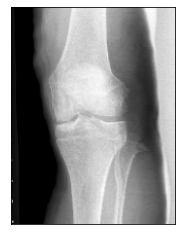

In [207]:
N = 3
image_B = batch_radio
show(netGrad.warped_image_B[N, 0])

image


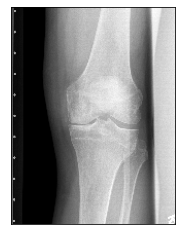

atlas


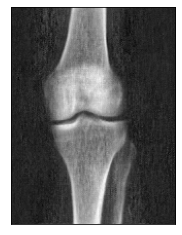

warped_image


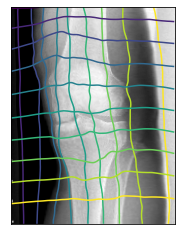

image detail


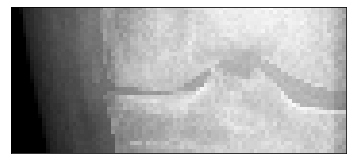

atlas detail


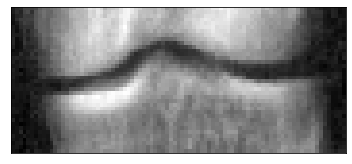

warped image detail


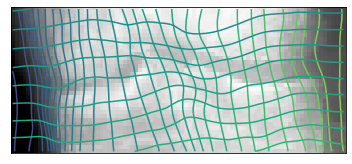

warped image overlaid with jacobian


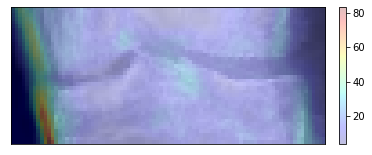

before checker


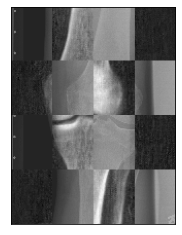

after checker


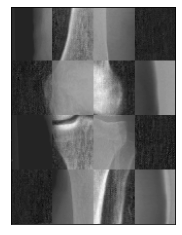

before detail checher


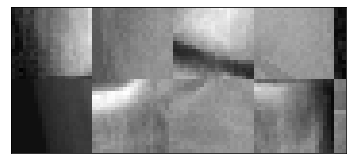

after detail checker


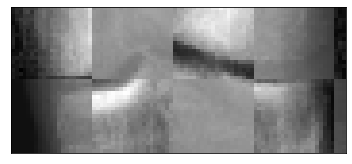

In [210]:
def visualize_case(N):
    lines = np.arange(0, 1, .1)
    image_B = batch_radio


    print("image")
    show(image_B[N, 0])
    print("atlas")

    show(atlas[0, 0])
    print("warped_image")
    plt.contour(netGrad.phi_BA_vectorfield[N, 1].detach().cpu(), lines)
    plt.contour(netGrad.phi_BA_vectorfield[N, 0].detach().cpu(), lines)
    show(netGrad.warped_image_B[N, 0])

    print("image detail")
    i4 = image_B[N, 0, 375 //4:525//4, 125//4:475//4]
    show(i4)

    print("atlas detail")
    i1 = atlas[0, 0, 375 //4:525//4, 125//4:475//4]
    show(i1)
    print("warped image detail")
    lines = np.arange(0, 1, .02)

    i2 = netGrad.warped_image_B[N, 0, 375 //4:525//4, 125//4:475//4]
    plt.contour(netGrad.phi_BA_vectorfield[N, 1, 375 //4:525//4, 125//4:475//4].detach().cpu(), lines)
    plt.contour(netGrad.phi_BA_vectorfield[N, 0, 375 //4:525//4, 125//4:475//4].detach().cpu(), lines)
    show(i2)
    #print("before")
    #show(torch.tensor(itk.checker_board_image_filter(i1.detach().cpu().numpy(), i4.detach().cpu().numpy(), checker_pattern=(8, 4))))

    #print("after")
    #show(torch.tensor(itk.checker_board_image_filter(i1.detach().cpu().numpy(), i2.detach().cpu().numpy(), checker_pattern=(8, 4))))


    print("warped image overlaid with jacobian")
    phi = netGrad.phi_BA_vectorfield
    du = (phi[:, :, 1:, :-1] - phi[:, :, :-1, :-1]).detach().cpu()
    dv = (phi[:, :, :-1, 1:] - phi[:, :, :-1, :-1]).detach().cpu()
    dA = du[:, 0] * dv[:, 1] - du[:, 1] * dv[:, 0]
    dA /= 1.85e-6
    plt.imshow(i2.cpu().detach(), cmap="gray")
    plt.imshow(dA[N, 375 //4:525//4, 125//4:475//4], alpha=.25, cmap="jet")
    plt.xticks([])
    plt.yticks([])
    im_ratio = i2.shape[0]/i2.shape[1]
    plt.colorbar(fraction=0.047*im_ratio, pad=0.04)
    plt.show()

    print("before checker")
    show(torch.tensor(itk.checker_board_image_filter(image_B[N, 0].detach().cpu().numpy(), atlas[0, 0].detach().cpu().numpy(), checker_pattern=(4, 4))))

    print("after checker")
    show(torch.tensor(itk.checker_board_image_filter(netGrad.warped_image_B[N, 0].detach().cpu().numpy(), atlas[0, 0].detach().cpu().numpy(), checker_pattern=(4, 4))))

    print("before detail checher")
    show(torch.tensor(itk.checker_board_image_filter(i1.detach().cpu().numpy(), i4.detach().cpu().numpy(), checker_pattern=(4, 2))))

    print("after detail checker")
    show(torch.tensor(
        itk.checker_board_image_filter(i1.detach().cpu().numpy(), 
                                       i2.detach().cpu().numpy(), checker_pattern=(4, 2))))
visualize_case(3)

image


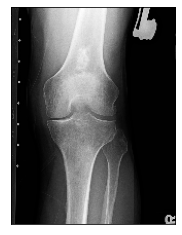

atlas


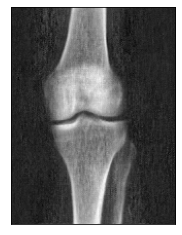

warped_image


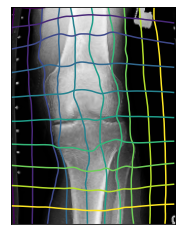

image detail


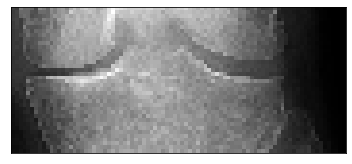

atlas detail


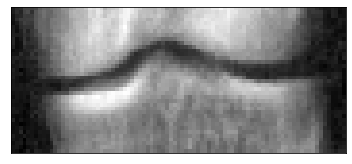

warped image detail


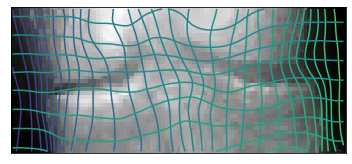

warped image overlaid with jacobian


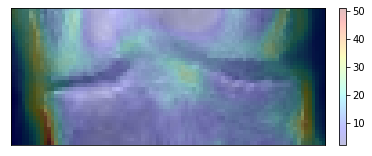

before checker


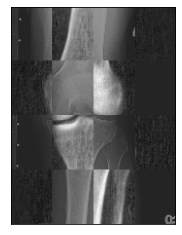

after checker


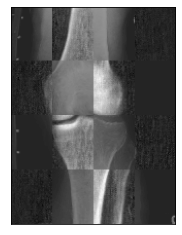

before detail checher


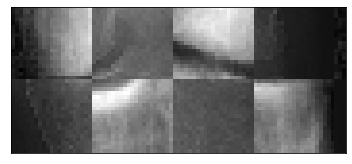

after detail checker


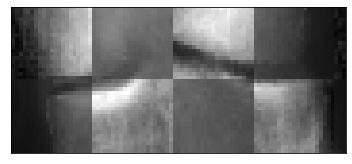

In [211]:
visualize_case(0)

image


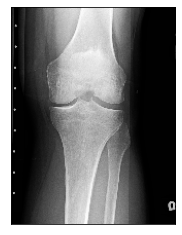

atlas


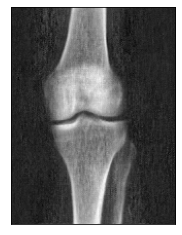

warped_image


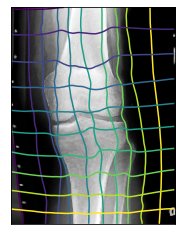

image detail


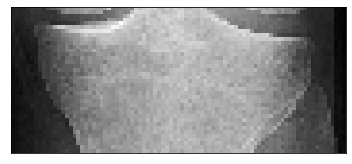

atlas detail


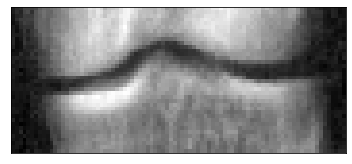

warped image detail


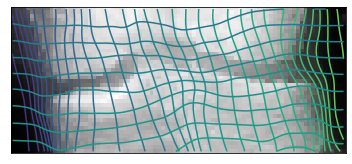

warped image overlaid with jacobian


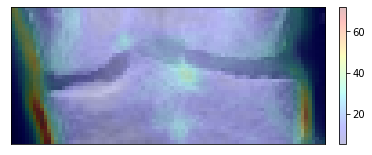

before checker


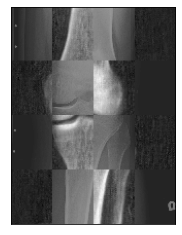

after checker


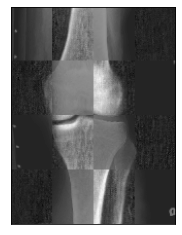

before detail checher


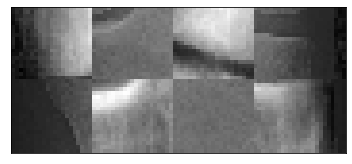

after detail checker


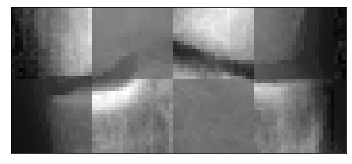

In [212]:
visualize_case(1)

image


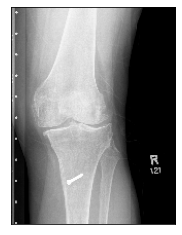

atlas


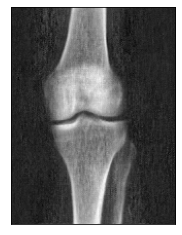

warped_image


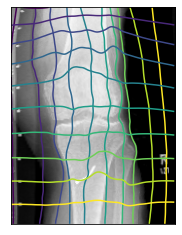

image detail


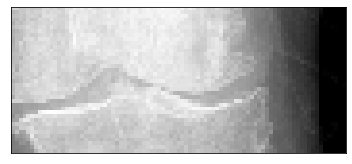

atlas detail


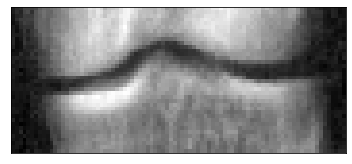

warped image detail


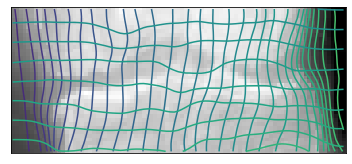

warped image overlaid with jacobian


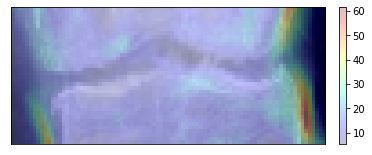

before checker


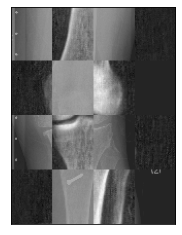

after checker


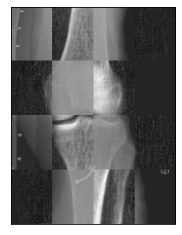

before detail checher


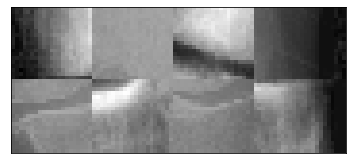

after detail checker


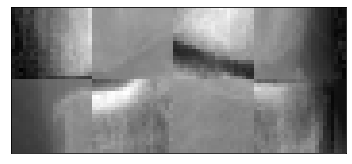

In [213]:
visualize_case(2)

image


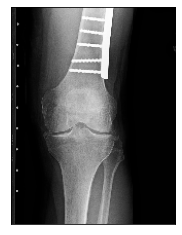

atlas


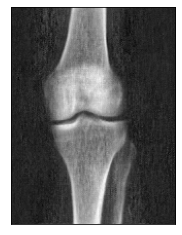

warped_image


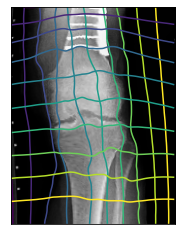

image detail


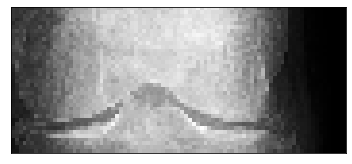

atlas detail


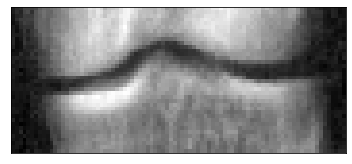

warped image detail


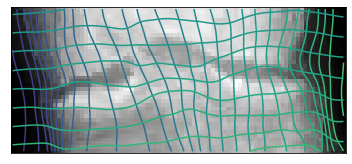

warped image overlaid with jacobian


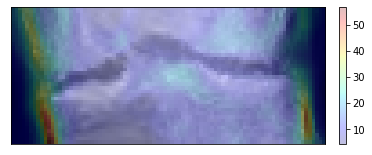

before checker


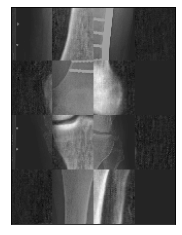

after checker


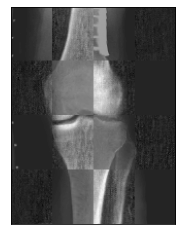

before detail checher


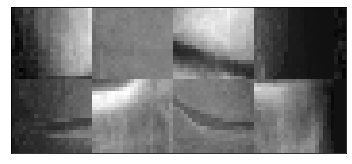

after detail checker


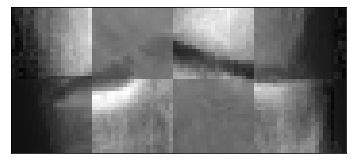

In [214]:
visualize_case(4)

image


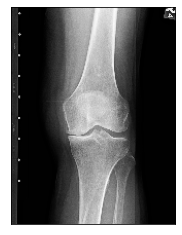

atlas


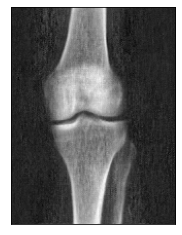

warped_image


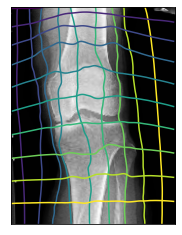

image detail


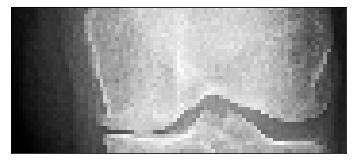

atlas detail


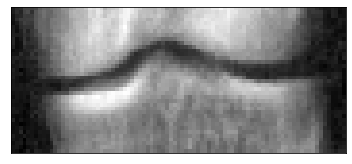

warped image detail


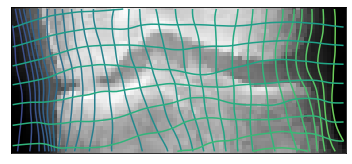

warped image overlaid with jacobian


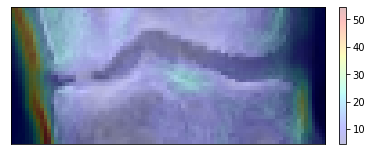

before checker


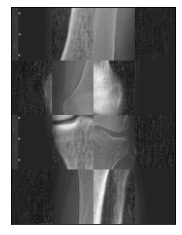

after checker


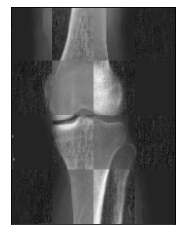

before detail checher


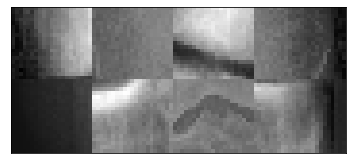

after detail checker


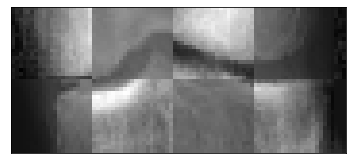

In [215]:
visualize_case(5)